In [1]:
from __future__ import print_function, division
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import r2_score, explained_variance_score, mean_absolute_error, mean_squared_error, adjusted_rand_score
from sklearn.model_selection import train_test_split, KFold, cross_val_predict
from sklearn.linear_model import LinearRegression, Lasso, LassoCV, ElasticNet, ElasticNetCV
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVR
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from ipywidgets import FloatProgress
from IPython.display import display
%matplotlib inline

In [2]:
def fit_scatter(y_true, y_pred,filename=None,title=None):
    assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.scatter(y_true, y_pred, marker='o',color='b',label='RP genes')
    ax.plot(y_true, m*y_true + b,'--', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=18)
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        fig.savefig('images/{}.pdf'.format(filename))

In [3]:
def fit_scatter_nrp(y_true, y_pred,filename=None,title=None):
    assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    plt.style.use('ggplot')
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.scatter(y_true, y_pred, marker='o',color='r',label='nonRP genes')
    ax.plot(y_true, m*y_true + b,'--', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=18)
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        fig.savefig('images/{}.pdf'.format(filename))

In [4]:
def fit_scatter_multi(y_true1,y_true2, y_pred1, y_pred2,filename=None,title=None):
#     assert y_true.shape == y_pred.shape
    fig, ax = plt.subplots()
    plt.style.use('ggplot')
    ax.scatter(y_true1, y_pred1,color='blue',label='RP genes')
    ax.scatter(y_true2, y_pred2, color='red',label='nonRP genes')
    
    y_true = np.concatenate((y_true1,y_true2),axis=0)
    y_pred = np.concatenate((y_pred1,y_pred2),axis=0)
    
    m, b = np.polyfit(y_true, y_pred, 1)
    ax.plot(y_true, m*y_true + b,linestyle='dashed', color='g',lw=2,label='Pearson\'s R: {0:.3f}'.format(np.corrcoef(y_true, y_pred)[0][1]))
    ax.set_ylim(ymin=0,ymax=1)
    ax.legend(loc=4,fontsize=16,facecolor='white')
    #ax.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'k--', lw=4,color='w')
    ax.set_xlabel('Observed AUC',fontsize=20)
    ax.set_ylabel('Predicted AUC',fontsize=20)
    if title is not None:
        ax.set_title('{}'.format(title),fontsize=22)
    if filename is not None:
        plt.savefig('images/{}.pdf'.format(filename))

In [5]:
def plot_importance(feature_importance,names,filename=None):
    plt.figure(figsize=(6, 8))
    plt.style.use('ggplot')
    # make importances relative to max importance
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    
    yy = pos[:10]
    ft = (feature_importance[sorted_idx])[:10]
    ft = 100.0 * (ft / ft.max())
    
    plt.barh(yy, ft, align='center',color='b')
    plt.yticks(yy, (names[sorted_idx])[:10])
    plt.xlabel('Relative Importance')
    plt.title('RF variable importance')
    plt.tight_layout()
    if filename is not None:
        plt.savefig('images/{}.pdf'.format(filename))
    plt.show()
    

In [6]:
# def plot_importance(feature_importance,names,filename=None):
#     plt.figure(figsize=(6, 8))
#     plt.style.use('ggplot')
#     # make importances relative to max importance
#     feature_importance = 100.0 * (feature_importance / feature_importance.max())
#     sorted_idx = np.argsort(feature_importance)
#     pos = np.arange(sorted_idx.shape[0]) + .5
#     plt.barh(pos, feature_importance[sorted_idx], align='center',color='b')
#     plt.yticks(pos, names[sorted_idx])
#     plt.xlabel('Relative Importance')
#     plt.title('RF variable importance')
#     plt.tight_layout()
#     if filename is not None:
#         plt.savefig('images/{}.pdf'.format(filename))
#     plt.show()

In [7]:
def plot_imp(feature_importance,names):
    print(names)
    feature_importance = 100.0 * (feature_importance / feature_importance.max())
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5
    
    fig2, ax2 = plt.subplots(figsize=(10,15))
    ax2.barh(pos, feature_importance[sorted_idx], align='center')
    ax2.set_yticks(pos, names[sorted_idx])
    ax2.set_xlabel('RF feature importance')

In [8]:
def print_stats(true,predictions):
    print('Coefficient of determination R^2: {}'.format(r2_score(true, predictions)))
    print('Mean squared error:               {}'.format(mean_squared_error(true, predictions)))
    print('Mean absolute error:              {}'.format(mean_absolute_error(true, predictions)))
    print('Root mean squared error:          {}'.format(np.sqrt(mean_squared_error(true, predictions))))
    print('Correlation Coefficient:          {}'.format(np.corrcoef(true, predictions)[0][1]))

In [9]:
def get_best_settings(results_1,results_2):
    best_result_1 = results_1[0][0][0]
    best_result_2 = results_2[0][0][0]
    best_difference = results_2[0][0][0] - results_1[0][0][0]

    best_i_1=0
    best_j_1=0
    best_k_1=0

    best_i_2=0
    best_j_2=0
    best_k_2=0

    best_i_3=0
    best_j_3=0
    best_k_3=0
    

    mxf = [2,4,5,7,10,12,15,18,20,30]
    md = [5,7,10,12,15,18,20]
    n_est = [10,20,30,40,50,60,80,90,200,300,500]
    
    for i in range(len(mxf)):
        for j in range(len(md)):
            for k in range(len(n_est)):
                if best_result_1 < results_1[i][j][k]:
                    best_result_1 = results_1[i][j][k]
                    best_i_1=i
                    best_j_1=j
                    best_k_1=k
                if best_result_2 < results_2[i][j][k]:
                    best_result_2 = results_2[i][j][k]
                    best_i_2=i
                    best_j_2=j
                    best_k_2=k
                if best_difference < results_2[i][j][k] - results_1[i][j][k]:
                    best_difference = results_2[i][j][k] - results_1[i][j][k]
                    best_i_3=i
                    best_j_3=j
                    best_k_3=k

#     print('{} {} {} : {}'.format(best_i_1,best_j_1,best_k_1,best_result_1))
#     print('{} {} {} : {}'.format(best_i_2,best_j_2,best_k_2,best_result_2))
#     print('{} {} {} : {}'.format(best_i_3,best_j_3,best_k_3,best_difference))

    print('Normal best: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_result_1,mxf[best_i_1],md[best_j_1],n_est[best_k_1]))
    print('Extended best: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_result_2,mxf[best_i_2],md[best_j_2],n_est[best_k_2]))
    print('Best difference: {} | max_features: {}; max_depth: {}; n_estimators: {};'.format(best_difference,mxf[best_i_3],md[best_j_3],n_est[best_k_3]))
    
    return mxf[best_i_1],md[best_j_1],n_est[best_k_1],mxf[best_i_2],md[best_j_2],n_est[best_k_2]

In [10]:
data_path = os.path.join(os.getcwd(), 'datasets', 'features.csv')
data_path_rp = os.path.join(os.getcwd(), 'datasets', 'rp_features.csv')
data_path_nrp = os.path.join(os.getcwd(), 'datasets', 'nrp_features.csv')

data_path_extended = os.path.join(os.getcwd(), 'datasets', 'extended_features.csv')
data_path_rp_extended = os.path.join(os.getcwd(), 'datasets', 'rp_extended_features.csv')
data_path_nrp_extended = os.path.join(os.getcwd(), 'datasets', 'nrp_extended_features.csv')

data_path_cut = os.path.join(os.getcwd(), 'datasets', 'features_cut.csv')
data_path_extended_cut = os.path.join(os.getcwd(), 'datasets', 'extended_features_cut.csv')

data_path_rp_cut = os.path.join(os.getcwd(), 'datasets', 'rp_features_cut.csv')
data_path_nrp_cut = os.path.join(os.getcwd(), 'datasets', 'nrp_features_cut.csv')
data_path_rp_extended_cut = os.path.join(os.getcwd(), 'datasets', 'rp_extended_features_cut.csv')
data_path_nrp_extended_cut = os.path.join(os.getcwd(), 'datasets', 'nrp_extended_features_cut.csv')

gene_features = pd.read_csv(data_path, delimiter = ',')
rp_gene_features = pd.read_csv(data_path_rp, delimiter = ',')
nrp_gene_features = pd.read_csv(data_path_nrp, delimiter = ',')

extended_features = pd.read_csv(data_path_extended, delimiter = ',')
rp_extended_features = pd.read_csv(data_path_rp_extended, delimiter = ',')
nrp_extended_features = pd.read_csv(data_path_nrp_extended, delimiter = ',')

gene_features_cut = pd.read_csv(data_path_cut, delimiter = ',')
extended_features_cut = pd.read_csv(data_path_extended_cut, delimiter = ',')
rp_features_cut = pd.read_csv(data_path_rp_cut, delimiter = ',')
rp_extended_features_cut = pd.read_csv(data_path_rp_extended_cut, delimiter = ',')
nrp_features_cut = pd.read_csv(data_path_nrp_cut, delimiter = ',')
nrp_extended_features_cut = pd.read_csv(data_path_nrp_extended_cut, delimiter = ',')

print('Number of data points: {}. Number of attributes: {}'.format(gene_features.shape[0],gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(extended_features.shape[0],extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(rp_gene_features.shape[0],rp_gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(rp_extended_features.shape[0],rp_extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(nrp_gene_features.shape[0],nrp_gene_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(nrp_extended_features.shape[0],nrp_extended_features.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(gene_features_cut.shape[0],gene_features_cut.shape[1]))
print('Number of data points: {}. Number of attributes: {}'.format(extended_features_cut.shape[0],extended_features_cut.shape[1]))

Number of data points: 117. Number of attributes: 101
Number of data points: 117. Number of attributes: 106
Number of data points: 84. Number of attributes: 101
Number of data points: 84. Number of attributes: 106
Number of data points: 33. Number of attributes: 101
Number of data points: 33. Number of attributes: 106
Number of data points: 117. Number of attributes: 21
Number of data points: 117. Number of attributes: 26


In [11]:
def get_data(dataset):
    
    X = gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_cut = gene_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y = gene_features['AUC']

    X_rp = rp_gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_rp_cut = rp_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_rp = rp_gene_features['AUC']

    X_nrp = nrp_gene_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_nrp_cut = nrp_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_nrp = nrp_gene_features['AUC']

    X_extended = extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_extended_cut = extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_extended = extended_features['AUC']

    X_rp_extended = rp_extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_rp_extended_cut = rp_extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_rp_extended = rp_extended_features['AUC']

    X_nrp_extended = nrp_extended_features.drop(['ORG', 'Gene','AUC'], axis=1)
    X_nrp_extended_cut = nrp_extended_features_cut.drop(['ORG', 'Gene','AUC'], axis=1)
    y_nrp_extended = nrp_extended_features['AUC']
    
    if dataset == 'full':
        return X,y,X_extended,y_extended
    elif dataset == 'rp':
        return X_rp,y_rp,X_rp_extended,y_rp_extended
    elif dataset == 'nrp':
        return X_nrp,y_nrp,X_nrp_extended,y_nrp_extended
    elif dataset == 'cut':
        return X_cut,y,X_extended_cut,y_extended
    elif dataset == 'rp_cut':
        return X_rp_cut,y_rp,X_rp_extended_cut,y_rp_extended
    elif dataset == 'nrp_cut':
        return X_nrp_cut,y_nrp,X_nrp_extended_cut,y_nrp_extended
    else:
        return None, None, None, None

In [12]:
def get_variable_names(dataset):
    
    if dataset == 'full':
        return gene_features.drop(['ORG','Gene','AUC'], axis=1).columns, extended_features.drop(['ORG','Gene','AUC'], axis=1).columns
    elif dataset == 'cut':
        return gene_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns
    else:
        return None, None, None, None

In [13]:
kf = KFold(n_splits=5,shuffle=True,random_state=0)

In [14]:
X,y,X2,y2 = get_data('full')

lr1 = LinearRegression()
lr2 = LinearRegression()

predictions1 = cross_val_predict(lr1,X,y=y,cv=kf)
predictions2 = cross_val_predict(lr1,X2,y=y2,cv=kf)

print('Data')
print_stats(y,predictions1)
print('\n')
print('Extended Data')
print_stats(y2,predictions2)

Data
Coefficient of determination R^2: -7.218302015333855
Mean squared error:               0.428623354505183
Mean absolute error:              0.4702581683241454
Root mean squared error:          0.6546933285937646
Correlation Coefficient:          0.15630895126957536


Extended Data
Coefficient of determination R^2: -5.124905342449793
Mean squared error:               0.31944280813837916
Mean absolute error:              0.36293982808684455
Root mean squared error:          0.5651927176975825
Correlation Coefficient:          0.22134989868329735


In [30]:
X,y,X2,y2 = get_data('rp_full')

rfr1 = ExtraTreesRegressor(random_state=1337)
rfr2 = ExtraTreesRegressor(random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

print('Data')
print_stats(y,predictions_rfr1)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'foo')
plot_importance(rfr2.feature_importances_,names2,'foo')


Data
Coefficient of determination R^2: 0.14341293973709657
Mean squared error:               0.025373674642857145
Mean absolute error:              0.11562261904761906
Root mean squared error:          0.15929116310347272
Correlation Coefficient:          0.43478418511647643


Extended Data
Coefficient of determination R^2: 0.23026901848935022
Mean squared error:               0.02280083880952381
Mean absolute error:              0.10924285714285716
Root mean squared error:          0.15099946625575802
Correlation Coefficient:          0.49358104633453104


TypeError: plot_importance() missing 1 required positional argument: 'filename'

# Full Set

In [113]:
def best_RFs(results1,results2,dataset):
     
    X,y,X2,y2 = get_data(dataset)
    mxf1, md1, n_est1, mxf2, md2, n_est2 = get_best_settings(results1,results2)
    
    kf = KFold(n_splits=5,shuffle=True,random_state=0)
    
    rfr1 = ExtraTreesRegressor(n_estimators=n_est1, 
                                criterion='mse', 
                                max_features=mxf1, 
                                max_depth=md1, 
                                n_jobs=2,
                                random_state=1337)

    rfr2 = ExtraTreesRegressor(n_estimators=n_est2, 
                                criterion='mse', 
                                max_features=mxf2, 
                                max_depth=md2, 
                                n_jobs=2,
                                random_state=1337)

    predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
    predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

    print('Normal feature space')
    print_stats(y, predictions_rfr1)
    print('\n')
    print('Extended feature space')
    print_stats(y2, predictions_rfr2)
    print('-------------------------------------------------------\n')
         
    settings = 'max_features: {}; max_depth: {}; n_estimators: {};'.format(mxf1,md1,n_est1)
          
    rfr1.fit(X,y)
    fig, ax1 = plt.subplots(figsize=(20,6))
    xx = np.arange(len(rfr1.feature_importances_))
    ax1.bar(xx, rfr1.feature_importances_)
    ax1.set_xticks(xx)
    ax1.set_xticklabels(gene_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, rotation='vertical')
    ax1.set_title('Normal RF: {} -- {}'.format(settings,np.corrcoef(y, predictions_rfr1)[0][1]))

    settings = 'max_features: {}; max_depth: {}; n_estimators: {};'.format(mxf2,md2,n_est2)
    rfr2.fit(X2,y2)
    fig2, ax2 = plt.subplots(figsize=(20,6))
    xx = np.arange(len(rfr2.feature_importances_))
    ax2.bar(xx, rfr2.feature_importances_)
    ax2.set_xticks(xx)
    ax2.set_xticklabels(extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns, rotation='vertical')
    ax2.set_title('Extended RF : {} -- {}'.format(settings,np.corrcoef(y2, predictions_rfr2)[0][1]))

In [21]:
X,y,X2,y2 = get_data('full')
print('echo')
mxf = [2,4,5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,200,300,500]

results_1_full = np.zeros((len(mxf),len(md),len(n_est)))
results_2_full = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_full[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_full[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

echo


FloatProgress(value=0.0, max=1008.0)

max_features: 5; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.3852018216398875
Mean squared error:               0.03206463537853839
Mean absolute error:              0.13508527782261703
Root mean squared error:          0.1790660084397326
Correlation Coefficient:          0.6262334345069076


Extended feature space
Coefficient of determination R^2: 0.3957114993898655
Mean squared error:               0.031516505932387695
Mean absolute error:              0.1347955201383559
Root mean squared error:          0.1775288875997022
Correlation Coefficient:          0.6403725635378434
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.4053565154042843
Mean squared error:               0.031013472688946053
Mean absolute error:              0.13336332459706582
Root mean squared error:          0.17610642432616153
Correlation Coefficient:  

KeyboardInterrupt: 

In [114]:
get_best_settings(results_1_full,results_2_full)

NameError: name 'results_1_full' is not defined

Normal best: 0.6606799891294596 | max_features: 50; max_depth: 12; n_estimators: 20;

Extended best: 0.643178381615747 | max_features: 20; max_depth: 7; n_estimators: 100;

Best difference: 0.0855855290853309 | max_features: 12; max_depth: 12; n_estimators: 10;

Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;
Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;
Best difference: 0.08235234031060501 | max_features: 12; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.46275664633060276
Mean squared error:               0.02801978413615613
Mean absolute error:              0.1249529426526229
Root mean squared error:          0.16739111128180054
Correlation Coefficient:          0.6839871870653883


Extended feature space
Coefficient of determination R^2: 0.46177284867054846
Mean squared error:               0.028071093841302037
Mean absolute error:              0.12581442108330093
Root mean squared error:          0.1675443041147685
Correlation Coefficient:          0.6955381114792492
-------------------------------------------------------



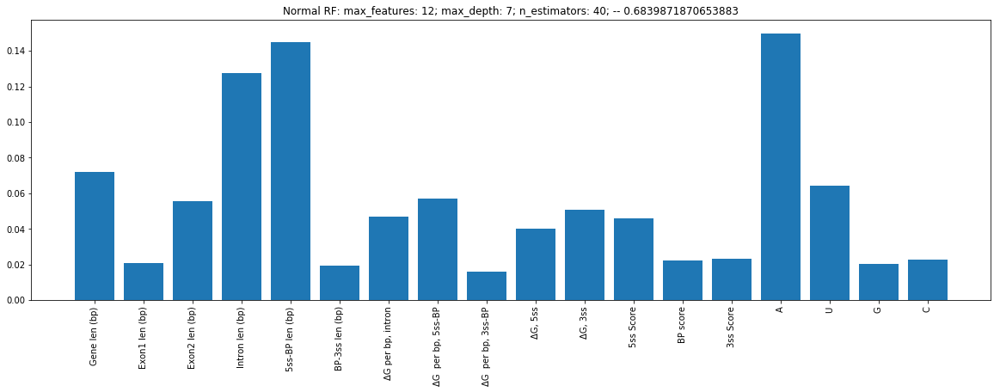

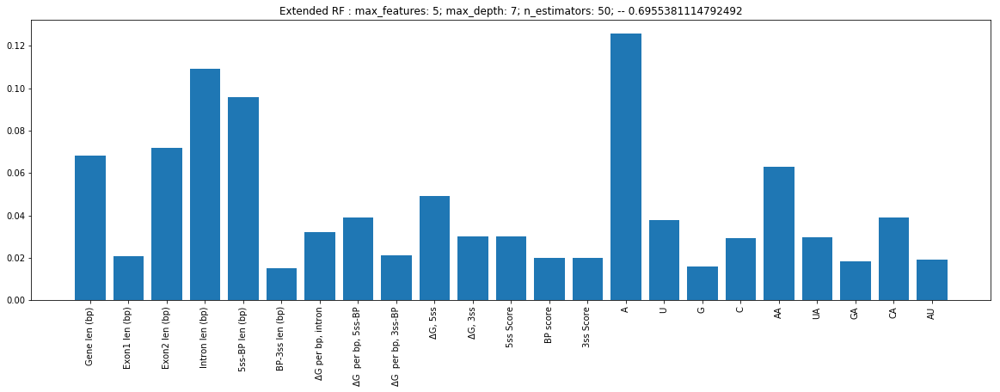

In [15]:
best_RFs(results_1_full,results_2_full,'full')

Data
Coefficient of determination R^2: 0.4088825365042926
Mean squared error:               0.03082957399684131
Mean absolute error:              0.13158937717690875
Root mean squared error:          0.1755835242750336
Correlation Coefficient:          0.656753357271128


Extended Data
Coefficient of determination R^2: 0.41094146679533605
Mean squared error:               0.030722191035447002
Mean absolute error:              0.13179640788224123
Root mean squared error:          0.17527746870447156
Correlation Coefficient:          0.6469918336286259


ValueError: shape mismatch: objects cannot be broadcast to a single shape

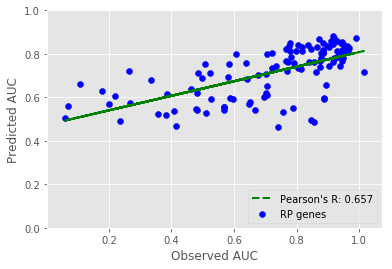

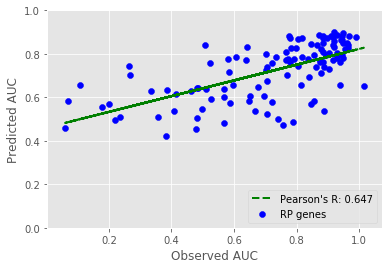

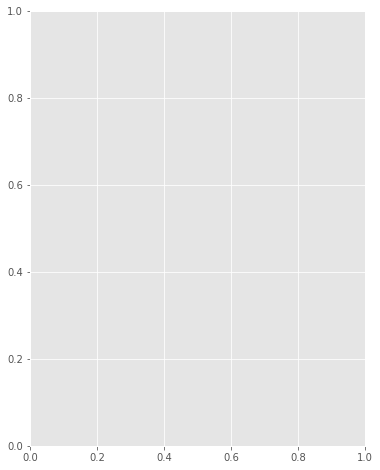

In [25]:
#BEST FULL

# Normal best: 0.656753357271128 | max_features: 12; max_depth: 12; n_estimators: 40;
# Extended best: 0.6469918336286258 | max_features: 20; max_depth: 18; n_estimators: 20;

# Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;
# Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;

X,y,X2,y2 = get_data('full')

rfr1 = ExtraTreesRegressor(n_estimators=40, 
                            criterion='mse', 
                            max_features=12, 
                            max_depth=12, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=20, 
                            criterion='mse', 
                            max_features=20, 
                            max_depth=18, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1 = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2 = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter(y,predictions_rfr1)
fit_scatter(y,predictions_rfr2)
print('Data')
print_stats(y,predictions_rfr1)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'full')
plot_importance(rfr2.feature_importances_,names2,'full_ext')


## MSE Results

Normal best: 0.6839871870653883 | max_features: 12; max_depth: 7; n_estimators: 40;

Extended best: 0.695538111479249 | max_features: 5; max_depth: 7; n_estimators: 50;

Best difference: 0.08235234031060501 | max_features: 12; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.46275664633060276
Mean squared error:               0.02801978413615613
Mean absolute error:              0.1249529426526229
Root mean squared error:          0.16739111128180054
Correlation Coefficient:          0.6839871870653883


Extended feature space
Coefficient of determination R^2: 0.46177284867054846
Mean squared error:               0.028071093841302037
Mean absolute error:              0.12581442108330093
Root mean squared error:          0.1675443041147685
Correlation Coefficient:          0.6955381114792492


# RP Genes

In [110]:
X,y,X2,y2 = get_data('rp')

mxf = [5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,100,120,140,160,200,300,500]

results_1_rp = np.zeros((len(mxf),len(md),len(n_est)))
results_2_rp = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_rp[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_rp[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

FloatProgress(value=0.0, max=840.0)

max_features: 5; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.10027375795449511
Mean squared error:               0.02665153606954604
Mean absolute error:              0.11646231505372562
Root mean squared error:          0.1632529818090501
Correlation Coefficient:          0.3191415954848009


Extended feature space
Coefficient of determination R^2: 0.25272289873455667
Mean squared error:               0.02213571382895653
Mean absolute error:              0.11075498383257029
Root mean squared error:          0.1487807575896713
Correlation Coefficient:          0.5441958462229599
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.1323152260784799
Mean squared error:               0.02570240920903995
Mean absolute error:              0.11636439120923002
Root mean squared error:          0.16031970935926734
Correlation Coefficient: 

max_features: 5; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.2344439403570795
Mean squared error:               0.022677169991670548
Mean absolute error:              0.10860578134315406
Root mean squared error:          0.1505894086304563
Correlation Coefficient:          0.6140754870714972


Extended feature space
Coefficient of determination R^2: 0.24054263818715882
Mean squared error:               0.02249651541297771
Mean absolute error:              0.10903495224512079
Root mean squared error:          0.14998838426017433
Correlation Coefficient:          0.596262237520812
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.2311320482869288
Mean squared error:               0.02277527428922376
Mean absolute error:              0.10876316098454761
Root mean squared error:          0.15091479148587048
Correlation Coefficient

max_features: 5; max_depth: 7; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.25257613982939797
Mean squared error:               0.022140061096015753
Mean absolute error:              0.10517235403631005
Root mean squared error:          0.14879536651393332
Correlation Coefficient:          0.5973363787414739


Extended feature space
Coefficient of determination R^2: 0.22978152730373091
Mean squared error:               0.022815279189619404
Mean absolute error:              0.10981355559881785
Root mean squared error:          0.15104727468451526
Correlation Coefficient:          0.5358500965033731
-------------------------------------------------------

max_features: 5; max_depth: 7; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.2541292094647175
Mean squared error:               0.022094056334267188
Mean absolute error:              0.10561860778102092
Root mean squared error:          0.14864069541773273
Correlation Coeffi

max_features: 5; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3001085825983102
Mean squared error:               0.02073206324763775
Mean absolute error:              0.09882884809130099
Root mean squared error:          0.14398633007212092
Correlation Coefficient:          0.6352357358021878


Extended feature space
Coefficient of determination R^2: 0.27139761395966744
Mean squared error:               0.021582534624936638
Mean absolute error:              0.10633607451186011
Root mean squared error:          0.14690995413836544
Correlation Coefficient:          0.5899171553912698
-------------------------------------------------------

max_features: 5; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.303894858113391
Mean squared error:               0.020619906845230282
Mean absolute error:              0.09894744617991598
Root mean squared error:          0.14359633297974667
Correlation Coefficie

max_features: 5; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.24187792875976277
Mean squared error:               0.022456961665186414
Mean absolute error:              0.10341243194801232
Root mean squared error:          0.14985647021462375
Correlation Coefficient:          0.5457397847486823


Extended feature space
Coefficient of determination R^2: 0.25621422053376175
Mean squared error:               0.02203229449481511
Mean absolute error:              0.10878133239941279
Root mean squared error:          0.14843279453953265
Correlation Coefficient:          0.5409149873584005
-------------------------------------------------------

max_features: 5; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.26008730019627824
Mean squared error:               0.02191756679487484
Mean absolute error:              0.10176113216941787
Root mean squared error:          0.14804582667159125
Correlation Coeffic

max_features: 5; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.18320496984747392
Mean squared error:               0.02419496196759259
Mean absolute error:              0.10589424603174603
Root mean squared error:          0.15554729816873256
Correlation Coefficient:          0.4286653415730119


Extended feature space
Coefficient of determination R^2: 0.22130783005656707
Mean squared error:               0.023066285592757946
Mean absolute error:              0.10879117063492066
Root mean squared error:          0.1518758887801416
Correlation Coefficient:          0.47080690172740886
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.21272594687549007
Mean squared error:               0.023320496661032572
Mean absolute error:              0.10518794642857136
Root mean squared error:          0.15271049951143692
Correlation Coeffi

max_features: 5; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3181523001707047
Mean squared error:               0.020197575347611543
Mean absolute error:              0.09847157575757581
Root mean squared error:          0.14211817388220108
Correlation Coefficient:          0.6683975241753138


Extended feature space
Coefficient of determination R^2: 0.2847793146434129
Mean squared error:               0.02118614418773666
Mean absolute error:              0.10505056361016625
Root mean squared error:          0.14555460895394778
Correlation Coefficient:          0.6126744555531586
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.294512496968937
Mean squared error:               0.02089782953412555
Mean absolute error:              0.10046047029249411
Root mean squared error:          0.14456081603991294
Correlation Coefficie

max_features: 5; max_depth: 18; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.30115221760881394
Mean squared error:               0.020701148870768356
Mean absolute error:              0.10007640707671962
Root mean squared error:          0.14387893824590295
Correlation Coefficient:          0.6534040653324377


Extended feature space
Coefficient of determination R^2: 0.2731106057673274
Mean squared error:               0.021531792676091295
Mean absolute error:              0.10689573412698421
Root mean squared error:          0.14673715506336932
Correlation Coefficient:          0.5858766826776752
-------------------------------------------------------

max_features: 5; max_depth: 18; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.30979943887447614
Mean squared error:               0.020445002368984437
Mean absolute error:              0.09906138888888891
Root mean squared error:          0.14298602158597334
Correlation Coef

max_features: 5; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2878933443632501
Mean squared error:               0.021093900934709833
Mean absolute error:              0.10083497023809519
Root mean squared error:          0.14523739509750866
Correlation Coefficient:          0.6306669132614173


Extended feature space
Coefficient of determination R^2: 0.29008399881407976
Mean squared error:               0.021029009745163706
Mean absolute error:              0.10590758928571427
Root mean squared error:          0.14501382604829
Correlation Coefficient:          0.603160111499477
-------------------------------------------------------

max_features: 5; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.289732447249207
Mean squared error:               0.021039423345182988
Mean absolute error:              0.10047245370370372
Root mean squared error:          0.14504972714618594
Correlation Coefficient:

max_features: 7; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.16968734509157501
Mean squared error:               0.02459537872429113
Mean absolute error:              0.11069479996239494
Root mean squared error:          0.15682913863275258
Correlation Coefficient:          0.44681571555251026


Extended feature space
Coefficient of determination R^2: 0.16322200224453154
Mean squared error:               0.024786893998646378
Mean absolute error:              0.11541623836123113
Root mean squared error:          0.15743854038527663
Correlation Coefficient:          0.43476527648494095
-------------------------------------------------------

max_features: 7; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.1862528919169092
Mean squared error:               0.02410467694402137
Mean absolute error:              0.10962814166893728
Root mean squared error:          0.15525680965426725
Correlation Coeffici

max_features: 7; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.14739228729867304
Mean squared error:               0.025255799093479483
Mean absolute error:              0.1115917257827886
Root mean squared error:          0.15892073210717186
Correlation Coefficient:          0.38421082298010106


Extended feature space
Coefficient of determination R^2: 0.04468718448025999
Mean squared error:               0.02829811199308804
Mean absolute error:              0.11669161377270047
Root mean squared error:          0.16822042680093294
Correlation Coefficient:          0.24756469354578373
-------------------------------------------------------

max_features: 7; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.17119782334739764
Mean squared error:               0.02455063559706412
Mean absolute error:              0.10929520428477431
Root mean squared error:          0.1566864244185313
Correlation Coefficie

max_features: 7; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.2711915975372826
Mean squared error:               0.021588637207984148
Mean absolute error:              0.10326017560311958
Root mean squared error:          0.14693072247826236
Correlation Coefficient:          0.5877086068127415


Extended feature space
Coefficient of determination R^2: 0.2917818519572515
Mean squared error:               0.02097871623123534
Mean absolute error:              0.10216103368127435
Root mean squared error:          0.14484031286639554
Correlation Coefficient:          0.6077373371269371
-------------------------------------------------------

max_features: 7; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.27692822089757285
Mean squared error:               0.021418707936991025
Mean absolute error:              0.10271738730718859
Root mean squared error:          0.14635131682697983
Correlation Coeffici

max_features: 7; max_depth: 10; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2891917780001316
Mean squared error:               0.021055438956732415
Mean absolute error:              0.10280022767232139
Root mean squared error:          0.14510492395757082
Correlation Coefficient:          0.5907547793595282


Extended feature space
Coefficient of determination R^2: 0.31384091158598604
Mean squared error:               0.02032528655909541
Mean absolute error:              0.10117175648802028
Root mean squared error:          0.1425667792969155
Correlation Coefficient:          0.6427570222564701
-------------------------------------------------------

max_features: 7; max_depth: 10; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.29163313180881845
Mean squared error:               0.02098312159390568
Mean absolute error:              0.10240429608576565
Root mean squared error:          0.14485551972191352
Correlation Coeffic

max_features: 7; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.27565191151616364
Mean squared error:               0.021456514554076232
Mean absolute error:              0.10292912782591908
Root mean squared error:          0.1464804237912911
Correlation Coefficient:          0.5709264682862355


Extended feature space
Coefficient of determination R^2: 0.2898077294089999
Mean squared error:               0.02103719334998739
Mean absolute error:              0.10351796898785734
Root mean squared error:          0.14504203994010628
Correlation Coefficient:          0.6019405648427527
-------------------------------------------------------

max_features: 7; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.2764962271992827
Mean squared error:               0.021431504380057552
Mean absolute error:              0.10398711794249986
Root mean squared error:          0.14639502853600445
Correlation Coefficie

max_features: 7; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.21879664585847736
Mean squared error:               0.023140671459375
Mean absolute error:              0.10537888888888892
Root mean squared error:          0.15212058197158923
Correlation Coefficient:          0.4957379496468227


Extended feature space
Coefficient of determination R^2: 0.2537007705744956
Mean squared error:               0.022106747477420228
Mean absolute error:              0.10575632440476193
Root mean squared error:          0.14868337996366718
Correlation Coefficient:          0.5368923511164142
-------------------------------------------------------

max_features: 7; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.24053032923910211
Mean squared error:               0.022496880026521008
Mean absolute error:              0.10424093310657596
Root mean squared error:          0.14998959972785117
Correlation Coefficie

max_features: 7; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.12578660024956168
Mean squared error:               0.02589579904100529
Mean absolute error:              0.1141793650793651
Root mean squared error:          0.16092171712048467
Correlation Coefficient:          0.35564428373249446


Extended feature space
Coefficient of determination R^2: 0.08201382814033875
Mean squared error:               0.02719242857142858
Mean absolute error:              0.11617857142857144
Root mean squared error:          0.16490126916257672
Correlation Coefficient:          0.2953611581139567
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.18328733031663036
Mean squared error:               0.02419252229993386
Mean absolute error:              0.1107998015873016
Root mean squared error:          0.15553945576584052
Correlation Coefficie

max_features: 7; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.29065007350798344
Mean squared error:               0.021012241577895035
Mean absolute error:              0.10246477777777784
Root mean squared error:          0.14495599876478046
Correlation Coefficient:          0.5980807496454161


Extended feature space
Coefficient of determination R^2: 0.2964341003726878
Mean squared error:               0.020840908128443313
Mean absolute error:              0.10207170634920647
Root mean squared error:          0.14436380477267602
Correlation Coefficient:          0.6051409928100913
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.2946553372739057
Mean squared error:               0.020893598343167508
Mean absolute error:              0.10208449470899479
Root mean squared error:          0.14454618065921876
Correlation Coeff

max_features: 7; max_depth: 20; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2708708361208375
Mean squared error:               0.02159813874751985
Mean absolute error:              0.10386378968253972
Root mean squared error:          0.14696305232105059
Correlation Coefficient:          0.5665440107773967


Extended feature space
Coefficient of determination R^2: 0.2857499860659254
Mean squared error:               0.021157391125727537
Mean absolute error:              0.10358773809523819
Root mean squared error:          0.14545580471651015
Correlation Coefficient:          0.6003557781564325
-------------------------------------------------------

max_features: 7; max_depth: 20; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.27986178062323774
Mean squared error:               0.021331810535106896
Mean absolute error:              0.10362644557823134
Root mean squared error:          0.1460541356316448
Correlation Coeffic

max_features: 10; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2701226809264503
Mean squared error:               0.02162030047207231
Mean absolute error:              0.10491894817728899
Root mean squared error:          0.14703843195597643
Correlation Coefficient:          0.5785853499454342


Extended feature space
Coefficient of determination R^2: 0.2657827083356207
Mean squared error:               0.021748858394071306
Mean absolute error:              0.10524131260519683
Root mean squared error:          0.14747494158015897
Correlation Coefficient:          0.5778973940033671
-------------------------------------------------------

max_features: 10; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.278344938462758
Mean squared error:               0.021376742172823638
Mean absolute error:              0.10466595075928055
Root mean squared error:          0.14620787315607747
Correlation Coefficien

max_features: 10; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.2685886966109756
Mean squared error:               0.021665739891757397
Mean absolute error:              0.10374922873245362
Root mean squared error:          0.1471928663072956
Correlation Coefficient:          0.5461750167450975


Extended feature space
Coefficient of determination R^2: 0.24607253789484962
Mean squared error:               0.022332709674483937
Mean absolute error:              0.1069538898801665
Root mean squared error:          0.1494413251898013
Correlation Coefficient:          0.5435615182094341
-------------------------------------------------------

max_features: 10; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.2505935191553139
Mean squared error:               0.022198789944790298
Mean absolute error:              0.10533886533933363
Root mean squared error:          0.14899258352277236
Correlation Coefficien

max_features: 10; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.20618462627892364
Mean squared error:               0.023514262535222822
Mean absolute error:              0.11353332891645393
Root mean squared error:          0.15334360937196836
Correlation Coefficient:          0.4549213513962369


Extended feature space
Coefficient of determination R^2: 0.15876948371123878
Mean squared error:               0.024918785737205195
Mean absolute error:              0.11730012886506071
Root mean squared error:          0.1578568520438856
Correlation Coefficient:          0.399475434047992
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.29054854208903924
Mean squared error:               0.02101524912413269
Mean absolute error:              0.10552037249952428
Root mean squared error:          0.14496637239074686
Correlation Coeffi

max_features: 10; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3225432911909002
Mean squared error:               0.02006750616646847
Mean absolute error:              0.10069447106950337
Root mean squared error:          0.141659825520394
Correlation Coefficient:          0.6307428641351557


Extended feature space
Coefficient of determination R^2: 0.294154926312604
Mean squared error:               0.02090842143063732
Mean absolute error:              0.1016504149123266
Root mean squared error:          0.14459744614147693
Correlation Coefficient:          0.5834497292879754
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33121299830389317
Mean squared error:               0.019810693592780475
Mean absolute error:              0.09982484377637466
Root mean squared error:          0.14075046569294353
Correlation Coefficie

max_features: 10; max_depth: 12; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.342785039386324
Mean squared error:               0.019467908581191278
Mean absolute error:              0.09951823239466946
Root mean squared error:          0.1395274474115802
Correlation Coefficient:          0.6501097138884263


Extended feature space
Coefficient of determination R^2: 0.31338215494777677
Mean squared error:               0.020338875769367392
Mean absolute error:              0.101107253143285
Root mean squared error:          0.14261443043874414
Correlation Coefficient:          0.6143547554201952
-------------------------------------------------------

max_features: 10; max_depth: 12; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3437310397646878
Mean squared error:               0.01943988632061072
Mean absolute error:              0.09926985334688233
Root mean squared error:          0.139426992797703
Correlation Coefficien

max_features: 10; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.30344027335412094
Mean squared error:               0.020633372476821517
Mean absolute error:              0.10410565972222226
Root mean squared error:          0.1436432124286474
Correlation Coefficient:          0.5962496147710054


Extended feature space
Coefficient of determination R^2: 0.2804655966792944
Mean squared error:               0.021313924399696666
Mean absolute error:              0.10351911684545606
Root mean squared error:          0.1459928916067377
Correlation Coefficient:          0.575242827415624
-------------------------------------------------------

max_features: 10; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3157448006607996
Mean squared error:               0.020268889884219675
Mean absolute error:              0.10375650058788946
Root mean squared error:          0.1423688515238487
Correlation Coefficie

max_features: 10; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.27770640111369804
Mean squared error:               0.02139565681640626
Mean absolute error:              0.10773764880952387
Root mean squared error:          0.1462725429340936
Correlation Coefficient:          0.5504136135059104


Extended feature space
Coefficient of determination R^2: 0.2658863437135939
Mean squared error:               0.021745788524720987
Mean absolute error:              0.10852563988095243
Root mean squared error:          0.14746453310786628
Correlation Coefficient:          0.554861558108837
-------------------------------------------------------

max_features: 10; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.26820234543276733
Mean squared error:               0.021677184319940486
Mean absolute error:              0.1074504166666667
Root mean squared error:          0.14723173679591126
Correlation Coeffici

max_features: 10; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.16733223773554895
Mean squared error:               0.024665141309523814
Mean absolute error:              0.1181035714285714
Root mean squared error:          0.15705139703142987
Correlation Coefficient:          0.4170734658044551


Extended feature space
Coefficient of determination R^2: 0.1596131952238501
Mean squared error:               0.024893793459821435
Mean absolute error:              0.11969315476190479
Root mean squared error:          0.15777767097983617
Correlation Coefficient:          0.40965171937190126
-------------------------------------------------------

max_features: 10; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.2116642537465825
Mean squared error:               0.02335194595238095
Mean absolute error:              0.11446666666666666
Root mean squared error:          0.1528134351174037
Correlation Coeffic

max_features: 10; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.32711473107787825
Mean squared error:               0.019932091760014606
Mean absolute error:              0.10066076388888894
Root mean squared error:          0.14118106020289906
Correlation Coefficient:          0.6340338619684363


Extended feature space
Coefficient of determination R^2: 0.3019817513948827
Mean squared error:               0.020676576563562934
Mean absolute error:              0.10053592757936518
Root mean squared error:          0.14379352058963898
Correlation Coefficient:          0.6025439875894562
-------------------------------------------------------

max_features: 10; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33246593052312234
Mean squared error:               0.01977357944997459
Mean absolute error:              0.0999637103174604
Root mean squared error:          0.14061856011912008
Correlation Coef

max_features: 12; max_depth: 5; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.2913401518968559
Mean squared error:               0.020991800194491532
Mean absolute error:              0.10355951130371388
Root mean squared error:          0.14488547268270732
Correlation Coefficient:          0.601103919294357


Extended feature space
Coefficient of determination R^2: 0.27314943423424476
Mean squared error:               0.021530642505919288
Mean absolute error:              0.10480399093485739
Root mean squared error:          0.14673323585990766
Correlation Coefficient:          0.581179611292247
-------------------------------------------------------

max_features: 12; max_depth: 5; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.2882972338901074
Mean squared error:               0.021081936988578086
Mean absolute error:              0.10344314746454918
Root mean squared error:          0.14519620170162195
Correlation Coeffic

max_features: 12; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.2968031452449733
Mean squared error:               0.020829976344679136
Mean absolute error:              0.10153139254362048
Root mean squared error:          0.14432593787909065
Correlation Coefficient:          0.5778363516389239


Extended feature space
Coefficient of determination R^2: 0.3125914771866726
Mean squared error:               0.020362297090081066
Mean absolute error:              0.10089958234915297
Root mean squared error:          0.14269652094596091
Correlation Coefficient:          0.6153709965736824
-------------------------------------------------------

max_features: 12; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.29814512058588816
Mean squared error:               0.020790224581830115
Mean absolute error:              0.1009891390236852
Root mean squared error:          0.14418815687090988
Correlation Coeffici

max_features: 12; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.3065112093052408
Mean squared error:               0.02054240574000337
Mean absolute error:              0.10162425737825401
Root mean squared error:          0.14332622139721457
Correlation Coefficient:          0.5845701946252161


Extended feature space
Coefficient of determination R^2: 0.25127550570109414
Mean squared error:               0.022178588256571794
Mean absolute error:              0.10643398413426708
Root mean squared error:          0.14892477381742703
Correlation Coefficient:          0.5336302502283244
-------------------------------------------------------

max_features: 12; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3264981949096223
Mean squared error:               0.019950354688401686
Mean absolute error:              0.10038575698979922
Root mean squared error:          0.1412457244960062
Correlation Coeffic

max_features: 12; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.16873700574413808
Mean squared error:               0.02462352951306766
Mean absolute error:              0.10873727277021918
Root mean squared error:          0.1569188628338469
Correlation Coefficient:          0.41963055537488025


Extended feature space
Coefficient of determination R^2: 0.1828843993180158
Mean squared error:               0.02420445785270678
Mean absolute error:              0.11022146258503404
Root mean squared error:          0.15557781928252748
Correlation Coefficient:          0.42906797908949845
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.30168283354702174
Mean squared error:               0.020685431056665177
Mean absolute error:              0.10330077758881331
Root mean squared error:          0.14382430620957354
Correlation Coeff

max_features: 12; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3210184688236266
Mean squared error:               0.020112674192498976
Mean absolute error:              0.10132686426784716
Root mean squared error:          0.14181916017414212
Correlation Coefficient:          0.6215410075299747


Extended feature space
Coefficient of determination R^2: 0.32071219617472246
Mean squared error:               0.020121746548253355
Mean absolute error:              0.09984735506141273
Root mean squared error:          0.14185114221694994
Correlation Coefficient:          0.62262041266781
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3330849327737119
Mean squared error:               0.019755243471720568
Mean absolute error:              0.09955339128867283
Root mean squared error:          0.14055334742267994
Correlation Coeff

max_features: 12; max_depth: 15; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.33131529581398866
Mean squared error:               0.019807663353522437
Mean absolute error:              0.09909613316605137
Root mean squared error:          0.1407397007014099
Correlation Coefficient:          0.6377017970274454


Extended feature space
Coefficient of determination R^2: 0.3272761086043253
Mean squared error:               0.01992731146266867
Mean absolute error:              0.10022746117143447
Root mean squared error:          0.1411641295183329
Correlation Coefficient:          0.6192546885112764
-------------------------------------------------------

max_features: 12; max_depth: 15; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.33032484748408775
Mean squared error:               0.019837002243682362
Mean absolute error:              0.09911646255907737
Root mean squared error:          0.14084389317142
Correlation Coeffici

max_features: 12; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.336576156210752
Mean squared error:               0.01965182705124629
Mean absolute error:              0.09828266369047615
Root mean squared error:          0.14018497441325975
Correlation Coefficient:          0.634859066931173


Extended feature space
Coefficient of determination R^2: 0.3263874967923406
Mean squared error:               0.019953633769001642
Mean absolute error:              0.10017947668650788
Root mean squared error:          0.14125733173538865
Correlation Coefficient:          0.6123960964925877
-------------------------------------------------------

max_features: 12; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.33819323787372546
Mean squared error:               0.019603926136218898
Mean absolute error:              0.09821655643738976
Root mean squared error:          0.1400140212129446
Correlation Coefficie

max_features: 12; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.30632248366776205
Mean squared error:               0.02054799613839286
Mean absolute error:              0.100058630952381
Root mean squared error:          0.14334572242795687
Correlation Coefficient:          0.5866577560468813


Extended feature space
Coefficient of determination R^2: 0.28824888364220536
Mean squared error:               0.02108336921130953
Mean absolute error:              0.10362559523809525
Root mean squared error:          0.14520113364333465
Correlation Coefficient:          0.5651183081168163
-------------------------------------------------------

max_features: 12; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.32644388643293576
Mean squared error:               0.0199519634047619
Mean absolute error:              0.09725023809523807
Root mean squared error:          0.14125141912477163
Correlation Coefficie

max_features: 15; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.05736569970685301
Mean squared error:               0.027922551194614915
Mean absolute error:              0.11582926927595145
Root mean squared error:          0.16710042248484866
Correlation Coefficient:          0.28663024629830053


Extended feature space
Coefficient of determination R^2: 0.25947387691674917
Mean squared error:               0.02193573751380719
Mean absolute error:              0.10473038449133452
Root mean squared error:          0.14810718251930657
Correlation Coefficient:          0.533412846438235
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.11712033322703497
Mean squared error:               0.02615250971292488
Mean absolute error:              0.1130563431880203
Root mean squared error:          0.1617173760389553
Correlation Coefficie

max_features: 15; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.29018679518679047
Mean squared error:               0.02102596472868304
Mean absolute error:              0.10264083288934128
Root mean squared error:          0.14500332661247134
Correlation Coefficient:          0.5874839949869956


Extended feature space
Coefficient of determination R^2: 0.3109158143810683
Mean squared error:               0.02041193328564476
Mean absolute error:              0.10175679392212876
Root mean squared error:          0.1428703373189997
Correlation Coefficient:          0.6201486853971554
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.28821098747290874
Mean squared error:               0.02108449176512169
Mean absolute error:              0.10253644572645525
Root mean squared error:          0.14520499910513304
Correlation Coeffici

max_features: 15; max_depth: 7; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.31256552751777766
Mean squared error:               0.020363065766712055
Mean absolute error:              0.10209600958531875
Root mean squared error:          0.14269921431708044
Correlation Coefficient:          0.5989594617717758


Extended feature space
Coefficient of determination R^2: 0.3327768569768672
Mean squared error:               0.019764369240013256
Mean absolute error:              0.09925865070814607
Root mean squared error:          0.1405858073918319
Correlation Coefficient:          0.6287648839064015
-------------------------------------------------------

max_features: 15; max_depth: 7; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.321478619237505
Mean squared error:               0.020099043696043727
Mean absolute error:              0.1008711722142838
Root mean squared error:          0.14177109612344727
Correlation Coeffici

max_features: 15; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.31362822473199325
Mean squared error:               0.020331586732521296
Mean absolute error:              0.10053577318502463
Root mean squared error:          0.1425888731020808
Correlation Coefficient:          0.6032640898191085


Extended feature space
Coefficient of determination R^2: 0.3304665466380493
Mean squared error:               0.019832804855703275
Mean absolute error:              0.09888580501829669
Root mean squared error:          0.14082899153123007
Correlation Coefficient:          0.6225147692662315
-------------------------------------------------------

max_features: 15; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3064022846667074
Mean squared error:               0.02054563228692072
Mean absolute error:              0.10127501536069937
Root mean squared error:          0.14333747690998583
Correlation Coeffic

max_features: 15; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.27342586233716837
Mean squared error:               0.02152245420017536
Mean absolute error:              0.10137955279839213
Root mean squared error:          0.1467053311920714
Correlation Coefficient:          0.5453072368010515


Extended feature space
Coefficient of determination R^2: 0.3675614725774209
Mean squared error:               0.01873398533653191
Mean absolute error:              0.09652555873150549
Root mean squared error:          0.13687214960148728
Correlation Coefficient:          0.6556956543010595
-------------------------------------------------------

max_features: 15; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3009872991724142
Mean squared error:               0.020706034056340188
Mean absolute error:              0.09872859386380811
Root mean squared error:          0.14389591396679818
Correlation Coeffici

max_features: 15; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.14832771864040895
Mean squared error:               0.025228089907084986
Mean absolute error:              0.11361618055555558
Root mean squared error:          0.1588335289134035
Correlation Coefficient:          0.39673280112289266


Extended feature space
Coefficient of determination R^2: 0.2440094015379436
Mean squared error:               0.022393823544973546
Mean absolute error:              0.10818075396825395
Root mean squared error:          0.1496456599603662
Correlation Coefficient:          0.49435754291347117
-------------------------------------------------------

max_features: 15; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.23385544695198046
Mean squared error:               0.022694602242148237
Mean absolute error:              0.1053945783730159
Root mean squared error:          0.15064727757961058
Correlation Coeff

max_features: 15; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.33362273952481636
Mean squared error:               0.019739312652593943
Mean absolute error:              0.09734204188354638
Root mean squared error:          0.1404966642045068
Correlation Coefficient:          0.6273740020074435


Extended feature space
Coefficient of determination R^2: 0.3418772927384135
Mean squared error:               0.019494797696344567
Mean absolute error:              0.09820400875249101
Root mean squared error:          0.1396237719600232
Correlation Coefficient:          0.6400560456411526
-------------------------------------------------------

max_features: 15; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.33254410665136835
Mean squared error:               0.019771263730142978
Mean absolute error:              0.09752064533751217
Root mean squared error:          0.1406103258304417
Correlation Coeff

max_features: 15; max_depth: 18; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.31989355709773537
Mean squared error:               0.02014599613425927
Mean absolute error:              0.09898214285714294
Root mean squared error:          0.14193659194957187
Correlation Coefficient:          0.6134527516549316


Extended feature space
Coefficient of determination R^2: 0.3440846654341121
Mean squared error:               0.019429411281822975
Mean absolute error:              0.09805956514550268
Root mean squared error:          0.13938942313469474
Correlation Coefficient:          0.6426618365524956
-------------------------------------------------------

max_features: 15; max_depth: 18; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3207044202870022
Mean squared error:               0.020121976884262645
Mean absolute error:              0.098814668367347
Root mean squared error:          0.14185195410801588
Correlation Coeffi

max_features: 15; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.32253878380486734
Mean squared error:               0.020067639683482668
Mean absolute error:              0.09861117311507932
Root mean squared error:          0.14166029677888814
Correlation Coefficient:          0.6101721742060552


Extended feature space
Coefficient of determination R^2: 0.34631570019469826
Mean squared error:               0.019363323953683037
Mean absolute error:              0.0991974702380952
Root mean squared error:          0.13915216115347628
Correlation Coefficient:          0.64049376046603
-------------------------------------------------------

max_features: 15; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3164723954894172
Mean squared error:               0.020247337195287502
Mean absolute error:              0.09965371472663137
Root mean squared error:          0.1422931382579199
Correlation Coeffici

max_features: 18; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.30442970014481185
Mean squared error:               0.020604063846520457
Mean absolute error:              0.10248835436167351
Root mean squared error:          0.14354115732611486
Correlation Coefficient:          0.5796538643140788


Extended feature space
Coefficient of determination R^2: 0.26966329904638564
Mean squared error:               0.02163390820315105
Mean absolute error:              0.10434527933264169
Root mean squared error:          0.1470846973792687
Correlation Coefficient:          0.556519072849497
-------------------------------------------------------

max_features: 18; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3037520559487574
Mean squared error:               0.020624136906401875
Mean absolute error:              0.1018843030835103
Root mean squared error:          0.14361106122580486
Correlation Coefficien

max_features: 18; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.2828380907190218
Mean squared error:               0.021243646789108332
Mean absolute error:              0.10635527021009338
Root mean squared error:          0.14575200440854436
Correlation Coefficient:          0.5390246752949343


Extended feature space
Coefficient of determination R^2: 0.30624489155177503
Mean squared error:               0.020550294558713728
Mean absolute error:              0.10365647631092675
Root mean squared error:          0.1433537392561273
Correlation Coefficient:          0.5756839164270078
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.2741410042087733
Mean squared error:               0.021501270390595024
Mean absolute error:              0.10483192875204203
Root mean squared error:          0.14663311491813513
Correlation Coeffici

max_features: 18; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.33901098542924013
Mean squared error:               0.019579702958708773
Mean absolute error:              0.09923246736007434
Root mean squared error:          0.13992749179024389
Correlation Coefficient:          0.6228150262105647


Extended feature space
Coefficient of determination R^2: 0.34097128589037573
Mean squared error:               0.019521635275445114
Mean absolute error:              0.09827520242684432
Root mean squared error:          0.13971984567499748
Correlation Coefficient:          0.6368760987361108
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3285308207342068
Mean squared error:               0.019890144595655423
Mean absolute error:              0.09955040482188655
Root mean squared error:          0.14103242391611734
Correlation Coef

max_features: 18; max_depth: 10; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3114587044439632
Mean squared error:               0.020395851889530154
Mean absolute error:              0.100532731340291
Root mean squared error:          0.14281404654140345
Correlation Coefficient:          0.5830132796866934


Extended feature space
Coefficient of determination R^2: 0.359067993425494
Mean squared error:               0.018985577715852627
Mean absolute error:              0.09894275164143487
Root mean squared error:          0.1377881624663477
Correlation Coefficient:          0.6449151408158325
-------------------------------------------------------

max_features: 18; max_depth: 10; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.30742458409089957
Mean squared error:               0.020515349909121235
Mean absolute error:              0.10069424185509199
Root mean squared error:          0.1432318048099696
Correlation Coeffici

max_features: 18; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.34621535544155835
Mean squared error:               0.01936629634871024
Mean absolute error:              0.09924717332235683
Root mean squared error:          0.1391628411204307
Correlation Coefficient:          0.6214302753645576


Extended feature space
Coefficient of determination R^2: 0.3592133189421456
Mean squared error:               0.018981272908381346
Mean absolute error:              0.10077056311695994
Root mean squared error:          0.13777254047298884
Correlation Coefficient:          0.6454257979782215
-------------------------------------------------------

max_features: 18; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.34959916868568797
Mean squared error:               0.01926606161450542
Mean absolute error:              0.09916086072846429
Root mean squared error:          0.13880223922727405
Correlation Coeffic

max_features: 18; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.33357170887961496
Mean squared error:               0.0197408242735934
Mean absolute error:              0.10028148526077099
Root mean squared error:          0.14050204366340513
Correlation Coefficient:          0.6000976175491616


Extended feature space
Coefficient of determination R^2: 0.313728535386939
Mean squared error:               0.02032861534754494
Mean absolute error:              0.1018073419784581
Root mean squared error:          0.14257845330745084
Correlation Coefficient:          0.5928568123222004
-------------------------------------------------------

max_features: 18; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.33313468104572697
Mean squared error:               0.019753769836959183
Mean absolute error:              0.10008625963718819
Root mean squared error:          0.140548105063566
Correlation Coefficient

max_features: 18; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.28338854358139776
Mean squared error:               0.02122734136904762
Mean absolute error:              0.10597738095238096
Root mean squared error:          0.14569605817951156
Correlation Coefficient:          0.5348992522659215


Extended feature space
Coefficient of determination R^2: 0.2801635790400725
Mean squared error:               0.02132287071428571
Mean absolute error:              0.10600238095238095
Root mean squared error:          0.14602352794767598
Correlation Coefficient:          0.5400698132778796
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.3222824713156257
Mean squared error:               0.02007523212797619
Mean absolute error:              0.09935773809523811
Root mean squared error:          0.1416870923125187
Correlation Coefficie

max_features: 18; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3533790989622837
Mean squared error:               0.019154093169661546
Mean absolute error:              0.0985890932539683
Root mean squared error:          0.13839831346393477
Correlation Coefficient:          0.6339339252155831


Extended feature space
Coefficient of determination R^2: 0.36011229773156417
Mean squared error:               0.01895464351322502
Mean absolute error:              0.09691325363756619
Root mean squared error:          0.1376758639458094
Correlation Coefficient:          0.6547026427188977
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.3430613181159845
Mean squared error:               0.019459724700156472
Mean absolute error:              0.09920253042328046
Root mean squared error:          0.13949811719215593
Correlation Coeffi

max_features: 18; max_depth: 20; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.35176645239117876
Mean squared error:               0.01920186270916005
Mean absolute error:              0.09891359126984127
Root mean squared error:          0.13857078591521393
Correlation Coefficient:          0.6266823792410825


Extended feature space
Coefficient of determination R^2: 0.3661295139360565
Mean squared error:               0.01877640256923778
Mean absolute error:              0.09757683531746036
Root mean squared error:          0.137027014012704
Correlation Coefficient:          0.6536824227927223
-------------------------------------------------------

max_features: 18; max_depth: 20; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.34218190940847226
Mean squared error:               0.01948577439371087
Mean absolute error:              0.09952988945578231
Root mean squared error:          0.13959145530336328
Correlation Coeffic

max_features: 20; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.28860271803955684
Mean squared error:               0.02107288798961901
Mean absolute error:              0.10265142090120781
Root mean squared error:          0.14516503707717987
Correlation Coefficient:          0.5635581691756075


Extended feature space
Coefficient of determination R^2: 0.27850499277484575
Mean squared error:               0.02137200107150598
Mean absolute error:              0.10503592756143715
Root mean squared error:          0.1461916586933262
Correlation Coefficient:          0.5450429495165517
-------------------------------------------------------

max_features: 20; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.29958991514711
Mean squared error:               0.02074742712571286
Mean absolute error:              0.10243404363047001
Root mean squared error:          0.14403967205500318
Correlation Coefficient:

max_features: 20; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.2947142458259968
Mean squared error:               0.02089185336416446
Mean absolute error:              0.10186083719527278
Root mean squared error:          0.14454014447261515
Correlation Coefficient:          0.5627935546846632


Extended feature space
Coefficient of determination R^2: 0.2806737268028572
Mean squared error:               0.021307759204956228
Mean absolute error:              0.10309038995777543
Root mean squared error:          0.14597177537098133
Correlation Coefficient:          0.5362539235364678
-------------------------------------------------------

max_features: 20; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.31050006636258665
Mean squared error:               0.020424248501976803
Mean absolute error:              0.1010341509099288
Root mean squared error:          0.1429134300966036
Correlation Coefficien

max_features: 20; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.1620138674554763
Mean squared error:               0.024822681159676802
Mean absolute error:              0.10900591379314203
Root mean squared error:          0.15755215377669962
Correlation Coefficient:          0.40715861636961176


Extended feature space
Coefficient of determination R^2: 0.19882555729406948
Mean squared error:               0.023732251611591454
Mean absolute error:              0.10815300671783865
Root mean squared error:          0.1540527559363722
Correlation Coefficient:          0.45038389384092636
-------------------------------------------------------

max_features: 20; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.22472397757503826
Mean squared error:               0.022965093058237185
Mean absolute error:              0.10248267229876606
Root mean squared error:          0.15154238040309775
Correlation Coe

max_features: 20; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3508361765539577
Mean squared error:               0.019229419180086093
Mean absolute error:              0.0983793947279022
Root mean squared error:          0.13867018129391082
Correlation Coefficient:          0.62617353889323


Extended feature space
Coefficient of determination R^2: 0.32444375174233353
Mean squared error:               0.020011211050722906
Mean absolute error:              0.10001193537128265
Root mean squared error:          0.14146098773415555
Correlation Coefficient:          0.59313083948208
-------------------------------------------------------

max_features: 20; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.34629507408177873
Mean squared error:               0.019363934936854094
Mean absolute error:              0.09809627136210523
Root mean squared error:          0.13915435651410304
Correlation Coeffic

max_features: 20; max_depth: 12; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.36438572719106654
Mean squared error:               0.01882805672042274
Mean absolute error:              0.09653013981806784
Root mean squared error:          0.1372153661964386
Correlation Coefficient:          0.6488735783841336


Extended feature space
Coefficient of determination R^2: 0.3239911777515727
Mean squared error:               0.020024617119675032
Mean absolute error:              0.09920758421776135
Root mean squared error:          0.14150836413327317
Correlation Coefficient:          0.5937176765684419
-------------------------------------------------------

max_features: 20; max_depth: 12; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.35381531102512254
Mean squared error:               0.01914117177092554
Mean absolute error:              0.09764337475713451
Root mean squared error:          0.1383516236656641
Correlation Coeffi

max_features: 20; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3356279517872951
Mean squared error:               0.0196799145996717
Mean absolute error:              0.09737795312285262
Root mean squared error:          0.14028511895305112
Correlation Coefficient:          0.6116725445679213


Extended feature space
Coefficient of determination R^2: 0.30933543236157146
Mean squared error:               0.020458747090142143
Mean absolute error:              0.10034685087481958
Root mean squared error:          0.14303407667455384
Correlation Coefficient:          0.5730273902213733
-------------------------------------------------------

max_features: 20; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3444315584623373
Mean squared error:               0.019419135676175415
Mean absolute error:              0.0979043405664735
Root mean squared error:          0.13935255891506051
Correlation Coeffici

max_features: 20; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.32165785761218246
Mean squared error:               0.020093734327721977
Mean absolute error:              0.09891837797619052
Root mean squared error:          0.14175236974287936
Correlation Coefficient:          0.5949057721367492


Extended feature space
Coefficient of determination R^2: 0.30549298079146225
Mean squared error:               0.020572567529994413
Mean absolute error:              0.09954040178571429
Root mean squared error:          0.14343140356977063
Correlation Coefficient:          0.5684171341694189
-------------------------------------------------------

max_features: 20; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.3194301910646411
Mean squared error:               0.020159721883234134
Mean absolute error:              0.09871708333333332
Root mean squared error:          0.14198493540947973
Correlation Coef

max_features: 20; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.15939160454041545
Mean squared error:               0.024900357380952382
Mean absolute error:              0.11434047619047616
Root mean squared error:          0.15779847078141276
Correlation Coefficient:          0.4038201390945876


Extended feature space
Coefficient of determination R^2: 0.21982278851205872
Mean squared error:               0.02311027523809524
Mean absolute error:              0.1062809523809524
Root mean squared error:          0.15202064082911648
Correlation Coefficient:          0.4771872589586374
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.23479285326238253
Mean squared error:               0.02266683455357143
Mean absolute error:              0.10503392857142858
Root mean squared error:          0.15055508810256607
Correlation Coeffi

max_features: 20; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.3481905657141626
Mean squared error:               0.019307787009574404
Mean absolute error:              0.09818288690476196
Root mean squared error:          0.13895246312884996
Correlation Coefficient:          0.627413421411996


Extended feature space
Coefficient of determination R^2: 0.34222583020121466
Mean squared error:               0.019484473379538698
Mean absolute error:              0.09946235119047624
Root mean squared error:          0.13958679514745906
Correlation Coefficient:          0.6167050853211288
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.34376005833044376
Mean squared error:               0.01943902673764449
Mean absolute error:              0.0980224722222223
Root mean squared error:          0.13942391020784237
Correlation Coeff

max_features: 30; max_depth: 5; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3457521829297573
Mean squared error:               0.019380016365230623
Mean absolute error:              0.09772212032693602
Root mean squared error:          0.13921212722040643
Correlation Coefficient:          0.6217665076306276


Extended feature space
Coefficient of determination R^2: 0.3338083952508294
Mean squared error:               0.01973381319059414
Mean absolute error:              0.09893585457781844
Root mean squared error:          0.1404770913373214
Correlation Coefficient:          0.6044592388145147
-------------------------------------------------------

max_features: 30; max_depth: 5; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3470837990778849
Mean squared error:               0.019340571460609492
Mean absolute error:              0.09776608973275389
Root mean squared error:          0.1390703831180798
Correlation Coefficie

max_features: 30; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3517822007824434
Mean squared error:               0.019201396213021322
Mean absolute error:              0.09823065572734373
Root mean squared error:          0.13856910266369382
Correlation Coefficient:          0.6170542929226979


Extended feature space
Coefficient of determination R^2: 0.3464072070928378
Mean squared error:               0.019360613352077338
Mean absolute error:              0.09856319947289623
Root mean squared error:          0.13914242110901096
Correlation Coefficient:          0.6112368580789963
-------------------------------------------------------

max_features: 30; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.34942372747801254
Mean squared error:               0.01927125850379901
Mean absolute error:              0.09834538992698706
Root mean squared error:          0.1388209584457585
Correlation Coefficie

max_features: 30; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.357183200490494
Mean squared error:               0.019041408728157634
Mean absolute error:              0.09888089235517425
Root mean squared error:          0.13799061101450938
Correlation Coefficient:          0.6220977541112981


Extended feature space
Coefficient of determination R^2: 0.32971371688659856
Mean squared error:               0.019855105049181462
Mean absolute error:              0.09980395628604725
Root mean squared error:          0.14090814401297558
Correlation Coefficient:          0.592069558475171
-------------------------------------------------------

max_features: 30; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.35744379121378655
Mean squared error:               0.019033689554550526
Mean absolute error:              0.09838066664523601
Root mean squared error:          0.13796263825598049
Correlation Coeffi

max_features: 30; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.2872595969299856
Mean squared error:               0.0211126736922302
Mean absolute error:              0.10870712750856078
Root mean squared error:          0.14530200856227074
Correlation Coefficient:          0.5420540034881871


Extended feature space
Coefficient of determination R^2: 0.270306813620953
Mean squared error:               0.02161484612505008
Mean absolute error:              0.1074146052076926
Root mean squared error:          0.14701988343435074
Correlation Coefficient:          0.5206246833797347
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.351921058142452
Mean squared error:               0.019197283004174177
Mean absolute error:              0.10109407394845128
Root mean squared error:          0.1385542601444437
Correlation Coefficient: 

max_features: 30; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.37393454053078135
Mean squared error:               0.018545203413214324
Mean absolute error:              0.09590788833098393
Root mean squared error:          0.1361807747562567
Correlation Coefficient:          0.6437340745727625


Extended feature space
Coefficient of determination R^2: 0.36264289397268656
Mean squared error:               0.018879682626406383
Mean absolute error:              0.09595390179223806
Root mean squared error:          0.13740335740587412
Correlation Coefficient:          0.6338840967372616
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.36071191445473993
Mean squared error:               0.01893688176973148
Mean absolute error:              0.09760916869606051
Root mean squared error:          0.13761134317247062
Correlation Coe

max_features: 30; max_depth: 15; n_estimators: 120;

Normal feature space
Coefficient of determination R^2: 0.3605053416960676
Mean squared error:               0.01894300083247686
Mean absolute error:              0.09700481495796975
Root mean squared error:          0.13763357451028024
Correlation Coefficient:          0.6260788297533811


Extended feature space
Coefficient of determination R^2: 0.3559250645441828
Mean squared error:               0.01907867701487257
Mean absolute error:              0.09727771137152098
Root mean squared error:          0.13812558421549778
Correlation Coefficient:          0.6239507054406535
-------------------------------------------------------

max_features: 30; max_depth: 15; n_estimators: 140;

Normal feature space
Coefficient of determination R^2: 0.3630516727140285
Mean squared error:               0.01886757385280368
Mean absolute error:              0.09623937653993785
Root mean squared error:          0.13735928746467665
Correlation Coeffic

max_features: 30; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.3583775545676746
Mean squared error:               0.01900602977700531
Mean absolute error:              0.09648957093253968
Root mean squared error:          0.13786235808590144
Correlation Coefficient:          0.6212910842966708


Extended feature space
Coefficient of determination R^2: 0.3427151868421263
Mean squared error:               0.01946997774124712
Mean absolute error:              0.09759615575396827
Root mean squared error:          0.1395348620999323
Correlation Coefficient:          0.6127234175049301
-------------------------------------------------------

max_features: 30; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.3592671843855033
Mean squared error:               0.018979677315478238
Mean absolute error:              0.09666281966490302
Root mean squared error:          0.13776674967305513
Correlation Coefficie

max_features: 30; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.351558894469283
Mean squared error:               0.019208010954241076
Mean absolute error:              0.09948080357142859
Root mean squared error:          0.13859296863203802
Correlation Coefficient:          0.6130450908017168


Extended feature space
Coefficient of determination R^2: 0.3103794110932895
Mean squared error:               0.020427822531622026
Mean absolute error:              0.10023020833333335
Root mean squared error:          0.1429259337266055
Correlation Coefficient:          0.5816776592658834
-------------------------------------------------------

max_features: 30; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.347201230735407
Mean squared error:               0.0193370929202381
Mean absolute error:              0.09928678571428573
Root mean squared error:          0.1390578761531978
Correlation Coefficient:

In [118]:
get_best_settings(results_1_rp,results_2_rp)

Normal best: 0.6695793048274998 | max_features: 5; max_depth: 10; n_estimators: 200;
Extended best: 0.6750835594373267 | max_features: 18; max_depth: 18; n_estimators: 90;
Best difference: 0.24783162603570874 | max_features: 15; max_depth: 5; n_estimators: 20;


(5, 10, 200, 18, 18, 90)

Normal best: 0.6695793048274998 | max_features: 5; max_depth: 10; n_estimators: 200;
Extended best: 0.6750835594373267 | max_features: 18; max_depth: 18; n_estimators: 90;
Best difference: 0.24783162603570874 | max_features: 15; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.30921436485454656
Mean squared error:               0.02046233333102247
Mean absolute error:              0.09996881605596622
Root mean squared error:          0.14304661244161804
Correlation Coefficient:          0.6695793048275


Extended feature space
Coefficient of determination R^2: 0.3841484986201381
Mean squared error:               0.018242647302577335
Mean absolute error:              0.09664412477954147
Root mean squared error:          0.13506534456542632
Correlation Coefficient:          0.6750835594373265
-------------------------------------------------------



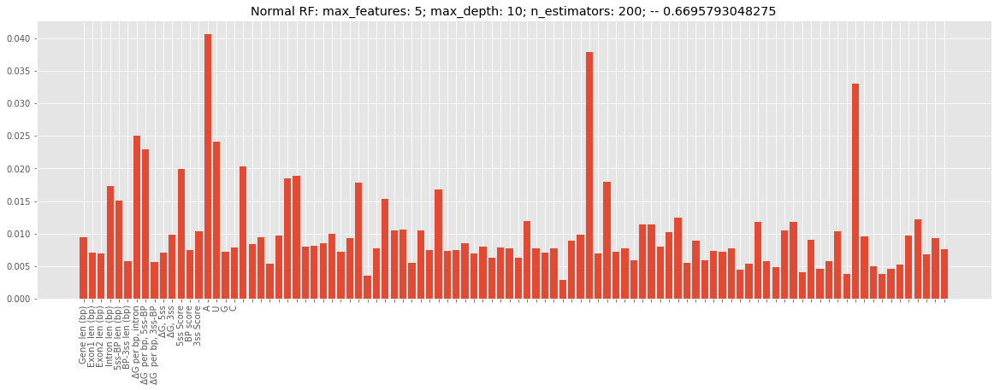

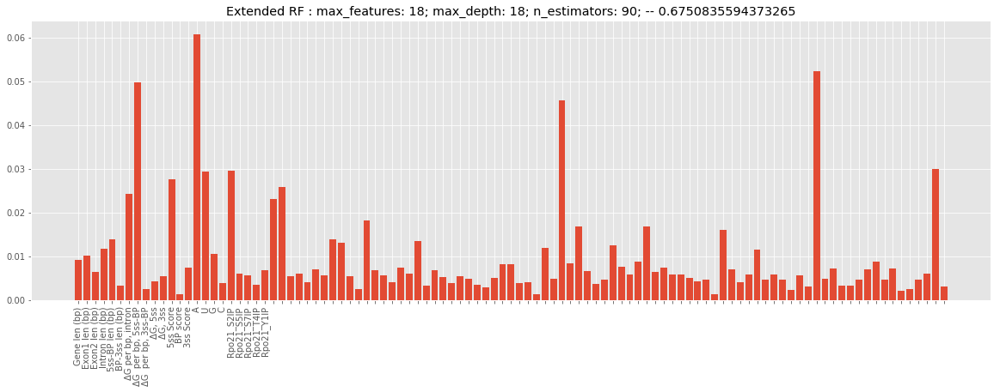

In [119]:
best_RFs(results_1_rp,results_2_rp,'rp')

Data
Coefficient of determination R^2: 0.3068923822397889
Mean squared error:               0.02053111470086379
Mean absolute error:              0.09984394095554235
Root mean squared error:          0.1432868266829292
Correlation Coefficient:          0.6686151985008861


Extended Data
Coefficient of determination R^2: 0.38414849862013833
Mean squared error:               0.01824264730257733
Mean absolute error:              0.09664412477954147
Root mean squared error:          0.1350653445654263
Correlation Coefficient:          0.6750835594373267


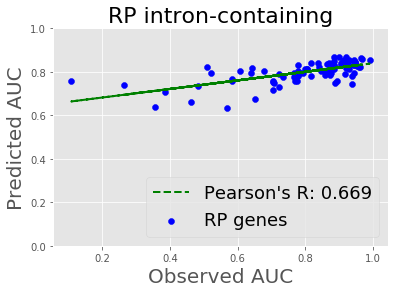

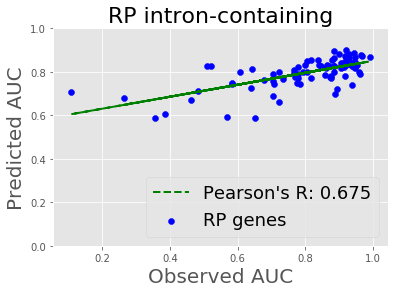

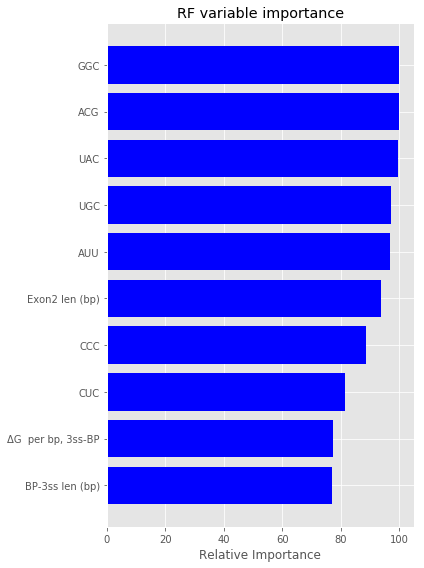

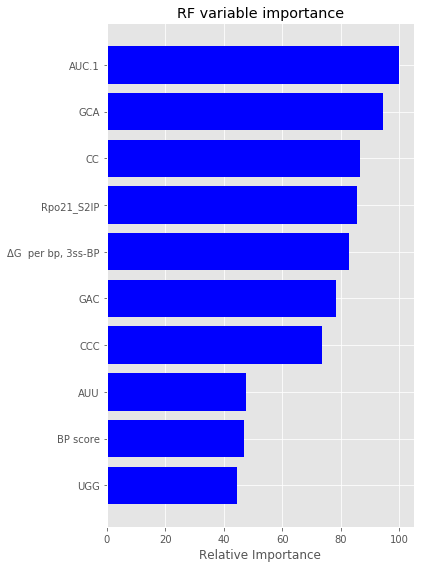

In [145]:
#BEST RIBOSOMAL PROTEIN

# Normal best: 0.6686151985008865 | max_features: 5; max_depth: 12; n_estimators: 140;
# Extended best: 0.6750835594373263 | max_features: 18; max_depth: 18; n_estimators: 90;
                
X,y,X2,y2 = get_data('rp')

rfr1 = ExtraTreesRegressor(n_estimators=140, 
                            criterion='mse', 
                            max_features=5, 
                            max_depth=12, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=90, 
                            criterion='mse', 
                            max_features=18, 
                            max_depth=18, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1_rp = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2_rp = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter(y,predictions_rfr1_rp,filename='full_rp_scat',title='RP intron-containing')
fit_scatter(y,predictions_rfr2_rp,filename='full_rp_scat_ext',title='RP intron-containing')

print('Data')
print_stats(y,predictions_rfr1_rp)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2_rp)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'rp_full')
plot_importance(rfr2.feature_importances_,names2,'rp_full_extended')

Normal best: 0.683828520812472 | max_features: 80; max_depth: 12; n_estimators: 10;
Extended best: 0.6995253307038448 | max_features: 25; max_depth: 5; n_estimators: 10;
Best difference: 0.178522036722764 | max_features: 7; max_depth: 5; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.3526340326994295
Mean squared error:               0.03376319974358975
Mean absolute error:              0.13876153846153846
Root mean squared error:          0.18374765234851234
Correlation Coefficient:          0.5972822538667238


Extended feature space
Coefficient of determination R^2: 0.32708078033033505
Mean squared error:               0.03509592282051282
Mean absolute error:              0.14166068376068375
Root mean squared error:          0.18733905844887985
Correlation Coefficient:          0.5756356719726347

# Non-RP Genes

In [125]:
X,y,X2,y2 = get_data('nrp')

mxf = [2,4,5,7,10,12,15,18,20,30]
md = [5,7,10,12,15,18,20]
n_est = [10,20,30,40,50,60,80,90,200,300,500]

results_1_nrp = np.zeros((len(mxf),len(md),len(n_est)))
results_2_nrp = np.zeros((len(mxf),len(md),len(n_est)))

f = FloatProgress(min=0, max=(len(mxf)*len(md)*len(n_est)))
display(f)


i = 0
for max_features in mxf:
    j = 0
    for max_depth in md:
        k = 0
        for n_estimators in n_est:            
            
            kf = KFold(n_splits=5,shuffle=True,random_state=0)

            rfr1 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            rfr2 = ExtraTreesRegressor(n_estimators=n_estimators, 
                                        criterion='mse', 
                                        max_features=max_features, 
                                        max_depth=max_depth, 
                                        n_jobs=2,
                                        random_state=1337)

            predictions_rfr1 = cross_val_predict(rfr1,X=X,y=y,cv=kf)
            predictions_rfr2 = cross_val_predict(rfr2,X=X2,y=y2,cv=kf)
            
            print('max_features: {}; max_depth: {}; n_estimators: {};\n'.format(max_features,max_depth,n_estimators))

            print('Normal feature space')
            print_stats(y, predictions_rfr1)
            print('\n')
            print('Extended feature space')
            print_stats(y2, predictions_rfr2)
            print('-------------------------------------------------------\n')
            

            results_1_nrp[i][j][k]=np.corrcoef(y, predictions_rfr1)[0][1]
            results_2_nrp[i][j][k]=np.corrcoef(y2, predictions_rfr2)[0][1]
            
            f.value += 1
            
            k += 1
        j += 1
    i += 1

FloatProgress(value=0.0, max=770.0)

max_features: 2; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.10807282324725986
Mean squared error:               0.0648238352717465
Mean absolute error:              0.2078112601119419
Root mean squared error:          0.25460525381803595
Correlation Coefficient:          0.007543815690100991


Extended feature space
Coefficient of determination R^2: -0.042139930692752126
Mean squared error:               0.06096666733451839
Mean absolute error:              0.20710250903137267
Root mean squared error:          0.24691429147483218
Correlation Coefficient:          0.010592640034252603
-------------------------------------------------------

max_features: 2; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.044590635328434325
Mean squared error:               0.05589280593585455
Mean absolute error:              0.1938343623800442
Root mean squared error:          0.23641659403657467
Correlation Coeff

max_features: 2; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.13315430069337642
Mean squared error:               0.05071170561985302
Mean absolute error:              0.17559480339105338
Root mean squared error:          0.22519259672523212
Correlation Coefficient:          0.38280813385552753


Extended feature space
Coefficient of determination R^2: 0.023167125297899327
Mean squared error:               0.057146111725894774
Mean absolute error:              0.1916065027985483
Root mean squared error:          0.23905252921877815
Correlation Coefficient:          0.17989726894865177
-------------------------------------------------------

max_features: 2; max_depth: 7; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.029481485996935675
Mean squared error:               0.05677671264921569
Mean absolute error:              0.19261197884326672
Root mean squared error:          0.23827864497099963
Correlation Coeffi

max_features: 2; max_depth: 10; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.007810971514991438
Mean squared error:               0.05895837442442948
Mean absolute error:              0.1987631313131313
Root mean squared error:          0.24281345602010915
Correlation Coefficient:          0.10338356540274891


Extended feature space
Coefficient of determination R^2: -0.09629894873169165
Mean squared error:               0.0641350468761691
Mean absolute error:              0.20458855218855218
Root mean squared error:          0.2532489819844674
Correlation Coefficient:          -0.043761157561521574
-------------------------------------------------------

max_features: 2; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0067533623044635505
Mean squared error:               0.05810634019297139
Mean absolute error:              0.20008207070707074
Root mean squared error:          0.24105256728143634
Correlation Co

max_features: 2; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.01993532772600526
Mean squared error:               0.059667666497395834
Mean absolute error:              0.20327178030303028
Root mean squared error:          0.24426965938772632
Correlation Coefficient:          0.09579223883106755


Extended feature space
Coefficient of determination R^2: -0.08567261180251529
Mean squared error:               0.06351339106060606
Mean absolute error:              0.20564242424242424
Root mean squared error:          0.25201863236793837
Correlation Coefficient:          -0.08073852023896146
-------------------------------------------------------

max_features: 2; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.00846282770388751
Mean squared error:               0.05800633403712121
Mean absolute error:              0.19927742424242423
Root mean squared error:          0.24084504154564032
Correlation Co

max_features: 2; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.011235635554239343
Mean squared error:               0.057844120836363644
Mean absolute error:              0.19854121212121215
Root mean squared error:          0.2405080473422119
Correlation Coefficient:          0.14445372866226602


Extended feature space
Coefficient of determination R^2: -0.059091324003522905
Mean squared error:               0.06195834793939392
Mean absolute error:              0.20160666666666666
Root mean squared error:          0.24891433855725129
Correlation Coefficient:          -0.027875061350486757
-------------------------------------------------------

max_features: 2; max_depth: 15; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04554205688162549
Mean squared error:               0.05583714642255892
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.2362988498121794
Correlation Co

max_features: 2; max_depth: 18; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04554205688162549
Mean squared error:               0.05583714642255892
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.2362988498121794
Correlation Coefficient:          0.21769891534790276


Extended feature space
Coefficient of determination R^2: -0.04033804127855234
Mean squared error:               0.06086125424242423
Mean absolute error:              0.19967575757575756
Root mean squared error:          0.24670073822837302
Correlation Coefficient:          0.027171618298802516
-------------------------------------------------------

max_features: 2; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.04195676265854198
Mean squared error:               0.0560468912310606
Mean absolute error:              0.1947992424242424
Root mean squared error:          0.23674224640114533
Correlation Coeffic

max_features: 2; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.04195676265854198
Mean squared error:               0.0560468912310606
Mean absolute error:              0.1947992424242424
Root mean squared error:          0.23674224640114533
Correlation Coefficient:          0.21054912486591348


Extended feature space
Coefficient of determination R^2: -0.051110784724757385
Mean squared error:               0.06149147504734848
Mean absolute error:              0.20132272727272724
Root mean squared error:          0.24797474679359688
Correlation Coefficient:          0.006768385087369922
-------------------------------------------------------

max_features: 2; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.07229010209894471
Mean squared error:               0.05427234775533106
Mean absolute error:              0.1915356902356902
Root mean squared error:          0.23296426282872457
Correlation Coeffi

max_features: 4; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: -0.025583891282230153
Mean squared error:               0.05999811549479806
Mean absolute error:              0.2035795313971088
Root mean squared error:          0.2449451275179771
Correlation Coefficient:          0.06514478149318832


Extended feature space
Coefficient of determination R^2: 0.013677735886843179
Mean squared error:               0.05770125449549097
Mean absolute error:              0.2002316970516135
Root mean squared error:          0.2402108542416245
Correlation Coefficient:          0.13856780913115727
-------------------------------------------------------

max_features: 4; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.014333547946295155
Mean squared error:               0.05933995441742228
Mean absolute error:              0.20369318738824813
Root mean squared error:          0.243597935987607
Correlation Coeffici

max_features: 4; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.026768858345000535
Mean squared error:               0.06006743775238612
Mean absolute error:              0.20421214705628835
Root mean squared error:          0.2450865923554084
Correlation Coefficient:          0.06207876134300679


Extended feature space
Coefficient of determination R^2: 0.0008498895575069776
Mean squared error:               0.058451701740381674
Mean absolute error:              0.2000217576283144
Root mean squared error:          0.24176786746873885
Correlation Coefficient:          0.10550395671861725
-------------------------------------------------------

max_features: 4; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.0042247977701668216
Mean squared error:               0.05825426481255089
Mean absolute error:              0.20043875463233357
Root mean squared error:          0.2413592028751978
Correlation Co

max_features: 4; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.009085187230679859
Mean squared error:               0.057969925120127504
Mean absolute error:              0.1991179418451917
Root mean squared error:          0.2407694439087475
Correlation Coefficient:          0.13584855703631338


Extended feature space
Coefficient of determination R^2: -0.008517723069881855
Mean squared error:               0.05899972039502913
Mean absolute error:              0.2029453897306397
Root mean squared error:          0.24289858047141638
Correlation Coefficient:          0.09648395477925234
-------------------------------------------------------

max_features: 4; max_depth: 10; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.007703813159395612
Mean squared error:               0.05895210550830285
Mean absolute error:              0.20100416443152794
Root mean squared error:          0.24280054676277574
Correlation C

max_features: 4; max_depth: 12; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.002443784022676976
Mean squared error:               0.058644386326738594
Mean absolute error:              0.2005325232323232
Root mean squared error:          0.2421660304971335
Correlation Coefficient:          0.10991700591796227


Extended feature space
Coefficient of determination R^2: -0.0002775446026319628
Mean squared error:               0.05851765824138348
Mean absolute error:              0.20173087070707055
Root mean squared error:          0.241904233616081
Correlation Coefficient:          0.10887784982734544
-------------------------------------------------------

max_features: 4; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.12034679386189961
Mean squared error:               0.06554188
Mean absolute error:              0.20586666666666667
Root mean squared error:          0.2560114841174122
Correlation Coefficient:

max_features: 4; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.12034679386189961
Mean squared error:               0.06554188
Mean absolute error:              0.20586666666666667
Root mean squared error:          0.2560114841174122
Correlation Coefficient:          0.0727549653931756


Extended feature space
Coefficient of determination R^2: 0.02169272287231272
Mean squared error:               0.057232366363636364
Mean absolute error:              0.19405151515151514
Root mean squared error:          0.23923287057517068
Correlation Coefficient:          0.24310799128337754
-------------------------------------------------------

max_features: 4; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.006309348938143722
Mean squared error:               0.05813231560606059
Mean absolute error:              0.193730303030303
Root mean squared error:          0.24110644040767676
Correlation Coefficient:    

max_features: 4; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.0063093489381435
Mean squared error:               0.0581323156060606
Mean absolute error:              0.19373030303030303
Root mean squared error:          0.2411064404076768
Correlation Coefficient:          0.20138196356450574


Extended feature space
Coefficient of determination R^2: 0.06736490109538418
Mean squared error:               0.05456047901515152
Mean absolute error:              0.18525303030303028
Root mean squared error:          0.23358184650171665
Correlation Coefficient:          0.2646431477219436
-------------------------------------------------------

max_features: 4; max_depth: 20; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.015281658763112604
Mean squared error:               0.05760742272727272
Mean absolute error:              0.19458080808080808
Root mean squared error:          0.24001546351698408
Correlation Coefficie

max_features: 5; max_depth: 5; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.08073239691313028
Mean squared error:               0.053778461508083776
Mean absolute error:              0.18880430456394137
Root mean squared error:          0.23190183593081745
Correlation Coefficient:          0.2842133678707584


Extended feature space
Coefficient of determination R^2: 0.0010330973209133898
Mean squared error:               0.05844098382579483
Mean absolute error:              0.19487703763268155
Root mean squared error:          0.2417457007390097
Correlation Coefficient:          0.1166966629679743
-------------------------------------------------------

max_features: 5; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.06843082882250917
Mean squared error:               0.05449812072791166
Mean absolute error:              0.19192852322705764
Root mean squared error:          0.23344832560528606
Correlation Coeffici

max_features: 5; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.03941302386130008
Mean squared error:               0.05619570356659242
Mean absolute error:              0.19840379894936716
Root mean squared error:          0.2370563299441557
Correlation Coefficient:          0.2309092569767551


Extended feature space
Coefficient of determination R^2: 0.025602560538950048
Mean squared error:               0.05700363530235231
Mean absolute error:              0.19414316438191437
Root mean squared error:          0.2387543409078719
Correlation Coefficient:          0.17409068597601152
-------------------------------------------------------

max_features: 5; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.026133602663895417
Mean squared error:               0.0569725685831732
Mean absolute error:              0.20119919837065292
Root mean squared error:          0.23868927203201487
Correlation Coefficien

max_features: 5; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.06349701299506672
Mean squared error:               0.054786755967175076
Mean absolute error:              0.19515186868686868
Root mean squared error:          0.23406570865288037
Correlation Coefficient:          0.2565269622597969


Extended feature space
Coefficient of determination R^2: 0.008264499329294517
Mean squared error:               0.058017936528956225
Mean absolute error:              0.198480303030303
Root mean squared error:          0.240869127388622
Correlation Coefficient:          0.14491635757759774
-------------------------------------------------------

max_features: 5; max_depth: 10; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.054730610357309306
Mean squared error:               0.05529960298281656
Mean absolute error:              0.19503817340067334
Root mean squared error:          0.23515867618018382
Correlation Coeffic

max_features: 5; max_depth: 12; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.035394597700737385
Mean squared error:               0.05643078720912831
Mean absolute error:              0.19829124579124577
Root mean squared error:          0.23755165166575523
Correlation Coefficient:          0.20901642159789494


Extended feature space
Coefficient of determination R^2: 0.02707022092957312
Mean squared error:               0.05691777508323981
Mean absolute error:              0.19522575757575758
Root mean squared error:          0.23857446444085295
Correlation Coefficient:          0.17718789817466943
-------------------------------------------------------

max_features: 5; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.0714261150286779
Mean squared error:               0.054322892227088575
Mean absolute error:              0.19242013888888884
Root mean squared error:          0.2330727187533723
Correlation Coeffi

max_features: 5; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.07286433784825741
Mean squared error:               0.05423875414772727
Mean absolute error:              0.1925136363636363
Root mean squared error:          0.23289215132272548
Correlation Coefficient:          0.27428832931749597


Extended feature space
Coefficient of determination R^2: 0.024720376900026708
Mean squared error:               0.05705524429924242
Mean absolute error:              0.19602575757575758
Root mean squared error:          0.2388623961598862
Correlation Coefficient:          0.16980948492537398
-------------------------------------------------------

max_features: 5; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.059258707075985795
Mean squared error:               0.055034702888140635
Mean absolute error:              0.19468821548821544
Root mean squared error:          0.2345947631302554
Correlation Coeffi

max_features: 5; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.059477135744119836
Mean squared error:               0.05502192450056115
Mean absolute error:              0.194570707070707
Root mean squared error:          0.23456752652607554
Correlation Coefficient:          0.2523613173429596


Extended feature space
Coefficient of determination R^2: 0.020268109361537445
Mean squared error:               0.057315708279087156
Mean absolute error:              0.19728518518518517
Root mean squared error:          0.2394069929619583
Correlation Coefficient:          0.16040413115955585
-------------------------------------------------------

max_features: 5; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.041309336199172986
Mean squared error:               0.05608476659924237
Mean absolute error:              0.19582984848484836
Root mean squared error:          0.23682222572901043
Correlation Coeff

max_features: 5; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.0413093361991731
Mean squared error:               0.056084766599242365
Mean absolute error:              0.1958298484848483
Root mean squared error:          0.23682222572901043
Correlation Coefficient:          0.21398914197908028


Extended feature space
Coefficient of determination R^2: 0.014190555943968453
Mean squared error:               0.05767125379318178
Mean absolute error:              0.1982186363636363
Root mean squared error:          0.240148399522424
Correlation Coefficient:          0.15004225751553066
-------------------------------------------------------

max_features: 5; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.04804813482225545
Mean squared error:               0.055690537300673346
Mean absolute error:              0.19544252525252512
Root mean squared error:          0.23598842620067906
Correlation Coeffi

max_features: 7; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.024360519764102584
Mean squared error:               0.05707629645322644
Mean absolute error:              0.19786089471035598
Root mean squared error:          0.23890645963059776
Correlation Coefficient:          0.1717479432651526


Extended feature space
Coefficient of determination R^2: 0.021197123196941003
Mean squared error:               0.0572613596491344
Mean absolute error:              0.1974315595099974
Root mean squared error:          0.23929345926943846
Correlation Coefficient:          0.1602078070273194
-------------------------------------------------------

max_features: 7; max_depth: 5; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.021074075661955627
Mean squared error:               0.05726855810484159
Mean absolute error:              0.1986381252929405
Root mean squared error:          0.23930849985916003
Correlation Coeffici

max_features: 7; max_depth: 7; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.016462577379764864
Mean squared error:               0.05946450566566921
Mean absolute error:              0.20283583180991618
Root mean squared error:          0.24385345120721422
Correlation Coefficient:          0.0984392770636328


Extended feature space
Coefficient of determination R^2: 0.025125652646088015
Mean squared error:               0.057031535092003385
Mean absolute error:              0.19849356640563484
Root mean squared error:          0.2388127615769379
Correlation Coefficient:          0.17335652358358006
-------------------------------------------------------

max_features: 7; max_depth: 10; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.00021521975223803835
Mean squared error:               0.058514012149041436
Mean absolute error:              0.20491774891774892
Root mean squared error:          0.24189669726774163
Correlation

max_features: 7; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: 0.007593722028651606
Mean squared error:               0.05805717795454546
Mean absolute error:              0.2013863636363636
Root mean squared error:          0.2409505716003709
Correlation Coefficient:          0.3009393003577718


Extended feature space
Coefficient of determination R^2: -0.37418413792869587
Mean squared error:               0.08039172545454543
Mean absolute error:              0.22836363636363635
Root mean squared error:          0.2835343461638209
Correlation Coefficient:          -0.22236705445335345
-------------------------------------------------------

max_features: 7; max_depth: 12; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.035623390264209576
Mean squared error:               0.05641740251893939
Mean absolute error:              0.19751590909090908
Root mean squared error:          0.2375234778268022
Correlation Coeffic

max_features: 7; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.02427059859062075
Mean squared error:               0.05708155696969697
Mean absolute error:              0.19838787878787878
Root mean squared error:          0.23891746895046617
Correlation Coefficient:          0.24026514777657793


Extended feature space
Coefficient of determination R^2: -0.17038898115352685
Mean squared error:               0.06846941909090908
Mean absolute error:              0.21050606060606064
Root mean squared error:          0.26166661822041626
Correlation Coefficient:          -0.08144397251428837
-------------------------------------------------------

max_features: 7; max_depth: 15; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.05140997539274761
Mean squared error:               0.055493864848484856
Mean absolute error:              0.19543636363636366
Root mean squared error:          0.23557135829401005
Correlation Coe

max_features: 7; max_depth: 18; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.05140997539274772
Mean squared error:               0.05549386484848485
Mean absolute error:              0.19543636363636366
Root mean squared error:          0.23557135829401002
Correlation Coefficient:          0.25356457567212537


Extended feature space
Coefficient of determination R^2: -0.09103348962546542
Mean squared error:               0.06382701003367001
Mean absolute error:              0.2032707070707071
Root mean squared error:          0.2526400800222918
Correlation Coefficient:          0.02509968812363764
-------------------------------------------------------

max_features: 7; max_depth: 18; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.024019589055687574
Mean squared error:               0.059906601590909096
Mean absolute error:              0.2042287878787879
Root mean squared error:          0.24475825132344178
Correlation Coeff

max_features: 7; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.024019589055687574
Mean squared error:               0.0599066015909091
Mean absolute error:              0.2042287878787879
Root mean squared error:          0.2447582513234418
Correlation Coefficient:          0.1248991605644656


Extended feature space
Coefficient of determination R^2: -0.04853945329834919
Mean squared error:               0.06134104850378786
Mean absolute error:              0.20057196969696967
Root mean squared error:          0.24767125086248476
Correlation Coefficient:          0.08335588939475491
-------------------------------------------------------

max_features: 7; max_depth: 20; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.04257752273307802
Mean squared error:               0.0609922670909091
Mean absolute error:              0.20747696969696972
Root mean squared error:          0.24696612539153848
Correlation Coeffic

max_features: 10; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.04057568118893773
Mean squared error:               0.056127686460222634
Mean absolute error:              0.19636782132863595
Root mean squared error:          0.2369128246005746
Correlation Coefficient:          0.21000817309731354


Extended feature space
Coefficient of determination R^2: -0.008548284888802327
Mean squared error:               0.059001508304879234
Mean absolute error:              0.1952051427646428
Root mean squared error:          0.24290226080643884
Correlation Coefficient:          0.12339079921768856
-------------------------------------------------------

max_features: 10; max_depth: 5; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.06174117827962433
Mean squared error:               0.05488947479392574
Mean absolute error:              0.19417893991327068
Root mean squared error:          0.23428502895815972
Correlation Coef

max_features: 10; max_depth: 7; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.030364140665915085
Mean squared error:               0.05672507609639772
Mean absolute error:              0.19569322084481172
Root mean squared error:          0.23817026702843855
Correlation Coefficient:          0.20216574121198222


Extended feature space
Coefficient of determination R^2: -0.01647440276821377
Mean squared error:               0.0594651974677031
Mean absolute error:              0.19963275472983807
Root mean squared error:          0.24385486968215972
Correlation Coefficient:          0.12630515871108644
-------------------------------------------------------

max_features: 10; max_depth: 7; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.032499501413327025
Mean squared error:               0.05660015445728529
Mean absolute error:              0.19699435519972447
Root mean squared error:          0.23790786968338246
Correlation Coef

max_features: 10; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.01922580581642841
Mean squared error:               0.057376684518097604
Mean absolute error:              0.19955119949494943
Root mean squared error:          0.23953430760143232
Correlation Coefficient:          0.17598583570360748


Extended feature space
Coefficient of determination R^2: -0.01968675020648636
Mean squared error:               0.05965312435915412
Mean absolute error:              0.20316560245310247
Root mean squared error:          0.2442398910070878
Correlation Coefficient:          0.09852992869869405
-------------------------------------------------------

max_features: 10; max_depth: 10; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.01732026541194065
Mean squared error:               0.057488161340462196
Mean absolute error:              0.19869494949494945
Root mean squared error:          0.23976688958332465
Correlation Co

max_features: 10; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.03375551037389557
Mean squared error:               0.05652667614769087
Mean absolute error:              0.19638810325476985
Root mean squared error:          0.23775339355662387
Correlation Coefficient:          0.2051303859283128


Extended feature space
Coefficient of determination R^2: -0.009529547260014537
Mean squared error:               0.059058913548447445
Mean absolute error:              0.20126397306397303
Root mean squared error:          0.2430203973917569
Correlation Coefficient:          0.11286174012357805
-------------------------------------------------------

max_features: 10; max_depth: 12; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.025638768068532936
Mean squared error:               0.057001517110403147
Mean absolute error:              0.19821604545454535
Root mean squared error:          0.23874990494323373
Correlation 

max_features: 10; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.0222599006600398
Mean squared error:               0.057199185656818134
Mean absolute error:              0.19855378787878777
Root mean squared error:          0.2391635123860204
Correlation Coefficient:          0.18128129683208058


Extended feature space
Coefficient of determination R^2: 0.011732507319169638
Mean squared error:               0.057815053131818166
Mean absolute error:              0.1994687878787878
Root mean squared error:          0.2404476099523931
Correlation Coefficient:          0.1405036504548726
-------------------------------------------------------

max_features: 10; max_depth: 15; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.03256428934169753
Mean squared error:               0.05659636427138038
Mean absolute error:              0.19751535353535338
Root mean squared error:          0.23789990389107007
Correlation Coef

max_features: 10; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.03256428934169742
Mean squared error:               0.05659636427138039
Mean absolute error:              0.1975153535353534
Root mean squared error:          0.2378999038910701
Correlation Coefficient:          0.20028632995013895


Extended feature space
Coefficient of determination R^2: 0.01014604141379516
Mean squared error:               0.05790786364242419
Mean absolute error:              0.20033333333333325
Root mean squared error:          0.24064052784687825
Correlation Coefficient:          0.14202124266584734
-------------------------------------------------------

max_features: 10; max_depth: 18; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.027199331681423744
Mean squared error:               0.05691022192072721
Mean absolute error:              0.19726109090909075
Root mean squared error:          0.23855863413577638
Correlation Coe

max_features: 10; max_depth: 20; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.027199331681423744
Mean squared error:               0.05691022192072721
Mean absolute error:              0.19726109090909075
Root mean squared error:          0.23855863413577638
Correlation Coefficient:          0.19037857972319314


Extended feature space
Coefficient of determination R^2: 0.009709629965810485
Mean squared error:               0.05793339433248476
Mean absolute error:              0.19979436363636352
Root mean squared error:          0.24069356936255018
Correlation Coefficient:          0.13858428417916271
-------------------------------------------------------

max_features: 12; max_depth: 5; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.10098935858689062
Mean squared error:               0.06440944252005769
Mean absolute error:              0.2066775095299828
Root mean squared error:          0.2537901544978798
Correlation Coe

max_features: 12; max_depth: 7; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.16654452474060788
Mean squared error:               0.06824451292590618
Mean absolute error:              0.21939515129651493
Root mean squared error:          0.261236507643756
Correlation Coefficient:          -0.011721974587145119


Extended feature space
Coefficient of determination R^2: -0.1329274691808633
Mean squared error:               0.06627786738943338
Mean absolute error:              0.2131387193362193
Root mean squared error:          0.25744488223585527
Correlation Coefficient:          0.01671952718365928
-------------------------------------------------------

max_features: 12; max_depth: 7; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.11886726471178255
Mean squared error:               0.0654553254415858
Mean absolute error:              0.20874248786566968
Root mean squared error:          0.25584238398198567
Correlation Coeffi

max_features: 12; max_depth: 10; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.12840234112338478
Mean squared error:               0.06601314096565745
Mean absolute error:              0.2065098556998557
Root mean squared error:          0.2569302258700939
Correlation Coefficient:          0.02551420867343078


Extended feature space
Coefficient of determination R^2: -0.07796658512651433
Mean squared error:               0.06306257754603863
Mean absolute error:              0.21316435786435786
Root mean squared error:          0.251122634475745
Correlation Coefficient:          0.028539225656286756
-------------------------------------------------------

max_features: 12; max_depth: 10; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.037675165720977066
Mean squared error:               0.06070547223706148
Mean absolute error:              0.2061409139009139
Root mean squared error:          0.2463848052073453
Correlation Coeff

max_features: 12; max_depth: 12; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.04017789797138338
Mean squared error:               0.06085188563131312
Mean absolute error:              0.2055520202020202
Root mean squared error:          0.2466817496924187
Correlation Coefficient:          0.13155782423226217


Extended feature space
Coefficient of determination R^2: -0.09413071515182336
Mean squared error:               0.06400820212962964
Mean absolute error:              0.2066681818181818
Root mean squared error:          0.25299842317617244
Correlation Coefficient:          -0.009736655309699142
-------------------------------------------------------

max_features: 12; max_depth: 12; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.031018431309985495
Mean squared error:               0.06031604381155303
Mean absolute error:              0.20503598484848487
Root mean squared error:          0.24559324870922863
Correlation C

max_features: 12; max_depth: 15; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.03644711083048735
Mean squared error:               0.060633629280303025
Mean absolute error:              0.20599545454545454
Root mean squared error:          0.24623896783470936
Correlation Coefficient:          0.10517692451419935


Extended feature space
Coefficient of determination R^2: -0.0746835389521745
Mean squared error:               0.0628705146780303
Mean absolute error:              0.20685833333333337
Root mean squared error:          0.2507399343503749
Correlation Coefficient:          0.0326784927642532
-------------------------------------------------------

max_features: 12; max_depth: 15; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.034793794542253176
Mean squared error:               0.060536907927272725
Mean absolute error:              0.20572969696969698
Root mean squared error:          0.24604249211726156
Correlation Co

max_features: 12; max_depth: 18; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: -0.0347937945422534
Mean squared error:               0.06053690792727273
Mean absolute error:              0.20572969696969698
Root mean squared error:          0.2460424921172616
Correlation Coefficient:          0.0809470146821405


Extended feature space
Coefficient of determination R^2: -0.012323398098777139
Mean squared error:               0.05922235779393938
Mean absolute error:              0.19916363636363638
Root mean squared error:          0.24335644185831487
Correlation Coefficient:          0.13738444970276958
-------------------------------------------------------

max_features: 12; max_depth: 18; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: -0.016430154345125514
Mean squared error:               0.05946260887205387
Mean absolute error:              0.20394343434343432
Root mean squared error:          0.24384956196814023
Correlation Co

max_features: 12; max_depth: 20; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: -0.016430154345125514
Mean squared error:               0.05946260887205387
Mean absolute error:              0.20394343434343432
Root mean squared error:          0.24384956196814023
Correlation Coefficient:          0.11283485703852643


Extended feature space
Coefficient of determination R^2: 0.013129403943857754
Mean squared error:               0.057733332693602674
Mean absolute error:              0.19790404040404042
Root mean squared error:          0.24027761588130234
Correlation Coefficient:          0.16504895782194176
-------------------------------------------------------

max_features: 12; max_depth: 20; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: -0.009196823585577274
Mean squared error:               0.059039448740530284
Mean absolute error:              0.20306969696969693
Root mean squared error:          0.242980346407956
Correlation

max_features: 15; max_depth: 5; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.03193494368037453
Mean squared error:               0.05663318188717484
Mean absolute error:              0.1955703859725055
Root mean squared error:          0.23797727178698144
Correlation Coefficient:          0.21570933533419895


Extended feature space
Coefficient of determination R^2: 0.026021299499699446
Mean squared error:               0.056979138477916226
Mean absolute error:              0.19803125224785734
Root mean squared error:          0.2387030340777348
Correlation Coefficient:          0.19102346954529542
-------------------------------------------------------

max_features: 15; max_depth: 5; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.02702232214461131
Mean squared error:               0.05692057723024759
Mean absolute error:              0.1955190460961574
Root mean squared error:          0.23858033705703324
Correlation Coeffic

max_features: 15; max_depth: 7; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.016521450576681085
Mean squared error:               0.05753489314383028
Mean absolute error:              0.19819472620813527
Root mean squared error:          0.239864322365437
Correlation Coefficient:          0.207948170375906


Extended feature space
Coefficient of determination R^2: -0.008791537955515905
Mean squared error:               0.0590157389550632
Mean absolute error:              0.20253704116216742
Root mean squared error:          0.24293155199574878
Correlation Coefficient:          0.13807994919670474
-------------------------------------------------------

max_features: 15; max_depth: 7; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.01235658158999442
Mean squared error:               0.059224299075345516
Mean absolute error:              0.2025097451656088
Root mean squared error:          0.2433604303812465
Correlation Coeffic

max_features: 15; max_depth: 10; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.016453800596935464
Mean squared error:               0.0594639922113976
Mean absolute error:              0.2016268244949494
Root mean squared error:          0.24385239841223133
Correlation Coefficient:          0.13269261839931948


Extended feature space
Coefficient of determination R^2: 0.0001810332189770003
Mean squared error:               0.05849083078695667
Mean absolute error:              0.19983460882635876
Root mean squared error:          0.24184877669104854
Correlation Coefficient:          0.13486043384982144
-------------------------------------------------------

max_features: 15; max_depth: 10; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.014527758717583605
Mean squared error:               0.057651526951595734
Mean absolute error:              0.19777764730639721
Root mean squared error:          0.24010732381915328
Correlatio

max_features: 15; max_depth: 12; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01635692012268941
Mean squared error:               0.05754451840926678
Mean absolute error:              0.197342813131313
Root mean squared error:          0.23988438550532376
Correlation Coefficient:          0.17981920334682164


Extended feature space
Coefficient of determination R^2: -0.02374502774729992
Mean squared error:               0.05989053936408292
Mean absolute error:              0.20353945286195274
Root mean squared error:          0.24472543669198535
Correlation Coefficient:          0.0874041577366761
-------------------------------------------------------

max_features: 15; max_depth: 12; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.0201153166188609
Mean squared error:               0.057324646871726725
Mean absolute error:              0.19780095555555538
Root mean squared error:          0.2394256604287158
Correlation Coeff

max_features: 15; max_depth: 15; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.020079930871592322
Mean squared error:               0.05732671698824234
Mean absolute error:              0.19789303030303015
Root mean squared error:          0.23942998347793107
Correlation Coefficient:          0.18095294525768177


Extended feature space
Coefficient of determination R^2: -0.007960905648402905
Mean squared error:               0.05896714578436356
Mean absolute error:              0.20188527272727266
Root mean squared error:          0.24283151727970478
Correlation Coefficient:          0.1170242514020353
-------------------------------------------------------

max_features: 15; max_depth: 18; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.13886228801108436
Mean squared error:               0.0666250627272727
Mean absolute error:              0.219360606060606
Root mean squared error:          0.25811831149159625
Correlation Coe

max_features: 15; max_depth: 20; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.13886228801108458
Mean squared error:               0.06662506272727271
Mean absolute error:              0.219360606060606
Root mean squared error:          0.25811831149159625
Correlation Coefficient:          0.10244379142886395


Extended feature space
Coefficient of determination R^2: 0.007034907583418626
Mean squared error:               0.05808986939393939
Mean absolute error:              0.20425757575757575
Root mean squared error:          0.24101840052979231
Correlation Coefficient:          0.23584924532496113
-------------------------------------------------------

max_features: 15; max_depth: 20; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.04303760436985915
Mean squared error:               0.055983660454545454
Mean absolute error:              0.1910969696969697
Root mean squared error:          0.23660866521441148
Correlation Coef

max_features: 18; max_depth: 5; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: 0.03239214294664006
Mean squared error:               0.056606435080195215
Mean absolute error:              0.20148774672297398
Root mean squared error:          0.23792106901280352
Correlation Coefficient:          0.21501908977676043


Extended feature space
Coefficient of determination R^2: 0.056780678601966006
Mean squared error:               0.05517967107635755
Mean absolute error:              0.19099728799794977
Root mean squared error:          0.23490353568296402
Correlation Coefficient:          0.2513773322247223
-------------------------------------------------------

max_features: 18; max_depth: 5; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: 0.017451473639445436
Mean squared error:               0.057480485472642305
Mean absolute error:              0.20110905778284563
Root mean squared error:          0.23975088211024856
Correlation Coe

max_features: 18; max_depth: 7; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.04071665295610538
Mean squared error:               0.06088340356375289
Mean absolute error:              0.20758080965330963
Root mean squared error:          0.24674562521704999
Correlation Coefficient:          0.1302297996252175


Extended feature space
Coefficient of determination R^2: 0.04124840224734794
Mean squared error:               0.05608833132204099
Mean absolute error:              0.19122241422158087
Root mean squared error:          0.23682975176704676
Correlation Coefficient:          0.23387598298840062
-------------------------------------------------------

max_features: 18; max_depth: 7; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0048576554418851
Mean squared error:               0.05821724173915603
Mean absolute error:              0.19937397845210342
Root mean squared error:          0.2412824936441847
Correlation Coeffici

max_features: 18; max_depth: 10; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.04948245893615344
Mean squared error:               0.055606627301136365
Mean absolute error:              0.19512045454545454
Root mean squared error:          0.23581057504093483
Correlation Coefficient:          0.25792308037384865


Extended feature space
Coefficient of determination R^2: -0.003445528813959431
Mean squared error:               0.05870298982099642
Mean absolute error:              0.19850460858585856
Root mean squared error:          0.24228699886910238
Correlation Coefficient:          0.15688021676086564
-------------------------------------------------------

max_features: 18; max_depth: 10; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.0652585338658207
Mean squared error:               0.05468370449225589
Mean absolute error:              0.19365595959595958
Root mean squared error:          0.23384547139565454
Correlation Co

max_features: 18; max_depth: 12; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.05305938882321404
Mean squared error:               0.05539737181818183
Mean absolute error:              0.19391454545454545
Root mean squared error:          0.23536646281529114
Correlation Coefficient:          0.25913701317659577


Extended feature space
Coefficient of determination R^2: 0.014512246482579205
Mean squared error:               0.05765243443939394
Mean absolute error:              0.19851121212121212
Root mean squared error:          0.24010921356623102
Correlation Coefficient:          0.1773332354255318
-------------------------------------------------------

max_features: 18; max_depth: 12; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.046490110048576505
Mean squared error:               0.05578168396464646
Mean absolute error:              0.19573282828282826
Root mean squared error:          0.23618146405813997
Correlation Coe

max_features: 18; max_depth: 15; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.04224485261788791
Mean squared error:               0.05603003755892255
Mean absolute error:              0.19614343434343434
Root mean squared error:          0.2367066487425365
Correlation Coefficient:          0.23768662260874374


Extended feature space
Coefficient of determination R^2: 0.0032250712395603953
Mean squared error:               0.058312750235690235
Mean absolute error:              0.20087272727272726
Root mean squared error:          0.2414803309499352
Correlation Coefficient:          0.15207004095338797
-------------------------------------------------------

max_features: 18; max_depth: 15; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.009473368064012222
Mean squared error:               0.05794721598958332
Mean absolute error:              0.19903446969696967
Root mean squared error:          0.24072227979475294
Correlation Co

max_features: 18; max_depth: 18; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.009473368064012222
Mean squared error:               0.05794721598958332
Mean absolute error:              0.19903446969696967
Root mean squared error:          0.24072227979475294
Correlation Coefficient:          0.18634629340060221


Extended feature space
Coefficient of determination R^2: -0.003721497309393751
Mean squared error:               0.05871913437026512
Mean absolute error:              0.2028208333333333
Root mean squared error:          0.24232031357330552
Correlation Coefficient:          0.14339285064948337
-------------------------------------------------------

max_features: 18; max_depth: 18; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.008979998693066427
Mean squared error:               0.05797607879910209
Mean absolute error:              0.1990717171717171
Root mean squared error:          0.24078222276385375
Correlation Co

max_features: 18; max_depth: 20; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.008979998693066427
Mean squared error:               0.05797607879910209
Mean absolute error:              0.1990717171717171
Root mean squared error:          0.24078222276385375
Correlation Coefficient:          0.17607448294432762


Extended feature space
Coefficient of determination R^2: -0.003218411687896827
Mean squared error:               0.058689703146277576
Mean absolute error:              0.20199831649831645
Root mean squared error:          0.24225957802794418
Correlation Coefficient:          0.14725897252031
-------------------------------------------------------

max_features: 18; max_depth: 20; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.01572853763507298
Mean squared error:               0.05758127967803026
Mean absolute error:              0.19772560606060596
Root mean squared error:          0.23996099615985567
Correlation Coe

max_features: 20; max_depth: 5; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: -0.0016913414506349866
Mean squared error:               0.058600367366686355
Mean absolute error:              0.20032023308434235
Root mean squared error:          0.2420751275259116
Correlation Coefficient:          0.14492681772182772


Extended feature space
Coefficient of determination R^2: -0.0058004332498460265
Mean squared error:               0.05884075507796325
Mean absolute error:              0.20041464733391431
Root mean squared error:          0.24257113405754455
Correlation Coefficient:          0.12766675431807592
-------------------------------------------------------

max_features: 20; max_depth: 5; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.022692089832633378
Mean squared error:               0.057173901975869856
Mean absolute error:              0.19809193534305367
Root mean squared error:          0.23911064797676798
Correlat

max_features: 20; max_depth: 7; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: -0.0008092043378413738
Mean squared error:               0.05854876109164096
Mean absolute error:              0.20189064741893906
Root mean squared error:          0.24196851260368768
Correlation Coefficient:          0.15488582723554412


Extended feature space
Coefficient of determination R^2: -0.004220708663301265
Mean squared error:               0.05874833894409147
Mean absolute error:              0.20245177800986888
Root mean squared error:          0.24238056634988595
Correlation Coefficient:          0.1250465070035957
-------------------------------------------------------

max_features: 20; max_depth: 7; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.010563181164056523
Mean squared error:               0.059119382601131684
Mean absolute error:              0.20324711741613422
Root mean squared error:          0.2431447770385613
Correlatio

max_features: 20; max_depth: 10; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: -0.016898369899953858
Mean squared error:               0.059490000147573927
Mean absolute error:              0.20378606702741697
Root mean squared error:          0.24390571979265663
Correlation Coefficient:          0.12971094778614978


Extended feature space
Coefficient of determination R^2: -0.002124784949089298
Mean squared error:               0.058625724427480486
Mean absolute error:              0.2010734747474746
Root mean squared error:          0.2421274962235402
Correlation Coefficient:          0.13397768077823666
-------------------------------------------------------

max_features: 20; max_depth: 12; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.23634504576250692
Mean squared error:               0.07232794262626262
Mean absolute error:              0.21288484848484845
Root mean squared error:          0.26893854804817885
Correlatio

max_features: 20; max_depth: 15; n_estimators: 10;

Normal feature space
Coefficient of determination R^2: -0.23601332283795595
Mean squared error:               0.07230853636363635
Mean absolute error:              0.21288484848484845
Root mean squared error:          0.26890246626544045
Correlation Coefficient:          0.06368328551090688


Extended feature space
Coefficient of determination R^2: -0.03657058037628125
Mean squared error:               0.06064085242424241
Mean absolute error:              0.20950606060606058
Root mean squared error:          0.24625363433712488
Correlation Coefficient:          0.16852461904161187
-------------------------------------------------------

max_features: 20; max_depth: 15; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.15717924256602567
Mean squared error:               0.06769663060606061
Mean absolute error:              0.2144
Root mean squared error:          0.2601857617281557
Correlation Coefficient:   

max_features: 20; max_depth: 18; n_estimators: 20;

Normal feature space
Coefficient of determination R^2: -0.15717924256602567
Mean squared error:               0.06769663060606061
Mean absolute error:              0.21439999999999998
Root mean squared error:          0.2601857617281557
Correlation Coefficient:          0.06943376220190096


Extended feature space
Coefficient of determination R^2: -0.045072735865334
Mean squared error:               0.061138240606060615
Mean absolute error:              0.20446060606060606
Root mean squared error:          0.2472614822532224
Correlation Coefficient:          0.12992448257679062
-------------------------------------------------------

max_features: 20; max_depth: 18; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.09153775663215025
Mean squared error:               0.06385651037037038
Mean absolute error:              0.208830303030303
Root mean squared error:          0.2526984573961036
Correlation Coeffic

max_features: 20; max_depth: 20; n_estimators: 30;

Normal feature space
Coefficient of determination R^2: -0.09153775663215025
Mean squared error:               0.06385651037037038
Mean absolute error:              0.208830303030303
Root mean squared error:          0.2526984573961036
Correlation Coefficient:          0.08115999829870434


Extended feature space
Coefficient of determination R^2: -0.03225991013463991
Mean squared error:               0.060388672087542075
Mean absolute error:              0.20201717171717168
Root mean squared error:          0.2457410671571646
Correlation Coefficient:          0.130586467793046
-------------------------------------------------------

max_features: 20; max_depth: 20; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: -0.020607392442395955
Mean squared error:               0.05970698323863636
Mean absolute error:              0.20097651515151513
Root mean squared error:          0.24435012428610786
Correlation Coeff

max_features: 30; max_depth: 5; n_estimators: 40;

Normal feature space
Coefficient of determination R^2: 0.0968339180690505
Mean squared error:               0.05283649963234973
Mean absolute error:              0.18380414948582557
Root mean squared error:          0.22986191427104607
Correlation Coefficient:          0.31379953208601535


Extended feature space
Coefficient of determination R^2: -0.06251141977634944
Mean squared error:               0.06215842840372802
Mean absolute error:              0.204902136995506
Root mean squared error:          0.24931592087896837
Correlation Coefficient:          0.03381253870003298
-------------------------------------------------------

max_features: 30; max_depth: 5; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.08249477476102429
Mean squared error:               0.05367535989878371
Mean absolute error:              0.18832515084237408
Root mean squared error:          0.23167943348252498
Correlation Coeffici

max_features: 30; max_depth: 7; n_estimators: 50;

Normal feature space
Coefficient of determination R^2: 0.04832777848034464
Mean squared error:               0.05567417774916513
Mean absolute error:              0.18972628239100967
Root mean squared error:          0.23595376188814013
Correlation Coefficient:          0.25526721537984715


Extended feature space
Coefficient of determination R^2: -0.03293058880238009
Mean squared error:               0.06042790774296628
Mean absolute error:              0.2072133299145893
Root mean squared error:          0.24582088548975306
Correlation Coefficient:          0.09322932080824148
-------------------------------------------------------

max_features: 30; max_depth: 7; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.03066482871160725
Mean squared error:               0.0567074854183004
Mean absolute error:              0.19254089549900158
Root mean squared error:          0.23813333537810366
Correlation Coeffic

max_features: 30; max_depth: 10; n_estimators: 60;

Normal feature space
Coefficient of determination R^2: 0.05256697142819444
Mean squared error:               0.055426178935755695
Mean absolute error:              0.1915203872053872
Root mean squared error:          0.23542765117070616
Correlation Coefficient:          0.25705685165960024


Extended feature space
Coefficient of determination R^2: -0.001598917923847143
Mean squared error:               0.05859496045899037
Mean absolute error:              0.20105091750841747
Root mean squared error:          0.24206395943838968
Correlation Coefficient:          0.15501274673405763
-------------------------------------------------------

max_features: 30; max_depth: 10; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.032037899125316294
Mean squared error:               0.056627158847295855
Mean absolute error:              0.195500202020202
Root mean squared error:          0.23796461679690084
Correlation Co

max_features: 30; max_depth: 12; n_estimators: 80;

Normal feature space
Coefficient of determination R^2: 0.03144854615922632
Mean squared error:               0.056661636833570055
Mean absolute error:              0.19569374999999994
Root mean squared error:          0.23803704928764777
Correlation Coefficient:          0.22576913984251448


Extended feature space
Coefficient of determination R^2: -0.015228290457338645
Mean squared error:               0.05939229812618372
Mean absolute error:              0.20350624999999994
Root mean squared error:          0.24370535104134197
Correlation Coefficient:          0.14152751712214168
-------------------------------------------------------

max_features: 30; max_depth: 12; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.026986463528066773
Mean squared error:               0.05692267501028803
Mean absolute error:              0.19534764309764308
Root mean squared error:          0.23858473339735725
Correlation 

max_features: 30; max_depth: 15; n_estimators: 90;

Normal feature space
Coefficient of determination R^2: 0.026313791818299737
Mean squared error:               0.0569620272615039
Mean absolute error:              0.1955632996632996
Root mean squared error:          0.23866718932753178
Correlation Coefficient:          0.21827222279242092


Extended feature space
Coefficient of determination R^2: 0.0004650661044222071
Mean squared error:               0.0584742144594089
Mean absolute error:              0.2022124579124579
Root mean squared error:          0.24181442152900828
Correlation Coefficient:          0.16223543541164442
-------------------------------------------------------

max_features: 30; max_depth: 15; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.00046766275745990793
Mean squared error:               0.058474062551515084
Mean absolute error:              0.20003303030303016
Root mean squared error:          0.24181410742865084
Correlation 

max_features: 30; max_depth: 18; n_estimators: 200;

Normal feature space
Coefficient of determination R^2: 0.00046766275745990793
Mean squared error:               0.058474062551515084
Mean absolute error:              0.20003303030303016
Root mean squared error:          0.24181410742865084
Correlation Coefficient:          0.16915283365682066


Extended feature space
Coefficient of determination R^2: -0.004463680288477434
Mean squared error:               0.058762553129545425
Mean absolute error:              0.200415909090909
Root mean squared error:          0.24240988661674967
Correlation Coefficient:          0.13942293951924326
-------------------------------------------------------

max_features: 30; max_depth: 18; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01754831018680847
Mean squared error:               0.05747482039696961
Mean absolute error:              0.19844030303030286
Root mean squared error:          0.23973906731479877
Correlati

max_features: 30; max_depth: 20; n_estimators: 300;

Normal feature space
Coefficient of determination R^2: 0.01754831018680847
Mean squared error:               0.05747482039696961
Mean absolute error:              0.19844030303030286
Root mean squared error:          0.23973906731479877
Correlation Coefficient:          0.19467209326770418


Extended feature space
Coefficient of determination R^2: 0.0034093996679989136
Mean squared error:               0.058301966760606
Mean absolute error:              0.19912373737373723
Root mean squared error:          0.24145800206372536
Correlation Coefficient:          0.15183343822477818
-------------------------------------------------------

max_features: 30; max_depth: 20; n_estimators: 500;

Normal feature space
Coefficient of determination R^2: 0.013723987057837173
Mean squared error:               0.057698548736242354
Mean absolute error:              0.19864193939393926
Root mean squared error:          0.24020522212525347
Correlation 

In [126]:
get_best_settings(results_1_nrp,results_2_nrp)

IndexError: index 11 is out of bounds for axis 0 with size 11

Normal best: 0.38280813385552753 | max_features: 2; max_depth: 7; n_estimators: 20;
Extended best: 0.39016968220304177 | max_features: 4; max_depth: 5; n_estimators: 10;
Best difference: 0.40031742573046575 | max_features: 4; max_depth: 5; n_estimators: 10;
Normal feature space
Coefficient of determination R^2: 0.13315430069337653
Mean squared error:               0.05071170561985301
Mean absolute error:              0.17559480339105335
Root mean squared error:          0.2251925967252321
Correlation Coefficient:          0.38280813385552753


Extended feature space
Coefficient of determination R^2: 0.1353267336473516
Mean squared error:               0.05058461520395896
Mean absolute error:              0.18640657675657674
Root mean squared error:          0.22491023810391328
Correlation Coefficient:          0.39016968220304177
-------------------------------------------------------



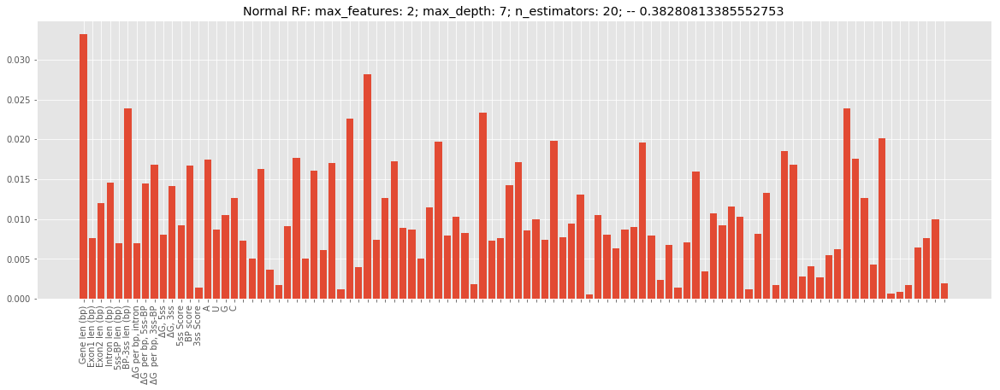

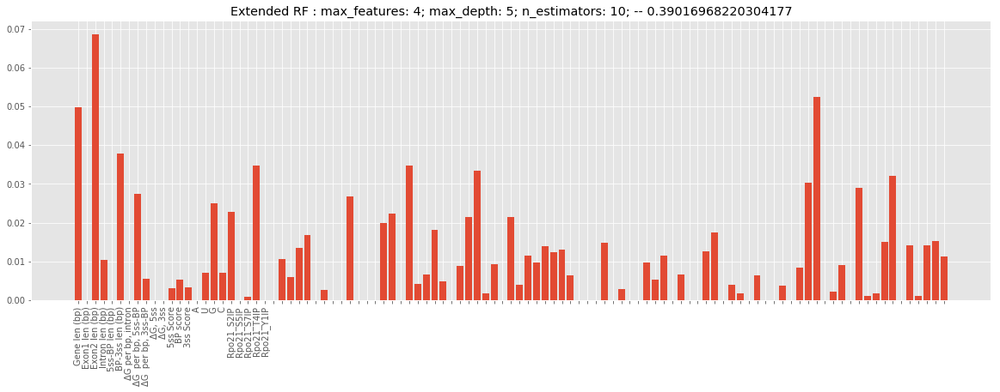

In [129]:
best_RFs(results_1_nrp,results_2_nrp,'nrp')

Data
Coefficient of determination R^2: 0.13315430069337653
Mean squared error:               0.05071170561985301
Mean absolute error:              0.17559480339105338
Root mean squared error:          0.2251925967252321
Correlation Coefficient:          0.3828081338555276


Extended Data
Coefficient of determination R^2: 0.1353267336473516
Mean squared error:               0.05058461520395896
Mean absolute error:              0.18640657675657674
Root mean squared error:          0.22491023810391328
Correlation Coefficient:          0.39016968220304177


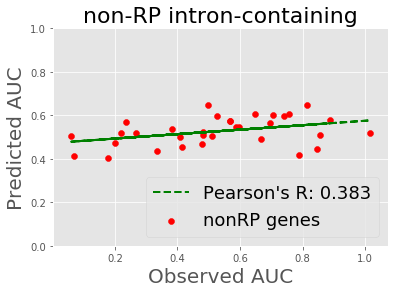

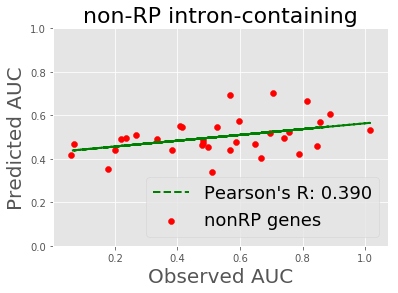

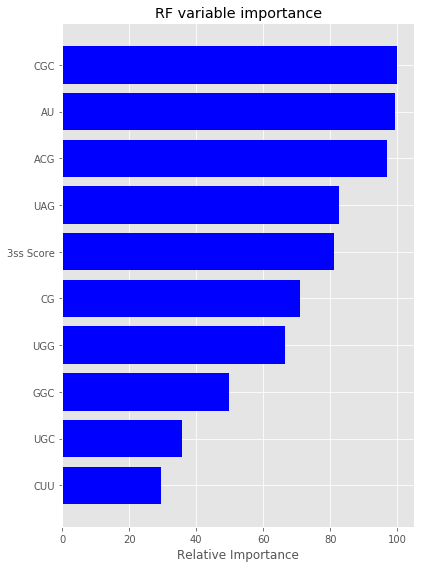

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()


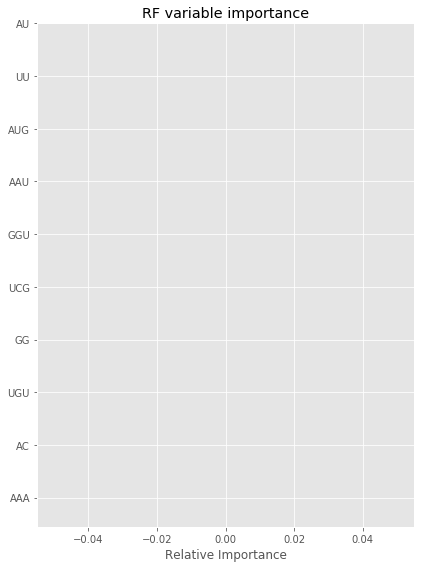

In [146]:
#BEST NON RIBOSOMAL PROTEIN

# Normal best: 0.38280813385552753 | max_features: 2; max_depth: 7; n_estimators: 20;
# Extended best: 0.39016968220304177 | max_features: 4; max_depth: 5; n_estimators: 10;

X,y,X2,y2 = get_data('nrp')

rfr1 = ExtraTreesRegressor(n_estimators=20, 
                            criterion='mse', 
                            max_features=2, 
                            max_depth=7, 
                            n_jobs=2,
                            random_state=1337)

rfr2 = ExtraTreesRegressor(n_estimators=10, 
                            criterion='mse', 
                            max_features=4, 
                            max_depth=5, 
                            n_jobs=2,
                            random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=0)
predictions_rfr1_nrp = cross_val_predict(rfr1,X,y=y,cv=kf)
predictions_rfr2_nrp = cross_val_predict(rfr2,X2,y=y2,cv=kf)

fit_scatter_nrp(y,predictions_rfr1_nrp,filename='full_nrp_scat',title='non-RP intron-containing')
fit_scatter_nrp(y,predictions_rfr2_nrp,filename='full_nrp_scat_ext',title='non-RP intron-containing')

print('Data')
print_stats(y,predictions_rfr1_nrp)
print('\n')
print('Extended Data')
print_stats(y2,predictions_rfr2_nrp)

rfr1.fit(X,y)
rfr2.fit(X2,y2)

names,names2 = get_variable_names('full')
plot_importance(rfr1.feature_importances_,names,'nrp_full')
plot_importance(rfr2.feature_importances_,names2,'nrp_full_ext')


Normal best: 0.2969901764177368 | max_features: 25; max_depth: 5; n_estimators: 10;
Extended best: 0.40630448232918154 | max_features: 30; max_depth: 7; n_estimators: 20;
Best difference: 0.2582434619528223 | max_features: 30; max_depth: 7; n_estimators: 20;
Normal feature space
Coefficient of determination R^2: 0.2360352774266372
Mean squared error:               0.03984437679487179
Mean absolute error:              0.1488410256410256
Root mean squared error:          0.19961056283391365
Correlation Coefficient:          0.48848065665874996


Extended feature space
Coefficient of determination R^2: 0.38909635792549957
Mean squared error:               0.031861516874999996
Mean absolute error:              0.13109380341880345
Root mean squared error:          0.1784979464167585
Correlation Coefficient:          0.6250700537546936

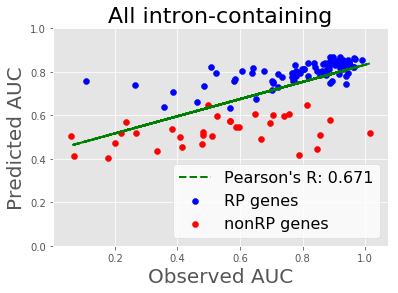

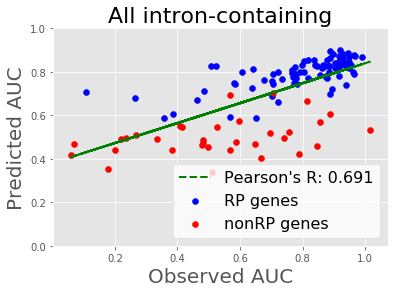

In [155]:
X,y1,_,_ = get_data('rp')
X,y2,_,_ = get_data('nrp')

fit_scatter_multi(y1,y2,predictions_rfr1_rp,predictions_rfr1_nrp,'full_rp_nrp','All intron-containing')
fit_scatter_multi(y1,y2,predictions_rfr2_rp,predictions_rfr2_nrp,'full_rp_nrp_ext','All intron-containing')

In [57]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

X2,Y2,X,Y = get_data('rp_cut')
names = extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns
rf = ElasticNet(random_state=1337)
scores = defaultdict(list)
X = X.values
Y = Y.values
#crossvalidate the scores on a number of different random splits of the data
for train_idx, test_idx in ShuffleSplit(len(X), 100, .3):
    X_train, X_test = X[train_idx], X[test_idx]
    Y_train, Y_test = Y[train_idx], Y[test_idx]
    r = rf.fit(X_train, Y_train)
    acc = r2_score(Y_test, rf.predict(X_test))
    for i in range(X.shape[1]):
        X_t = X_test.copy()
        np.random.shuffle(X_t[:, i])
        shuff_acc = r2_score(Y_test, rf.predict(X_t))
        scores[names[i]].append((acc-shuff_acc)/acc)
print("Features sorted by their score:")
print (sorted([(round(np.mean(score), 4), feat) for
              feat, score in scores.items()], reverse=True))

Features sorted by their score:
[(0.3437, 'Gene len (bp)'), (0.0106, '3ss Score'), (0.0, 'ΔG, 5ss'), (0.0, 'ΔG, 3ss'), (0.0, 'ΔG per bp, intron'), (0.0, 'ΔG  per bp, 5ss-BP'), (0.0, 'ΔG  per bp, 3ss-BP'), (0.0, 'U'), (0.0, 'Rpo21_Y1IP'), (0.0, 'Rpo21_T4IP'), (0.0, 'Rpo21_S7IP'), (0.0, 'Rpo21_S5IP'), (0.0, 'Rpo21_S2IP'), (0.0, 'G'), (0.0, 'C'), (0.0, 'BP-3ss len (bp)'), (0.0, 'BP score'), (0.0, 'A'), (-0.1339, 'Exon2 len (bp)'), (-0.4961, 'Intron len (bp)'), (-0.7964, '5ss Score'), (-0.8546, 'Exon1 len (bp)'), (-3.0931, '5ss-BP len (bp)')]


MSE: 0.0391
R2: -2.0055


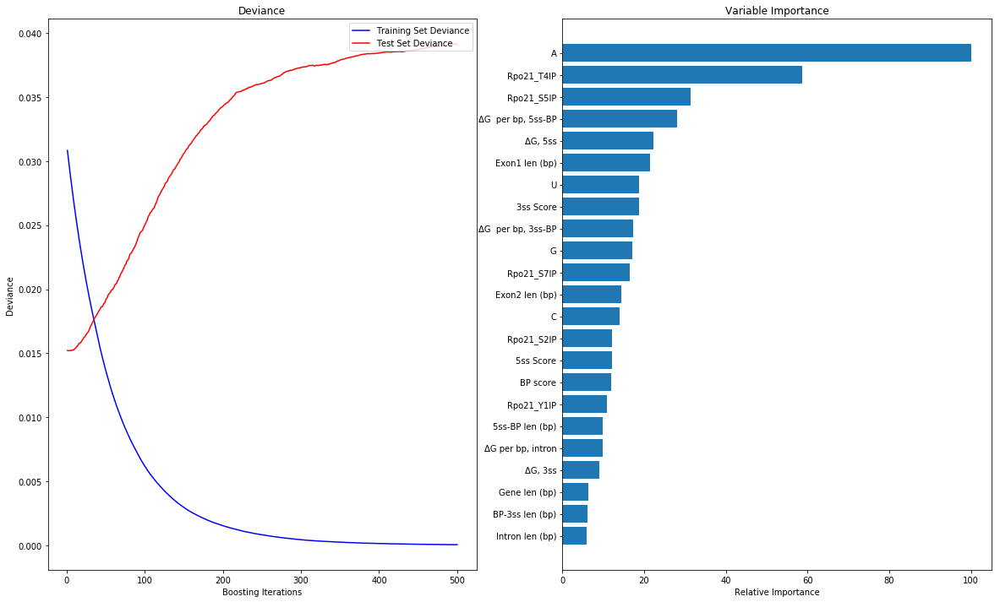

In [41]:
from sklearn import ensemble
from sklearn import datasets
from sklearn.utils import shuffle
from sklearn.metrics import mean_squared_error

# #############################################################################
# Load data
names = extended_features_cut.drop(['ORG','Gene','AUC'], axis=1).columns
X2,y2,X,y = get_data('rp_cut')
X = X.astype(np.float32)
offset = int(X.shape[0] * 0.9)
X_train, y_train = X[:offset], y[:offset]
X_test, y_test = X[offset:], y[offset:]

# #############################################################################
# Fit regression model
params = {'n_estimators': 500, 'max_depth': 4, 'min_samples_split': 2,
          'learning_rate': 0.01, 'loss': 'ls'}
clf = ensemble.GradientBoostingRegressor(**params)

clf.fit(X_train, y_train)
mse = mean_squared_error(y_test, clf.predict(X_test))
print("MSE: %.4f" % mse)
print("R2: %.4f" % r2_score(y_test,clf.predict(X_test)))

# #############################################################################
# Plot training deviance

# # compute test set deviance
# test_score = np.zeros((params['n_estimators'],), dtype=np.float64)

# for i, y_pred in enumerate(clf.staged_predict(X_test)):
#     test_score[i] = clf.loss_(y_test, y_pred)


# plt.subplot(1, 2, 1)
# plt.title('Deviance')
# plt.plot(np.arange(params['n_estimators']) + 1, clf.train_score_, 'b-',
#          label='Training Set Deviance')
# plt.plot(np.arange(params['n_estimators']) + 1, test_score, 'r-',
#          label='Test Set Deviance')
# plt.legend(loc='upper right')
# plt.xlabel('Boosting Iterations')
# plt.ylabel('Deviance')

# #############################################################################
# Plot feature importance
plt.figure(figsize=(20, 12))
feature_importance = clf.feature_importances_
# make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.subplot(1, 2, 2)
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, names[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()


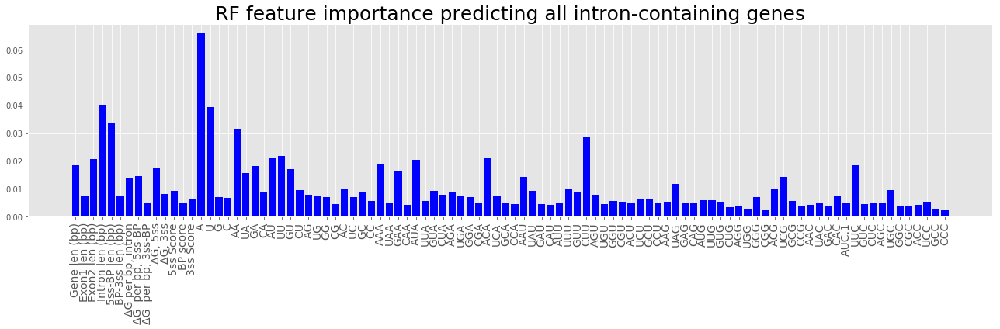

In [19]:
X,y,X2,y2 = get_data('full')

rf = RandomForestRegressor(n_estimators=1000, 
                            criterion='mse', 
                            max_features=10, 
                            max_depth=10, 
                            n_jobs=2,
                            random_state=1337)

rf.fit(X, y)
plt.style.use('ggplot')
fig, ax1 = plt.subplots(figsize=(18,6))

xx = np.arange(len(rf.feature_importances_))
ax1.bar(xx, rf.feature_importances_,color='b')
ax1.set_xticks(xx)
ax1.set_xticklabels(get_variable_names('full')[1], rotation='vertical',fontsize=14)
ax1.set_title('RF feature importance predicting all intron-containing genes',fontsize=25)
plt.tight_layout()
fig.savefig('RF_fi_full.pdf')

In [133]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

X,Y,X2,Y2 = get_data('rp_cut')
X = X.values
Y = Y.values
rf = ExtraTreesRegressor(n_estimators=1000)
scores = defaultdict(list)
 
#crossvalidate the scores on a number of different random splits of the data
for train_idx, test_idx in ShuffleSplit(len(X), 100, .3):
    X_train, X_test = X[train_idx], X[test_idx]
    Y_train, Y_test = Y[train_idx], Y[test_idx]
    r = rf.fit(X_train, Y_train)
    acc = r2_score(Y_test, rf.predict(X_test))
    for i in range(X.shape[1]):
        X_t = X_test.copy()
        np.random.shuffle(X_t[:, i])
        shuff_acc = r2_score(Y_test, rf.predict(X_t))
        scores[names[i]].append((acc-shuff_acc)/acc)
print ("Features sorted by their score:")
print (sorted([(round(np.mean(score), 4), feat) for
              feat, score in scores.items()], reverse=True))

KeyboardInterrupt: 

In [17]:
#A helper method for pretty-printing linear models
def pretty_print_linear(coefs, names = None, sort = False):
    if names is None:
        names = ["X%s" % x for x in range(len(coefs))]
    lst = zip(coefs, names)
    if sort:
        lst = sorted(lst,  key = lambda x:-np.abs(x[0]))
    return " + ".join("%s * %s" % (round(coef, 3), name)
                                   for coef, name in lst)

In [16]:
names,names2 = get_variable_names('cut')
X,y,X2,y2 = get_data('nrp_cut')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = Lasso(random_state=1337,alpha=a,max_iter=10000)
    lasso2 = Lasso(random_state=1337,alpha=a,max_iter=10000)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)

    
    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)
    
    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)
    
    
    
print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
print('\n')
print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: -1.4443770391918593
Mean squared error:               0.1429995314443828
Mean absolute error:              0.3094489931749341
Root mean squared error:          0.3781527884921421
Correlation Coefficient:          0.06556389601889648


Coefficient of determination R^2: -3.686258779887422
Mean squared error:               0.27415280008217563
Mean absolute error:              0.4059551202505489
Root mean squared error:          0.5235960275653126
Correlation Coefficient:          0.1505067698586387


1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5369302132042084
Mean squared error:               0.1484140236872947
Mean absolute error:              0.3162929456494868
Root mean squared error:          0.38524540709435423
Correlation Coefficient:          0.04688496201153006


Coefficient of determination R^2: -3.7732028888980924
Mean squared error:               0.279239154049273
Mean absolute error:              0.4089161173552776
Root mean squared error:          0.5284308413115884
Correlation Coefficient:          0.1404218784099141


6e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5318912928869381
Mean squared error:               0.14811923968597163
Mean absolute error:              0.316138547891492
Root mean squared error:          0.38486262443366936
Correlation Coefficient:          0.0462579720312417


Coefficient of determination R^2: -3.7424447993047973
Mean squared error:               0.2774397620858222
Mean absolute error:              0.407743615782566
Root mean squared error:          0.5267255092415994
Correlation Coefficient:          0.14112815261682884


1.1000000000000001e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5265370315933038
Mean squared error:               0.14780600778927797
Mean absolute error:              0.31590426570214963
Root mean squared error:          0.384455469188927
Correlation Coefficient:          0.04524809752191346


Coefficient of determination R^2: -3.7106542649090155
Mean squared error:               0.2755799706338184
Mean absolute error:              0.40650325652153696
Root mean squared error:          0.5249571131376528
Correlation Coefficient:          0.1419918328432439


1.6000000000000003e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5213457508135853
Mean squared error:               0.14750231048432316
Mean absolute error:              0.31566998170090355
Root mean squared error:          0.3840602953760297
Correlation Coefficient:          0.04423119457430022


Coefficient of determination R^2: -3.679253260419838
Mean squared error:               0.2737429672350629
Mean absolute error:              0.4052628972605108
Root mean squared error:          0.5232045175981023
Correlation Coefficient:          0.14285689305960741


2.1000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5163174398465085
Mean squared error:               0.14720814714506744
Mean absolute error:              0.3154356951781623
Root mean squared error:          0.38367713920048385
Correlation Coefficient:          0.04320735273115397


Coefficient of determination R^2: -3.6482431066419627
Mean squared error:               0.271928829158508
Mean absolute error:              0.40402260110328614
Root mean squared error:          0.5214679560227148
Correlation Coefficient:          0.14372330611969905


2.6000000000000002e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5114349419541115
Mean squared error:               0.146922514077952
Mean absolute error:              0.3152003569706289
Root mean squared error:          0.38330472744012956
Correlation Coefficient:          0.042174769096147154


Coefficient of determination R^2: -3.6176213692079635
Mean squared error:               0.2701374139901989
Mean absolute error:              0.40278225397759
Root mean squared error:          0.5197474521247785
Correlation Coefficient:          0.1445907866019278


3.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.5067068369465302
Mean squared error:               0.14664591321406584
Mean absolute error:              0.31496436310449155
Root mean squared error:          0.3829437468011011
Correlation Coefficient:          0.041134255299155785


Coefficient of determination R^2: -3.587389146597326
Mean squared error:               0.268368785992747
Mean absolute error:              0.4015419068519045
Root mean squared error:          0.5180432279190097
Correlation Coefficient:          0.14545928281838477


3.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.502161183657607
Mean squared error:               0.14637998603507404
Mean absolute error:              0.31472967070527785
Root mean squared error:          0.38259637483263487
Correlation Coefficient:          0.04008953618957001


Coefficient of determination R^2: -3.5575464388099887
Mean squared error:               0.2666229451661486
Mean absolute error:              0.400301559726223
Root mean squared error:          0.5163554445981455
Correlation Coefficient:          0.14632866673469433


4.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4977784235690152
Mean squared error:               0.14612358833985228
Mean absolute error:              0.3144949986244043
Root mean squared error:          0.3822611520150227
Correlation Coefficient:          0.039037904524485606


Coefficient of determination R^2: -3.5288188156537714
Mean squared error:               0.2649423383755497
Mean absolute error:              0.39909967453959166
Root mean squared error:          0.5147254980817928
Correlation Coefficient:          0.14718218576561626


4.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.493473286092883
Mean squared error:               0.145871731677799
Mean absolute error:              0.314254057324328
Root mean squared error:          0.3819315798383252
Correlation Coefficient:          0.0380230125051249


Coefficient of determination R^2: -3.501196829059867
Mean squared error:               0.26332641289549474
Mean absolute error:              0.39793545689259074
Root mean squared error:          0.5131534009392267
Correlation Coefficient:          0.14801946850771303


5.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4881563654475234
Mean squared error:               0.14556068426210866
Mean absolute error:              0.3139596112459236
Root mean squared error:          0.38152415947369395
Correlation Coefficient:          0.03754058767389921


Coefficient of determination R^2: -3.474696983968987
Mean squared error:               0.26177613428847696
Mean absolute error:              0.3967899935170707
Root mean squared error:          0.5116406300211868
Correlation Coefficient:          0.14886617409709174


5.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4819058227074104
Mean squared error:               0.14519501862674306
Mean absolute error:              0.31365527868407245
Root mean squared error:          0.3810446412518395
Correlation Coefficient:          0.03748692659789646


Coefficient of determination R^2: -3.4505575309521817
Mean squared error:               0.2603639419730606
Mean absolute error:              0.3959648164341156
Root mean squared error:          0.5102587010263133
Correlation Coefficient:          0.14973950707185507


6.1000000000000005e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4757446418339328
Mean squared error:               0.14483458078760236
Mean absolute error:              0.31335085413809166
Root mean squared error:          0.3805713872423968
Correlation Coefficient:          0.037432107858341744


Coefficient of determination R^2: -3.4256974072799773
Mean squared error:               0.25890958939987907
Mean absolute error:              0.3951665863858164
Root mean squared error:          0.5088315923759835
Correlation Coefficient:          0.1505978668365543


6.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4696741016004284
Mean squared error:               0.14447944555474468
Mean absolute error:              0.313046488312429
Root mean squared error:          0.38010451925061967
Correlation Coefficient:          0.037376188241101484


Coefficient of determination R^2: -3.3997868706353245
Mean squared error:               0.25739378617466024
Mean absolute error:              0.3943011105926174
Root mean squared error:          0.507339911868424
Correlation Coefficient:          0.15158767413340557


7.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4636935721612323
Mean squared error:               0.14412957608130325
Mean absolute error:              0.3127420976213413
Root mean squared error:          0.37964401230798206
Correlation Coefficient:          0.03731914036245349


Coefficient of determination R^2: -3.3734503772907063
Mean squared error:               0.2558530638770013
Mean absolute error:              0.39339305964767207
Root mean squared error:          0.5058192007792915
Correlation Coefficient:          0.1526037781806481


7.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4578036487071078
Mean squared error:               0.14378500718678378
Mean absolute error:              0.31243772550441884
Root mean squared error:          0.3791899355030191
Correlation Coefficient:          0.03726081387921314


Coefficient of determination R^2: -3.347378038235002
Mean squared error:               0.2543277949807358
Mean absolute error:              0.39247971043053376
Root mean squared error:          0.5043092255558447
Correlation Coefficient:          0.1536228877659848


8.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4520033594406674
Mean squared error:               0.14344568201965774
Mean absolute error:              0.3121333141370571
Root mean squared error:          0.3787422369100887
Correlation Coefficient:          0.037201127219061554


Coefficient of determination R^2: -3.3216698382403065
Mean squared error:               0.25282382873715853
Mean absolute error:              0.3915661179258252
Root mean squared error:          0.5028158994474603
Correlation Coefficient:          0.15464424664767001


8.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4462894406393887
Mean squared error:               0.1431114096475182
Mean absolute error:              0.3118285569426504
Root mean squared error:          0.37830068681872386
Correlation Coefficient:          0.03714230756214856


Coefficient of determination R^2: -3.2939820280073215
Mean squared error:               0.2512040524806499
Mean absolute error:              0.39057105695943223
Root mean squared error:          0.5012026062189321
Correlation Coefficient:          0.1559131235107609


9.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4406698128144764
Mean squared error:               0.14278265343152952
Mean absolute error:              0.31152415070610473
Root mean squared error:          0.3778659199127774
Correlation Coefficient:          0.037080554205560896


Coefficient of determination R^2: -3.2626239448457053
Mean squared error:               0.2493695600405689
Mean absolute error:              0.3893817756029654
Root mean squared error:          0.49936916208409277
Correlation Coefficient:          0.15774371975945156


9.6e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4351412655753197
Mean squared error:               0.1424592255592775
Mean absolute error:              0.3112198082258742
Root mean squared error:          0.37743771083355926
Correlation Coefficient:          0.037017543227316665


Coefficient of determination R^2: -3.2311528383343138
Mean squared error:               0.2475284555738647
Mean absolute error:              0.38823229787575464
Root mean squared error:          0.49752231665912705
Correlation Coefficient:          0.15949999837916568


0.000101


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.429703605715218
Mean squared error:               0.14214111472789548
Mean absolute error:              0.3109155247783972
Root mean squared error:          0.3770160669360067
Correlation Coefficient:          0.03695296702588022


Coefficient of determination R^2: -3.2000167140067406
Mean squared error:               0.24570694804108692
Mean absolute error:              0.3870828280670517
Root mean squared error:          0.495688357782475
Correlation Coefficient:          0.16126336500113878


0.000106


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4243527217932521
Mean squared error:               0.14182808041224532
Mean absolute error:              0.31061096025682455
Root mean squared error:          0.3766006909343706
Correlation Coefficient:          0.03688765221904402


Coefficient of determination R^2: -3.1691849572457063
Mean squared error:               0.2439032464436064
Mean absolute error:              0.38576356105325155
Root mean squared error:          0.4938656157737714
Correlation Coefficient:          0.16276415957290313


0.000111


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.419095438017166
Mean squared error:               0.14152052183818056
Mean absolute error:              0.31030663127799496
Root mean squared error:          0.3761921342056218
Correlation Coefficient:          0.03682126114747839


Coefficient of determination R^2: -3.1387150390110286
Mean squared error:               0.2421207129142667
Mean absolute error:              0.38439399130325125
Root mean squared error:          0.49205763170005473
Correlation Coefficient:          0.16418384510825737


0.000116
Coefficient of determination R^2: -1.413927154907714
Mean squared error:               0.14121816992962724
Mean absolute error:              0.31000220262470723
Root mean squared error:          0.375790060977705
Correlation Coefficient:          0.03675333739257676


Coefficient of determination R^2: -3.108446390748883
Mean squared error:               0.2403499539644229
Mean absolute error:              0.38302151464372614
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4088495076244976
Mean squared error:               0.14092112034574641
Mean absolute error:              0.30969781030239585
Root mean squared error:          0.3753946194949342
Correlation Coefficient:          0.03668406899627147


Coefficient of determination R^2: -3.07949184247669
Mean squared error:               0.2386560717319682
Mean absolute error:              0.38172032062349803
Root mean squared error:          0.48852438192168895
Correlation Coefficient:          0.1668730434469253


0.000126


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.4038621069994601
Mean squared error:               0.14062935031965354
Mean absolute error:              0.3093934338273797
Root mean squared error:          0.3750058003813455
Correlation Coefficient:          0.03661380107240505


Coefficient of determination R^2: -3.0555326613289537
Mean squared error:               0.23725442557714665
Mean absolute error:              0.38074667996197453
Root mean squared error:          0.48708769803511426
Correlation Coefficient:          0.16735076204742888


0.000131
Coefficient of determination R^2: -1.3989640307837954
Mean squared error:               0.14034280589848255
Mean absolute error:              0.3090889673063128
Root mean squared error:          0.3746235522474295
Correlation Coefficient:          0.03654214004878064


Coefficient of determination R^2: -3.0319623971190914
Mean squared error:               0.2358755316160313
Mean absolute error:              0.3797896566905131
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3941574407389652
Mean squared error:               0.1400616135483518
Mean absolute error:              0.30878460915948974
Root mean squared error:          0.3742480641878483
Correlation Coefficient:          0.03646915405738346


Coefficient of determination R^2: -3.008702443802223
Mean squared error:               0.23451479128325922
Mean absolute error:              0.3788425503239917
Root mean squared error:          0.4842672725709009
Correlation Coefficient:          0.16864171348683482


0.000141


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.38943989936226
Mean squared error:               0.13978563067188798
Mean absolute error:              0.30848017094059277
Root mean squared error:          0.3738791658703223
Correlation Coefficient:          0.03639455183606545


Coefficient of determination R^2: -2.985568873511647
Mean squared error:               0.23316144453717713
Mean absolute error:              0.37796036446294906
Root mean squared error:          0.4828679369529283
Correlation Coefficient:          0.16943491417510323


0.000146


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3848150475451284
Mean squared error:               0.13951507026641627
Mean absolute error:              0.308175893430998
Root mean squared error:          0.3735171619436198
Correlation Coefficient:          0.03631893510406888


Coefficient of determination R^2: -2.9625500448078412
Mean squared error:               0.23181481033702486
Mean absolute error:              0.3771842836471543
Root mean squared error:          0.4814715052181436
Correlation Coefficient:          0.1703848678581874


0.000151


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3802783904767768
Mean squared error:               0.1392496693791159
Mean absolute error:              0.3078714296742625
Root mean squared error:          0.3731617201417046
Correlation Coefficient:          0.036242629781898336


Coefficient of determination R^2: -2.938912426099369
Mean squared error:               0.23043197604199728
Mean absolute error:              0.37635747080585674
Root mean squared error:          0.4800333072214857
Correlation Coefficient:          0.1713895733432844


0.000156


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3758321762083532
Mean squared error:               0.13898955952417466
Mean absolute error:              0.30756697975979413
Root mean squared error:          0.3728130356146022
Correlation Coefficient:          0.03616441505515501


Coefficient of determination R^2: -2.9135130052458864
Mean squared error:               0.22894607381710666
Mean absolute error:              0.3754100071777885
Root mean squared error:          0.4784830966890123
Correlation Coefficient:          0.17252106675025478


0.000161
Coefficient of determination R^2: -1.3714718713287488
Mean squared error:               0.13873447549059847
Mean absolute error:              0.307262025755017
Root mean squared error:          0.37247077132386974
Correlation Coefficient:          0.03608357500310033


Coefficient of determination R^2: -2.887439825604863
Mean squared error:               0.22742075574540513
Mean absolute error:              0.374259159426846
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3672065764100174
Mean squared error:               0.13848494967478883
Mean absolute error:              0.3069575781778013
Root mean squared error:          0.37213566031057654
Correlation Coefficient:          0.036003240482502315


Coefficient of determination R^2: -2.857893254445578
Mean squared error:               0.22569223933250235
Mean absolute error:              0.37280555710089214
Root mean squared error:          0.47507077297230393
Correlation Coefficient:          0.1753216258602459


0.000171
Coefficient of determination R^2: -1.3629573076527803
Mean squared error:               0.1382363614122076
Mean absolute error:              0.30665151950301106
Root mean squared error:          0.37180150808221263
Correlation Coefficient:          0.03590899451700809


Coefficient of determination R^2: -2.8285231051185136
Mean squared error:               0.22397404384756592
Mean absolute error:              0.37134771686945234
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3587699087093865
Mean squared error:               0.1379913926216834
Mean absolute error:              0.3063526493796696
Root mean squared error:          0.371471927097706
Correlation Coefficient:          0.03573771867207117


Coefficient of determination R^2: -2.7994920090041497
Mean squared error:               0.2222756834575324
Mean absolute error:              0.3698942803607264
Root mean squared error:          0.4714612215840582
Correlation Coefficient:          0.17870829729333138


0.000181
Coefficient of determination R^2: -1.3544395889417382
Mean squared error:               0.13773806275978007
Mean absolute error:              0.3060426651671339
Root mean squared error:          0.37113078929102616
Correlation Coefficient:          0.0355826409240228


Coefficient of determination R^2: -2.770718492874174
Mean squared error:               0.22059239186273233
Mean absolute error:              0.3684755187189154
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3501243109723897
Mean squared error:               0.13748561286445904
Mean absolute error:              0.3057292135551344
Root mean squared error:          0.3707905242376874
Correlation Coefficient:          0.0354316453968391


Coefficient of determination R^2: -2.7421079631912675
Mean squared error:               0.21891863520676902
Mean absolute error:              0.36712032420849844
Root mean squared error:          0.4678874172349252
Correlation Coefficient:          0.18214393965131276


0.000191
Coefficient of determination R^2: -1.3458942651659358
Mean squared error:               0.1372381491718238
Mean absolute error:              0.30541580802505747
Root mean squared error:          0.37045667651133485
Correlation Coefficient:          0.035279164109172395


Coefficient of determination R^2: -2.7138570380792197
Mean squared error:               0.21726591592937441
Mean absolute error:              0.3657726630844098
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3417499204393541
Mean squared error:               0.13699569911418416
Mean absolute error:              0.3051024571801412
Root mean squared error:          0.370129300534535
Correlation Coefficient:          0.035125062251883526


Coefficient of determination R^2: -2.6867302475273958
Mean squared error:               0.2156789601216962
Mean absolute error:              0.36442432354037857
Root mean squared error:          0.4644124891965075
Correlation Coefficient:          0.18542613089240595


0.000201


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.3376883815816196
Mean squared error:               0.13675809331757954
Mean absolute error:              0.3047890370635389
Root mean squared error:          0.3698081844924197
Correlation Coefficient:          0.034969371888437406


Coefficient of determination R^2: -2.6599641610853113
Mean squared error:               0.21411310601717423
Mean absolute error:              0.36307586638185857
Root mean squared error:          0.46272357408843373
Correlation Coefficient:          0.18697114643787846


0.00020600000000000002
Coefficient of determination R^2: -1.3336250495656388
Mean squared error:               0.13652038261866858
Mean absolute error:              0.3044680178090181
Root mean squared error:          0.3694866474159365
Correlation Coefficient:          0.034843741003838684


Coefficient of determination R^2: -2.6334431538792815
Mean squared error:               0.21256158939633849
Mean absolute error:              0.3617273968690094
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.329785395158091
Mean squared error:               0.13629575737780586
Mean absolute error:              0.30416556944298717
Root mean squared error:          0.36918255291631247
Correlation Coefficient:          0.03477959294565988


Coefficient of determination R^2: -2.607171491647068
Mean squared error:               0.21102465981091184
Mean absolute error:              0.36037898301171845
Root mean squared error:          0.45937420455540584
Correlation Coefficient:          0.19007973792329952


0.00021600000000000002
Coefficient of determination R^2: -1.326090250721912
Mean squared error:               0.1360795861756874
Mean absolute error:              0.30387496392039876
Root mean squared error:          0.36888966666970685
Correlation Coefficient:          0.03481069303381838


Coefficient of determination R^2: -2.581014184809963
Mean squared error:               0.20949442017865377
Mean absolute error:              0.35902772440194686
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3224819812354598
Mean squared error:               0.1358684972816196
Mean absolute error:              0.3035845315653786
Root mean squared error:          0.36860344176583537
Correlation Coefficient:          0.03483976040036026


Coefficient of determination R^2: -2.5550180387530084
Mean squared error:               0.20797360868112258
Mean absolute error:              0.357707097711741
Root mean squared error:          0.456041235724493
Correlation Coefficient:          0.19332914561412762


0.00022600000000000002
Coefficient of determination R^2: -1.3189593846196979
Mean squared error:               0.1356624203722701
Mean absolute error:              0.30329393226472195
Root mean squared error:          0.36832379827031286
Correlation Coefficient:          0.03486911454947028


Coefficient of determination R^2: -2.528580059995086
Mean squared error:               0.20642694934252506
Mean absolute error:              0.35636250132094277
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3155241821080486
Mean squared error:               0.13546145614224084
Mean absolute error:              0.30300347664900956
Root mean squared error:          0.36805088797915003
Correlation Coefficient:          0.034896861847874626


Coefficient of determination R^2: -2.5023226075753
Mean squared error:               0.20489085105132446
Mean absolute error:              0.3550157359472475
Root mean squared error:          0.4526487060086712
Correlation Coefficient:          0.19688072105254073


0.00023600000000000002
Coefficient of determination R^2: -1.3120874422754039
Mean squared error:               0.13526040197674805
Mean absolute error:              0.3027054442675472
Root mean squared error:          0.36777765290559467
Correlation Coefficient:          0.03495384731245995


Coefficient of determination R^2: -2.476343347576691
Mean squared error:               0.2033710274122098
Mean absolute error:              0.35366945392182714
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3088226910123129
Mean squared error:               0.1350694093870538
Mean absolute error:              0.3024148131785525
Root mean squared error:          0.3675179034918623
Correlation Coefficient:          0.03498024278199014


Coefficient of determination R^2: -2.4505886851670127
Mean squared error:               0.2018643430513103
Mean absolute error:              0.35232244697357845
Root mean squared error:          0.44929315936402847
Correlation Coefficient:          0.20045047334443752


0.00024600000000000007
Coefficient of determination R^2: -1.3055764282747435
Mean squared error:               0.13487949840238375
Mean absolute error:              0.3021202901363501
Root mean squared error:          0.36725944290430945
Correlation Coefficient:          0.03500026395850595


Coefficient of determination R^2: -2.425094813496583
Mean squared error:               0.20037291531936763
Mean absolute error:              0.35097564963474864
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3024809673921585
Mean squared error:               0.13469840954059323
Mean absolute error:              0.3018294219487822
Root mean squared error:          0.36701281931370355
Correlation Coefficient:          0.035025647016120064


Coefficient of determination R^2: -2.399827222932047
Mean squared error:               0.19889472535377553
Mean absolute error:              0.3496282849907868
Root mean squared error:          0.4459761488619941
Correlation Coefficient:          0.2040464613164988


0.00025600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2994737455107175
Mean squared error:               0.13452248278580034
Mean absolute error:              0.30153877370906296
Root mean squared error:          0.3667730671488848
Correlation Coefficient:          0.03504839822277829


Coefficient of determination R^2: -2.374869736611542
Mean squared error:               0.19743467692726854
Mean absolute error:              0.34828206948639
Root mean squared error:          0.44433622058894606
Correlation Coefficient:          0.20585443979211618


0.00026100000000000006
Coefficient of determination R^2: -1.2965530697144847
Mean squared error:               0.13435161910001628
Mean absolute error:              0.3012479517605125
Root mean squared error:          0.3665400647951275
Correlation Coefficient:          0.035071180742552444


Coefficient of determination R^2: -2.3501107010533633
Mean squared error:               0.19598623815245297
Mean absolute error:              0.34693468103332364
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2937195382954023
Mean squared error:               0.13418585348417017
Mean absolute error:              0.30095732286685584
Root mean squared error:          0.36631387290706063
Correlation Coefficient:          0.035091927110477615


Coefficient of determination R^2: -2.3250952462883867
Mean squared error:               0.19452279848954301
Mean absolute error:              0.34554965173354935
Root mean squared error:          0.44104738803165244
Correlation Coefficient:          0.2095414170224445


0.00027100000000000003
Coefficient of determination R^2: -1.2909695105693566
Mean squared error:               0.13402497295306617
Mean absolute error:              0.3006664418067257
Root mean squared error:          0.3660942132198571
Correlation Coefficient:          0.035113019806121304


Coefficient of determination R^2: -2.3007070271786887
Mean squared error:               0.19309605300407454
Mean absolute error:              0.3441279529706159
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2883089059991746
Mean squared error:               0.13386932380369412
Mean absolute error:              0.30038343462999334
Root mean squared error:          0.3658815707352505
Correlation Coefficient:          0.035131946127881536


Coefficient of determination R^2: -2.276765428011482
Mean squared error:               0.19169543542010653
Mean absolute error:              0.34271093747687065
Root mean squared error:          0.43783037288441573
Correlation Coefficient:          0.2129727491483945


0.00028100000000000005
Coefficient of determination R^2: -1.2857340291671515
Mean squared error:               0.13371868984886526
Mean absolute error:              0.3001355476529295
Root mean squared error:          0.36567566209533997
Correlation Coefficient:          0.03515015054889098


Coefficient of determination R^2: -2.253046339158477
Mean squared error:               0.19030783500581497
Mean absolute error:              0.34129333422646174
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2832448768730287
Mean squared error:               0.13357307090135995
Mean absolute error:              0.2998876182015987
Root mean squared error:          0.3654764984254938
Correlation Coefficient:          0.035166840474615435


Coefficient of determination R^2: -2.228854590684675
Mean squared error:               0.18889258333182699
Mean absolute error:              0.3398395930379213
Root mean squared error:          0.4346177439219745
Correlation Coefficient:          0.21646092739371228


0.000291
Coefficient of determination R^2: -1.2809194077951904
Mean squared error:               0.13343702765468093
Mean absolute error:              0.29964640074139365
Root mean squared error:          0.36529033337152644
Correlation Coefficient:          0.035141448627846204


Coefficient of determination R^2: -2.2044856689174566
Mean squared error:               0.18746696676832453
Mean absolute error:              0.3383665382881323
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2787340895124775
Mean squared error:               0.13330918342873938
Mean absolute error:              0.2994094658239617
Root mean squared error:          0.3651153015538234
Correlation Coefficient:          0.03509233381999452


Coefficient of determination R^2: -2.1799762157672733
Mean squared error:               0.186033128919155
Mean absolute error:              0.3368499344501491
Root mean squared error:          0.43131557926784303
Correlation Coefficient:          0.2201837726346826


0.00030100000000000005
Coefficient of determination R^2: -1.2766981082808626
Mean squared error:               0.13319007563256785
Mean absolute error:              0.2991785649202168
Root mean squared error:          0.36495215526499886
Correlation Coefficient:          0.03499566958649763


Coefficient of determination R^2: -2.156611972343683
Mean squared error:               0.18466628746689256
Mean absolute error:              0.33537783774415053
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2747161572490322
Mean squared error:               0.13307412867988694
Mean absolute error:              0.2989446674931134
Root mean squared error:          0.36479326841361387
Correlation Coefficient:          0.03492063047836784


Coefficient of determination R^2: -2.1365884819449175
Mean squared error:               0.1834948848154214
Mean absolute error:              0.33405408829081507
Root mean squared error:          0.42836302923504194
Correlation Coefficient:          0.2238217282493651


0.000311
Coefficient of determination R^2: -1.272820809269394
Mean squared error:               0.13296324812886445
Mean absolute error:              0.29871090841674214
Root mean squared error:          0.3646412594987907
Correlation Coefficient:          0.03484439999576211


Coefficient of determination R^2: -2.116761874877695
Mean squared error:               0.18233500011871273
Mean absolute error:              0.3327610382500041
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2710093497667887
Mean squared error:               0.1328572751729948
Mean absolute error:              0.2984770411647471
Root mean squared error:          0.364495919281677
Correlation Coefficient:          0.034766396215087


Coefficient of determination R^2: -2.0971422190828637
Mean squared error:               0.1811872223656176
Mean absolute error:              0.3314723177844603
Root mean squared error:          0.42566092417042184
Correlation Coefficient:          0.22700554303869777


0.00032100000000000005
Coefficient of determination R^2: -1.269283420442441
Mean squared error:               0.1327563058541333
Mean absolute error:              0.29824311293339795
Root mean squared error:          0.36435738753884667
Correlation Coefficient:          0.03468838286809675


Coefficient of determination R^2: -2.0777179645176416
Mean squared error:               0.18005087586221505
Mean absolute error:              0.33018398880206046
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2676435928968277
Mean squared error:               0.13266037361172042
Mean absolute error:              0.29800923450936767
Root mean squared error:          0.3642257179438602
Correlation Coefficient:          0.03460855487740458


Coefficient of determination R^2: -2.058486441704726
Mean squared error:               0.17892580444028822
Mean absolute error:              0.3288953170319227
Root mean squared error:          0.42299622272579246
Correlation Coefficient:          0.23017891061149562


0.0003310000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2662837967684792
Mean squared error:               0.1325808236052787
Mean absolute error:              0.29791755103633955
Root mean squared error:          0.3641164972989808
Correlation Coefficient:          0.0345406521749026


Coefficient of determination R^2: -2.0393865552949415
Mean squared error:               0.17780843393506407
Mean absolute error:              0.32760454620131896
Root mean squared error:          0.42167337351920153
Correlation Coefficient:          0.23176236030621045


0.00033600000000000004


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2648698088486277
Mean squared error:               0.1324981033020011
Mean absolute error:              0.29781882423690265
Root mean squared error:          0.3640028891396346
Correlation Coefficient:          0.034390649905089964


Coefficient of determination R^2: -2.02035141416766
Mean squared error:               0.17669485112090094
Mean absolute error:              0.32630123738398187
Root mean squared error:          0.42035086668270466
Correlation Coefficient:          0.2333514784845517


0.00034100000000000005


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.263484995412842
Mean squared error:               0.13241708974751248
Mean absolute error:              0.29771785856786787
Root mean squared error:          0.36389159065237064
Correlation Coefficient:          0.034211043221741906


Coefficient of determination R^2: -2.005916472937968
Mean squared error:               0.17585038653987395
Mean absolute error:              0.3254554038346117
Root mean squared error:          0.4193451878105601
Correlation Coefficient:          0.23374599070178678


0.00034600000000000006


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2621244370551405
Mean squared error:               0.13233749514957013
Mean absolute error:              0.2976130305783951
Root mean squared error:          0.3637822084016344
Correlation Coefficient:          0.03405940394190309


Coefficient of determination R^2: -1.9923266755112055
Mean squared error:               0.17505536407267977
Mean absolute error:              0.32468951079294084
Root mean squared error:          0.41839618075775953
Correlation Coefficient:          0.23393522683786167


0.0003510000000000001


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2593265593311251
Mean squared error:               0.1321738153255667
Mean absolute error:              0.29743251118678166
Root mean squared error:          0.3635571692671824
Correlation Coefficient:          0.033822654003492145


Coefficient of determination R^2: -1.9788279667197384
Mean squared error:               0.17426567042013175
Mean absolute error:              0.32392364746554986
Root mean squared error:          0.41745139887193067
Correlation Coefficient:          0.23412309226929887


0.00035600000000000003
Coefficient of determination R^2: -1.2561431132096197
Mean squared error:               0.13198757920222945
Mean absolute error:              0.29722931237322153
Root mean squared error:          0.3633009485292179
Correlation Coefficient:          0.03356751819457138


Coefficient of determination R^2: -1.965428400708296
Mean squared error:               0.1734817767611454
Mean absolute error:              0.3231577351280922
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2527295056012897
Mean squared error:               0.13178787830474126
Mean absolute error:              0.2970095366800473
Root mean squared error:          0.3630260022432846
Correlation Coefficient:          0.033440165255143345


Coefficient of determination R^2: -1.9521183924492425
Mean squared error:               0.17270312235797902
Mean absolute error:              0.32239186966537053
Root mean squared error:          0.4155756517867463
Correlation Coefficient:          0.23449536427379067


0.00036600000000000006
Coefficient of determination R^2: -1.249260122022831
Mean squared error:               0.13158491443371567
Mean absolute error:              0.29678365950381674
Root mean squared error:          0.3627463499936501
Correlation Coefficient:          0.03336389319154425


Coefficient of determination R^2: -1.9395869857977397
Mean squared error:               0.17197001725562688
Mean absolute error:              0.3216624578894233
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2458481841515896
Mean squared error:               0.13138531121822064
Mean absolute error:              0.296557568551647
Root mean squared error:          0.3624711177710862
Correlation Coefficient:          0.033287030936202354


Coefficient of determination R^2: -1.9271038104909692
Mean squared error:               0.1712397337555019
Mean absolute error:              0.3209499491060237
Root mean squared error:          0.41381122961502853
Correlation Coefficient:          0.23468487047589878


0.00037600000000000003
Coefficient of determination R^2: -1.2424993301336578
Mean squared error:               0.1311893984978172
Mean absolute error:              0.29633165714717125
Root mean squared error:          0.36220077097904857
Correlation Coefficient:          0.03320768386647211


Coefficient of determination R^2: -1.9147002153068047
Mean squared error:               0.17051410580567147
Mean absolute error:              0.32023753872293764
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2392040471652082
Mean squared error:               0.130996619759959
Mean absolute error:              0.29610551193078416
Root mean squared error:          0.36193455176310396
Correlation Coefficient:          0.03312937146454037


Coefficient of determination R^2: -1.902378256325926
Mean squared error:               0.16979325368977813
Mean absolute error:              0.31952509342859226
Root mean squared error:          0.41205976955992457
Correlation Coefficient:          0.2348990382621989


0.00038600000000000006
Coefficient of determination R^2: -1.2359703571608662
Mean squared error:               0.13080744429805471
Mean absolute error:              0.29587941719828864
Root mean squared error:          0.3616731180196487
Correlation Coefficient:          0.033049369470991054


Coefficient of determination R^2: -1.8901250958392741
Mean squared error:               0.16907642638359327
Mean absolute error:              0.3188127285203251
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2327994748975843
Mean squared error:               0.1306219431782829
Mean absolute error:              0.2956536541866248
Root mean squared error:          0.3614165784496927
Correlation Coefficient:          0.03296771519473055


Coefficient of determination R^2: -1.8779625260502049
Mean squared error:               0.1683648987619905
Mean absolute error:              0.31810026311146017
Root mean squared error:          0.4103229201031677
Correlation Coefficient:          0.23510793724698817


0.00039600000000000003
Coefficient of determination R^2: -1.2296861211310421
Mean squared error:               0.1304398075573464
Mean absolute error:              0.29542772737419554
Root mean squared error:          0.361164515916703
Correlation Coefficient:          0.03288532668570572


Coefficient of determination R^2: -1.8658692288022327
Mean squared error:               0.16765742368251202
Mean absolute error:              0.31738785720316937
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2269950609310967
Mean squared error:               0.1302823767103409
Mean absolute error:              0.29522195563684234
Root mean squared error:          0.36094650117481525
Correlation Coefficient:          0.03263723882380869


Coefficient of determination R^2: -1.853993517826766
Mean squared error:               0.16696267770927128
Mean absolute error:              0.316695573509381
Root mean squared error:          0.4086106676400792
Correlation Coefficient:          0.2352325820327061


0.00040600000000000006
Coefficient of determination R^2: -1.2243632164875313
Mean squared error:               0.13012841006925807
Mean absolute error:              0.2950161221990141
Root mean squared error:          0.3607331563209266
Correlation Coefficient:          0.03238766604433087


Coefficient of determination R^2: -1.8421512632367105
Mean squared error:               0.16626988898213496
Mean absolute error:              0.3160225147065462
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2217946070743122
Mean squared error:               0.12997814276733832
Mean absolute error:              0.29481054310121607
Root mean squared error:          0.3605248157441292
Correlation Coefficient:          0.032135893575037155


Coefficient of determination R^2: -1.8306189579463825
Mean squared error:               0.16559523272962176
Mean absolute error:              0.3153556986227948
Root mean squared error:          0.40693394148144213
Correlation Coefficient:          0.23506750452407815


0.0004160000000000001
Coefficient of determination R^2: -1.2192850344569326
Mean squared error:               0.12983132920189522
Mean absolute error:              0.2946049579887659
Root mean squared error:          0.3603211473143024
Correlation Coefficient:          0.03188321012999341


Coefficient of determination R^2: -1.818763469175845
Mean squared error:               0.164901669784115
Mean absolute error:              0.31464253038259543
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2168359565855638
Mean squared error:               0.12968805466508632
Mean absolute error:              0.294399517080703
Root mean squared error:          0.36012227737962327
Correlation Coefficient:          0.031629981863362876


Coefficient of determination R^2: -1.8093009423605904
Mean squared error:               0.16434809851455803
Mean absolute error:              0.31412917101041504
Root mean squared error:          0.40539869081505187
Correlation Coefficient:          0.23495076560578051


0.00042600000000000005
Coefficient of determination R^2: -1.2144473891804042
Mean squared error:               0.1295483200765655
Mean absolute error:              0.29420538474446756
Root mean squared error:          0.3599282151715332
Correlation Coefficient:          0.03136948250726786


Coefficient of determination R^2: -1.8005230497201041
Mean squared error:               0.16383457931742404
Mean absolute error:              0.31365625511082185
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2120465302968815
Mean squared error:               0.1294078664190883
Mean absolute error:              0.2942241806673736
Root mean squared error:          0.3597330488280001
Correlation Coefficient:          0.031152833838995773


Coefficient of determination R^2: -1.7916718623837928
Mean squared error:               0.16331677227639674
Mean absolute error:              0.31317991064427864
Root mean squared error:          0.40412469891903013
Correlation Coefficient:          0.23461614527401087


0.0004360000000000001
Coefficient of determination R^2: -1.209754964777657
Mean squared error:               0.12927380657878168
Mean absolute error:              0.29424622017480484
Root mean squared error:          0.3595466681514121
Correlation Coefficient:          0.030895148825101693


Coefficient of determination R^2: -1.7828918099540885
Mean squared error:               0.16280312672852335
Mean absolute error:              0.3127034376045388
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.207523964389249
Mean squared error:               0.12914328988472043
Mean absolute error:              0.29426740907833987
Root mean squared error:          0.35936512057338066
Correlation Coefficient:          0.03063836208574672


Coefficient of determination R^2: -1.7741869576869496
Mean squared error:               0.16229388049705615
Mean absolute error:              0.3122269725324244
Root mean squared error:          0.4028571465135702
Correlation Coefficient:          0.23427613522796364


0.00044600000000000005
Coefficient of determination R^2: -1.2053729760920446
Mean squared error:               0.1290174540117308
Mean absolute error:              0.2942900888955048
Root mean squared error:          0.3591899970930855
Correlation Coefficient:          0.030378865694343275


Coefficient of determination R^2: -1.7655575865219055
Mean squared error:               0.1617890500173569
Mean absolute error:              0.31175066342569535
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.203281731231249
Mean squared error:               0.1288951132146956
Mean absolute error:              0.2943127266669294
Root mean squared error:          0.35901965574978706
Correlation Coefficient:          0.030117751263761143


Coefficient of determination R^2: -1.7570023065019744
Mean squared error:               0.16128855397496647
Mean absolute error:              0.3112741004222
Root mean squared error:          0.40160746254890045
Correlation Coefficient:          0.23392379367754923


0.0004560000000000001
Coefficient of determination R^2: -1.2025483431089103
Mean squared error:               0.12885220896703664
Mean absolute error:              0.29441135475299485
Root mean squared error:          0.3589598988285971
Correlation Coefficient:          0.029794338784613184


Coefficient of determination R^2: -1.7484961543988407
Mean squared error:               0.16079093198554337
Mean absolute error:              0.31079312914605506
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.203190347468957
Mean squared error:               0.1288897671347006
Mean absolute error:              0.29458536833882276
Root mean squared error:          0.3590122102863642
Correlation Coefficient:          0.029412696612337932


Coefficient of determination R^2: -1.7400653134577841
Mean squared error:               0.16029771580615568
Mean absolute error:              0.31031215759058056
Root mean squared error:          0.400371971803916
Correlation Coefficient:          0.23359750429482162


0.00046600000000000005
Coefficient of determination R^2: -1.2038233163279095
Mean squared error:               0.12892679671270674
Mean absolute error:              0.2947563523647594
Root mean squared error:          0.3590637780571952
Correlation Coefficient:          0.029034499600957067


Coefficient of determination R^2: -1.730219897597078
Mean squared error:               0.15972174498316777
Mean absolute error:              0.30970189634544004
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2044905187435768
Mean squared error:               0.12896582900244322
Mean absolute error:              0.2949274840332912
Root mean squared error:          0.3591181268084963
Correlation Coefficient:          0.028655769568879906


Coefficient of determination R^2: -1.7204161511262779
Mean squared error:               0.1591482118787219
Mean absolute error:              0.3090894429027806
Root mean squared error:          0.3989338439875989
Correlation Coefficient:          0.23397309670676547


0.0004760000000000001
Coefficient of determination R^2: -1.205191629053985
Mean squared error:               0.12900684495222173
Mean absolute error:              0.2950985621458128
Root mean squared error:          0.35917522875641317
Correlation Coefficient:          0.02827656438199828


Coefficient of determination R^2: -1.7106793150075745
Mean squared error:               0.1585785931249859
Mean absolute error:              0.3084769904630243
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.205924835652322
Mean squared error:               0.12904973858046853
Mean absolute error:              0.29526975869802896
Root mean squared error:          0.35923493507796334
Correlation Coefficient:          0.02789688016925845


Coefficient of determination R^2: -1.7010092915315402
Mean squared error:               0.1580128830058194
Mean absolute error:              0.3078645368912504
Root mean squared error:          0.3975083433159855
Correlation Coefficient:          0.23434988203264578


0.00048600000000000005
Coefficient of determination R^2: -1.2066922303253222
Mean squared error:               0.12909463225968104
Mean absolute error:              0.295440906042203
Root mean squared error:          0.35929741476899196
Correlation Coefficient:          0.027517319570450616


Coefficient of determination R^2: -1.6921117858747747
Mean squared error:               0.15749236627720464
Mean absolute error:              0.30727855620004124
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2074927609295365
Mean squared error:               0.12914146443797192
Mean absolute error:              0.2956124553917562
Root mean squared error:          0.35936258074258637
Correlation Coefficient:          0.027138410711753026


Coefficient of determination R^2: -1.6845123030391402
Mean squared error:               0.1570477857287494
Mean absolute error:              0.3067396800631592
Root mean squared error:          0.3962925506854114
Correlation Coefficient:          0.23476628291831728


0.000496
Coefficient of determination R^2: -1.2083233685084172
Mean squared error:               0.12919005616203483
Mean absolute error:              0.2957832085815829
Root mean squared error:          0.359430182597448
Correlation Coefficient:          0.026756841229955867


Coefficient of determination R^2: -1.6769663155518049
Mean squared error:               0.1566063347342126
Mean absolute error:              0.3062007969073291
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2091899791496301
Mean squared error:               0.12924075411642205
Mean absolute error:              0.2959543994227715
Root mean squared error:          0.35950070113481286
Correlation Coefficient:          0.026376203539307492


Coefficient of determination R^2: -1.6694767140205493
Mean squared error:               0.15616818239825841
Mean absolute error:              0.3056619965068126
Root mean squared error:          0.39518120197987455
Correlation Coefficient:          0.23520021326812088


0.000506
Coefficient of determination R^2: -1.2100880942781531
Mean squared error:               0.12929329512810017
Mean absolute error:              0.29612560771613483
Root mean squared error:          0.3595737686874561
Correlation Coefficient:          0.025995104872344243


Coefficient of determination R^2: -1.6620376883594146
Mean squared error:               0.15573298882259926
Mean absolute error:              0.30512309504527674
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.210730579081809
Mean squared error:               0.1293308814023982
Mean absolute error:              0.29628333778709637
Root mean squared error:          0.35962602992886683
Correlation Coefficient:          0.02570742670967876


Coefficient of determination R^2: -1.6546521487958148
Mean squared error:               0.15530092425967576
Mean absolute error:              0.3045841837722464
Root mean squared error:          0.3940823825796781
Correlation Coefficient:          0.23562925822783473


0.0005160000000000001
Coefficient of determination R^2: -1.2109826912966764
Mean squared error:               0.12934563032534235
Mean absolute error:              0.296421272705778
Root mean squared error:          0.35964653526113993
Correlation Coefficient:          0.025556236227710107


Coefficient of determination R^2: -1.6473230995969268
Mean squared error:               0.15487216446338822
Mean absolute error:              0.304045360151662
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.211268028042206
Mean squared error:               0.1293623229305585
Mean absolute error:              0.2965592589743829
Root mean squared error:          0.35966974147203223
Correlation Coefficient:          0.02540474674409358


Coefficient of determination R^2: -1.6398736481743437
Mean squared error:               0.15443636096586427
Mean absolute error:              0.30350777179479604
Root mean squared error:          0.3929839194749122
Correlation Coefficient:          0.23602457117664555


0.0005260000000000001
Coefficient of determination R^2: -1.2115888806190371
Mean squared error:               0.12938109326239106
Mean absolute error:              0.2966974147249833
Root mean squared error:          0.3596958343689722
Correlation Coefficient:          0.025252559270659773


Coefficient of determination R^2: -1.6323155519418289
Mean squared error:               0.15399420159252203
Mean absolute error:              0.3029715617477841
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2119082384231428
Mean squared error:               0.12939977614789439
Mean absolute error:              0.2968275492905609
Root mean squared error:          0.35972180382608776
Correlation Coefficient:          0.025106601091853514


Coefficient of determination R^2: -1.624809968480799
Mean squared error:               0.15355511429095794
Mean absolute error:              0.3024353438023484
Root mean squared error:          0.3918610905550051
Correlation Coefficient:          0.23633099613799363


0.000536
Coefficient of determination R^2: -1.2117970956358453
Mean squared error:               0.1293932741368494
Mean absolute error:              0.29684937689542357
Root mean squared error:          0.35971276615773506
Correlation Coefficient:          0.025041672057551343


Coefficient of determination R^2: -1.6173538345693594
Mean squared error:               0.1531189198583368
Mean absolute error:              0.3018990213820999
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -1.2117040709486746
Mean squared error:               0.12938783206041649
Mean absolute error:              0.29687103840542745
Root mean squared error:          0.35970520160322467
Correlation Coefficient:          0.024975557321685885


Coefficient of determination R^2: -1.6099532165126007
Mean squared error:               0.15268597318212962
Mean absolute error:              0.30136278687485085
Root mean squared error:          0.390750525504611
Correlation Coefficient:          0.23663213045024112


0.000546
Coefficient of determination R^2: -1.2092227064382302
Mean squared error:               0.1292426687093266
Mean absolute error:              0.29673597357198644
Root mean squared error:          0.3595033639749795
Correlation Coefficient:          0.02551415436330906


Coefficient of determination R^2: -1.6026051292229768
Mean squared error:               0.15225609963047163
Mean absolute error:              0.30082654651025226
Root mean square

Coefficient of determination R^2: -1.1753888428912092
Mean squared error:               0.12726333959740826
Mean absolute error:              0.294805828255665
Root mean squared error:          0.3567398766572196
Correlation Coefficient:          0.03324321365732114


Coefficient of determination R^2: -1.4961032481321328
Mean squared error:               0.14602558819555356
Mean absolute error:              0.2925547839408994
Root mean squared error:          0.382132945708105
Correlation Coefficient:          0.24048043099364771


0.000621
Coefficient of determination R^2: -1.1729933109375605
Mean squared error:               0.12712319757290083
Mean absolute error:              0.2946579466421345
Root mean squared error:          0.3565434020885828
Correlation Coefficient:          0.0337842739692161


Coefficient of determination R^2: -1.4887224356251436
Mean squared error:               0.1455938001721612
Mean absolute error:              0.2919629685132759
Root mean squared error:

Coefficient of determination R^2: -1.1325813795990198
Mean squared error:               0.12475904214453679
Mean absolute error:              0.29175688898462626
Root mean squared error:          0.3532124603472205
Correlation Coefficient:          0.04441186085141961


Coefficient of determination R^2: -1.3855062299309333
Mean squared error:               0.13955550541849301
Mean absolute error:              0.2839891846264938
Root mean squared error:          0.3735712855915093
Correlation Coefficient:          0.2445696544349912


0.0007010000000000001
Coefficient of determination R^2: -1.1297754067828003
Mean squared error:               0.12459488874613238
Mean absolute error:              0.2915517682823546
Root mean squared error:          0.35298001182238686
Correlation Coefficient:          0.04518833795746768


Coefficient of determination R^2: -1.379002686311038
Mean squared error:               0.13917503887202254
Mean absolute error:              0.28361950642910144
Root m

Coefficient of determination R^2: -1.0911738734181498
Mean squared error:               0.12233664417269918
Mean absolute error:              0.2886774474282171
Root mean squared error:          0.3497665566813088
Correlation Coefficient:          0.056110542709073855


Coefficient of determination R^2: -1.2930141549528167
Mean squared error:               0.13414458755593522
Mean absolute error:              0.2784677841041768
Root mean squared error:          0.36625754266081023
Correlation Coefficient:          0.24785602840226353


0.0007760000000000001
Coefficient of determination R^2: -1.0885115743972626
Mean squared error:               0.12218089589555221
Mean absolute error:              0.2884747149028762
Root mean squared error:          0.3495438397333762
Correlation Coefficient:          0.056872250384484145


Coefficient of determination R^2: -1.2873320907157177
Mean squared error:               0.13381217872108106
Mean absolute error:              0.2781049418172481
Root

Coefficient of determination R^2: -1.05141607033918
Mean squared error:               0.12001075617735522
Mean absolute error:              0.28558725655502265
Root mean squared error:          0.3464256863706201
Correlation Coefficient:          0.06703151107935926


Coefficient of determination R^2: -1.2055845160483605
Mean squared error:               0.12902982939987667
Mean absolute error:              0.2724701387113641
Root mean squared error:          0.3592072234795351
Correlation Coefficient:          0.2510264416957194


0.0008560000000000001
Coefficient of determination R^2: -1.049547786577652
Mean squared error:               0.11990145892156363
Mean absolute error:              0.2854373515534262
Root mean squared error:          0.34626790050705486
Correlation Coefficient:          0.06756259669739766


Coefficient of determination R^2: -1.2004614261880944
Mean squared error:               0.12873012136064238
Mean absolute error:              0.27208579524722626
Root mea

Coefficient of determination R^2: -1.0235016795497347
Mean squared error:               0.11837772463621221
Mean absolute error:              0.28326174862879405
Root mean squared error:          0.34406064092861915
Correlation Coefficient:          0.07477815648575593


Coefficient of determination R^2: -1.1339244508419184
Mean squared error:               0.12483761372140548
Mean absolute error:              0.26958643452250625
Root mean squared error:          0.3533236670836041
Correlation Coefficient:          0.25356534434052924


0.0009310000000000001
Coefficient of determination R^2: -1.0216685031502601
Mean squared error:               0.11827048121100542
Mean absolute error:              0.2831062589042232
Root mean squared error:          0.3439047560168446
Correlation Coefficient:          0.07529539941558476


Coefficient of determination R^2: -1.1295442032180398
Mean squared error:               0.12458136300894089
Mean absolute error:              0.26946353777962834
Roo

Coefficient of determination R^2: -0.9957347215111956
Mean squared error:               0.11675331812057105
Mean absolute error:              0.2809019707276614
Root mean squared error:          0.3416918467282634
Correlation Coefficient:          0.08222740919954791


Coefficient of determination R^2: -1.0684704871682134
Mean squared error:               0.12100846380449579
Mean absolute error:              0.2677953319650927
Root mean squared error:          0.3478627082693628
Correlation Coefficient:          0.2539554063244768


0.001011
Coefficient of determination R^2: -0.9942405095144813
Mean squared error:               0.11666590459475942
Mean absolute error:              0.2807776479055453
Root mean squared error:          0.34156390997112007
Correlation Coefficient:          0.08253861109589812


Coefficient of determination R^2: -1.0647950071620182
Mean squared error:               0.1207934429994841
Mean absolute error:              0.2677017318105053
Root mean squared err

Coefficient of determination R^2: -0.9712079204018333
Mean squared error:               0.11531846539112964
Mean absolute error:              0.2788157835747119
Root mean squared error:          0.33958572612983845
Correlation Coefficient:          0.08758060112787928


Coefficient of determination R^2: -1.027136681290604
Mean squared error:               0.11859037740516298
Mean absolute error:              0.2661438162859459
Root mean squared error:          0.34436953611660104
Correlation Coefficient:          0.2556257100072186


0.001096
Coefficient of determination R^2: -0.9699432994069541
Mean squared error:               0.11524448326528612
Mean absolute error:              0.27870150294449764
Root mean squared error:          0.3394767786834412
Correlation Coefficient:          0.0879078896794441


Coefficient of determination R^2: -1.0251491843505143
Mean squared error:               0.11847410600896546
Mean absolute error:              0.2660645022584644
Root mean squared er

Coefficient of determination R^2: -0.9525573731594574
Mean squared error:               0.11422738186592894
Mean absolute error:              0.27710334743433973
Root mean squared error:          0.3379754160673953
Correlation Coefficient:          0.09250677231224672


Coefficient of determination R^2: -1.0013085233978751
Mean squared error:               0.11707939345403208
Mean absolute error:              0.2649636917574067
Root mean squared error:          0.34216866229102877
Correlation Coefficient:          0.256072206224486


0.001171
Coefficient of determination R^2: -0.9513393068705869
Mean squared error:               0.11415612325656388
Mean absolute error:              0.27698929652602455
Root mean squared error:          0.33786997980963607
Correlation Coefficient:          0.09283530505708315


Coefficient of determination R^2: -0.9998782779564188
Mean squared error:               0.11699572206263072
Mean absolute error:              0.2648779395376947
Root mean squared 

Coefficient of determination R^2: -0.9334739772278782
Mean squared error:               0.11311097607712081
Mean absolute error:              0.2753018588527298
Root mean squared error:          0.3363197527311187
Correlation Coefficient:          0.0975189075494188


Coefficient of determination R^2: -0.9793211819154304
Mean squared error:               0.11579310272257572
Mean absolute error:              0.2635972508671264
Root mean squared error:          0.34028385610042644
Correlation Coefficient:          0.25706470323656394


0.001251
Coefficient of determination R^2: -0.9323135972502001
Mean squared error:               0.11304309219896089
Mean absolute error:              0.27519268358624743
Root mean squared error:          0.3362188159502096
Correlation Coefficient:          0.0977933916448873


Coefficient of determination R^2: -0.9780033258141398
Mean squared error:               0.11571600626733411
Mean absolute error:              0.26351179688905824
Root mean squared e

Coefficient of determination R^2: -0.9148157158422527
Mean squared error:               0.11201944126357445
Mean absolute error:              0.27358177642758275
Root mean squared error:          0.33469305529630344
Correlation Coefficient:          0.10220164890226216


Coefficient of determination R^2: -0.9578024889475811
Mean squared error:               0.11453422859540124
Mean absolute error:              0.2623170802798432
Root mean squared error:          0.3384290599156657
Correlation Coefficient:          0.2580041768714248


0.001336
Coefficient of determination R^2: -0.9138381800560396
Mean squared error:               0.11196225403052598
Mean absolute error:              0.2734998354231915
Root mean squared error:          0.3346076120331484
Correlation Coefficient:          0.10247743775342759


Coefficient of determination R^2: -0.9565946883957801
Mean squared error:               0.11446357054624737
Mean absolute error:              0.26227808959181836
Root mean squared 

Coefficient of determination R^2: -0.898383115271798
Mean squared error:               0.11105811077146487
Mean absolute error:              0.2721889840077606
Root mean squared error:          0.33325382334110565
Correlation Coefficient:          0.1068461200605292


Coefficient of determination R^2: -0.938643709408792
Mean squared error:               0.11341341275841448
Mean absolute error:              0.26183468299216256
Root mean squared error:          0.3367690792789838
Correlation Coefficient:          0.2579805830445687


0.001426
Coefficient of determination R^2: -0.8975547564616249
Mean squared error:               0.11100965060356795
Mean absolute error:              0.2721204740066619
Root mean squared error:          0.33318110781310506
Correlation Coefficient:          0.10707295695916325


Coefficient of determination R^2: -0.9378285972471168
Mean squared error:               0.11336572753828464
Mean absolute error:              0.2618361405782944
Root mean squared err

Coefficient of determination R^2: -0.8853742146461099
Mean squared error:               0.11029707159287112
Mean absolute error:              0.27108767898624175
Root mean squared error:          0.3321100293470089
Correlation Coefficient:          0.11044328302822715


Coefficient of determination R^2: -0.9253726571702487
Mean squared error:               0.11263703733782346
Mean absolute error:              0.26187736529383404
Root mean squared error:          0.33561441765487887
Correlation Coefficient:          0.25583350599649235


0.001506
Coefficient of determination R^2: -0.8845777094461984
Mean squared error:               0.11025047490645404
Mean absolute error:              0.27101930127326646
Root mean squared error:          0.33203986945313363
Correlation Coefficient:          0.11067031174939494


Coefficient of determination R^2: -0.9245056600075343
Mean squared error:               0.11258631677137894
Mean absolute error:              0.26188566045016637
Root mean squa

Coefficient of determination R^2: -0.8734716470331687
Mean squared error:               0.10960075446816177
Mean absolute error:              0.27016480756139305
Root mean squared error:          0.33106004662018906
Correlation Coefficient:          0.11412144224384253


Coefficient of determination R^2: -0.9121445960969443
Mean squared error:               0.11186317696151031
Mean absolute error:              0.26201088598406136
Root mean squared error:          0.33445952963177816
Correlation Coefficient:          0.2532064793296031


0.001586
Coefficient of determination R^2: -0.8727422389061064
Mean squared error:               0.10955808305588399
Mean absolute error:              0.2701086485071876
Root mean squared error:          0.33099559371067766
Correlation Coefficient:          0.1143515325936797


Coefficient of determination R^2: -0.9113627901718495
Mean squared error:               0.11181744020356482
Mean absolute error:              0.2620192109212588
Root mean squared

Coefficient of determination R^2: -0.8638509030827071
Mean squared error:               0.1090379272712915
Mean absolute error:              0.26938621351288355
Root mean squared error:          0.3302089145848299
Correlation Coefficient:          0.11718617910743279


Coefficient of determination R^2: -0.9010732284057703
Mean squared error:               0.1112154862137647
Mean absolute error:              0.2617285933077235
Root mean squared error:          0.33348985923677604
Correlation Coefficient:          0.25062588966535176


0.001666
Coefficient of determination R^2: -0.863512939321557
Mean squared error:               0.10901815591085291
Mean absolute error:              0.26935713246177034
Root mean squared error:          0.33017897557363174
Correlation Coefficient:          0.11729934697271784


Coefficient of determination R^2: -0.900416550347783
Mean squared error:               0.11117706961391273
Mean absolute error:              0.2616993040452137
Root mean squared er

Coefficient of determination R^2: -0.8585925361164328
Mean squared error:               0.10873030532906099
Mean absolute error:              0.26894742096663643
Root mean squared error:          0.3297427866217258
Correlation Coefficient:          0.11900625992543509


Coefficient of determination R^2: -0.8906983233265486
Mean squared error:               0.11060853951883128
Mean absolute error:              0.2612586120110716
Root mean squared error:          0.33257862156012263
Correlation Coefficient:          0.24818053744240826


0.0017460000000000002
Coefficient of determination R^2: -0.858266710312817
Mean squared error:               0.10871124405639213
Mean absolute error:              0.2689200996379729
Root mean squared error:          0.3297138821105234
Correlation Coefficient:          0.11911986544951468


Coefficient of determination R^2: -0.8899920516824977
Mean squared error:               0.11056722162369792
Mean absolute error:              0.26122916297519544
Root 

Coefficient of determination R^2: -0.85339961745261
Mean squared error:               0.10842651220555785
Mean absolute error:              0.2685102568323277
Root mean squared error:          0.329281812746404
Correlation Coefficient:          0.12082928402777349


Coefficient of determination R^2: -0.8796041419955021
Mean squared error:               0.10995951414072383
Mean absolute error:              0.2607887631516296
Root mean squared error:          0.33160143868916464
Correlation Coefficient:          0.24609421806706228


0.0018260000000000001
Coefficient of determination R^2: -0.8530806734888527
Mean squared error:               0.10840785353030316
Mean absolute error:              0.2684828957877506
Root mean squared error:          0.32925347914684694
Correlation Coefficient:          0.12094012953767155


Coefficient of determination R^2: -0.8789276409312452
Mean squared error:               0.10991993786682693
Mean absolute error:              0.2607693001808388
Root mea

Coefficient of determination R^2: -0.8485920467960846
Mean squared error:               0.10814526248824903
Mean absolute error:              0.2681001297685722
Root mean squared error:          0.3288544700749087
Correlation Coefficient:          0.12253242396512952


Coefficient of determination R^2: -0.8696283075323923
Mean squared error:               0.10937591364410688
Mean absolute error:              0.26049588001805335
Root mean squared error:          0.3307202951802427
Correlation Coefficient:          0.24408737100528086


0.0019010000000000001
Coefficient of determination R^2: -0.8482726892378856
Mean squared error:               0.10812657961713157
Mean absolute error:              0.2680732016467895
Root mean squared error:          0.32882606286170746
Correlation Coefficient:          0.12264838194487934


Coefficient of determination R^2: -0.8689796168793247
Mean squared error:               0.10933796431879671
Mean absolute error:              0.2604764315258293
Root 

Coefficient of determination R^2: -0.8435218963650739
Mean squared error:               0.10784865148087892
Mean absolute error:              0.26766296414953206
Root mean squared error:          0.3284031843342554
Correlation Coefficient:          0.12435086432416968


Coefficient of determination R^2: -0.8594437349400921
Mean squared error:               0.10878010167021364
Mean absolute error:              0.26018359790267276
Root mean squared error:          0.32981828583359907
Correlation Coefficient:          0.24189155147534072


0.001981
Coefficient of determination R^2: -0.8432050992876496
Mean squared error:               0.10783011840152647
Mean absolute error:              0.26763522486568925
Root mean squared error:          0.3283749661614394
Correlation Coefficient:          0.12446440653408532


Coefficient of determination R^2: -0.8588248143055668
Mean squared error:               0.10874389393330589
Mean absolute error:              0.26016418168115424
Root mean squar

Coefficient of determination R^2: -0.8382013283689915
Mean squared error:               0.10753739068998665
Mean absolute error:              0.26719935792685323
Root mean squared error:          0.32792894152542656
Correlation Coefficient:          0.12628837958117328


Coefficient of determination R^2: -0.8491376450889265
Mean squared error:               0.10817718076394149
Mean absolute error:              0.25985181298756727
Root mean squared error:          0.32890299597896866
Correlation Coefficient:          0.23949503063467278


0.002066
Coefficient of determination R^2: -0.8378934425275895
Mean squared error:               0.10751937893060873
Mean absolute error:              0.2671711938470958
Root mean squared error:          0.32790147747548914
Correlation Coefficient:          0.12639430288372697


Coefficient of determination R^2: -0.8485471384470795
Mean squared error:               0.10814263528599556
Mean absolute error:              0.2598322557129509
Root mean squar

Coefficient of determination R^2: -0.8329539850432217
Mean squared error:               0.10723041364639563
Mean absolute error:              0.2667338277995321
Root mean squared error:          0.3274605528096409
Correlation Coefficient:          0.12820960408964024


Coefficient of determination R^2: -0.839418152978828
Mean squared error:               0.10760857665936319
Mean absolute error:              0.2595248055599378
Root mean squared error:          0.3280374622803975
Correlation Coefficient:          0.23701108067301457


0.002151
Coefficient of determination R^2: -0.8326426224663086
Mean squared error:               0.10721219849304817
Mean absolute error:              0.2667064051379487
Root mean squared error:          0.32743273888395485
Correlation Coefficient:          0.1283263089167187


Coefficient of determination R^2: -0.8388621551679087
Mean squared error:               0.1075760499970804
Mean absolute error:              0.259505431090067
Root mean squared error

Coefficient of determination R^2: -0.8274707217236141
Mean squared error:               0.10690963494780775
Mean absolute error:              0.26624190086434896
Root mean squared error:          0.32697038848771576
Correlation Coefficient:          0.1302508122811746


Coefficient of determination R^2: -0.829646090751504
Mean squared error:               0.10703689712819942
Mean absolute error:              0.25917376117046687
Root mean squared error:          0.3271649387208223
Correlation Coefficient:          0.23432863025679412


0.0022410000000000004
Coefficient of determination R^2: -0.8271676572100648
Mean squared error:               0.10689190524296266
Mean absolute error:              0.26621443777003495
Root mean squared error:          0.32694327526799305
Correlation Coefficient:          0.13036413252802714


Coefficient of determination R^2: -0.8291200832976473
Mean squared error:               0.10700612494443572
Mean absolute error:              0.25915422300763746
Roo

Mean absolute error:              0.26574981293597294
Root mean squared error:          0.32648677218794514
Correlation Coefficient:          0.13228685831648848


Coefficient of determination R^2: -0.8192908082730768
Mean squared error:               0.10643109838330575
Mean absolute error:              0.2587026387883682
Root mean squared error:          0.3262377942288504
Correlation Coefficient:          0.2318286249452818


0.002331
Coefficient of determination R^2: -0.8217688919781381
Mean squared error:               0.10657606980261711
Mean absolute error:              0.265722222498858
Root mean squared error:          0.32645990535227615
Correlation Coefficient:          0.13240046520901397


Coefficient of determination R^2: -0.8187047880862148
Mean squared error:               0.10639681536935389
Mean absolute error:              0.2586736241354616
Root mean squared error:          0.326185247013647
Correlation Coefficient:          0.2316937523962394


0.002336000000000000

Coefficient of determination R^2: -0.8167422843456222
Mean squared error:               0.10628200611085448
Mean absolute error:              0.265258316719051
Root mean squared error:          0.3260092116963177
Correlation Coefficient:          0.13432445787143313


Coefficient of determination R^2: -0.8136494281401543
Mean squared error:               0.10610106962637786
Mean absolute error:              0.2584783555007025
Root mean squared error:          0.3257315913852659
Correlation Coefficient:          0.22927920929015053


0.0024210000000000004
Coefficient of determination R^2: -0.8164474918349731
Mean squared error:               0.10626476032993762
Mean absolute error:              0.2652302059063883
Root mean squared error:          0.32598276078642197
Correlation Coefficient:          0.13443564699267005


Coefficient of determination R^2: -0.8133946492010873
Mean squared error:               0.10608616469627734
Mean absolute error:              0.2584688873108606
Root me

Coefficient of determination R^2: -0.8123648672178836
Mean squared error:               0.1060259209864376
Mean absolute error:              0.26484818416371
Root mean squared error:          0.3256162173271436
Correlation Coefficient:          0.13601758966788355


Coefficient of determination R^2: -0.8099511331555995
Mean squared error:               0.10588471411270092
Mean absolute error:              0.25833661450920586
Root mean squared error:          0.3253993148620644
Correlation Coefficient:          0.2271019336205916


0.0024960000000000004
Coefficient of determination R^2: -0.8120713937446222
Mean squared error:               0.1060087523710829
Mean absolute error:              0.26482045872144816
Root mean squared error:          0.3255898529915865
Correlation Coefficient:          0.1361315731185254


Coefficient of determination R^2: -0.8097154269445004
Mean squared error:               0.10587092496429817
Mean absolute error:              0.2583273218789249
Root mean s

Coefficient of determination R^2: -0.808043590114444
Mean squared error:               0.10577312013324455
Mean absolute error:              0.2644377708446908
Root mean squared error:          0.3252277972948262
Correlation Coefficient:          0.13770650665945433


Coefficient of determination R^2: -0.8070596052419778
Mean squared error:               0.10571555561948298
Mean absolute error:              0.25824031372851003
Root mean squared error:          0.32513928649039475
Correlation Coefficient:          0.22468729887397587


0.0025710000000000004
Coefficient of determination R^2: -0.8077552085896194
Mean squared error:               0.10575624940411155
Mean absolute error:              0.2644105143521297
Root mean squared error:          0.3252018594721001
Correlation Coefficient:          0.13782081660208445


Coefficient of determination R^2: -0.8069485396531089
Mean squared error:               0.10570905812465578
Mean absolute error:              0.2582401254649028
Root m

Coefficient of determination R^2: -0.8037707018701459
Mean squared error:               0.10552315009709544
Mean absolute error:              0.26402755173312203
Root mean squared error:          0.3248432700504898
Correlation Coefficient:          0.13939796492331058


Coefficient of determination R^2: -0.8055010815587778
Mean squared error:               0.10562437976859368
Mean absolute error:              0.25823756458615155
Root mean squared error:          0.3249990457964356
Correlation Coefficient:          0.22183197579141897


0.0026460000000000003
Coefficient of determination R^2: -0.8035209709851816
Mean squared error:               0.10550854048533567
Mean absolute error:              0.2640034404964277
Root mean squared error:          0.3248207821019703
Correlation Coefficient:          0.1394951538471374


Coefficient of determination R^2: -0.8054059526767405
Mean squared error:               0.10561881459376997
Mean absolute error:              0.25823738363217247
Root 

Coefficient of determination R^2: -0.8029142101119806
Mean squared error:               0.10547304411175036
Mean absolute error:              0.26395433075755675
Root mean squared error:          0.32476613756940603
Correlation Coefficient:          0.1394986154027456


Coefficient of determination R^2: -0.8041791372413094
Mean squared error:               0.10554704414689432
Mean absolute error:              0.25823493887776733
Root mean squared error:          0.3248800457813535
Correlation Coefficient:          0.2189383329522054


0.0027210000000000003
Coefficient of determination R^2: -0.8028730710960479
Mean squared error:               0.10547063742083969
Mean absolute error:              0.263950511595543
Root mean squared error:          0.3247624322806437
Correlation Coefficient:          0.13949627946675772


Coefficient of determination R^2: -0.8040997869868185
Mean squared error:               0.1055424020442112
Mean absolute error:              0.2582347628115317
Root mea

Coefficient of determination R^2: -0.8021374514714721
Mean squared error:               0.10542760262712782
Mean absolute error:              0.2638905759683243
Root mean squared error:          0.32469616971428505
Correlation Coefficient:          0.13949913600156352


Coefficient of determination R^2: -0.8001717751944755
Mean squared error:               0.10531260777073906
Mean absolute error:              0.2580455232205737
Root mean squared error:          0.3245190406905873
Correlation Coefficient:          0.21544594256645774


0.0028110000000000006
Coefficient of determination R^2: -0.802093943243638
Mean squared error:               0.10542505733395313
Mean absolute error:              0.26388692341670683
Root mean squared error:          0.32469225019078163
Correlation Coefficient:          0.139498985596618


Coefficient of determination R^2: -0.7998701556924768
Mean squared error:               0.10529496260112375
Mean absolute error:              0.25802869791504435
Root m

Coefficient of determination R^2: -0.8013219448706814
Mean squared error:               0.10537989433174905
Mean absolute error:              0.2638242116403851
Root mean squared error:          0.3246226953429921
Correlation Coefficient:          0.1395003179197243


Coefficient of determination R^2: -0.7946978987232842
Mean squared error:               0.10499237821612684
Mean absolute error:              0.2577258815948904
Root mean squared error:          0.32402527403912
Correlation Coefficient:          0.21169722807747368


0.002906
Coefficient of determination R^2: -0.801278832044598
Mean squared error:               0.10537737217013882
Mean absolute error:              0.2638208566604602
Root mean squared error:          0.32461881056115466
Correlation Coefficient:          0.1395011155009602


Coefficient of determination R^2: -0.7944264064605062
Mean squared error:               0.10497649553283143
Mean absolute error:              0.25770912020978914
Root mean squared error

Coefficient of determination R^2: -0.8006744517388797
Mean squared error:               0.10534201506313519
Mean absolute error:              0.2637711223272488
Root mean squared error:          0.32456434656803446
Correlation Coefficient:          0.1395018826543837


Coefficient of determination R^2: -0.7907724618118328
Mean squared error:               0.10476273457684701
Mean absolute error:              0.2574735198703099
Root mean squared error:          0.32367071936900166
Correlation Coefficient:          0.2086764113350725


0.0029810000000000006
Coefficient of determination R^2: -0.8006305757786476
Mean squared error:               0.10533944825709247
Mean absolute error:              0.2637673838285773
Root mean squared error:          0.3245603923110343
Correlation Coefficient:          0.13950185472257082


Coefficient of determination R^2: -0.7905242442298892
Mean squared error:               0.10474821349546509
Mean absolute error:              0.25745675659287554
Root m

Coefficient of determination R^2: -0.7999418249068857
Mean squared error:               0.10529915535204358
Mean absolute error:              0.26371087236352525
Root mean squared error:          0.3244983133269626
Correlation Coefficient:          0.13950307645065899


Coefficient of determination R^2: -0.7867467571441407
Mean squared error:               0.10452722513129775
Mean absolute error:              0.2571875411070134
Root mean squared error:          0.32330670443295445
Correlation Coefficient:          0.20518719526769713


0.0030660000000000006
Coefficient of determination R^2: -0.7999059744814676
Mean squared error:               0.10529705805119569
Mean absolute error:              0.26370817537067665
Root mean squared error:          0.32449508170571045
Correlation Coefficient:          0.13950108926663785


Coefficient of determination R^2: -0.7865219010947204
Mean squared error:               0.10451407073277658
Mean absolute error:              0.2571705721957084
Roo

Coefficient of determination R^2: -0.7992981676743629
Mean squared error:               0.10526150048899022
Mean absolute error:              0.2636583822745369
Root mean squared error:          0.3244402880176724
Correlation Coefficient:          0.13950483851173534


Coefficient of determination R^2: -0.783566770573946
Mean squared error:               0.10434119139662987
Mean absolute error:              0.25693518335740645
Root mean squared error:          0.32301887157971104
Correlation Coefficient:          0.202050099029299


0.0031410000000000006
Coefficient of determination R^2: -0.7992613580840264
Mean squared error:               0.10525934707563116
Mean absolute error:              0.26365524089669096
Root mean squared error:          0.3244369693417061
Correlation Coefficient:          0.13950203053401786


Coefficient of determination R^2: -0.7833686308577235
Mean squared error:               0.1043295999415777
Mean absolute error:              0.25691845247096745
Root me

Coefficient of determination R^2: -0.7985685303452952
Mean squared error:               0.10521881566806934
Mean absolute error:              0.26359844824640444
Root mean squared error:          0.32437449910261035
Correlation Coefficient:          0.1395058272817421


Coefficient of determination R^2: -0.7785358826644049
Mean squared error:               0.1040468773025769
Mean absolute error:              0.2565046867751797
Root mean squared error:          0.3225629819160545
Correlation Coefficient:          0.1988971889258055


0.0032260000000000006
Coefficient of determination R^2: -0.7985263613818774
Mean squared error:               0.10521634872376674
Mean absolute error:              0.2635956621513563
Root mean squared error:          0.3243706964628074
Correlation Coefficient:          0.1395078780276341


Coefficient of determination R^2: -0.778206191714323
Mean squared error:               0.10402758991334553
Mean absolute error:              0.2564757035717603
Root mean 

Coefficient of determination R^2: -0.7979230339982901
Mean squared error:               0.10518105321420448
Mean absolute error:              0.26354577079707403
Root mean squared error:          0.32431628576777405
Correlation Coefficient:          0.13950903359383404


Coefficient of determination R^2: -0.7737631109619278
Mean squared error:               0.1037676633735462
Mean absolute error:              0.2560712976387661
Root mean squared error:          0.32212988587454316
Correlation Coefficient:          0.19623423866739306


0.0033010000000000005
Coefficient of determination R^2: -0.7978861623882965
Mean squared error:               0.10517889617260733
Mean absolute error:              0.2635425102698968
Root mean squared error:          0.32431296022917017
Correlation Coefficient:          0.13950586449842173


Coefficient of determination R^2: -0.7734585397007527
Mean squared error:               0.10374984552182318
Mean absolute error:              0.2560425588654517
Root

Coefficient of determination R^2: -0.7972004558503629
Mean squared error:               0.10513878136541487
Mean absolute error:              0.26348640826223924
Root mean squared error:          0.3242511085029855
Correlation Coefficient:          0.13950793674957745


Coefficient of determination R^2: -0.7687509824968339
Mean squared error:               0.10347444673365973
Mean absolute error:              0.25558026523318833
Root mean squared error:          0.32167444215178137
Correlation Coefficient:          0.1931574649587319


0.0033860000000000006
Coefficient of determination R^2: -0.7971622309351607
Mean squared error:               0.1051365451535393
Mean absolute error:              0.2634830226827995
Root mean squared error:          0.3242476602128985
Correlation Coefficient:          0.13950530092570854


Coefficient of determination R^2: -0.7684711437966469
Mean squared error:               0.10345807577191155
Mean absolute error:              0.25555152844895834
Root 

Coefficient of determination R^2: -0.7965172097102355
Mean squared error:               0.1050988104949915
Mean absolute error:              0.26343021312210013
Root mean squared error:          0.3241894669710777
Correlation Coefficient:          0.13950854907566956


Coefficient of determination R^2: -0.7644196107977801
Mean squared error:               0.10322105533227391
Mean absolute error:              0.25511828014416105
Root mean squared error:          0.3212803376060756
Correlation Coefficient:          0.19020467685532338


0.0034660000000000003
Coefficient of determination R^2: -0.7964702527230529
Mean squared error:               0.10509606344449254
Mean absolute error:              0.2634260978729636
Root mean squared error:          0.3241852301455027
Correlation Coefficient:          0.13950948742868452


Coefficient of determination R^2: -0.7641599327740483
Mean squared error:               0.1032058637987565
Mean absolute error:              0.2550893083694436
Root me

Coefficient of determination R^2: -0.7958713749254054
Mean squared error:               0.1050610282420328
Mean absolute error:              0.26337667285005995
Root mean squared error:          0.3241311898630442
Correlation Coefficient:          0.1395101869817933


Coefficient of determination R^2: -0.7606926727723442
Mean squared error:               0.1030030241599897
Mean absolute error:              0.25468484382176737
Root mean squared error:          0.32094084215005997
Correlation Coefficient:          0.18738523852408176


0.0035410000000000003
Coefficient of determination R^2: -0.7958288986377171
Mean squared error:               0.10505854331882351
Mean absolute error:              0.2633732007847593
Root mean squared error:          0.3241273566344308
Correlation Coefficient:          0.13951034606088872


Coefficient of determination R^2: -0.7604547690559242
Mean squared error:               0.10298910645440196
Mean absolute error:              0.2546558697208253
Root me

Coefficient of determination R^2: -0.7952343745553938
Mean squared error:               0.10502376281489899
Mean absolute error:              0.263324263592761
Root mean squared error:          0.3240736996655221
Correlation Coefficient:          0.13951006415878522


Coefficient of determination R^2: -0.7572933377919226
Mean squared error:               0.1028041582315225
Mean absolute error:              0.2542514535325195
Root mean squared error:          0.32063087535594964
Correlation Coefficient:          0.1845166763625046


0.0036160000000000003
Coefficient of determination R^2: -0.7951901029339246
Mean squared error:               0.10502117286211148
Mean absolute error:              0.263321050400898
Root mean squared error:          0.32406970370911176
Correlation Coefficient:          0.13951212418069742


Coefficient of determination R^2: -0.7570805497030413
Mean squared error:               0.10279170982584732
Mean absolute error:              0.2542227426938319
Root mean

Coefficient of determination R^2: -0.7945041053815975
Mean squared error:               0.10498104103016333
Mean absolute error:              0.2632642755310811
Root mean squared error:          0.3240077792741454
Correlation Coefficient:          0.139513849964415


Coefficient of determination R^2: -0.7538379857851008
Mean squared error:               0.10260201522738338
Mean absolute error:              0.2537604413697028
Root mean squared error:          0.32031549326778336
Correlation Coefficient:          0.18120616150486674


0.0037010000000000003
Coefficient of determination R^2: -0.7944663247813268
Mean squared error:               0.10497883081134284
Mean absolute error:              0.2632607119743647
Root mean squared error:          0.3240043685065725
Correlation Coefficient:          0.13951058694263038


Coefficient of determination R^2: -0.7536500042278711
Mean squared error:               0.102591018039072
Mean absolute error:              0.25373175346262067
Root mean

Coefficient of determination R^2: -0.7937393174178269
Mean squared error:               0.10493629984714613
Mean absolute error:              0.2632010898773256
Root mean squared error:          0.32393872853850947
Correlation Coefficient:          0.1395139762936521


Coefficient of determination R^2: -0.7506368417428986
Mean squared error:               0.10241474375052799
Mean absolute error:              0.25324053158367726
Root mean squared error:          0.32002303628102774
Correlation Coefficient:          0.17763177846240488


0.0037910000000000005
Coefficient of determination R^2: -0.7936953797934589
Mean squared error:               0.10493372943366383
Mean absolute error:              0.26319734141315737
Root mean squared error:          0.3239347610764609
Correlation Coefficient:          0.13951410825518326


Coefficient of determination R^2: -0.7504717270228436
Mean squared error:               0.10240508430469623
Mean absolute error:              0.25321155895242253
Roo

Coefficient of determination R^2: -0.7930169431667331
Mean squared error:               0.1048940399266111
Mean absolute error:              0.26314130362756416
Root mean squared error:          0.32387349370797713
Correlation Coefficient:          0.13951402042809175


Coefficient of determination R^2: -0.7480373282360515
Mean squared error:               0.10226266851520122
Mean absolute error:              0.2527473738450571
Root mean squared error:          0.31978534756176874
Correlation Coefficient:          0.17419554674004306


0.0038760000000000005
Coefficient of determination R^2: -0.7929720924660495
Mean squared error:               0.10489141609686639
Mean absolute error:              0.2631379829402283
Root mean squared error:          0.3238694429810667
Correlation Coefficient:          0.13951632286834267


Coefficient of determination R^2: -0.7479077338534457
Mean squared error:               0.10225508705960196
Mean absolute error:              0.25272074203986944
Root

Coefficient of determination R^2: -0.7922527744887415
Mean squared error:               0.10484933497269229
Mean absolute error:              0.26307853267680026
Root mean squared error:          0.323804470279044
Correlation Coefficient:          0.1395159787515711


Coefficient of determination R^2: -0.7457596194550464
Mean squared error:               0.10212941931377761
Mean absolute error:              0.25222897064466926
Root mean squared error:          0.3195769380192783
Correlation Coefficient:          0.17047903725226796


0.003966000000000001
Coefficient of determination R^2: -0.7922143355541928
Mean squared error:               0.10484708624038074
Mean absolute error:              0.26307501602023947
Root mean squared error:          0.3238009978989885
Correlation Coefficient:          0.13951338113970557


Coefficient of determination R^2: -0.7456489186140949
Mean squared error:               0.10212294315722208
Mean absolute error:              0.25220033836528516
Root m

Coefficient of determination R^2: -0.7915705792885246
Mean squared error:               0.10480942558374758
Mean absolute error:              0.2630219491894894
Root mean squared error:          0.32374283866017417
Correlation Coefficient:          0.13951759106516198


Coefficient of determination R^2: -0.7441290588836809
Mean squared error:               0.10203402920253109
Mean absolute error:              0.2517674213443837
Root mean squared error:          0.319427658793867
Correlation Coefficient:          0.1671198298180039


0.004046
Coefficient of determination R^2: -0.7915320326186936
Mean squared error:               0.10480717054876885
Mean absolute error:              0.26301822933991115
Root mean squared error:          0.3237393558848983
Correlation Coefficient:          0.13951440547525212


Coefficient of determination R^2: -0.7440381425373472
Mean squared error:               0.1020287104670341
Mean absolute error:              0.25173844624826497
Root mean squared er

Coefficient of determination R^2: -0.790807960931579
Mean squared error:               0.10476481132581372
Mean absolute error:              0.2629587302187789
Root mean squared error:          0.32367392747302604
Correlation Coefficient:          0.1395179260719632


Coefficient of determination R^2: -0.7427299969703409
Mean squared error:               0.10195218209185153
Mean absolute error:              0.2512471958590242
Root mean squared error:          0.3192995178384263
Correlation Coefficient:          0.16327447934569309


0.004136000000000001
Coefficient of determination R^2: -0.7907707015611336
Mean squared error:               0.10476263159967894
Mean absolute error:              0.2629558032202952
Root mean squared error:          0.32367056029191
Correlation Coefficient:          0.1395163246053538


Coefficient of determination R^2: -0.7426688628091445
Mean squared error:               0.10194860565652009
Mean absolute error:              0.25121857916770174
Root mean s

Coefficient of determination R^2: -0.7901274876467681
Mean squared error:               0.10472500267136796
Mean absolute error:              0.26290205841718867
Root mean squared error:          0.32361242663310685
Correlation Coefficient:          0.13951903708776592


Coefficient of determination R^2: -0.7418873216142785
Mean squared error:               0.1019028843856693
Mean absolute error:              0.25078544439001
Root mean squared error:          0.31922231185440236
Correlation Coefficient:          0.15979782502767897


0.004216
Coefficient of determination R^2: -0.7900820485507671
Mean squared error:               0.10472234441966077
Mean absolute error:              0.26289807527641107
Root mean squared error:          0.3236083194537198
Correlation Coefficient:          0.13951966479984848


Coefficient of determination R^2: -0.7418493582633603
Mean squared error:               0.10190066347567615
Mean absolute error:              0.2507568236581792
Root mean squared e

Coefficient of determination R^2: -0.7893610323931701
Mean squared error:               0.10468016394952583
Mean absolute error:              0.262838028299034
Root mean squared error:          0.3235431407857781
Correlation Coefficient:          0.13952037102351997


Coefficient of determination R^2: -0.7414465533038572
Mean squared error:               0.10187709881296297
Mean absolute error:              0.2502631348901905
Root mean squared error:          0.3191819211875306
Correlation Coefficient:          0.1557897992438766


0.004306000000000001
Coefficient of determination R^2: -0.7893249001055918
Mean squared error:               0.1046780501593409
Mean absolute error:              0.2628352345383961
Root mean squared error:          0.32353987414125773
Correlation Coefficient:          0.13951856132575843


Coefficient of determination R^2: -0.7414456548970101
Mean squared error:               0.10187704625488535
Mean absolute error:              0.25023350786587456
Root mean

Coefficient of determination R^2: -0.7886008883801574
Mean squared error:               0.1046356944442293
Mean absolute error:              0.2627747369224791
Root mean squared error:          0.3234744108028165
Correlation Coefficient:          0.13952040271026647


Coefficient of determination R^2: -0.7416585846094261
Mean squared error:               0.10188950294573863
Mean absolute error:              0.24973223810313144
Root mean squared error:          0.3192013517291846
Correlation Coefficient:          0.15161360274243355


0.004396000000000001
Coefficient of determination R^2: -0.7885649396759487
Mean squared error:               0.10463359139393244
Mean absolute error:              0.2627720792945027
Root mean squared error:          0.3234711600652096
Correlation Coefficient:          0.13951891216152112


Coefficient of determination R^2: -0.7416834076158136
Mean squared error:               0.10189095512689789
Mean absolute error:              0.24970262504821894
Root me

Coefficient of determination R^2: -0.7878397283233152
Mean squared error:               0.10459116549892443
Mean absolute error:              0.2627108696582888
Root mean squared error:          0.32340557431640604
Correlation Coefficient:          0.1395201543317236


Coefficient of determination R^2: -0.7423337784351314
Mean squared error:               0.10192900274432204
Mean absolute error:              0.2492017145561571
Root mean squared error:          0.31926321858980566
Correlation Coefficient:          0.14736917234908528


0.004486
Coefficient of determination R^2: -0.7878193084973681
Mean squared error:               0.10458997091008
Mean absolute error:              0.2627113021178651
Root mean squared error:          0.32340372742143836
Correlation Coefficient:          0.13951530088164787


Coefficient of determination R^2: -0.742387088483931
Mean squared error:               0.1019321214579564
Mean absolute error:              0.24917263481310825
Root mean squared erro

Coefficient of determination R^2: -0.7871434195968414
Mean squared error:               0.10455043044863149
Mean absolute error:              0.26265503714606614
Root mean squared error:          0.32334258990833775
Correlation Coefficient:          0.13951625377318397


Coefficient of determination R^2: -0.7434645479712216
Mean squared error:               0.10199515436955821
Mean absolute error:              0.24870851565705107
Root mean squared error:          0.3193668022346064
Correlation Coefficient:          0.14324427653693092


0.004571
Coefficient of determination R^2: -0.7870992278610445
Mean squared error:               0.10454784516926938
Mean absolute error:              0.2626518437390857
Root mean squared error:          0.3233385921433898
Correlation Coefficient:          0.13951868134517803


Coefficient of determination R^2: -0.743544813580485
Mean squared error:               0.10199985002179666
Mean absolute error:              0.24867950148318732
Root mean squared

Coefficient of determination R^2: -0.7864245572226634
Mean squared error:               0.10450837597788813
Mean absolute error:              0.26259549082211026
Root mean squared error:          0.3232775525425298
Correlation Coefficient:          0.13951900921386268


Coefficient of determination R^2: -0.7448452697412491
Mean squared error:               0.1020759285557837
Mean absolute error:              0.24848576698764804
Root mean squared error:          0.3194932371049248
Correlation Coefficient:          0.1415933698797857


0.004656
Coefficient of determination R^2: -0.7863815762440998
Mean squared error:               0.10450586152954523
Mean absolute error:              0.26259180701544443
Root mean squared error:          0.32327366352603676
Correlation Coefficient:          0.13951905823357644


Coefficient of determination R^2: -0.7449257399419935
Mean squared error:               0.10208063617691462
Mean absolute error:              0.2484748115735108
Root mean squared 

Coefficient of determination R^2: -0.7857512795021562
Mean squared error:               0.10446898827418252
Mean absolute error:              0.26253928813931593
Root mean squared error:          0.3232166274717044
Correlation Coefficient:          0.13951918409896102


Coefficient of determination R^2: -0.7460978630442248
Mean squared error:               0.1021492070445536
Mean absolute error:              0.2483022397272467
Root mean squared error:          0.31960789577942783
Correlation Coefficient:          0.1404352030774462


0.004736000000000001
Coefficient of determination R^2: -0.7857083758514314
Mean squared error:               0.1044664783496281
Mean absolute error:              0.2625356069318158
Root mean squared error:          0.3232127447202974
Correlation Coefficient:          0.13951921663973912


Coefficient of determination R^2: -0.7461777079103697
Mean squared error:               0.10215387808272158
Mean absolute error:              0.24829058391272282
Root mea

Coefficient of determination R^2: -0.7850812284217146
Mean squared error:               0.10442978933350738
Mean absolute error:              0.26248276968792533
Root mean squared error:          0.3231559829764991
Correlation Coefficient:          0.1395167130781316


Coefficient of determination R^2: -0.7474059101999406
Mean squared error:               0.1022257296625358
Mean absolute error:              0.24811713156145296
Root mean squared error:          0.3197275866460944
Correlation Coefficient:          0.13928242505172098


0.004816000000000001
Coefficient of determination R^2: -0.7850371636205125
Mean squared error:               0.10442721147999949
Mean absolute error:              0.26247958721634623
Root mean squared error:          0.32315199439273073
Correlation Coefficient:          0.13951912868348715


Coefficient of determination R^2: -0.7474891992144093
Mean squared error:               0.10223060218827652
Mean absolute error:              0.24810555145687122
Root 

Coefficient of determination R^2: -0.7844053006951257
Mean squared error:               0.10439024660067905
Mean absolute error:              0.2624265927097754
Root mean squared error:          0.3230947950689999
Correlation Coefficient:          0.13951978760202935


Coefficient of determination R^2: -0.748781015658587
Mean squared error:               0.10230617528656198
Mean absolute error:              0.24793178359600848
Root mean squared error:          0.31985336528878666
Correlation Coefficient:          0.13812404748201695


0.004896
Coefficient of determination R^2: -0.7843610639350407
Mean squared error:               0.10438765868733207
Mean absolute error:              0.262422941430845
Root mean squared error:          0.3230907901617316
Correlation Coefficient:          0.1395208402604008


Coefficient of determination R^2: -0.7488689220003864
Mean squared error:               0.10231131793251502
Mean absolute error:              0.24792021481248128
Root mean squared er

Coefficient of determination R^2: -0.7837726536814402
Mean squared error:               0.10435323585107857
Mean absolute error:              0.26237365045624994
Root mean squared error:          0.3230375146187801
Correlation Coefficient:          0.13952122933049158


Coefficient of determination R^2: -0.750136530691125
Mean squared error:               0.10238547484281327
Mean absolute error:              0.2477583412305109
Root mean squared error:          0.3199773036370131
Correlation Coefficient:          0.13703254133967244


0.004971000000000001
Coefficient of determination R^2: -0.7837366392406915
Mean squared error:               0.10435112895510068
Mean absolute error:              0.26237065942594107
Root mean squared error:          0.3230342535321923
Correlation Coefficient:          0.13951908670078356


Coefficient of determination R^2: -0.7502283097497313
Mean squared error:               0.10239084404820453
Mean absolute error:              0.247746755090792
Root mea

Coefficient of determination R^2: -0.782976258179819
Mean squared error:               0.10430664558216739
Mean absolute error:              0.26230688583709494
Root mean squared error:          0.32296539378417527
Correlation Coefficient:          0.13952136632802592


Coefficient of determination R^2: -0.7504380716355079
Mean squared error:               0.10240311541669639
Mean absolute error:              0.24747569365787236
Root mean squared error:          0.3200048678015639
Correlation Coefficient:          0.1356522933509975


0.005066
Coefficient of determination R^2: -0.7829314156127822
Mean squared error:               0.1043040222282526
Mean absolute error:              0.2623035601801123
Root mean squared error:          0.32296133240413255
Correlation Coefficient:          0.13952392117371362


Coefficient of determination R^2: -0.7503093283030182
Mean squared error:               0.10239558374873868
Mean absolute error:              0.24745449373876896
Root mean squared 

Coefficient of determination R^2: -0.782267487142881
Mean squared error:               0.10426518146899727
Mean absolute error:              0.2622473287316697
Root mean squared error:          0.32290119459208766
Correlation Coefficient:          0.13951998773671248


Coefficient of determination R^2: -0.7483052405774171
Mean squared error:               0.10227834176800517
Mean absolute error:              0.24711612021974494
Root mean squared error:          0.31980985251865707
Correlation Coefficient:          0.1345507401809671


0.005151
Coefficient of determination R^2: -0.7822233711818034
Mean squared error:               0.10426260062256394
Mean absolute error:              0.262243688442048
Root mean squared error:          0.32289719822656243
Correlation Coefficient:          0.1395210445795597


Coefficient of determination R^2: -0.7481825806352307
Mean squared error:               0.10227116598702767
Mean absolute error:              0.24709481933863078
Root mean squared e

Coefficient of determination R^2: -0.7815962196264501
Mean squared error:               0.10422591136508762
Mean absolute error:              0.2621909958518003
Root mean squared error:          0.322840380629635
Correlation Coefficient:          0.1395210003769997


Coefficient of determination R^2: -0.7467216425690695
Mean squared error:               0.10218569903345188
Mean absolute error:              0.24686888579469254
Root mean squared error:          0.3196649793666048
Correlation Coefficient:          0.13369042784163926


0.005231
Coefficient of determination R^2: -0.7815535259244297
Mean squared error:               0.10422341372283085
Mean absolute error:              0.2621874213160522
Root mean squared error:          0.32283651237558436
Correlation Coefficient:          0.13952133620125998


Coefficient of determination R^2: -0.7466485382989234
Mean squared error:               0.10218142232973153
Mean absolute error:              0.24685928603776755
Root mean squared e

Coefficient of determination R^2: -0.7808397889044965
Mean squared error:               0.10418165909259643
Mean absolute error:              0.2621278026939736
Root mean squared error:          0.3227718375146698
Correlation Coefficient:          0.13952406896786596


Coefficient of determination R^2: -0.7457249999937074
Mean squared error:               0.10212739402607814
Mean absolute error:              0.24672233305385477
Root mean squared error:          0.31957376930229764
Correlation Coefficient:          0.13275867593491922


0.005321
Coefficient of determination R^2: -0.780797804926874
Mean squared error:               0.10417920297022581
Mean absolute error:              0.2621242317912454
Root mean squared error:          0.3227680327576227
Correlation Coefficient:          0.1395241658742046


Coefficient of determination R^2: -0.7456778302957037
Mean squared error:               0.10212463453169379
Mean absolute error:              0.24671643418354253
Root mean squared e

Coefficient of determination R^2: -0.780128337303208
Mean squared error:               0.10414003816260142
Mean absolute error:              0.2620678661080032
Root mean squared error:          0.3227073568461082
Correlation Coefficient:          0.13952461026845284


Coefficient of determination R^2: -0.7449767239364806
Mean squared error:               0.10208361881306524
Mean absolute error:              0.2466234159271334
Root mean squared error:          0.31950527196443135
Correlation Coefficient:          0.13180720239344176


0.005406
Coefficient of determination R^2: -0.7800861801762753
Mean squared error:               0.10413757191075003
Mean absolute error:              0.26206442072306985
Root mean squared error:          0.3227035356341018
Correlation Coefficient:          0.13952524920315307


Coefficient of determination R^2: -0.7449328684239398
Mean squared error:               0.10208105320324154
Mean absolute error:              0.24661750404317034
Root mean squared 

Coefficient of determination R^2: -0.7795043125981675
Mean squared error:               0.10410353183031318
Mean absolute error:              0.2620153345260645
Root mean squared error:          0.3226507892913222
Correlation Coefficient:          0.13952414832212584


Coefficient of determination R^2: -0.744360931411995
Mean squared error:               0.1020475940750414
Mean absolute error:              0.2465822439095214
Root mean squared error:          0.3194488911782938
Correlation Coefficient:          0.13096261520442043


0.005481000000000001
Coefficient of determination R^2: -0.7794625595409783
Mean squared error:               0.10410108921711615
Mean absolute error:              0.26201173732820626
Root mean squared error:          0.3226470040417486
Correlation Coefficient:          0.13952404853747488


Coefficient of determination R^2: -0.744320331873122
Mean squared error:               0.10204521894430557
Mean absolute error:              0.24658051846893067
Root mean

Coefficient of determination R^2: -0.7787961721933083
Mean squared error:               0.10406210461001611
Mean absolute error:              0.26195560020712566
Root mean squared error:          0.3225865846714896
Correlation Coefficient:          0.13952403408362984


Coefficient of determination R^2: -0.7434334631591644
Mean squared error:               0.10199333586386616
Mean absolute error:              0.24653320799881526
Root mean squared error:          0.3193639551731945
Correlation Coefficient:          0.13014636471517727


0.005566000000000001
Coefficient of determination R^2: -0.7787539456585872
Mean squared error:               0.10405963429771044
Mean absolute error:              0.261952005154979
Root mean squared error:          0.32258275573519185
Correlation Coefficient:          0.13952410496103657


Coefficient of determination R^2: -0.7433380131502756
Mean squared error:               0.10198775190266517
Mean absolute error:              0.24652758658974927
Root 

Coefficient of determination R^2: -0.7781246163535132
Mean squared error:               0.10402281763877978
Mean absolute error:              0.26189893650905477
Root mean squared error:          0.32252568523883457
Correlation Coefficient:          0.13952636247375372


Coefficient of determination R^2: -0.7419440848191585
Mean squared error:               0.10190620511384299
Mean absolute error:              0.24644304620932883
Root mean squared error:          0.3192275130903397
Correlation Coefficient:          0.12971837246754359


0.005646000000000001
Coefficient of determination R^2: -0.7780904701439422
Mean squared error:               0.10402082003698146
Mean absolute error:              0.26189555010713444
Root mean squared error:          0.3225225884135582
Correlation Coefficient:          0.13952166527489895


Coefficient of determination R^2: -0.741857145819639
Mean squared error:               0.10190111905878839
Mean absolute error:              0.2464373580817055
Root 

Coefficient of determination R^2: -0.7773762632130479
Mean squared error:               0.10397903791628786
Mean absolute error:              0.2618357001231571
Root mean squared error:          0.3224578079629766
Correlation Coefficient:          0.13952626065115467


Coefficient of determination R^2: -0.7403309373413849
Mean squared error:               0.10181183369332408
Mean absolute error:              0.24634187171665603
Root mean squared error:          0.3190796666873715
Correlation Coefficient:          0.12922751407274047


0.005736000000000001
Coefficient of determination R^2: -0.7773327944423212
Mean squared error:               0.10397649493141004
Mean absolute error:              0.2618319949330359
Root mean squared error:          0.3224538648107819
Correlation Coefficient:          0.13952686881125756


Coefficient of determination R^2: -0.7402414332572678
Mean squared error:               0.1018065975771743
Mean absolute error:              0.24633624109656213
Root me

Coefficient of determination R^2: -0.7767146328681622
Mean squared error:               0.10394033160061271
Mean absolute error:              0.2617797606681549
Root mean squared error:          0.32239778473279357
Correlation Coefficient:          0.13952497963508384


Coefficient of determination R^2: -0.738942625124702
Mean squared error:               0.10173061545517953
Mean absolute error:              0.2463317814953943
Root mean squared error:          0.3189523717660358
Correlation Coefficient:          0.1287865624687338


0.005816000000000001
Coefficient of determination R^2: -0.7766711285297507
Mean squared error:               0.10393778653497476
Mean absolute error:              0.26177607176870965
Root mean squared error:          0.3223938376194166
Correlation Coefficient:          0.13952566766366487


Coefficient of determination R^2: -0.7388557365264106
Mean squared error:               0.10172553234866842
Mean absolute error:              0.2463316106463034
Root mea

Coefficient of determination R^2: -0.7760461067799007
Mean squared error:               0.10390122187414787
Mean absolute error:              0.26172309628769236
Root mean squared error:          0.3223371245670406
Correlation Coefficient:          0.13952655145355267


Coefficient of determination R^2: -0.7375905185441627
Mean squared error:               0.10165151529821524
Mean absolute error:              0.24632823940073498
Root mean squared error:          0.31882834770173
Correlation Coefficient:          0.12834710525649062


0.005896
Coefficient of determination R^2: -0.7760019074689899
Mean squared error:               0.10389863615163081
Mean absolute error:              0.26171979883385904
Root mean squared error:          0.32233311364430245
Correlation Coefficient:          0.13952901232690787


Coefficient of determination R^2: -0.7375065564939249
Mean squared error:               0.10164660339892533
Mean absolute error:              0.2463280884012614
Root mean squared 

Coefficient of determination R^2: -0.77534511487575
Mean squared error:               0.10386021285130374
Mean absolute error:              0.2616637659952987
Root mean squared error:          0.3222735062820147
Correlation Coefficient:          0.1395251822832387


Coefficient of determination R^2: -0.7362090999310607
Mean squared error:               0.10157070034567933
Mean absolute error:              0.24632496804305418
Root mean squared error:          0.3187015851006696
Correlation Coefficient:          0.12787094573928173


0.005981
Coefficient of determination R^2: -0.7753019146791953
Mean squared error:               0.10385768557839675
Mean absolute error:              0.2616600833406836
Root mean squared error:          0.32226958525184585
Correlation Coefficient:          0.13952575102694356


Coefficient of determination R^2: -0.7361341512562649
Mean squared error:               0.10156631574166516
Mean absolute error:              0.2463247729691161
Root mean squared err

Coefficient of determination R^2: -0.7746396094503867
Mean squared error:               0.10381893978105278
Mean absolute error:              0.26160396587673224
Root mean squared error:          0.32220946569126857
Correlation Coefficient:          0.1395261536171278


Coefficient of determination R^2: -0.734877305879434
Mean squared error:               0.10149278850053044
Mean absolute error:              0.24632158386617653
Root mean squared error:          0.31857932842626563
Correlation Coefficient:          0.1273956413265427


0.006066
Coefficient of determination R^2: -0.77459700886479
Mean squared error:               0.10381644758623916
Mean absolute error:              0.26160090828732413
Root mean squared error:          0.32220559831610496
Correlation Coefficient:          0.13952838977852675


Coefficient of determination R^2: -0.734799116948494
Mean squared error:               0.10148821433692586
Mean absolute error:              0.24632145692905816
Root mean squared e

Coefficient of determination R^2: -0.7739013928394294
Mean squared error:               0.103775753059946
Mean absolute error:              0.26154146192242056
Root mean squared error:          0.3221424421897028
Correlation Coefficient:          0.13952423731945296


Coefficient of determination R^2: -0.7335206197325159
Mean squared error:               0.1014134204324232
Mean absolute error:              0.24631812056049632
Root mean squared error:          0.31845473843612876
Correlation Coefficient:          0.12688270048060768


0.006156000000000001
Coefficient of determination R^2: -0.7738583224135664
Mean squared error:               0.10377323337880895
Mean absolute error:              0.26153778358591534
Root mean squared error:          0.3221385313476315
Correlation Coefficient:          0.13952478811319266


Coefficient of determination R^2: -0.7334456808935261
Mean squared error:               0.10140903640381767
Mean absolute error:              0.24631800403231985
Root m

Coefficient of determination R^2: -0.7731945133723168
Mean squared error:               0.10373439960629953
Mean absolute error:              0.26147801860446584
Root mean squared error:          0.32207825075018576
Correlation Coefficient:          0.1395351876209445


Coefficient of determination R^2: -0.732350264426251
Mean squared error:               0.10134495298336113
Mean absolute error:              0.24631443034672024
Root mean squared error:          0.3183472207878704
Correlation Coefficient:          0.12642758166843956


0.006236
Coefficient of determination R^2: -0.7731534103897246
Mean squared error:               0.1037319950233905
Mean absolute error:              0.2614744054418745
Root mean squared error:          0.32207451781131413
Correlation Coefficient:          0.13953480253829922


Coefficient of determination R^2: -0.7322725670989145
Mean squared error:               0.10134040757926616
Mean absolute error:              0.24631335123073228
Root mean squared 

Coefficient of determination R^2: -0.7725347481723843
Mean squared error:               0.10369580240425542
Mean absolute error:              0.26142187149289753
Root mean squared error:          0.3220183261931771
Correlation Coefficient:          0.13953491368171986


Coefficient of determination R^2: -0.730953067824875
Mean squared error:               0.101263214996083
Mean absolute error:              0.24626909632993071
Root mean squared error:          0.31821881621941056
Correlation Coefficient:          0.12604696672713508


0.006316
Coefficient of determination R^2: -0.772494374174886
Mean squared error:               0.10369344046801063
Mean absolute error:              0.2614184998579256
Root mean squared error:          0.3220146587781535
Correlation Coefficient:          0.13953494647372405


Coefficient of determination R^2: -0.7308651661752519
Mean squared error:               0.10125807262462894
Mean absolute error:              0.24626581632891734
Root mean squared er

Coefficient of determination R^2: -0.7717915075863129
Mean squared error:               0.10365232177346297
Mean absolute error:              0.26135930604837915
Root mean squared error:          0.3219508064494683
Correlation Coefficient:          0.1395379168338422


Coefficient of determination R^2: -0.7294104051192163
Mean squared error:               0.10117296703492605
Mean absolute error:              0.24621481958602448
Root mean squared error:          0.31807698287509906
Correlation Coefficient:          0.12562055290945845


0.006406
Coefficient of determination R^2: -0.7717493377101161
Mean squared error:               0.1036498547757615
Mean absolute error:              0.26135565991401766
Root mean squared error:          0.32194697509956743
Correlation Coefficient:          0.13953809357753225


Coefficient of determination R^2: -0.7293336634848449
Mean squared error:               0.10116847754022804
Mean absolute error:              0.24621226903713792
Root mean square

Coefficient of determination R^2: -0.7710901188206785
Mean squared error:               0.10361128953365792
Mean absolute error:              0.26129954664602695
Root mean squared error:          0.321887075748092
Correlation Coefficient:          0.1395383734106478


Coefficient of determination R^2: -0.7280078206379337
Mean squared error:               0.10109091384901457
Mean absolute error:              0.24616420056738142
Root mean squared error:          0.3179479734941152
Correlation Coefficient:          0.12520917359269576


0.006491
Coefficient of determination R^2: -0.7710590757497444
Mean squared error:               0.10360947346988093
Mean absolute error:              0.2612962831838569
Root mean squared error:          0.32188425477161964
Correlation Coefficient:          0.13953243655176378


Coefficient of determination R^2: -0.7279253678529689
Mean squared error:               0.10108609024388851
Mean absolute error:              0.24616138732678272
Root mean squared 

Coefficient of determination R^2: -0.7703610329863837
Mean squared error:               0.10356863697596519
Mean absolute error:              0.261240342140226
Root mean squared error:          0.32182081501351834
Correlation Coefficient:          0.1395228118149114


Coefficient of determination R^2: -0.7264841422214006
Mean squared error:               0.10100177649575738
Mean absolute error:              0.24610772837957734
Root mean squared error:          0.31780776657557847
Correlation Coefficient:          0.12474540391395256


0.006586000000000001
Coefficient of determination R^2: -0.7703184953871205
Mean squared error:               0.10356614846594163
Mean absolute error:              0.2612367614951246
Root mean squared error:          0.3218169486927959
Correlation Coefficient:          0.13952361363883148


Coefficient of determination R^2: -0.7264109372905021
Mean squared error:               0.10099749390323992
Mean absolute error:              0.24610484663039559
Root m

Coefficient of determination R^2: -0.7696609963312335
Mean squared error:               0.1035276838365455
Mean absolute error:              0.2611805473945401
Root mean squared error:          0.32175718148402765
Correlation Coefficient:          0.1395231661357299


Coefficient of determination R^2: -0.7251674802209211
Mean squared error:               0.10092474989711063
Mean absolute error:              0.24605710435258932
Root mean squared error:          0.3176865592012206
Correlation Coefficient:          0.12433260913506809


0.006671000000000001
Coefficient of determination R^2: -0.7696180125364751
Mean squared error:               0.10352516922345119
Mean absolute error:              0.2611769208244818
Root mean squared error:          0.32175327383486124
Correlation Coefficient:          0.13952395382925076


Coefficient of determination R^2: -0.725090215578758
Mean squared error:               0.10092022980571336
Mean absolute error:              0.2460538528355924
Root mea

Coefficient of determination R^2: -0.7688350027123114
Mean squared error:               0.10347936203569885
Mean absolute error:              0.2611104034420949
Root mean squared error:          0.32168208224223316
Correlation Coefficient:          0.13952627575642926


Coefficient of determination R^2: -0.7236814403275644
Mean squared error:               0.10083781445096197
Mean absolute error:              0.24599760873095913
Root mean squared error:          0.3175497039062735
Correlation Coefficient:          0.12383524745728358


0.006771000000000001
Coefficient of determination R^2: -0.7687921896413428
Mean squared error:               0.10347685741018894
Mean absolute error:              0.26110671992846807
Root mean squared error:          0.3216781892049707
Correlation Coefficient:          0.13952680462871997


Coefficient of determination R^2: -0.7236070464203173
Mean squared error:               0.100833462301638
Mean absolute error:              0.24599435048068968
Root m

Coefficient of determination R^2: -0.7680115807381134
Mean squared error:               0.10343119067972414
Mean absolute error:              0.26103985490663767
Root mean squared error:          0.32160719935928694
Correlation Coefficient:          0.13952693169662184


Coefficient of determination R^2: -0.7222469149348913
Mean squared error:               0.10075389267633054
Mean absolute error:              0.245937495234742
Root mean squared error:          0.31741753681283985
Correlation Coefficient:          0.12333914937735262


0.006871
Coefficient of determination R^2: -0.7679692733005927
Mean squared error:               0.10342871563448969
Mean absolute error:              0.26103625467777003
Root mean squared error:          0.32160335140431867
Correlation Coefficient:          0.13952760011405815


Coefficient of determination R^2: -0.7221759255398073
Mean squared error:               0.10074973969580757
Mean absolute error:              0.2459347141241455
Root mean square

Coefficient of determination R^2: -0.767157159678562
Mean squared error:               0.10338120583319144
Mean absolute error:              0.2609661281040125
Root mean squared error:          0.32152947894896267
Correlation Coefficient:          0.13952254976727632


Coefficient of determination R^2: -0.720809048737959
Mean squared error:               0.10066977545990102
Mean absolute error:              0.24587514362437216
Root mean squared error:          0.31728500667365456
Correlation Coefficient:          0.12280662100208063


0.006976
Coefficient of determination R^2: -0.7671165526562345
Mean squared error:               0.1033788302646629
Mean absolute error:              0.2609627016928467
Root mean squared error:          0.32152578475864557
Correlation Coefficient:          0.13952265476174072


Coefficient of determination R^2: -0.720741497650824
Mean squared error:               0.10066582362528059
Mean absolute error:              0.2458723799729936
Root mean squared er

Correlation Coefficient:          0.12234469852506134


0.007076000000000001
Coefficient of determination R^2: -0.7662954802852122
Mean squared error:               0.10333079636381391
Mean absolute error:              0.2608922010284642
Root mean squared error:          0.32145107926994726
Correlation Coefficient:          0.13952329998719565


Coefficient of determination R^2: -0.7194177283396623
Mean squared error:               0.10058838123885597
Mean absolute error:              0.24581339890941445
Root mean squared error:          0.317156714005641
Correlation Coefficient:          0.12232452378608534


0.0070810000000000005
Coefficient of determination R^2: -0.7662521807114719
Mean squared error:               0.1033282632772003
Mean absolute error:              0.2608888867131945
Root mean squared error:          0.3214471391647471
Correlation Coefficient:          0.13952544761869196


Coefficient of determination R^2: -0.7193511086832722
Mean squared error:               0.1

Coefficient of determination R^2: -0.7655181155587965
Mean squared error:               0.10328531942230426
Mean absolute error:              0.2608253698214884
Root mean squared error:          0.32138033452951703
Correlation Coefficient:          0.13952305927714376


Coefficient of determination R^2: -0.7181883952574422
Mean squared error:               0.10051646350606436
Mean absolute error:              0.24575971507895045
Root mean squared error:          0.31704331487363735
Correlation Coefficient:          0.12193801692623188


0.007176000000000001
Coefficient of determination R^2: -0.7654770931859014
Mean squared error:               0.10328291955517711
Mean absolute error:              0.2608222800408806
Root mean squared error:          0.32137660082087044
Correlation Coefficient:          0.1395246158494179


Coefficient of determination R^2: -0.7181242502697458
Mean squared error:               0.10051271093310282
Mean absolute error:              0.2457570968354377
Root 

Coefficient of determination R^2: -0.7647848439315845
Mean squared error:               0.10324242198977583
Mean absolute error:              0.26076223762638767
Root mean squared error:          0.3213135882432858
Correlation Coefficient:          0.1395218693205854


Coefficient of determination R^2: -0.7170587852476626
Mean squared error:               0.10045037971476563
Mean absolute error:              0.24570892358544563
Root mean squared error:          0.3169390788696869
Correlation Coefficient:          0.12157549342732775


0.007266000000000001
Coefficient of determination R^2: -0.7647428322179808
Mean squared error:               0.10323996424481088
Mean absolute error:              0.26075862260476523
Root mean squared error:          0.32130976369355924
Correlation Coefficient:          0.13952240868551505


Coefficient of determination R^2: -0.7169964504152853
Mean squared error:               0.10044673303846335
Mean absolute error:              0.24570582442309016
Root

Coefficient of determination R^2: -0.763969285366769
Mean squared error:               0.10319471065442774
Mean absolute error:              0.26069193678767905
Root mean squared error:          0.32123933547189976
Correlation Coefficient:          0.13952133824588056


Coefficient of determination R^2: -0.7158599297636261
Mean squared error:               0.10038024496479128
Mean absolute error:              0.24565201489440144
Root mean squared error:          0.3168284156523706
Correlation Coefficient:          0.12116776185581861


0.007366000000000001
Coefficient of determination R^2: -0.7639288054155806
Mean squared error:               0.10319234251974146
Mean absolute error:              0.26068851609926236
Root mean squared error:          0.3212356495156499
Correlation Coefficient:          0.1395214770290297


Coefficient of determination R^2: -0.7158004442355241
Mean squared error:               0.10037676497683938
Mean absolute error:              0.2456489479784745
Root m

Coefficient of determination R^2: -0.7631862076226279
Mean squared error:               0.10314889949326017
Mean absolute error:              0.26062507267210766
Root mean squared error:          0.3211680237714523
Correlation Coefficient:          0.13952668641897192


Coefficient of determination R^2: -0.7147732174815367
Mean squared error:               0.10031667075154102
Mean absolute error:              0.245598200780875
Root mean squared error:          0.3167280706718952
Correlation Coefficient:          0.1207699526397334


0.007461000000000001
Coefficient of determination R^2: -0.7631443186331992
Mean squared error:               0.10314644892783392
Mean absolute error:              0.26062145999370295
Root mean squared error:          0.32116420866565115
Correlation Coefficient:          0.1395272119718487


Coefficient of determination R^2: -0.7147162235163218
Mean squared error:               0.10031333652355974
Mean absolute error:              0.24559514778966796
Root me

Coefficient of determination R^2: -0.7623735198078843
Mean squared error:               0.10310135610087202
Mean absolute error:              0.2605548653765865
Root mean squared error:          0.32109399885527606
Correlation Coefficient:          0.139525668837623


Coefficient of determination R^2: -0.7136774645999353
Mean squared error:               0.10025256765036819
Mean absolute error:              0.24554108009090586
Root mean squared error:          0.3166268587002186
Correlation Coefficient:          0.12035391785819372


0.007561000000000001
Coefficient of determination R^2: -0.7623316945019247
Mean squared error:               0.10309890926101924
Mean absolute error:              0.2605512501210457
Root mean squared error:          0.32109018867137507
Correlation Coefficient:          0.13952618503345787


Coefficient of determination R^2: -0.7136236727997891
Mean squared error:               0.10024942075359526
Mean absolute error:              0.24553848713500426
Root m

Correlation Coefficient:          0.13952430700784446


Coefficient of determination R^2: -0.7126381990079909
Mean squared error:               0.10019176913593629
Mean absolute error:              0.2454849143676944
Root mean squared error:          0.31653083441575847
Correlation Coefficient:          0.11992740850621968


0.007661000000000001
Coefficient of determination R^2: -0.7615207225493368
Mean squared error:               0.10305146624900625
Mean absolute error:              0.260481098333237
Root mean squared error:          0.3210163021545888
Correlation Coefficient:          0.13952481556291618


Coefficient of determination R^2: -0.7125863452593173
Mean squared error:               0.10018873561792943
Mean absolute error:              0.2454818658803722
Root mean squared error:          0.3165260425587908
Correlation Coefficient:          0.11990617479347827


0.007666000000000001
Coefficient of determination R^2: -0.7614783661380442
Mean squared error:               0.10

Correlation Coefficient:          0.11952923579371286


0.007756000000000001
Coefficient of determination R^2: -0.7607537056962939
Mean squared error:               0.1030065946727983
Mean absolute error:              0.2604142456066626
Root mean squared error:          0.32094640467342567
Correlation Coefficient:          0.13952096395194863


Coefficient of determination R^2: -0.7116662860579102
Mean squared error:               0.10013491084679436
Mean absolute error:              0.24542878597417797
Root mean squared error:          0.31644100689827537
Correlation Coefficient:          0.1195082889103344


0.0077610000000000005
Coefficient of determination R^2: -0.7607119509957903
Mean squared error:               0.10300415196346505
Mean absolute error:              0.26041067026131015
Root mean squared error:          0.32094259917228973
Correlation Coefficient:          0.13952162797503992


Coefficient of determination R^2: -0.7116570761559784
Mean squared error:               

Coefficient of determination R^2: -0.7599336926288682
Mean squared error:               0.1029586227427155
Mean absolute error:              0.26034374157433454
Root mean squared error:          0.3208716608594712
Correlation Coefficient:          0.1395260139221157


Coefficient of determination R^2: -0.7122635356891274
Mean squared error:               0.10016985079920351
Mean absolute error:              0.24552180369266763
Root mean squared error:          0.3164962097706756
Correlation Coefficient:          0.11882450344256668


0.007861
Coefficient of determination R^2: -0.7599028588433774
Mean squared error:               0.10295681892243443
Mean absolute error:              0.26034033304397863
Root mean squared error:          0.3208688500344563
Correlation Coefficient:          0.1395195906001983


Coefficient of determination R^2: -0.7123183414333178
Mean squared error:               0.10017305701314434
Mean absolute error:              0.24552890039220326
Root mean squared e

Coefficient of determination R^2: -0.7592094072117561
Mean squared error:               0.1029162510162517
Mean absolute error:              0.2602807696183141
Root mean squared error:          0.3208056280931675
Correlation Coefficient:          0.13952315886254346


Coefficient of determination R^2: -0.7132136409965122
Mean squared error:               0.10022543331024844
Mean absolute error:              0.24565555119783195
Root mean squared error:          0.31658400671898834
Correlation Coefficient:          0.11806084904096938


0.007951
Coefficient of determination R^2: -0.7591644773331561
Mean squared error:               0.10291362255448633
Mean absolute error:              0.26027703863209545
Root mean squared error:          0.3208015314091975
Correlation Coefficient:          0.1395249027086544


Coefficient of determination R^2: -0.7132648939487576
Mean squared error:               0.10022843168081023
Mean absolute error:              0.2456630581637928
Root mean squared e

Coefficient of determination R^2: -0.7140651064155601
Mean squared error:               0.10027524524761029
Mean absolute error:              0.24577521345250752
Root mean squared error:          0.3166626679095758
Correlation Coefficient:          0.11736970959338625


0.008036
Coefficient of determination R^2: -0.7584757622235201
Mean squared error:               0.10287333174157262
Mean absolute error:              0.26021718209181594
Root mean squared error:          0.3207387281598102
Correlation Coefficient:          0.13952515627380302


Coefficient of determination R^2: -0.714113296026488
Mean squared error:               0.10027806440835049
Mean absolute error:              0.24578431785387958
Root mean squared error:          0.31666711924093177
Correlation Coefficient:          0.11731016934689117


0.008041
Coefficient of determination R^2: -0.75843418796284
Mean squared error:               0.10287089958822555
Mean absolute error:              0.26021361037599805
Root mean

Coefficient of determination R^2: -0.7576711817593245
Mean squared error:               0.10282626264071602
Mean absolute error:              0.2601470829367084
Root mean squared error:          0.32066534368515104
Correlation Coefficient:          0.13952270303517078


Coefficient of determination R^2: -0.7151388290231777
Mean squared error:               0.10033805954643929
Mean absolute error:              0.24592730590686412
Root mean squared error:          0.31676183410638237
Correlation Coefficient:          0.11645519657117588


0.008141
Coefficient of determination R^2: -0.7576315797146749
Mean squared error:               0.10282394586481021
Mean absolute error:              0.2601437034045199
Root mean squared error:          0.32066173121345526
Correlation Coefficient:          0.1395226299946447


Coefficient of determination R^2: -0.7151910847022875
Mean squared error:               0.10034111657794802
Mean absolute error:              0.2459343202591583
Root mean squared

Coefficient of determination R^2: -0.7568651653596719
Mean squared error:               0.10277910953559403
Mean absolute error:              0.2600766056873723
Root mean squared error:          0.3205918113982234
Correlation Coefficient:          0.13951986159276944


Coefficient of determination R^2: -0.7162192988953662
Mean squared error:               0.10040126856983685
Mean absolute error:              0.24607082776490175
Root mean squared error:          0.3168615921342264
Correlation Coefficient:          0.11562677808346243


0.008241
Coefficient of determination R^2: -0.756829209124561
Mean squared error:               0.1027770060447287
Mean absolute error:              0.26007335130151
Root mean squared error:          0.32058853074420596
Correlation Coefficient:          0.1395184759512281


Coefficient of determination R^2: -0.7162749202599306
Mean squared error:               0.10040452249872894
Mean absolute error:              0.24607091814598833
Root mean squared erro

Coefficient of determination R^2: -0.7560163170982597
Mean squared error:               0.10272945070567413
Mean absolute error:              0.2600029764106926
Root mean squared error:          0.3205143533535965
Correlation Coefficient:          0.13952204104815047


Coefficient of determination R^2: -0.7172764423355806
Mean squared error:               0.10046311296380568
Mean absolute error:              0.24621940863626213
Root mean squared error:          0.3169591660826449
Correlation Coefficient:          0.1149351970553353


0.008346
Coefficient of determination R^2: -0.7559749815476526
Mean squared error:               0.10272703251720565
Mean absolute error:              0.2599993809951675
Root mean squared error:          0.32051058097542684
Correlation Coefficient:          0.13952252499268888


Coefficient of determination R^2: -0.7172684233593927
Mean squared error:               0.10046264384229982
Mean absolute error:              0.24622185749632022
Root mean squared 

Coefficient of determination R^2: -0.755175737279558
Mean squared error:               0.10268027559140629
Mean absolute error:              0.259929147558023
Root mean squared error:          0.3204376313596864
Correlation Coefficient:          0.13951786304692623


Coefficient of determination R^2: -0.717156697809733
Mean squared error:               0.10045610773882824
Mean absolute error:              0.24627521422324616
Root mean squared error:          0.31694811521576877
Correlation Coefficient:          0.11481859466482201


0.008451
Coefficient of determination R^2: -0.7551344515283669
Mean squared error:               0.10267786031627443
Mean absolute error:              0.2599255561130601
Root mean squared error:          0.32043386262421525
Correlation Coefficient:          0.13951837118087365


Coefficient of determination R^2: -0.7171497885914544
Mean squared error:               0.10045570353973757
Mean absolute error:              0.24627765899692544
Root mean squared e

Coefficient of determination R^2: -0.7543244980069119
Mean squared error:               0.10263047688393043
Mean absolute error:              0.2598552762326375
Root mean squared error:          0.32035991772369155
Correlation Coefficient:          0.13952153224549255


Coefficient of determination R^2: -0.7170483358999333
Mean squared error:               0.10044976841306985
Mean absolute error:              0.2463303610891061
Root mean squared error:          0.31693811448462594
Correlation Coefficient:          0.11471305462449789


0.008556
Coefficient of determination R^2: -0.7542832456799586
Mean squared error:               0.102628063564164
Mean absolute error:              0.2598517101170427
Root mean squared error:          0.32035615112584304
Correlation Coefficient:          0.13952212322826232


Coefficient of determination R^2: -0.7170420303217628
Mean squared error:               0.10044939952778358
Mean absolute error:              0.24633279378170958
Root mean squared 

Coefficient of determination R^2: -0.7534879928257421
Mean squared error:               0.10258154014175025
Mean absolute error:              0.25978152943775834
Root mean squared error:          0.3202835308625004
Correlation Coefficient:          0.1395164096018642


Coefficient of determination R^2: -0.7169820473696562
Mean squared error:               0.10044589043982032
Mean absolute error:              0.2463858320960147
Root mean squared error:          0.31693199655418247
Correlation Coefficient:          0.11459251485413546


0.008661
Coefficient of determination R^2: -0.7534462029723399
Mean squared error:               0.10257909537592247
Mean absolute error:              0.25977791131316597
Root mean squared error:          0.3202797142747609
Correlation Coefficient:          0.13951700304922585


Coefficient of determination R^2: -0.7169768277969244
Mean squared error:               0.10044558508739594
Mean absolute error:              0.2463882931942718
Root mean squared 

Coefficient of determination R^2: -0.7526398790991029
Mean squared error:               0.1025319242831587
Mean absolute error:              0.25970774970550187
Root mean squared error:          0.3202060653441135
Correlation Coefficient:          0.1395196000557113


Coefficient of determination R^2: -0.716918245064839
Mean squared error:               0.10044215791429432
Mean absolute error:              0.24649662433589972
Root mean squared error:          0.3169261079720229
Correlation Coefficient:          0.1144784493647979


0.008766
Coefficient of determination R^2: -0.752598757528651
Mean squared error:               0.10252951861283346
Mean absolute error:              0.2597041848734617
Root mean squared error:          0.32020230888117196
Correlation Coefficient:          0.1395201724031848


Coefficient of determination R^2: -0.7169152104497938
Mean squared error:               0.10044198038500052
Mean absolute error:              0.24650612135916827
Root mean squared erro

Coefficient of determination R^2: -0.751800991437958
Mean squared error:               0.10248284816251332
Mean absolute error:              0.2596337071647836
Root mean squared error:          0.3201294240811259
Correlation Coefficient:          0.13951572540671234


Coefficient of determination R^2: -0.7168988391727862
Mean squared error:               0.100441022642024
Mean absolute error:              0.24669104481906756
Root mean squared error:          0.31692431689919914
Correlation Coefficient:          0.11435448653940296


0.008871
Coefficient of determination R^2: -0.7517657395087534
Mean squared error:               0.10248078587454468
Mean absolute error:              0.2596304785192084
Root mean squared error:          0.32012620304271355
Correlation Coefficient:          0.1395141624844127


Coefficient of determination R^2: -0.7168961873594148
Mean squared error:               0.10044086750717225
Mean absolute error:              0.24670020897181374
Root mean squared er

Correlation Coefficient:          0.1142519447901113


0.008961
Coefficient of determination R^2: -0.7510427964983941
Mean squared error:               0.10243849268078413
Mean absolute error:              0.25956706318684075
Root mean squared error:          0.32006013916260195
Correlation Coefficient:          0.13951477298997977


Coefficient of determination R^2: -0.7168825748169416
Mean squared error:               0.10044007115408751
Mean absolute error:              0.2468663093279587
Root mean squared error:          0.31692281576763687
Correlation Coefficient:          0.1142468802804732


0.008966
Coefficient of determination R^2: -0.7510017764802603
Mean squared error:               0.10243609295141386
Mean absolute error:              0.2595634819415053
Root mean squared error:          0.3200563902680493
Correlation Coefficient:          0.13951526884057808


Coefficient of determination R^2: -0.7168809205794402
Mean squared error:               0.1004399743788422
Mean abs

Coefficient of determination R^2: -0.7502389154545264
Mean squared error:               0.10239146449701092
Mean absolute error:              0.259496577531266
Root mean squared error:          0.3199866629986489
Correlation Coefficient:          0.13951649717797443


Coefficient of determination R^2: -0.7168930852569466
Mean squared error:               0.10044068602976826
Mean absolute error:              0.24705219176816207
Root mean squared error:          0.31692378583780717
Correlation Coefficient:          0.11413773979299147


0.009066
Coefficient of determination R^2: -0.7501940454930849
Mean squared error:               0.1023888395404845
Mean absolute error:              0.2594928686715839
Root mean squared error:          0.3199825613068383
Correlation Coefficient:          0.13951847448768048


Coefficient of determination R^2: -0.7168915468056811
Mean squared error:               0.10044059602818234
Mean absolute error:              0.2470602133155241
Root mean squared er

Coefficient of determination R^2: -0.7494382454495783
Mean squared error:               0.10234462416357896
Mean absolute error:              0.2594264995091039
Root mean squared error:          0.31991346355472283
Correlation Coefficient:          0.13951795206370718


Coefficient of determination R^2: -0.7169214899199132
Mean squared error:               0.10044234774292868
Mean absolute error:              0.24723667988537007
Root mean squared error:          0.3169264074559403
Correlation Coefficient:          0.11402210008894625


0.009166
Coefficient of determination R^2: -0.7493973933340459
Mean squared error:               0.10234223425674954
Mean absolute error:              0.25942291369400877
Root mean squared error:          0.3199097282933883
Correlation Coefficient:          0.13951840919094732


Coefficient of determination R^2: -0.7169211643882234
Mean squared error:               0.10044232869886209
Mean absolute error:              0.2472458374548351
Root mean squared

Coefficient of determination R^2: -0.7486095955940759
Mean squared error:               0.1022961469691166
Mean absolute error:              0.2593526648743312
Root mean squared error:          0.3198376884751336
Correlation Coefficient:          0.13951114366573864


Coefficient of determination R^2: -0.7169915315725173
Mean squared error:               0.10044644527916936
Mean absolute error:              0.24743084330223583
Root mean squared error:          0.31693287188167996
Correlation Coefficient:          0.11389083960257643


0.009271
Coefficient of determination R^2: -0.7485688125728693
Mean squared error:               0.10229376110440344
Mean absolute error:              0.2593490843394609
Root mean squared error:          0.3198339586479263
Correlation Coefficient:          0.13951159190511112


Coefficient of determination R^2: -0.7169926327693998
Mean squared error:               0.10044650970075232
Mean absolute error:              0.24744002736810844
Root mean squared 

Coefficient of determination R^2: -0.7478514264262575
Mean squared error:               0.10225179299507113
Mean absolute error:              0.25928583779982917
Root mean squared error:          0.31976834270307486
Correlation Coefficient:          0.13951138867248428


Coefficient of determination R^2: -0.7170521838116803
Mean squared error:               0.1004499935213768
Mean absolute error:              0.2476058717565208
Root mean squared error:          0.3169384696141773
Correlation Coefficient:          0.11377668936032055


0.009366
Coefficient of determination R^2: -0.7478068969004006
Mean squared error:               0.10224918795451034
Mean absolute error:              0.2592821134770757
Root mean squared error:          0.3197642693524565
Correlation Coefficient:          0.13951328613323238


Coefficient of determination R^2: -0.717055179675496
Mean squared error:               0.10045016878366861
Mean absolute error:              0.24761540580452612
Root mean squared e

Coefficient of determination R^2: -0.7470957465676731
Mean squared error:               0.1022075846491544
Mean absolute error:              0.25921911648902496
Root mean squared error:          0.31969920964737214
Correlation Coefficient:          0.13951092016203567


Coefficient of determination R^2: -0.7171088148978981
Mean squared error:               0.10045330652042093
Mean absolute error:              0.2477828288260716
Root mean squared error:          0.31694369613611334
Correlation Coefficient:          0.11366772598110246


0.009461
Coefficient of determination R^2: -0.7470515856559112
Mean squared error:               0.10220500117304214
Mean absolute error:              0.25921539883832534
Root mean squared error:          0.3196951691424851
Correlation Coefficient:          0.13951248286171478


Coefficient of determination R^2: -0.7171114126612739
Mean squared error:               0.1004534584932711
Mean absolute error:              0.24779199537198096
Root mean squared

Coefficient of determination R^2: -0.7464760452234709
Mean squared error:               0.10217133123962079
Mean absolute error:              0.2591638406128258
Root mean squared error:          0.3196425053706418
Correlation Coefficient:          0.13950329650548576


Coefficient of determination R^2: -0.7171780778889203
Mean squared error:               0.1004573585038522
Mean absolute error:              0.24793062130541438
Root mean squared error:          0.3169500883480745
Correlation Coefficient:          0.11356818040497565


0.009541000000000001
Coefficient of determination R^2: -0.7464362304425614
Mean squared error:               0.10216900201834136
Mean absolute error:              0.2591603220097342
Root mean squared error:          0.3196388618712396
Correlation Coefficient:          0.139503417796455


Coefficient of determination R^2: -0.7171821362817576
Mean squared error:               0.10045759592560215
Mean absolute error:              0.24793981760025274
Root mean

Correlation Coefficient:          0.13949598829808796


Coefficient of determination R^2: -0.7170924265199452
Mean squared error:               0.10045234777701481
Mean absolute error:              0.24810109217159945
Root mean squared error:          0.31694218365029103
Correlation Coefficient:          0.11366162056035112


0.009646
Coefficient of determination R^2: -0.7456181917261502
Mean squared error:               0.10212114559059941
Mean absolute error:              0.2590874174066084
Root mean squared error:          0.31956399295070687
Correlation Coefficient:          0.1394961593495959


Coefficient of determination R^2: -0.7170714135330327
Mean squared error:               0.10045111848741073
Mean absolute error:              0.2481072166924794
Root mean squared error:          0.31694024434806434
Correlation Coefficient:          0.11368480946119505


0.009651
Coefficient of determination R^2: -0.7455784902470661
Mean squared error:               0.10211882299763783
Mean 

Coefficient of determination R^2: -0.7448022281238991
Mean squared error:               0.10207341055998559
Mean absolute error:              0.2590145720981168
Root mean squared error:          0.3194892964717059
Correlation Coefficient:          0.1394885586993674


Coefficient of determination R^2: -0.716672983710188
Mean squared error:               0.10042780977641126
Mean absolute error:              0.24823838374687157
Root mean squared error:          0.3169034707547572
Correlation Coefficient:          0.11416155581941043


0.009756
Coefficient of determination R^2: -0.7447625307143544
Mean squared error:               0.10207108820509785
Mean absolute error:              0.2590110484934104
Root mean squared error:          0.3194856619710779
Correlation Coefficient:          0.13948864533650573


Coefficient of determination R^2: -0.7166535359977515
Mean squared error:               0.10042667205758904
Mean absolute error:              0.24824451750804608
Root mean squared er

Coefficient of determination R^2: -0.7440273243772968
Mean squared error:               0.10202807758929328
Mean absolute error:              0.25894527084500624
Root mean squared error:          0.319418342599941
Correlation Coefficient:          0.13948063470945435


Coefficient of determination R^2: -0.7163085161630516
Mean squared error:               0.10040648790681768
Mean absolute error:              0.24836182816614547
Root mean squared error:          0.3168698280158868
Correlation Coefficient:          0.11460872464711352


0.009856
Coefficient of determination R^2: -0.7439870984869124
Mean squared error:               0.10202572431752518
Mean absolute error:              0.25894171735654353
Root mean squared error:          0.3194146588958077
Correlation Coefficient:          0.1394808090315042


Coefficient of determination R^2: -0.716290458486321
Mean squared error:               0.10040543150706017
Mean absolute error:              0.2483682532361582
Root mean squared er

Coefficient of determination R^2: -0.7431740909755584
Mean squared error:               0.10197816222243088
Mean absolute error:              0.2588689442455439
Root mean squared error:          0.31934019825639065
Correlation Coefficient:          0.1394727933327017


Coefficient of determination R^2: -0.7159163745969026
Mean squared error:               0.10038354706777358
Mean absolute error:              0.2484978276283513
Root mean squared error:          0.3168336267945269
Correlation Coefficient:          0.1151009572221494


0.009966000000000001
Coefficient of determination R^2: -0.7431345293485998
Mean squared error:               0.10197584781101744
Mean absolute error:              0.25886543354570835
Root mean squared error:          0.31933657449627884
Correlation Coefficient:          0.13947290602856624


Coefficient of determination R^2: -0.7158991066904388
Mean squared error:               0.10038253687069934
Mean absolute error:              0.24850428669204952
Root m

NameError: name 'pretty_print_linear' is not defined

In [17]:
# NRP

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.1395393385807792
0.2585769777885856
0.006256
0.0014010000000000001


In [15]:
# RP

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.5091062474644213
0.4766628183867348
1e-06
1e-06


In [13]:
# FULL

a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

0.5757531013907935
0.5695096753208351
0.00045100000000000007
0.0005510000000000001


In [59]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

print(a1)
print(a2)

lasso1 = Lasso(random_state=1337,alpha=a1)
lasso2 = Lasso(random_state=1337,alpha=a2)

kf = KFold(n_splits=5,shuffle=True,random_state=1337)

predict = cross_val_predict(lasso1,X,y,cv=kf)
predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)

print_stats(y,predict)
print('\n')
print_stats(y2,predict2)
print('\n')

lasso1.fit(X,y)
lasso2.fit(X2,y2)

    
    
print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
print('\n')
print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

9.6e-05
9.6e-05
Coefficient of determination R^2: 0.1642271384030788
Mean squared error:               0.04358951117562645
Mean absolute error:              0.1528294607502308
Root mean squared error:          0.2087810124882683
Correlation Coefficient:          0.5081176918582362


Coefficient of determination R^2: 0.1391331756656421
Mean squared error:               0.044898280124039354
Mean absolute error:              0.15880232040996325
Root mean squared error:          0.21189214266706388
Correlation Coefficient:          0.5057687154854854


Lasso model:  4.818 * ACG + -2.406 * ACA + -2.022 * UCG + 1.873 * CC + 1.744 * ΔG per bp, intron + -1.475 * AGG + 1.356 * A + -1.327 * AUG + 1.204 * UAG + -1.161 * UAA + 1.062 * GA + 0.897 * AU + -0.496 * AAU + 0.443 * GUG + 0.426 * GAC + 0.327 * ΔG  per bp, 5ss-BP + -0.193 * GC + -0.17 * UU + -0.099 * UUU + 0.092 * ΔG  per bp, 3ss-BP + 0.023 * ΔG, 5ss + 0.006 * ΔG, 3ss + 0.002 * 5ss Score + 0.001 * Intron len (bp) + 0.001 * BP score + -0.0 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

In [13]:
names,names2 = get_variable_names('cut')
X,y,X2,y2 = get_data('cut')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)
    
# print ("Lasso model: ", pretty_print_linear(lasso1.coef_, names, sort = True))
# print('\n')
# print ("Lasso model: ", pretty_print_linear(lasso2.coef_, names2, sort = True))

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.22597712117635582
Mean squared error:               0.04036895725736745
Mean absolute error:              0.14551842166191736
Root mean squared error:          0.20092027587420702
Correlation Coefficient:          0.545706860693674


Coefficient of determination R^2: 0.20949179833653597
Mean squared error:               0.0412287448829038
Mean absolute error:              0.15036914279660374
Root mean squared error:          0.2030486268924363
Correlation Coefficient:          0.5470217502714176


1e-06
Coefficient of determination R^2: 0.22750936299945534
Mean squared error:               0.040289043592853215
Mean absolute error:              0.14531976662788154
Root mean squared error:          0.200721308268089
Correlation Coefficient:          0.5460746398957376


Coefficient of determination R^2: 0.2107406755072352
Mean squared error:               0.041163610026424775
Mean absolute error:              0.1503123212808464
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23034541598986036
Mean squared error:               0.040141130003886326
Mean absolute error:              0.1448910271482396
Root mean squared error:          0.20035251434380932
Correlation Coefficient:          0.5468421410138552


Coefficient of determination R^2: 0.21329336045658465
Mean squared error:               0.041030475422227514
Mean absolute error:              0.15000886660377466
Root mean squared error:          0.20255980702554865
Correlation Coefficient:          0.547902903052166


1.6000000000000003e-05
Coefficient of determination R^2: 0.23166978040266606
Mean squared error:               0.040072058130384364
Mean absolute error:              0.14467658164283317
Root mean squared error:          0.20018006426810928
Correlation Coefficient:          0.5471942206567616


Coefficient of determination R^2: 0.21456586305778746
Mean squared error:               0.04096410838770791
Mean absolute error:              0.1498559941738386
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23432755383297188
Mean squared error:               0.0399334426644296
Mean absolute error:              0.14423174603392497
Root mean squared error:          0.19983353738656984
Correlation Coefficient:          0.5479270174500003


Coefficient of determination R^2: 0.21713333088052034
Mean squared error:               0.04083020278668345
Mean absolute error:              0.14956450430531548
Root mean squared error:          0.20206484797382115
Correlation Coefficient:          0.5489747439954893


3.1e-05
Coefficient of determination R^2: 0.23564018178299562
Mean squared error:               0.03986498290302065
Mean absolute error:              0.1440050823776017
Root mean squared error:          0.19966217193805302
Correlation Coefficient:          0.5482913609699853


Coefficient of determination R^2: 0.2182443096001232
Mean squared error:               0.04077225998722298
Mean absolute error:              0.14946940343680248
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.239192325860471
Mean squared error:               0.039679721773978126
Mean absolute error:              0.14336125553239182
Root mean squared error:          0.199197695202475
Correlation Coefficient:          0.5492726838136499


Coefficient of determination R^2: 0.22144804096356374
Mean squared error:               0.04060517023055923
Mean absolute error:              0.14920104770294007
Root mean squared error:          0.20150724609938778
Correlation Coefficient:          0.5504641173927711


5.1e-05
Coefficient of determination R^2: 0.24033435975701
Mean squared error:               0.03962015930002915
Mean absolute error:              0.1431595684129916
Root mean squared error:          0.19904813312369737
Correlation Coefficient:          0.5495628251901175


Coefficient of determination R^2: 0.22248157532405932
Mean squared error:               0.04055126652103804
Mean absolute error:              0.14911391644372224
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24352352134156974
Mean squared error:               0.03945382942630553
Mean absolute error:              0.14258178408166836
Root mean squared error:          0.19862988049713348
Correlation Coefficient:          0.5503700888979471


Coefficient of determination R^2: 0.22553056041999497
Mean squared error:               0.040392247514773987
Mean absolute error:              0.1488370970865981
Root mean squared error:          0.20097822646937152
Correlation Coefficient:          0.5518169846325852


7.1e-05
Coefficient of determination R^2: 0.2445135501068053
Mean squared error:               0.03940219473952715
Mean absolute error:              0.1423975359129409
Root mean squared error:          0.19849986080480547
Correlation Coefficient:          0.5506213208325035


Coefficient of determination R^2: 0.22654837943457995
Mean squared error:               0.040339163434936494
Mean absolute error:              0.14873438185294682
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24722099816827436
Mean squared error:               0.03926098850640379
Mean absolute error:              0.14188347346449767
Root mean squared error:          0.19814385810921264
Correlation Coefficient:          0.5513062794514345


Coefficient of determination R^2: 0.2294796841572042
Mean squared error:               0.040186282017224684
Mean absolute error:              0.14843591780217583
Root mean squared error:          0.20046516409896428
Correlation Coefficient:          0.553026568247563


9.1e-05
Coefficient of determination R^2: 0.24806415889572575
Mean squared error:               0.039217013683050625
Mean absolute error:              0.14172926918923642
Root mean squared error:          0.19803286010925214
Correlation Coefficient:          0.5515204827165207


Coefficient of determination R^2: 0.2304186579221449
Mean squared error:               0.040137310090399614
Mean absolute error:              0.14833945372636664
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25057058595468884
Mean squared error:               0.03908629164681603
Mean absolute error:              0.14140461930076115
Root mean squared error:          0.19770253323317846
Correlation Coefficient:          0.55237983044729


Coefficient of determination R^2: 0.23314737195887036
Mean squared error:               0.03999499473599619
Mean absolute error:              0.14805504805095174
Root mean squared error:          0.19998748644851805
Correlation Coefficient:          0.5541533994787788


0.000111
Coefficient of determination R^2: 0.25139575167786676
Mean squared error:               0.03904325534812181
Mean absolute error:              0.14131037143384495
Root mean squared error:          0.19759366221648358
Correlation Coefficient:          0.5526909179005821


Coefficient of determination R^2: 0.23388124573959213
Mean squared error:               0.039956719744265595
Mean absolute error:              0.14797739427672824
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2537863598252077
Mean squared error:               0.03891857381640043
Mean absolute error:              0.14104164312503242
Root mean squared error:          0.19727791010754456
Correlation Coefficient:          0.5535980064478626


Coefficient of determination R^2: 0.2359986627173818
Mean squared error:               0.039846286425288875
Mean absolute error:              0.14775096371210394
Root mean squared error:          0.1996153461667937
Correlation Coefficient:          0.5548679561521048


0.000131
Coefficient of determination R^2: 0.25454784608907954
Mean squared error:               0.03887885870295956
Mean absolute error:              0.14096191020087936
Root mean squared error:          0.19717722663370524
Correlation Coefficient:          0.5538956888323634


Coefficient of determination R^2: 0.2366777466000709
Mean squared error:               0.03981086898610916
Mean absolute error:              0.14767754114169063
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2567694346034054
Mean squared error:               0.03876299234521755
Mean absolute error:              0.1407289988065957
Root mean squared error:          0.19688319467445045
Correlation Coefficient:          0.5547627009597981


Coefficient of determination R^2: 0.23863991857299505
Mean squared error:               0.03970853242904645
Mean absolute error:              0.1474629847531864
Root mean squared error:          0.19926999881830293
Correlation Coefficient:          0.5555161678093024


0.000151
Coefficient of determination R^2: 0.2574908528350379
Mean squared error:               0.038725366969334964
Mean absolute error:              0.14065289264681444
Root mean squared error:          0.19678761894320224
Correlation Coefficient:          0.5550437551241817


Coefficient of determination R^2: 0.2392700583402605
Mean squared error:               0.03967566765718135
Mean absolute error:              0.1473932678043139
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2595940082244744
Mean squared error:               0.03861567745970342
Mean absolute error:              0.14043166916409527
Root mean squared error:          0.1965087210779802
Correlation Coefficient:          0.5558617468977399


Coefficient of determination R^2: 0.24109737474271975
Mean squared error:               0.03958036445650765
Mean absolute error:              0.1471874461470382
Root mean squared error:          0.19894814514467746
Correlation Coefficient:          0.5561033854812637


0.000171
Coefficient of determination R^2: 0.26027637559509753
Mean squared error:               0.03858008877108433
Mean absolute error:              0.14035975558916983
Root mean squared error:          0.19641814776411146
Correlation Coefficient:          0.5561266761120376


Coefficient of determination R^2: 0.24168345997738427
Mean squared error:               0.039549797337066296
Mean absolute error:              0.14712096096524752
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2616141087593664
Mean squared error:               0.038510319653907575
Mean absolute error:              0.14021979461326833
Root mean squared error:          0.19624046385469937
Correlation Coefficient:          0.5566453524027795


Coefficient of determination R^2: 0.24282473748639544
Mean squared error:               0.03949027431230753
Mean absolute error:              0.14699196493203925
Root mean squared error:          0.19872160001446126
Correlation Coefficient:          0.5565079031878284


0.00018600000000000002
Coefficient of determination R^2: 0.26226979379933646
Mean squared error:               0.03847612257514284
Mean absolute error:              0.14015439637584806
Root mean squared error:          0.19615331395401617
Correlation Coefficient:          0.5568992295102143


Coefficient of determination R^2: 0.2433804012599572
Mean squared error:               0.03946129381607404
Mean absolute error:              0.14693339216061038
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2635519725481512
Mean squared error:               0.03840925088371962
Mean absolute error:              0.1400247519498155
Root mean squared error:          0.19598278211036707
Correlation Coefficient:          0.5573909330777314


Coefficient of determination R^2: 0.2444628878093157
Mean squared error:               0.03940483701817016
Mean absolute error:              0.14682823334327139
Root mean squared error:          0.19850651631160665
Correlation Coefficient:          0.5568833116347016


0.000201
Coefficient of determination R^2: 0.26417353199701343
Mean squared error:               0.03837683361607739
Mean absolute error:              0.13995909244319024
Root mean squared error:          0.1959000602758391
Correlation Coefficient:          0.5576209435586634


Coefficient of determination R^2: 0.24499012849538893
Mean squared error:               0.039377338920500514
Mean absolute error:              0.14677659447693542
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.265392451103591
Mean squared error:               0.03831326121446001
Mean absolute error:              0.13982974462004913
Root mean squared error:          0.19573773579578366
Correlation Coefficient:          0.5580710316759753


Coefficient of determination R^2: 0.24601753051389896
Mean squared error:               0.0393237550416436
Mean absolute error:              0.14667535515892677
Root mean squared error:          0.19830218113183626
Correlation Coefficient:          0.5572289287589959


0.00021600000000000002
Coefficient of determination R^2: 0.26598797805661145
Mean squared error:               0.03828220166471048
Mean absolute error:              0.1397636332026607
Root mean squared error:          0.19565838000124217
Correlation Coefficient:          0.5582898799532386


Coefficient of determination R^2: 0.2465179694154659
Mean squared error:               0.03929765478391222
Mean absolute error:              0.14662616313728727
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26712569976202405
Mean squared error:               0.038222864091942116
Mean absolute error:              0.1396204210913525
Root mean squared error:          0.1955066855428277
Correlation Coefficient:          0.5586800861301754


Coefficient of determination R^2: 0.24753095888602117
Mean squared error:               0.03924482258765834
Mean absolute error:              0.1465253823286509
Root mean squared error:          0.19810306052067528
Correlation Coefficient:          0.557553606367358


0.000231
Coefficient of determination R^2: 0.267682979656261
Mean squared error:               0.038193799307364905
Mean absolute error:              0.13955021035399826
Root mean squared error:          0.19543233946142308
Correlation Coefficient:          0.558871287560754


Coefficient of determination R^2: 0.2480679426789153
Mean squared error:               0.03921681634084534
Mean absolute error:              0.1464711148446925
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26931040423367403
Mean squared error:               0.03810892141163006
Mean absolute error:              0.13934488642057935
Root mean squared error:          0.19521506450996567
Correlation Coefficient:          0.5594298027807405


Coefficient of determination R^2: 0.24962737987385974
Mean squared error:               0.03913548430894993
Mean absolute error:              0.14631208713326282
Root mean squared error:          0.19782690491677296
Correlation Coefficient:          0.5580645527028983


0.00025100000000000003
Coefficient of determination R^2: 0.26983856224846703
Mean squared error:               0.03808137547092516
Mean absolute error:              0.139278143811959
Root mean squared error:          0.1951444989512263
Correlation Coefficient:          0.559611076518706


Coefficient of determination R^2: 0.25012983677705325
Mean squared error:               0.03910927880288076
Mean absolute error:              0.14626025800529868
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27087421519652966
Mean squared error:               0.03802736126703322
Mean absolute error:              0.13916807457823338
Root mean squared error:          0.19500605443686414
Correlation Coefficient:          0.5599664951025018


Coefficient of determination R^2: 0.2511100277321592
Mean squared error:               0.03905815720447159
Mean absolute error:              0.1461582912563515
Root mean squared error:          0.1976313669549234
Correlation Coefficient:          0.5584148978299415


0.00026600000000000007
Coefficient of determination R^2: 0.271381960996954
Mean squared error:               0.03800087991993649
Mean absolute error:              0.13912342512415293
Root mean squared error:          0.1949381438301301
Correlation Coefficient:          0.5601407070590702


Coefficient of determination R^2: 0.2515881225579454
Mean squared error:               0.03903322229606622
Mean absolute error:              0.146108125078256
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27237472601707347
Mean squared error:               0.03794910252451283
Mean absolute error:              0.13903501227591367
Root mean squared error:          0.19480529388215514
Correlation Coefficient:          0.5604773559667494


Coefficient of determination R^2: 0.2525210700596592
Mean squared error:               0.038984564667396006
Mean absolute error:              0.14600942525257965
Root mean squared error:          0.19744509279137834
Correlation Coefficient:          0.5587390158079625


0.00028100000000000005
Coefficient of determination R^2: 0.2728583184129241
Mean squared error:               0.03792388089180379
Mean absolute error:              0.13899144730725682
Root mean squared error:          0.1947405476314673
Correlation Coefficient:          0.5606375414135238


Coefficient of determination R^2: 0.25297606148685703
Mean squared error:               0.03896083471059559
Mean absolute error:              0.14596087835480787
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2738071457878666
Mean squared error:               0.037874395052571376
Mean absolute error:              0.13890495994784746
Root mean squared error:          0.1946134503382831
Correlation Coefficient:          0.5609515876577965


Coefficient of determination R^2: 0.2538647211391055
Mean squared error:               0.038914486902928085
Mean absolute error:              0.14586508886341187
Root mean squared error:          0.1972675515712812
Correlation Coefficient:          0.5590384123561761


0.00029600000000000004
Coefficient of determination R^2: 0.2742725735380265
Mean squared error:               0.037850120792124256
Mean absolute error:              0.1388620387898276
Root mean squared error:          0.19455107502176455
Correlation Coefficient:          0.5611054971774789


Coefficient of determination R^2: 0.25429816193231414
Mean squared error:               0.03889188091370819
Mean absolute error:              0.14581832109904774
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2751859283938428
Mean squared error:               0.03780248501268671
Mean absolute error:              0.13877911999099
Root mean squared error:          0.19442861161024297
Correlation Coefficient:          0.5614072206725158


Coefficient of determination R^2: 0.25519641500601664
Mean squared error:               0.03884503276369781
Mean absolute error:              0.145736711539365
Root mean squared error:          0.19709143249694494
Correlation Coefficient:          0.5593446454892579


0.000311
Coefficient of determination R^2: 0.27562702707485864
Mean squared error:               0.03777947962836619
Mean absolute error:              0.1387617818013571
Root mean squared error:          0.19436944108672585
Correlation Coefficient:          0.56155112998669


Coefficient of determination R^2: 0.25565223828179817
Mean squared error:               0.038821259422055894
Mean absolute error:              0.1456955049124885
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27640149201025654
Mean squared error:               0.03773908761576584
Mean absolute error:              0.13874961876873984
Root mean squared error:          0.19426550804444376
Correlation Coefficient:          0.5617814912087334


Coefficient of determination R^2: 0.2565514746297124
Mean squared error:               0.038774359989640676
Mean absolute error:              0.1456135722429754
Root mean squared error:          0.1969120615646504
Correlation Coefficient:          0.5596855837164691


0.00032600000000000006
Coefficient of determination R^2: 0.276780921390398
Mean squared error:               0.03771929857742062
Mean absolute error:              0.13874356894002782
Root mean squared error:          0.19421456839645324
Correlation Coefficient:          0.5618938228552224


Coefficient of determination R^2: 0.25699057129889746
Mean squared error:               0.038751459019714406
Mean absolute error:              0.14557330899328158
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2775304544688554
Mean squared error:               0.037680206879183976
Mean absolute error:              0.13873133567343032
Root mean squared error:          0.19411390181845292
Correlation Coefficient:          0.5621168378135061


Coefficient of determination R^2: 0.2578488326841384
Mean squared error:               0.03870669662557291
Mean absolute error:              0.14549399322891624
Root mean squared error:          0.1967401754232544
Correlation Coefficient:          0.5600076841927744


0.00034100000000000005
Coefficient of determination R^2: 0.27794055223999725
Mean squared error:               0.03765881833906779
Mean absolute error:              0.13872381358154814
Root mean squared error:          0.1940588012409326
Correlation Coefficient:          0.5622542384080332


Coefficient of determination R^2: 0.258268196231184
Mean squared error:               0.038684824831380325
Mean absolute error:              0.1454549257514357
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27874505713187314
Mean squared error:               0.03761685960053174
Mean absolute error:              0.1387088646967421
Root mean squared error:          0.19395066279992892
Correlation Coefficient:          0.5625230512853743


Coefficient of determination R^2: 0.25908786771857184
Mean squared error:               0.03864207508309157
Mean absolute error:              0.14537793573487692
Root mean squared error:          0.19657587614733293
Correlation Coefficient:          0.5603079428707994


0.00035600000000000003
Coefficient of determination R^2: 0.27913962113825397
Mean squared error:               0.03759628121978272
Mean absolute error:              0.1387014367605004
Root mean squared error:          0.19389760498722702
Correlation Coefficient:          0.5626545160795148


Coefficient of determination R^2: 0.2594883601601854
Mean squared error:               0.03862118750638071
Mean absolute error:              0.14533999942991904
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2799625275396741
Mean squared error:               0.037553362755413516
Mean absolute error:              0.13867878735582428
Root mean squared error:          0.1937869003710352
Correlation Coefficient:          0.5629254423710045


Coefficient of determination R^2: 0.26027110327907377
Mean squared error:               0.038580363747323446
Mean absolute error:              0.14526521118349053
Root mean squared error:          0.1964188477395269
Correlation Coefficient:          0.5605871808187394


0.0003710000000000001
Coefficient of determination R^2: 0.2803753562136022
Mean squared error:               0.037531831785789276
Mean absolute error:              0.13866604895570628
Root mean squared error:          0.19373133919371247
Correlation Coefficient:          0.5630605377583308


Coefficient of determination R^2: 0.2606535256572621
Mean squared error:               0.03856041860996161
Mean absolute error:              0.14522834654574127
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2815840019809387
Mean squared error:               0.03746879518744601
Mean absolute error:              0.13863298886109365
Root mean squared error:          0.19356858006258662
Correlation Coefficient:          0.5634548849913098


Coefficient of determination R^2: 0.2617659853661932
Mean squared error:               0.03850239856989685
Mean absolute error:              0.14512914063103569
Root mean squared error:          0.1962202807303487
Correlation Coefficient:          0.5609281182813416


0.00039100000000000007
Coefficient of determination R^2: 0.2819771558866263
Mean squared error:               0.037448290350123384
Mean absolute error:              0.138624855816095
Root mean squared error:          0.19351560751041086
Correlation Coefficient:          0.5635827542741509


Coefficient of determination R^2: 0.2621254668603398
Mean squared error:               0.03848364990823704
Mean absolute error:              0.14509947650252555
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28268689598171726
Mean squared error:               0.037411274044344266
Mean absolute error:              0.138603545771697
Root mean squared error:          0.1934199422095464
Correlation Coefficient:          0.5637983582597111


Coefficient of determination R^2: 0.2628278793918405
Mean squared error:               0.03844701576958692
Mean absolute error:              0.14504109087394562
Root mean squared error:          0.19607910589756095
Correlation Coefficient:          0.561161208927789


0.00040600000000000006
Coefficient of determination R^2: 0.2830347267049491
Mean squared error:               0.03739313302554094
Mean absolute error:              0.1385928801243923
Root mean squared error:          0.19337304110330616
Correlation Coefficient:          0.5639034695479869


Coefficient of determination R^2: 0.2631709570802231
Mean squared error:               0.03842912264405125
Mean absolute error:              0.14501235862893996
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2837186831422652
Mean squared error:               0.03735746145957136
Mean absolute error:              0.13857170265869184
Root mean squared error:          0.19328078398943688
Correlation Coefficient:          0.5641095676010399


Coefficient of determination R^2: 0.26384121035611907
Mean squared error:               0.038394165762818774
Mean absolute error:              0.14495578939265333
Root mean squared error:          0.19594429249870682
Correlation Coefficient:          0.5613756566820324


0.00042100000000000004
Coefficient of determination R^2: 0.28405488802162915
Mean squared error:               0.03733992678356103
Mean absolute error:              0.1385611899448644
Root mean squared error:          0.19323541803603456
Correlation Coefficient:          0.5642105731326787


Coefficient of determination R^2: 0.26416852354185927
Mean squared error:               0.038377094830723074
Mean absolute error:              0.14493127570556041
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.284715947499558
Mean squared error:               0.03730544940241483
Mean absolute error:              0.13854031304459397
Root mean squared error:          0.19314618661111285
Correlation Coefficient:          0.5644085473735295


Coefficient of determination R^2: 0.26480911594935785
Mean squared error:               0.03834368490418833
Mean absolute error:              0.14489353138450725
Root mean squared error:          0.195815435816966
Correlation Coefficient:          0.5615727693907719


0.0004360000000000001
Coefficient of determination R^2: 0.28504087294605196
Mean squared error:               0.03728850300222407
Mean absolute error:              0.13852994924280304
Root mean squared error:          0.19310231226534827
Correlation Coefficient:          0.5645055298911597


Coefficient of determination R^2: 0.2651212810778546
Mean squared error:               0.038327404014986875
Mean absolute error:              0.1448750946843912
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28599367151967725
Mean squared error:               0.037238810046181195
Mean absolute error:              0.13849914966980117
Root mean squared error:          0.1929735993502251
Correlation Coefficient:          0.5647885692842477


Coefficient of determination R^2: 0.2660449413148004
Mean squared error:               0.038279230761139045
Mean absolute error:              0.1448165211503019
Root mean squared error:          0.19565078778563363
Correlation Coefficient:          0.5618132456628971


0.0004560000000000001
Coefficient of determination R^2: 0.2863040646251719
Mean squared error:               0.03722262157636783
Mean absolute error:              0.13848897828439607
Root mean squared error:          0.1929316500120388
Correlation Coefficient:          0.5648803106996814


Coefficient of determination R^2: 0.2663551560931994
Mean squared error:               0.03826305159192789
Mean absolute error:              0.14479407549655765
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28691423195695476
Mean squared error:               0.037190798461560134
Mean absolute error:              0.13846877991632076
Root mean squared error:          0.19284915986739515
Correlation Coefficient:          0.5650599218636467


Coefficient of determination R^2: 0.2669614160941671
Mean squared error:               0.03823143226291902
Mean absolute error:              0.14474984623747217
Root mean squared error:          0.19552859704636308
Correlation Coefficient:          0.5619875300978058


0.00047100000000000006
Coefficient of determination R^2: 0.28721408046327634
Mean squared error:               0.037175159942510444
Mean absolute error:              0.1384587497045217
Root mean squared error:          0.19280860961718085
Correlation Coefficient:          0.5651478162590274


Coefficient of determination R^2: 0.26725757636611813
Mean squared error:               0.03821598610275139
Mean absolute error:              0.14472805573417874
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2878031843396326
Mean squared error:               0.03714443538661499
Mean absolute error:              0.13843883649845515
Root mean squared error:          0.19272891684076626
Correlation Coefficient:          0.565319540145701


Coefficient of determination R^2: 0.2678404005631293
Mean squared error:               0.038185589061860994
Mean absolute error:              0.14469631345481934
Root mean squared error:          0.19541133299238556
Correlation Coefficient:          0.5621476611382211


0.00048600000000000005
Coefficient of determination R^2: 0.28809277190920524
Mean squared error:               0.037129332023990734
Mean absolute error:              0.13842894572526504
Root mean squared error:          0.1926897299390674
Correlation Coefficient:          0.5654036516136851


Coefficient of determination R^2: 0.268137382246176
Mean squared error:               0.03817010006121627
Mean absolute error:              0.1446791351375059
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2886619065516943
Mean squared error:               0.0370996489581733
Mean absolute error:              0.1384093003296483
Root mean squared error:          0.19261269158124886
Correlation Coefficient:          0.5655681499186236


Coefficient of determination R^2: 0.2687183531667853
Mean squared error:               0.03813979967746341
Mean absolute error:              0.14464535576594814
Root mean squared error:          0.19529413631101014
Correlation Coefficient:          0.5623110473964237


0.000501
Coefficient of determination R^2: 0.2889415094544133
Mean squared error:               0.037085066343191614
Mean absolute error:              0.13839954624017903
Root mean squared error:          0.19257483309921786
Correlation Coefficient:          0.5656485474037442


Coefficient of determination R^2: 0.26900244255252004
Mean squared error:               0.03812498307115401
Mean absolute error:              0.14462874866805045
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2894909450640758
Mean squared error:               0.03705641067518881
Mean absolute error:              0.13838017026680247
Root mean squared error:          0.19250041733770037
Correlation Coefficient:          0.5658056878353342


Coefficient of determination R^2: 0.26955807301482826
Mean squared error:               0.03809600431226008
Mean absolute error:              0.14459608501440033
Root mean squared error:          0.19518197742686202
Correlation Coefficient:          0.5624596392229242


0.0005160000000000001
Coefficient of determination R^2: 0.2897640152528723
Mean squared error:               0.037042168772163236
Mean absolute error:              0.1383697673593622
Root mean squared error:          0.19246342190702947
Correlation Coefficient:          0.5658835063909071


Coefficient of determination R^2: 0.26983827252982995
Mean squared error:               0.03808139058112357
Mean absolute error:              0.14457746650655834
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29030353892558336
Mean squared error:               0.03701403005859431
Mean absolute error:              0.13835397665682508
Root mean squared error:          0.19239030656089282
Correlation Coefficient:          0.5660366144454684


Coefficient of determination R^2: 0.2703879262954566
Mean squared error:               0.03805272353525452
Mean absolute error:              0.14454041267417772
Root mean squared error:          0.19507107303558496
Correlation Coefficient:          0.5626295801471953


0.0005310000000000001
Coefficient of determination R^2: 0.290568564223899
Mean squared error:               0.0370002077346908
Mean absolute error:              0.13835736871230736
Root mean squared error:          0.1923543805965718
Correlation Coefficient:          0.56611141829039


Coefficient of determination R^2: 0.27065684348898167
Mean squared error:               0.038038698230592104
Mean absolute error:              0.14452215995357245
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29134504096846603
Mean squared error:               0.03695971079671863
Mean absolute error:              0.13836758901792945
Root mean squared error:          0.19224908529488152
Correlation Coefficient:          0.5663289313402439


Coefficient of determination R^2: 0.27146033388086965
Mean squared error:               0.037996792403032935
Mean absolute error:              0.1444665788977874
Root mean squared error:          0.19492765940992812
Correlation Coefficient:          0.5628494293723565


0.0005510000000000001
Coefficient of determination R^2: 0.2915987752146595
Mean squared error:               0.03694647735463371
Mean absolute error:              0.13837101068338553
Root mean squared error:          0.1922146647751771
Correlation Coefficient:          0.5663994293342817


Coefficient of determination R^2: 0.2717222445175268
Mean squared error:               0.03798313252347934
Mean absolute error:              0.1444482418611129
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2920951614702143
Mean squared error:               0.03692058846157658
Mean absolute error:              0.13837788437626
Root mean squared error:          0.1921473092748805
Correlation Coefficient:          0.5665364665666027


Coefficient of determination R^2: 0.27223502935555577
Mean squared error:               0.03795638836671736
Mean absolute error:              0.14441206655489322
Root mean squared error:          0.19482399330348754
Correlation Coefficient:          0.5630054659760705


0.0005660000000000001
Coefficient of determination R^2: 0.292338889547584
Mean squared error:               0.03690787688856376
Mean absolute error:              0.1383813344280475
Root mean squared error:          0.19211422875092768
Correlation Coefficient:          0.566603298577094


Coefficient of determination R^2: 0.27248598404474367
Mean squared error:               0.03794329989168835
Mean absolute error:              0.1443942234778842
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2927796221371448
Mean squared error:               0.03688489059764566
Mean absolute error:              0.13839167745749906
Root mean squared error:          0.19205439489281587
Correlation Coefficient:          0.5667025871984303


Coefficient of determination R^2: 0.272977214322335
Mean squared error:               0.03791767990728977
Mean absolute error:              0.1443590148030336
Root mean squared error:          0.19472462583682057
Correlation Coefficient:          0.5631484319098161


0.000581
Coefficient of determination R^2: 0.29299540287471637
Mean squared error:               0.0368736366107025
Mean absolute error:              0.13839688507300518
Root mean squared error:          0.19202509370054346
Correlation Coefficient:          0.5667503726103916


Coefficient of determination R^2: 0.2732175665735823
Mean squared error:               0.03790514439958997
Mean absolute error:              0.14434164466935032
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2934188009003247
Mean squared error:               0.036851554399354156
Mean absolute error:              0.13840735256851072
Root mean squared error:          0.19196758684568122
Correlation Coefficient:          0.5668429812844664


Coefficient of determination R^2: 0.27369220896667346
Mean squared error:               0.03788038955189302
Mean absolute error:              0.1443067069319114
Root mean squared error:          0.19462885076959432
Correlation Coefficient:          0.5632750784293892


0.0005960000000000001
Coefficient of determination R^2: 0.29362645125009257
Mean squared error:               0.03684072445062319
Mean absolute error:              0.1384133484092634
Root mean squared error:          0.19193937701947245
Correlation Coefficient:          0.5668878039308137


Coefficient of determination R^2: 0.2739258519912393
Mean squared error:               0.03786820396212529
Mean absolute error:              0.14429716285913657
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29403378463042873
Mean squared error:               0.03681948008657379
Mean absolute error:              0.13842531979736422
Root mean squared error:          0.19188402770051965
Correlation Coefficient:          0.5669745300526522


Coefficient of determination R^2: 0.2743831001465087
Mean squared error:               0.037844356306272885
Mean absolute error:              0.14429181015419681
Root mean squared error:          0.19453625961828527
Correlation Coefficient:          0.5633843976937395


0.0006110000000000001
Coefficient of determination R^2: 0.2942266413476696
Mean squared error:               0.03680942169581029
Mean absolute error:              0.1384321791014766
Root mean squared error:          0.19185781635317936
Correlation Coefficient:          0.5670096204150614


Coefficient of determination R^2: 0.2746067745023416
Mean squared error:               0.037832690629769995
Mean absolute error:              0.14428927960940802
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29461738278043315
Mean squared error:               0.036789042680371004
Mean absolute error:              0.1384442377426172
Root mean squared error:          0.19180469931774613
Correlation Coefficient:          0.5670896747923364


Coefficient of determination R^2: 0.2750443929980666
Mean squared error:               0.037809866753587155
Mean absolute error:              0.1442845020791553
Root mean squared error:          0.19444759384879812
Correlation Coefficient:          0.5634823172068282


0.000626
Coefficient of determination R^2: 0.29480582602633243
Mean squared error:               0.03677921447303079
Mean absolute error:              0.138450674833968
Root mean squared error:          0.1917790772556558
Correlation Coefficient:          0.5671253073370234


Coefficient of determination R^2: 0.2752573685863118
Mean squared error:               0.037798759068460586
Mean absolute error:              0.14428239840960563
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2951786553107234
Mean squared error:               0.036759769660922974
Mean absolute error:              0.13846680012635662
Root mean squared error:          0.19172837468909754
Correlation Coefficient:          0.5671971400181365


Coefficient of determination R^2: 0.2756739843971956
Mean squared error:               0.037777030581716275
Mean absolute error:              0.1442799211469599
Root mean squared error:          0.19436314100599494
Correlation Coefficient:          0.5635671590765592


0.0006410000000000001
Coefficient of determination R^2: 0.29536290583643776
Mean squared error:               0.03675016012378821
Mean absolute error:              0.13847476052537674
Root mean squared error:          0.19170331276164274
Correlation Coefficient:          0.5672331834182933


Coefficient of determination R^2: 0.2758774785459768
Mean squared error:               0.037766417398541696
Mean absolute error:              0.14427979808782415
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29572396706008064
Mean squared error:               0.036731329071756934
Mean absolute error:              0.1384958325862597
Root mean squared error:          0.19165419137539605
Correlation Coefficient:          0.5673024492667537


Coefficient of determination R^2: 0.27627534638647444
Mean squared error:               0.03774566670720355
Mean absolute error:              0.1442798028762104
Root mean squared error:          0.19428244055293198
Correlation Coefficient:          0.5636410816141155


0.0006560000000000001
Coefficient of determination R^2: 0.29590081531187407
Mean squared error:               0.03672210559824858
Mean absolute error:              0.13850834257674027
Root mean squared error:          0.19163012706317495
Correlation Coefficient:          0.5673356797387211


Coefficient of determination R^2: 0.27646982000943243
Mean squared error:               0.037735523987152686
Mean absolute error:              0.14427991506973697
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2964168456695514
Mean squared error:               0.03669519217227306
Mean absolute error:              0.13854577859597642
Root mean squared error:          0.19155989186746022
Correlation Coefficient:          0.5674298060929818


Coefficient of determination R^2: 0.27703574550319543
Mean squared error:               0.03770600829363301
Mean absolute error:              0.144285778171728
Root mean squared error:          0.19418034991634198
Correlation Coefficient:          0.5637234924088416


0.0006760000000000001
Coefficient of determination R^2: 0.2965840784243321
Mean squared error:               0.03668647019245247
Mean absolute error:              0.13855822648250837
Root mean squared error:          0.19153712484124968
Correlation Coefficient:          0.5674593399583944


Coefficient of determination R^2: 0.2772186515367634
Mean squared error:               0.03769646887812834
Mean absolute error:              0.14428783368688897
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2969114926793365
Mean squared error:               0.036669393989116186
Mean absolute error:              0.13858307765377179
Root mean squared error:          0.19149254290733148
Correlation Coefficient:          0.5675156728470938


Coefficient of determination R^2: 0.27757602593573194
Mean squared error:               0.03767783011145679
Mean absolute error:              0.1442920901257403
Root mean squared error:          0.1941077796263117
Correlation Coefficient:          0.5637735616838565


0.0006910000000000001
Coefficient of determination R^2: 0.29707170438223096
Mean squared error:               0.03666103819038824
Mean absolute error:              0.13859548072875005
Root mean squared error:          0.19147072410786
Correlation Coefficient:          0.5675424775066563


Coefficient of determination R^2: 0.2777505486092914
Mean squared error:               0.037668727927862335
Mean absolute error:              0.14429428900576746
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29738523204548495
Mean squared error:               0.03664468623854912
Mean absolute error:              0.13862024327946246
Root mean squared error:          0.19142801842611526
Correlation Coefficient:          0.5675933871304017


Coefficient of determination R^2: 0.2780913981294044
Mean squared error:               0.03765095101184979
Mean absolute error:              0.14429882312855774
Root mean squared error:          0.19403852970956512
Correlation Coefficient:          0.563813837262893


0.000706
Coefficient of determination R^2: 0.2975385831762537
Mean squared error:               0.036636688251134614
Mean absolute error:              0.13863260307051226
Root mean squared error:          0.1914071269601386
Correlation Coefficient:          0.5676175004893045


Coefficient of determination R^2: 0.27825777731948986
Mean squared error:               0.03764227354946872
Mean absolute error:              0.1443011564474274
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2978385347551673
Mean squared error:               0.036621044356361314
Mean absolute error:              0.1386653101383717
Root mean squared error:          0.19136625709973354
Correlation Coefficient:          0.5676630597100952


Coefficient of determination R^2: 0.2785825748698664
Mean squared error:               0.037625333819665936
Mean absolute error:              0.14430595087836484
Root mean squared error:          0.1939725078965211
Correlation Coefficient:          0.5638445533693988


0.0007210000000000001
Coefficient of determination R^2: 0.29798517394005686
Mean squared error:               0.03661339642869791
Mean absolute error:              0.13868401952429846
Root mean squared error:          0.19134627362114454
Correlation Coefficient:          0.5676845160195386


Coefficient of determination R^2: 0.2787410435423484
Mean squared error:               0.037617068928225285
Mean absolute error:              0.14430841017460463
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29841192830574903
Mean squared error:               0.0365911391683257
Mean absolute error:              0.13873993763398584
Root mean squared error:          0.19128810514071623
Correlation Coefficient:          0.567743633114745


Coefficient of determination R^2: 0.2792423881458127
Mean squared error:               0.03759092143385248
Mean absolute error:              0.14431216165092547
Root mean squared error:          0.1938837833183902
Correlation Coefficient:          0.563894881140486


0.0007410000000000001
Coefficient of determination R^2: 0.29854984890506253
Mean squared error:               0.03658394595617278
Mean absolute error:              0.13875850804058465
Root mean squared error:          0.19126930217934288
Correlation Coefficient:          0.5677616027866431


Coefficient of determination R^2: 0.27940987560657937
Mean squared error:               0.03758218616990897
Mean absolute error:              0.14431297851348615
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2988192867561671
Mean squared error:               0.03656989349675286
Mean absolute error:              0.13879554659216425
Root mean squared error:          0.19123256390257612
Correlation Coefficient:          0.5677949606707299


Coefficient of determination R^2: 0.2797375828699914
Mean squared error:               0.03756509468479717
Mean absolute error:              0.14431469992466267
Root mean squared error:          0.19381716818898467
Correlation Coefficient:          0.5639376763561429


0.000756
Coefficient of determination R^2: 0.29895083813166634
Mean squared error:               0.03656303246977295
Mean absolute error:              0.13881401542048827
Root mean squared error:          0.1912146241001795
Correlation Coefficient:          0.567810358034983


Coefficient of determination R^2: 0.27989784567274123
Mean squared error:               0.03755673622096987
Mean absolute error:              0.14431560316464095
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2991805537120521
Mean squared error:               0.03655105171481124
Mean absolute error:              0.1388537290667822
Root mean squared error:          0.1911832935034106
Correlation Coefficient:          0.567824958561499


Coefficient of determination R^2: 0.28020971250476157
Mean squared error:               0.037540470889341745
Mean absolute error:              0.14431746599051845
Root mean squared error:          0.19375363451905037
Correlation Coefficient:          0.5639748149665357


0.0007710000000000001
Coefficient of determination R^2: 0.29928723536848634
Mean squared error:               0.036545487761410686
Mean absolute error:              0.13887408401752244
Root mean squared error:          0.19116874159080163
Correlation Coefficient:          0.5678284121259746


Coefficient of determination R^2: 0.2803613138713087
Mean squared error:               0.03753256416041456
Mean absolute error:              0.1443184240910156
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.299494956827139
Mean squared error:               0.036534654104014755
Mean absolute error:              0.1389146666918596
Root mean squared error:          0.19114040416409805
Correlation Coefficient:          0.5678329862803105


Coefficient of determination R^2: 0.2806578220160698
Mean squared error:               0.037517099857033095
Mean absolute error:              0.14432042157227623
Root mean squared error:          0.1936933139192809
Correlation Coefficient:          0.564009699844105


0.0007860000000000001
Coefficient of determination R^2: 0.29959602031180743
Mean squared error:               0.0365293831648675
Mean absolute error:              0.13893489486096697
Root mean squared error:          0.19112661553239388
Correlation Coefficient:          0.5678341128526286


Coefficient of determination R^2: 0.2808016804572243
Mean squared error:               0.037509596958319166
Mean absolute error:              0.14432161606842495
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2997916358169348
Mean squared error:               0.03651918089025598
Mean absolute error:              0.13897511787546082
Root mean squared error:          0.1910999238363427
Correlation Coefficient:          0.5678341832716383


Coefficient of determination R^2: 0.281074909097896
Mean squared error:               0.0374953467912782
Mean absolute error:              0.14432522735463288
Root mean squared error:          0.19363715240438287
Correlation Coefficient:          0.5640299548790395


0.0008010000000000001
Coefficient of determination R^2: 0.29988723208060175
Mean squared error:               0.03651419509256509
Mean absolute error:              0.13899521954805197
Root mean squared error:          0.19108687838929467
Correlation Coefficient:          0.5678330591602133


Coefficient of determination R^2: 0.28120831318827866
Mean squared error:               0.03748838913644661
Mean absolute error:              0.1443270698391993
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3000739458837798
Mean squared error:               0.036504457083849744
Mean absolute error:              0.13903541374767261
Root mean squared error:          0.1910613961109092
Correlation Coefficient:          0.5678283358860715


Coefficient of determination R^2: 0.2814687970274443
Mean squared error:               0.03747480367113647
Mean absolute error:              0.14433082700323063
Root mean squared error:          0.19358409973739182
Correlation Coefficient:          0.5640400376584411


0.0008160000000000001
Coefficient of determination R^2: 0.30016413901508454
Mean squared error:               0.03649975308508929
Mean absolute error:              0.13905539550691573
Root mean squared error:          0.1910490855384796
Correlation Coefficient:          0.5678249122667021


Coefficient of determination R^2: 0.28159591116259275
Mean squared error:               0.03746817406724619
Mean absolute error:              0.14433274015925782
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30033923588434763
Mean squared error:               0.03649062095447072
Mean absolute error:              0.139095238680443
Root mean squared error:          0.19102518408437857
Correlation Coefficient:          0.5678158294617868


Coefficient of determination R^2: 0.28184399875219734
Mean squared error:               0.03745523512503294
Mean absolute error:              0.1443366443924797
Root mean squared error:          0.19353355038605824
Correlation Coefficient:          0.5640424838349316


0.0008310000000000001
Coefficient of determination R^2: 0.30042416630886304
Mean squared error:               0.03648619143078232
Mean absolute error:              0.13911510046839579
Root mean squared error:          0.19101358964948625
Correlation Coefficient:          0.5678101797671583


Coefficient of determination R^2: 0.2819652372348286
Mean squared error:               0.03744891196423603
Mean absolute error:              0.14433873398746322
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30058885076008446
Mean squared error:               0.036477602357055695
Mean absolute error:              0.13915470572866767
Root mean squared error:          0.19099110543964004
Correlation Coefficient:          0.5677966781153289


Coefficient of determination R^2: 0.2822017455810365
Mean squared error:               0.03743657693438059
Mean absolute error:              0.14434297890721837
Root mean squared error:          0.19348534036040196
Correlation Coefficient:          0.5640380352968148


0.0008460000000000001
Coefficient of determination R^2: 0.300668938792236
Mean squared error:               0.036473425387052345
Mean absolute error:              0.13917443290413675
Root mean squared error:          0.1909801701409137
Correlation Coefficient:          0.5677892701927559


Coefficient of determination R^2: 0.2823172717333855
Mean squared error:               0.03743055169864936
Mean absolute error:              0.144345131283938
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3008240482274498
Mean squared error:               0.03646533569573744
Mean absolute error:              0.13921378107450555
Root mean squared error:          0.19095898956513527
Correlation Coefficient:          0.5677721273211399


Coefficient of determination R^2: 0.28245458268940127
Mean squared error:               0.03742339028228038
Mean absolute error:              0.14435881719572533
Root mean squared error:          0.19345126074099486
Correlation Coefficient:          0.5639721442297619


0.0008610000000000001
Coefficient of determination R^2: 0.3008988011337529
Mean squared error:               0.036461436977802894
Mean absolute error:              0.13923340896774467
Root mean squared error:          0.19094878103251378
Correlation Coefficient:          0.5677621339631143


Coefficient of determination R^2: 0.2825231384233521
Mean squared error:               0.037419814776220646
Mean absolute error:              0.14436605804989786
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3010433492364727
Mean squared error:               0.03645389810997356
Mean absolute error:              0.13927255017410953
Root mean squared error:          0.1909290394622399
Correlation Coefficient:          0.5677400116747229


Coefficient of determination R^2: 0.28265536928629265
Mean squared error:               0.037412918310754065
Mean absolute error:              0.14438093539581845
Root mean squared error:          0.19342419267184255
Correlation Coefficient:          0.5638775120742477


0.000876
Coefficient of determination R^2: 0.30111316788498277
Mean squared error:               0.03645025673694109
Mean absolute error:              0.13929206388322835
Root mean squared error:          0.19091950329115434
Correlation Coefficient:          0.5677278898901194


Coefficient of determination R^2: 0.28271907143997266
Mean squared error:               0.03740959594188169
Mean absolute error:              0.14438924775531078
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30124795231095713
Mean squared error:               0.036443227091074046
Mean absolute error:              0.13933097847918835
Root mean squared error:          0.1909010924302793
Correlation Coefficient:          0.5677015428282539


Coefficient of determination R^2: 0.2828417150342204
Mean squared error:               0.037403199497862354
Mean absolute error:              0.14440584037181803
Root mean squared error:          0.19339906798602302
Correlation Coefficient:          0.5637770793590186


0.0008910000000000001
Coefficient of determination R^2: 0.30131294098815375
Mean squared error:               0.03643983762391004
Mean absolute error:              0.139351377929397
Root mean squared error:          0.19089221467600515
Correlation Coefficient:          0.5676873246355063


Coefficient of determination R^2: 0.2829006826102114
Mean squared error:               0.03740012405962936
Mean absolute error:              0.1444141202759435
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3014381678463589
Mean squared error:               0.036433306450446484
Mean absolute error:              0.13939482046168716
Root mean squared error:          0.1908751069428554
Correlation Coefficient:          0.5676568165600901


Coefficient of determination R^2: 0.28301397452999166
Mean squared error:               0.03739421534970315
Mean absolute error:              0.14443092278272873
Root mean squared error:          0.19337583962249047
Correlation Coefficient:          0.5636709706170049


0.0009060000000000001
Coefficient of determination R^2: 0.3014984283918425
Mean squared error:               0.03643016357773369
Mean absolute error:              0.13941647592842227
Root mean squared error:          0.19086687396647353
Correlation Coefficient:          0.567640533699642


Coefficient of determination R^2: 0.2830683235793028
Mean squared error:               0.03739138078950003
Mean absolute error:              0.14444022707120763
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30161429897335634
Mean squared error:               0.036424120378391024
Mean absolute error:              0.13945965631977433
Root mean squared error:          0.19085104238224906
Correlation Coefficient:          0.5676059278100064


Coefficient of determination R^2: 0.28317249034870506
Mean squared error:               0.037385947999363345
Mean absolute error:              0.14445880247974385
Root mean squared error:          0.19335446206220155
Correlation Coefficient:          0.5635593066200499


0.000921
Coefficient of determination R^2: 0.3016699308548426
Mean squared error:               0.0364212189124172
Mean absolute error:              0.13948118165801424
Root mean squared error:          0.19084344084200852
Correlation Coefficient:          0.5675876117397821


Coefficient of determination R^2: 0.283222332396041
Mean squared error:               0.03738334850064881
Mean absolute error:              0.14446807327356517
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30177664177905184
Mean squared error:               0.03641565343256362
Mean absolute error:              0.13952410363183249
Root mean squared error:          0.19082885901394375
Correlation Coefficient:          0.5675489706659981


Coefficient of determination R^2: 0.2833175935547212
Mean squared error:               0.03737838018026933
Mean absolute error:              0.14448658021733543
Root mean squared error:          0.19333489126453438
Correlation Coefficient:          0.5634422046988015


0.0009360000000000001
Coefficient of determination R^2: 0.3018277421636577
Mean squared error:               0.036412988305603654
Mean absolute error:              0.1395455006638234
Root mean squared error:          0.19082187585705065
Correlation Coefficient:          0.5675286525572606


Coefficient of determination R^2: 0.28336303636089666
Mean squared error:               0.03737601012280676
Mean absolute error:              0.1444958161044279
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.03737149518593727
Mean absolute error:              0.14451425201826637
Root mean squared error:          0.19331708456817073
Correlation Coefficient:          0.5633197785081604


0.0009510000000000001
Coefficient of determination R^2: 0.3019721493394827
Mean squared error:               0.03640545678777902
Mean absolute error:              0.13960943826160235
Root mean squared error:          0.19080214041718457
Correlation Coefficient:          0.5674637490857929


Coefficient of determination R^2: 0.28349075292429793
Mean squared error:               0.03736934909943128
Mean absolute error:              0.1445234519018334
Root mean squared error:          0.19331153379824825
Correlation Coefficient:          0.5632778048556508


0.0009560000000000001
Coefficient of determination R^2: 0.3020173550274746
Mean squared error:               0.03640309909715221
Mean absolute error:              0.13963066692436976
Root mean squared error:          0.1

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3020291633070732
Mean squared error:               0.03640248323947224
Mean absolute error:              0.139679107072553
Root mean squared error:          0.19079434802811177
Correlation Coefficient:          0.5673426040450156


Coefficient of determination R^2: 0.2836057877993716
Mean squared error:               0.03736334948613559
Mean absolute error:              0.1445509767406335
Root mean squared error:          0.1932960151843167
Correlation Coefficient:          0.563148450546537


0.0009710000000000001
Coefficient of determination R^2: 0.30201808109348316
Mean squared error:               0.03640306122937276
Mean absolute error:              0.13970479031609595
Root mean squared error:          0.1907958627155546
Correlation Coefficient:          0.5672809132319653


Coefficient of determination R^2: 0.28364136638810944
Mean squared error:               0.03736149389430835
Mean absolute error:              0.14456012653710595
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3019930239138823
Mean squared error:               0.03640436807990648
Mean absolute error:              0.13975612525197753
Root mean squared error:          0.19079928741980792
Correlation Coefficient:          0.56715545493963


Coefficient of determination R^2: 0.2837084383240822
Mean squared error:               0.037357995775337285
Mean absolute error:              0.14457838749133547
Root mean squared error:          0.1932821662113121
Correlation Coefficient:          0.5630140235704084


0.000986
Coefficient of determination R^2: 0.30197852501454125
Mean squared error:               0.03640512426614307
Mean absolute error:              0.1397817214989514
Root mean squared error:          0.19080126903703515
Correlation Coefficient:          0.5670918314817683


Coefficient of determination R^2: 0.28373995304853494
Mean squared error:               0.03735635213327035
Mean absolute error:              0.14458749854377195
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30194564164635085
Mean squared error:               0.03640683928945992
Mean absolute error:              0.13983277196674407
Root mean squared error:          0.19080576325011758
Correlation Coefficient:          0.5669628177758655


Coefficient of determination R^2: 0.2837593636854844
Mean squared error:               0.03735533977666593
Mean absolute error:              0.14460873400007193
Root mean squared error:          0.1932752953087019
Correlation Coefficient:          0.5628482715064876


0.001001
Coefficient of determination R^2: 0.3019272788606938
Mean squared error:               0.03640779699565905
Mean absolute error:              0.1398582263550605
Root mean squared error:          0.19080827287006988
Correlation Coefficient:          0.5668974361518035


Coefficient of determination R^2: 0.28374038418043745
Mean squared error:               0.037356329647700706
Mean absolute error:              0.14462139046130706
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3018867644720512
Mean squared error:               0.036409910012816765
Mean absolute error:              0.13990899386208622
Root mean squared error:          0.19081380980635748
Correlation Coefficient:          0.5667649446543785


Coefficient of determination R^2: 0.28369877176843317
Mean squared error:               0.03735849993197465
Mean absolute error:              0.14464664706153005
Root mean squared error:          0.19328347040545046
Correlation Coefficient:          0.5626112339089726


0.001016
Coefficient of determination R^2: 0.30185839507521106
Mean squared error:               0.036411389611159126
Mean absolute error:              0.13993448601139205
Root mean squared error:          0.1908176868405
Correlation Coefficient:          0.5666946925943597


Coefficient of determination R^2: 0.28367615957226955
Mean squared error:               0.037359679265047865
Mean absolute error:              0.14465924686575088
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3018203829846947
Mean squared error:               0.036413372121624
Mean absolute error:              0.1399841702280351
Root mean squared error:          0.1908228815462758
Correlation Coefficient:          0.5665682645156214


Coefficient of determination R^2: 0.2836273740748292
Mean squared error:               0.03736222365968377
Mean absolute error:              0.1446843886776218
Root mean squared error:          0.19329310298012128
Correlation Coefficient:          0.5623697490657018


0.001031
Coefficient of determination R^2: 0.30180418822800803
Mean squared error:               0.03641421675484914
Mean absolute error:              0.1400087696105087
Root mean squared error:          0.19082509466747066
Correlation Coefficient:          0.5665068752059731


Coefficient of determination R^2: 0.2836012207710418
Mean squared error:               0.037363587678282725
Mean absolute error:              0.14469693037583053
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.14005788422980853
Root mean squared error:          0.19083051871933437
Correlation Coefficient:          0.5663807273965339


Coefficient of determination R^2: 0.2835454422030854
Mean squared error:               0.03736649679465035
Mean absolute error:              0.14472195447940367
Root mean squared error:          0.19330415617531443
Correlation Coefficient:          0.5621239244360876


0.001046
Coefficient of determination R^2: 0.3017347923813031
Mean squared error:               0.036417836076766
Mean absolute error:              0.1400825243915274
Root mean squared error:          0.19083457778077326
Correlation Coefficient:          0.5663129608189748


Coefficient of determination R^2: 0.28351583625937027
Mean squared error:               0.037368040884765905
Mean absolute error:              0.14473443673247555
Root mean squared error:          0.19330815007331145
Correlation Coefficient:          0.5620410358561334


0.001051
Coefficien

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30169293909147243
Mean squared error:               0.036420018923958866
Mean absolute error:              0.14013125123227352
Root mean squared error:          0.1908402969080662
Correlation Coefficient:          0.5661860497355532


Coefficient of determination R^2: 0.2834532385759333
Mean squared error:               0.037371305650286686
Mean absolute error:              0.1447593406868879
Root mean squared error:          0.1933165943479418
Correlation Coefficient:          0.5618738620673474


0.001061
Coefficient of determination R^2: 0.3016704326325552
Mean squared error:               0.03642119274233414
Mean absolute error:              0.14015553639943762
Root mean squared error:          0.1908433722777245
Correlation Coefficient:          0.5661219014916331


Coefficient of determination R^2: 0.2834202655414172
Mean squared error:               0.03737302535012689
Mean absolute error:              0.1447717621237732
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3016223043167203
Mean squared error:               0.036423702861838304
Mean absolute error:              0.1402039509032953
Root mean squared error:          0.19084994855078768
Correlation Coefficient:          0.5659922370361381


Coefficient of determination R^2: 0.2833499105990307
Mean squared error:               0.03737669469342377
Mean absolute error:              0.14479648446969576
Root mean squared error:          0.19333053223281566
Correlation Coefficient:          0.5616199898608135


0.001076
Coefficient of determination R^2: 0.3015966998838421
Mean squared error:               0.03642503825422106
Mean absolute error:              0.14022808051041596
Root mean squared error:          0.1908534470587866
Correlation Coefficient:          0.565926727710897


Coefficient of determination R^2: 0.2833151656514844
Mean squared error:               0.03737850680691651
Mean absolute error:              0.14480884760086335
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3015424533733281
Mean squared error:               0.03642786746654051
Mean absolute error:              0.14027618511109183
Root mean squared error:          0.1908608589170145
Correlation Coefficient:          0.5657943718651864


Coefficient of determination R^2: 0.2833373721898388
Mean squared error:               0.03737734863081838
Mean absolute error:              0.14482952339385718
Root mean squared error:          0.19333222346732162
Correlation Coefficient:          0.5614245206259901


0.001091
Coefficient of determination R^2: 0.30151382820087935
Mean squared error:               0.03642936040479166
Mean absolute error:              0.140300160375014
Root mean squared error:          0.19086476994142124
Correlation Coefficient:          0.5657275320598414


Coefficient of determination R^2: 0.2833507058958352
Mean squared error:               0.037376653214930576
Mean absolute error:              0.144841310212777
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30142204469215383
Mean squared error:               0.03643414734926326
Mean absolute error:              0.1403717796425445
Root mean squared error:          0.19087730967630295
Correlation Coefficient:          0.565524404825501


Coefficient of determination R^2: 0.28338405003248623
Mean squared error:               0.03737491416035729
Mean absolute error:              0.14488395232321838
Root mean squared error:          0.19332592728435907
Correlation Coefficient:          0.5612095514697584


0.001111
Coefficient of determination R^2: 0.30138950807041176
Mean squared error:               0.03643584428811137
Mean absolute error:              0.14039555100706472
Root mean squared error:          0.19088175472818603
Correlation Coefficient:          0.5654558373481888


Coefficient of determination R^2: 0.2833929730790312
Mean squared error:               0.03737444878123939
Mean absolute error:              0.14489807490730752
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30128618391171114
Mean squared error:               0.036441233132111145
Mean absolute error:              0.14046656181501535
Root mean squared error:          0.1908958698665614
Correlation Coefficient:          0.5652476046517126


Coefficient of determination R^2: 0.28341327934906346
Mean squared error:               0.03737338971312989
Mean absolute error:              0.1449401713428759
Root mean squared error:          0.19332198455718866
Correlation Coefficient:          0.5609874914168355


0.001131
Coefficient of determination R^2: 0.3012498639254543
Mean squared error:               0.03644312739132868
Mean absolute error:              0.14049013143815156
Root mean squared error:          0.1909008313007795
Correlation Coefficient:          0.5651773608585781


Coefficient of determination R^2: 0.2834179200783601
Mean squared error:               0.037373147677128446
Mean absolute error:              0.14495411376854633
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30111963500474725
Mean squared error:               0.03644991944603084
Mean absolute error:              0.14056800998064595
Root mean squared error:          0.19091861995633333
Correlation Coefficient:          0.5649556634034592


Coefficient of determination R^2: 0.2834255660174382
Mean squared error:               0.037372748905210605
Mean absolute error:              0.14499567483932405
Root mean squared error:          0.19332032719093614
Correlation Coefficient:          0.5607585244832011


0.0011510000000000001
Coefficient of determination R^2: 0.30107958141228963
Mean squared error:               0.03645200843048616
Mean absolute error:              0.1405942282246097
Root mean squared error:          0.1909240907546404
Correlation Coefficient:          0.5648837469674156


Coefficient of determination R^2: 0.2834260477754098
Mean squared error:               0.037372723779251805
Mean absolute error:              0.1450094404866821
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5605839461967791


0.001166
Coefficient of determination R^2: 0.30095366197328866
Mean squared error:               0.03645857572531681
Mean absolute error:              0.14067260300437742
Root mean squared error:          0.19094128868664526
Correlation Coefficient:          0.5646654009348818


Coefficient of determination R^2: 0.2834217116437511
Mean squared error:               0.03737294992904451
Mean absolute error:              0.14505048742193413
Root mean squared error:          0.19332084711443956
Correlation Coefficient:          0.5605247057219765


0.001171
Coefficient of determination R^2: 0.30090923736317055
Mean squared error:               0.03646089267903497
Mean absolute error:              0.14069869600850582
Root mean squared error:          0.1909473557791125
Correlation Coefficient:          0.5645914720013301


Coefficient of determination R^2: 0.2834181688704287
Mean squared error:               0.037373134701444315
Mean abs

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3008476777060416
Mean squared error:               0.036464103306569906
Mean absolute error:              0.14072624716954793
Root mean squared error:          0.19095576269536854
Correlation Coefficient:          0.56450632269876


Coefficient of determination R^2: 0.2834136341207979
Mean squared error:               0.03737337121010449
Mean absolute error:              0.14507762933575868
Root mean squared error:          0.1933219367017217
Correlation Coefficient:          0.5604044203576507


0.001181
Coefficient of determination R^2: 0.30076773743082197
Mean squared error:               0.03646827257034979
Mean absolute error:              0.1407554399120129
Root mean squared error:          0.1909666792148562
Correlation Coefficient:          0.564409668837355


Coefficient of determination R^2: 0.2834081144620586
Mean squared error:               0.03737365908643712
Mean absolute error:              0.14509113617389274
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30061538748964833
Mean squared error:               0.0364762183409874
Mean absolute error:              0.1408070042623555
Root mean squared error:          0.19098748215782993
Correlation Coefficient:          0.5642254242337893


Coefficient of determination R^2: 0.28339414835265153
Mean squared error:               0.03737438748515649
Mean absolute error:              0.14511802258629372
Root mean squared error:          0.19332456513634394
Correlation Coefficient:          0.5602209677674117


0.001196
Coefficient of determination R^2: 0.30054001115841744
Mean squared error:               0.036480149573483146
Mean absolute error:              0.14083197665126357
Root mean squared error:          0.19099777373959925
Correlation Coefficient:          0.5641343295296557


Coefficient of determination R^2: 0.2833857157055736
Mean squared error:               0.0373748272876207
Mean absolute error:              0.14513140254544524
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.3003877596066966
Mean squared error:               0.036488090212645034
Mean absolute error:              0.14088175316864818
Root mean squared error:          0.1910185598643363
Correlation Coefficient:          0.5639515737783366


Coefficient of determination R^2: 0.28335103079340596
Mean squared error:               0.03737663626998424
Mean absolute error:              0.1451591439510904
Root mean squared error:          0.19333038113546522
Correlation Coefficient:          0.5600268816237468


0.001211
Coefficient of determination R^2: 0.3002948275717333
Mean squared error:               0.03649293705819691
Mean absolute error:              0.14090849967154984
Root mean squared error:          0.19103124628760842
Correlation Coefficient:          0.5638489371509114


Coefficient of determination R^2: 0.28333969030563466
Mean squared error:               0.037377227730105954
Mean absolute error:              0.14517240184776348
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.30008711054066317
Mean squared error:               0.03650377048467345
Mean absolute error:              0.14096430187780354
Root mean squared error:          0.19105959929999186
Correlation Coefficient:          0.5636291353974939


Coefficient of determination R^2: 0.28330051939890655
Mean squared error:               0.03737927067832196
Mean absolute error:              0.14519959495425003
Root mean squared error:          0.1933371942444649
Correlation Coefficient:          0.5598321763608717


0.001226
Coefficient of determination R^2: 0.29998278932270317
Mean squared error:               0.036509211330033556
Mean absolute error:              0.14099209476277508
Root mean squared error:          0.19107383737716044
Correlation Coefficient:          0.5635191160743439


Coefficient of determination R^2: 0.2832863393150178
Mean squared error:               0.03738001023682349
Mean absolute error:              0.14521273734733336
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2997732336967345
Mean squared error:               0.03652014064793774
Mean absolute error:              0.1410474657670372
Root mean squared error:          0.1911024349607763
Correlation Coefficient:          0.5632988441682596


Coefficient of determination R^2: 0.28325476781877723
Mean squared error:               0.03738165683980791
Mean absolute error:              0.14523893076696742
Root mean squared error:          0.19334336513003986
Correlation Coefficient:          0.5596378793101409


0.001241
Coefficient of determination R^2: 0.2996680041190254
Mean squared error:               0.03652562886855882
Mean absolute error:              0.14107504454674438
Root mean squared error:          0.19111679378997237
Correlation Coefficient:          0.5631885930294598


Coefficient of determination R^2: 0.2832367706250467
Mean squared error:               0.03738259547865741
Mean absolute error:              0.14525244099489168
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.299456653373254
Mean squared error:               0.03653665181045858
Mean absolute error:              0.14112999029314519
Root mean squared error:          0.1911456298492293
Correlation Coefficient:          0.5629678639681738


Coefficient of determination R^2: 0.28319575864398283
Mean squared error:               0.037384734447615434
Mean absolute error:              0.1452803524031256
Root mean squared error:          0.19335132388379303
Correlation Coefficient:          0.5594359015124437


0.001256
Coefficient of determination R^2: 0.299350536926983
Mean squared error:               0.03654218628547349
Mean absolute error:              0.14115735790501854
Root mean squared error:          0.19116010641730008
Correlation Coefficient:          0.5628573874719002


Coefficient of determination R^2: 0.28316611720200213
Mean squared error:               0.03738628038913358
Mean absolute error:              0.14529451683008787
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2991374335598017
Mean squared error:               0.03655330063487646
Mean absolute error:              0.14121188420053787
Root mean squared error:          0.19118917499397411
Correlation Coefficient:          0.5626362140915542


Coefficient of determination R^2: 0.2831294824495729
Mean squared error:               0.03738819106489706
Mean absolute error:              0.1453218092380097
Root mean squared error:          0.19336026237284915
Correlation Coefficient:          0.5592277356681731


0.001271
Coefficient of determination R^2: 0.299030451255586
Mean squared error:               0.036558880268482044
Mean absolute error:              0.14123904351466823
Root mean squared error:          0.19120376635537817
Correlation Coefficient:          0.5625255186161201


Coefficient of determination R^2: 0.28311216254539096
Mean squared error:               0.03738909437989039
Mean absolute error:              0.14533632496807888
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2988156368193948
Mean squared error:               0.036570083858233876
Mean absolute error:              0.1412931560340098
Root mean squared error:          0.1912330616243799
Correlation Coefficient:          0.5623039135946645


Coefficient of determination R^2: 0.2830748953679345
Mean squared error:               0.03739103803961287
Mean absolute error:              0.14536524517246427
Root mean squared error:          0.19336762407293748
Correlation Coefficient:          0.5590248466508771


0.001286
Coefficient of determination R^2: 0.29870780920226137
Mean squared error:               0.03657570757890973
Mean absolute error:              0.14132010985552426
Root mean squared error:          0.1912477648991217
Correlation Coefficient:          0.5621930054400284


Coefficient of determination R^2: 0.2830549600532334
Mean squared error:               0.0373920777606458
Mean absolute error:              0.14537964991976074
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2984913243326973
Mean squared error:               0.03658699828966957
Mean absolute error:              0.14137381414574623
Root mean squared error:          0.1912772811644644
Correlation Coefficient:          0.5619709813001248


Coefficient of determination R^2: 0.28301251547254425
Mean squared error:               0.03739429144645602
Mean absolute error:              0.14540834938071412
Root mean squared error:          0.19337603638107806
Correlation Coefficient:          0.5588187831247943


0.001301
Coefficient of determination R^2: 0.29838267149634823
Mean squared error:               0.036592665049434
Mean absolute error:              0.14140056521706632
Root mean squared error:          0.19129209353612606
Correlation Coefficient:          0.5618598666892879


Coefficient of determination R^2: 0.28299001785115996
Mean squared error:               0.03739546480391212
Mean absolute error:              0.1454226443623479
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29816455594012925
Mean squared error:               0.03660404080822237
Mean absolute error:              0.1414538667019903
Root mean squared error:          0.1913218252270827
Correlation Coefficient:          0.561637435801


Coefficient of determination R^2: 0.2829425006759507
Mean squared error:               0.0373979430495396
Mean absolute error:              0.1454511254917727
Root mean squared error:          0.19338547786620275
Correlation Coefficient:          0.5586096027395812


0.0013160000000000001
Coefficient of determination R^2: 0.29805509754053394
Mean squared error:               0.03660974958192352
Mean absolute error:              0.14148041770498127
Root mean squared error:          0.19133674394094702
Correlation Coefficient:          0.5615261208813056


Coefficient of determination R^2: 0.2829174924637613
Mean squared error:               0.037399247346191
Mean absolute error:              0.1454653119026942
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2978353901820211
Mean squared error:               0.0366212083607369
Mean absolute error:              0.1415333216893858
Root mean squared error:          0.1913666856083809
Correlation Coefficient:          0.5613032954646132


Coefficient of determination R^2: 0.2828650047757202
Mean squared error:               0.03740198482759244
Mean absolute error:              0.145493577068869
Root mean squared error:          0.19339592763962854
Correlation Coefficient:          0.5583973618026622


0.001331
Coefficient of determination R^2: 0.2977251454503882
Mean squared error:               0.03662695814537621
Mean absolute error:              0.14155967524740468
Root mean squared error:          0.19138170796963908
Correlation Coefficient:          0.561191786308956


Coefficient of determination R^2: 0.2828375363490365
Mean squared error:               0.037403417436076065
Mean absolute error:              0.14550933965097976
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29739287209210463
Mean squared error:               0.03664428777395089
Mean absolute error:              0.1416383456008661
Root mean squared error:          0.19142697765453773
Correlation Coefficient:          0.5608568810440538


Coefficient of determination R^2: 0.282750298039118
Mean squared error:               0.037407967326913476
Mean absolute error:              0.1455728973196564
Root mean squared error:          0.19341139399454593
Correlation Coefficient:          0.5581097079306835


0.001351
Coefficient of determination R^2: 0.29728160812194393
Mean squared error:               0.03665009071670437
Mean absolute error:              0.14166443988221344
Root mean squared error:          0.19144213412074254
Correlation Coefficient:          0.5607451222272781


Coefficient of determination R^2: 0.28271962546049945
Mean squared error:               0.03740956704708855
Mean absolute error:              0.14559398742830332
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.297058333118567
Mean squared error:               0.036661735565086194
Mean absolute error:              0.14171643635596018
Root mean squared error:          0.1914725451992692
Correlation Coefficient:          0.5605214229406031


Coefficient of determination R^2: 0.28265592227460845
Mean squared error:               0.03741288946979562
Mean absolute error:              0.145636025031493
Root mean squared error:          0.19342411811817992
Correlation Coefficient:          0.5578905374885365


0.001366
Coefficient of determination R^2: 0.29694632610591876
Mean squared error:               0.03666757726102288
Mean absolute error:              0.141742339096754
Root mean squared error:          0.19148779924847137
Correlation Coefficient:          0.5604094837746645


Coefficient of determination R^2: 0.28262290207231755
Mean squared error:               0.03741461162965856
Mean absolute error:              0.1456569728745537
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2967215830038473
Mean squared error:               0.03667929867770141
Mean absolute error:              0.14179395494275385
Root mean squared error:          0.19151840297397377
Correlation Coefficient:          0.5601854296378488


Coefficient of determination R^2: 0.28255455013297337
Mean squared error:               0.037418176506864825
Mean absolute error:              0.14569872750670057
Root mean squared error:          0.1934377845894251
Correlation Coefficient:          0.557668485080562


0.001381
Coefficient of determination R^2: 0.29660885085052535
Mean squared error:               0.03668517819315695
Mean absolute error:              0.14181966858490935
Root mean squared error:          0.19153375209909335
Correlation Coefficient:          0.5600733159552713


Coefficient of determination R^2: 0.2825192285401592
Mean squared error:               0.03742001869513805
Mean absolute error:              0.14572008732675454
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29638267507623317
Mean squared error:               0.036696974330473885
Mean absolute error:              0.1418709086359484
Root mean squared error:          0.19156454351072874
Correlation Coefficient:          0.559848918563148


Coefficient of determination R^2: 0.2824463191512263
Mean squared error:               0.03742382126491475
Mean absolute error:              0.14576383584521588
Root mean squared error:          0.19345237466858542
Correlation Coefficient:          0.5574436017142587


0.001396
Coefficient of determination R^2: 0.29626923530922455
Mean squared error:               0.036702890751332935
Mean absolute error:              0.14189643557069923
Root mean squared error:          0.19157998525768014
Correlation Coefficient:          0.5597366361264391


Coefficient of determination R^2: 0.2824087412472307
Mean squared error:               0.03742578113049718
Mean absolute error:              0.14578563837905906
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29604166154987244
Mean squared error:               0.03671475980018864
Mean absolute error:              0.14194730455981197
Root mean squared error:          0.19161095949915974
Correlation Coefficient:          0.5595119069346784


Coefficient of determination R^2: 0.2823313634433102
Mean squared error:               0.03742981674926841
Mean absolute error:              0.14582910086495482
Root mean squared error:          0.19346787006960203
Correlation Coefficient:          0.5572159372816684


0.001411
Coefficient of determination R^2: 0.2959275313315848
Mean squared error:               0.03672071223135039
Mean absolute error:              0.14197264712930513
Root mean squared error:          0.19162649146542968
Correlation Coefficient:          0.5593994614371914


Coefficient of determination R^2: 0.28229157319164977
Mean squared error:               0.03743189199925453
Mean absolute error:              0.14585076116133072
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29569859355511585
Mean squared error:               0.03673265242015582
Mean absolute error:              0.14202314969289204
Root mean squared error:          0.1916576437822291
Correlation Coefficient:          0.5591744117640005


Coefficient of determination R^2: 0.2822098138123924
Mean squared error:               0.037436156137921395
Mean absolute error:              0.1458939407137054
Root mean squared error:          0.19348425294561156
Correlation Coefficient:          0.5569855405958312


0.001426
Coefficient of determination R^2: 0.29558378969322596
Mean squared error:               0.03673863998502039
Mean absolute error:              0.1420483101917122
Root mean squared error:          0.19167326361550896
Correlation Coefficient:          0.5590618088307666


Coefficient of determination R^2: 0.2821678540971083
Mean squared error:               0.03743834453570546
Mean absolute error:              0.14591546030763972
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29523806012453346
Mean squared error:               0.03675667141866788
Mean absolute error:              0.1421234315491514
Root mean squared error:          0.19172029474906374
Correlation Coefficient:          0.5587236950469984


Coefficient of determination R^2: 0.2820108162748567
Mean squared error:               0.037446534801533135
Mean absolute error:              0.1459817462993156
Root mean squared error:          0.19351107152184635
Correlation Coefficient:          0.5566559611440545


0.001446
Coefficient of determination R^2: 0.29512238362096366
Mean squared error:               0.036762704495927036
Mean absolute error:              0.14214835277694624
Root mean squared error:          0.19173602816353277
Correlation Coefficient:          0.5586108908328502


Coefficient of determination R^2: 0.28194235245446897
Mean squared error:               0.03745010551386545
Mean absolute error:              0.14600484695260263
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29489039133827344
Mean squared error:               0.03677480399169154
Mean absolute error:              0.14219801785734978
Root mean squared error:          0.1917675780513785
Correlation Coefficient:          0.5583851366246032


Coefficient of determination R^2: 0.28179422566834256
Mean squared error:               0.03745783102697547
Mean absolute error:              0.1460494687421104
Root mean squared error:          0.1935402568639803
Correlation Coefficient:          0.5563743953551399


0.001461
Coefficient of determination R^2: 0.29477407908185926
Mean squared error:               0.0367808702264711
Mean absolute error:              0.14222276219161745
Root mean squared error:          0.19178339403209835
Correlation Coefficient:          0.5582721878384017


Coefficient of determination R^2: 0.28171802103500976
Mean squared error:               0.0374618054593469
Mean absolute error:              0.14607147987039065
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29454083105610984
Mean squared error:               0.036793035215180674
Mean absolute error:              0.14227207564060174
Root mean squared error:          0.19181510684818512
Correlation Coefficient:          0.5580461499033473


Coefficient of determination R^2: 0.2815644201564582
Mean squared error:               0.03746981647229056
Mean absolute error:              0.1461153528460602
Root mean squared error:          0.1935712180885644
Correlation Coefficient:          0.5560942340334807


0.001476
Coefficient of determination R^2: 0.294423898738272
Mean squared error:               0.03679913378909876
Mean absolute error:              0.14229664522757854
Root mean squared error:          0.19183100320099136
Correlation Coefficient:          0.5579330619478355


Coefficient of determination R^2: 0.28148702857096974
Mean squared error:               0.037473852809835784
Mean absolute error:              0.14613721508987854
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2940718890299514
Mean squared error:               0.03681749276175726
Mean absolute error:              0.14237000823991905
Root mean squared error:          0.19187884917769665
Correlation Coefficient:          0.5575935292388875


Coefficient of determination R^2: 0.2812525168250264
Mean squared error:               0.03748608370753577
Mean absolute error:              0.14620250719484093
Root mean squared error:          0.19361323226354074
Correlation Coefficient:          0.555718686699098


0.001496
Coefficient of determination R^2: 0.29395415382680057
Mean squared error:               0.03682363320994519
Mean absolute error:              0.14239434809724758
Root mean squared error:          0.19189484935751971
Correlation Coefficient:          0.5574802640160116


Coefficient of determination R^2: 0.2811735748127021
Mean squared error:               0.03749020090718001
Mean absolute error:              0.14622417366574159
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29371809546364125
Mean squared error:               0.03683594477105447
Mean absolute error:              0.1424490139263377
Root mean squared error:          0.19192692560204905
Correlation Coefficient:          0.5572536055950856


Coefficient of determination R^2: 0.281014547086224
Mean squared error:               0.037498494955933055
Mean absolute error:              0.14626736140797836
Root mean squared error:          0.19364528126430827
Correlation Coefficient:          0.5554355541437365


0.001511
Coefficient of determination R^2: 0.2935997755958938
Mean squared error:               0.036842115712268836
Mean absolute error:              0.14247763325685175
Root mean squared error:          0.19194300120678753
Correlation Coefficient:          0.5571402135569745


Coefficient of determination R^2: 0.2809344657957634
Mean squared error:               0.037502671574325304
Mean absolute error:              0.1462888830569251
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29324367277160557
Mean squared error:               0.03686068816030134
Mean absolute error:              0.14256310572084885
Root mean squared error:          0.19199137522373586
Correlation Coefficient:          0.5567997930423059


Coefficient of determination R^2: 0.2806919784192763
Mean squared error:               0.03751531843891377
Mean absolute error:              0.14635316135385718
Root mean squared error:          0.1936887153112276
Correlation Coefficient:          0.5550561202612374


0.001531
Coefficient of determination R^2: 0.2931245961166856
Mean squared error:               0.03686689857154928
Mean absolute error:              0.1425914688540685
Root mean squared error:          0.19200754821503577
Correlation Coefficient:          0.5566862399765077


Coefficient of determination R^2: 0.28061040864505493
Mean squared error:               0.03751957268878044
Mean absolute error:              0.14637449251740445
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2928858887731598
Mean squared error:               0.03687934828952462
Mean absolute error:              0.1426480050503435
Root mean squared error:          0.19203996534452045
Correlation Coefficient:          0.5564590179096864


Coefficient of determination R^2: 0.28044617089526946
Mean squared error:               0.037528138464912555
Mean absolute error:              0.1464170135345563
Root mean squared error:          0.19372180689048032
Correlation Coefficient:          0.5547701279744012


0.001546
Coefficient of determination R^2: 0.29276626122662475
Mean squared error:               0.036885587432378145
Mean absolute error:              0.14267617859550616
Root mean squared error:          0.19205620904406642
Correlation Coefficient:          0.55634535003594


Coefficient of determination R^2: 0.2803635071232681
Mean squared error:               0.0375324497719423
Mean absolute error:              0.1464382037483102
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2925264661615291
Mean squared error:               0.03689809388018248
Mean absolute error:              0.14273233777413377
Root mean squared error:          0.1920887656272029
Correlation Coefficient:          0.5561179034087051


Coefficient of determination R^2: 0.28019710018089505
Mean squared error:               0.037541128681736535
Mean absolute error:              0.14648044447760847
Root mean squared error:          0.19375533200853218
Correlation Coefficient:          0.5544829430600171


0.001561
Coefficient of determination R^2: 0.29240630172325766
Mean squared error:               0.03690436102448164
Mean absolute error:              0.1427603238809512
Root mean squared error:          0.19210507808093372
Correlation Coefficient:          0.556004125768709


Coefficient of determination R^2: 0.28011336112425445
Mean squared error:               0.03754549606995048
Mean absolute error:              0.14650149534620124
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2921654466601935
Mean squared error:               0.03691692275619794
Mean absolute error:              0.1428161103022591
Root mean squared error:          0.19213777024884499
Correlation Coefficient:          0.5557764646025807


Coefficient of determination R^2: 0.2799448220145674
Mean squared error:               0.037554286182363554
Mean absolute error:              0.14654345896522836
Root mean squared error:          0.19378928293990758
Correlation Coefficient:          0.5541945847927306


0.0015760000000000001
Coefficient of determination R^2: 0.29204475905538807
Mean squared error:               0.03692321718610844
Mean absolute error:              0.14284391108158567
Root mean squared error:          0.19215414954173757
Correlation Coefficient:          0.5556625821762818


Coefficient of determination R^2: 0.2798600259879799
Mean squared error:               0.037558708696563796
Mean absolute error:              0.1465643720618257
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2916816738609058
Mean squared error:               0.03694215379780023
Mean absolute error:              0.14292694645413667
Root mean squared error:          0.1922034177578542
Correlation Coefficient:          0.5553207340759818


Coefficient of determination R^2: 0.279603555881733
Mean squared error:               0.03757208482670171
Mean absolute error:              0.1466268385534417
Root mean squared error:          0.19383520017453412
Correlation Coefficient:          0.5538083145677537


0.001596
Coefficient of determination R^2: 0.29156030958848833
Mean squared error:               0.03694848351912996
Mean absolute error:              0.14295450334850163
Root mean squared error:          0.1922198832564674
Correlation Coefficient:          0.5552067195754973


Coefficient of determination R^2: 0.27951737838380497
Mean squared error:               0.037576579391172066
Mean absolute error:              0.14664757034858006
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29119522954056265
Mean squared error:               0.0369675241718722
Mean absolute error:              0.14303681249089906
Root mean squared error:          0.19226940518936494
Correlation Coefficient:          0.5548644881986198


Coefficient of determination R^2: 0.2792568106126355
Mean squared error:               0.03759016923393353
Mean absolute error:              0.14670949696634752
Root mean squared error:          0.19388184348704118
Correlation Coefficient:          0.5534200359828555


0.001616
Coefficient of determination R^2: 0.29107321190668656
Mean squared error:               0.03697388796909493
Mean absolute error:              0.14306412909902594
Root mean squared error:          0.19228595364481238
Correlation Coefficient:          0.5547503502248635


Coefficient of determination R^2: 0.27916928262792673
Mean squared error:               0.03759473423268254
Mean absolute error:              0.14673005013278714
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.29070620601924757
Mean squared error:               0.03699302906348447
Mean absolute error:              0.14314572268085707
Root mean squared error:          0.19233571967651894
Correlation Coefficient:          0.5544077611607416


Coefficient of determination R^2: 0.278904708852745
Mean squared error:               0.03760853300751715
Mean absolute error:              0.14679144479349923
Root mean squared error:          0.1939291958615751
Correlation Coefficient:          0.5530297920072924


0.001636
Coefficient of determination R^2: 0.2905835577309379
Mean squared error:               0.036999425752321353
Mean absolute error:              0.1431728025177002
Root mean squared error:          0.19235234792515882
Correlation Coefficient:          0.5542935081726943


Coefficient of determination R^2: 0.2788158605106046
Mean squared error:               0.03761316686915663
Mean absolute error:              0.14681182193689368
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2902146932482169
Mean squared error:               0.0370186637812532
Mean absolute error:              0.14325369096163965
Root mean squared error:          0.19240234868954484
Correlation Coefficient:          0.5539505865872949


Coefficient of determination R^2: 0.2785473698737836
Mean squared error:               0.03762716992686767
Mean absolute error:              0.14687269235993608
Root mean squared error:          0.19397724074454628
Correlation Coefficient:          0.5526376246387311


0.0016560000000000001
Coefficient of determination R^2: 0.2900914364316657
Mean squared error:               0.03702509220771858
Mean absolute error:              0.14328053746128389
Root mean squared error:          0.19241905365040798
Correlation Coefficient:          0.553836226903619


Coefficient of determination R^2: 0.27845723047942084
Mean squared error:               0.03763187112299221
Mean absolute error:              0.14689289602141295
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2898444779138407
Mean squared error:               0.03703797226349364
Mean absolute error:              0.14333405724830522
Root mean squared error:          0.19245251950414585
Correlation Coefficient:          0.5536074318741276


Coefficient of determination R^2: 0.2782759986267651
Mean squared error:               0.03764132322203694
Mean absolute error:              0.14693317455608215
Root mean squared error:          0.19401371915933405
Correlation Coefficient:          0.5523422616196918


0.001671
Coefficient of determination R^2: 0.2897207788819248
Mean squared error:               0.037044423753583675
Mean absolute error:              0.14336073095158097
Root mean squared error:          0.1924692800256282
Correlation Coefficient:          0.5534929975443363


Coefficient of determination R^2: 0.27818490969572574
Mean squared error:               0.03764607394099416
Mean absolute error:              0.14695324973630167
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28947294788159195
Mean squared error:               0.03705734931345174
Mean absolute error:              0.14341390700858805
Root mean squared error:          0.1925028553384384
Correlation Coefficient:          0.5532640577786594


Coefficient of determination R^2: 0.27800179455284435
Mean squared error:               0.037655624262539426
Mean absolute error:              0.14699327268309134
Root mean squared error:          0.19405057140482587
Correlation Coefficient:          0.5520458567920509


0.001686
Coefficient of determination R^2: 0.2893488185316919
Mean squared error:               0.037063823246661715
Mean absolute error:              0.14344040977120218
Root mean squared error:          0.1925196697656157
Correlation Coefficient:          0.5531495533459744


Coefficient of determination R^2: 0.2779097717970568
Mean squared error:               0.03766042368487787
Mean absolute error:              0.14701322075113973
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28897559061949907
Mean squared error:               0.03708328884909645
Mean absolute error:              0.14351957942474616
Root mean squared error:          0.19257021797021587
Correlation Coefficient:          0.5528059078231569


Coefficient of determination R^2: 0.27763186328500833
Mean squared error:               0.03767491792936505
Mean absolute error:              0.14707281312378923
Root mean squared error:          0.19410027802495558
Correlation Coefficient:          0.5516490585987404


0.001706
Coefficient of determination R^2: 0.2888509056290125
Mean squared error:               0.03708979176159335
Mean absolute error:              0.1435458570993659
Root mean squared error:          0.19258710175292984
Correlation Coefficient:          0.5526913168879223


Coefficient of determination R^2: 0.2775386193251038
Mean squared error:               0.03767978104327922
Mean absolute error:              0.14709259379617404
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.288601129715198
Mean squared error:               0.037102818757906456
Mean absolute error:              0.14359824532484725
Root mean squared error:          0.19262091983454563
Correlation Coefficient:          0.5524620743190617


Coefficient of determination R^2: 0.2773512297294397
Mean squared error:               0.03768955429777182
Mean absolute error:              0.14713203083960358
Root mean squared error:          0.194137977474197
Correlation Coefficient:          0.5513502873803753


0.001721
Coefficient of determination R^2: 0.2884760412960853
Mean squared error:               0.037109342711115996
Mean absolute error:              0.1436243562688936
Root mean squared error:          0.19263785378558387
Correlation Coefficient:          0.5523474236591263


Coefficient of determination R^2: 0.2772567893396004
Mean squared error:               0.03769447981117084
Mean absolute error:              0.14715168170489706
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28822546973468144
Mean squared error:               0.03712241120421738
Mean absolute error:              0.14367641279444426
Root mean squared error:          0.1926717706469149
Correlation Coefficient:          0.5521180660068568


Coefficient of determination R^2: 0.27706700731590894
Mean squared error:               0.037704377842110524
Mean absolute error:              0.14719080786874872
Root mean squared error:          0.19417615157920534
Correlation Coefficient:          0.5510498217088484


0.0017360000000000001
Coefficient of determination R^2: 0.2880999890493988
Mean squared error:               0.03712895561596461
Mean absolute error:              0.14370235876267873
Root mean squared error:          0.19268875321607282
Correlation Coefficient:          0.5520033599757425


Coefficient of determination R^2: 0.27697186264040763
Mean squared error:               0.03770934008734081
Mean absolute error:              0.14721032656841346
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28784864395417453
Mean squared error:               0.03714206445251655
Mean absolute error:              0.14375408706897247
Root mean squared error:          0.19272276578680722
Correlation Coefficient:          0.5517738958911188


Coefficient of determination R^2: 0.2767808255706613
Mean squared error:               0.037719303574873485
Mean absolute error:              0.14724925878110443
Root mean squared error:          0.19421458126225613
Correlation Coefficient:          0.5507488882135223


0.001751
Coefficient of determination R^2: 0.2877227819550576
Mean squared error:               0.03714862875158533
Mean absolute error:              0.14377986978746302
Root mean squared error:          0.19273979545383285
Correlation Coefficient:          0.551659138786463


Coefficient of determination R^2: 0.2766849035031167
Mean squared error:               0.03772430636477891
Mean absolute error:              0.14726866821226947
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2874706850241078
Mean squared error:               0.03716177679992944
Mean absolute error:              0.14383224876246967
Root mean squared error:          0.192773900722918
Correlation Coefficient:          0.5514295768092399


Coefficient of determination R^2: 0.2764922243286302
Mean squared error:               0.0377343554958473
Mean absolute error:              0.1473073696584565
Root mean squared error:          0.19425332814612803
Correlation Coefficient:          0.5504471539779752


0.001766
Coefficient of determination R^2: 0.2873444524579115
Mean squared error:               0.037168360425825636
Mean absolute error:              0.14385961404776532
Root mean squared error:          0.1927909759968698
Correlation Coefficient:          0.5513147728732641


Coefficient of determination R^2: 0.2763954643227765
Mean squared error:               0.03773940198820224
Mean absolute error:              0.14732666115333054
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28709162498260565
Mean squared error:               0.03718154657551622
Mean absolute error:              0.143914175485699
Root mean squared error:          0.19282517101124588
Correlation Coefficient:          0.55108512143283


Coefficient of determination R^2: 0.2762011058665249
Mean squared error:               0.03774953870176419
Mean absolute error:              0.14736512566302057
Root mean squared error:          0.19429240515718618
Correlation Coefficient:          0.5501445098525517


0.001781
Coefficient of determination R^2: 0.28696503239491034
Mean squared error:               0.037188148978237884
Mean absolute error:              0.1439413720248219
Root mean squared error:          0.19284229042986883
Correlation Coefficient:          0.5509702748528034


Coefficient of determination R^2: 0.2761035087312341
Mean squared error:               0.03775462885438213
Mean absolute error:              0.14738429872088352
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.286795372979324
Mean squared error:               0.037196997519906995
Mean absolute error:              0.14398831887390737
Root mean squared error:          0.1928652314957442
Correlation Coefficient:          0.5508003101851325


Coefficient of determination R^2: 0.27590748400403253
Mean squared error:               0.03776485247186204
Mean absolute error:              0.14742252682865148
Root mean squared error:          0.1943318102418182
Correlation Coefficient:          0.5498409465214814


0.001796
Coefficient of determination R^2: 0.28671142612108447
Mean squared error:               0.03720137574595803
Mean absolute error:              0.14401161671673954
Root mean squared error:          0.19287658164214241
Correlation Coefficient:          0.5507160750817309


Coefficient of determination R^2: 0.2758090591397141
Mean squared error:               0.037769985794467144
Mean absolute error:              0.1474415821105177
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2864583448914635
Mean squared error:               0.037214575130137394
Mean absolute error:              0.14408122552683753
Root mean squared error:          0.19291079578431425
Correlation Coefficient:          0.550462953973406


Coefficient of determination R^2: 0.27551215279439467
Mean squared error:               0.037785470865892755
Mean absolute error:              0.14749851451049154
Root mean squared error:          0.19438485245999174
Correlation Coefficient:          0.5494347813922033


0.0018160000000000001
Coefficient of determination R^2: 0.28637357561708876
Mean squared error:               0.03721899624908309
Mean absolute error:              0.14410433412350335
Root mean squared error:          0.1929222544163402
Correlation Coefficient:          0.5503784435474335


Coefficient of determination R^2: 0.27541264469042015
Mean squared error:               0.03779066068457384
Mean absolute error:              0.14751741456095985
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2861180606631387
Mean squared error:               0.03723232256350716
Mean absolute error:              0.14417337924278592
Root mean squared error:          0.19295678936877853
Correlation Coefficient:          0.5501245099224504


Coefficient of determination R^2: 0.2751148154762
Mean squared error:               0.037806193887981364
Mean absolute error:              0.14757387173062755
Root mean squared error:          0.19443814926084171
Correlation Coefficient:          0.549028767916672


0.001836
Coefficient of determination R^2: 0.2860324912163055
Mean squared error:               0.03723678541523449
Mean absolute error:              0.1441963012784065
Root mean squared error:          0.1929683534034389
Correlation Coefficient:          0.5500397331139766


Coefficient of determination R^2: 0.2750153055767566
Mean squared error:               0.03781138380030466
Mean absolute error:              0.14759261182980116
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28586076379424485
Mean squared error:               0.03724574181323091
Mean absolute error:              0.14424200682818217
Root mean squared error:          0.19299155891704411
Correlation Coefficient:          0.5498699844033912


Coefficient of determination R^2: 0.2748155389097011
Mean squared error:               0.037821802577661816
Mean absolute error:              0.14762997616057222
Root mean squared error:          0.19447828304893536
Correlation Coefficient:          0.5487243669871976


0.001851
Coefficient of determination R^2: 0.2857746085136932
Mean squared error:               0.03725023521895992
Mean absolute error:              0.1442647906672236
Root mean squared error:          0.19300320002259008
Correlation Coefficient:          0.5497850135963601


Coefficient of determination R^2: 0.27471528489208685
Mean squared error:               0.03782703129927028
Mean absolute error:              0.1476486006349595
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2856017214931519
Mean squared error:               0.037259252095506505
Mean absolute error:              0.14431022127873966
Root mean squared error:          0.19302655800564467
Correlation Coefficient:          0.549614881801323


Coefficient of determination R^2: 0.2745140428641951
Mean squared error:               0.03783752702367922
Mean absolute error:              0.1476857348739903
Root mean squared error:          0.19451870610221328
Correlation Coefficient:          0.5484191883631866


0.001866
Coefficient of determination R^2: 0.2855149924023769
Mean squared error:               0.037263775428155
Mean absolute error:              0.14433286837046302
Root mean squared error:          0.1930382745161047
Correlation Coefficient:          0.5495297218962554


Coefficient of determination R^2: 0.27441305727531007
Mean squared error:               0.037842793900192614
Mean absolute error:              0.14770424484395175
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28542807467828135
Mean squared error:               0.037268308598924126
Mean absolute error:              0.1443554701974587
Root mean squared error:          0.19305001579622863
Correlation Coefficient:          0.5494445000380861


Coefficient of determination R^2: 0.27431183052015173
Mean squared error:               0.037848073354668825
Mean absolute error:              0.14772271688508687
Root mean squared error:          0.19454581299701318
Correlation Coefficient:          0.5482153105090877


0.001876
Coefficient of determination R^2: 0.2853409696268554
Mean squared error:               0.03727285153970032
Mean absolute error:              0.1443780269170571
Root mean squared error:          0.19306178166509372
Correlation Coefficient:          0.5493592167632495


Coefficient of determination R^2: 0.27421036392521636
Mean squared error:               0.03785336531792476
Mean absolute error:              0.1477411511155481
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2851662027292069
Mean squared error:               0.03728196646073715
Mean absolute error:              0.14442300565887603
Root mean squared error:          0.1930853864504954
Correlation Coefficient:          0.549188468099271


Coefficient of determination R^2: 0.27400671648845465
Mean squared error:               0.03786398649579318
Mean absolute error:              0.14777790661540843
Root mean squared error:          0.19458670688357202
Correlation Coefficient:          0.5479088656451486


0.001891
Coefficient of determination R^2: 0.2850785434583386
Mean squared error:               0.03728653830668086
Mean absolute error:              0.14444542799127275
Root mean squared error:          0.1930972250103063
Correlation Coefficient:          0.5491030037729717


Coefficient of determination R^2: 0.27390453826227146
Mean squared error:               0.037869315573987476
Mean absolute error:              0.14779622811897808
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2848144776580165
Mean squared error:               0.03730031058822186
Mean absolute error:              0.1445124286769851
Root mean squared error:          0.19313288323903277
Correlation Coefficient:          0.5488462571519632


Coefficient of determination R^2: 0.2735966007877687
Mean squared error:               0.03788537597101997
Mean absolute error:              0.14785096900385636
Root mean squared error:          0.19464166041991107
Correlation Coefficient:          0.5474991201200996


0.0019110000000000002
Coefficient of determination R^2: 0.2847260972704221
Mean squared error:               0.037304920043816525
Mean absolute error:              0.14453467397515823
Root mean squared error:          0.19314481624888752
Correlation Coefficient:          0.548760558812403


Coefficient of determination R^2: 0.2734934918129227
Mean squared error:               0.03789075359216307
Mean absolute error:              0.14786914182987101
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2844598982228451
Mean squared error:               0.03731880358430039
Mean absolute error:              0.1446011471829884
Root mean squared error:          0.1931807536591065
Correlation Coefficient:          0.5485031226827388


Coefficient of determination R^2: 0.2731827925469078
Mean squared error:               0.0379069580296969
Mean absolute error:              0.14792343943087452
Root mean squared error:          0.19469709301809543
Correlation Coefficient:          0.5470880857462366


0.001931
Coefficient of determination R^2: 0.28437081669353426
Mean squared error:               0.03732344960775468
Mean absolute error:              0.14462321785217103
Root mean squared error:          0.19319277835300852
Correlation Coefficient:          0.5484171986576074


Coefficient of determination R^2: 0.27307877272913195
Mean squared error:               0.03791238315561061
Mean absolute error:              0.14794146537027222
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28410794703664777
Mean squared error:               0.03733715950475312
Mean absolute error:              0.1446883801071425
Root mean squared error:          0.19322825752139133
Correlation Coefficient:          0.5481624614818628


Coefficient of determination R^2: 0.2727653711877108
Mean squared error:               0.03792872852959911
Mean absolute error:              0.1479978278611313
Root mean squared error:          0.19475299363449874
Correlation Coefficient:          0.5466757918158125


0.001951
Coefficient of determination R^2: 0.2840227838094801
Mean squared error:               0.037341601170201896
Mean absolute error:              0.14470960614649434
Root mean squared error:          0.19323975049197795
Correlation Coefficient:          0.548079185529639


Coefficient of determination R^2: 0.2726604607952129
Mean squared error:               0.03793420010320044
Mean absolute error:              0.14801663649022093
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28385200192346915
Mean squared error:               0.037350508254017284
Mean absolute error:              0.14475192549033877
Root mean squared error:          0.19326279583514588
Correlation Coefficient:          0.5479125088277748


Coefficient of determination R^2: 0.27247385846553274
Mean squared error:               0.037943932298045165
Mean absolute error:              0.1480517058227181
Root mean squared error:          0.19479202318895186
Correlation Coefficient:          0.5463819329193489


0.0019660000000000003
Coefficient of determination R^2: 0.2837663854187552
Mean squared error:               0.03735497356003586
Mean absolute error:              0.14477301911128512
Root mean squared error:          0.19327434791000037
Correlation Coefficient:          0.5478291089344792


Coefficient of determination R^2: 0.27240421842698115
Mean squared error:               0.03794756435572279
Mean absolute error:              0.14806673852776167
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2835086464576807
Mean squared error:               0.03736841586695963
Mean absolute error:              0.14483603765008166
Root mean squared error:          0.19330911997875225
Correlation Coefficient:          0.5475786681891704


Coefficient of determination R^2: 0.272194338970691
Mean squared error:               0.037958510562911205
Mean absolute error:              0.14811467684166
Root mean squared error:          0.19482943967201466
Correlation Coefficient:          0.5460651092990026


0.0019860000000000004
Coefficient of determination R^2: 0.28342244050952314
Mean squared error:               0.03737291191524414
Mean absolute error:              0.14485695690534614
Root mean squared error:          0.19332074879651212
Correlation Coefficient:          0.5474951089939538


Coefficient of determination R^2: 0.2721240626449395
Mean squared error:               0.03796217580597842
Mean absolute error:              0.148130733266142
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2831629584077472
Mean squared error:               0.03738644513520731
Mean absolute error:              0.1449194560451793
Root mean squared error:          0.19335574761358224
Correlation Coefficient:          0.5472442004380246


Coefficient of determination R^2: 0.27191229771431513
Mean squared error:               0.03797322034957895
Mean absolute error:              0.14817863829861844
Root mean squared error:          0.19486718643624676
Correlation Coefficient:          0.5457477996445695


0.0020060000000000004
Coefficient of determination R^2: 0.2830761797321072
Mean squared error:               0.03739097105394124
Mean absolute error:              0.1449402033886107
Root mean squared error:          0.19336745086477516
Correlation Coefficient:          0.5471604886495715


Coefficient of determination R^2: 0.27184140061063844
Mean squared error:               0.037976917969153645
Mean absolute error:              0.14819451904555173
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28290220155788537
Mean squared error:               0.03740004483931765
Mean absolute error:              0.14498157042168172
Root mean squared error:          0.19339091198739833
Correlation Coefficient:          0.5469929541477013


Coefficient of determination R^2: 0.2716991485505982
Mean squared error:               0.03798433708748806
Mean absolute error:              0.14822614995094366
Root mean squared error:          0.19489570823260335
Correlation Coefficient:          0.5455095090839515


0.0020210000000000002
Coefficient of determination R^2: 0.2828150040861518
Mean squared error:               0.03740459260025039
Mean absolute error:              0.14500219040872778
Root mean squared error:          0.1934026695789135
Correlation Coefficient:          0.5469091322553032


Coefficient of determination R^2: 0.27162779578925034
Mean squared error:               0.037988058471767325
Mean absolute error:              0.14824190044734212
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2826401973988174
Mean squared error:               0.0374137095965077
Mean absolute error:              0.14504330406119
Root mean squared error:          0.19342623812840826
Correlation Coefficient:          0.546741381228246


Coefficient of determination R^2: 0.2714846407725229
Mean squared error:               0.037995524683567455
Mean absolute error:              0.14827327212833138
Root mean squared error:          0.19492440761374
Correlation Coefficient:          0.5452709627997024


0.0020360000000000005
Coefficient of determination R^2: 0.2825525901768141
Mean squared error:               0.03741827872785671
Mean absolute error:              0.14506379801910668
Root mean squared error:          0.19343804881112897
Correlation Coefficient:          0.5466574529051178


Coefficient of determination R^2: 0.27141284035212654
Mean squared error:               0.03799926941538526
Mean absolute error:              0.148288893594592
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28237697291913266
Mean squared error:               0.037427437999194756
Mean absolute error:              0.1451046609235436
Root mean squared error:          0.19346172231011166
Correlation Coefficient:          0.5464894926566859


Coefficient of determination R^2: 0.27126879885963506
Mean squared error:               0.03800678186109296
Mean absolute error:              0.14832000857895555
Root mean squared error:          0.19495328122679279
Correlation Coefficient:          0.5450321678457823


0.0020510000000000003
Coefficient of determination R^2: 0.28228896484439814
Mean squared error:               0.03743202803691129
Mean absolute error:              0.14512503015777556
Root mean squared error:          0.1934735848556885
Correlation Coefficient:          0.5464054615334872


Coefficient of determination R^2: 0.27119655959148725
Mean squared error:               0.03801054948089846
Mean absolute error:              0.14833550237524407
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28211284714221685
Mean squared error:               0.03744121340879904
Mean absolute error:              0.14516552100232757
Root mean squared error:          0.19349732145122586
Correlation Coefficient:          0.5462372795939605


Coefficient of determination R^2: 0.2710516474562734
Mean squared error:               0.038018107334745636
Mean absolute error:              0.14836636310405582
Root mean squared error:          0.194982325698371
Correlation Coefficient:          0.5447931317037977


0.002066
Coefficient of determination R^2: 0.28202622992933724
Mean squared error:               0.037445730906485675
Mean absolute error:              0.14518501204787082
Root mean squared error:          0.19350899438136118
Correlation Coefficient:          0.546153030084128


Coefficient of determination R^2: 0.27097897668513404
Mean squared error:               0.038021897459474825
Mean absolute error:              0.14838173036363264
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28176562622869106
Mean squared error:               0.03745932262313943
Mean absolute error:              0.14524323927787464
Root mean squared error:          0.1935441102775784
Correlation Coefficient:          0.545900097054547


Coefficient of determination R^2: 0.27076011630526853
Mean squared error:               0.038033312064342246
Mean absolute error:              0.14842758139798423
Root mean squared error:          0.1950213118208937
Correlation Coefficient:          0.5444740537743561


0.002086
Coefficient of determination R^2: 0.28167851081331385
Mean squared error:               0.03746386610444475
Mean absolute error:              0.14526256685817412
Root mean squared error:          0.19355584750775356
Correlation Coefficient:          0.545815725844502


Coefficient of determination R^2: 0.27068688280902353
Mean squared error:               0.038037131537849565
Mean absolute error:              0.14844278190884885
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28141643519856374
Mean squared error:               0.03747753458838688
Mean absolute error:              0.14532030707334254
Root mean squared error:          0.19359115317696438
Correlation Coefficient:          0.5455624370290401


Coefficient of determination R^2: 0.2704663544252185
Mean squared error:               0.03804863313701856
Mean absolute error:              0.14848813585750753
Root mean squared error:          0.19506058837453188
Correlation Coefficient:          0.5441545757431063


0.0021060000000000002
Coefficient of determination R^2: 0.28132883664033304
Mean squared error:               0.037482103267879145
Mean absolute error:              0.14533947343232587
Root mean squared error:          0.19360295263213095
Correlation Coefficient:          0.545477950307658


Coefficient of determination R^2: 0.27039257179246623
Mean squared error:               0.038052481250594274
Mean absolute error:              0.148503171752691
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2810653337950203
Mean squared error:               0.03749584618865145
Mean absolute error:              0.14539673329306035
Root mean squared error:          0.1936384419185701
Correlation Coefficient:          0.5452243241224635


Coefficient of determination R^2: 0.2701704159711372
Mean squared error:               0.038064067728334226
Mean absolute error:              0.14854803500938896
Root mean squared error:          0.19510014794544422
Correlation Coefficient:          0.5438347139062425


0.0021260000000000003
Coefficient of determination R^2: 0.28097726682494806
Mean squared error:               0.037500439298038646
Mean absolute error:              0.1454157406273691
Root mean squared error:          0.19365030156970747
Correlation Coefficient:          0.5451397279785186


Coefficient of determination R^2: 0.27009609744554675
Mean squared error:               0.0380679437912583
Mean absolute error:              0.14856290838458253
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28080078926341545
Mean squared error:               0.0375096434382951
Mean absolute error:              0.1454536371746533
Root mean squared error:          0.19367406496042544
Correlation Coefficient:          0.5449704568157397


Coefficient of determination R^2: 0.2699470649992648
Mean squared error:               0.03807571653883271
Mean absolute error:              0.14859253428589442
Root mean squared error:          0.195129999074547
Correlation Coefficient:          0.5435945747680724


0.002141
Coefficient of determination R^2: 0.28071238045834945
Mean squared error:               0.037514254375995426
Mean absolute error:              0.14547252665435798
Root mean squared error:          0.19368596845408143
Correlation Coefficient:          0.5448857825410018


Coefficient of determination R^2: 0.26987235303589874
Mean squared error:               0.03807961312139927
Mean absolute error:              0.14860728712342972
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2805352272289464
Mean squared error:               0.037523493755529845
Mean absolute error:              0.14551018868751225
Root mean squared error:          0.1937098184283126
Correlation Coefficient:          0.544716358453591


Coefficient of determination R^2: 0.2697225408577918
Mean squared error:               0.0380874265356795
Mean absolute error:              0.14863667309486475
Root mean squared error:          0.19516000239721126
Correlation Coefficient:          0.5433542349894628


0.0021560000000000004
Coefficient of determination R^2: 0.28044648456179366
Mean squared error:               0.03752812210571846
Mean absolute error:              0.14552896150355019
Root mean squared error:          0.1937217646670566
Correlation Coefficient:          0.5446316093758496


Coefficient of determination R^2: 0.2696474425737805
Mean squared error:               0.038091343266696505
Mean absolute error:              0.14865130653711553
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.28017960279290466
Mean squared error:               0.037542041253350665
Mean absolute error:              0.1455850487108121
Root mean squared error:          0.1937576869529327
Correlation Coefficient:          0.5443772183842117


Coefficient of determination R^2: 0.269421386769774
Mean squared error:               0.038103133146995115
Mean absolute error:              0.14869496996658418
Root mean squared error:          0.19520023859359167
Correlation Coefficient:          0.5430334805739883


0.0021760000000000004
Coefficient of determination R^2: 0.28009042715373456
Mean squared error:               0.03754669218507962
Mean absolute error:              0.14560400903279286
Root mean squared error:          0.19376968850952828
Correlation Coefficient:          0.5442923746747533


Coefficient of determination R^2: 0.2693457842235657
Mean squared error:               0.0381070761776728
Mean absolute error:              0.14870944596571764
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2799117584229892
Mean squared error:               0.03755601060518323
Mean absolute error:              0.1456424403725054
Root mean squared error:          0.19379373211015682
Correlation Coefficient:          0.5441226193446869


Coefficient of determination R^2: 0.26919420702809327
Mean squared error:               0.03811498164596402
Mean absolute error:              0.14873828087601804
Root mean squared error:          0.1952305858362465
Correlation Coefficient:          0.5427926970813002


0.0021910000000000002
Coefficient of determination R^2: 0.27982226702241186
Mean squared error:               0.03756067800536435
Mean absolute error:              0.1456615974973391
Root mean squared error:          0.19380577392163617
Correlation Coefficient:          0.5440377084379157


Coefficient of determination R^2: 0.2691182338703648
Mean squared error:               0.0381189440057869
Mean absolute error:              0.14875264003106145
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27964297434376495
Mean squared error:               0.03757002896730472
Mean absolute error:              0.14569979530157268
Root mean squared error:          0.19382989699038877
Correlation Coefficient:          0.5438678219143211


Coefficient of determination R^2: 0.26896592289473187
Mean squared error:               0.03812688774418712
Mean absolute error:              0.14878124246240357
Root mean squared error:          0.19526107585534583
Correlation Coefficient:          0.54255173331619


0.0022060000000000005
Coefficient of determination R^2: 0.2795531747291431
Mean squared error:               0.0375747124423073
Mean absolute error:              0.1457188362368629
Root mean squared error:          0.19384197801897116
Correlation Coefficient:          0.5437828470024161


Coefficient of determination R^2: 0.2688895861680912
Mean squared error:               0.038130869065849865
Mean absolute error:              0.14879548592297376
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27937327307395354
Mean squared error:               0.03758409516525719
Mean absolute error:              0.1457568028086859
Root mean squared error:          0.19386617849758422
Correlation Coefficient:          0.5436128356296137


Coefficient of determination R^2: 0.2687365542538742
Mean squared error:               0.03813885040461007
Mean absolute error:              0.14882385799094486
Root mean squared error:          0.19529170592887468
Correlation Coefficient:          0.5423105952357387


0.0022210000000000003
Coefficient of determination R^2: 0.2792831726697622
Mean squared error:               0.03758879432785972
Mean absolute error:              0.14577572869726477
Root mean squared error:          0.19387829772272017
Correlation Coefficient:          0.5435277998647924


Coefficient of determination R^2: 0.2686598605098589
Mean squared error:               0.03814285034641898
Mean absolute error:              0.14883798683698754
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27910267676574185
Mean squared error:               0.03759820804369923
Mean absolute error:              0.14581346630514608
Root mean squared error:          0.19390257358709614
Correlation Coefficient:          0.5433576699075189


Coefficient of determination R^2: 0.2685061213818851
Mean squared error:               0.038150868569724466
Mean absolute error:              0.14886613079953667
Root mean squared error:          0.19532247328386068
Correlation Coefficient:          0.5420692893437794


0.002236
Coefficient of determination R^2: 0.2790122828756859
Mean squared error:               0.03760292251297893
Mean absolute error:              0.1458322782727325
Root mean squared error:          0.19391473000517245
Correlation Coefficient:          0.5432725764023743


Coefficient of determination R^2: 0.26842907703744134
Mean squared error:               0.03815488679700542
Mean absolute error:              0.14888014609528544
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2788312072111072
Mean squared error:               0.037612366466076075
Mean absolute error:              0.1458697891512807
Root mean squared error:          0.19393907926479406
Correlation Coefficient:          0.5431023340464514


Coefficient of determination R^2: 0.2682746426674022
Mean squared error:               0.0381629412804758
Mean absolute error:              0.1489080639567042
Root mean squared error:          0.1953533754007742
Correlation Coefficient:          0.5418278207472832


0.0022510000000000004
Coefficient of determination R^2: 0.27874052702021135
Mean squared error:               0.03761709586729988
Mean absolute error:              0.14588848830684403
Root mean squared error:          0.19395127188884295
Correlation Coefficient:          0.5430171858742879


Coefficient of determination R^2: 0.2681972540293567
Mean squared error:               0.038166977464297924
Mean absolute error:              0.14892196675463068
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27846792642466744
Mean squared error:               0.03763131327881434
Mean absolute error:              0.14594436209363915
Root mean squared error:          0.19398792044561522
Correlation Coefficient:          0.5427616374224635


Coefficient of determination R^2: 0.2679644106446655
Mean squared error:               0.0381791213490608
Mean absolute error:              0.1489634520166145
Root mean squared error:          0.19539478332100066
Correlation Coefficient:          0.5415056198765497


0.0022710000000000004
Coefficient of determination R^2: 0.2783768754747006
Mean squared error:               0.03763606201687883
Mean absolute error:              0.14596291252994742
Root mean squared error:          0.19400015983725072
Correlation Coefficient:          0.5426764210743572


Coefficient of determination R^2: 0.2678865723285879
Mean squared error:               0.038183180985721016
Mean absolute error:              0.1489772063981422
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5425059400726435


Coefficient of determination R^2: 0.2677305644853133
Mean squared error:               0.038191317533269244
Mean absolute error:              0.14900460486402878
Root mean squared error:          0.19542598991247107
Correlation Coefficient:          0.5412637937786151


0.0022860000000000003
Coefficient of determination R^2: 0.2781031811285388
Mean squared error:               0.03765033647266569
Mean absolute error:              0.14601834302737535
Root mean squared error:          0.19403694615373046
Correlation Coefficient:          0.5424206760776551


Coefficient of determination R^2: 0.2676523963468792
Mean squared error:               0.03819539437172669
Mean absolute error:              0.14901824918272774
Root mean squared error:          0.1954364202796569
Correlation Coefficient:          0.5411831529726755


0.0022910000000000005
Coefficient of determination R^2: 0.27801177171475777
Mean squared error:               0.0

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27782869045703085
Mean squared error:               0.03766465246058906
Mean absolute error:              0.14607344477672968
Root mean squared error:          0.19407383249832796
Correlation Coefficient:          0.5421647940382874


Coefficient of determination R^2: 0.26741724198288863
Mean squared error:               0.03820765878499991
Mean absolute error:              0.14905896368413107
Root mean squared error:          0.19546779475146261
Correlation Coefficient:          0.5409411362522493


0.0023060000000000003
Coefficient of determination R^2: 0.27773702010461676
Mean squared error:               0.03766943350342335
Mean absolute error:              0.146092117142366
Root mean squared error:          0.194086149694983
Correlation Coefficient:          0.5420794710883232


Coefficient of determination R^2: 0.2673430759787232
Mean squared error:               0.038211526893209655
Mean absolute error:              0.14907192892415286
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27755342365124214
Mean squared error:               0.0376790089275893
Mean absolute error:              0.14613061461980953
Root mean squared error:          0.19411081610149727
Correlation Coefficient:          0.5419087837148104


Coefficient of determination R^2: 0.26719924093217284
Mean squared error:               0.038219028571784226
Mean absolute error:              0.14909717236162837
Root mean squared error:          0.1954968761177125
Correlation Coefficient:          0.5407099689136325


0.002321
Coefficient of determination R^2: 0.2774614990176877
Mean squared error:               0.037683803232388784
Mean absolute error:              0.14614980671373834
Root mean squared error:          0.19412316511016603
Correlation Coefficient:          0.5418234199302931


Coefficient of determination R^2: 0.2671271780112602
Mean squared error:               0.0382227869942466
Mean absolute error:              0.14910973938255345
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.277277400575598
Mean squared error:               0.03769340483764257
Mean absolute error:              0.14618807820591462
Root mean squared error:          0.19414789423952702
Correlation Coefficient:          0.5416526537529565


Coefficient of determination R^2: 0.2669827633690205
Mean squared error:               0.03823031890148011
Mean absolute error:              0.1491347645000827
Root mean squared error:          0.1955257499703814
Correlation Coefficient:          0.5404801851461879


0.0023360000000000004
Coefficient of determination R^2: 0.27718522821075064
Mean squared error:               0.03769821206280172
Mean absolute error:              0.1462071578400275
Root mean squared error:          0.1941602741623572
Correlation Coefficient:          0.5415672519908964


Coefficient of determination R^2: 0.26691041317171915
Mean squared error:               0.03823409230676608
Mean absolute error:              0.14914722288998158
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27700064077342057
Mean squared error:               0.037707839171472135
Mean absolute error:              0.14624520546977027
Root mean squared error:          0.1941850642337668
Correlation Coefficient:          0.5413964126866335


Coefficient of determination R^2: 0.2667654289482754
Mean squared error:               0.038241653920355716
Mean absolute error:              0.14917203179346386
Root mean squared error:          0.19555473382241534
Correlation Coefficient:          0.5402503370470773


0.0023510000000000002
Coefficient of determination R^2: 0.2769082271213106
Mean squared error:               0.03771265898090425
Mean absolute error:              0.14626417369792508
Root mean squared error:          0.19419747418775624
Correlation Coefficient:          0.5413109757669943


Coefficient of determination R^2: 0.26669279601116924
Mean squared error:               0.038245442071860966
Mean absolute error:              0.1491843825377393
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27672316347237025
Mean squared error:               0.03772231092626446
Mean absolute error:              0.14630199955800252
Root mean squared error:          0.19422232344986623
Correlation Coefficient:          0.5411400689389414


Coefficient of determination R^2: 0.26654725203067886
Mean squared error:               0.038253032879430396
Mean absolute error:              0.1492089773049786
Root mean squared error:          0.19558382571018085
Correlation Coefficient:          0.540020427919947


0.0023660000000000005
Coefficient of determination R^2: 0.2766305148729915
Mean squared error:               0.037727142989308855
Mean absolute error:              0.14632085741917658
Root mean squared error:          0.19423476256661384
Correlation Coefficient:          0.5410545996449698


Coefficient of determination R^2: 0.2664743420618296
Mean squared error:               0.03825683547945248
Mean absolute error:              0.1492212215560065
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.14924560417746355
Root mean squared error:          0.19561302359533195
Correlation Coefficient:          0.5397904617092488


0.0023810000000000003
Coefficient of determination R^2: 0.2763521102808366
Mean squared error:               0.03774166310672197
Mean absolute error:              0.146377212091481
Root mean squared error:          0.19427213672249033
Correlation Coefficient:          0.5407981319017321


Coefficient of determination R^2: 0.2662550649015575
Mean squared error:               0.0382682718213911
Mean absolute error:              0.14925774289385652
Root mean squared error:          0.19562277940309278
Correlation Coefficient:          0.5397137944727161


0.0023860000000000005
Coefficient of determination R^2: 0.27625915810411905
Mean squared error:               0.037746511002761676
Mean absolute error:              0.14639592438770266
Root mean squared error:          0.19428461339684538
Correlation Coefficient:          0.54

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27616613173782334
Mean squared error:               0.037751362768139084
Mean absolute error:              0.14641460057326786
Root mean squared error:          0.19429709922728924
Correlation Coefficient:          0.5406271065437968


Coefficient of determination R^2: 0.2661084297367893
Mean squared error:               0.038275919539386145
Mean absolute error:              0.1492819154539297
Root mean squared error:          0.19564232553153252
Correlation Coefficient:          0.539560441942516


0.002396
Coefficient of determination R^2: 0.27607303185649834
Mean squared error:               0.03775621836767328
Mean absolute error:              0.14643324075936615
Root mean squared error:          0.19430959412152884
Correlation Coefficient:          0.5405415807057197


Coefficient of determination R^2: 0.266034979110256
Mean squared error:               0.03827975033726586
Mean absolute error:              0.14929394964135873
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27579149192522034
Mean squared error:               0.03777090200786397
Mean absolute error:              0.1464896909499868
Root mean squared error:          0.1943473745844383
Correlation Coefficient:          0.5402839016486556


Coefficient of determination R^2: 0.26581409814593315
Mean squared error:               0.03829127032517793
Mean absolute error:              0.1493298447275281
Root mean squared error:          0.1956815533594772
Correlation Coefficient:          0.5392536714632533


0.002416
Coefficient of determination R^2: 0.27569662656729466
Mean squared error:               0.037775849685360435
Mean absolute error:              0.14650880189934307
Root mean squared error:          0.19436010312139793
Correlation Coefficient:          0.5401974835885467


Coefficient of determination R^2: 0.26574029691421086
Mean squared error:               0.03829511940877797
Mean absolute error:              0.14934174102311182
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27541166787300453
Mean squared error:               0.037790711630226195
Mean absolute error:              0.14656592268726878
Root mean squared error:          0.1943983323751163
Correlation Coefficient:          0.5399382251190774


Coefficient of determination R^2: 0.26551837791910626
Mean squared error:               0.038306693534909224
Mean absolute error:              0.1493772252896332
Root mean squared error:          0.1957209583435285
Correlation Coefficient:          0.5389468199487786


0.0024360000000000002
Coefficient of determination R^2: 0.2753165630651654
Mean squared error:               0.037795671796169175
Mean absolute error:              0.1465848925946011
Root mean squared error:          0.1944110896944132
Correlation Coefficient:          0.5398518052553627


Coefficient of determination R^2: 0.2654442345033011
Mean squared error:               0.03831056046502904
Mean absolute error:              0.1493889854889644
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2751261796766151
Mean squared error:               0.03780560119113303
Mean absolute error:              0.14662272746861835
Root mean squared error:          0.19443662512791418
Correlation Coefficient:          0.5396789668497582


Coefficient of determination R^2: 0.2652580714529318
Mean squared error:               0.03832026974937821
Mean absolute error:              0.14941699869479766
Root mean squared error:          0.19575563784825767
Correlation Coefficient:          0.5386962129521113


0.0024510000000000005
Coefficient of determination R^2: 0.2750309024456159
Mean squared error:               0.037810570349760035
Mean absolute error:              0.14664159263135101
Root mean squared error:          0.19444940305837927
Correlation Coefficient:          0.5395925489295271


Coefficient of determination R^2: 0.26516365667095976
Mean squared error:               0.03832519392720572
Mean absolute error:              0.14943110256106973
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27484018025434476
Mean squared error:               0.037820517414889634
Mean absolute error:              0.1466792188954322
Root mean squared error:          0.1944749788916035
Correlation Coefficient:          0.5394197171958155


Coefficient of determination R^2: 0.26497465801682885
Mean squared error:               0.03833505110171445
Mean absolute error:              0.1494592006977484
Root mean squared error:          0.1957933888100271
Correlation Coefficient:          0.5384334110171973


0.0024660000000000003
Coefficient of determination R^2: 0.274744736619809
Mean squared error:               0.0378254952522488
Mean absolute error:              0.14669798019047622
Root mean squared error:          0.19448777661397848
Correlation Coefficient:          0.5393333039939976


Coefficient of determination R^2: 0.2648800749633078
Mean squared error:               0.03833998405569982
Mean absolute error:              0.14947319518912908
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2744580834323669
Mean squared error:               0.037840445572953955
Mean absolute error:              0.14675405788167742
Root mean squared error:          0.19452620793341435
Correlation Coefficient:          0.5390740786840654


Coefficient of determination R^2: 0.2645959957209676
Mean squared error:               0.038354800132983174
Mean absolute error:              0.14951496166752454
Root mean squared error:          0.1958438156618257
Correlation Coefficient:          0.5380831109541342


0.0024860000000000004
Coefficient of determination R^2: 0.2743624271058106
Mean squared error:               0.037845434503208854
Mean absolute error:              0.14677268203243646
Root mean squared error:          0.1945390307964159
Correlation Coefficient:          0.5389876760128789


Coefficient of determination R^2: 0.2645011937383416
Mean squared error:               0.03835974450515776
Mean absolute error:              0.14952881182962444
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27403919882592653
Mean squared error:               0.03786229238812673
Mean absolute error:              0.1468332195307645
Root mean squared error:          0.19458235374289912
Correlation Coefficient:          0.5387070653229407


Coefficient of determination R^2: 0.2642164677618032
Mean squared error:               0.0383745943126911
Mean absolute error:              0.149570147992322
Root mean squared error:          0.19589434476954942
Correlation Coefficient:          0.537732934324829


0.0025060000000000004
Coefficient of determination R^2: 0.2739226966260314
Mean squared error:               0.03786836852935798
Mean absolute error:              0.146854504772808
Root mean squared error:          0.1945979664060187
Correlation Coefficient:          0.5386083750940812


Coefficient of determination R^2: 0.26412145362839967
Mean squared error:               0.038379549749533025
Mean absolute error:              0.14958385561564833
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5384107541520492


Coefficient of determination R^2: 0.2639312693738629
Mean squared error:               0.0383894687587154
Mean absolute error:              0.14961116484199147
Root mean squared error:          0.19593230657223273
Correlation Coefficient:          0.5374703875575529


0.0025210000000000002
Coefficient of determination R^2: 0.2735714171710121
Mean squared error:               0.03788668941584989
Mean absolute error:              0.14691834690792796
Root mean squared error:          0.19464503439813174
Correlation Coefficient:          0.5383114552874685


Coefficient of determination R^2: 0.2638360995275574
Mean squared error:               0.038394432316722286
Mean absolute error:              0.14962476659042945
Root mean squared error:          0.19594497267529545
Correlation Coefficient:          0.537382888411167


0.0025260000000000005
Coefficient of determination R^2: 0.2734544336112502
Mean squared error:               0.037

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2733377026910967
Mean squared error:               0.03789887873235236
Mean absolute error:              0.14696219108713807
Root mean squared error:          0.1946763435355009
Correlation Coefficient:          0.5381139653798079


Coefficient of determination R^2: 0.263645608207865
Mean squared error:               0.038404367340806135
Mean absolute error:              0.14965186514226556
Root mean squared error:          0.19597032260218927
Correlation Coefficient:          0.5372079168145492


0.0025360000000000005
Coefficient of determination R^2: 0.27322104886190846
Mean squared error:               0.037904962781769046
Mean absolute error:              0.1469843764782794
Root mean squared error:          0.1946919689709081
Correlation Coefficient:          0.5380153825988021


Coefficient of determination R^2: 0.2635535437726435
Mean squared error:               0.03840916893692436
Mean absolute error:              0.14966496876088736
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2729877804888209
Mean squared error:               0.03791712883168863
Mean absolute error:              0.1470286219636727
Root mean squared error:          0.19472321081907168
Correlation Coefficient:          0.5378183350342235


Coefficient of determination R^2: 0.2633716129161482
Mean squared error:               0.03841865749232833
Mean absolute error:              0.14969079079652856
Root mean squared error:          0.19600677919992546
Correlation Coefficient:          0.5369604391026257


0.0025510000000000003
Coefficient of determination R^2: 0.27287113355838566
Mean squared error:               0.037923212521302686
Mean absolute error:              0.14705068633104926
Root mean squared error:          0.19473883157013827
Correlation Coefficient:          0.5377198520248699


Coefficient of determination R^2: 0.26328058891807105
Mean squared error:               0.03842340482472418
Mean absolute error:              0.14970364934448627
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2726378004760317
Mean squared error:               0.037935381946116835
Mean absolute error:              0.14709470081457762
Root mean squared error:          0.19477007456515705
Correlation Coefficient:          0.5375229597109088


Coefficient of determination R^2: 0.26309842477791134
Mean squared error:               0.03843290554697558
Mean absolute error:              0.1497292619737698
Root mean squared error:          0.19604312165178248
Correlation Coefficient:          0.5367145213077181


0.002566
Coefficient of determination R^2: 0.27252111622927533
Mean squared error:               0.03794146758195369
Mean absolute error:              0.1471166510265382
Root mean squared error:          0.19478569655381192
Correlation Coefficient:          0.5374245514184032


Coefficient of determination R^2: 0.26300728569518783
Mean squared error:               0.03843765888158054
Mean absolute error:              0.14974201633773676
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27228771314671585
Mean squared error:               0.037953640657609936
Mean absolute error:              0.14716043810574742
Root mean squared error:          0.19481694140297434
Correlation Coefficient:          0.5372278108856038


Coefficient of determination R^2: 0.26282470220939536
Mean squared error:               0.03844718147469182
Mean absolute error:              0.1497668193909368
Root mean squared error:          0.19607952844366955
Correlation Coefficient:          0.5364662052207515


0.0025810000000000004
Coefficient of determination R^2: 0.2721709962112606
Mean squared error:               0.03795972799831718
Mean absolute error:              0.1471822750645635
Root mean squared error:          0.19483256400899
Correlation Coefficient:          0.5371294796558698


Coefficient of determination R^2: 0.26273330932481065
Mean squared error:               0.038451948046265304
Mean absolute error:              0.14977899796182714
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2718207862812909
Mean squared error:               0.03797799310401475
Mean absolute error:              0.1472475612456338
Root mean squared error:          0.1948794322241697
Correlation Coefficient:          0.5368346431658203


Coefficient of determination R^2: 0.2624589608961885
Mean squared error:               0.03846625661554882
Mean absolute error:              0.1498153261019208
Root mean squared error:          0.19612816374898537
Correlation Coefficient:          0.5361308116246971


0.0026010000000000004
Coefficient of determination R^2: 0.27170403187274517
Mean squared error:               0.037984082399121065
Mean absolute error:              0.14726924870101765
Root mean squared error:          0.19489505483495742
Correlation Coefficient:          0.5367364177357332


Coefficient of determination R^2: 0.26236745571433917
Mean squared error:               0.038471029043956245
Mean absolute error:              0.14982736664945948
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2713537231744718
Mean squared error:               0.03800235265605323
Mean absolute error:              0.14733441879361914
Root mean squared error:          0.19494192123823245
Correlation Coefficient:          0.5364419056627465


Coefficient of determination R^2: 0.2620927772462138
Mean squared error:               0.03848535482636222
Mean absolute error:              0.14986328336772767
Root mean squared error:          0.19617684579573152
Correlation Coefficient:          0.5357957341609647


0.0026210000000000005
Coefficient of determination R^2: 0.271236940053292
Mean squared error:               0.03800844344865932
Mean absolute error:              0.1473562081251323
Root mean squared error:          0.19495754268214227
Correlation Coefficient:          0.5363437905227364


Coefficient of determination R^2: 0.2619996384772717
Mean squared error:               0.03849021245406974
Mean absolute error:              0.14987539424314342
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27100335636251494
Mean squared error:               0.03802062594388909
Mean absolute error:              0.14739967543227975
Root mean squared error:          0.1949887841489584
Correlation Coefficient:          0.536147645032259


Coefficient of determination R^2: 0.26181011340546123
Mean squared error:               0.038500097083752446
Mean absolute error:              0.14989994927523861
Root mean squared error:          0.19621441609563872
Correlation Coefficient:          0.5355386374454676


0.0026360000000000003
Coefficient of determination R^2: 0.2708865567492833
Mean squared error:               0.03802671759663376
Mean absolute error:              0.1474213535992137
Root mean squared error:          0.19500440404420039
Correlation Coefficient:          0.5360496151672252


Coefficient of determination R^2: 0.2617153498947129
Mean squared error:               0.038505039449436486
Mean absolute error:              0.14991217394492695
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27065294335158274
Mean squared error:               0.03803890164122021
Mean absolute error:              0.1474645995590174
Root mean squared error:          0.195035641976589
Correlation Coefficient:          0.5358536418373258


Coefficient of determination R^2: 0.26152582343824093
Mean squared error:               0.038514924151335846
Mean absolute error:              0.14993651837918928
Root mean squared error:          0.19625219527774931
Correlation Coefficient:          0.5352806108336688


0.002651
Coefficient of determination R^2: 0.27053613053417613
Mean squared error:               0.03804499398262512
Mean absolute error:              0.1474861675376596
Root mean squared error:          0.1950512598847419
Correlation Coefficient:          0.535755698864871


Coefficient of determination R^2: 0.2614310606714312
Mean squared error:               0.03851986647821997
Mean absolute error:              0.1499486383321674
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.27030249767612446
Mean squared error:               0.03805717904216101
Mean absolute error:              0.14752919363132327
Root mean squared error:          0.19508249291558946
Correlation Coefficient:          0.5355599029910539


Coefficient of determination R^2: 0.26124153682021767
Mean squared error:               0.03852975104424277
Mean absolute error:              0.14997277422753638
Root mean squared error:          0.19628996674369978
Correlation Coefficient:          0.5350229095071819


0.0026660000000000004
Coefficient of determination R^2: 0.27018567668400084
Mean squared error:               0.038063271809916095
Mean absolute error:              0.14755065216422739
Root mean squared error:          0.1950981081659074
Correlation Coefficient:          0.5354620495083644


Coefficient of determination R^2: 0.26114677609091097
Mean squared error:               0.03853469326486146
Mean absolute error:              0.149984790384113
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26995203071119456
Mean squared error:               0.03807545755344852
Mean absolute error:              0.14759346031507697
Root mean squared error:          0.19512933545074282
Correlation Coefficient:          0.5352664342089818


Coefficient of determination R^2: 0.2609572573559594
Mean squared error:               0.03854457756404698
Mean absolute error:              0.15000871956541384
Root mean squared error:          0.19632772999259931
Correlation Coefficient:          0.5347655326699401


0.0026810000000000002
Coefficient of determination R^2: 0.26983520564872543
Mean squared error:               0.0380815505334914
Mean absolute error:              0.1476148102396914
Root mean squared error:          0.1951449474967041
Correlation Coefficient:          0.5351686722989463


Coefficient of determination R^2: 0.2608625002374054
Mean squared error:               0.038549519596347816
Mean absolute error:              0.15002063288311937
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2694847294214945
Mean squared error:               0.038099829527851764
Mean absolute error:              0.14767864427877012
Root mean squared error:          0.1951917762813069
Correlation Coefficient:          0.5348755733134675


Coefficient of determination R^2: 0.26057823832389915
Mean squared error:               0.038564345200797226
Mean absolute error:              0.15005616876525385
Root mean squared error:          0.19637806700545055
Correlation Coefficient:          0.534422869349457


0.0027010000000000003
Coefficient of determination R^2: 0.269367905120543
Mean squared error:               0.03810592246817789
Mean absolute error:              0.1476998506869558
Root mean squared error:          0.19520738323172587
Correlation Coefficient:          0.5347779366368551


Coefficient of determination R^2: 0.2604834884239313
Mean squared error:               0.03856928685661463
Mean absolute error:              0.15006794643792196
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26901448579927423
Mean squared error:               0.03812435495882457
Mean absolute error:              0.1477635337833662
Root mean squared error:          0.195254590109489
Correlation Coefficient:          0.5344828306155904


Coefficient of determination R^2: 0.26019925214687345
Mean squared error:               0.038584111124001896
Mean absolute error:              0.15010880279612188
Root mean squared error:          0.19642838675711283
Correlation Coefficient:          0.5340807840222653


0.0027210000000000003
Coefficient of determination R^2: 0.2688950308025151
Mean squared error:               0.03813058510239045
Mean absolute error:              0.1477848465322428
Root mean squared error:          0.19527054335559793
Correlation Coefficient:          0.5343831877745794


Coefficient of determination R^2: 0.26010451155435954
Mean squared error:               0.03858905229439152
Mean absolute error:              0.1501223535271331
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2686561995021942
Mean squared error:               0.038143041285299446
Mean absolute error:              0.14782736198815172
Root mean squared error:          0.19530243543104997
Correlation Coefficient:          0.5341840472852007


Coefficient of determination R^2: 0.2599150402299
Mean squared error:               0.03859893412089544
Mean absolute error:              0.1501493534556258
Root mean squared error:          0.19646611443425924
Correlation Coefficient:          0.5338245992347693


0.002736
Coefficient of determination R^2: 0.2685368248805017
Mean squared error:               0.03814926723692512
Mean absolute error:              0.14784856476283403
Root mean squared error:          0.19531837403819724
Correlation Coefficient:          0.5340845505171771


Coefficient of determination R^2: 0.25982030869816164
Mean squared error:               0.038603874818722725
Mean absolute error:              0.15016280269042628
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2681788652285174
Mean squared error:               0.03816793652731196
Mean absolute error:              0.14791195490617445
Root mean squared error:          0.1953661601386278
Correlation Coefficient:          0.5337863538111292


Coefficient of determination R^2: 0.2595490017309976
Mean squared error:               0.038618024761393296
Mean absolute error:              0.15020087161272075
Root mean squared error:          0.19651469349998563
Correlation Coefficient:          0.5334957254870688


0.002756
Coefficient of determination R^2: 0.26805960253362926
Mean squared error:               0.038174156641424935
Mean absolute error:              0.14793301237567244
Root mean squared error:          0.19538207860861992
Correlation Coefficient:          0.5336870540465731


Coefficient of determination R^2: 0.2594658538751988
Mean squared error:               0.038622361315684674
Mean absolute error:              0.15021232080775895
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26770198665221434
Mean squared error:               0.03819280800254921
Mean absolute error:              0.14799596885654986
Root mean squared error:          0.1954298032607852
Correlation Coefficient:          0.5333894521020127


Coefficient of determination R^2: 0.25921635557389777
Mean squared error:               0.038635373833191024
Mean absolute error:              0.15024649325100606
Root mean squared error:          0.19655883046353076
Correlation Coefficient:          0.5331990187298795


0.0027760000000000003
Coefficient of determination R^2: 0.2675828401800583
Mean squared error:               0.03819902205509653
Mean absolute error:              0.1480168826426742
Root mean squared error:          0.1954457010402033
Correlation Coefficient:          0.5332903512660484


Coefficient of determination R^2: 0.2591331714973557
Mean squared error:               0.03863971227656562
Mean absolute error:              0.15025782592688536
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2672255827429525
Mean squared error:               0.03821765472165326
Mean absolute error:              0.14807941004408948
Root mean squared error:          0.19549336234678982
Correlation Coefficient:          0.5329933508667989


Coefficient of determination R^2: 0.25888357012692853
Mean squared error:               0.03865273016961481
Mean absolute error:              0.1502916510447537
Root mean squared error:          0.19660297599379012
Correlation Coefficient:          0.5329026619574608


0.0027960000000000003
Coefficient of determination R^2: 0.2671065586497775
Mean squared error:               0.03822386239155738
Mean absolute error:              0.14810018149720103
Root mean squared error:          0.1955092386347954
Correlation Coefficient:          0.5328944519314838


Coefficient of determination R^2: 0.25880035364460285
Mean squared error:               0.03865707030310444
Mean absolute error:              0.15030286869896103
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26674967591518983
Mean squared error:               0.038242475515604
Mean absolute error:              0.14816228408602883
Root mean squared error:          0.19555683448962863
Correlation Coefficient:          0.5325980607649511


Coefficient of determination R^2: 0.2585506572724733
Mean squared error:               0.038670093150942136
Mean absolute error:              0.15033635051499103
Root mean squared error:          0.196647128509272
Correlation Coefficient:          0.5326066582529135


0.0028160000000000004
Coefficient of determination R^2: 0.2666307792152769
Mean squared error:               0.03824867654134644
Mean absolute error:              0.1481829146593741
Root mean squared error:          0.19557268863864002
Correlation Coefficient:          0.5324993660687657


Coefficient of determination R^2: 0.25846741038050713
Mean squared error:               0.03867443487043846
Mean absolute error:              0.15034745439089145
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2662742849914017
Mean squared error:               0.03826726940272024
Mean absolute error:              0.14824459689220235
Root mean squared error:          0.1956202172647813
Correlation Coefficient:          0.5322035904677581


Coefficient of determination R^2: 0.25821762712864094
Mean squared error:               0.038687462249465704
Mean absolute error:              0.1503805969084362
Root mean squared error:          0.19669128666381158
Correlation Coefficient:          0.5323110093308855


0.0028360000000000004
Coefficient of determination R^2: 0.26615551953227357
Mean squared error:               0.03827346358363448
Mean absolute error:              0.14826508814691408
Root mean squared error:          0.19563604878353702
Correlation Coefficient:          0.5321051017019346


Coefficient of determination R^2: 0.25813435241401217
Mean squared error:               0.03869180542004559
Mean absolute error:              0.1503915883200226
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5319082813807238


Coefficient of determination R^2: 0.2579677834702043
Mean squared error:               0.03870049277898155
Mean absolute error:              0.15041348748619746
Root mean squared error:          0.19672440819324263
Correlation Coefficient:          0.5320895064534179


0.0028510000000000002
Coefficient of determination R^2: 0.2657994292471396
Mean squared error:               0.03829203537769073
Mean absolute error:              0.14832635416428316
Root mean squared error:          0.1956835081903703
Correlation Coefficient:          0.5318099489198118


Coefficient of determination R^2: 0.2578844895470961
Mean squared error:               0.03870483695137457
Mean absolute error:              0.15042439540116942
Root mean squared error:          0.19673544914776941
Correlation Coefficient:          0.5320157168531551


0.0028560000000000005
Coefficient of determination R^2: 0.26568080078550216
Mean squared error:               0.03

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.265562208338308
Mean squared error:               0.03830440757106017
Mean absolute error:              0.14836702618492278
Root mean squared error:          0.19571511840187555
Correlation Coefficient:          0.5316134418651989


Coefficient of determination R^2: 0.2577178829342047
Mean squared error:               0.038713526274931555
Mean absolute error:              0.15044612821213127
Root mean squared error:          0.19675753168540094
Correlation Coefficient:          0.5318682043133927


0.0028660000000000005
Coefficient of determination R^2: 0.26544365010264714
Mean squared error:               0.038310590944289624
Mean absolute error:              0.14838731091286647
Root mean squared error:          0.1957309146361137
Correlation Coefficient:          0.5315152669363393


Coefficient of determination R^2: 0.25763457115928523
Mean squared error:               0.03871787137838104
Mean absolute error:              0.1504569533476972
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5313190761215294


Coefficient of determination R^2: 0.2574679307981723
Mean squared error:               0.03872656246206754
Mean absolute error:              0.15048330523265208
Root mean squared error:          0.1967906564399528
Correlation Coefficient:          0.5316471047094211


0.0028810000000000003
Coefficient of determination R^2: 0.2650881908532474
Mean squared error:               0.03832912982684509
Mean absolute error:              0.1484479606030473
Root mean squared error:          0.19577826699316012
Correlation Coefficient:          0.5312210598867043


Coefficient of determination R^2: 0.25738460250336126
Mean squared error:               0.03873090842710758
Mean absolute error:              0.15049711102696173
Root mean squared error:          0.19680169823227536
Correlation Coefficient:          0.5315734498517011


0.0028860000000000005
Coefficient of determination R^2: 0.2649697764701041
Mean squared error:               0.038

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26473305797065794
Mean squared error:               0.03834765168782642
Mean absolute error:              0.14850830568652862
Root mean squared error:          0.1958255644389323
Correlation Coefficient:          0.5309273306352169


Coefficient of determination R^2: 0.25713458688522406
Mean squared error:               0.038743947925135844
Mean absolute error:              0.15053834254932608
Root mean squared error:          0.19683482396450036
Correlation Coefficient:          0.531352620655908


0.0029010000000000004
Coefficient of determination R^2: 0.26461475439081783
Mean squared error:               0.03835382177954931
Mean absolute error:              0.14852835339058024
Root mean squared error:          0.19584131785593487
Correlation Coefficient:          0.5308295277831003


Coefficient of determination R^2: 0.2570512385731286
Mean squared error:               0.03874829493417203
Mean absolute error:              0.15055202472285728
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26426006957851855
Mean squared error:               0.0383723202715439
Mean absolute error:              0.14858829571023005
Root mean squared error:          0.19588854042935716
Correlation Coefficient:          0.5305364416502911


Coefficient of determination R^2: 0.2568011662680969
Mean squared error:               0.03876133738869019
Mean absolute error:              0.1505928874350624
Root mean squared error:          0.19687899174033321
Correlation Coefficient:          0.5310584984917264


0.0029210000000000004
Coefficient of determination R^2: 0.264141917507312
Mean squared error:               0.038378482461374326
Mean absolute error:              0.14860820983100856
Root mean squared error:          0.19590426861448
Correlation Coefficient:          0.5304388541531957


Coefficient of determination R^2: 0.25671780016670365
Mean squared error:               0.03876568532552246
Mean absolute error:              0.1506064473517002
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26378769241151745
Mean squared error:               0.03839695697697695
Mean absolute error:              0.1486677535445904
Root mean squared error:          0.19595141483790554
Correlation Coefficient:          0.5301464163282135


Coefficient of determination R^2: 0.25646767774938806
Mean squared error:               0.038778730393633457
Mean absolute error:              0.15064694531509862
Root mean squared error:          0.19692315860160647
Correlation Coefficient:          0.5307647396618218


0.0029410000000000005
Coefficient of determination R^2: 0.26366969604103907
Mean squared error:               0.03840311104627734
Mean absolute error:              0.1486875354117903
Root mean squared error:          0.1959671172576597
Correlation Coefficient:          0.5300490460905348


Coefficient of determination R^2: 0.25638465281470857
Mean squared error:               0.038783060537006565
Mean absolute error:              0.1506603695793557
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26331594418995175
Mean squared error:               0.0384215608799282
Mean absolute error:              0.14874668433765342
Root mean squared error:          0.1960141854048533
Correlation Coefficient:          0.5297572628226224


Coefficient of determination R^2: 0.2561359060691254
Mean squared error:               0.038796033857324455
Mean absolute error:              0.1507004494579325
Root mean squared error:          0.19696708825924308
Correlation Coefficient:          0.5304770544851348


0.0029610000000000005
Coefficient of determination R^2: 0.26319810644299757
Mean squared error:               0.0384277066762609
Mean absolute error:              0.14876633540792772
Root mean squared error:          0.19602986169525524
Correlation Coefficient:          0.5296601110430519


Coefficient of determination R^2: 0.25605301622830057
Mean squared error:               0.038800356954913524
Mean absolute error:              0.15071374887996863
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2629625539839714
Mean squared error:               0.03843999185207476
Mean absolute error:              0.14880553989233883
Root mean squared error:          0.19606119415140458
Correlation Coefficient:          0.5294659733696996


Coefficient of determination R^2: 0.25588727556126367
Mean squared error:               0.038809001115294915
Mean absolute error:              0.15074025742184893
Root mean squared error:          0.19700000283069774
Correlation Coefficient:          0.5302618334060569


0.0029760000000000003
Coefficient of determination R^2: 0.26284483865065844
Mean squared error:               0.03844613126395657
Mean absolute error:              0.14882509360787782
Root mean squared error:          0.19607685040299014
Correlation Coefficient:          0.5293689870755881


Coefficient of determination R^2: 0.2558044248663217
Mean squared error:               0.03881332217124088
Mean absolute error:              0.15075346670861806
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2626095337873441
Mean squared error:               0.03845840352648197
Mean absolute error:              0.14886410403027106
Root mean squared error:          0.1961081424277992
Correlation Coefficient:          0.5291751816766346


Coefficient of determination R^2: 0.2556387637358174
Mean squared error:               0.03882196218341559
Mean absolute error:              0.1507797958124412
Root mean squared error:          0.1970328961960809
Correlation Coefficient:          0.530046893660106


0.002991
Coefficient of determination R^2: 0.2624919424554073
Mean squared error:               0.03846453647110501
Mean absolute error:              0.14888356118547627
Root mean squared error:          0.19612377844388224
Correlation Coefficient:          0.5290783615130437


Coefficient of determination R^2: 0.2555559527648247
Mean squared error:               0.03882628116756955
Mean absolute error:              0.15079291571070344
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2621392938609076
Mean squared error:               0.03848292876470215
Mean absolute error:              0.1489417568493229
Root mean squared error:          0.19617066234455688
Correlation Coefficient:          0.5287881643975063


Coefficient of determination R^2: 0.255307600291551
Mean squared error:               0.03883923392472007
Mean absolute error:              0.15083290413689476
Root mean squared error:          0.19707672091020814
Correlation Coefficient:          0.5297607426695544


0.0030110000000000002
Coefficient of determination R^2: 0.26202186503645286
Mean squared error:               0.03848905323379071
Mean absolute error:              0.14896108715113418
Root mean squared error:          0.19618627177708106
Correlation Coefficient:          0.5286915638027243


Coefficient of determination R^2: 0.25522484314743155
Mean squared error:               0.03884355010154779
Mean absolute error:              0.15084666823362733
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2616698560834013
Mean squared error:               0.03850741216705836
Mean absolute error:              0.1490188855200062
Root mean squared error:          0.19623305574509703
Correlation Coefficient:          0.5284021096951496


Coefficient of determination R^2: 0.25497665357484034
Mean squared error:               0.03885649436265656
Mean absolute error:              0.15088778065899472
Root mean squared error:          0.19712050720981966
Correlation Coefficient:          0.5294750892276583


0.0030310000000000003
Coefficient of determination R^2: 0.2615526087171317
Mean squared error:               0.038513527172243565
Mean absolute error:              0.14903808826935555
Root mean squared error:          0.1962486361028875
Correlation Coefficient:          0.5283057388110712


Coefficient of determination R^2: 0.2548939511975159
Mean squared error:               0.03886080768313666
Mean absolute error:              0.1509014251186
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2613182467194569
Mean squared error:               0.038525750259862455
Mean absolute error:              0.14907639942785259
Root mean squared error:          0.1962797754733341
Correlation Coefficient:          0.5281131672242477


Coefficient of determination R^2: 0.2547285879917486
Mean squared error:               0.03886943215712599
Mean absolute error:              0.1509286250009273
Root mean squared error:          0.19715332144583816
Correlation Coefficient:          0.5292611750789001


0.0030460000000000005
Coefficient of determination R^2: 0.2612011324202238
Mean squared error:               0.03853185832497178
Mean absolute error:              0.14909550800396346
Root mean squared error:          0.19629533444524805
Correlation Coefficient:          0.528016966654025


Coefficient of determination R^2: 0.2546459272711483
Mean squared error:               0.03887374330501072
Mean absolute error:              0.15094301881541977
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2609670287411513
Mean squared error:               0.03854406794005271
Mean absolute error:              0.1491336327508512
Root mean squared error:          0.19632643209729225
Correlation Coefficient:          0.5278247310965442


Coefficient of determination R^2: 0.2544806485358291
Mean squared error:               0.03888236337346632
Mean absolute error:              0.15097339231817963
Root mean squared error:          0.19718611354115764
Correlation Coefficient:          0.5290475403852647


0.0030610000000000004
Coefficient of determination R^2: 0.2608500496591617
Mean squared error:               0.0385501689529427
Mean absolute error:              0.1491526478157433
Root mean squared error:          0.19634196941291665
Correlation Coefficient:          0.5277287018030296


Coefficient of determination R^2: 0.2543980297262911
Mean squared error:               0.03888667233549074
Mean absolute error:              0.15098853392053585
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2606162181372065
Mean squared error:               0.0385623643737416
Mean absolute error:              0.14919058624790127
Root mean squared error:          0.19637302353872743
Correlation Coefficient:          0.5275368095246018


Coefficient of determination R^2: 0.25423283524272866
Mean squared error:               0.03889528800981838
Mean absolute error:              0.15101872684316228
Root mean squared error:          0.19721888350210884
Correlation Coefficient:          0.5288341834992479


0.003076
Coefficient of determination R^2: 0.260499365797188
Mean squared error:               0.03856845877643781
Mean absolute error:              0.14920950980723774
Root mean squared error:          0.19638854033888486
Correlation Coefficient:          0.5274409465439028


Coefficient of determination R^2: 0.2541502597048042
Mean squared error:               0.038899594715023335
Mean absolute error:              0.1510337783154451
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.26026581014224237
Mean squared error:               0.03858063980946625
Mean absolute error:              0.14924726328655158
Root mean squared error:          0.19641955047669327
Correlation Coefficient:          0.5272493991425422


Coefficient of determination R^2: 0.25398515019298096
Mean squared error:               0.03890820595767252
Mean absolute error:              0.15106379213284146
Root mean squared error:          0.19725163106466959
Correlation Coefficient:          0.5286211045702786


0.0030910000000000004
Coefficient of determination R^2: 0.2601491072670751
Mean squared error:               0.03858672641686292
Mean absolute error:              0.14926609335044472
Root mean squared error:          0.1964350437596686
Correlation Coefficient:          0.527153714913813


Coefficient of determination R^2: 0.2539026179183759
Mean squared error:               0.03891251040649056
Mean absolute error:              0.15107875428750114
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25979925869132026
Mean squared error:               0.038604972676227575
Mean absolute error:              0.14932240311953193
Root mean squared error:          0.19648148176412855
Correlation Coefficient:          0.5268669976300433


Coefficient of determination R^2: 0.25365510579478456
Mean squared error:               0.03892541933542703
Mean absolute error:              0.15112346393205736
Root mean squared error:          0.197295259282698
Correlation Coefficient:          0.5283374313781236


0.0031110000000000005
Coefficient of determination R^2: 0.259682733337704
Mean squared error:               0.038611050025035
Mean absolute error:              0.1493411127016467
Root mean squared error:          0.19649694660486458
Correlation Coefficient:          0.5267715392339973


Coefficient of determination R^2: 0.25357263084158443
Mean squared error:               0.03892972079466245
Mean absolute error:              0.15113830831430464
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2593334537493245
Mean squared error:               0.03862926660901452
Mean absolute error:              0.1493970587329335
Root mean squared error:          0.19654329449008054
Correlation Coefficient:          0.5264855191328451


Coefficient of determination R^2: 0.2533252945521036
Mean squared error:               0.038942620553017684
Mean absolute error:              0.15118266589835555
Root mean squared error:          0.19733884704491836
Correlation Coefficient:          0.5280542501871462


0.0031310000000000005
Coefficient of determination R^2: 0.25921711960663485
Mean squared error:               0.03863533398526695
Mean absolute error:              0.14941564765412746
Root mean squared error:          0.19655872909964328
Correlation Coefficient:          0.5263902937867128


Coefficient of determination R^2: 0.25324287830923775
Mean squared error:               0.03894691895023124
Mean absolute error:              0.1511973935982575
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5278421859209127


0.0031460000000000004
Coefficient of determination R^2: 0.25886652805750643
Mean squared error:               0.03865361899421019
Mean absolute error:              0.14947002366213136
Root mean squared error:          0.1966052364363935
Correlation Coefficient:          0.5261072312537027


Coefficient of determination R^2: 0.25299571845301994
Mean squared error:               0.03895980950675659
Mean absolute error:              0.1512414031238163
Root mean squared error:          0.19738239411547473
Correlation Coefficient:          0.527771559078668


0.0031510000000000006
Coefficient of determination R^2: 0.25874971806628466
Mean squared error:               0.03865971118821617
Mean absolute error:              0.1494880385359585
Root mean squared error:          0.19662072929428415
Correlation Coefficient:          0.526013111779054


Coefficient of determination R^2: 0.25291336230636097
Mean squared error:               0.038

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.258516302922143
Mean squared error:               0.03867188489294102
Mean absolute error:              0.14952397933788725
Root mean squared error:          0.19665168418536624
Correlation Coefficient:          0.525825085658829


Coefficient of determination R^2: 0.2527486934227874
Mean squared error:               0.03897269303146857
Mean absolute error:              0.1512851537305947
Root mean squared error:          0.19741502736992583
Correlation Coefficient:          0.5275598625766619


0.0031660000000000004
Coefficient of determination R^2: 0.25839969801546225
Mean squared error:               0.038677966390817345
Mean absolute error:              0.14954190541081813
Root mean squared error:          0.19666714619075892
Correlation Coefficient:          0.5257311790851156


Coefficient of determination R^2: 0.2526663814895119
Mean squared error:               0.038976985988443194
Mean absolute error:              0.15129968016438414
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25816669413876436
Mean squared error:               0.03869011864599812
Mean absolute error:              0.14957766926084196
Root mean squared error:          0.19669803925305945
Correlation Coefficient:          0.5255435790846932


Coefficient of determination R^2: 0.2525018035529981
Mean squared error:               0.03898556950692359
Mean absolute error:              0.15132864759284514
Root mean squared error:          0.1974476373799484
Correlation Coefficient:          0.527348440781204


0.0031810000000000002
Coefficient of determination R^2: 0.258050284265818
Mean squared error:               0.03869618997194193
Mean absolute error:              0.14959550861534773
Root mean squared error:          0.19671347176017692
Correlation Coefficient:          0.5254498795240423


Coefficient of determination R^2: 0.2524195368798652
Mean squared error:               0.03898986010336753
Mean absolute error:              0.1513430888940928
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2578176941110538
Mean squared error:               0.03870832064956534
Mean absolute error:              0.14963109676511596
Root mean squared error:          0.1967443027118329
Correlation Coefficient:          0.5252627064239387


Coefficient of determination R^2: 0.25225504904848606
Mean squared error:               0.03899843892243861
Mean absolute error:              0.15137188687884215
Root mean squared error:          0.19748022413000904
Correlation Coefficient:          0.5271372924436045


0.0031960000000000005
Coefficient of determination R^2: 0.25770150259664604
Mean squared error:               0.03871438058707769
Mean absolute error:              0.14964884717728275
Root mean squared error:          0.19675970265040982
Correlation Coefficient:          0.5251692265663244


Coefficient of determination R^2: 0.2521728279625307
Mean squared error:               0.039002727141295435
Mean absolute error:              0.15138624370809697
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.257469316616146
Mean squared error:               0.038726490185099924
Mean absolute error:              0.149684262402002
Root mean squared error:          0.19679047280064124
Correlation Coefficient:          0.5249824744670163


Coefficient of determination R^2: 0.25202342146072954
Mean squared error:               0.039010519397635904
Mean absolute error:              0.1514134613942555
Root mean squared error:          0.19751080830586437
Correlation Coefficient:          0.5269368059698954


0.0032110000000000003
Coefficient of determination R^2: 0.2573533218517071
Mean squared error:               0.03873253986117001
Mean absolute error:              0.14970192742339056
Root mean squared error:          0.19680584305647536
Correlation Coefficient:          0.5248892019956624


Coefficient of determination R^2: 0.2519509846041451
Mean squared error:               0.03901429732261373
Mean absolute error:              0.1514268177909135
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25712156500503447
Mean squared error:               0.038744627077831675
Mean absolute error:              0.1497371680303003
Root mean squared error:          0.19683654914123971
Correlation Coefficient:          0.5247028841975185


Coefficient of determination R^2: 0.25180613461059165
Mean squared error:               0.03902185193547915
Mean absolute error:              0.15145345084084247
Root mean squared error:          0.19753949462190884
Correlation Coefficient:          0.526746434620913


0.0032260000000000006
Coefficient of determination R^2: 0.2570050238573657
Mean squared error:               0.0387507052503737
Mean absolute error:              0.14975432974428976
Root mean squared error:          0.19685198817988528
Correlation Coefficient:          0.5246111150133934


Coefficient of determination R^2: 0.25173372077979916
Mean squared error:               0.03902562865955292
Mean absolute error:              0.15146672779460305
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2567733066062732
Mean squared error:               0.038762790401938425
Mean absolute error:              0.14978825906884682
Root mean squared error:          0.19688268182330926
Correlation Coefficient:          0.5244294008338984


Coefficient of determination R^2: 0.2515889163946319
Mean squared error:               0.039033180893725095
Mean absolute error:              0.151493202740722
Root mean squared error:          0.19756816771364027
Correlation Coefficient:          0.526556286023884


0.0032410000000000004
Coefficient of determination R^2: 0.2566674653925095
Mean squared error:               0.03876831052227516
Mean absolute error:              0.14980430172099574
Root mean squared error:          0.1968967001304876
Correlation Coefficient:          0.5243457224085893


Coefficient of determination R^2: 0.25149055563659617
Mean squared error:               0.039038310872884084
Mean absolute error:              0.15150833055529275
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25645603218504753
Mean squared error:               0.03877933776494245
Mean absolute error:              0.14983630405438259
Root mean squared error:          0.19692470074864263
Correlation Coefficient:          0.5241786012083774


Coefficient of determination R^2: 0.2512926714335214
Mean squared error:               0.0390486314708333
Mean absolute error:              0.15153859791354257
Root mean squared error:          0.197607265733913
Correlation Coefficient:          0.5263081909783042


0.003256
Coefficient of determination R^2: 0.25635042841728906
Mean squared error:               0.03878484550134597
Mean absolute error:              0.14985226543863903
Root mean squared error:          0.19693868462378328
Correlation Coefficient:          0.5240951516435408


Coefficient of determination R^2: 0.2511937651108581
Mean squared error:               0.03905378990377025
Mean absolute error:              0.15155369164340038
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25613945862726517
Mean squared error:               0.038795848574600104
Mean absolute error:              0.14988410741493127
Root mean squared error:          0.19696661791938275
Correlation Coefficient:          0.5239284812273212


Coefficient of determination R^2: 0.25099602494398565
Mean squared error:               0.03906410298954967
Mean absolute error:              0.1515837993920386
Root mean squared error:          0.19764640899735483
Correlation Coefficient:          0.5260599300757337


0.0032710000000000005
Coefficient of determination R^2: 0.2560340925374738
Mean squared error:               0.03880134391497251
Mean absolute error:              0.14989998816178732
Root mean squared error:          0.19698056735366692
Correlation Coefficient:          0.5238452602468899


Coefficient of determination R^2: 0.2508971904355932
Mean squared error:               0.03906925767703243
Mean absolute error:              0.15159881370153075
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25582361098437556
Mean squared error:               0.03881232152435971
Mean absolute error:              0.1499316678185355
Root mean squared error:          0.19700843008450097
Correlation Coefficient:          0.5236790539159375


Coefficient of determination R^2: 0.25069959428517197
Mean squared error:               0.03907956325167216
Mean absolute error:              0.15162876320604912
Root mean squared error:          0.19768551603916804
Correlation Coefficient:          0.5258119561809854


0.0032860000000000003
Coefficient of determination R^2: 0.2557184832911461
Mean squared error:               0.038817804431222874
Mean absolute error:              0.14994746848535373
Root mean squared error:          0.1970223450048823
Correlation Coefficient:          0.5235960615205928


Coefficient of determination R^2: 0.2506008319454146
Mean squared error:               0.03908471417521898
Mean absolute error:              0.15164369869624006
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25550846640611435
Mean squared error:               0.03882875780597073
Mean absolute error:              0.14997899022547387
Root mean squared error:          0.19705014033481613
Correlation Coefficient:          0.5234303050593251


Coefficient of determination R^2: 0.25040338050449573
Mean squared error:               0.03909501220257312
Mean absolute error:              0.1516734911524527
Root mean squared error:          0.1977245867427041
Correlation Coefficient:          0.5255642690880217


0.0033010000000000005
Coefficient of determination R^2: 0.2554035772916734
Mean squared error:               0.03883422826982067
Mean absolute error:              0.14999471143029103
Root mean squared error:          0.19706402073899912
Correlation Coefficient:          0.5233475409473091


Coefficient of determination R^2: 0.25030469068045036
Mean squared error:               0.03910015934408227
Mean absolute error:              0.15168834841635034
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2550893877063053
Mean squared error:               0.0388506147440315
Mean absolute error:              0.15004171716813594
Root mean squared error:          0.19710559287861798
Correlation Coefficient:          0.5230997047996354


Coefficient of determination R^2: 0.2500087676192909
Mean squared error:               0.0391155931325842
Mean absolute error:              0.1517327646351376
Root mean squared error:          0.19777662433306975
Correlation Coefficient:          0.525234465153544


0.0033210000000000006
Coefficient of determination R^2: 0.25498481721588406
Mean squared error:               0.03885606859013049
Mean absolute error:              0.15005733333845808
Root mean squared error:          0.19711942722656864
Correlation Coefficient:          0.5230172447311194


Coefficient of determination R^2: 0.24991259458993587
Mean squared error:               0.03912060901133606
Mean absolute error:              0.1517468157912779
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25467157148220343
Mean squared error:               0.03887240583800773
Mean absolute error:              0.15010402721676414
Root mean squared error:          0.1971608628455651
Correlation Coefficient:          0.5227703128112694


Coefficient of determination R^2: 0.24962531368980068
Mean squared error:               0.039135592070229666
Mean absolute error:              0.15178851776197583
Root mean squared error:          0.19782717727913338
Correlation Coefficient:          0.5249109752682602


0.0033410000000000002
Coefficient of determination R^2: 0.25456732024885
Mean squared error:               0.03887784303333931
Mean absolute error:              0.15011953937281602
Root mean squared error:          0.19717465109222157
Correlation Coefficient:          0.5226881564303283


Coefficient of determination R^2: 0.2495296155059734
Mean squared error:               0.03914058318353939
Mean absolute error:              0.15180237016975864
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2542550460120362
Mean squared error:               0.038894129613056015
Mean absolute error:              0.15016592103323137
Root mean squared error:          0.19721594665000095
Correlation Coefficient:          0.522442142298421


Coefficient of determination R^2: 0.24924270387153535
Mean squared error:               0.03915554698347884
Mean absolute error:              0.15184378414654345
Root mean squared error:          0.19787760606869803
Correlation Coefficient:          0.5245882500259229


0.0033610000000000003
Coefficient of determination R^2: 0.25415110109373773
Mean squared error:               0.03889955083260742
Mean absolute error:              0.15018133195912856
Root mean squared error:          0.197229690545332
Correlation Coefficient:          0.5223602815438246


Coefficient of determination R^2: 0.2491471278456131
Mean squared error:               0.03916053172567554
Mean absolute error:              0.1518575411985513
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25383978667082485
Mean squared error:               0.03891578735348555
Mean absolute error:              0.15022740615624428
Root mean squared error:          0.1972708477030642
Correlation Coefficient:          0.5221151764287492


Coefficient of determination R^2: 0.24886007235020502
Mean squared error:               0.03917550302864559
Mean absolute error:              0.1518995075748104
Root mean squared error:          0.19792802486925795
Correlation Coefficient:          0.5242655628808432


0.0033810000000000003
Coefficient of determination R^2: 0.2537362945106295
Mean squared error:               0.038921184959558576
Mean absolute error:              0.1502426946246697
Root mean squared error:          0.19728452792745452
Correlation Coefficient:          0.5220337529061623


Coefficient of determination R^2: 0.24876155581645354
Mean squared error:               0.03918064113224558
Mean absolute error:              0.15191499094523156
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2535476332807699
Mean squared error:               0.03893102453579423
Mean absolute error:              0.150270414057079
Root mean squared error:          0.1973094638779251
Correlation Coefficient:          0.5218895486068007


Coefficient of determination R^2: 0.24856462737551144
Mean squared error:               0.039190911882675115
Mean absolute error:              0.15194588234675357
Root mean squared error:          0.19796694643974058
Correlation Coefficient:          0.5240147595113526


0.0033960000000000006
Coefficient of determination R^2: 0.2534534185440017
Mean squared error:               0.03893593828031737
Mean absolute error:              0.15028423864278195
Root mean squared error:          0.19732191535741125
Correlation Coefficient:          0.5218175501554199


Coefficient of determination R^2: 0.24846621463418173
Mean squared error:               0.03919604457300898
Mean absolute error:              0.15196129070194328
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2532651920011042
Mean squared error:               0.0389457551855702
Mean absolute error:              0.1503118216433806
Root mean squared error:          0.19734678914431367
Correlation Coefficient:          0.5216737434287553


Coefficient of determination R^2: 0.2482694935951698
Mean squared error:               0.03920630450644604
Mean absolute error:              0.15199203261498273
Root mean squared error:          0.19800581937520434
Correlation Coefficient:          0.5237643064836397


0.0034110000000000004
Coefficient of determination R^2: 0.25317119464179494
Mean squared error:               0.03895065759282982
Mean absolute error:              0.1503255782701709
Root mean squared error:          0.19735920954652666
Correlation Coefficient:          0.5216019436179874


Coefficient of determination R^2: 0.2481711852911871
Mean squared error:               0.03921143174987785
Mean absolute error:              0.15200736628362393
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2529834031152264
Mean squared error:               0.03896045180992178
Mean absolute error:              0.1503530258302031
Root mean squared error:          0.19738402116159703
Correlation Coefficient:          0.5214585340035581


Coefficient of determination R^2: 0.2479746704807504
Mean squared error:               0.03922168092751847
Mean absolute error:              0.15203795998681918
Root mean squared error:          0.1980446437738685
Correlation Coefficient:          0.5235142026595504


0.0034260000000000002
Coefficient of determination R^2: 0.2528896087903295
Mean squared error:               0.038965343627975664
Mean absolute error:              0.1503667168951123
Root mean squared error:          0.19739641239894828
Correlation Coefficient:          0.5213869240368001


Coefficient of determination R^2: 0.24787646560288168
Mean squared error:               0.039226802776788826
Mean absolute error:              0.15205321971360353
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2527022672637833
Mean squared error:               0.038975114375436215
Mean absolute error:              0.1503940280668249
Root mean squared error:          0.19742115989791018
Correlation Coefficient:          0.521243919729259


Coefficient of determination R^2: 0.24768015830595158
Mean squared error:               0.039237041131617724
Mean absolute error:              0.15208366584502775
Root mean squared error:          0.19808341962824078
Correlation Coefficient:          0.5232644475896677


0.0034410000000000005
Coefficient of determination R^2: 0.252608690807577
Mean squared error:               0.03897999483060652
Mean absolute error:              0.15040765212464705
Root mean squared error:          0.1974335200278983
Correlation Coefficient:          0.5211725080438312


Coefficient of determination R^2: 0.247582055829618
Mean squared error:               0.03924215764016327
Mean absolute error:              0.15209885236963014
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2524217703220155
Mean squared error:               0.03898974361878656
Mean absolute error:              0.15043483171406
Root mean squared error:          0.19745820727127691
Correlation Coefficient:          0.5210298912939278


Coefficient of determination R^2: 0.24738595482290482
Mean squared error:               0.039252385235980805
Mean absolute error:              0.15212915219272521
Root mean squared error:          0.1981221472626945
Correlation Coefficient:          0.5230150387179833


0.0034560000000000003
Coefficient of determination R^2: 0.2523284263875757
Mean squared error:               0.03899461194684601
Mean absolute error:              0.1504483873457149
Root mean squared error:          0.19747053437626083
Correlation Coefficient:          0.5209586862106796


Coefficient of determination R^2: 0.24728795538993598
Mean squared error:               0.03925749637032709
Mean absolute error:              0.15214426582433635
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25214194191669903
Mean squared error:               0.039004337994796204
Mean absolute error:              0.15047543438030703
Root mean squared error:          0.1974951594211772
Correlation Coefficient:          0.520816465207997


Coefficient of determination R^2: 0.2470920602749891
Mean squared error:               0.03926771322791434
Mean absolute error:              0.1521744203791136
Root mean squared error:          0.19816082667347334
Correlation Coefficient:          0.522765975597989


0.0034710000000000006
Coefficient of determination R^2: 0.2520488012639708
Mean squared error:               0.039009195720752086
Mean absolute error:              0.15048892590468882
Root mean squared error:          0.19750745738010017
Correlation Coefficient:          0.5207454491506165


Coefficient of determination R^2: 0.2469941636964339
Mean squared error:               0.039272818997916056
Mean absolute error:              0.15218946163184394
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25176248690363956
Mean squared error:               0.03902412837001944
Mean absolute error:              0.15053031818556964
Root mean squared error:          0.19754525651105734
Correlation Coefficient:          0.5205252560008216


Coefficient of determination R^2: 0.24670068096362474
Mean squared error:               0.03928812551174231
Mean absolute error:              0.15223444112482093
Root mean squared error:          0.1982123243185002
Correlation Coefficient:          0.5224344277679104


0.0034910000000000006
Coefficient of determination R^2: 0.2516667419377918
Mean squared error:               0.039029121923233
Mean absolute error:              0.1505441364020474
Root mean squared error:          0.19755789511743893
Correlation Coefficient:          0.5204515259525156


Coefficient of determination R^2: 0.2466029211687618
Mean squared error:               0.039293224147826954
Mean absolute error:              0.15224938667652452
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2514755060257001
Mean squared error:               0.03903909578133527
Mean absolute error:              0.1505717024931985
Root mean squared error:          0.19758313637893105
Correlation Coefficient:          0.5203042866384869


Coefficient of determination R^2: 0.246407504851335
Mean squared error:               0.03930341603385697
Mean absolute error:              0.152279206260139
Root mean squared error:          0.1982508916344564
Correlation Coefficient:          0.5221861669132122


0.0035060000000000004
Coefficient of determination R^2: 0.251380015248699
Mean squared error:               0.03904407607739718
Mean absolute error:              0.1505854504573411
Root mean squared error:          0.1975957390162986
Correlation Coefficient:          0.5202307773992418


Coefficient of determination R^2: 0.24630984741726936
Mean squared error:               0.039308509331341474
Mean absolute error:              0.15229408062073085
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2511892569803409
Mean squared error:               0.039054025024117645
Mean absolute error:              0.15061288053557975
Root mean squared error:          0.1976209124159628
Correlation Coefficient:          0.5200839612727016


Coefficient of determination R^2: 0.246114635568789
Mean squared error:               0.039318690553347996
Mean absolute error:              0.15232375833292264
Root mean squared error:          0.19828941109738563
Correlation Coefficient:          0.5219382479631699


0.0035210000000000003
Coefficient of determination R^2: 0.2510939893782057
Mean squared error:               0.039058993680553815
Mean absolute error:              0.15062656276920286
Root mean squared error:          0.19763348319693658
Correlation Coefficient:          0.5200106542520646


Coefficient of determination R^2: 0.24601708112102205
Mean squared error:               0.039323778479609495
Mean absolute error:              0.1523385617915784
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25090370867237666
Mean squared error:               0.03906891772012767
Mean absolute error:              0.15065385781068305
Root mean squared error:          0.1976585887841145
Correlation Coefficient:          0.5198642606320858


Coefficient of determination R^2: 0.24582207330824746
Mean squared error:               0.03933394906018809
Mean absolute error:              0.15236809862618833
Root mean squared error:          0.19832788270989052
Correlation Coefficient:          0.52169067048032


0.0035360000000000005
Coefficient of determination R^2: 0.2508086956357204
Mean squared error:               0.03907387309976903
Mean absolute error:              0.1506674707183176
Root mean squared error:          0.19767112358604386
Correlation Coefficient:          0.5197911739991589


Coefficient of determination R^2: 0.2457246198785108
Mean squared error:               0.039339031717881105
Mean absolute error:              0.1523828321149372
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2506188925587589
Mean squared error:               0.0390837722287364
Mean absolute error:              0.15069463167129146
Root mean squared error:          0.1976961613910002
Correlation Coefficient:          0.5196452022877555


Coefficient of determination R^2: 0.24552981563040066
Mean squared error:               0.0393491916815988
Mean absolute error:              0.15241222906233867
Root mean squared error:          0.198366306820485
Correlation Coefficient:          0.5214434318372843


0.0035510000000000003
Coefficient of determination R^2: 0.25052410249496837
Mean squared error:               0.03908871597928729
Mean absolute error:              0.15070817982181783
Root mean squared error:          0.19770866440115187
Correlation Coefficient:          0.5195723171276473


Coefficient of determination R^2: 0.24543246476375913
Mean squared error:               0.039354268990140884
Mean absolute error:              0.15242689262911582
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.25033477699326445
Mean squared error:               0.039098590200444205
Mean absolute error:              0.150735207631907
Root mean squared error:          0.1977336344693138
Correlation Coefficient:          0.5194267666624732


Coefficient of determination R^2: 0.24523786361328892
Mean squared error:               0.039364418361355215
Mean absolute error:              0.15245615066748322
Root mean squared error:          0.19840468331507505
Correlation Coefficient:          0.521196532361238


0.0035660000000000006
Coefficient of determination R^2: 0.25024024152015856
Mean squared error:               0.03910352067288569
Mean absolute error:              0.15074868740152328
Root mean squared error:          0.19774610153650485
Correlation Coefficient:          0.5193541012639016


Coefficient of determination R^2: 0.24514061327190606
Mean squared error:               0.03936949042702918
Mean absolute error:              0.15247074524743184
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2500513934995693
Mean squared error:               0.039113369991142136
Mean absolute error:              0.1507755830112583
Root mean squared error:          0.19777100391903293
Correlation Coefficient:          0.5192089713548413


Coefficient of determination R^2: 0.24494621473382705
Mean squared error:               0.03937962923104817
Mean absolute error:              0.15249986534695453
Root mean squared error:          0.19844301255284394
Correlation Coefficient:          0.5209499693805756


0.0035810000000000004
Coefficient of determination R^2: 0.24995708101664926
Mean squared error:               0.039118288833589816
Mean absolute error:              0.15078899894235084
Root mean squared error:          0.19778343922985517
Correlation Coefficient:          0.5191365068147535


Coefficient of determination R^2: 0.24484902401709419
Mean squared error:               0.03938469818701439
Mean absolute error:              0.15251432834051876
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24976871045476445
Mean squared error:               0.039128113250114595
Mean absolute error:              0.15081576326733526
Root mean squared error:          0.19780827396778577
Correlation Coefficient:          0.5189917968201744


Coefficient of determination R^2: 0.24465449595640987
Mean squared error:               0.03939484374625039
Mean absolute error:              0.15254282281964157
Root mean squared error:          0.1984813435722622
Correlation Coefficient:          0.5207036140255418


0.0035960000000000002
Coefficient of determination R^2: 0.24967463608101792
Mean squared error:               0.0391330196740417
Mean absolute error:              0.15082911386059356
Root mean squared error:          0.19782067554743032
Correlation Coefficient:          0.5189195417172743


Coefficient of determination R^2: 0.24455728204230276
Mean squared error:               0.03939991391206949
Mean absolute error:              0.15255703660532588
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24948674277741856
Mean squared error:               0.03914281919928762
Mean absolute error:              0.15085574782898362
Root mean squared error:          0.19784544270537954
Correlation Coefficient:          0.5187752508896764


Coefficient of determination R^2: 0.2443629561407772
Mean squared error:               0.03941004892774837
Mean absolute error:              0.15258539707340857
Root mean squared error:          0.19851964368230254
Correlation Coefficient:          0.5204575500387048


0.0036110000000000005
Coefficient of determination R^2: 0.24939292367977306
Mean squared error:               0.03914771230935761
Mean absolute error:              0.15086903132704105
Root mean squared error:          0.19785780831030553
Correlation Coefficient:          0.5187032149938583


Coefficient of determination R^2: 0.2442658441000337
Mean squared error:               0.03941511378038929
Mean absolute error:              0.15259954385797347
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24920550740297231
Mean squared error:               0.039157486955397794
Mean absolute error:              0.15089553586096777
Root mean squared error:          0.1978825079571153
Correlation Coefficient:          0.5185593425660204


Coefficient of determination R^2: 0.24407171938232985
Mean squared error:               0.03942523830337948
Mean absolute error:              0.1526277713532348
Root mean squared error:          0.1985578966029291
Correlation Coefficient:          0.5202118199999792


0.0036260000000000003
Coefficient of determination R^2: 0.24911191041647707
Mean squared error:               0.039162368481319855
Mean absolute error:              0.1509087569672118
Root mean squared error:          0.19789484197755094
Correlation Coefficient:          0.5184875060800989


Coefficient of determination R^2: 0.2439747077919009
Mean squared error:               0.03943029791706099
Mean absolute error:              0.15264185188392265
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24892497119201862
Mean squared error:               0.03917211824682208
Mean absolute error:              0.1509351329386675
Root mean squared error:          0.1979194741474979
Correlation Coefficient:          0.5183440514423645


Coefficient of determination R^2: 0.24378078511919077
Mean squared error:               0.039440411902448305
Mean absolute error:              0.15266994698200137
Root mean squared error:          0.19859610243518955
Correlation Coefficient:          0.5199664229313823


0.0036410000000000006
Coefficient of determination R^2: 0.2488316121987585
Mean squared error:               0.039176987360270296
Mean absolute error:              0.15094829004739949
Root mean squared error:          0.1979317745089714
Correlation Coefficient:          0.5182724233840772


Coefficient of determination R^2: 0.24368387303466832
Mean squared error:               0.039445466326425746
Mean absolute error:              0.15268396188139124
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2486451496690958
Mean squared error:               0.03918671226388231
Mean absolute error:              0.15097453836782054
Root mean squared error:          0.1979563392869304
Correlation Coefficient:          0.5181293857005581


Coefficient of determination R^2: 0.24349015096013926
Mean squared error:               0.039455569849668304
Mean absolute error:              0.15271192571488987
Root mean squared error:          0.19863426152018263
Correlation Coefficient:          0.5197213563434724


0.0036560000000000004
Coefficient of determination R^2: 0.24855204586893875
Mean squared error:               0.039191568067802156
Mean absolute error:              0.15098762971055987
Root mean squared error:          0.19796860374261913
Correlation Coefficient:          0.5180579758484086


Coefficient of determination R^2: 0.24339333926483675
Mean squared error:               0.03946061903787269
Mean absolute error:              0.15272587515193928
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24836604283330677
Mean squared error:               0.039201269006625274
Mean absolute error:              0.15101375343202492
Root mean squared error:          0.19799310343197632
Correlation Coefficient:          0.5179153444028223


Coefficient of determination R^2: 0.24319897431790194
Mean squared error:               0.0394707560899545
Mean absolute error:              0.1527533415602592
Root mean squared error:          0.19867248448125496
Correlation Coefficient:          0.5194762554738289


0.0036710000000000002
Coefficient of determination R^2: 0.24827317754845557
Mean squared error:               0.039206112370842816
Mean absolute error:              0.15102678156789068
Root mean squared error:          0.19800533419795238
Correlation Coefficient:          0.5178441426558411


Coefficient of determination R^2: 0.24310108938738206
Mean squared error:               0.03947586125245602
Mean absolute error:              0.1527667129875697
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24799502306675902
Mean squared error:               0.03922061944381154
Mean absolute error:              0.15106574485292834
Root mean squared error:          0.19804196384557377
Correlation Coefficient:          0.5176309321629093


Coefficient of determination R^2: 0.24280768344212966
Mean squared error:               0.039491163761447685
Mean absolute error:              0.15280670008064612
Root mean squared error:          0.19872383792954404
Correlation Coefficient:          0.5191484562812203


0.0036910000000000003
Coefficient of determination R^2: 0.2479024576938288
Mean squared error:               0.03922544716620265
Mean absolute error:              0.15107869166884583
Root mean squared error:          0.19805415210543467
Correlation Coefficient:          0.5175599967902053


Coefficient of determination R^2: 0.24270996293809233
Mean squared error:               0.03949626034832978
Mean absolute error:              0.15281998718775017
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2476731727492697
Mean squared error:               0.03923740546146743
Mean absolute error:              0.15111393574462045
Root mean squared error:          0.1980843392635254
Correlation Coefficient:          0.5173805418967625


Coefficient of determination R^2: 0.24241704885029236
Mean squared error:               0.039511537204626905
Mean absolute error:              0.15285972248511087
Root mean squared error:          0.19877509201262342
Correlation Coefficient:          0.5188213175930779


0.0037110000000000003
Coefficient of determination R^2: 0.24761247779263584
Mean squared error:               0.03924057099077815
Mean absolute error:              0.15112451643077845
Root mean squared error:          0.19809232945971975
Correlation Coefficient:          0.5173315630108287


Coefficient of determination R^2: 0.24231949278063047
Mean squared error:               0.039516625215477906
Mean absolute error:              0.15287292581399556
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2474912235660197
Mean squared error:               0.039246894972698405
Mean absolute error:              0.15114562446162286
Root mean squared error:          0.19810829102462724
Correlation Coefficient:          0.5172337340408274


Coefficient of determination R^2: 0.24212450177069267
Mean squared error:               0.03952679491970902
Mean absolute error:              0.15289927045550952
Root mean squared error:          0.19881346765173888
Correlation Coefficient:          0.5185763950975402


0.0037260000000000006
Coefficient of determination R^2: 0.24743064686998628
Mean squared error:               0.03925005433415899
Mean absolute error:              0.15115615410946612
Root mean squared error:          0.19811626468858884
Correlation Coefficient:          0.5171848736946474


Coefficient of determination R^2: 0.2420270667064035
Mean squared error:               0.03953187661955701
Mean absolute error:              0.1529124118641443
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24724917217030196
Mean squared error:               0.03925951909882588
Mean absolute error:              0.15118763930791204
Root mean squared error:          0.1981401501433414
Correlation Coefficient:          0.5170385403715118


Coefficient of determination R^2: 0.24173500645033075
Mean squared error:               0.03954710894448763
Mean absolute error:              0.1529517120698619
Root mean squared error:          0.19886454924014896
Correlation Coefficient:          0.5182504029601218


0.0037460000000000006
Coefficient of determination R^2: 0.24718877191302868
Mean squared error:               0.039262669258169874
Mean absolute error:              0.15119809916158428
Root mean squared error:          0.198148099304964
Correlation Coefficient:          0.5169898487012069


Coefficient of determination R^2: 0.24163773415738898
Mean squared error:               0.03955218215503931
Mean absolute error:              0.15296477103338388
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24700777428953302
Mean squared error:               0.039272109141055105
Mean absolute error:              0.1512293826649605
Root mean squared error:          0.1981719181444614
Correlation Coefficient:          0.5168439901823757


Coefficient of determination R^2: 0.24134615785659752
Mean squared error:               0.039567389239411034
Mean absolute error:              0.15300382573772833
Root mean squared error:          0.1989155329264435
Correlation Coefficient:          0.517925061513711


0.0037660000000000003
Coefficient of determination R^2: 0.24694751551018101
Mean squared error:               0.03927525192165578
Mean absolute error:              0.15123977785934273
Root mean squared error:          0.19817984741556285
Correlation Coefficient:          0.5167954462963746


Coefficient of determination R^2: 0.24124904541605374
Mean squared error:               0.03957245411290344
Mean absolute error:              0.1530168034788324
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2468271358923787
Mean squared error:               0.0392815302885861
Mean absolute error:              0.1512605161030187
Root mean squared error:          0.19819568685666725
Correlation Coefficient:          0.5166984877864198


Coefficient of determination R^2: 0.24105494164147956
Mean squared error:               0.039582577543610276
Mean absolute error:              0.15304269802371923
Root mean squared error:          0.1989537070366126
Correlation Coefficient:          0.5176814785881616


0.0037810000000000005
Coefficient of determination R^2: 0.24676841985983666
Mean squared error:               0.03928459260763746
Mean absolute error:              0.15127050081827287
Root mean squared error:          0.19820341219978393
Correlation Coefficient:          0.5166511686445124


Coefficient of determination R^2: 0.24095795019208688
Mean squared error:               0.0395876361068414
Mean absolute error:              0.15305561491904648
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2465987650924404
Mean squared error:               0.03929344090688146
Mean absolute error:              0.15129878889171536
Root mean squared error:          0.19822573220165302
Correlation Coefficient:          0.5165142969979987


Coefficient of determination R^2: 0.24066721389584644
Mean squared error:               0.03960279938099931
Mean absolute error:              0.15309424536169167
Root mean squared error:          0.19900452100643168
Correlation Coefficient:          0.517357265247188


0.0038010000000000006
Coefficient of determination R^2: 0.24654230065600125
Mean squared error:               0.03929638579453728
Mean absolute error:              0.15130818898273088
Root mean squared error:          0.19823316017896017
Correlation Coefficient:          0.5164687552303219


Coefficient of determination R^2: 0.24057038161500732
Mean squared error:               0.039607849642836875
Mean absolute error:              0.1531070820873375
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24637320546209618
Mean squared error:               0.03930520490937475
Mean absolute error:              0.15133629730507306
Root mean squared error:          0.1982554032287008
Correlation Coefficient:          0.516332397357087


Coefficient of determination R^2: 0.2402801203722944
Mean squared error:               0.039622988140704474
Mean absolute error:              0.1531454733533423
Root mean squared error:          0.19905523891800606
Correlation Coefficient:          0.5170336904970303


0.0038210000000000006
Coefficient of determination R^2: 0.246316946070396
Mean squared error:               0.039308139102976786
Mean absolute error:              0.15134563541581275
Root mean squared error:          0.19826280312498556
Correlation Coefficient:          0.5162870374745462


Coefficient of determination R^2: 0.24018344630311572
Mean squared error:               0.039628030151055
Mean absolute error:              0.1531582306346112
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24620452991323416
Mean squared error:               0.03931400213773669
Mean absolute error:              0.15136427185218734
Root mean squared error:          0.19827758859169306
Correlation Coefficient:          0.5161964239552715


Coefficient of determination R^2: 0.23999021530264553
Mean squared error:               0.03963810806246071
Mean absolute error:              0.1531836862365458
Root mean squared error:          0.19909321450632292
Correlation Coefficient:          0.5167914272050467


0.0038360000000000004
Coefficient of determination R^2: 0.24614841047446612
Mean squared error:               0.03931692903213079
Mean absolute error:              0.15137356555927414
Root mean squared error:          0.1982849692541792
Correlation Coefficient:          0.5161511921118257


Coefficient of determination R^2: 0.2399219668053445
Mean squared error:               0.03964166754467474
Mean absolute error:              0.15319412029238197
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.246036273856041
Mean squared error:               0.03932277748762228
Mean absolute error:              0.15139211351646562
Root mean squared error:          0.19829971630746798
Correlation Coefficient:          0.5160608342217619


Coefficient of determination R^2: 0.23979848100716372
Mean squared error:               0.03964810791361607
Mean absolute error:              0.15321390194140827
Root mean squared error:          0.19911832641325627
Correlation Coefficient:          0.5166137154832093


0.0038510000000000003
Coefficient of determination R^2: 0.24598029428306012
Mean squared error:               0.03932569708735347
Mean absolute error:              0.15140136311949567
Root mean squared error:          0.19830707775405665
Correlation Coefficient:          0.5160157301295334


Coefficient of determination R^2: 0.23973673811257357
Mean squared error:               0.039651328097852025
Mean absolute error:              0.1532237698918227
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24586843711480044
Mean squared error:               0.03933153096819594
Mean absolute error:              0.1514198231823396
Root mean squared error:          0.1983217864184264
Correlation Coefficient:          0.5159256273445185


Coefficient of determination R^2: 0.2396132503060474
Mean squared error:               0.03965776857153807
Mean absolute error:              0.15324346069869968
Root mean squared error:          0.19914258352130032
Correlation Coefficient:          0.5164404010587725


0.0038660000000000005
Coefficient of determination R^2: 0.24581259731309135
Mean squared error:               0.03933444327819365
Mean absolute error:              0.15142902897826174
Root mean squared error:          0.19832912866796357
Correlation Coefficient:          0.515880650712703


Coefficient of determination R^2: 0.23955150643126888
Mean squared error:               0.03966098880689549
Mean absolute error:              0.15325328337883853
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24570101949196899
Mean squared error:               0.03934026258976052
Mean absolute error:              0.15144740172637003
Root mean squared error:          0.19834379896976995
Correlation Coefficient:          0.515790802502853


Coefficient of determination R^2: 0.23942801669837088
Mean squared error:               0.039667429381050945
Mean absolute error:              0.1532728839471256
Root mean squared error:          0.1991668380555632
Correlation Coefficient:          0.5162672133055006


0.0038810000000000003
Coefficient of determination R^2: 0.24564531935981648
Mean squared error:               0.039343167615329674
Mean absolute error:              0.15145656400951563
Root mean squared error:          0.19835112204202343
Correlation Coefficient:          0.5157459530378075


Coefficient of determination R^2: 0.2393662718833126
Mean squared error:               0.0396706496654484
Mean absolute error:              0.15328266165740267
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24547844073564606
Mean squared error:               0.03935187112556253
Mean absolute error:              0.15148397150353618
Root mean squared error:          0.19837306048342987
Correlation Coefficient:          0.5156116248902186


Coefficient of determination R^2: 0.2391810345841655
Mean squared error:               0.03968031066748894
Mean absolute error:              0.15331190562333452
Root mean squared error:          0.19919917336045584
Correlation Coefficient:          0.5160364925353997


0.0039010000000000004
Coefficient of determination R^2: 0.2454229271813828
Mean squared error:               0.03935476642021152
Mean absolute error:              0.15149307615758267
Root mean squared error:          0.19838035794960024
Correlation Coefficient:          0.5155669448248923


Coefficient of determination R^2: 0.23911928857454
Mean squared error:               0.039683531014188735
Mean absolute error:              0.15332162383632642
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.19922342183418063
Correlation Coefficient:          0.5158635978883045


0.003916
Coefficient of determination R^2: 0.24525662598469555
Mean squared error:               0.03936343981486766
Mean absolute error:              0.15152030928305202
Root mean squared error:          0.19840221726298238
Correlation Coefficient:          0.515433134612589


Coefficient of determination R^2: 0.23893404777815197
Mean squared error:               0.03969319219862694
Mean absolute error:              0.1533506900980113
Root mean squared error:          0.1992315040314331
Correlation Coefficient:          0.5158059943408202


0.003921000000000001
Coefficient of determination R^2: 0.24520127883211496
Mean squared error:               0.03936632643088118
Mean absolute error:              0.15152935930280484
Root mean squared error:          0.198409491786258
Correlation Coefficient:          0.515388611737759


Coefficient of determination R^2: 0.23887230063630716


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24509072304967805
Mean squared error:               0.03937209243829239
Mean absolute error:              0.15154741691132648
Root mean squared error:          0.19842402182773233
Correlation Coefficient:          0.5152996916902426


Coefficient of determination R^2: 0.2387488044760987
Mean squared error:               0.03970285351374746
Mean absolute error:              0.1533796241061172
Root mean squared error:          0.19925574901053034
Correlation Coefficient:          0.5156332656500452


0.003936
Coefficient of determination R^2: 0.24503553511516507
Mean squared error:               0.039374970750329974
Mean absolute error:              0.15155642199214378
Root mean squared error:          0.19843127462758983
Correlation Coefficient:          0.5152553065664924


Coefficient of determination R^2: 0.2386870565226631
Mean squared error:               0.03970607396182615
Mean absolute error:              0.15338923945347271
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2448702091874162
Mean squared error:               0.03938359328009417
Mean absolute error:              0.15158335783123086
Root mean squared error:          0.19845300017912093
Correlation Coefficient:          0.5151223791884431


Coefficient of determination R^2: 0.23850181002933613
Mean squared error:               0.03971573544338669
Mean absolute error:              0.15341799847406257
Root mean squared error:          0.19928807150300465
Correlation Coefficient:          0.5154031533997763


0.003956
Coefficient of determination R^2: 0.2448151868866355
Mean squared error:               0.03938646295354852
Mean absolute error:              0.1515923091971966
Root mean squared error:          0.1984602301559396
Correlation Coefficient:          0.5150781500989121


Coefficient of determination R^2: 0.2384400610433558
Mean squared error:               0.039718955945317484
Mean absolute error:              0.1534275557468418
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24470528050345441
Mean squared error:               0.03939219509171438
Mean absolute error:              0.15161017015292796
Root mean squared error:          0.19847467115910378
Correlation Coefficient:          0.5149898169138392


Coefficient of determination R^2: 0.23831656124429856
Mean squared error:               0.03972539704447079
Mean absolute error:              0.15344662725738606
Root mean squared error:          0.19931231031843163
Correlation Coefficient:          0.515230712478448


0.003971000000000001
Coefficient of determination R^2: 0.24465198364209917
Mean squared error:               0.03939497477533467
Mean absolute error:              0.15161833123971785
Root mean squared error:          0.19848167365108213
Correlation Coefficient:          0.5149467636145295


Coefficient of determination R^2: 0.23825481151353411
Mean squared error:               0.0397286175852456
Mean absolute error:              0.15345614130737228
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2444951481283506
Mean squared error:               0.039403154489816204
Mean absolute error:              0.1516413965641168
Root mean squared error:          0.19850227829880493
Correlation Coefficient:          0.5148197019064683


Coefficient of determination R^2: 0.23806955980259437
Mean squared error:               0.03973827933892935
Mean absolute error:              0.153484597763672
Root mean squared error:          0.19934462455488824
Correlation Coefficient:          0.5150009816925419


0.003991000000000001
Coefficient of determination R^2: 0.24444298363521422
Mean squared error:               0.0394058751150734
Mean absolute error:              0.15164905813361151
Root mean squared error:          0.19850913106220933
Correlation Coefficient:          0.5147774444186782


Coefficient of determination R^2: 0.2380078091224107
Mean squared error:               0.03974149992922086
Mean absolute error:              0.15349405462102794
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24428670618103654
Mean squared error:               0.03941402572410654
Mean absolute error:              0.15167197810841815
Root mean squared error:          0.19852965955772586
Correlation Coefficient:          0.5146508871833478


Coefficient of determination R^2: 0.23782255462009072
Mean squared error:               0.039751161828488306
Mean absolute error:              0.15352234024590053
Root mean squared error:          0.19937693404325463
Correlation Coefficient:          0.5147714668995742


0.004011000000000001
Coefficient of determination R^2: 0.24423472787409883
Mean squared error:               0.03941673663887209
Mean absolute error:              0.1516795914016023
Root mean squared error:          0.1985364869208481
Correlation Coefficient:          0.5146087977326821


Coefficient of determination R^2: 0.23776080303334513
Mean squared error:               0.03975438246606131
Mean absolute error:              0.15353174040620882
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24413086790700778
Mean squared error:               0.039422153427815874
Mean absolute error:              0.15169478727132177
Root mean squared error:          0.19855012824930604
Correlation Coefficient:          0.5145247195116486


Coefficient of determination R^2: 0.23763729810377188
Mean squared error:               0.039760823832795326
Mean absolute error:              0.15355049871831433
Root mean squared error:          0.19940116306780992
Correlation Coefficient:          0.5145994714642816


0.004026
Coefficient of determination R^2: 0.2440790074564243
Mean squared error:               0.039424858195814635
Mean absolute error:              0.15170236728126216
Root mean squared error:          0.19855693943001498
Correlation Coefficient:          0.514482743080887


Coefficient of determination R^2: 0.23757554586236107
Mean squared error:               0.03976404450451222
Mean absolute error:              0.15355985667763206
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24397544713803865
Mean squared error:               0.03943025935665993
Mean absolute error:              0.15171748892341758
Root mean squared error:          0.19857054000193466
Correlation Coefficient:          0.5143989280154946


Coefficient of determination R^2: 0.2374520407591416
Mean squared error:               0.0397704858803027
Mean absolute error:              0.15357853060390567
Root mean squared error:          0.1994253892569918
Correlation Coefficient:          0.5144275970346579


0.004041
Coefficient of determination R^2: 0.24392372567857068
Mean squared error:               0.03943295687561406
Mean absolute error:              0.1517250332549646
Root mean squared error:          0.1985773322300762
Correlation Coefficient:          0.5143570767139499


Coefficient of determination R^2: 0.2373902867619575
Mean squared error:               0.03977370664359149
Mean absolute error:              0.15358784689367533
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24376886056454772
Mean squared error:               0.03944103382442228
Mean absolute error:              0.15174759264554882
Root mean squared error:          0.19859766822503802
Correlation Coefficient:          0.5142317850761455


Coefficient of determination R^2: 0.23720522988729176
Mean squared error:               0.03978335823564122
Mean absolute error:              0.1536159803110208
Root mean squared error:          0.19945766025811398
Correlation Coefficient:          0.5141986927238127


0.004061
Coefficient of determination R^2: 0.24371732408258795
Mean squared error:               0.039443721695923695
Mean absolute error:              0.15175508976590255
Root mean squared error:          0.19860443523729196
Correlation Coefficient:          0.514190100042891


Coefficient of determination R^2: 0.2371435818800367
Mean squared error:               0.03978657347105346
Mean absolute error:              0.15362538048723803
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24361441146871177
Mean squared error:               0.03944908907591267
Mean absolute error:              0.1517700461417855
Root mean squared error:          0.1986179475171181
Correlation Coefficient:          0.5141068670795308


Coefficient of determination R^2: 0.23702028408900222
Mean squared error:               0.039793004034532106
Mean absolute error:              0.1536441392544336
Root mean squared error:          0.19948183885890994
Correlation Coefficient:          0.5140272154778392


0.004076000000000001
Coefficient of determination R^2: 0.24356301347563614
Mean squared error:               0.039451769724563185
Mean absolute error:              0.15177750811946522
Root mean squared error:          0.19862469565631355
Correlation Coefficient:          0.5140653063292918


Coefficient of determination R^2: 0.23695863547848783
Mean squared error:               0.039796219301407185
Mean absolute error:              0.15365349763720293
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24346035576781977
Mean squared error:               0.03945712380999445
Mean absolute error:              0.15179239711179365
Root mean squared error:          0.19863817309367918
Correlation Coefficient:          0.5139823088068988


Coefficient of determination R^2: 0.23683533655196132
Mean squared error:               0.039802649924107106
Mean absolute error:              0.15367217307407002
Root mean squared error:          0.1995060147567163
Correlation Coefficient:          0.5138558568017928


0.004091000000000001
Coefficient of determination R^2: 0.2434090960032873
Mean squared error:               0.039459797249372076
Mean absolute error:              0.1517998241765173
Root mean squared error:          0.1986449023996641
Correlation Coefficient:          0.5139408719537543


Coefficient of determination R^2: 0.23677368736856563
Mean squared error:               0.03980586522086066
Mean absolute error:              0.1536814899292479
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24330673660774993
Mean squared error:               0.03946513577640583
Mean absolute error:              0.15181464087223698
Root mean squared error:          0.19865833930747995
Correlation Coefficient:          0.5138581347532879


Coefficient of determination R^2: 0.23665038845174602
Mean squared error:               0.039812295843054325
Mean absolute error:              0.15370008231738516
Root mean squared error:          0.199530187798875
Correlation Coefficient:          0.5136846170283709


0.004106
Coefficient of determination R^2: 0.2432556148841205
Mean squared error:               0.0394678020162969
Mean absolute error:              0.15182203324496757
Root mean squared error:          0.1986650498107226
Correlation Coefficient:          0.5138168214543097


Coefficient of determination R^2: 0.23658873873147523
Mean squared error:               0.03981551116780845
Mean absolute error:              0.15370935790708593
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24320453911046636
Mean squared error:               0.039470465859679234
Mean absolute error:              0.15182941410436443
Root mean squared error:          0.19867175405597856
Correlation Coefficient:          0.5137755492515634


Coefficient of determination R^2: 0.23652708764922337
Mean squared error:               0.039818726563596335
Mean absolute error:              0.15371862007082143
Root mean squared error:          0.19954630180385788
Correlation Coefficient:          0.5135705214990285


0.004116000000000001
Coefficient of determination R^2: 0.243153531456463
Mean squared error:               0.03947312615029931
Mean absolute error:              0.15183678076935173
Root mean squared error:          0.19867844913401986
Correlation Coefficient:          0.5137343310624497


Coefficient of determination R^2: 0.23646543754712324
Mean squared error:               0.039821941908264664
Mean absolute error:              0.15372786830424345
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24305160950409532
Mean squared error:               0.03947844186260096
Mean absolute error:              0.15185148513612362
Root mean squared error:          0.19869182636082683
Correlation Coefficient:          0.5136519918160593


Coefficient of determination R^2: 0.23634213681393745
Mean squared error:               0.03982837262519043
Mean absolute error:              0.15374632388944515
Root mean squared error:          0.19957047032361883
Correlation Coefficient:          0.5133994770602487


0.004131
Coefficient of determination R^2: 0.2430007173106623
Mean squared error:               0.03948109613140571
Mean absolute error:              0.15185882018453645
Root mean squared error:          0.1986985056093923
Correlation Coefficient:          0.5136108836135156


Coefficient of determination R^2: 0.23628048619490083
Mean squared error:               0.03983158799681945
Mean absolute error:              0.15375553129726233
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24289909431324763
Mean squared error:               0.039486396251791345
Mean absolute error:              0.15187345321980858
Root mean squared error:          0.19871184225352886
Correlation Coefficient:          0.5135288038285752


Coefficient of determination R^2: 0.23615718322436074
Mean squared error:               0.03983801883043383
Mean absolute error:              0.15377390576813524
Root mean squared error:          0.19959463627671417
Correlation Coefficient:          0.5132285481048618


0.004146
Coefficient of determination R^2: 0.24284834444918424
Mean squared error:               0.039489043097445706
Mean absolute error:              0.15188075356847544
Root mean squared error:          0.19871850215177675
Correlation Coefficient:          0.513487821069126


Coefficient of determination R^2: 0.2360955320640966
Mean squared error:               0.03984123423029042
Mean absolute error:              0.1537830726188717
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24274695898821674
Mean squared error:               0.039494330829181155
Mean absolute error:              0.1518953231219248
Root mean squared error:          0.1987318062847041
Correlation Coefficient:          0.5134059644382202


Coefficient of determination R^2: 0.23597222924529815
Mean squared error:               0.03984766505599076
Mean absolute error:              0.15380136595672214
Root mean squared error:          0.1996187993551478
Correlation Coefficient:          0.5130577359580059


0.004161000000000001
Coefficient of determination R^2: 0.24269634622425618
Mean squared error:               0.03949697052441614
Mean absolute error:              0.15190258959391242
Root mean squared error:          0.19873844752441874
Correlation Coefficient:          0.513365103842984


Coefficient of determination R^2: 0.23591057758746614
Mean squared error:               0.03985088048179787
Mean absolute error:              0.15381191559838428
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24259525764957202
Mean squared error:               0.03950224277212649
Mean absolute error:              0.15191708882529764
Root mean squared error:          0.19875171136905082
Correlation Coefficient:          0.5132835045545742


Coefficient of determination R^2: 0.2357872725383765
Mean squared error:               0.03985731142381845
Mean absolute error:              0.15383343995063734
Root mean squared error:          0.19964295986540184
Correlation Coefficient:          0.5128870381239657


0.004176000000000001
Coefficient of determination R^2: 0.2425447817844778
Mean squared error:               0.03950487532743753
Mean absolute error:              0.15192432163239813
Root mean squared error:          0.19875833398234533
Correlation Coefficient:          0.5132427657796168


Coefficient of determination R^2: 0.2357256203585213
Mean squared error:               0.03986052687685155
Mean absolute error:              0.15384418090311663
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24244396643812127
Mean squared error:               0.039510133324997164
Mean absolute error:              0.15193875378738872
Root mean squared error:          0.19877156065442855
Correlation Coefficient:          0.5131614095746801


Coefficient of determination R^2: 0.23560231551883937
Mean squared error:               0.03986695780795052
Mean absolute error:              0.15386562077103003
Root mean squared error:          0.1996671174929676
Correlation Coefficient:          0.5127164559800228


0.004191
Coefficient of determination R^2: 0.24239364558648935
Mean squared error:               0.039512757795622334
Mean absolute error:              0.15194595092055857
Root mean squared error:          0.19877816227046252
Correlation Coefficient:          0.513120802965176


Coefficient of determination R^2: 0.23554066285609077
Mean squared error:               0.0398701732861688
Mean absolute error:              0.1538763197451006
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24229309404199895
Mean squared error:               0.03951800203466584
Mean absolute error:              0.15196031750697303
Root mean squared error:          0.19879135301784592
Correlation Coefficient:          0.5130396838962856


Coefficient of determination R^2: 0.23541735579941614
Mean squared error:               0.03987660433289444
Mean absolute error:              0.15389767619795047
Root mean squared error:          0.19969127255064112
Correlation Coefficient:          0.5125459870060994


0.0042060000000000005
Coefficient of determination R^2: 0.24224288638411262
Mean squared error:               0.039520620601701334
Mean absolute error:              0.15196748421040432
Root mean squared error:          0.1987979391284058
Correlation Coefficient:          0.5129991848282848


Coefficient of determination R^2: 0.235355702629368
Mean squared error:               0.03987981983757078
Mean absolute error:              0.1539083334585644
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24214260662093756
Mean squared error:               0.03952585066606267
Mean absolute error:              0.15198178461915757
Root mean squared error:          0.19881109291501486
Correlation Coefficient:          0.5129183071076446


Coefficient of determination R^2: 0.23523239581533495
Mean squared error:               0.039886250871641514
Mean absolute error:              0.1539296064593408
Root mean squared error:          0.1997154247213808
Correlation Coefficient:          0.5123756326063745


0.004221000000000001
Coefficient of determination R^2: 0.24209255901061522
Mean squared error:               0.03952846088586006
Mean absolute error:              0.1519889154067264
Root mean squared error:          0.19881765737946935
Correlation Coefficient:          0.5128779426945498


Coefficient of determination R^2: 0.23517074217268907
Mean squared error:               0.039889466400966064
Mean absolute error:              0.1539402222560959
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2419925521172771
Mean squared error:               0.03953367671876766
Mean absolute error:              0.15200314986600427
Root mean squared error:          0.19883077407375263
Correlation Coefficient:          0.5127973065140036


Coefficient of determination R^2: 0.23504743440460485
Mean squared error:               0.039895897484795086
Mean absolute error:              0.15396141258648913
Root mean squared error:          0.1997395741579397
Correlation Coefficient:          0.5122053912695361


0.004236
Coefficient of determination R^2: 0.24194261622732716
Mean squared error:               0.03953628111181876
Mean absolute error:              0.15201025075124386
Root mean squared error:          0.1988373232364054
Correlation Coefficient:          0.512757048344266


Coefficient of determination R^2: 0.23498577902276485
Mean squared error:               0.03989911310482684
Mean absolute error:              0.15397198745782728
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24184288014657562
Mean squared error:               0.039541482820567984
Mean absolute error:              0.15202441985965603
Root mean squared error:          0.19885040311894764
Correlation Coefficient:          0.5126766520658835


Coefficient of determination R^2: 0.23486247026511986
Mean squared error:               0.03990554424026614
Mean absolute error:              0.15399309563262514
Root mean squared error:          0.19976372103128773
Correlation Coefficient:          0.512035261378968


0.0042510000000000004
Coefficient of determination R^2: 0.24179310465694226
Mean squared error:               0.039544078847983256
Mean absolute error:              0.1520314851473484
Root mean squared error:          0.19885693060082985
Correlation Coefficient:          0.5126365283141889


Coefficient of determination R^2: 0.23480081565817967
Mean squared error:               0.03990875981988321
Mean absolute error:              0.1540036292678039
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24164397529867898
Mean squared error:               0.039551856649976264
Mean absolute error:              0.15205262502134695
Root mean squared error:          0.19887648591519377
Correlation Coefficient:          0.5125163533719644


Coefficient of determination R^2: 0.23461585088747483
Mean squared error:               0.039918406608275364
Mean absolute error:              0.1540351487060309
Root mean squared error:          0.19979591239130837
Correlation Coefficient:          0.5118085969435342


0.0042710000000000005
Coefficient of determination R^2: 0.24159435553970232
Mean squared error:               0.03955444455530058
Mean absolute error:              0.1520596501165731
Root mean squared error:          0.19888299212175126
Correlation Coefficient:          0.5124763746011352


Coefficient of determination R^2: 0.23455419564672442
Mean squared error:               0.039921622220948645
Mean absolute error:              0.15404562812184816
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24149527630602063
Mean squared error:               0.03955961200636568
Mean absolute error:              0.1520736650952685
Root mean squared error:          0.1988959828814189
Correlation Coefficient:          0.5123965509486978


Coefficient of determination R^2: 0.23443088339868012
Mean squared error:               0.039928053538428786
Mean absolute error:              0.15406654681015747
Root mean squared error:          0.19982005289366928
Correlation Coefficient:          0.5116387273949953


0.004286000000000001
Coefficient of determination R^2: 0.2414457918719204
Mean squared error:               0.03956219285385708
Mean absolute error:              0.15208065801516657
Root mean squared error:          0.1989024707082772
Correlation Coefficient:          0.5123566914661981


Coefficient of determination R^2: 0.23436922767017854
Mean squared error:               0.039931269176540586
Mean absolute error:              0.15407698585249763
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24134695730938627
Mean squared error:               0.03956734754416359
Mean absolute error:              0.15209461193216683
Root mean squared error:          0.19891542812000176
Correlation Coefficient:          0.5122770910290939


Coefficient of determination R^2: 0.23424658868882164
Mean squared error:               0.03993766537997582
Mean absolute error:              0.1540977494975732
Root mean squared error:          0.1998441026900114
Correlation Coefficient:          0.5114696054672537


0.004301
Coefficient of determination R^2: 0.2412976073773908
Mean squared error:               0.039569921376733506
Mean absolute error:              0.15210157294295648
Root mean squared error:          0.19892189768030444
Correlation Coefficient:          0.512237350141532


Coefficient of determination R^2: 0.23419838823925865
Mean squared error:               0.039940179261595384
Mean absolute error:              0.15410666374803184
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24114985236677033
Mean squared error:               0.039577627499990956
Mean absolute error:              0.15212238936723846
Root mean squared error:          0.19894126645819604
Correlation Coefficient:          0.5121183793173034


Coefficient of determination R^2: 0.23405377880297074
Mean squared error:               0.03994772132826063
Mean absolute error:              0.15413332832951063
Root mean squared error:          0.19986926058866739
Correlation Coefficient:          0.5112943094004669


0.004321
Coefficient of determination R^2: 0.24110068173326127
Mean squared error:               0.03958019198129603
Mean absolute error:              0.15212930809751085
Root mean squared error:          0.19894771167645037
Correlation Coefficient:          0.5120787962027185


Coefficient of determination R^2: 0.23400557305121283
Mean squared error:               0.03995023548641476
Mean absolute error:              0.15414219049806327
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24095343813951586
Mean squared error:               0.039587871431742465
Mean absolute error:              0.1521500012897695
Root mean squared error:          0.19896701091322266
Correlation Coefficient:          0.5119602826994046


Coefficient of determination R^2: 0.23386094824018533
Mean squared error:               0.03995777835494546
Mean absolute error:              0.15416869913757048
Root mean squared error:          0.1998944180184766
Correlation Coefficient:          0.5111192097792899


0.004341
Coefficient of determination R^2: 0.24090444627506158
Mean squared error:               0.039590426589395065
Mean absolute error:              0.152156878093591
Root mean squared error:          0.1989734318681644
Correlation Coefficient:          0.5119208566743645


Coefficient of determination R^2: 0.23381273728234875
Mean squared error:               0.03996029278462124
Mean absolute error:              0.15417750960182303
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2408066224064248
Mean squared error:               0.03959552856723033
Mean absolute error:              0.15217059733217464
Root mean squared error:          0.1989862522066043
Correlation Coefficient:          0.5118421372676936


Coefficient of determination R^2: 0.23371631174648422
Mean squared error:               0.0399653218327829
Mean absolute error:              0.15419509179334562
Root mean squared error:          0.19991328578356893
Correlation Coefficient:          0.5109880131770719


0.0043560000000000005
Coefficient of determination R^2: 0.24075776433774176
Mean squared error:               0.03959807674680009
Mean absolute error:              0.1521774429150558
Root mean squared error:          0.19899265500716373
Correlation Coefficient:          0.5118028286509082


Coefficient of determination R^2: 0.23366809689869117
Mean squared error:               0.03996783646533832
Mean absolute error:              0.1542038637565685
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24061145714176768
Mean squared error:               0.03960570735966996
Mean absolute error:              0.15219791757304166
Root mean squared error:          0.1990118271853961
Correlation Coefficient:          0.5116851369093329


Coefficient of determination R^2: 0.23352344458944074
Mean squared error:               0.039975380768031525
Mean absolute error:              0.15423010306605553
Root mean squared error:          0.1999384424467479
Correlation Coefficient:          0.5108132540463386


0.0043760000000000005
Coefficient of determination R^2: 0.24056277694291572
Mean squared error:               0.03960824626248601
Mean absolute error:              0.1522047218372456
Root mean squared error:          0.1990182058568663
Correlation Coefficient:          0.5116459842085536


Coefficient of determination R^2: 0.23347522456752512
Mean squared error:               0.03997789567044193
Mean absolute error:              0.1542388240630851
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2404655761445672
Mean squared error:               0.03961331574425621
Mean absolute error:              0.15221829640834939
Root mean squared error:          0.19903094167555005
Correlation Coefficient:          0.5115678108096773


Coefficient of determination R^2: 0.23337878093119258
Mean squared error:               0.039982925662628684
Mean absolute error:              0.1542562278693594
Root mean squared error:          0.19995730960039618
Correlation Coefficient:          0.5106823113571142


0.004391000000000001
Coefficient of determination R^2: 0.24041702911812068
Mean squared error:               0.039615847701500895
Mean absolute error:              0.1522250698962655
Root mean squared error:          0.19903730228653346
Correlation Coefficient:          0.5115287746703162


Coefficient of determination R^2: 0.23333055703903915
Mean squared error:               0.03998544076689031
Mean absolute error:              0.15426491091511482
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24032006794123462
Mean squared error:               0.039620904685877485
Mean absolute error:              0.15223858625105574
Root mean squared error:          0.1990500054907748
Correlation Coefficient:          0.5114508186213014


Coefficient of determination R^2: 0.23323410538895373
Mean squared error:               0.039990471177032215
Mean absolute error:              0.15428223923650225
Root mean squared error:          0.1999761765236855
Correlation Coefficient:          0.5105514765182309


0.004406
Coefficient of determination R^2: 0.2402716537272399
Mean squared error:               0.0396234297163241
Mean absolute error:              0.15224532915989097
Root mean squared error:          0.1990563480935087
Correlation Coefficient:          0.511411898629188


Coefficient of determination R^2: 0.23318587763248455
Mean squared error:               0.0399929864828362
Mean absolute error:              0.15429088456355003
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.24012670283737603
Mean squared error:               0.03963098959140973
Mean absolute error:              0.1522654939021666
Root mean squared error:          0.19907533647192394
Correlation Coefficient:          0.5112953858006729


Coefficient of determination R^2: 0.23304118664550433
Mean squared error:               0.04000053280275611
Mean absolute error:              0.15431674551710822
Root mean squared error:          0.2000013320024547
Correlation Coefficient:          0.510377196991687


0.004426
Coefficient of determination R^2: 0.24007846530221122
Mean squared error:               0.03963350540721899
Mean absolute error:              0.15227219632744524
Root mean squared error:          0.19908165512477283
Correlation Coefficient:          0.5112566201184784


Coefficient of determination R^2: 0.23299295403518194
Mean squared error:               0.04000304836171152
Mean absolute error:              0.15432534072393067
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23998212243604156
Mean squared error:               0.03963853014376472
Mean absolute error:              0.15228557099414958
Root mean squared error:          0.19909427451276623
Correlation Coefficient:          0.5111792041181704


Coefficient of determination R^2: 0.23289648438629007
Mean squared error:               0.04000807971057638
Mean absolute error:              0.15434249427603858
Root mean squared error:          0.20002019825651704
Correlation Coefficient:          0.510246611910997


0.0044410000000000005
Coefficient of determination R^2: 0.2399340170404235
Mean squared error:               0.03964103906787107
Mean absolute error:              0.15229224327673985
Root mean squared error:          0.19910057525750918
Correlation Coefficient:          0.5111405537176464


Coefficient of determination R^2: 0.23284824763679535
Mean squared error:               0.04001059548540922
Mean absolute error:              0.15435105248527797
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23978996393115937
Mean squared error:               0.039648552119448455
Mean absolute error:              0.15231226702598688
Root mean squared error:          0.19911944184194685
Correlation Coefficient:          0.5110248320225877


Coefficient of determination R^2: 0.23270352969384234
Mean squared error:               0.040018143211210715
Mean absolute error:              0.15437665314683655
Root mean squared error:          0.20004535288581615
Correlation Coefficient:          0.510072663374548


0.0044610000000000006
Coefficient of determination R^2: 0.23974203396397686
Mean squared error:               0.03965105189413145
Mean absolute error:              0.15231917958365965
Root mean squared error:          0.19912571881635846
Correlation Coefficient:          0.5109863345775655


Coefficient of determination R^2: 0.23265528781613287
Mean squared error:               0.04002065925350423
Mean absolute error:              0.1543851621285379
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2395985360415026
Mean squared error:               0.03965853599008955
Mean absolute error:              0.1523398519028991
Root mean squared error:          0.199144510318737
Correlation Coefficient:          0.5108710880404966


Coefficient of determination R^2: 0.23251055449809832
Mean squared error:               0.04002820778118901
Mean absolute error:              0.15441061570485104
Root mean squared error:          0.20007050702487114
Correlation Coefficient:          0.5098989022519625


0.004481000000000001
Coefficient of determination R^2: 0.23955078162925625
Mean squared error:               0.039661026608751565
Mean absolute error:              0.15234672320562162
Root mean squared error:          0.19915076351536182
Correlation Coefficient:          0.5108327432696421


Coefficient of determination R^2: 0.23246230749819985
Mean squared error:               0.04003072409062893
Mean absolute error:              0.15441907585634715
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.239407779827136
Mean squared error:               0.03966848482968464
Mean absolute error:              0.15236727577740924
Root mean squared error:          0.1991694876975001
Correlation Coefficient:          0.5107179364470849


Coefficient of determination R^2: 0.2323175591250528
Mean squared error:               0.04003827340350909
Mean absolute error:              0.1544443833430006
Root mean squared error:          0.20009566063138173
Correlation Coefficient:          0.5097253273757298


0.004501000000000001
Coefficient of determination R^2: 0.23936019981057965
Mean squared error:               0.03967096635278585
Mean absolute error:              0.15237410623298697
Root mean squared error:          0.1991757172769458
Correlation Coefficient:          0.5106797433250088


Coefficient of determination R^2: 0.23226930700844928
Mean squared error:               0.04004078997980941
Mean absolute error:              0.15445279505704684
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23921775049459404
Mean squared error:               0.0396783957589516
Mean absolute error:              0.1523945332176535
Root mean squared error:          0.19919436678518698
Correlation Coefficient:          0.5105654079746819


Coefficient of determination R^2: 0.23212454298553253
Mean squared error:               0.04004834010889915
Mean absolute error:              0.1544779580055844
Root mean squared error:          0.20012081378232288
Correlation Coefficient:          0.5095519373801037


0.004521000000000001
Coefficient of determination R^2: 0.23917034495669753
Mean squared error:               0.03968086818216474
Mean absolute error:              0.15240132308602058
Root mean squared error:          0.19920057274557407
Correlation Coefficient:          0.5105273662004598


Coefficient of determination R^2: 0.23207628575395878
Mean squared error:               0.04005085695196937
Mean absolute error:              0.15448632167109724
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2390283882797325
Mean squared error:               0.039688271894873485
Mean absolute error:              0.15242163233250564
Root mean squared error:          0.19921915544162286
Correlation Coefficient:          0.5104134664533116


Coefficient of determination R^2: 0.23193150638861237
Mean squared error:               0.04005840788123945
Mean absolute error:              0.15451134105203443
Root mean squared error:          0.20014596643759636
Correlation Coefficient:          0.509378731118624


0.004541000000000001
Coefficient of determination R^2: 0.23898115608841386
Mean squared error:               0.039690735277241984
Mean absolute error:              0.15242838200992162
Root mean squared error:          0.19922533793983632
Correlation Coefficient:          0.5103755750233178


Coefficient of determination R^2: 0.23188324404342042
Mean squared error:               0.040060924991009064
Mean absolute error:              0.15451965705347154
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23883971930766001
Mean squared error:               0.03969811187490219
Mean absolute error:              0.15244857109228596
Root mean squared error:          0.1992438502812626
Correlation Coefficient:          0.5102621257103153


Coefficient of determination R^2: 0.2317384493375707
Mean squared error:               0.04006847672035901
Mean absolute error:              0.15454453401390328
Root mean squared error:          0.20017111859696196
Correlation Coefficient:          0.50920570738765


0.004561000000000001
Coefficient of determination R^2: 0.23879266019913248
Mean squared error:               0.03970056623018378
Mean absolute error:              0.152455280870227
Root mean squared error:          0.19925000936056134
Correlation Coefficient:          0.5102243841283007


Coefficient of determination R^2: 0.23169018187871138
Mean squared error:               0.040070994096830584
Mean absolute error:              0.15455280273154873
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23869870178409758
Mean squared error:               0.039705466606315146
Mean absolute error:              0.15246866712332885
Root mean squared error:          0.19926230603482223
Correlation Coefficient:          0.5101490306126878


Coefficient of determination R^2: 0.23159364312513886
Mean squared error:               0.04007602904983168
Mean absolute error:              0.15456930490424925
Root mean squared error:          0.20018998239130667
Correlation Coefficient:          0.5090760586574292


0.004576
Coefficient of determination R^2: 0.23865177217817823
Mean squared error:               0.03970791420742267
Mean absolute error:              0.15247534718310632
Root mean squared error:          0.19926844759625814
Correlation Coefficient:          0.5101114010126012


Coefficient of determination R^2: 0.2315453718301934
Mean squared error:               0.04007854662637331
Mean absolute error:              0.15457753840613359
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2385580421842428
Mean squared error:               0.039712802670312373
Mean absolute error:              0.15248867772773902
Root mean squared error:          0.199280713242181
Correlation Coefficient:          0.5100362534815236


Coefficient of determination R^2: 0.23144882540325307
Mean squared error:               0.04008358197957686
Mean absolute error:              0.15459397035756822
Root mean squared error:          0.20020884590740953
Correlation Coefficient:          0.5089465114309638


0.0045910000000000005
Coefficient of determination R^2: 0.23851124172792992
Mean squared error:               0.03971524353565655
Mean absolute error:              0.1524953282521659
Root mean squared error:          0.19928683733668048
Correlation Coefficient:          0.5099987354687001


Coefficient of determination R^2: 0.23140055027091044
Mean squared error:               0.04008609975625692
Mean absolute error:              0.15460216885356837
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23841776972549544
Mean squared error:               0.039720118543068186
Mean absolute error:              0.15250859990377283
Root mean squared error:          0.19929906809382775
Correlation Coefficient:          0.5099238107440086


Coefficient of determination R^2: 0.23130399616746333
Mean squared error:               0.04009113550982663
Mean absolute error:              0.15461853100178877
Root mean squared error:          0.20022770914592875
Correlation Coefficient:          0.5088170652130511


0.004606000000000001
Coefficient of determination R^2: 0.2383710981107776
Mean squared error:               0.03972255268871326
Mean absolute error:              0.15251522107020785
Root mean squared error:          0.19930517476652046
Correlation Coefficient:          0.5098864039503949


Coefficient of determination R^2: 0.23125571719589932
Mean squared error:               0.04009365348674026
Mean absolute error:              0.15462669470008328
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23823134020624126
Mean squared error:               0.03972984172503113
Mean absolute error:              0.15253502618909492
Root mean squared error:          0.19932346004680715
Correlation Coefficient:          0.509774405241672


Coefficient of determination R^2: 0.23111087259870544
Mean squared error:               0.04010120781815998
Mean absolute error:              0.1546511165668482
Root mean squared error:          0.20025285970032983
Correlation Coefficient:          0.508644626531026


0.004626000000000001
Coefficient of determination R^2: 0.23818483964785364
Mean squared error:               0.039732266949278824
Mean absolute error:              0.15254160851427473
Root mean squared error:          0.19932954359371524
Correlation Coefficient:          0.5097371460225756


Coefficient of determination R^2: 0.2310625885044998
Mean squared error:               0.04010372606224362
Mean absolute error:              0.1546592341891323
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23804562640398352
Mean squared error:               0.039739527578964595
Mean absolute error:              0.1525612938071274
Root mean squared error:          0.19934775538983276
Correlation Coefficient:          0.5096256078457597


Coefficient of determination R^2: 0.23091772853188652
Mean squared error:               0.04011128119556425
Mean absolute error:              0.15468351837384559
Root mean squared error:          0.20027800976533658
Correlation Coefficient:          0.5084723653906374


0.004646000000000001
Coefficient of determination R^2: 0.23799929689769028
Mean squared error:               0.03974194388203583
Mean absolute error:              0.1525678375379104
Root mean squared error:          0.1993538158201037
Correlation Coefficient:          0.5095884958667675


Coefficient of determination R^2: 0.23088359642188294
Mean squared error:               0.04011306134667804
Mean absolute error:              0.15468910495904872
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23786056385105614
Mean squared error:               0.039749179467162554
Mean absolute error:              0.15258741125274286
Root mean squared error:          0.19937196259043685
Correlation Coefficient:          0.5094773797577719


Coefficient of determination R^2: 0.23078181662421016
Mean squared error:               0.04011836964493941
Mean absolute error:              0.15470568874346657
Root mean squared error:          0.2002957055079799
Correlation Coefficient:          0.5083453762436538


0.004666000000000001
Coefficient of determination R^2: 0.23781440454352598
Mean squared error:               0.039751586893562584
Mean absolute error:              0.15259391672863198
Root mean squared error:          0.19937800002398104
Correlation Coefficient:          0.5094404141951524


Coefficient of determination R^2: 0.2307478548787103
Mean squared error:               0.040120140910737845
Mean absolute error:              0.15471120033430671
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23767618082345798
Mean squared error:               0.0397587959148978
Mean absolute error:              0.1526133761845224
Root mean squared error:          0.19939607798273717
Correlation Coefficient:          0.50932973610784


Coefficient of determination R^2: 0.23064586457319736
Mean squared error:               0.04012546018797959
Mean absolute error:              0.15472768631915568
Root mean squared error:          0.2003134049133497
Correlation Coefficient:          0.5082185567836282


0.004686000000000001
Coefficient of determination R^2: 0.23763019093162663
Mean squared error:               0.039761194505467154
Mean absolute error:              0.15261984373454598
Root mean squared error:          0.1994020925303121
Correlation Coefficient:          0.5092929161807267


Coefficient of determination R^2: 0.2306118328692658
Mean squared error:               0.040127235102441414
Mean absolute error:              0.15473316543798396
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23753833808603741
Mean squared error:               0.039765985066184416
Mean absolute error:              0.15263275052949873
Root mean squared error:          0.19941410448156474
Correlation Coefficient:          0.5092193853092938


Coefficient of determination R^2: 0.23054371721515887
Mean squared error:               0.04013078765625401
Mean absolute error:              0.1547440994565978
Root mean squared error:          0.2003267023046454
Correlation Coefficient:          0.508123429175197


0.004701
Coefficient of determination R^2: 0.2374924750620404
Mean squared error:               0.03976837703999564
Mean absolute error:              0.15263918981175054
Root mean squared error:          0.19942010189545997
Correlation Coefficient:          0.5091826742838844


Coefficient of determination R^2: 0.23050963331720442
Mean squared error:               0.04013256529288121
Mean absolute error:              0.15474955438785362
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23740090896957955
Mean squared error:               0.03977315264517981
Mean absolute error:              0.1526520363740904
Root mean squared error:          0.19943207526669277
Correlation Coefficient:          0.5091093802162392


Coefficient of determination R^2: 0.23044141351200864
Mean squared error:               0.04013612327866613
Mean absolute error:              0.15476044017121904
Root mean squared error:          0.20034001916408545
Correlation Coefficient:          0.5080282904585943


0.004716000000000001
Coefficient of determination R^2: 0.23735517275701123
Mean squared error:               0.03977553800517471
Mean absolute error:              0.15265844752717206
Root mean squared error:          0.19943805555904998
Correlation Coefficient:          0.509072777878195


Coefficient of determination R^2: 0.23040727765491587
Mean squared error:               0.04013790362520835
Mean absolute error:              0.15476587105549525
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23726382663070522
Mean squared error:               0.03978030213808261
Mean absolute error:              0.1526712418627882
Root mean squared error:          0.1994499990927115
Correlation Coefficient:          0.5089996814526692


Coefficient of determination R^2: 0.230338954160329
Mean squared error:               0.040141467018885865
Mean absolute error:              0.15477670888721004
Root mean squared error:          0.20035335539712298
Correlation Coefficient:          0.5079331406743932


0.004731000000000001
Coefficient of determination R^2: 0.23721821664629872
Mean squared error:               0.039782680914681325
Mean absolute error:              0.15267762508205868
Root mean squared error:          0.1994559623442762
Correlation Coefficient:          0.5089631872843422


Coefficient of determination R^2: 0.23030476620524087
Mean squared error:               0.04014325008258519
Mean absolute error:              0.15478211607293096
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23708163807693905
Mean squared error:               0.03978980413361916
Mean absolute error:              0.15269671922368447
Root mean squared error:          0.19947381816574114
Correlation Coefficient:          0.5088539201784069


Coefficient of determination R^2: 0.23020210038611322
Mean squared error:               0.04014860459105974
Mean absolute error:              0.1547982894491438
Root mean squared error:          0.2003711670651737
Correlation Coefficient:          0.5078062570490353


0.004751000000000001
Coefficient of determination R^2: 0.23703619570473322
Mean squared error:               0.03979217416844816
Mean absolute error:              0.15270306547647977
Root mean squared error:          0.19947975879383892
Correlation Coefficient:          0.508817569556924


Coefficient of determination R^2: 0.230167844180867
Mean squared error:               0.04015039121432788
Mean absolute error:              0.15480366477131116
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23690011963775848
Mean squared error:               0.03979927117950783
Mean absolute error:              0.15272204909420017
Root mean squared error:          0.19949754680072593
Correlation Coefficient:          0.5087087324243568


Coefficient of determination R^2: 0.23010047233698605
Mean squared error:               0.04015390497491609
Mean absolute error:              0.154813763026243
Root mean squared error:          0.20038439304226288
Correlation Coefficient:          0.5077031953139134


0.004771000000000001
Coefficient of determination R^2: 0.23685484451338512
Mean squared error:               0.03980163249157063
Mean absolute error:              0.15272835864658674
Root mean squared error:          0.19950346486106607
Correlation Coefficient:          0.5086725248232585


Coefficient of determination R^2: 0.23008004942371996
Mean squared error:               0.04015497012652241
Mean absolute error:              0.15481676683187728
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23676441939777892
Mean squared error:               0.03980634858941059
Mean absolute error:              0.15274095037864852
Root mean squared error:          0.19951528409976663
Correlation Coefficient:          0.5086002165443714


Coefficient of determination R^2: 0.23003911783228914
Mean squared error:               0.04015710490278052
Mean absolute error:              0.15482276001540532
Root mean squared error:          0.20039237735697563
Correlation Coefficient:          0.507635991333381


0.004786
Coefficient of determination R^2: 0.2367192693351795
Mean squared error:               0.039808703378909856
Mean absolute error:              0.1527472325940168
Root mean squared error:          0.19952118528845467
Correlation Coefficient:          0.5085641157862186


Coefficient of determination R^2: 0.2300186092282932
Mean squared error:               0.04015817452356406
Mean absolute error:              0.15482574941133084
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23662909402176635
Mean squared error:               0.03981340644838291
Mean absolute error:              0.15275976981231096
Root mean squared error:          0.199532970830344
Correlation Coefficient:          0.5084920208317664


Coefficient of determination R^2: 0.22997750619813662
Mean squared error:               0.040160318241163284
Mean absolute error:              0.15483171407014493
Root mean squared error:          0.20040039481289273
Correlation Coefficient:          0.5075687069997864


0.004801000000000001
Coefficient of determination R^2: 0.23658406869941917
Mean squared error:               0.03981575473208752
Mean absolute error:              0.15276676543499837
Root mean squared error:          0.19953885519388828
Correlation Coefficient:          0.5084560265552442


Coefficient of determination R^2: 0.22995691223178993
Mean squared error:               0.0401613923139975
Mean absolute error:              0.15483468913922074
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236494142367355
Mean squared error:               0.03982044481600459
Mean absolute error:              0.15278173863559152
Root mean squared error:          0.19955060715518905
Correlation Coefficient:          0.5083841441004734


Coefficient of determination R^2: 0.22991563919862734
Mean squared error:               0.04016354489805827
Mean absolute error:              0.15484062501108614
Root mean squared error:          0.20040844517649017
Correlation Coefficient:          0.5075013427454494


0.004816000000000001
Coefficient of determination R^2: 0.2364492412802749
Mean squared error:               0.03982278662025189
Mean absolute error:              0.15278920939430177
Root mean squared error:          0.1995564747640424
Correlation Coefficient:          0.5083482558388644


Coefficient of determination R^2: 0.22989496020800215
Mean squared error:               0.0401646234053111
Mean absolute error:              0.15484358583009797
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23635959942172247
Mean squared error:               0.039827461867528655
Mean absolute error:              0.15280411515422457
Root mean squared error:          0.1995681885159272
Correlation Coefficient:          0.5082766061361831


Coefficient of determination R^2: 0.22985351745759985
Mean squared error:               0.040166784840929344
Mean absolute error:              0.15484949328070033
Root mean squared error:          0.20041652836263116
Correlation Coefficient:          0.5074338986957595


0.004831
Coefficient of determination R^2: 0.23631482266337678
Mean squared error:               0.039829797187443915
Mean absolute error:              0.15281155432628293
Root mean squared error:          0.1995740393624479
Correlation Coefficient:          0.5082408237702467


Coefficient of determination R^2: 0.2298327537701118
Mean squared error:               0.04016786776552452
Mean absolute error:              0.15485243993028808
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362253929901259
Mean squared error:               0.03983446136825275
Mean absolute error:              0.15282640125189084
Root mean squared error:          0.19958572435986685
Correlation Coefficient:          0.5081693645197484


Coefficient of determination R^2: 0.22979114154854796
Mean squared error:               0.04017003803986609
Mean absolute error:              0.15485831933917474
Root mean squared error:          0.20042464429272686
Correlation Coefficient:          0.5073663749610405


0.0048460000000000005
Coefficient of determination R^2: 0.2361807400032352
Mean squared error:               0.03983679023290071
Mean absolute error:              0.15283380904602575
Root mean squared error:          0.19959155852114766
Correlation Coefficient:          0.5081336875554056


Coefficient of determination R^2: 0.2297702934857918
Mean squared error:               0.040171125365030924
Mean absolute error:              0.15486125190111105
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2360915575487892
Mean squared error:               0.039841441520078555
Mean absolute error:              0.1528485933980277
Root mean squared error:          0.19960321019482266
Correlation Coefficient:          0.5080624387492734


Coefficient of determination R^2: 0.22972851324733468
Mean squared error:               0.04017330440224884
Mean absolute error:              0.1548671029940706
Root mean squared error:          0.20043279273175046
Correlation Coefficient:          0.5072987719859405


0.004861000000000001
Coefficient of determination R^2: 0.23604702800911403
Mean squared error:               0.03984376394636984
Mean absolute error:              0.1528559699961667
Root mean squared error:          0.1996090277176106
Correlation Coefficient:          0.5080268668278558


Coefficient of determination R^2: 0.22970758114428935
Mean squared error:               0.04017439611051259
Mean absolute error:              0.1548700215422154
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23591368570711724
Mean squared error:               0.03985071837864462
Mean absolute error:              0.15287803771967715
Root mean squared error:          0.1996264470921742
Correlation Coefficient:          0.5079203605129862


Coefficient of determination R^2: 0.2296446169110854
Mean squared error:               0.04017767999333891
Mean absolute error:              0.15487874952028857
Root mean squared error:          0.20044370779183593
Correlation Coefficient:          0.5072085115315305


0.004881000000000001
Coefficient of determination R^2: 0.23587153606515188
Mean squared error:               0.039852916682004205
Mean absolute error:              0.15288513942434723
Root mean squared error:          0.19963195305863288
Correlation Coefficient:          0.5078864954599731


Coefficient of determination R^2: 0.22962357324695504
Mean squared error:               0.04017877752004137
Mean absolute error:              0.15488164950986275
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23581577452495261
Mean squared error:               0.0398558249102937
Mean absolute error:              0.1528963182263853
Root mean squared error:          0.1996392369006997
Correlation Coefficient:          0.5078389675914072


Coefficient of determination R^2: 0.22958140256087556
Mean squared error:               0.04018097692095112
Mean absolute error:              0.15488743563864754
Root mean squared error:          0.20045193169673153
Correlation Coefficient:          0.5071407242839681


0.004896
Coefficient of determination R^2: 0.23578793299982037
Mean squared error:               0.03985727697762761
Mean absolute error:              0.15290189568732282
Root mean squared error:          0.19964287359589775
Correlation Coefficient:          0.5078152389892899


Coefficient of determination R^2: 0.2295602756104711
Mean squared error:               0.04018207879142703
Mean absolute error:              0.15489032179479914
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23573232809152733
Mean squared error:               0.03986017703682172
Mean absolute error:              0.15291302683240426
Root mean squared error:          0.19965013658102446
Correlation Coefficient:          0.5077678521743462


Coefficient of determination R^2: 0.22951793866795334
Mean squared error:               0.04018428686339709
Mean absolute error:              0.15489608033563898
Root mean squared error:          0.20046018772663338
Correlation Coefficient:          0.5070728584417257


0.0049110000000000004
Coefficient of determination R^2: 0.23570456476512602
Mean squared error:               0.03986162502572164
Mean absolute error:              0.1529185805353629
Root mean squared error:          0.1996537628639181
Correlation Coefficient:          0.507744193965257


Coefficient of determination R^2: 0.2294967283236352
Mean squared error:               0.04018539308326037
Mean absolute error:              0.15489895295889647
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23564911630681273
Mean squared error:               0.039864516925308686
Mean absolute error:              0.15292966427207624
Root mean squared error:          0.19966100501927933
Correlation Coefficient:          0.5076969478357499


Coefficient of determination R^2: 0.2294542257490163
Mean squared error:               0.040187609793728575
Mean absolute error:              0.15490468407073008
Root mean squared error:          0.2004684758103592
Correlation Coefficient:          0.5070049141039743


0.004926000000000001
Coefficient of determination R^2: 0.23562812646891673
Mean squared error:               0.039865611644718205
Mean absolute error:              0.15293378940797156
Root mean squared error:          0.1996637464456635
Correlation Coefficient:          0.5076789044335626


Coefficient of determination R^2: 0.22943293317421154
Mean squared error:               0.04018872030230101
Mean absolute error:              0.15490754279392993
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2356012497854989
Mean squared error:               0.039867013390989275
Mean absolute error:              0.15293886571681942
Root mean squared error:          0.19966725668218432
Correlation Coefficient:          0.5076553287173273


Coefficient of determination R^2: 0.22939026561876885
Mean squared error:               0.040190945617300175
Mean absolute error:              0.1549132466203081
Root mean squared error:          0.2004767957078828
Correlation Coefficient:          0.5069368917423529


0.004941000000000001
Coefficient of determination R^2: 0.23558783027809016
Mean squared error:               0.0398677132818269
Mean absolute error:              0.15294139778713003
Root mean squared error:          0.1996690093174875
Correlation Coefficient:          0.5076435582449116


Coefficient of determination R^2: 0.22936889027711937
Mean squared error:               0.04019206044255536
Mean absolute error:              0.15491609196356557
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2355610289075849
Mean squared error:               0.039869111100173056
Mean absolute error:              0.15294644979799565
Root mean squared error:          0.1996725096255693
Correlation Coefficient:          0.5076200520179646


Coefficient of determination R^2: 0.22932605835702047
Mean squared error:               0.040194294329949434
Mean absolute error:              0.15492176866189222
Root mean squared error:          0.20048514740486248
Correlation Coefficient:          0.506868791333453


0.004956
Coefficient of determination R^2: 0.2355476470346628
Mean squared error:               0.03986980902819404
Mean absolute error:              0.1529489697538807
Root mean squared error:          0.19967425729971813
Correlation Coefficient:          0.5076083162420177


Coefficient of determination R^2: 0.22930460142478748
Mean squared error:               0.040195413410539796
Mean absolute error:              0.154924600253388
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23552092088864496
Mean squared error:               0.03987120292322708
Mean absolute error:              0.15295399760473502
Root mean squared error:          0.19967774769169216
Correlation Coefficient:          0.5075848793116271


Coefficient of determination R^2: 0.22926160578378385
Mean squared error:               0.040197655836754075
Mean absolute error:              0.1549302499655435
Root mean squared error:          0.2004935306606028
Correlation Coefficient:          0.5068006133563404


0.004971000000000001
Coefficient of determination R^2: 0.23550757660550514
Mean squared error:               0.03987189889076297
Mean absolute error:              0.1529565055149186
Root mean squared error:          0.1996794904109157
Correlation Coefficient:          0.5075731781357549


Coefficient of determination R^2: 0.22924006670260821
Mean squared error:               0.040198779201800684
Mean absolute error:              0.1549330683291111
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23548092559359168
Mean squared error:               0.03987328886719679
Mean absolute error:              0.15296150934269037
Root mean squared error:          0.19968297089936535
Correlation Coefficient:          0.5075498103090788


Coefficient of determination R^2: 0.22919690795389147
Mean squared error:               0.040201030134854335
Mean absolute error:              0.15493869120837606
Root mean squared error:          0.20050194546401373
Correlation Coefficient:          0.5067323577808086


0.004986000000000001
Coefficient of determination R^2: 0.2354676188545627
Mean squared error:               0.03987398287662958
Mean absolute error:              0.15296400527537796
Root mean squared error:          0.19968470867001703
Correlation Coefficient:          0.5075381436368375


Coefficient of determination R^2: 0.2291752879181328
Mean squared error:               0.040202157722065666
Mean absolute error:              0.15494149596493426
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23544104288445933
Mean squared error:               0.03987536893927776
Mean absolute error:              0.1529689852159631
Root mean squared error:          0.19968817926777177
Correlation Coefficient:          0.5075148447209437


Coefficient of determination R^2: 0.22913196669291225
Mean squared error:               0.04020441712903814
Mean absolute error:              0.1549470921541875
Root mean squared error:          0.2005103915736991
Correlation Coefficient:          0.5066640250933736


0.005001
Coefficient of determination R^2: 0.23542777364292278
Mean squared error:               0.03987606099303881
Mean absolute error:              0.1529714692388463
Root mean squared error:          0.199689912096327
Correlation Coefficient:          0.5075032124558456


Coefficient of determination R^2: 0.22911026511941923
Mean squared error:               0.04020554896882832
Mean absolute error:              0.1549498838326996
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23540127262046695
Mean squared error:               0.03987744314681238
Mean absolute error:              0.15297642542711776
Root mean squared error:          0.19969337281645674
Correlation Coefficient:          0.507479982257725


Coefficient of determination R^2: 0.22908336826332754
Mean squared error:               0.04020695176719982
Mean absolute error:              0.15495278496088863
Root mean squared error:          0.2005167119399274
Correlation Coefficient:          0.5066113263769497


0.0050160000000000005
Coefficient of determination R^2: 0.23538804082888154
Mean squared error:               0.039878133247381195
Mean absolute error:              0.15297889760737915
Root mean squared error:          0.19969510070950963
Correlation Coefficient:          0.50746838430325


Coefficient of determination R^2: 0.22907059267742957
Mean squared error:               0.040207618074482414
Mean absolute error:              0.15495411483179414
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23534842026800007
Mean squared error:               0.0398801996471899
Mean absolute error:              0.15298629058151456
Root mean squared error:          0.1997002745295807
Correlation Coefficient:          0.5074336588894315


Coefficient of determination R^2: 0.22903205643029767
Mean squared error:               0.04020962792219608
Mean absolute error:              0.15495808883089393
Root mean squared error:          0.2005233849759077
Correlation Coefficient:          0.5065540662916853


0.0050360000000000005
Coefficient of determination R^2: 0.23533523824920421
Mean squared error:               0.039880887151872116
Mean absolute error:              0.15298874708487223
Root mean squared error:          0.1997019958635169
Correlation Coefficient:          0.5074221064829734


Coefficient of determination R^2: 0.22901914163470882
Mean squared error:               0.04021030148992305
Mean absolute error:              0.15495940815441048
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23530891154506328
Mean squared error:               0.03988226021412037
Mean absolute error:              0.1529936483906334
Root mean squared error:          0.19970543361190843
Correlation Coefficient:          0.5073990357691668


Coefficient of determination R^2: 0.22899320800432288
Mean squared error:               0.04021165405151421
Mean absolute error:              0.15496203893016586
Root mean squared error:          0.20052843701458956
Correlation Coefficient:          0.5065109468003575


0.005051000000000001
Coefficient of determination R^2: 0.2352957668583575
Mean squared error:               0.039882945771757355
Mean absolute error:              0.15299609320654584
Root mean squared error:          0.19970715002662612
Correlation Coefficient:          0.5073875174460191


Coefficient of determination R^2: 0.22898018878999038
Mean squared error:               0.040212333065172974
Mean absolute error:              0.15496335062372701
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352564073922876
Mean squared error:               0.039884998554235655
Mean absolute error:              0.1530034043937209
Root mean squared error:          0.19971228944217642
Correlation Coefficient:          0.5073530304828103


Coefficient of determination R^2: 0.22894092532103716
Mean squared error:               0.040214380840947195
Mean absolute error:              0.15496726935840632
Root mean squared error:          0.20053523590867314
Correlation Coefficient:          0.5064532223562955


0.005071000000000001
Coefficient of determination R^2: 0.23524331241603813
Mean squared error:               0.039885681519237035
Mean absolute error:              0.15300583372673895
Root mean squared error:          0.19971399930710174
Correlation Coefficient:          0.5073415574613767


Coefficient of determination R^2: 0.2289277680970202
Mean squared error:               0.04021506705246432
Mean absolute error:              0.1549685706348078
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23520410194434316
Mean squared error:               0.039887726530953356
Mean absolute error:              0.15301309863858548
Root mean squared error:          0.19971911909217244
Correlation Coefficient:          0.5073072061457249


Coefficient of determination R^2: 0.22888809164023727
Mean squared error:               0.04021713636750889
Mean absolute error:              0.15497245822461508
Root mean squared error:          0.20054210622088542
Correlation Coefficient:          0.5063952343695874


0.005091000000000001
Coefficient of determination R^2: 0.2351910565868156
Mean squared error:               0.03988840690810349
Mean absolute error:              0.15301551260403945
Root mean squared error:          0.19972082241995573
Correlation Coefficient:          0.5072957782542824


Coefficient of determination R^2: 0.2288747975667621
Mean squared error:               0.04021782971637309
Mean absolute error:              0.1549737489220484
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.507272956227669


Coefficient of determination R^2: 0.2288481063082798
Mean squared error:               0.04021922179185599
Mean absolute error:              0.15497632283270105
Root mean squared error:          0.20054730562103293
Correlation Coefficient:          0.5063515711795359


0.005106
Coefficient of determination R^2: 0.23515199483139337
Mean squared error:               0.03989044416356219
Mean absolute error:              0.15302273158483096
Root mean squared error:          0.19972592261287014
Correlation Coefficient:          0.5072615620710362


Coefficient of determination R^2: 0.22883470968779018
Mean squared error:               0.04021992048903244
Mean absolute error:              0.15497760581932243
Root mean squared error:          0.20054904758944242
Correlation Coefficient:          0.5063369841467856


0.005111000000000001
Coefficient of determination R^2: 0.23513899899893254
Mean squared error:               0.03989112195774

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23512601553288615
Mean squared error:               0.03989179910696206
Mean absolute error:              0.15302752521335247
Root mean squared error:          0.19972931459092844
Correlation Coefficient:          0.5072388074174655


Coefficient of determination R^2: 0.22880781371588832
Mean squared error:               0.04022132324128926
Mean absolute error:              0.154980164347544
Root mean squared error:          0.20055254483872614
Correlation Coefficient:          0.5063077610300077


0.0051210000000000006
Coefficient of determination R^2: 0.23511304442725656
Mean squared error:               0.03989247561152423
Mean absolute error:              0.1530299163412099
Root mean squared error:          0.19973100813725503
Correlation Coefficient:          0.5072274468990703


Coefficient of determination R^2: 0.22879431492988278
Mean squared error:               0.040222027266881004
Mean absolute error:              0.15498143966303474
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23508713927310854
Mean squared error:               0.03989382668794478
Mean absolute error:              0.1530346872592744
Root mean squared error:          0.1997343903486447
Correlation Coefficient:          0.5072047594254178


Coefficient of determination R^2: 0.22876721548823264
Mean squared error:               0.04022344063104839
Mean absolute error:              0.15498398265381305
Root mean squared error:          0.20055782365953315
Correlation Coefficient:          0.5062638046173831


0.005136000000000001
Coefficient of determination R^2: 0.2350742052124536
Mean squared error:               0.039894501260436144
Mean absolute error:              0.15303706706349182
Root mean squared error:          0.19973607901537505
Correlation Coefficient:          0.5071934324487078


Coefficient of determination R^2: 0.2287536144289113
Mean squared error:               0.0402241499906777
Mean absolute error:              0.15498525057423498
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23504837409343238
Mean squared error:               0.03989584847557436
Mean absolute error:              0.15304181539719333
Root mean squared error:          0.19973945147510133
Correlation Coefficient:          0.5071708119618956


Coefficient of determination R^2: 0.22872631179042047
Mean squared error:               0.04022557395252225
Mean absolute error:              0.1549877783426519
Root mean squared error:          0.20056314205885947
Correlation Coefficient:          0.506219702191026


0.005151
Coefficient of determination R^2: 0.2350354770227635
Mean squared error:               0.03989652111886285
Mean absolute error:              0.1530441839405842
Root mean squared error:          0.19974113526978574
Correlation Coefficient:          0.5071595184303468


Coefficient of determination R^2: 0.22871260980954533
Mean squared error:               0.040226288575688336
Mean absolute error:              0.15498903843496897
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23499685969174333
Mean squared error:               0.03989853519548513
Mean absolute error:              0.15305126715999912
Root mean squared error:          0.1997461769233272
Correlation Coefficient:          0.5071257045544751


Coefficient of determination R^2: 0.22867130121665669
Mean squared error:               0.04022844301435715
Mean absolute error:              0.15499280383873268
Root mean squared error:          0.2005702944465036
Correlation Coefficient:          0.506160673043213


0.005171
Coefficient of determination R^2: 0.23498401185424944
Mean squared error:               0.039899205271030476
Mean absolute error:              0.15305362078586357
Root mean squared error:          0.19974785423385774
Correlation Coefficient:          0.5071144554663812


Coefficient of determination R^2: 0.22865746460814695
Mean squared error:               0.04022916465899169
Mean absolute error:              0.15499405386947315
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349583530507845
Mean squared error:               0.03990054349909672
Mean absolute error:              0.15305831690786614
Root mean squared error:          0.19975120399911667
Correlation Coefficient:          0.5070919905316921


Coefficient of determination R^2: 0.22862969026308289
Mean squared error:               0.040230613222567026
Mean absolute error:              0.15499654666562343
Root mean squared error:          0.2005757044673333
Correlation Coefficient:          0.5061162323741552


0.0051860000000000005
Coefficient of determination R^2: 0.23494554207214158
Mean squared error:               0.0399012116522785
Mean absolute error:              0.1530606594176731
Root mean squared error:          0.19975287645558074
Correlation Coefficient:          0.5070807746636712


Coefficient of determination R^2: 0.2286157531138413
Mean squared error:               0.04023134011087669
Mean absolute error:              0.15499778919829493
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23493495290880484
Mean squared error:               0.03990176392727427
Mean absolute error:              0.15306294195544834
Root mean squared error:          0.19975425884639925
Correlation Coefficient:          0.5070727723464271


Coefficient of determination R^2: 0.22858777806493114
Mean squared error:               0.04023279914210771
Mean absolute error:              0.15500026703319358
Root mean squared error:          0.2005811535067732
Correlation Coefficient:          0.5060716476446152


0.005201000000000001
Coefficient of determination R^2: 0.23493160127791968
Mean squared error:               0.03990193873069114
Mean absolute error:              0.15306377175089186
Root mean squared error:          0.19975469639207769
Correlation Coefficient:          0.5070706333217556


Coefficient of determination R^2: 0.22857374074954262
Mean squared error:               0.0402335312545561
Mean absolute error:              0.15500150210504793
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.1997555694262646
Correlation Coefficient:          0.5070663635148641


Coefficient of determination R^2: 0.22854556625305245
Mean squared error:               0.04023500068792257
Mean absolute error:              0.1550039648122992
Root mean squared error:          0.2005866413496237
Correlation Coefficient:          0.5060269195551429


0.005216
Coefficient of determination R^2: 0.2349215778533451
Mean squared error:               0.039902461499732325
Mean absolute error:              0.15306625024118295
Root mean squared error:          0.19975600491532744
Correlation Coefficient:          0.5070642327311667


Coefficient of determination R^2: 0.22853142862254405
Mean squared error:               0.040235738032279346
Mean absolute error:              0.15500519270727064
Root mean squared error:          0.20058847931094984
Correlation Coefficient:          0.5060119782273907


0.005221000000000001
Coefficient of determination R^2: 0.2349182471941

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23491492177270656
Mean squared error:               0.03990280864584667
Mean absolute error:              0.15306789352106642
Root mean squared error:          0.199756873838791
Correlation Coefficient:          0.507059979399506


Coefficient of determination R^2: 0.228503054895682
Mean squared error:               0.04023721785645285
Mean absolute error:              0.15500764061111486
Root mean squared error:          0.20059216798382945
Correlation Coefficient:          0.5059820483171754


0.005231
Coefficient of determination R^2: 0.23491160158673696
Mean squared error:               0.03990298180926233
Mean absolute error:              0.1530687124567899
Root mean squared error:          0.1997573072737574
Correlation Coefficient:          0.507057856850007


Coefficient of determination R^2: 0.22848881836835377
Mean squared error:               0.04023796035874694
Mean absolute error:              0.1550088608709994
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349049278579689
Mean squared error:               0.039903329875810176
Mean absolute error:              0.15307035041729775
Root mean squared error:          0.19975817849542526
Correlation Coefficient:          0.5070535915128558


Coefficient of determination R^2: 0.22846024561630773
Mean squared error:               0.04023945056302595
Mean absolute error:              0.155011294296581
Root mean squared error:          0.20059773319513347
Correlation Coefficient:          0.5059370346279957


0.005246000000000001
Coefficient of determination R^2: 0.23490162329637043
Mean squared error:               0.039903502224340914
Mean absolute error:              0.15307116397347165
Root mean squared error:          0.1997586098878867
Correlation Coefficient:          0.5070514771503879


Coefficient of determination R^2: 0.22844591002722425
Mean squared error:               0.04024019823185952
Mean absolute error:              0.15501250721041426
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23489502985807564
Mean squared error:               0.039903846103360494
Mean absolute error:              0.1530727857223324
Root mean squared error:          0.19975947062244756
Correlation Coefficient:          0.5070472566508353


Coefficient of determination R^2: 0.22841713951682385
Mean squared error:               0.04024169875017287
Mean absolute error:              0.15501492598052188
Root mean squared error:          0.2006033368370847
Correlation Coefficient:          0.5058918790219469


0.005261000000000001
Coefficient of determination R^2: 0.2348917409769501
Mean squared error:               0.03990401763408034
Mean absolute error:              0.1530735939215003
Root mean squared error:          0.199759899965134
Correlation Coefficient:          0.5070451505121072


Coefficient of determination R^2: 0.22840270522654582
Mean squared error:               0.04024245156674098
Mean absolute error:              0.155016131588054
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23488190565880995
Mean squared error:               0.0399045305924805
Mean absolute error:              0.15307600785667647
Root mean squared error:          0.19976118389837527
Correlation Coefficient:          0.507038848530072


Coefficient of determination R^2: 0.22835920505756235
Mean squared error:               0.040244720306477785
Mean absolute error:              0.15501973411667797
Root mean squared error:          0.20061086786731616
Correlation Coefficient:          0.5058314517604678


0.005281000000000001
Coefficient of determination R^2: 0.2348786376536407
Mean squared error:               0.039904701034420405
Mean absolute error:              0.15307680895833692
Root mean squared error:          0.19976161051218125
Correlation Coefficient:          0.5070367533446022


Coefficient of determination R^2: 0.2283446397408294
Mean squared error:               0.04024547995669578
Mean absolute error:              0.15502093003603412
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348721172809204
Mean squared error:               0.03990504110272439
Mean absolute error:              0.1530784058657588
Root mean squared error:          0.19976246169569595
Correlation Coefficient:          0.5070325711812734


Coefficient of determination R^2: 0.22831734687875516
Mean squared error:               0.040246903408653924
Mean absolute error:              0.15502292281523783
Root mean squared error:          0.20061630892989216
Correlation Coefficient:          0.5057870026890825


0.005296
Coefficient of determination R^2: 0.2348688649087587
Mean squared error:               0.03990521072932894
Mean absolute error:              0.15307920167789263
Root mean squared error:          0.19976288626601524
Correlation Coefficient:          0.5070304842016502


Coefficient of determination R^2: 0.2283103122636394
Mean squared error:               0.04024727029713319
Mean absolute error:              0.15502256723185434
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23486237578121083
Mean squared error:               0.039905549168049274
Mean absolute error:              0.15308078803488032
Root mean squared error:          0.19976373336531653
Correlation Coefficient:          0.5070263184420156


Coefficient of determination R^2: 0.22829612731551263
Mean squared error:               0.040248010109327756
Mean absolute error:              0.15502185461561904
Root mean squared error:          0.2006190671629388
Correlation Coefficient:          0.5057536115900471


0.005311000000000001
Coefficient of determination R^2: 0.23485913902113864
Mean squared error:               0.03990571798040945
Mean absolute error:              0.15308157858606075
Root mean squared error:          0.19976415589491886
Correlation Coefficient:          0.5070242396601902


Coefficient of determination R^2: 0.22828897707666262
Mean squared error:               0.04024838302813211
Mean absolute error:              0.15502149758383665
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean squared error:               0.039905886521600244
Mean absolute error:              0.15308236738990397
Root mean squared error:          0.19976457774490514
Correlation Coefficient:          0.5070221636091367


Coefficient of determination R^2: 0.2282817877111849
Mean squared error:               0.04024875798757532
Mean absolute error:              0.15502114035370745
Root mean squared error:          0.20062093108042173
Correlation Coefficient:          0.505731258836926


0.005321
Coefficient of determination R^2: 0.23485268109659208
Mean squared error:               0.03990605479174556
Mean absolute error:              0.15308315444955456
Root mean squared error:          0.19976499891558971
Correlation Coefficient:          0.5070200902879279


Coefficient of determination R^2: 0.22827456062051488
Mean squared error:               0.04024913491456591
Mean absolute error:              0.15502078236070174
Root mean squared error:          0.20062187047918256
Correlation Coeff

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23484945992735762
Mean squared error:               0.03990622279096974
Mean absolute error:              0.15308393976814927
Root mean squared error:          0.19976541940728815
Correlation Coefficient:          0.5070180196956282


Coefficient of determination R^2: 0.228267295179868
Mean squared error:               0.040249513841689316
Mean absolute error:              0.15502042388559426
Root mean squared error:          0.20062281485835382
Correlation Coefficient:          0.5057088330840002


0.005331000000000001
Coefficient of determination R^2: 0.23484624395028986
Mean squared error:               0.03990639051939786
Mean absolute error:              0.15308472334881754
Root mean squared error:          0.1997658392203178
Correlation Coefficient:          0.5070159518312949


Coefficient of determination R^2: 0.22825999143259468
Mean squared error:               0.04024989476668464
Mean absolute error:              0.1550200649303531
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348430331629785
Mean squared error:               0.03990655797715561
Mean absolute error:              0.15308550519468098
Root mean squared error:          0.1997662583549975
Correlation Coefficient:          0.507013886693977


Coefficient of determination R^2: 0.22825264942542356
Mean squared error:               0.040250277687114755
Mean absolute error:              0.15501970549550947
Root mean squared error:          0.20062471853466798
Correlation Coefficient:          0.5056863342612522


0.005341
Coefficient of determination R^2: 0.23483982756300237
Mean squared error:               0.039906725164369265
Mean absolute error:              0.15308628530885415
Root mean squared error:          0.19976667681164761
Correlation Coefficient:          0.5070118242827151


Coefficient of determination R^2: 0.22824526920501687
Mean squared error:               0.040250662600545994
Mean absolute error:              0.15501934558159403
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23483343191531136
Mean squared error:               0.03990705872767254
Mean absolute error:              0.1530878403545501
Root mean squared error:          0.19976751169214813
Correlation Coefficient:          0.5070077076344843


Coefficient of determination R^2: 0.22823039431083203
Mean squared error:               0.0402514383966936
Mean absolute error:              0.15501862431866745
Root mean squared error:          0.20062761125202483
Correlation Coefficient:          0.5056524493769414


0.0053560000000000005
Coefficient of determination R^2: 0.2348302418626942
Mean squared error:               0.039907225104017834
Mean absolute error:              0.1530886152922644
Root mean squared error:          0.19976792811664698
Correlation Coefficient:          0.5070056533955587


Coefficient of determination R^2: 0.22822289904293436
Mean squared error:               0.04025182931039612
Mean absolute error:              0.15501826325640566
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23482387728757737
Mean squared error:               0.039907557046739275
Mean absolute error:              0.15309016001284945
Root mean squared error:          0.19976875893577373
Correlation Coefficient:          0.507001553083136


Coefficient of determination R^2: 0.22820779584114115
Mean squared error:               0.040252617013866294
Mean absolute error:              0.15501753913199176
Root mean squared error:          0.20063054855596218
Correlation Coefficient:          0.5056184007600399


0.005371000000000001
Coefficient of determination R^2: 0.23482064837201133
Mean squared error:               0.03990772544997132
Mean absolute error:              0.1530909358295501
Root mean squared error:          0.19976918043074443
Correlation Coefficient:          0.5069994754467362


Coefficient of determination R^2: 0.22820018731676517
Mean squared error:               0.04025301383443029
Mean absolute error:              0.15501717635502538
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23481431480010273
Mean squared error:               0.03990805577572869
Mean absolute error:              0.15309247027938347
Root mean squared error:          0.19977000719759883
Correlation Coefficient:          0.506995391437849


Coefficient of determination R^2: 0.22818485664904675
Mean squared error:               0.04025381340132526
Mean absolute error:              0.1550164493754956
Root mean squared error:          0.20063353010233673
Correlation Coefficient:          0.5055841894441283


0.005386
Coefficient of determination R^2: 0.23481115576645928
Mean squared error:               0.03990822053428766
Mean absolute error:              0.15309323494640087
Root mean squared error:          0.199770419567782
Correlation Coefficient:          0.5069933535115766


Coefficient of determination R^2: 0.22817713459795308
Mean squared error:               0.040254216142845
Mean absolute error:              0.15501608517398316
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23480485319111033
Mean squared error:               0.0399085492434277
Mean absolute error:              0.15309475917984333
Root mean squared error:          0.19977124228333693
Correlation Coefficient:          0.5069892858101975


Coefficient of determination R^2: 0.22816157659962422
Mean squared error:               0.04025502756610746
Mean absolute error:              0.15501535563682792
Root mean squared error:          0.20063655590671273
Correlation Coefficient:          0.505549815494066


0.005401
Coefficient of determination R^2: 0.23480170964429725
Mean squared error:               0.03990871319427516
Mean absolute error:              0.15309551875232955
Root mean squared error:          0.19977165262938373
Correlation Coefficient:          0.5069872560329961


Coefficient of determination R^2: 0.2281537414293755
Mean squared error:               0.04025543620732664
Mean absolute error:              0.1550149900181598
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23479543801954705
Mean squared error:               0.039909040289194966
Mean absolute error:              0.15309703282393067
Root mean squared error:          0.1997724712997138
Correlation Coefficient:          0.5069832046202826


Coefficient of determination R^2: 0.2281379583090719
Mean squared error:               0.04025625937176577
Mean absolute error:              0.1550142573598609
Root mean squared error:          0.20063962562705745
Correlation Coefficient:          0.5055152799394446


0.005416000000000001
Coefficient of determination R^2: 0.23479230993643818
Mean squared error:               0.039909203433537044
Mean absolute error:              0.15309778732906337
Root mean squared error:          0.1997728796246804
Correlation Coefficient:          0.5069811829826331


Coefficient of determination R^2: 0.22813001044473125
Mean squared error:               0.04025667389051533
Mean absolute error:              0.15501389032367313
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23478918700270934
Mean squared error:               0.039909366309314576
Mean absolute error:              0.15309854015108443
Root mean squared error:          0.1997732872766391
Correlation Coefficient:          0.5069791640560192


Coefficient of determination R^2: 0.22812202510515678
Mean squared error:               0.04025709036377573
Mean absolute error:              0.15501416470541265
Root mean squared error:          0.20064169647352897
Correlation Coefficient:          0.5054921665941283


0.005426
Coefficient of determination R^2: 0.23478606921574796
Mean squared error:               0.03990952891666382
Mean absolute error:              0.15309929129298486
Root mean squared error:          0.19977369425593505
Correlation Coefficient:          0.5069771478393544


Coefficient of determination R^2: 0.22811400233594137
Mean squared error:               0.04025750878916908
Mean absolute error:              0.15501501975543494
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23478295657293247
Mean squared error:               0.03990969125572151
Mean absolute error:              0.15310004075774897
Root mean squared error:          0.19977410056291459
Correlation Coefficient:          0.5069751343315465


Coefficient of determination R^2: 0.22810594218261515
Mean squared error:               0.0402579291643208
Mean absolute error:              0.15501587391220828
Root mean squared error:          0.20064378675732972
Correlation Coefficient:          0.5054689817223736


0.005436000000000001
Coefficient of determination R^2: 0.23477984907163363
Mean squared error:               0.039909853326624764
Mean absolute error:              0.15310078854835324
Root mean squared error:          0.19977450619792497
Correlation Coefficient:          0.5069731235314977


Coefficient of determination R^2: 0.22809784469064665
Mean squared error:               0.04025835148685947
Mean absolute error:              0.15501672717650813
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23477674670920523
Mean squared error:               0.039910015129511596
Mean absolute error:              0.15310153466776813
Root mean squared error:          0.19977491116131574
Correlation Coefficient:          0.5069711154380993


Coefficient of determination R^2: 0.2280897092054497
Mean squared error:               0.04025877579092484
Mean absolute error:              0.1550175798382238
Root mean squared error:          0.20064589652152082
Correlation Coefficient:          0.5054457252391741


0.005446
Coefficient of determination R^2: 0.23477364948299473
Mean squared error:               0.03991017666452035
Mean absolute error:              0.1531022791189567
Root mean squared error:          0.1997753154534372
Correlation Coefficient:          0.5069691100502369


Coefficient of determination R^2: 0.2280815371658943
Mean squared error:               0.040259202001473066
Mean absolute error:              0.1550184313224575
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347674704285685
Mean squared error:               0.039910498931459544
Mean absolute error:              0.1531037630284716
Root mean squared error:          0.19977612202527995
Correlation Coefficient:          0.5069651073866365


Coefficient of determination R^2: 0.22806508153482197
Mean squared error:               0.040260060240532365
Mean absolute error:              0.1550201316168393
Root mean squared error:          0.20064909728312352
Correlation Coefficient:          0.5054107074227235


0.005461000000000001
Coefficient of determination R^2: 0.2347643885949977
Mean squared error:               0.03991065966366927
Mean absolute error:              0.15310450249268903
Root mean squared error:          0.19977652430570833
Correlation Coefficient:          0.5069631101086383


Coefficient of determination R^2: 0.2280567980285687
Mean squared error:               0.04026049226459655
Mean absolute error:              0.15502098043064758
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23475818149652217
Mean squared error:               0.0399109833932384
Mean absolute error:              0.1531059829325685
Root mean squared error:          0.19977733453332086
Correlation Coefficient:          0.5069590895311452


Coefficient of determination R^2: 0.22804011985970363
Mean squared error:               0.04026136211005521
Mean absolute error:              0.1550226753955233
Root mean squared error:          0.20065234140187652
Correlation Coefficient:          0.5053755299410099


0.005476000000000001
Coefficient of determination R^2: 0.2347551150672177
Mean squared error:               0.039911143322042715
Mean absolute error:              0.15310671743035373
Root mean squared error:          0.19977773480055958
Correlation Coefficient:          0.5069571003735736


Coefficient of determination R^2: 0.2280317252871037
Mean squared error:               0.040261799926755146
Mean absolute error:              0.155023746795784
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23474899756551304
Mean squared error:               0.039911462378716095
Mean absolute error:              0.15310818148498162
Root mean squared error:          0.1997785333280733
Correlation Coefficient:          0.5069531301542944


Coefficient of determination R^2: 0.22801482539014362
Mean squared error:               0.040262681336383596
Mean absolute error:              0.15502733807721708
Root mean squared error:          0.20065562871841797
Correlation Coefficient:          0.5053401933328234


0.005491
Coefficient of determination R^2: 0.2347496043660776
Mean squared error:               0.03991143073119413
Mean absolute error:              0.1531082441271255
Root mean squared error:          0.19977845412154469
Correlation Coefficient:          0.5069531601181109


Coefficient of determination R^2: 0.22800631944482985
Mean squared error:               0.04026312496169778
Mean absolute error:              0.15502913202050386
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23475414426406382
Mean squared error:               0.039911193954022844
Mean absolute error:              0.15310758449572995
Root mean squared error:          0.1997778615212978
Correlation Coefficient:          0.5069553476075851


Coefficient of determination R^2: 0.22799777740672433
Mean squared error:               0.04026357046942192
Mean absolute error:              0.1550309244344278
Root mean squared error:          0.2006578442758267
Correlation Coefficient:          0.5053165472041902


0.005501000000000001
Coefficient of determination R^2: 0.2347587482685095
Mean squared error:               0.039910953833396226
Mean absolute error:              0.15310691761989134
Root mean squared error:          0.1997772605513356
Correlation Coefficient:          0.5069575721896007


Coefficient of determination R^2: 0.22798919862009215
Mean squared error:               0.04026401789375568
Mean absolute error:              0.15503271555725678
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23476789056591985
Mean squared error:               0.0399104770193078
Mean absolute error:              0.15310559118256242
Root mean squared error:          0.19977606718350374
Correlation Coefficient:          0.5069619836294226


Coefficient of determination R^2: 0.22797193096573576
Mean squared error:               0.04026491848367326
Mean absolute error:              0.1550362939385597
Root mean squared error:          0.20066120323488856
Correlation Coefficient:          0.5052809465824808


0.005516000000000001
Coefficient of determination R^2: 0.23477249212901452
Mean squared error:               0.03991023702600919
Mean absolute error:              0.1531049244984042
Root mean squared error:          0.19977546652682152
Correlation Coefficient:          0.5069642070247542


Coefficient of determination R^2: 0.22796324218704977
Mean squared error:               0.040265371644613315
Mean absolute error:              0.15503808119914422
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347816330030421
Mean squared error:               0.039909760286156906
Mean absolute error:              0.15310359805511303
Root mean squared error:          0.199774273334073
Correlation Coefficient:          0.5069686180860746


Coefficient of determination R^2: 0.22794575494880753
Mean squared error:               0.04026628368687003
Mean absolute error:              0.15504165186544763
Root mean squared error:          0.20066460496776714
Correlation Coefficient:          0.5052451882703483


0.005531
Coefficient of determination R^2: 0.2347861708924297
Mean squared error:               0.039909523613743544
Mean absolute error:              0.15310293845607678
Root mean squared error:          0.19977368098361592
Correlation Coefficient:          0.506970804929417


Coefficient of determination R^2: 0.22793695657792734
Mean squared error:               0.040266742563561816
Mean absolute error:              0.15504343527327052
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2347953724575288
Mean squared error:               0.03990904370856458
Mean absolute error:              0.15310160501408374
Root mean squared error:          0.19977247985787377
Correlation Coefficient:          0.506975251486617


Coefficient of determination R^2: 0.22791925055388995
Mean squared error:               0.04026766601653345
Mean absolute error:              0.15504699824351062
Root mean squared error:          0.20066804931661006
Correlation Coefficient:          0.505209272803933


0.005546000000000001
Coefficient of determination R^2: 0.23479991091859098
Mean squared error:               0.039908807006335686
Mean absolute error:              0.15310094526764437
Root mean squared error:          0.19977188742747484
Correlation Coefficient:          0.5069774388805021


Coefficient of determination R^2: 0.2279103422665495
Mean squared error:               0.040268130625888965
Mean absolute error:              0.1550487780515785
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23481364691579742
Mean squared error:               0.03990809060905689
Mean absolute error:              0.15309895228343742
Root mean squared error:          0.19977009438115828
Correlation Coefficient:          0.5069840711709214


Coefficient of determination R^2: 0.22788340188357137
Mean squared error:               0.04026953569439365
Mean absolute error:              0.1550542841537065
Root mean squared error:          0.2006727078962001
Correlation Coefficient:          0.5051611417193775


0.005566000000000001
Coefficient of determination R^2: 0.23481818260116427
Mean squared error:               0.03990785405159364
Mean absolute error:              0.15309829273877024
Root mean squared error:          0.19976950230601676
Correlation Coefficient:          0.5069862572548691


Coefficient of determination R^2: 0.2278743493425277
Mean squared error:               0.04027000782726266
Mean absolute error:              0.1550563130062699
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5051248616361339


0.005581000000000001
Coefficient of determination R^2: 0.23483191635191603
Mean squared error:               0.03990713777147809
Mean absolute error:              0.15309629967507277
Root mean squared error:          0.19976770953154088
Correlation Coefficient:          0.5069928891341491


Coefficient of determination R^2: 0.22784697508986518
Mean squared error:               0.04027143552412527
Mean absolute error:              0.15506239157344506
Root mean squared error:          0.2006774414928725
Correlation Coefficient:          0.5051127337207159


0.005586000000000001
Coefficient of determination R^2: 0.23483651375373038
Mean squared error:               0.03990689799520996
Mean absolute error:              0.15309563307140356
Root mean squared error:          0.19976710939293776
Correlation Coefficient:          0.5069951111651964


Coefficient of determination R^2: 0.2278377782748393
Mean squared error:               0.04

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2348456461049877
Mean squared error:               0.039906421699860486
Mean absolute error:              0.15309430681209849
Root mean squared error:          0.1997659172628316
Correlation Coefficient:          0.506999519370187


Coefficient of determination R^2: 0.22781927681023018
Mean squared error:               0.040272880120528404
Mean absolute error:              0.155068458177273
Root mean squared error:          0.20068104076002896
Correlation Coefficient:          0.5050762465867674


0.005601000000000001
Coefficient of determination R^2: 0.2348501793909299
Mean squared error:               0.0399061852675386
Mean absolute error:              0.15309364734381004
Root mean squared error:          0.19976532548853065
Correlation Coefficient:          0.5070017045814319


Coefficient of determination R^2: 0.22780997224765653
Mean squared error:               0.04027336539751324
Mean absolute error:              0.15507047772500065
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23485937315789696
Mean squared error:               0.039905705769069134
Mean absolute error:              0.15309231400377019
Root mean squared error:          0.1997641253305236
Correlation Coefficient:          0.5070061487122065


Coefficient of determination R^2: 0.22779125494135355
Mean squared error:               0.040274341593642314
Mean absolute error:              0.15507451309395018
Root mean squared error:          0.20068468201046713
Correlation Coefficient:          0.5050396045213367


0.005616
Coefficient of determination R^2: 0.23486390686655545
Mean squared error:               0.039905469314700584
Mean absolute error:              0.15309165440484748
Root mean squared error:          0.19976353349573236
Correlation Coefficient:          0.5070083343878549


Coefficient of determination R^2: 0.22778184302104332
Mean squared error:               0.040274832469841336
Mean absolute error:              0.15507652867007896
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23487303469030107
Mean squared error:               0.03990499325548228
Mean absolute error:              0.15309032832294855
Root mean squared error:          0.19976234193531642
Correlation Coefficient:          0.5070127408614853


Coefficient of determination R^2: 0.2277629121264897
Mean squared error:               0.04027581980560878
Mean absolute error:              0.15508055585793837
Root mean squared error:          0.20068836489843844
Correlation Coefficient:          0.5050028085761793


0.005631000000000001
Coefficient of determination R^2: 0.23487763057125333
Mean squared error:               0.0399047535585343
Mean absolute error:              0.15308966164109564
Root mean squared error:          0.19976174197912447
Correlation Coefficient:          0.5070149626814064


Coefficient of determination R^2: 0.2277533932385526
Mean squared error:               0.04027631626067591
Mean absolute error:              0.15508256747178534
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23489135142378748
Mean squared error:               0.039904037951121865
Mean absolute error:              0.15308766894911743
Root mean squared error:          0.19975995081878115
Correlation Coefficient:          0.5070215899926113


Coefficient of determination R^2: 0.22772462322828213
Mean squared error:               0.04027781675290512
Mean absolute error:              0.1550885944392667
Root mean squared error:          0.20069334008109269
Correlation Coefficient:          0.5049535084172071


0.005651000000000001
Coefficient of determination R^2: 0.2348958824631684
Mean squared error:               0.03990380163596878
Mean absolute error:              0.153087009456968
Root mean squared error:          0.19975935932007988
Correlation Coefficient:          0.5070237746391073


Coefficient of determination R^2: 0.22771496224435384
Mean squared error:               0.040278320618950855
Mean absolute error:              0.15509060080997053
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349096003152339
Mean squared error:               0.039903086185044984
Mean absolute error:              0.15308501677042843
Root mean squared error:          0.19975756853006843
Correlation Coefficient:          0.5070304011021126


Coefficient of determination R^2: 0.2276857670755662
Mean squared error:               0.04027984328520938
Mean absolute error:              0.15509661203964167
Root mean squared error:          0.2006983888455744
Correlation Coefficient:          0.5049039363429266


0.005671000000000001
Coefficient of determination R^2: 0.2349141929332592
Mean squared error:               0.03990284665827409
Mean absolute error:              0.15308435023422723
Root mean squared error:          0.1997569689855002
Correlation Coefficient:          0.507032621630177


Coefficient of determination R^2: 0.2276759647560328
Mean squared error:               0.040280354522575994
Mean absolute error:              0.15509861315888568
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23492784314240844
Mean squared error:               0.03990213473524858
Mean absolute error:              0.153082364831434
Root mean squared error:          0.19975518700461467
Correlation Coefficient:          0.507039209885392


Coefficient of determination R^2: 0.22764634660406768
Mean squared error:               0.040281899249409565
Mean absolute error:              0.15510460865935147
Root mean squared error:          0.2007035108048924
Correlation Coefficient:          0.5048540936679583


0.005691000000000001
Coefficient of determination R^2: 0.23493243576909406
Mean squared error:               0.03990189520802601
Mean absolute error:              0.1530816981834235
Root mean squared error:          0.19975458745176797
Correlation Coefficient:          0.5070414307147049


Coefficient of determination R^2: 0.22763640363058757
Mean squared error:               0.04028241782254534
Mean absolute error:              0.1551066045439043
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23494155533756345
Mean squared error:               0.03990141957935945
Mean absolute error:              0.15308037220009654
Root mean squared error:          0.19975339691569566
Correlation Coefficient:          0.5070458346298358


Coefficient of determination R^2: 0.22761641255372522
Mean squared error:               0.04028346045183895
Mean absolute error:              0.15511059239587066
Root mean squared error:          0.20070740009237065
Correlation Coefficient:          0.504816534825391


0.005706000000000001
Coefficient of determination R^2: 0.2349461460164285
Mean squared error:               0.03990118015372494
Mean absolute error:              0.15307970568825266
Root mean squared error:          0.19975279761176046
Correlation Coefficient:          0.5070480545559816


Coefficient of determination R^2: 0.2276063645349201
Mean squared error:               0.04028398450358569
Mean absolute error:              0.15511258436536865
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23495526379016307
Mean squared error:               0.03990070461866229
Mean absolute error:              0.1530783797408183
Root mean squared error:          0.19975160729932134
Correlation Coefficient:          0.5070524578762995


Coefficient of determination R^2: 0.22758616374770635
Mean squared error:               0.040285038070266864
Mean absolute error:              0.15511656439655563
Root mean squared error:          0.200711330199037
Correlation Coefficient:          0.5047788249880042


0.005721
Coefficient of determination R^2: 0.2349598536535048
Mean squared error:               0.03990046523556119
Mean absolute error:              0.1530777132376466
Root mean squared error:          0.19975100809648294
Correlation Coefficient:          0.5070546775535972


Coefficient of determination R^2: 0.22757601182178844
Mean squared error:               0.04028556754126142
Mean absolute error:              0.1551185522081095
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2349734949186999
Mean squared error:               0.03989975377900523
Mean absolute error:              0.15307572801119484
Root mean squared error:          0.19974922723005772
Correlation Coefficient:          0.5070612628457992


Coefficient of determination R^2: 0.22754534511347002
Mean squared error:               0.04028716695527256
Mean absolute error:              0.1551245086040985
Root mean squared error:          0.2007166334793222
Correlation Coefficient:          0.504728311494425


0.0057410000000000004
Coefficient of determination R^2: 0.23497808437867063
Mean squared error:               0.03989951441694183
Mean absolute error:              0.15307506144261285
Root mean squared error:          0.19974862807274005
Correlation Coefficient:          0.5070634825860112


Coefficient of determination R^2: 0.2275350534737295
Mean squared error:               0.04028770371300435
Mean absolute error:              0.15512649147150362
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23498719789191436
Mean squared error:               0.039899039104083954
Mean absolute error:              0.15307373558717088
Root mean squared error:          0.1997474382916686
Correlation Coefficient:          0.5070678844746415


Coefficient of determination R^2: 0.22751436645438572
Mean squared error:               0.040288782638992875
Mean absolute error:              0.15513045327759237
Root mean squared error:          0.20072065822678262
Correlation Coefficient:          0.5046902514130134


0.005756000000000001
Coefficient of determination R^2: 0.23499178581622548
Mean squared error:               0.03989879982211247
Mean absolute error:              0.1530730691083564
Root mean squared error:          0.1997468393294684
Correlation Coefficient:          0.5070701035495638


Coefficient of determination R^2: 0.22750397032873304
Mean squared error:               0.0402893248461596
Mean absolute error:              0.15513243249355435
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23500548464368742
Mean squared error:               0.039898085363411814
Mean absolute error:              0.15307107681866455
Root mean squared error:          0.1997450509109345
Correlation Coefficient:          0.5070767236688359


Coefficient of determination R^2: 0.22747257734065685
Mean squared error:               0.040290962139098226
Mean absolute error:              0.15513836162922828
Root mean squared error:          0.20072608734067982
Correlation Coefficient:          0.5046392722899457


0.005776000000000001
Coefficient of determination R^2: 0.23501000802061411
Mean squared error:               0.039897849447891987
Mean absolute error:              0.15307041749730735
Root mean squared error:          0.19974446036847177
Correlation Coefficient:          0.5070789057177918


Coefficient of determination R^2: 0.22746204412358761
Mean squared error:               0.04029151149623131
Mean absolute error:              0.15514033544671377
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5070833057806142


Coefficient of determination R^2: 0.22744087466563512
Mean squared error:               0.04029261558367708
Mean absolute error:              0.1551442792265869
Root mean squared error:          0.20073020595734237
Correlation Coefficient:          0.504600864669669


0.005791000000000001
Coefficient of determination R^2: 0.23502370325891753
Mean squared error:               0.03989713517638293
Mean absolute error:              0.15306842527940026
Root mean squared error:          0.19974267239721943
Correlation Coefficient:          0.5070855246462431


Coefficient of determination R^2: 0.22743023852144117
Mean squared error:               0.040293170308946955
Mean absolute error:              0.15514624918637723
Root mean squared error:          0.200731587720884
Correlation Coefficient:          0.5045880291989928


0.005796000000000001
Coefficient of determination R^2: 0.23502828899057748
Mean squared error:               0.039

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23503281071730242
Mean squared error:               0.039896660179314605
Mean absolute error:              0.1530670995518431
Root mean squared error:          0.19974148337116807
Correlation Coefficient:          0.5070899245069264


Coefficient of determination R^2: 0.22740886438262642
Mean squared error:               0.04029428507146862
Mean absolute error:              0.15515018499494856
Root mean squared error:          0.20073436445080503
Correlation Coefficient:          0.5045623092559973


0.005806
Coefficient of determination R^2: 0.2350373958872426
Mean squared error:               0.0398964210409966
Mean absolute error:              0.15306643310605783
Root mean squared error:          0.19974088475071047
Correlation Coefficient:          0.5070921427299765


Coefficient of determination R^2: 0.22739812569754048
Mean squared error:               0.04029484514473144
Mean absolute error:              0.1551521511013831
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23504650155111362
Mean squared error:               0.03989594613752066
Mean absolute error:              0.153065107414393
Root mean squared error:          0.19973969594830332
Correlation Coefficient:          0.5070965419949913


Coefficient of determination R^2: 0.22737654607327817
Mean squared error:               0.04029597062429193
Mean absolute error:              0.15515607946825935
Root mean squared error:          0.20073856287293662
Correlation Coefficient:          0.5045236060125603


0.005821000000000001
Coefficient of determination R^2: 0.2350510859056385
Mean squared error:               0.039895707041730434
Mean absolute error:              0.15306444097727992
Root mean squared error:          0.19973909742894713
Correlation Coefficient:          0.5070987599688088


Coefficient of determination R^2: 0.227365705216106
Mean squared error:               0.04029653602631272
Mean absolute error:              0.15515804173073763
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23506018977502896
Mean squared error:               0.03989523223184515
Mean absolute error:              0.15306311532150732
Root mean squared error:          0.19973790885018586
Correlation Coefficient:          0.5071031586380288


Coefficient of determination R^2: 0.2273439216162787
Mean squared error:               0.04029767214416453
Mean absolute error:              0.15516196241885863
Root mean squared error:          0.20074280097718206
Correlation Coefficient:          0.5044847557271434


0.005836000000000001
Coefficient of determination R^2: 0.2350647081676419
Mean squared error:               0.039894996576280886
Mean absolute error:              0.15306245622928027
Root mean squared error:          0.19973731893735053
Correlation Coefficient:          0.5071053386826265


Coefficient of determination R^2: 0.22733297895529803
Mean squared error:               0.04029824285573585
Mean absolute error:              0.1551639208465318
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2350738753890964
Mean squared error:               0.03989451846228556
Mean absolute error:              0.15306112327318616
Root mean squared error:          0.19973612207681804
Correlation Coefficient:          0.5071097744358545


Coefficient of determination R^2: 0.2273109921149825
Mean squared error:               0.04029938957354123
Mean absolute error:              0.15516783387417207
Root mean squared error:          0.20074707861770053
Correlation Coefficient:          0.5044457589098434


0.005851
Coefficient of determination R^2: 0.23507839372043415
Mean squared error:               0.03989428280991709
Mean absolute error:              0.15306046410482368
Root mean squared error:          0.19973553216670561
Correlation Coefficient:          0.5071119546645873


Coefficient of determination R^2: 0.22729994801699438
Mean squared error:               0.04029996557553268
Mean absolute error:              0.15516978847616353
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23509207584078884
Mean squared error:               0.03989356922257116
Mean absolute error:              0.15305847211757523
Root mean squared error:          0.19973374582821793
Correlation Coefficient:          0.5071185693253205


Coefficient of determination R^2: 0.22726661349865662
Mean squared error:               0.0403017041284654
Mean absolute error:              0.15517564464694816
Root mean squared error:          0.20075284338824542
Correlation Coefficient:          0.504393536094248


0.005871
Coefficient of determination R^2: 0.23509665744117836
Mean squared error:               0.03989333027042213
Mean absolute error:              0.15305780571349137
Root mean squared error:          0.1997331476506144
Correlation Coefficient:          0.5071207864464232


Coefficient of determination R^2: 0.2272554347193647
Mean squared error:               0.040302287154724406
Mean absolute error:              0.15517759416217536
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351103360413358
Mean squared error:               0.03989261686667115
Mean absolute error:              0.15305581379019123
Root mean squared error:          0.199731361750405
Correlation Coefficient:          0.5071273999570111


Coefficient of determination R^2: 0.22722169720541108
Mean squared error:               0.04030404672578622
Mean absolute error:              0.15518449076010862
Root mean squared error:          0.2007586778343248
Correlation Coefficient:          0.5043410549130859


0.005891
Coefficient of determination R^2: 0.23511485183872005
Mean squared error:               0.03989238134646035
Mean absolute error:              0.1530551546857645
Root mean squared error:          0.19973077215707236
Correlation Coefficient:          0.5071295793051261


Coefficient of determination R^2: 0.2272103844620017
Mean squared error:               0.04030463673890812
Mean absolute error:              0.15518717174562413
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.15305382191145542
Root mean squared error:          0.19972957617495404
Correlation Coefficient:          0.5071340126217093


Coefficient of determination R^2: 0.22718765879053415
Mean squared error:               0.04030582199025562
Mean absolute error:              0.1551925289662766
Root mean squared error:          0.20076309917476273
Correlation Coefficient:          0.5043015252338461


0.005906000000000001
Coefficient of determination R^2: 0.235128526850221
Mean squared error:               0.03989166812987479
Mean absolute error:              0.1530531628342489
Root mean squared error:          0.1997289867041707
Correlation Coefficient:          0.5071361916229252


Coefficient of determination R^2: 0.2271762459426353
Mean squared error:               0.04030641722430053
Mean absolute error:              0.15519520520385557
Root mean squared error:          0.20076458159820054
Correlation Coefficient:          0.5042883166119303


0.0059110

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23513762029087626
Mean squared error:               0.03989119386389742
Mean absolute error:              0.15305183741128214
Root mean squared error:          0.1997277994268635
Correlation Coefficient:          0.5071405867604213


Coefficient of determination R^2: 0.2271533204225077
Mean squared error:               0.0403076128987017
Mean absolute error:              0.1552005529396141
Root mean squared error:          0.20076755937825638
Correlation Coefficient:          0.5042618513867314


0.005921000000000001
Coefficient of determination R^2: 0.23514219925211843
Mean squared error:               0.03989095504939241
Mean absolute error:              0.15305117102729746
Root mean squared error:          0.19972720157603074
Correlation Coefficient:          0.5071428030945807


Coefficient of determination R^2: 0.22714180783011872
Mean squared error:               0.04030821333489395
Mean absolute error:              0.15520322444022847
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23515586904445906
Mean squared error:               0.03989024210501078
Mean absolute error:              0.15304917926491035
Root mean squared error:          0.1997254167726551
Correlation Coefficient:          0.5071494137199082


Coefficient of determination R^2: 0.22710707120156703
Mean squared error:               0.04031002501451174
Mean absolute error:              0.15521122948759442
Root mean squared error:          0.20077356652336417
Correlation Coefficient:          0.5042087295319043


0.005941000000000001
Coefficient of determination R^2: 0.2351604468219387
Mean squared error:               0.039890003352244595
Mean absolute error:              0.15304851290335722
Root mean squared error:          0.19972481906924985
Correlation Coefficient:          0.5071516296655029


Coefficient of determination R^2: 0.2270954261740351
Mean squared error:               0.040310632357823624
Mean absolute error:              0.15521389468926775
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2351695362272923
Mean squared error:               0.0398895292967273
Mean absolute error:              0.15304718754708743
Root mean squared error:          0.19972363229404602
Correlation Coefficient:          0.5071560234987236


Coefficient of determination R^2: 0.2270720371297944
Mean squared error:               0.04031185220720156
Mean absolute error:              0.15521922037870786
Root mean squared error:          0.20077811685341
Correlation Coefficient:          0.504168721246862


0.005956
Coefficient of determination R^2: 0.23517404774498107
Mean squared error:               0.03988929399972287
Mean absolute error:              0.15304652856482776
Root mean squared error:          0.19972304323668533
Correlation Coefficient:          0.5071582013207871


Coefficient of determination R^2: 0.22706029319218357
Mean squared error:               0.04031246470914228
Mean absolute error:              0.15522188086889238
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23518320080066601
Mean squared error:               0.0398888166245395
Mean absolute error:              0.1530451958738287
Root mean squared error:          0.19972184814020597
Correlation Coefficient:          0.5071626324308431


Coefficient of determination R^2: 0.22703670668333154
Mean squared error:               0.040313694857234475
Mean absolute error:              0.15522719714622654
Root mean squared error:          0.20078270557305097
Correlation Coefficient:          0.5041285704655946


0.005971000000000001
Coefficient of determination R^2: 0.23518771134025596
Mean squared error:               0.039888581378547554
Mean absolute error:              0.15304453691869715
Root mean squared error:          0.1997212592052923
Correlation Coefficient:          0.5071648099061736


Coefficient of determination R^2: 0.22702486419087187
Mean squared error:               0.04031431249927712
Mean absolute error:              0.15522985293578678
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23519686276462848
Mean squared error:               0.039888104088444835
Mean absolute error:              0.15304320424513404
Root mean squared error:          0.19972006431113734
Correlation Coefficient:          0.5071692405160828


Coefficient of determination R^2: 0.22700108092644644
Mean squared error:               0.04031555290910387
Mean absolute error:              0.15523515982271197
Root mean squared error:          0.2007873325414327
Correlation Coefficient:          0.5040882776868848


0.005986000000000001
Coefficient of determination R^2: 0.23520137232531857
Mean squared error:               0.039887868893507164
Mean absolute error:              0.1530425453172226
Root mean squared error:          0.19971947549877844
Correlation Coefficient:          0.5071714176441374


Coefficient of determination R^2: 0.22698914023294803
Mean squared error:               0.04031617567279555
Mean absolute error:              0.1552378109224804
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352104561286681
Mean squared error:               0.0398873951301609
Mean absolute error:              0.15304122009340218
Root mean squared error:          0.19971828942327965
Correlation Coefficient:          0.5071758095572758


Coefficient of determination R^2: 0.22696516091916297
Mean squared error:               0.040317426307524495
Mean absolute error:              0.1552431084406295
Root mean squared error:          0.20079199761824298
Correlation Coefficient:          0.5040478434082651


0.006001
Coefficient of determination R^2: 0.235215030701035
Mean squared error:               0.03988715654455652
Mean absolute error:              0.15304055376031214
Root mean squared error:          0.19971769211703935
Correlation Coefficient:          0.5071780245349675


Coefficient of determination R^2: 0.22695312237756027
Mean squared error:               0.040318054174458016
Mean absolute error:              0.15524575486123415
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23522411282045785
Mean squared error:               0.03988668286903501
Mean absolute error:              0.15303922855997568
Root mean squared error:          0.19971650625082296
Correlation Coefficient:          0.5071824159145285


Coefficient of determination R^2: 0.22692894772102057
Mean squared error:               0.04031931499723634
Mean absolute error:              0.1552510430311329
Root mean squared error:          0.2007967006632239
Correlation Coefficient:          0.5040072681273916


0.0060160000000000005
Coefficient of determination R^2: 0.23522868646745254
Mean squared error:               0.039886444331693166
Mean absolute error:              0.1530385622479658
Root mean squared error:          0.19971590906007755
Correlation Coefficient:          0.5071846305784782


Coefficient of determination R^2: 0.22691681168280253
Mean squared error:               0.04031994794907988
Mean absolute error:              0.15525368478318338
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23523776679281616
Mean squared error:               0.03988597074974034
Mean absolute error:              0.1530372370835213
Root mean squared error:          0.19971472341752958
Correlation Coefficient:          0.5071890213605756


Coefficient of determination R^2: 0.22689244238069162
Mean squared error:               0.04032121892354616
Mean absolute error:              0.15525896362745162
Root mean squared error:          0.20080144153752025
Correlation Coefficient:          0.5039665523382346


0.006031000000000001
Coefficient of determination R^2: 0.23524233962461916
Mean squared error:               0.0398857322549146
Mean absolute error:              0.15303657078018335
Root mean squared error:          0.1997141263278955
Correlation Coefficient:          0.5071912357744864


Coefficient of determination R^2: 0.22688020836644274
Mean squared error:               0.04032185698530352
Mean absolute error:              0.15526160099120734
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352514181559564
Mean squared error:               0.03988525876652874
Mean absolute error:              0.15303524565163093
Root mean squared error:          0.19971294090901756
Correlation Coefficient:          0.5071956259589931


Coefficient of determination R^2: 0.2268556451118371
Mean squared error:               0.040323138075310565
Mean absolute error:              0.15526687053263166
Root mean squared error:          0.20080622021070604
Correlation Coefficient:          0.5039256962319142


0.006046000000000001
Coefficient of determination R^2: 0.2352559901725818
Mean squared error:               0.03988502031421838
Mean absolute error:              0.15303457935696496
Root mean squared error:          0.19971234392049575
Correlation Coefficient:          0.5071978401228071


Coefficient of determination R^2: 0.22684331512323463
Mean squared error:               0.04032378114258479
Mean absolute error:              0.15526950298114145
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352696381113889
Mean squared error:               0.03988430850960197
Mean absolute error:              0.1530325879783105
Root mean squared error:          0.1997105618378807
Correlation Coefficient:          0.5072044436232559


Coefficient of determination R^2: 0.226806680247288
Mean squared error:               0.04032569182479029
Mean absolute error:              0.15527730884131774
Root mean squared error:          0.20081257885100298
Correlation Coefficient:          0.5038714249642922


0.006066
Coefficient of determination R^2: 0.23527414241482925
Mean squared error:               0.03988407358885475
Mean absolute error:              0.15303192919969366
Root mean squared error:          0.19970997368397692
Correlation Coefficient:          0.5072066188761182


Coefficient of determination R^2: 0.22679512155919634
Mean squared error:               0.04032629466509165
Mean absolute error:              0.15527980016264428
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2352877867657327
Mean squared error:               0.039883361971364495
Mean absolute error:              0.15302993789282313
Root mean squared error:          0.19970819204871015
Correlation Coefficient:          0.507213221180788


Coefficient of determination R^2: 0.22676025503444974
Mean squared error:               0.04032811311941091
Mean absolute error:              0.15528726483312524
Root mean squared error:          0.2008186075029177
Correlation Coefficient:          0.5038192466702629


0.006086
Coefficient of determination R^2: 0.2352923565905385
Mean squared error:               0.039883123633367906
Mean absolute error:              0.1530292716233434
Root mean squared error:          0.19970759533219537
Correlation Coefficient:          0.5072154346666188


Coefficient of determination R^2: 0.22674856949995215
Mean squared error:               0.040328722575352804
Mean absolute error:              0.15528974996273606
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23530599751727832
Mean squared error:               0.03988241219446399
Mean absolute error:              0.1530272803697086
Root mean squared error:          0.19970581412283417
Correlation Coefficient:          0.5072220358726705


Coefficient of determination R^2: 0.22671332335071037
Mean squared error:               0.04033056082888659
Mean absolute error:              0.15529719608647818
Root mean squared error:          0.20082470173981734
Correlation Coefficient:          0.5037668257275972


0.006106
Coefficient of determination R^2: 0.23531056627335178
Mean squared error:               0.039882173912206845
Mean absolute error:              0.15302661410973045
Root mean squared error:          0.1997052175387685
Correlation Coefficient:          0.5072242490355269


Coefficient of determination R^2: 0.2267015115789489
Mean squared error:               0.04033117686869939
Mean absolute error:              0.15529967504329673
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23532420354870676
Mean squared error:               0.03988146266373994
Mean absolute error:              0.15302462293493707
Root mean squared error:          0.1997034367849986
Correlation Coefficient:          0.5072308490110085


Coefficient of determination R^2: 0.22666588762779938
Mean squared error:               0.04033303482639113
Mean absolute error:              0.15530710267695882
Root mean squared error:          0.2008308612399776
Correlation Coefficient:          0.5037141632849002


0.006126
Coefficient of determination R^2: 0.23532870416436824
Mean squared error:               0.03988122793532785
Mean absolute error:              0.15302396423959447
Root mean squared error:          0.1997028490916638
Correlation Coefficient:          0.5072330230041944


Coefficient of determination R^2: 0.22665395022469326
Mean squared error:               0.04033365741847328
Mean absolute error:              0.1553095754798344
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23533777126135735
Mean squared error:               0.03988075504329737
Mean absolute error:              0.15302263934660082
Root mean squared error:          0.19970166509896048
Correlation Coefficient:          0.5072374093575399


Coefficient of determination R^2: 0.22662998151549008
Mean squared error:               0.04033490750012307
Mean absolute error:              0.1553145164801105
Root mean squared error:          0.20083552350150377
Correlation Coefficient:          0.5036745086572383


0.006141000000000001
Coefficient of determination R^2: 0.2353423380793801
Mean squared error:               0.03988051686211874
Mean absolute error:              0.15302197311097915
Root mean squared error:          0.1997010687555746
Correlation Coefficient:          0.5072396219145132


Coefficient of determination R^2: 0.22661795028458298
Mean squared error:               0.0403355349857692
Mean absolute error:              0.15531698467985453
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23535596938553704
Mean squared error:               0.039879805924973775
Mean absolute error:              0.15301998202692765
Root mean squared error:          0.19969928874428616
Correlation Coefficient:          0.5072462199757823


Coefficient of determination R^2: 0.22658166953673253
Mean squared error:               0.04033742719851809
Mean absolute error:              0.1553243800915484
Root mean squared error:          0.2008417964431659
Correlation Coefficient:          0.5036214263415859


0.006161000000000001
Coefficient of determination R^2: 0.23536053513490196
Mean squared error:               0.03987956779953071
Mean absolute error:              0.15301931580080746
Root mean squared error:          0.19969869253335312
Correlation Coefficient:          0.5072484322095037


Coefficient of determination R^2: 0.22656951372714362
Mean squared error:               0.04033806118153222
Mean absolute error:              0.15532684217015952
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23537416301721015
Mean squared error:               0.03987885704095566
Mean absolute error:              0.1530173247699914
Root mean squared error:          0.19969691294798642
Correlation Coefficient:          0.5072550291709457


Coefficient of determination R^2: 0.22653286013997165
Mean squared error:               0.040339972839616704
Mean absolute error:              0.1553342192464496
Root mean squared error:          0.20084813377180458
Correlation Coefficient:          0.5035681056644709


0.006181000000000001
Coefficient of determination R^2: 0.23537865979859218
Mean squared error:               0.03987862251251939
Mean absolute error:              0.1530166662021214
Root mean squared error:          0.19969632573615217
Correlation Coefficient:          0.5072572017451866


Coefficient of determination R^2: 0.22652058034885847
Mean squared error:               0.040340613288854237
Mean absolute error:              0.15533667522257597
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23539228409348378
Mean squared error:               0.0398779119410451
Mean absolute error:              0.15301467524308887
Root mean squared error:          0.19969454659816102
Correlation Coefficient:          0.5072637975088891


Coefficient of determination R^2: 0.22648355570910572
Mean squared error:               0.04034254429908732
Mean absolute error:              0.1553440340192982
Root mean squared error:          0.20085453517181862
Correlation Coefficient:          0.5035145477599077


0.006201000000000001
Coefficient of determination R^2: 0.23539684765135271
Mean squared error:               0.03987767392989893
Mean absolute error:              0.15301400904215476
Root mean squared error:          0.19969395065924989
Correlation Coefficient:          0.5072660090634449


Coefficient of determination R^2: 0.22647115253047656
Mean squared error:               0.04034319118356791
Mean absolute error:              0.1553464839115156
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23541046852256287
Mean squared error:               0.03987696353698584
Mean absolute error:              0.15301201813635767
Root mean squared error:          0.19969217194718936
Correlation Coefficient:          0.5072726037266682


Coefficient of determination R^2: 0.22643375861546444
Mean squared error:               0.04034514145325387
Mean absolute error:              0.15535382448428872
Root mean squared error:          0.20086100032921742
Correlation Coefficient:          0.5034607537580397


0.006221000000000001
Coefficient of determination R^2: 0.235415030842832
Mean squared error:               0.03987672559038635
Mean absolute error:              0.1530113519639669
Root mean squared error:          0.1996915761628075
Correlation Coefficient:          0.5072748148597434


Coefficient of determination R^2: 0.22642123264019431
Mean squared error:               0.0403457947421606
Mean absolute error:              0.15535626831110066
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23542408678515425
Mean squared error:               0.039876253280124556
Mean absolute error:              0.1530100272751241
Root mean squared error:          0.1996903935599421
Correlation Coefficient:          0.5072791975399179


Coefficient of determination R^2: 0.2263960889047394
Mean squared error:               0.04034710610699185
Mean absolute error:              0.1553611514254699
Root mean squared error:          0.20086589085006903
Correlation Coefficient:          0.5034202539954531


0.006236
Coefficient of determination R^2: 0.2354286481350929
Mean squared error:               0.0398760153841324
Mean absolute error:              0.15300936112890742
Root mean squared error:          0.1996897978969692
Correlation Coefficient:          0.5072814083321497


Coefficient of determination R^2: 0.22638347121787894
Mean squared error:               0.04034776417909216
Mean absolute error:              0.15536359071532774
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354422628445294
Mean squared error:               0.03987530531258497
Mean absolute error:              0.1530073703355128
Root mean squared error:          0.19968801995258748
Correlation Coefficient:          0.507288000969238


Coefficient of determination R^2: 0.22634543531970808
Mean squared error:               0.04034974793123892
Mean absolute error:              0.15537089952937408
Root mean squared error:          0.20087246683216423
Correlation Coefficient:          0.5033660495310832


0.006256
Coefficient of determination R^2: 0.23544675518670477
Mean squared error:               0.03987507101567434
Mean absolute error:              0.1530067118525943
Root mean squared error:          0.19968743329432212
Correlation Coefficient:          0.5072901720645336


Coefficient of determination R^2: 0.22633269586276605
Mean squared error:               0.04035041235422543
Mean absolute error:              0.15537333278603518
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354603664386583
Mean squared error:               0.039874361124451016
Mean absolute error:              0.15300472111637933
Root mean squared error:          0.19968565578040656
Correlation Coefficient:          0.5072967635777286


Coefficient of determination R^2: 0.22629429552885738
Mean squared error:               0.0403524151134211
Mean absolute error:              0.155380623527974
Root mean squared error:          0.20087910571640122
Correlation Coefficient:          0.5033116120573937


0.006276
Coefficient of determination R^2: 0.23546492592168278
Mean squared error:               0.039874123325827265
Mean absolute error:              0.15300405495880437
Root mean squared error:          0.19968506034710576
Correlation Coefficient:          0.5072989738779742


Coefficient of determination R^2: 0.22628143488419916
Mean squared error:               0.0403530858569207
Mean absolute error:              0.1553830507697453
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23547853375026684
Mean squared error:               0.03987341361314887
Mean absolute error:              0.15300206427582458
Root mean squared error:          0.1996832832591373
Correlation Coefficient:          0.5073055642894786


Coefficient of determination R^2: 0.2262426718570525
Mean squared error:               0.04035510753228568
Mean absolute error:              0.15539032349439097
Root mean squared error:          0.20088580719474852
Correlation Coefficient:          0.503256942690073


0.006296
Coefficient of determination R^2: 0.2354830914763495
Mean squared error:               0.03987317590615796
Mean absolute error:              0.1530013982053184
Root mean squared error:          0.19968268804820802
Correlation Coefficient:          0.5073077738667715


Coefficient of determination R^2: 0.2262296906039839
Mean squared error:               0.040355784566084824
Mean absolute error:              0.15539274473950854
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2354921389704655
Mean squared error:               0.03987270403651011
Mean absolute error:              0.1530000736374081
Root mean squared error:          0.19968150649599503
Correlation Coefficient:          0.5073121538500847


Coefficient of determination R^2: 0.2262036379479867
Mean squared error:               0.04035714333542507
Mean absolute error:              0.1553975827419109
Root mean squared error:          0.2008908741964778
Correlation Coefficient:          0.5032157891533812


0.006311000000000001
Coefficient of determination R^2: 0.2354966958549446
Mean squared error:               0.03987246637341281
Mean absolute error:              0.15299940757858327
Root mean squared error:          0.19968091138967894
Correlation Coefficient:          0.5073143631607632


Coefficient of determination R^2: 0.22619056661694836
Mean squared error:               0.040357825067216746
Mean absolute error:              0.15539999950146313
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23551029765094345
Mean squared error:               0.039871756975362285
Mean absolute error:              0.15299741699351282
Root mean squared error:          0.19967913505261958
Correlation Coefficient:          0.507320951618524


Coefficient of determination R^2: 0.22615117304203258
Mean squared error:               0.04035987962863282
Mean absolute error:              0.1554072408271051
Root mean squared error:          0.20089768447802683
Correlation Coefficient:          0.503160716645301


0.006331000000000001
Coefficient of determination R^2: 0.23551478536246573
Mean squared error:               0.039871522919962134
Mean absolute error:              0.1529967586171531
Root mean squared error:          0.19967854897299844
Correlation Coefficient:          0.5073231211220918


Coefficient of determination R^2: 0.2261379821090611
Mean squared error:               0.0403605675982315
Mean absolute error:              0.15540965162174708
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23552838357264938
Mean squared error:               0.039870813708928844
Mean absolute error:              0.1529947681037548
Root mean squared error:          0.1996767730832228
Correlation Coefficient:          0.5073297083801522


Coefficient of determination R^2: 0.22609823058576128
Mean squared error:               0.04036264082835028
Mean absolute error:              0.1554168750797443
Root mean squared error:          0.2009045565146552
Correlation Coefficient:          0.5031054152919814


0.006351000000000001
Coefficient of determination R^2: 0.2355329389812162
Mean squared error:               0.03987057612280735
Mean absolute error:              0.15299410198953856
Root mean squared error:          0.19967617815555103
Correlation Coefficient:          0.507331917424655


Coefficient of determination R^2: 0.2260849215318943
Mean squared error:               0.040363334958512825
Mean absolute error:              0.15541927963825708
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23554653376834
Mean squared error:               0.03986986709030284
Mean absolute error:              0.1529921115293752
Root mean squared error:          0.19967440269173922
Correlation Coefficient:          0.5073385035798122


Coefficient of determination R^2: 0.226044813768992
Mean squared error:               0.040365426768213274
Mean absolute error:              0.15542648528283262
Root mean squared error:          0.20091148988600246
Correlation Coefficient:          0.5030498865298836


0.006371000000000001
Coefficient of determination R^2: 0.23555108754381715
Mean squared error:               0.03986962958935471
Mean absolute error:              0.15299144548828952
Root mean squared error:          0.19967380797028614
Correlation Coefficient:          0.5073407119725949


Coefficient of determination R^2: 0.22603138534215517
Mean squared error:               0.0403661271242413
Mean absolute error:              0.1554288842018016
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23556467900988465
Mean squared error:               0.039868920730059
Mean absolute error:              0.15298945506987763
Root mean squared error:          0.19967203291913216
Correlation Coefficient:          0.5073472970836049


Coefficient of determination R^2: 0.22599092303843082
Mean squared error:               0.040368237424923965
Mean absolute error:              0.1554360720867057
Root mean squared error:          0.20091848452774067
Correlation Coefficient:          0.5029941307865328


0.006391000000000001
Coefficient of determination R^2: 0.23556916255409877
Mean squared error:               0.0398686868920037
Mean absolute error:              0.1529887968309389
Root mean squared error:          0.19967144736292092
Correlation Coefficient:          0.5073494650440958


Coefficient of determination R^2: 0.2259773767135237
Mean squared error:               0.040368943929894464
Mean absolute error:              0.15543846509472875
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23558275033170295
Mean squared error:               0.039867978225078815
Mean absolute error:              0.15298680649579316
Root mean squared error:          0.19966967277250397
Correlation Coefficient:          0.5073560488947133


Coefficient of determination R^2: 0.22593656155960684
Mean squared error:               0.04037107263338502
Mean absolute error:              0.15544563527356905
Root mean squared error:          0.20092554002262883
Correlation Coefficient:          0.502938149490358


0.006411000000000001
Coefficient of determination R^2: 0.23558730248098014
Mean squared error:               0.03986774080894471
Mean absolute error:              0.15298614041626382
Root mean squared error:          0.19966907824934912
Correlation Coefficient:          0.507358256933589


Coefficient of determination R^2: 0.22592289789869502
Mean squared error:               0.04037178525798362
Mean absolute error:              0.15544802238848113
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23559633550127723
Mean squared error:               0.03986726969417504
Mean absolute error:              0.15298481620521048
Root mean squared error:          0.19966789850693337
Correlation Coefficient:          0.507362631893006


Coefficient of determination R^2: 0.22589548287220362
Mean squared error:               0.04037321508139442
Mean absolute error:              0.15545279220791713
Root mean squared error:          0.20093087139957966
Correlation Coefficient:          0.5028960161550022


0.006426
Coefficient of determination R^2: 0.2356008868357704
Mean squared error:               0.039867032320535775
Mean absolute error:              0.15298415013435285
Root mean squared error:          0.19966730408490965
Correlation Coefficient:          0.5073648396803314


Coefficient of determination R^2: 0.22588173157637736
Mean squared error:               0.040373932276568665
Mean absolute error:              0.15545517491465874
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23561446858259327
Mean squared error:               0.03986632396814469
Mean absolute error:              0.15298215989700484
Root mean squared error:          0.19966553024531974
Correlation Coefficient:          0.507371421574507


Coefficient of determination R^2: 0.22584030297614854
Mean squared error:               0.04037609297418837
Mean absolute error:              0.1554623142362602
Root mean squared error:          0.20093803267223548
Correlation Coefficient:          0.5028396427618038


0.006446
Coefficient of determination R^2: 0.23561901884880998
Mean squared error:               0.0398660866502211
Mean absolute error:              0.15298149383564832
Root mean squared error:          0.19966493595576842
Correlation Coefficient:          0.5073736290371516


Coefficient of determination R^2: 0.22582643532088087
Mean squared error:               0.04037681623805831
Mean absolute error:              0.15546469108093636
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2356325971729616
Mean squared error:               0.03986537847633852
Mean absolute error:              0.1529795036515351
Root mean squared error:          0.1996631625421638
Correlation Coefficient:          0.5073802098268901


Coefficient of determination R^2: 0.22578465847427975
Mean squared error:               0.040378995098374885
Mean absolute error:              0.15547181284283337
Root mean squared error:          0.2009452539832053
Correlation Coefficient:          0.5027830468040528


0.006466
Coefficient of determination R^2: 0.2356371450364163
Mean squared error:               0.03986514128373034
Mean absolute error:              0.15297883775006024
Root mean squared error:          0.19966256855938305
Correlation Coefficient:          0.5073824161906725


Coefficient of determination R^2: 0.22577067501370285
Mean squared error:               0.04037972440203991
Mean absolute error:              0.15547418384305942
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2356507201985215
Mean squared error:               0.03986443327476345
Mean absolute error:              0.15297684758982366
Root mean squared error:          0.1996607955377406
Correlation Coefficient:          0.5073889960267409


Coefficient of determination R^2: 0.22573504334798744
Mean squared error:               0.04038158276208278
Mean absolute error:              0.1554798966683343
Root mean squared error:          0.2009516926081559
Correlation Coefficient:          0.5027322179373791


0.0064860000000000004
Coefficient of determination R^2: 0.23565519817571434
Mean squared error:               0.03986419972705467
Mean absolute error:              0.15297618945233862
Root mean squared error:          0.19966021067567435
Correlation Coefficient:          0.5073911621397721


Coefficient of determination R^2: 0.2257298463788472
Mean squared error:               0.04038185380862524
Mean absolute error:              0.15548035519396863
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23566876949112492
Mean squared error:               0.03986349191871111
Mean absolute error:              0.1529741993932424
Root mean squared error:          0.1996584381355096
Correlation Coefficient:          0.5073977406218212


Coefficient of determination R^2: 0.22571410462150043
Mean squared error:               0.040382674815790366
Mean absolute error:              0.15548172667345322
Root mean squared error:          0.2009544097943371
Correlation Coefficient:          0.5027080242673746


0.0065060000000000005
Coefficient of determination R^2: 0.23567331649843848
Mean squared error:               0.039863254770754745
Mean absolute error:              0.15297353336657243
Root mean squared error:          0.19965784425049457
Correlation Coefficient:          0.5073999470773887


Coefficient of determination R^2: 0.22570880717223785
Mean squared error:               0.04038295110284687
Mean absolute error:              0.15548218246953668
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23568688439142405
Mean squared error:               0.039862547140906854
Mean absolute error:              0.1529715433607105
Root mean squared error:          0.1996560721363286
Correlation Coefficient:          0.5074065244540299


Coefficient of determination R^2: 0.2256927645963518
Mean squared error:               0.040383787799122856
Mean absolute error:              0.1554835457751934
Root mean squared error:          0.20095717901862292
Correlation Coefficient:          0.5026836255983319


0.0065260000000000006
Coefficient of determination R^2: 0.23569143019251182
Mean squared error:               0.039862310055860876
Mean absolute error:              0.1529708773590993
Root mean squared error:          0.19965547840182316
Correlation Coefficient:          0.5074087305044145


Coefficient of determination R^2: 0.22568736708107406
Mean squared error:               0.04038406930509575
Mean absolute error:              0.1554839988516004
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23570499480120632
Mean squared error:               0.03986160259730431
Mean absolute error:              0.1529688873909142
Root mean squared error:          0.19965370669562915
Correlation Coefficient:          0.5074153068554288


Coefficient of determination R^2: 0.2256710258892226
Mean squared error:               0.04038492157560794
Mean absolute error:              0.1554853537106984
Root mean squared error:          0.20095999993931116
Correlation Coefficient:          0.5026590231010324


0.006546000000000001
Coefficient of determination R^2: 0.23570953815197992
Mean squared error:               0.03986136564005382
Mean absolute error:              0.15296822155456702
Root mean squared error:          0.1996531132741331
Correlation Coefficient:          0.5074175117785993


Coefficient of determination R^2: 0.22566552871877898
Mean squared error:               0.04038520827906949
Mean absolute error:              0.15548580407771737
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23572309959376936
Mean squared error:               0.03986065834666634
Mean absolute error:              0.15296623161083997
Root mean squared error:          0.19965134196059475
Correlation Coefficient:          0.5074240871717052


Coefficient of determination R^2: 0.22564888821322626
Mean squared error:               0.04038607616020812
Mean absolute error:              0.1554871511257052
Root mean squared error:          0.20096287259145187
Correlation Coefficient:          0.5026342168708261


0.006566000000000001
Coefficient of determination R^2: 0.23572757242449816
Mean squared error:               0.03986042506737002
Mean absolute error:              0.15296557361050134
Root mean squared error:          0.19965075774303992
Correlation Coefficient:          0.5074262514607732


Coefficient of determination R^2: 0.2256432917984711
Mean squared error:               0.04038636803973032
Mean absolute error:              0.1554875987927134
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23574119970503693
Mean squared error:               0.0398597143401801
Mean absolute error:              0.15296357591503135
Root mean squared error:          0.1996489778090038
Correlation Coefficient:          0.5074328659453693


Coefficient of determination R^2: 0.22562635417228627
Mean squared error:               0.040387251417116445
Mean absolute error:              0.15548893775530437
Root mean squared error:          0.20096579663494096
Correlation Coefficient:          0.502609208073865


0.006586000000000001
Coefficient of determination R^2: 0.23574567256761103
Mean squared error:               0.039859481059222886
Mean absolute error:              0.1529629178004077
Root mean squared error:          0.1996483935803714
Correlation Coefficient:          0.5074350305435302


Coefficient of determination R^2: 0.22562065892098393
Mean squared error:               0.04038754845143247
Mean absolute error:              0.15548938273205026
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23575922660805948
Mean squared error:               0.039858774151850386
Mean absolute error:              0.15296092802603073
Root mean squared error:          0.19964662319170437
Correlation Coefficient:          0.5074416033973984


Coefficient of determination R^2: 0.22560342539432288
Mean squared error:               0.040388447261429185
Mean absolute error:              0.1554907136384278
Root mean squared error:          0.20096877185629908
Correlation Coefficient:          0.5025839975150191


0.006606000000000001
Coefficient of determination R^2: 0.23576376822055634
Mean squared error:               0.03985853728525925
Mean absolute error:              0.15296026205304916
Root mean squared error:          0.19964602997620376
Correlation Coefficient:          0.5074438081941038


Coefficient of determination R^2: 0.22559763171214908
Mean squared error:               0.04038874942938111
Mean absolute error:              0.1554911559346184
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2357773188389829
Mean squared error:               0.039857830556361384
Mean absolute error:              0.15295827233190634
Root mean squared error:          0.1996442600135586
Correlation Coefficient:          0.5074503799409517


Coefficient of determination R^2: 0.22558010349892121
Mean squared error:               0.040389663608677295
Mean absolute error:              0.15549247881384187
Root mean squared error:          0.2009717980431018
Correlation Coefficient:          0.5025585859961991


0.006626000000000001
Coefficient of determination R^2: 0.23578185836335797
Mean squared error:               0.03985759379867569
Mean absolute error:              0.1529576064833919
Root mean squared error:          0.19964366706378564
Correlation Coefficient:          0.5074525838199343


Coefficient of determination R^2: 0.22557421178947656
Mean squared error:               0.04038997088921544
Mean absolute error:              0.15549291843914317
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23579540608610072
Mean squared error:               0.03985688722080144
Mean absolute error:              0.15295561675617314
Root mean squared error:          0.1996418974584279
Correlation Coefficient:          0.5074591547649069


Coefficient of determination R^2: 0.2255563901032781
Mean squared error:               0.04039090037451631
Mean absolute error:              0.15549423331831203
Root mean squared error:          0.20097487498320854
Correlation Coefficient:          0.5025329743185746


0.006646000000000001
Coefficient of determination R^2: 0.2357999438428614
Mean squared error:               0.03985665055530521
Mean absolute error:              0.1529549509960113
Root mean squared error:          0.19964130473252575
Correlation Coefficient:          0.5074613579120019


Coefficient of determination R^2: 0.22555040077096922
Mean squared error:               0.04039121274654896
Mean absolute error:              0.15549480366557386
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23581348817375047
Mean squared error:               0.03985594415433219
Mean absolute error:              0.15295296131864491
Root mean squared error:          0.1996395355492799
Correlation Coefficient:          0.5074679277667172


Coefficient of determination R^2: 0.22553228781176116
Mean squared error:               0.040392157423116117
Mean absolute error:              0.15549727402745678
Root mean squared error:          0.20097800233636545
Correlation Coefficient:          0.5025071636505731


0.006666000000000001
Coefficient of determination R^2: 0.2358179550502012
Mean squared error:               0.03985571118557965
Mean absolute error:              0.15295230343585278
Root mean squared error:          0.19963895207493865
Correlation Coefficient:          0.5074700900509297


Coefficient of determination R^2: 0.2255262012514383
Mean squared error:               0.04039247486604997
Mean absolute error:              0.15549809594310876
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358315658059681
Mean squared error:               0.039855001320234805
Mean absolute error:              0.152950305939987
Root mean squared error:          0.19963717419417357
Correlation Coefficient:          0.5074766993545815


Coefficient of determination R^2: 0.22550779620338646
Mean squared error:               0.04039343477643305
Mean absolute error:              0.1555005567712691
Root mean squared error:          0.20098118015484198
Correlation Coefficient:          0.5024811540356846


0.006686000000000001
Coefficient of determination R^2: 0.2358360325256823
Mean squared error:               0.039854768359656824
Mean absolute error:              0.15294964796416508
Root mean squared error:          0.19963659073340445
Correlation Coefficient:          0.5074788618380823


Coefficient of determination R^2: 0.2255016128142655
Mean squared error:               0.040393757269447085
Mean absolute error:              0.1555013754100632
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.235849569293186
Mean squared error:               0.03985406235315016
Mean absolute error:              0.15294765847450587
Root mean squared error:          0.19963482249635248
Correlation Coefficient:          0.5074854290556186


Coefficient of determination R^2: 0.22548291787358488
Mean squared error:               0.04039473229910308
Mean absolute error:              0.15550382642447133
Root mean squared error:          0.20098440809949183
Correlation Coefficient:          0.5024549466390419


0.006706000000000001
Coefficient of determination R^2: 0.23585410551152886
Mean squared error:               0.03985382576788969
Mean absolute error:              0.15294699255521207
Root mean squared error:          0.19963422995040128
Correlation Coefficient:          0.5074876321909382


Coefficient of determination R^2: 0.22547663805108842
Mean squared error:               0.04039505982157415
Mean absolute error:              0.15550464179761195
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2358676388574128
Mean squared error:               0.039853119939836694
Mean absolute error:              0.15294500311878653
Root mean squared error:          0.19963246213939428
Correlation Coefficient:          0.5074941982998405


Coefficient of determination R^2: 0.22545765440102383
Mean squared error:               0.040396049908791226
Mean absolute error:              0.15550708303181165
Root mean squared error:          0.20098768596307393
Correlation Coefficient:          0.5024285422478976


0.006726000000000001
Coefficient of determination R^2: 0.23587217313454345
Mean squared error:               0.03985288345581963
Mean absolute error:              0.1529443373074267
Root mean squared error:          0.19963186984001235
Correlation Coefficient:          0.5074964006019023


Coefficient of determination R^2: 0.22545127853856206
Mean squared error:               0.04039638244020114
Mean absolute error:              0.15550789515045696
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23588570374796047
Mean squared error:               0.03985217777027771
Mean absolute error:              0.15294234784656713
Root mean squared error:          0.19963010236504342
Correlation Coefficient:          0.507502966002028


Coefficient of determination R^2: 0.22543200735633684
Mean squared error:               0.04039738752358153
Mean absolute error:              0.15551032663785264
Root mean squared error:          0.20099101353936583
Correlation Coefficient:          0.5024019416466031


0.006746
Coefficient of determination R^2: 0.23589023613669546
Mean squared error:               0.03985194138474943
Mean absolute error:              0.15294168213719522
Root mean squared error:          0.19962951030533896
Correlation Coefficient:          0.5075051675012968


Coefficient of determination R^2: 0.22542553584531744
Mean squared error:               0.04039772504351651
Mean absolute error:              0.15551113551311438
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23590376335865115
Mean squared error:               0.03985123587608827
Mean absolute error:              0.15293969272618768
Root mean squared error:          0.19962774325250554
Correlation Coefficient:          0.5075117318095707


Coefficient of determination R^2: 0.22540597934331574
Mean squared error:               0.04039874500767392
Mean absolute error:              0.15551355696504607
Root mean squared error:          0.20099439048807785
Correlation Coefficient:          0.5023751460050566


0.006766
Coefficient of determination R^2: 0.23590829468385566
Mean squared error:               0.03985099954602814
Mean absolute error:              0.1529390270258337
Root mean squared error:          0.19962715132473371
Correlation Coefficient:          0.507513932984968


Coefficient of determination R^2: 0.22539941257427198
Mean squared error:               0.040399087495765804
Mean absolute error:              0.15551436260775148
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359218185144274
Mean squared error:               0.039850294214243714
Mean absolute error:              0.152937037664678
Root mean squared error:          0.19962538469404065
Correlation Coefficient:          0.5075204962010742


Coefficient of determination R^2: 0.22537956983883567
Mean squared error:               0.04040012238835181
Mean absolute error:              0.1555167747004835
Root mean squared error:          0.20099781687459148
Correlation Coefficient:          0.5023481553268535


0.006786
Coefficient of determination R^2: 0.23592627806332178
Mean squared error:               0.03985006162765793
Mean absolute error:              0.1529363799435993
Root mean squared error:          0.19962480213555112
Correlation Coefficient:          0.507522655969448


Coefficient of determination R^2: 0.22537290819810063
Mean squared error:               0.040400469824451515
Mean absolute error:              0.15551757712189063
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23593986921539245
Mean squared error:               0.03984935278473864
Mean absolute error:              0.15293438266203804
Root mean squared error:          0.19962302668965481
Correlation Coefficient:          0.5075292591761243


Coefficient of determination R^2: 0.2253527814264199
Mean squared error:               0.04040151953087227
Mean absolute error:              0.15551997956720306
Root mean squared error:          0.20100129236119918
Correlation Coefficient:          0.5023209707742619


0.006806
Coefficient of determination R^2: 0.23594432838473156
Mean squared error:               0.03984912021794847
Mean absolute error:              0.15293372487304943
Root mean squared error:          0.19962244417386654
Correlation Coefficient:          0.5075314190138976


Coefficient of determination R^2: 0.22534602529947223
Mean squared error:               0.040401871894875235
Mean absolute error:              0.15552077877828588
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359579154616489
Mean squared error:               0.03984841158756771
Mean absolute error:              0.1529317277182678
Root mean squared error:          0.19962066923935434
Correlation Coefficient:          0.5075380207343058


Coefficient of determination R^2: 0.22532561564505094
Mean squared error:               0.04040293635497004
Mean absolute error:              0.15552317160903273
Root mean squared error:          0.20100481674569404
Correlation Coefficient:          0.5022935931201364


0.0068260000000000005
Coefficient of determination R^2: 0.23596237421713995
Mean squared error:               0.03984817904236167
Mean absolute error:              0.15293106986523367
Root mean squared error:          0.19962008677074977
Correlation Coefficient:          0.5075401806215144


Coefficient of determination R^2: 0.22531876541541618
Mean squared error:               0.040403293626873615
Mean absolute error:              0.15552396762072002
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2359758868713383
Mean squared error:               0.03984747429347802
Mean absolute error:              0.15292908076675704
Root mean squared error:          0.19961832153757336
Correlation Coefficient:          0.5075467399737383


Coefficient of determination R^2: 0.22529807402591806
Mean squared error:               0.04040437278078637
Mean absolute error:              0.1555263508696194
Root mean squared error:          0.20100838982685865
Correlation Coefficient:          0.502266023134483


0.0068460000000000005
Coefficient of determination R^2: 0.23598041504653744
Mean squared error:               0.039847238127705575
Mean absolute error:              0.15292841497810628
Root mean squared error:          0.19961772999336902
Correlation Coefficient:          0.5075489404931369


Coefficient of determination R^2: 0.22529113113816845
Mean squared error:               0.04040473488524927
Mean absolute error:              0.1555271433659312
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23599392479378722
Mean squared error:               0.03984653353043306
Mean absolute error:              0.1529264258749086
Root mean squared error:          0.1996159651191083
Correlation Coefficient:          0.5075554990332143


Coefficient of determination R^2: 0.22527015915592985
Mean squared error:               0.04040582867340173
Mean absolute error:              0.15552951706573628
Root mean squared error:          0.20101201126649554
Correlation Coefficient:          0.5022382619823454


0.006866000000000001
Coefficient of determination R^2: 0.23599845111946083
Mean squared error:               0.03984629746112213
Mean absolute error:              0.15292576018389076
Root mean squared error:          0.19961537380953936
Correlation Coefficient:          0.5075576987714723


Coefficient of determination R^2: 0.2252631218648703
Mean squared error:               0.04040619570144414
Mean absolute error:              0.15553030671099935
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23601195784344253
Mean squared error:               0.039845593021527355
Mean absolute error:              0.15292377108909155
Root mean squared error:          0.19961360930940394
Correlation Coefficient:          0.5075642564314797


Coefficient of determination R^2: 0.22524187042838906
Mean squared error:               0.04040730406445825
Mean absolute error:              0.15553267089310274
Root mean squared error:          0.2010156811406967
Correlation Coefficient:          0.502210309634208


0.006886000000000001
Coefficient of determination R^2: 0.23601648273800924
Mean squared error:               0.039845357026855426
Mean absolute error:              0.1529231054485447
Root mean squared error:          0.1996130181798157
Correlation Coefficient:          0.5075664556315748


Coefficient of determination R^2: 0.2252347401736241
Mean squared error:               0.04040767594099797
Mean absolute error:              0.15553345737148616
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23602998607107406
Mean squared error:               0.03984465276411302
Mean absolute error:              0.15292111640359685
Root mean squared error:          0.1996112541018492
Correlation Coefficient:          0.5075730121975016


Coefficient of determination R^2: 0.22521321041037334
Mean squared error:               0.04040879882007068
Mean absolute error:              0.15553581206908781
Root mean squared error:          0.20101939911379368
Correlation Coefficient:          0.5021821672475726


0.006906000000000001
Coefficient of determination R^2: 0.23603450990228636
Mean squared error:               0.039844416824900045
Mean absolute error:              0.15292045077206778
Root mean squared error:          0.19961066310420403
Correlation Coefficient:          0.5075752110730302


Coefficient of determination R^2: 0.2252059875677388
Mean squared error:               0.0404091755255061
Mean absolute error:              0.1555365953913403
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23604800984451035
Mean squared error:               0.03984371273900604
Mean absolute error:              0.15291846177697133
Root mean squared error:          0.19960889944841148
Correlation Coefficient:          0.5075817665445588


Coefficient of determination R^2: 0.22518418060237322
Mean squared error:               0.040410312861981344
Mean absolute error:              0.15553894063662121
Root mean squared error:          0.20102316498846928
Correlation Coefficient:          0.5021538355811558


0.006926000000000001
Coefficient of determination R^2: 0.23605253261239345
Mean squared error:               0.03984347685525072
Mean absolute error:              0.15291779615445988
Root mean squared error:          0.19960830858271086
Correlation Coefficient:          0.5075839650954218


Coefficient of determination R^2: 0.2251768666351499
Mean squared error:               0.04041069431999544
Mean absolute error:              0.15553972048020553
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2360660291638551
Mean squared error:               0.039842772946201026
Mean absolute error:              0.15291580720921472
Root mean squared error:          0.19960654534909678
Correlation Coefficient:          0.5075905194722369


Coefficient of determination R^2: 0.22515478357874952
Mean squared error:               0.04041184605592512
Mean absolute error:              0.15554205630795007
Root mean squared error:          0.20102697842808342
Correlation Coefficient:          0.5021253157963386


0.006946000000000001
Coefficient of determination R^2: 0.23607055086843232
Mean squared error:               0.039842537117902144
Mean absolute error:              0.15291514159572106
Root mean squared error:          0.19960595461534245
Correlation Coefficient:          0.5075927176983355


Coefficient of determination R^2: 0.22514737668143225
Mean squared error:               0.04041223236068354
Mean absolute error:              0.15554283334977373
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23608404402920813
Mean squared error:               0.03984183338569276
Mean absolute error:              0.15291315270032704
Root mean squared error:          0.19960419180391167
Correlation Coefficient:          0.5075992709801194


Coefficient of determination R^2: 0.225125018666555
Mean squared error:               0.040413398436999405
Mean absolute error:              0.15554515978571198
Root mean squared error:          0.20103083951722284
Correlation Coefficient:          0.5020966078372174


0.006966000000000001
Coefficient of determination R^2: 0.2360885646705051
Mean squared error:               0.039841597612848986
Mean absolute error:              0.15291248709585112
Root mean squared error:          0.19960360120210505
Correlation Coefficient:          0.5076014688813549


Coefficient of determination R^2: 0.2251175202975484
Mean squared error:               0.04041378951243944
Mean absolute error:              0.15554593370338765
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.236102054440672
Mean squared error:               0.03984089405747591
Mean absolute error:              0.15291049825030822
Root mean squared error:          0.19960183881286242
Correlation Coefficient:          0.5076080210677911


Coefficient of determination R^2: 0.22509488842066738
Mean squared error:               0.040414969871955225
Mean absolute error:              0.1555482507827557
Root mean squared error:          0.20103474792173423
Correlation Coefficient:          0.5020677128577089


0.006986000000000001
Coefficient of determination R^2: 0.23610650260818566
Mean squared error:               0.03984066206448301
Mean absolute error:              0.1529098407052889
Root mean squared error:          0.19960125767259837
Correlation Coefficient:          0.5076101771165618


Coefficient of determination R^2: 0.22508729894829482
Mean squared error:               0.04041536569886706
Mean absolute error:              0.1555490215868568
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23612006039834876
Mean squared error:               0.03983995496154513
Mean absolute error:              0.15290784385915807
Root mean squared error:          0.1995994863759552
Correlation Coefficient:          0.507616769734837


Coefficient of determination R^2: 0.22506439542460754
Mean squared error:               0.04041656022604975
Mean absolute error:              0.15555132900245897
Root mean squared error:          0.20103870330374138
Correlation Coefficient:          0.5020386320234169


0.007006000000000001
Coefficient of determination R^2: 0.23612450782646166
Mean squared error:               0.03983972300711548
Mean absolute error:              0.15290718628680722
Root mean squared error:          0.1995989053254438
Correlation Coefficient:          0.5076189256429466


Coefficient of determination R^2: 0.22505671521089599
Mean squared error:               0.040416960785551966
Mean absolute error:              0.15555209670497605
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23613806190233977
Mean squared error:               0.03983901609789515
Mean absolute error:              0.15290518952687654
Root mean squared error:          0.19959713449319644
Correlation Coefficient:          0.507625516980841


Coefficient of determination R^2: 0.2250335389020205
Mean squared error:               0.040418169539773556
Mean absolute error:              0.1555543951691073
Root mean squared error:          0.20104270576117292
Correlation Coefficient:          0.5020093652381933


0.007026000000000001
Coefficient of determination R^2: 0.23614250826765548
Mean squared error:               0.0398387841988954
Mean absolute error:              0.15290453196365636
Root mean squared error:          0.19959655357469328
Correlation Coefficient:          0.507627672560133


Coefficient of determination R^2: 0.22502576832163712
Mean squared error:               0.04041857481232549
Mean absolute error:              0.1555551597773672
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23615605895274605
Mean squared error:               0.0398380774665207
Mean absolute error:              0.1529025352534635
Root mean squared error:          0.1995947831645925
Correlation Coefficient:          0.5076342628053874


Coefficient of determination R^2: 0.2250023214532345
Mean squared error:               0.04041979767750721
Mean absolute error:              0.1555574489757184
Root mean squared error:          0.20104675495393406
Correlation Coefficient:          0.501979913673904


0.007046000000000001
Coefficient of determination R^2: 0.23616050405408295
Mean squared error:               0.039837845633443426
Mean absolute error:              0.152901877722059
Root mean squared error:          0.19959420240438705
Correlation Coefficient:          0.5076364179387358


Coefficient of determination R^2: 0.22499446086341146
Mean squared error:               0.04042020764447752
Mean absolute error:              0.1555582105018639
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2361739796624477
Mean squared error:               0.03983714281667537
Mean absolute error:              0.1528998891436763
Root mean squared error:          0.19959244178243668
Correlation Coefficient:          0.5076429653886045


Coefficient of determination R^2: 0.22497074450874377
Mean squared error:               0.04042144456464367
Mean absolute error:              0.15556049046948622
Root mean squared error:          0.20105085069365827
Correlation Coefficient:          0.5019502780630498


0.007066000000000001
Coefficient of determination R^2: 0.23617849538705482
Mean squared error:               0.039836907300260245
Mean absolute error:              0.15289922353933
Root mean squared error:          0.1995918517882437
Correlation Coefficient:          0.5076451618953457


Coefficient of determination R^2: 0.22496279541079156
Mean squared error:               0.04042185914773191
Mean absolute error:              0.15556124857818107
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23619196799696485
Mean squared error:               0.03983620463987579
Mean absolute error:              0.1528972349666262
Root mean squared error:          0.19959009153732005
Correlation Coefficient:          0.5076517084761427


Coefficient of determination R^2: 0.2249388106354112
Mean squared error:               0.04042311006730889
Mean absolute error:              0.15556351935099602
Root mean squared error:          0.20105499264457197
Correlation Coefficient:          0.5019204595658178


0.007086
Coefficient of determination R^2: 0.23619648226667134
Mean squared error:               0.03983596919934062
Mean absolute error:              0.15289656941546922
Root mean squared error:          0.1995895017262697
Correlation Coefficient:          0.5076539044295466


Coefficient of determination R^2: 0.2249307711028995
Mean squared error:               0.04042352936698751
Mean absolute error:              0.1555642747456884
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362099515439633
Mean squared error:               0.039835266712767985
Mean absolute error:              0.15289458088612967
Root mean squared error:          0.1995877418900469
Correlation Coefficient:          0.5076604499465444


Coefficient of determination R^2: 0.2249065190081967
Mean squared error:               0.04042479422853262
Mean absolute error:              0.15556653634634568
Root mean squared error:          0.20105918091082692
Correlation Coefficient:          0.5018904580661235


0.007106
Coefficient of determination R^2: 0.23621446469303475
Mean squared error:               0.03983503133067923
Mean absolute error:              0.15289391535047675
Root mean squared error:          0.1995871522184713
Correlation Coefficient:          0.5076626455409226


Coefficient of determination R^2: 0.2248983905499491
Mean squared error:               0.040425218166109333
Mean absolute error:              0.15556728868814418
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23622793058025537
Mean squared error:               0.03983432902091486
Mean absolute error:              0.15289192687098768
Root mean squared error:          0.19958539280447068
Correlation Coefficient:          0.5076691899603378


Coefficient of determination R^2: 0.22487387219998456
Mean squared error:               0.04042649691412676
Mean absolute error:              0.15556954114918664
Root mean squared error:          0.20106341515583276
Correlation Coefficient:          0.5018602747262901


0.007126
Coefficient of determination R^2: 0.23623244266624566
Mean squared error:               0.03983409369427082
Mean absolute error:              0.15289126134435224
Root mean squared error:          0.19958480326485487
Correlation Coefficient:          0.5076713852290575


Coefficient of determination R^2: 0.22486565516549006
Mean squared error:               0.04042692547137405
Mean absolute error:              0.15557029045021917
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23624590516347033
Mean squared error:               0.039833391561310785
Mean absolute error:              0.1528892729147137
Root mean squared error:          0.19958304427308143
Correlation Coefficient:          0.5076779285505729


Coefficient of determination R^2: 0.22484087277083287
Mean squared error:               0.040428217990572154
Mean absolute error:              0.1555725334564644
Root mean squared error:          0.2010676950446594
Correlation Coefficient:          0.5018299107045362


0.0071460000000000004
Coefficient of determination R^2: 0.2362504161864044
Mean squared error:               0.03983315629011017
Mean absolute error:              0.15288860739709578
Root mean squared error:          0.1995824548654269
Correlation Coefficient:          0.507680123493535


Coefficient of determination R^2: 0.22483256750856306
Mean squared error:               0.04042865114931559
Mean absolute error:              0.15557327972868912
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2362594374724566
Mean squared error:               0.03983268578733692
Mean absolute error:              0.1528872763643481
Root mean squared error:          0.1995812761441737
Correlation Coefficient:          0.5076845131576333


Coefficient of determination R^2: 0.22481589100431942
Mean squared error:               0.040429520907956366
Mean absolute error:              0.15557477000568773
Root mean squared error:          0.20107093501537304
Correlation Coefficient:          0.5018070189354086


0.007161000000000001
Coefficient of determination R^2: 0.2362638752937103
Mean squared error:               0.03983245433395045
Mean absolute error:              0.15288661901730752
Root mean squared error:          0.1995806962958854
Correlation Coefficient:          0.5076866657168329


Coefficient of determination R^2: 0.2248075198066165
Mean squared error:               0.04042995750554477
Mean absolute error:              0.15557551401162978
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23627740441361877
Mean squared error:               0.03983174872630207
Mean absolute error:              0.15288462249399432
Root mean squared error:          0.19957892856286724
Correlation Coefficient:          0.5076932493462537


Coefficient of determination R^2: 0.22478227471188694
Mean squared error:               0.04043127415674201
Mean absolute error:              0.15557774150151382
Root mean squared error:          0.2010752947448841
Correlation Coefficient:          0.5017763392698575


0.007181000000000001
Coefficient of determination R^2: 0.23628184097107496
Mean squared error:               0.03983151733882863
Mean absolute error:              0.15288396517876932
Root mean squared error:          0.19957834887288908
Correlation Coefficient:          0.5076954014587017


Coefficient of determination R^2: 0.2247738159130458
Mean squared error:               0.04043171532314446
Mean absolute error:              0.1555784824928333
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23629529409554362
Mean squared error:               0.03983081569470219
Mean absolute error:              0.15288197689195426
Root mean squared error:          0.19957659104890582
Correlation Coefficient:          0.5077019417291222


Coefficient of determination R^2: 0.2247483097022328
Mean squared error:               0.04043304559278155
Mean absolute error:              0.15558070060421963
Root mean squared error:          0.2010796996038674
Correlation Coefficient:          0.5017454809259884


0.007201000000000001
Coefficient of determination R^2: 0.23629980219566626
Mean squared error:               0.039830580575940015
Mean absolute error:              0.15288131139909863
Root mean squared error:          0.19957600200409872
Correlation Coefficient:          0.5077041357757633


Coefficient of determination R^2: 0.2247397636392804
Mean squared error:               0.0404334913104205
Mean absolute error:              0.15558143859475237
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23631325194337727
Mean squared error:               0.03982987910792748
Mean absolute error:              0.15287932316067318
Root mean squared error:          0.19957424460066855
Correlation Coefficient:          0.5077106749546275


Coefficient of determination R^2: 0.22471399497525213
Mean squared error:               0.04043483526823518
Mean absolute error:              0.15558364807446837
Root mean squared error:          0.20108414971905464
Correlation Coefficient:          0.5017144437188786


0.007221000000000001
Coefficient of determination R^2: 0.23631775896758356
Mean squared error:               0.03982964404527944
Mean absolute error:              0.15287865767829562
Root mean squared error:          0.1995736556895209
Correlation Coefficient:          0.5077128686676005


Coefficient of determination R^2: 0.22470536200102276
Mean squared error:               0.040435285518708654
Mean absolute error:              0.15558438307250788
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23633120532566088
Mean squared error:               0.03982894275405234
Mean absolute error:              0.15287666948972028
Root mean squared error:          0.19957189870834105
Correlation Coefficient:          0.5077194067470527


Coefficient of determination R^2: 0.22467933313528243
Mean squared error:               0.04043664304727438
Mean absolute error:              0.15558658358584104
Root mean squared error:          0.20108864474970828
Correlation Coefficient:          0.5016832288239219


0.007241000000000001
Coefficient of determination R^2: 0.23633571128692854
Mean squared error:               0.03982870774684158
Mean absolute error:              0.15287600401636
Root mean squared error:          0.19957130992916186
Correlation Coefficient:          0.5077216001337974


Coefficient of determination R^2: 0.22467061360251273
Mean squared error:               0.04043709781218549
Mean absolute error:              0.15558731559927375
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23634915425544611
Mean squared error:               0.03982800663239607
Mean absolute error:              0.15287401587763483
Root mean squared error:          0.1995695533702375
Correlation Coefficient:          0.5077281371135194


Coefficient of determination R^2: 0.22464807418302946
Mean squared error:               0.04043827334961031
Mean absolute error:              0.15558887938340077
Root mean squared error:          0.20109269839954486
Correlation Coefficient:          0.5016517601556532


0.007261000000000001
Coefficient of determination R^2: 0.2363536591537997
Mean squared error:               0.03982777168062131
Mean absolute error:              0.1528733504132918
Root mean squared error:          0.1995689647230283
Correlation Coefficient:          0.5077303301739364


Coefficient of determination R^2: 0.22464352956378253
Mean squared error:               0.04043851037301769
Mean absolute error:              0.15558889531553668
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23636709873283568
Mean squared error:               0.03982707074295331
Mean absolute error:              0.1528713623244166
Root mean squared error:          0.19956720858636398
Correlation Coefficient:          0.5077368660536108


Coefficient of determination R^2: 0.22462977305840004
Mean squared error:               0.04043922783989495
Mean absolute error:              0.15558893976090385
Root mean squared error:          0.20109507164496834
Correlation Coefficient:          0.5016198532154358


0.007281000000000001
Coefficient of determination R^2: 0.23637160256829892
Mean squared error:               0.03982683584661332
Mean absolute error:              0.15287069686909086
Root mean squared error:          0.1995666200711264
Correlation Coefficient:          0.5077390587876014


Coefficient of determination R^2: 0.2246251467402538
Mean squared error:               0.040439469124286684
Mean absolute error:              0.15558895346074555
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23638511216371771
Mean squared error:               0.0398261312572595
Mean absolute error:              0.15286870055225002
Root mean squared error:          0.19956485476470925
Correlation Coefficient:          0.5077456363169338


Coefficient of determination R^2: 0.22461114562362983
Mean squared error:               0.040440199348798146
Mean absolute error:              0.15558899121884193
Root mean squared error:          0.20109748717673762
Correlation Coefficient:          0.5015877910967661


0.007301000000000001
Coefficient of determination R^2: 0.23638954153052638
Mean squared error:               0.03982590024481237
Mean absolute error:              0.152868043383757
Root mean squared error:          0.19956427597346266
Correlation Coefficient:          0.5077477859743752


Coefficient of determination R^2: 0.22460643917005285
Mean squared error:               0.04044044481263194
Mean absolute error:              0.15558900232225517
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23640304795146017
Mean squared error:               0.03982519582102297
Mean absolute error:              0.1528660470923812
Root mean squared error:          0.19956251106112835
Correlation Coefficient:          0.5077543625321657


Coefficient of determination R^2: 0.2245921943753395
Mean squared error:               0.04044118774610931
Mean absolute error:              0.1555890334228528
Root mean squared error:          0.20109994466958292
Correlation Coefficient:          0.5015555748079109


0.007321000000000001
Coefficient of determination R^2: 0.23640747604058077
Mean squared error:               0.03982496487521332
Mean absolute error:              0.15286538995729032
Root mean squared error:          0.1995619324300437
Correlation Coefficient:          0.5077565117338408


Coefficient of determination R^2: 0.22458740560991963
Mean squared error:               0.04044143750289537
Mean absolute error:              0.15558904268271292
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23642097931869277
Mean squared error:               0.03982426061533696
Mean absolute error:              0.15286339368781673
Root mean squared error:          0.19956016790766878
Correlation Coefficient:          0.5077630873381919


Coefficient of determination R^2: 0.22457291808669577
Mean squared error:               0.040442193095813594
Mean absolute error:              0.15558906714847695
Root mean squared error:          0.20110244428105192
Correlation Coefficient:          0.5015232039466704


0.007341
Coefficient of determination R^2: 0.23642540609856344
Mean squared error:               0.03982402973781089
Mean absolute error:              0.15286273658969052
Root mean squared error:          0.19955958944087576
Correlation Coefficient:          0.5077652360655817


Coefficient of determination R^2: 0.22456804856851542
Mean squared error:               0.040442447064238385
Mean absolute error:              0.1555890742008372
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23643890626551445
Mean squared error:               0.03982332564019631
Mean absolute error:              0.1528607403385564
Root mean squared error:          0.19955782530433708
Correlation Coefficient:          0.5077718107345991


Coefficient of determination R^2: 0.22455332052567367
Mean squared error:               0.04044321520139328
Mean absolute error:              0.15558909167829413
Root mean squared error:          0.20110498552097927
Correlation Coefficient:          0.5014906800047221


0.007361
Coefficient of determination R^2: 0.23644333170457354
Mean squared error:               0.0398230948325999
Mean absolute error:              0.15286008328095754
Root mean squared error:          0.19955724700596544
Correlation Coefficient:          0.5077739589691798


Coefficient of determination R^2: 0.22454837056823962
Mean squared error:               0.04044347336510594
Mean absolute error:              0.15558909653109312
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23645682879202268
Mean squared error:               0.03982239089559592
Mean absolute error:              0.15285808704460002
Root mean squared error:          0.19955548325113975
Correlation Coefficient:          0.5077805327209751


Coefficient of determination R^2: 0.22454189351067344
Mean squared error:               0.04044381117431959
Mean absolute error:              0.15558828011877035
Root mean squared error:          0.20110646726129816
Correlation Coefficient:          0.5014633848321943


0.007381
Coefficient of determination R^2: 0.236461252858711
Mean squared error:               0.039822160159575154
Mean absolute error:              0.15285743003109137
Root mean squared error:          0.1995549051253192
Correlation Coefficient:          0.5077826804442183


Coefficient of determination R^2: 0.2245478717791891
Mean squared error:               0.04044349937931613
Mean absolute error:              0.15558721016123103
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2364747468983156
Mean squared error:               0.03982145638153069
Mean absolute error:              0.15285543380594763
Root mean squared error:          0.19955314174808345
Correlation Coefficient:          0.507789253296906


Coefficient of determination R^2: 0.2245656601907422
Mean squared error:               0.04044257162944554
Mean absolute error:              0.1555840008282692
Root mean squared error:          0.2011033854251229
Correlation Coefficient:          0.5014584474353182


0.0074010000000000005
Coefficient of determination R^2: 0.23647916956107584
Mean squared error:               0.039821225718731416
Mean absolute error:              0.15285477684009177
Root mean squared error:          0.1995525637989435
Correlation Coefficient:          0.5077914004902808


Coefficient of determination R^2: 0.22457154093072762
Mean squared error:               0.04044226492101662
Mean absolute error:              0.15558293123056594
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23649266041779882
Mean squared error:               0.03982052210668929
Mean absolute error:              0.15285278064140015
Root mean squared error:          0.1995508008169581
Correlation Coefficient:          0.5077979723648581


Coefficient of determination R^2: 0.2245890385266872
Mean squared error:               0.04044135233855591
Mean absolute error:              0.1555797225963825
Root mean squared error:          0.20110035389962871
Correlation Coefficient:          0.5014533209881373


0.0074210000000000005
Coefficient of determination R^2: 0.23649708181176732
Mean squared error:               0.03982029151006352
Mean absolute error:              0.15285212370795873
Root mean squared error:          0.19955022302684486
Correlation Coefficient:          0.5078001191069481


Coefficient of determination R^2: 0.22459482206254544
Mean squared error:               0.04044105069978238
Mean absolute error:              0.15557865335857002
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23651056948036964
Mean squared error:               0.03981958806429699
Mean absolute error:              0.1528501275363184
Root mean squared error:          0.19954846044080868
Correlation Coefficient:          0.5078066900000237


Coefficient of determination R^2: 0.2246120272443617
Mean squared error:               0.0404401533681035
Mean absolute error:              0.15557544618572136
Root mean squared error:          0.20109737285231624
Correlation Coefficient:          0.5014480049953984


0.0074410000000000006
Coefficient of determination R^2: 0.23651506381942988
Mean squared error:               0.03981935366323936
Mean absolute error:              0.1528494622651959
Root mean squared error:          0.19954787311128966
Correlation Coefficient:          0.5078088795407639


Coefficient of determination R^2: 0.22461771389660612
Mean squared error:               0.04043985678226906
Mean absolute error:              0.15557437730836549
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23652847409143962
Mean squared error:               0.03981865425407151
Mean absolute error:              0.15284747449010308
Root mean squared error:          0.19954612061894741
Correlation Coefficient:          0.50781540620508


Coefficient of determination R^2: 0.22463463021958907
Mean squared error:               0.040438974515945754
Mean absolute error:              0.15557117082933616
Root mean squared error:          0.2010944417828244
Correlation Coefficient:          0.5014425009244848


0.007461000000000001
Coefficient of determination R^2: 0.23653296760696507
Mean squared error:               0.03981841989596513
Mean absolute error:              0.15284680920102658
Root mean squared error:          0.19954553339016418
Correlation Coefficient:          0.5078175955578078


Coefficient of determination R^2: 0.22464022030063813
Mean squared error:               0.04043868296675631
Mean absolute error:              0.15557010231521837
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23654637425110892
Mean squared error:               0.03981772067600766
Mean absolute error:              0.15284482150275389
Root mean squared error:          0.1995437813513808
Correlation Coefficient:          0.5078241209796104


Coefficient of determination R^2: 0.22465684609891012
Mean squared error:               0.04043781585267199
Mean absolute error:              0.1555668973081895
Root mean squared error:          0.20109156086885394
Correlation Coefficient:          0.5014368082495778


0.007481000000000001
Coefficient of determination R^2: 0.23655086697469985
Mean squared error:               0.03981748635920441
Mean absolute error:              0.15284415619216057
Root mean squared error:          0.1995431942192076
Correlation Coefficient:          0.5078263101626551


Coefficient of determination R^2: 0.22466233994501617
Mean squared error:               0.040437529322590385
Mean absolute error:              0.15556582915240347
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2365642699594761
Mean squared error:               0.03981678733010029
Mean absolute error:              0.15284216857427088
Root mean squared error:          0.19954144263811538
Correlation Coefficient:          0.5078328343231956


Coefficient of determination R^2: 0.22467867749451753
Mean squared error:               0.040436677242043986
Mean absolute error:              0.15556262522699787
Root mean squared error:          0.201088729773809
Correlation Coefficient:          0.5014309279588853


0.007501000000000001
Coefficient of determination R^2: 0.23656876192273257
Mean squared error:               0.03981655305295208
Mean absolute error:              0.152841503238598
Root mean squared error:          0.19954085559842646
Correlation Coefficient:          0.507835023354892


Coefficient of determination R^2: 0.22468407541412017
Mean squared error:               0.04043639571498364
Mean absolute error:              0.15556155743257574
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23658216121664122
Mean squared error:               0.03981585421634417
Mean absolute error:              0.15283951570465384
Root mean squared error:          0.1995391044791576
Correlation Coefficient:          0.5078415462354194


Coefficient of determination R^2: 0.22470012697561847
Mean squared error:               0.04043555855006544
Mean absolute error:              0.15555835420343933
Root mean squared error:          0.20108594816661218
Correlation Coefficient:          0.5014248610271129


0.007521000000000001
Coefficient of determination R^2: 0.2365866523492537
Mean squared error:               0.03981561998251797
Mean absolute error:              0.1528388503518338
Root mean squared error:          0.19953851754114535
Correlation Coefficient:          0.507843735074702


Coefficient of determination R^2: 0.224705429279774
Mean squared error:               0.040435282009803286
Mean absolute error:              0.15555728677234637
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366000480227024
Mean squared error:               0.039814921334734195
Mean absolute error:              0.15283686289390278
Root mean squared error:          0.19953676687451413
Correlation Coefficient:          0.5078502567158629


Coefficient of determination R^2: 0.2247211931708406
Mean squared error:               0.04043445984825989
Mean absolute error:              0.1555540850161286
Root mean squared error:          0.20108321622716277
Correlation Coefficient:          0.5014186069214331


0.007541000000000001
Coefficient of determination R^2: 0.2366045380927413
Mean squared error:               0.03981468715632624
Mean absolute error:              0.1528361975500997
Root mean squared error:          0.19953618006849344
Correlation Coefficient:          0.5078524452274348


Coefficient of determination R^2: 0.22472640018634338
Mean squared error:               0.04043418827775207
Mean absolute error:              0.1555530179450631
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23661793037775936
Mean squared error:               0.039813988685265166
Mean absolute error:              0.15283421014201742
Root mean squared error:          0.1995344298241914
Correlation Coefficient:          0.5078589657641089


Coefficient of determination R^2: 0.22474188001599593
Mean squared error:               0.04043338093135612
Mean absolute error:              0.15554981687702132
Root mean squared error:          0.20108053344706475
Correlation Coefficient:          0.5014121671426024


0.007561000000000001
Coefficient of determination R^2: 0.23662241938524908
Mean squared error:               0.03981375456227417
Mean absolute error:              0.15283354480723138
Root mean squared error:          0.19953384315016381
Correlation Coefficient:          0.5078611539478709


Coefficient of determination R^2: 0.22474699204132853
Mean squared error:               0.040433114315035344
Mean absolute error:              0.15554875017085448
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23663580828191044
Mean squared error:               0.03981305626793194
Mean absolute error:              0.15283155744899798
Root mean squared error:          0.19953209332819605
Correlation Coefficient:          0.5078676733797387


Coefficient of determination R^2: 0.22476224469526485
Mean squared error:               0.04043231881692843
Mean absolute error:              0.15554560799396483
Root mean squared error:          0.20107789241219043
Correlation Coefficient:          0.5014053592435479


0.007581000000000001
Coefficient of determination R^2: 0.23664029622687555
Mean squared error:               0.03981282220035664
Mean absolute error:              0.15283089212322867
Root mean squared error:          0.19953150678616308
Correlation Coefficient:          0.5078698612355917


Coefficient of determination R^2: 0.22476749289114517
Mean squared error:               0.04043204509866897
Mean absolute error:              0.15554476534458933
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23665368173525458
Mean squared error:               0.03981212408272937
Mean absolute error:              0.15282890481484399
Root mean squared error:          0.19952975738653464
Correlation Coefficient:          0.5078763795623347


Coefficient of determination R^2: 0.2247831155574287
Mean squared error:               0.04043123030266655
Mean absolute error:              0.15554223696192504
Root mean squared error:          0.20107518569596436
Correlation Coefficient:          0.5013957313179844


0.007601000000000001
Coefficient of determination R^2: 0.2366581686177196
Mean squared error:               0.03981189007056848
Mean absolute error:              0.15282823949809163
Root mean squared error:          0.19952917097649775
Correlation Coefficient:          0.5078785670901799


Coefficient of determination R^2: 0.22478828390667427
Mean squared error:               0.04043096074878708
Mean absolute error:              0.1555413936182962
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23667155073789137
Mean squared error:               0.03981119212965225
Mean absolute error:              0.15282625223955548
Root mean squared error:          0.19952742199921356
Correlation Coefficient:          0.5078850843114793


Coefficient of determination R^2: 0.2248036632570034
Mean squared error:               0.04043015864286351
Mean absolute error:              0.15553886437803183
Root mean squared error:          0.20107252085469937
Correlation Coefficient:          0.5013859561481852


0.007621000000000001
Coefficient of determination R^2: 0.2366760365578796
Mean squared error:               0.03981095817290456
Mean absolute error:              0.15282558693182
Root mean squared error:          0.1995268357211745
Correlation Coefficient:          0.5078872715112158


Coefficient of determination R^2: 0.22480874925087813
Mean squared error:               0.04042989338420649
Mean absolute error:              0.15553802115420026
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2366894906079684
Mean squared error:               0.039810256480502654
Mean absolute error:              0.15282359122692543
Root mean squared error:          0.19952507732238234
Correlation Coefficient:          0.5078938315604717


Coefficient of determination R^2: 0.224823886114348
Mean squared error:               0.04042910392512054
Mean absolute error:              0.15553549104581713
Root mean squared error:          0.20106989810789813
Correlation Coefficient:          0.5013760330345035


0.007641000000000001
Coefficient of determination R^2: 0.2366939000474545
Mean squared error:               0.03981002650735972
Mean absolute error:              0.15282293442441372
Root mean squared error:          0.19952450102019983
Correlation Coefficient:          0.5078959744982829


Coefficient of determination R^2: 0.22482889141119888
Mean squared error:               0.04042884287519531
Mean absolute error:              0.15553464753263618
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23670735144539046
Mean squared error:               0.039809324953280135
Mean absolute error:              0.15282093868619798
Root mean squared error:          0.19952274294746486
Correlation Coefficient:          0.5079025338748292


Coefficient of determination R^2: 0.22484378793373894
Mean squared error:               0.04042806595102659
Mean absolute error:              0.1555321161599029
Root mean squared error:          0.20106731696381336
Correlation Coefficient:          0.5013659633899314


0.007661000000000001
Coefficient of determination R^2: 0.2367117590865433
Mean squared error:               0.0398090950739288
Mean absolute error:              0.15282028197587272
Root mean squared error:          0.19952216687358024
Correlation Coefficient:          0.5079046760509617


Coefficient of determination R^2: 0.22484871277187335
Mean squared error:               0.04042780909740432
Mean absolute error:              0.1555312723647398
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23672520786395956
Mean squared error:               0.03980839365652172
Mean absolute error:              0.1528182862007729
Root mean squared error:          0.19952040912278052
Correlation Coefficient:          0.5079112347729696


Coefficient of determination R^2: 0.22486336691853026
Mean squared error:               0.04042704481428528
Mean absolute error:              0.15552874055342825
Root mean squared error:          0.20106477765706574
Correlation Coefficient:          0.5013557464688007


0.007681000000000001
Coefficient of determination R^2: 0.2367296891759394
Mean squared error:               0.03980815993488802
Mean absolute error:              0.1528176210690211
Root mean squared error:          0.19951982341333407
Correlation Coefficient:          0.5079134202183899


Coefficient of determination R^2: 0.22486821157455594
Mean squared error:               0.040426792142539546
Mean absolute error:              0.15552789647187315
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23674305986377298
Mean squared error:               0.03980746259022234
Mean absolute error:              0.15281563377065
Root mean squared error:          0.19951807584833595
Correlation Coefficient:          0.5079199342544799


Coefficient of determination R^2: 0.2248826269763219
Mean squared error:               0.04042604031109676
Mean absolute error:              0.15552536339005132
Root mean squared error:          0.20106227968243262
Correlation Coefficient:          0.5013453837283156


0.007701
Coefficient of determination R^2: 0.2367475401173379
Mean squared error:               0.039807228923789975
Mean absolute error:              0.15281496864746977
Root mean squared error:          0.199517490270377
Correlation Coefficient:          0.5079221193736464


Coefficient of determination R^2: 0.22488739168580085
Mean squared error:               0.0404257918089419
Mean absolute error:              0.15552451902959116
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23676090700594377
Mean squared error:               0.03980653177727202
Mean absolute error:              0.1528129814453562
Root mean squared error:          0.1995157431815144
Correlation Coefficient:          0.5079286320628197


Coefficient of determination R^2: 0.22490156621085333
Mean squared error:               0.04042505254036
Mean absolute error:              0.15552198552735189
Root mean squared error:          0.20105982328739871
Correlation Coefficient:          0.5013348743834045


0.007721
Coefficient of determination R^2: 0.23676538664010116
Mean squared error:               0.03980629814314468
Mean absolute error:              0.15281231628122058
Root mean squared error:          0.1995151576776679
Correlation Coefficient:          0.5079308171117588


Coefficient of determination R^2: 0.22490625123765007
Mean squared error:               0.040424808194034226
Mean absolute error:              0.15552114088663063
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.04042432261052637
Mean absolute error:              0.15551945139187404
Root mean squared error:          0.20105800807360638
Correlation Coefficient:          0.5013268967460937


0.007736000000000001
Coefficient of determination R^2: 0.2367787495071324
Mean squared error:               0.039805601206370875
Mean absolute error:              0.15281032920046045
Root mean squared error:          0.19951341109401863
Correlation Coefficient:          0.5079373283238691


Coefficient of determination R^2: 0.2249201885698694
Mean squared error:               0.040424081296181406
Mean absolute error:              0.1555186061165934
Root mean squared error:          0.20105740796146113
Correlation Coefficient:          0.5013242199109333


0.0077410000000000005
Coefficient of determination R^2: 0.23678322874432567
Mean squared error:               0.0398053675929471
Mean absolute error:              0.15280966397027335
Root mean squared error:          0.1

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23679218425868565
Mean squared error:               0.039804900520478956
Mean absolute error:              0.15280833376068678
Root mean squared error:          0.1995116550993424
Correlation Coefficient:          0.5079438821410307


Coefficient of determination R^2: 0.2249339459287495
Mean squared error:               0.040423363784790216
Mean absolute error:              0.15551607114900143
Root mean squared error:          0.20105562360896603
Correlation Coefficient:          0.5013161332198486


0.007756000000000001
Coefficient of determination R^2: 0.23679658755830058
Mean squared error:               0.039804670867559365
Mean absolute error:              0.15280767701442943
Root mean squared error:          0.19951107956090902
Correlation Coefficient:          0.5079460231485584


Coefficient of determination R^2: 0.22493849212131378
Mean squared error:               0.04042312667932688
Mean absolute error:              0.15551522602113144
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23681001982779804
Mean squared error:               0.03980397031111841
Mean absolute error:              0.15280568152218438
Root mean squared error:          0.19950932387013498
Correlation Coefficient:          0.5079525763904424


Coefficient of determination R^2: 0.22495201213784266
Mean squared error:               0.04042242154646285
Mean absolute error:              0.1555126902228005
Root mean squared error:          0.20105328036732664
Correlation Coefficient:          0.5013052240248531


0.007776000000000001
Coefficient of determination R^2: 0.2368144211595452
Mean squared error:               0.03980374076083244
Mean absolute error:              0.15280502488726308
Root mean squared error:          0.19950874858219236
Correlation Coefficient:          0.5079547165364684


Coefficient of determination R^2: 0.2249564808277691
Mean squared error:               0.04042218848312897
Mean absolute error:              0.15551184438728333
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23682785097861236
Mean squared error:               0.03980304033219302
Mean absolute error:              0.15280302933898365
Root mean squared error:          0.19950699319119874
Correlation Coefficient:          0.5079612692212693


Coefficient of determination R^2: 0.22496831808854878
Mean squared error:               0.04042157111394321
Mean absolute error:              0.15550927060001404
Root mean squared error:          0.20105116541304408
Correlation Coefficient:          0.5012952681583759


0.007796000000000001
Coefficient of determination R^2: 0.2368323262395381
Mean squared error:               0.03980280692615042
Mean absolute error:              0.1528023642525772
Root mean squared error:          0.19950640823329566
Correlation Coefficient:          0.5079634528102718


Coefficient of determination R^2: 0.22497195763624
Mean squared error:               0.04042138129430195
Mean absolute error:              0.15550840591338858
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23684567771122544
Mean squared error:               0.039802110583697745
Mean absolute error:              0.1528003772110846
Root mean squared error:          0.19950466306254033
Correlation Coefficient:          0.5079699606330963


Coefficient of determination R^2: 0.2249827698796374
Mean squared error:               0.04042081738462498
Mean absolute error:              0.15550581270766112
Root mean squared error:          0.20104929093290774
Correlation Coefficient:          0.5012863546765215


0.007816
Coefficient of determination R^2: 0.23685015191387215
Mean squared error:               0.039801877232849406
Mean absolute error:              0.15279971213324953
Root mean squared error:          0.19950407823613384
Correlation Coefficient:          0.507972143895281


Coefficient of determination R^2: 0.22498633853625394
Mean squared error:               0.040420631262288856
Mean absolute error:              0.1555049485901514
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23686349999276957
Mean squared error:               0.039801181067346786
Mean absolute error:              0.15279772514220638
Root mean squared error:          0.19950233348847524
Correlation Coefficient:          0.5079786506062663


Coefficient of determination R^2: 0.22499693990993408
Mean squared error:               0.04042007835046587
Mean absolute error:              0.1555023566549652
Root mean squared error:          0.20104745298179202
Correlation Coefficient:          0.5012773017079397


0.007836
Coefficient of determination R^2: 0.23686797317012442
Mean squared error:               0.03980094776997227
Mean absolute error:              0.15279706006922322
Root mean squared error:          0.19950174878925817
Correlation Coefficient:          0.5079808335607772


Coefficient of determination R^2: 0.2250004378782483
Mean squared error:               0.040419895914859345
Mean absolute error:              0.1555014931047761
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23687684338012926
Mean squared error:               0.03980048514653006
Mean absolute error:              0.15279573843127642
Root mean squared error:          0.19950058933880385
Correlation Coefficient:          0.507985155228989


Coefficient of determination R^2: 0.22500738090422046
Mean squared error:               0.04041953380318749
Mean absolute error:              0.15549976642929308
Root mean squared error:          0.2010460987017343
Correlation Coefficient:          0.5012704198083836


0.007851
Coefficient of determination R^2: 0.23688131705821847
Mean squared error:               0.03980025182303988
Mean absolute error:              0.1527950732186829
Root mean squared error:          0.1995000045690222
Correlation Coefficient:          0.5079873386936676


Coefficient of determination R^2: 0.22501082598690536
Mean squared error:               0.04041935412581688
Mean absolute error:              0.15549890330381047
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23689473342155098
Mean squared error:               0.03979955209618072
Mean absolute error:              0.1527930779416014
Root mean squared error:          0.19949825085995296
Correlation Coefficient:          0.5079938867984326


Coefficient of determination R^2: 0.2250210571805903
Mean squared error:               0.04041882052063303
Mean absolute error:              0.15549631433706268
Root mean squared error:          0.20104432476604017
Correlation Coefficient:          0.501261122465492


0.007871
Coefficient of determination R^2: 0.23689912967420756
Mean squared error:               0.039799322810793375
Mean absolute error:              0.15279242135402363
Root mean squared error:          0.19949767620399336
Correlation Coefficient:          0.5079960253423148


Coefficient of determination R^2: 0.2250244319193344
Mean squared error:               0.04041864451203194
Mean absolute error:              0.15549545177799465
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23690807320367313
Mean squared error:               0.039798856363394204
Mean absolute error:              0.1527910910557828
Root mean squared error:          0.19949650714585007
Correlation Coefficient:          0.5080003908378815


Coefficient of determination R^2: 0.22503112876018372
Mean squared error:               0.04041829524007965
Mean absolute error:              0.15549372707930825
Root mean squared error:          0.201043018381837
Correlation Coefficient:          0.5012540576301018


0.007886
Coefficient of determination R^2: 0.23691254372553006
Mean squared error:               0.03979862320451648
Mean absolute error:              0.1527904260053203
Root mean squared error:          0.1994959227766735
Correlation Coefficient:          0.5080025729693584


Coefficient of determination R^2: 0.22503445088111873
Mean squared error:               0.04041812197574638
Mean absolute error:              0.15549286494123768
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23692588014808025
Mean squared error:               0.03979792764694754
Mean absolute error:              0.1527884391662315
Root mean squared error:          0.1994941794813762
Correlation Coefficient:          0.5080090759151128


Coefficient of determination R^2: 0.22504431375109613
Mean squared error:               0.04041760758038748
Mean absolute error:              0.1554902789223226
Root mean squared error:          0.20104130814434004
Correlation Coefficient:          0.5012445168613746


0.007906
Coefficient of determination R^2: 0.23693034961176385
Mean squared error:               0.039797694543258565
Mean absolute error:              0.15278777412434025
Root mean squared error:          0.19949359524370341
Correlation Coefficient:          0.5080112577193288


Coefficient of determination R^2: 0.22504756586877106
Mean squared error:               0.04041743796705562
Mean absolute error:              0.15548941735009175
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23694368178229508
Mean squared error:               0.03979699920745255
Mean absolute error:              0.1527857874326965
Root mean squared error:          0.19949185248388604
Correlation Coefficient:          0.5080177590498348


Coefficient of determination R^2: 0.2250572174861606
Mean squared error:               0.04041693458951921
Mean absolute error:              0.15548683347025555
Root mean squared error:          0.2010396343747153
Correlation Coefficient:          0.5012348367812646


0.007926
Coefficient of determination R^2: 0.23694815108034784
Mean squared error:               0.039796766112402
Mean absolute error:              0.15278512229866112
Root mean squared error:          0.19949126826104946
Correlation Coefficient:          0.5080199410479291


Coefficient of determination R^2: 0.22506039982301973
Mean squared error:               0.040416768615587226
Mean absolute error:              0.15548597245508536
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23695708713231411
Mean squared error:               0.03979630005498982
Mean absolute error:              0.15278379223450875
Root mean squared error:          0.19949010014281365
Correlation Coefficient:          0.5080243037769782


Coefficient of determination R^2: 0.2250667122558938
Mean squared error:               0.04041643939233058
Mean absolute error:              0.1554842508445883
Root mean squared error:          0.20103840277999271
Correlation Coefficient:          0.5012274858984409


0.007941
Coefficient of determination R^2: 0.2369614789263026
Mean squared error:               0.039796071002143114
Mean absolute error:              0.1527831357626619
Root mean squared error:          0.19948952604621406
Correlation Coefficient:          0.5080264407203523


Coefficient of determination R^2: 0.2250698439595744
Mean squared error:               0.04041627605915855
Mean absolute error:              0.15548338979374154
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2369704152257578
Mean squared error:               0.039795604931823214
Mean absolute error:              0.1527818055043633
Root mean squared error:          0.19948835788542452
Correlation Coefficient:          0.5080308040292321


Coefficient of determination R^2: 0.22507605204626835
Mean squared error:               0.04041595227804916
Mean absolute error:              0.15548166902888427
Root mean squared error:          0.2010371912807408
Correlation Coefficient:          0.5012200579117977


0.007956
Coefficient of determination R^2: 0.23697488206711037
Mean squared error:               0.03979537196490121
Mean absolute error:              0.15278114048127284
Root mean squared error:          0.19948777397349746
Correlation Coefficient:          0.5080329850288051


Coefficient of determination R^2: 0.2250791300488061
Mean squared error:               0.04041579174564594
Mean absolute error:              0.1554808088557926
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23698820658487962
Mean squared error:               0.03979467702822296
Mean absolute error:              0.15277915382227242
Root mean squared error:          0.19948603216321428
Correlation Coefficient:          0.5080394840598828


Coefficient of determination R^2: 0.225088260069656
Mean squared error:               0.04041531557183825
Mean absolute error:              0.1554782291641907
Root mean squared error:          0.20103560772121504
Correlation Coefficient:          0.5012100324392972


0.007976
Coefficient of determination R^2: 0.23699267258449597
Mean squared error:               0.03979444410520149
Mean absolute error:              0.15277848878333763
Root mean squared error:          0.19948544835451404
Correlation Coefficient:          0.5080416648582333


Coefficient of determination R^2: 0.2250912687820884
Mean squared error:               0.040415158653242036
Mean absolute error:              0.15547736954436933
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5080460259773292


Coefficient of determination R^2: 0.225097235929258
Mean squared error:               0.04041484743826942
Mean absolute error:              0.1554756502638047
Root mean squared error:          0.20103444341273816
Correlation Coefficient:          0.5012024236324871


0.007991
Coefficient of determination R^2: 0.23700599270687217
Mean squared error:               0.03979374939776379
Mean absolute error:              0.15277650228799766
Root mean squared error:          0.19948370709850916
Correlation Coefficient:          0.5080481621888747


Coefficient of determination R^2: 0.22510019277953686
Mean squared error:               0.04041469322453002
Mean absolute error:              0.15547479106452608
Root mean squared error:          0.20103405986183043
Correlation Coefficient:          0.5011998699681167


0.007996
Coefficient of determination R^2: 0.23701045868456672
Mean squared error:               0.039793516475885644
Mean abs

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.237014923156745
Mean squared error:               0.0397932836325273
Mean absolute error:              0.15277517213558414
Root mean squared error:          0.19948253966833113
Correlation Coefficient:          0.5080525235341432


Coefficient of determination R^2: 0.2251060547150442
Mean squared error:               0.04041438749684365
Mean absolute error:              0.1554730730822525
Root mean squared error:          0.2010332994726089
Correlation Coefficient:          0.5011947368948421


0.008006
Coefficient of determination R^2: 0.23701938737590988
Mean squared error:               0.0397930508023648
Mean absolute error:              0.1527745071312944
Root mean squared error:          0.19948195608216
Correlation Coefficient:          0.5080547037284652


Coefficient of determination R^2: 0.22510895982768853
Mean squared error:               0.04041423598146681
Mean absolute error:              0.15547221429816044
Root mean squared error:   

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23703270378155916
Mean squared error:               0.03979235628877201
Mean absolute error:              0.15277252055682103
Root mean squared error:          0.19948021528154616
Correlation Coefficient:          0.5080612001897029


Coefficient of determination R^2: 0.225117573542851
Mean squared error:               0.040413786735444844
Mean absolute error:              0.15546963829983307
Root mean squared error:          0.20103180528325573
Correlation Coefficient:          0.5011843685617365


0.008026
Coefficient of determination R^2: 0.2370371669426915
Mean squared error:               0.03979212351379091
Mean absolute error:              0.15277185556110237
Root mean squared error:          0.1994796318268883
Correlation Coefficient:          0.5080633800561746


Coefficient of determination R^2: 0.22512040983529868
Mean squared error:               0.04041363880936705
Mean absolute error:              0.15546878006987797
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23704609250593445
Mean squared error:               0.039791658003415296
Mean absolute error:              0.1527705255721527
Root mean squared error:          0.19947846501167812
Correlation Coefficient:          0.5080677395641008


Coefficient of determination R^2: 0.2251260309087426
Mean squared error:               0.04041334564377749
Mean absolute error:              0.1554670640243358
Root mean squared error:          0.20103070821090366
Correlation Coefficient:          0.5011765019759211


0.008041
Coefficient of determination R^2: 0.23705047918404243
Mean squared error:               0.03979142921738599
Mean absolute error:              0.15276986912423418
Root mean squared error:          0.19947789155038206
Correlation Coefficient:          0.5080698749509945


Coefficient of determination R^2: 0.22512881571378585
Mean squared error:               0.04041320040301157
Mean absolute error:              0.15546620620856694
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2370594039425179
Mean squared error:               0.03979096374898281
Mean absolute error:              0.15276853905989227
Root mean squared error:          0.1994767248301987
Correlation Coefficient:          0.5080742344235365


Coefficient of determination R^2: 0.22513433392599858
Mean squared error:               0.04041291260212216
Mean absolute error:              0.15546449098902096
Root mean squared error:          0.2010296311545195
Correlation Coefficient:          0.501168558524183


0.008056
Coefficient of determination R^2: 0.23706386553963865
Mean squared error:               0.03979073105557233
Mean absolute error:              0.1527678740744031
Root mean squared error:          0.19947614156979357
Correlation Coefficient:          0.5080764138119983


Coefficient of determination R^2: 0.2251370673658667
Mean squared error:               0.040412770040293276
Mean absolute error:              0.15546363358257206
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23707717361726333
Mean squared error:               0.03979003697632544
Mean absolute error:              0.1527658876088717
Root mean squared error:          0.1994744018071628
Correlation Coefficient:          0.5080829075750738


Coefficient of determination R^2: 0.22514516674945317
Mean squared error:               0.04041234761909778
Mean absolute error:              0.1554610617228316
Root mean squared error:          0.20102822592635539
Correlation Coefficient:          0.5011578485629454


0.008076
Coefficient of determination R^2: 0.23708163415640993
Mean squared error:               0.03978980433809331
Mean absolute error:              0.15276522263195363
Root mean squared error:          0.19947381867827493
Correlation Coefficient:          0.5080850866354406


Coefficient of determination R^2: 0.22514783183833398
Mean squared error:               0.040412208622096456
Mean absolute error:              0.1554602048700263
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23709493835931084
Mean squared error:               0.039789110460931615
Mean absolute error:              0.15276323627136973
Root mean squared error:          0.19947207940193437
Correlation Coefficient:          0.508091579000348


Coefficient of determination R^2: 0.22515572482403978
Mean squared error:               0.0404117969655275
Mean absolute error:              0.1554576351347379
Root mean squared error:          0.20102685632901762
Correlation Coefficient:          0.5011470018068553


0.008096
Coefficient of determination R^2: 0.23709939835634375
Mean squared error:               0.03978887785097328
Mean absolute error:              0.15276257124480394
Root mean squared error:          0.19947149633712902
Correlation Coefficient:          0.5080937580340115


Coefficient of determination R^2: 0.22515832177473816
Mean squared error:               0.040411661522254935
Mean absolute error:              0.15545677882768824
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2371127752820067
Mean squared error:               0.03978818018097528
Mean absolute error:              0.15276057634473747
Root mean squared error:          0.19946974753324195
Correlation Coefficient:          0.5081002937799877


Coefficient of determination R^2: 0.22516601229874733
Mean squared error:               0.04041126042502189
Mean absolute error:              0.15545421025245687
Root mean squared error:          0.20102552182502073
Correlation Coefficient:          0.5011360198891792


0.008116
Coefficient of determination R^2: 0.23711715770919994
Mean squared error:               0.039787951616651294
Mean absolute error:              0.15275991996152408
Root mean squared error:          0.19946917460262198
Correlation Coefficient:          0.508102427755748


Coefficient of determination R^2: 0.22516854128375252
Mean squared error:               0.040411128526481974
Mean absolute error:              0.1554533544948198
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23713053189145006
Mean squared error:               0.039787254089735255
Mean absolute error:              0.15275792503860075
Root mean squared error:          0.19946742613703936
Correlation Coefficient:          0.5081089627682492


Coefficient of determination R^2: 0.2251760265268078
Mean squared error:               0.040410738135622445
Mean absolute error:              0.15545078804073345
Root mean squared error:          0.201024222758409
Correlation Coefficient:          0.5011249017619293


0.008136
Coefficient of determination R^2: 0.23713498930279542
Mean squared error:               0.039787021614632774
Mean absolute error:              0.1527572600821412
Root mean squared error:          0.19946684339667275
Correlation Coefficient:          0.508111140871654


Coefficient of determination R^2: 0.2251784894564559
Mean squared error:               0.040410609682182096
Mean absolute error:              0.15544993234134488
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23714828408431665
Mean squared error:               0.03978632822884062
Mean absolute error:              0.15275527378776368
Root mean squared error:          0.19946510529122788
Correlation Coefficient:          0.5081176303305106


Coefficient of determination R^2: 0.2251857716808604
Mean squared error:               0.040410229879706265
Mean absolute error:              0.15544736752097774
Root mean squared error:          0.2010229585885808
Correlation Coefficient:          0.5011136490709944


0.008156
Coefficient of determination R^2: 0.23715274043778123
Mean squared error:               0.039786095808911626
Mean absolute error:              0.15275460883987502
Root mean squared error:          0.19946452268238488
Correlation Coefficient:          0.5081198081054284


Coefficient of determination R^2: 0.22518816531840047
Mean squared error:               0.04041010504017738
Mean absolute error:              0.15544651285278765
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23716603186070195
Mean squared error:               0.03978540259828639
Mean absolute error:              0.1527526225922261
Root mean squared error:          0.19946278499581416
Correlation Coefficient:          0.5081262964663561


Coefficient of determination R^2: 0.22519524508332844
Mean squared error:               0.04040973579692167
Mean absolute error:              0.15544394966277242
Root mean squared error:          0.2010217296635408
Correlation Coefficient:          0.501102260754634


0.008176
Coefficient of determination R^2: 0.23717048715630906
Mean squared error:               0.039785170233529676
Mean absolute error:              0.1527519576529083
Root mean squared error:          0.19946220251849642
Correlation Coefficient:          0.5081284739126879


Coefficient of determination R^2: 0.22519757306163957
Mean squared error:               0.04040961438183239
Mean absolute error:              0.15544309504532722
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23718377481012454
Mean squared error:               0.03978447721948112
Mean absolute error:              0.15274997149833106
Root mean squared error:          0.19946046530448364
Correlation Coefficient:          0.5081349609352884


Coefficient of determination R^2: 0.22520445092517183
Mean squared error:               0.04040925566869024
Mean absolute error:              0.1554405334827793
Root mean squared error:          0.20102053544026352
Correlation Coefficient:          0.5010907384692459


0.008196
Coefficient of determination R^2: 0.2371882294584745
Mean squared error:               0.03978424488848192
Mean absolute error:              0.152749306521241
Root mean squared error:          0.19945988290501407
Correlation Coefficient:          0.5081371382930165


Coefficient of determination R^2: 0.22520670996540182
Mean squared error:               0.04040913784904824
Mean absolute error:              0.15543967989835938
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23720159065402968
Mean squared error:               0.03978354803888351
Mean absolute error:              0.15274731173397507
Root mean squared error:          0.19945813605587392
Correlation Coefficient:          0.5081436691947088


Coefficient of determination R^2: 0.225213388266026
Mean squared error:               0.04040878954405645
Mean absolute error:              0.15543711945463373
Root mean squared error:          0.2010193760413569
Correlation Coefficient:          0.5010790818408376


0.008216
Coefficient of determination R^2: 0.23720596686147388
Mean squared error:               0.03978331979894888
Mean absolute error:              0.15274665549938057
Root mean squared error:          0.19945756390507952
Correlation Coefficient:          0.5081458009635945


Coefficient of determination R^2: 0.2252155802713085
Mean squared error:               0.04040867522060429
Mean absolute error:              0.15543626641448646
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23721932536652957
Mean squared error:               0.039782623089672745
Mean absolute error:              0.1527446606833196
Root mean squared error:          0.1994558173873922
Correlation Coefficient:          0.5081523311611954


Coefficient of determination R^2: 0.22522205601124945
Mean squared error:               0.04040833748011104
Mean absolute error:              0.1554337080926021
Root mean squared error:          0.20101825160942735
Correlation Coefficient:          0.5010672904317887


0.008236
Coefficient of determination R^2: 0.23722377753467605
Mean squared error:               0.0397823908880279
Mean absolute error:              0.15274399576445996
Root mean squared error:          0.19945523529862008
Correlation Coefficient:          0.5081545076491127


Coefficient of determination R^2: 0.2252241811981358
Mean squared error:               0.040408226641554544
Mean absolute error:              0.15543285558631947
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2372370556629263
Mean squared error:               0.039781698370782666
Mean absolute error:              0.15274200968796312
Root mean squared error:          0.19945349926933512
Correlation Coefficient:          0.5081609916996218


Coefficient of determination R^2: 0.22523045851233559
Mean squared error:               0.04040789924990301
Mean absolute error:              0.15543029836865987
Root mean squared error:          0.20101716158055513
Correlation Coefficient:          0.5010553659675232


0.008256
Coefficient of determination R^2: 0.2372415067733088
Mean squared error:               0.03978146622430523
Mean absolute error:              0.15274134477767437
Root mean squared error:          0.19945291731209455
Correlation Coefficient:          0.5081631678585609


Coefficient of determination R^2: 0.22523251703368086
Mean squared error:               0.04040779188827008
Mean absolute error:              0.15542944640391876
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23725478154331558
Mean squared error:               0.039780773882208284
Mean absolute error:              0.15273935874790562
Root mean squared error:          0.19945118170170936
Correlation Coefficient:          0.5081696508095718


Coefficient of determination R^2: 0.22523859286937598
Mean squared error:               0.040407475004676334
Mean absolute error:              0.1554268913055383
Root mean squared error:          0.20101610633149855
Correlation Coefficient:          0.5010433072935818


0.008276
Coefficient of determination R^2: 0.23725923159595697
Mean squared error:               0.039780541790897045
Mean absolute error:              0.15273869384618757
Root mean squared error:          0.199450599876002
Correlation Coefficient:          0.5081718266394334


Coefficient of determination R^2: 0.22524058494076138
Mean squared error:               0.040407371108723375
Mean absolute error:              0.15542603987180414
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23727258023624598
Mean squared error:               0.0397798455961152
Mean absolute error:              0.15273669914600796
Root mean squared error:          0.19944885458712266
Correlation Coefficient:          0.5081783536772073


Coefficient of determination R^2: 0.22524646347629285
Mean squared error:               0.04040706451526716
Mean absolute error:              0.15542348586383323
Root mean squared error:          0.2010150852927888
Correlation Coefficient:          0.5010311161556599


0.008296
Coefficient of determination R^2: 0.2372769520027158
Mean squared error:               0.0397796175877984
Mean absolute error:              0.1527360429699997
Root mean squared error:          0.19944828299034917
Correlation Coefficient:          0.508180483991314


Coefficient of determination R^2: 0.22524838924850532
Mean squared error:               0.04040696407712992
Mean absolute error:              0.15542263496893052
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23729029746988572
Mean squared error:               0.03977892155850973
Mean absolute error:              0.15273404829553225
Root mean squared error:          0.1994465380960766
Correlation Coefficient:          0.508187010041417


Coefficient of determination R^2: 0.22525406738106946
Mean squared error:               0.04040666793563714
Mean absolute error:              0.1554200830770285
Root mean squared error:          0.20101409884790952
Correlation Coefficient:          0.5010187913768018


0.008316
Coefficient of determination R^2: 0.23729474545307871
Mean squared error:               0.039778689575130026
Mean absolute error:              0.15273338340570125
Root mean squared error:          0.19944595652740124
Correlation Coefficient:          0.5081891852407806


Coefficient of determination R^2: 0.22525592706873587
Mean squared error:               0.040406570944121804
Mean absolute error:              0.15541923271029734
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373080102878008
Mean squared error:               0.03977799775120522
Mean absolute error:              0.1527313975003551
Root mean squared error:          0.1994442221554819
Correlation Coefficient:          0.50819566497592


Coefficient of determination R^2: 0.22526140901523162
Mean squared error:               0.040406285034661205
Mean absolute error:              0.15541668189576324
Root mean squared error:          0.2010131464224696
Correlation Coefficient:          0.501006334721071


0.008336
Coefficient of determination R^2: 0.23731245721332273
Mean squared error:               0.039777765822988066
Mean absolute error:              0.15273073261909476
Root mean squared error:          0.19944364071834444
Correlation Coefficient:          0.5081978398459138


Coefficient of determination R^2: 0.22526320276708856
Mean squared error:               0.040406191482010474
Mean absolute error:              0.1554158320651744
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373257186900859
Mean squared error:               0.0397770741741967
Mean absolute error:              0.15272874676047654
Root mean squared error:          0.19944190676534534
Correlation Coefficient:          0.5082043184803011


Coefficient of determination R^2: 0.225268485379593
Mean squared error:               0.04040591596876115
Mean absolute error:              0.15541328336285878
Root mean squared error:          0.20101222840603788
Correlation Coefficient:          0.5009937449909463


0.008356
Coefficient of determination R^2: 0.23733016455795963
Mean squared error:               0.03977684230114091
Mean absolute error:              0.15272808188778678
Root mean squared error:          0.19944132545974746
Correlation Coefficient:          0.508206493020825


Coefficient of determination R^2: 0.22527021529221758
Mean squared error:               0.040405825745628586
Mean absolute error:              0.1554124335285906
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23734350064407395
Mean squared error:               0.0397761467611187
Mean absolute error:              0.15272608727469214
Root mean squared error:          0.19943958173120677
Correlation Coefficient:          0.5082130161900219


Coefficient of determination R^2: 0.22527530093848525
Mean squared error:               0.04040556050510091
Mean absolute error:              0.1554098864204031
Root mean squared error:          0.20101134421992434
Correlation Coefficient:          0.5009810239669535


0.008376
Coefficient of determination R^2: 0.23734786748708447
Mean squared error:               0.03977591900958361
Mean absolute error:              0.15272543121177726
Root mean squared error:          0.19943901075161702
Correlation Coefficient:          0.5082151447650985


Coefficient of determination R^2: 0.22527696339280057
Mean squared error:               0.040405473800238526
Mean absolute error:              0.1554090376486461
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23736120040035769
Mean squared error:               0.03977522363504009
Mean absolute error:              0.15272343662439436
Root mean squared error:          0.19943726741770226
Correlation Coefficient:          0.5082216669454469


Coefficient of determination R^2: 0.22528185456404792
Mean squared error:               0.040405218702503784
Mean absolute error:              0.15540649158253286
Root mean squared error:          0.20101049401089433
Correlation Coefficient:          0.5009681711984063


0.008396
Coefficient of determination R^2: 0.23736564419896156
Mean squared error:               0.03977499186990652
Mean absolute error:              0.1527227717635915
Root mean squared error:          0.19943668636914955
Correlation Coefficient:          0.5082238408547046


Coefficient of determination R^2: 0.22528345163964214
Mean squared error:               0.04040513540745119
Mean absolute error:              0.15540564333798781
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2373788957412939
Mean squared error:               0.03977430073924275
Mean absolute error:              0.15272078602939476
Root mean squared error:          0.19943495365467595
Correlation Coefficient:          0.5082303162695199


Coefficient of determination R^2: 0.22528814500789363
Mean squared error:               0.04040489062607906
Mean absolute error:              0.1554030993940458
Root mean squared error:          0.20100967794133462
Correlation Coefficient:          0.5009551861839858


0.008416
Coefficient of determination R^2: 0.23738333848231907
Mean squared error:               0.03977406902926691
Mean absolute error:              0.15272012117716244
Root mean squared error:          0.19943437273766754
Correlation Coefficient:          0.5082324898490146


Coefficient of determination R^2: 0.22528967688157764
Mean squared error:               0.04040481073161475
Mean absolute error:              0.15540225167568117
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23739658666697727
Mean squared error:               0.039773378073721756
Mean absolute error:              0.15271813548969318
Root mean squared error:          0.19943264044213463
Correlation Coefficient:          0.5082389641618236


Coefficient of determination R^2: 0.22529417685925957
Mean squared error:               0.040404576036476306
Mean absolute error:              0.15539970876309916
Root mean squared error:          0.20100889541628825
Correlation Coefficient:          0.5009420707594826


0.008436
Coefficient of determination R^2: 0.23740102835044685
Mean squared error:               0.03977314641890244
Mean absolute error:              0.1527174706460314
Root mean squared error:          0.19943205965667216
Correlation Coefficient:          0.5082411374114566


Coefficient of determination R^2: 0.22529564371048616
Mean squared error:               0.04040449953324095
Mean absolute error:              0.15539886156924235
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23741435188347682
Mean squared error:               0.039772451533583005
Mean absolute error:              0.1527154761200203
Root mean squared error:          0.19943031748854786
Correlation Coefficient:          0.5082476567074153


Coefficient of determination R^2: 0.22529994693829924
Mean squared error:               0.04040427509953956
Mean absolute error:              0.15539632077332136
Root mean squared error:          0.20100814684867765
Correlation Coefficient:          0.500928823650431


0.008456
Coefficient of determination R^2: 0.23741879179784098
Mean squared error:               0.03977221997103092
Mean absolute error:              0.15271481136520212
Root mean squared error:          0.19942973692764807
Correlation Coefficient:          0.5082498292115668


Coefficient of determination R^2: 0.22530135093438908
Mean squared error:               0.040404201874497135
Mean absolute error:              0.15539547354634176
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23743203416390557
Mean squared error:               0.03977152931895296
Mean absolute error:              0.15271282566989863
Root mean squared error:          0.19942800535269103
Correlation Coefficient:          0.5082563018475464


Coefficient of determination R^2: 0.22530545985543504
Mean squared error:               0.04040398757481347
Mean absolute error:              0.1553929343277387
Root mean squared error:          0.20100743164075668
Correlation Coefficient:          0.5009154467044893


0.008476
Coefficient of determination R^2: 0.2374364737782838
Mean squared error:               0.039771297772046556
Mean absolute error:              0.15271216083812342
Root mean squared error:          0.19942742482428677
Correlation Coefficient:          0.5082584744651442


Coefficient of determination R^2: 0.2253067971904682
Mean squared error:               0.040403917826460724
Mean absolute error:              0.15539208817919328
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23744971202936294
Mean squared error:               0.039770607334584575
Mean absolute error:              0.15271017527507466
Root mean squared error:          0.19942569376733926
Correlation Coefficient:          0.5082649455546772


Coefficient of determination R^2: 0.22531071442022144
Mean squared error:               0.04040371352438542
Mean absolute error:              0.15538954995121926
Root mean squared error:          0.20100674994732246
Correlation Coefficient:          0.50090193944475


0.008496
Coefficient of determination R^2: 0.2374541505862542
Mean squared error:               0.03977037584283113
Mean absolute error:              0.15270951045186998
Root mean squared error:          0.19942511337048582
Correlation Coefficient:          0.5082671178421192


Coefficient of determination R^2: 0.2253119872419327
Mean squared error:               0.0404036471407078
Mean absolute error:              0.15538870432869495
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23746746376190297
Mean squared error:               0.03976968149769815
Mean absolute error:              0.15270751609762692
Root mean squared error:          0.19942337249604958
Correlation Coefficient:          0.5082736336785043


Coefficient of determination R^2: 0.2253157091978386
Mean squared error:               0.04040345302308804
Mean absolute error:              0.15538616823358067
Root mean squared error:          0.20100610195486115
Correlation Coefficient:          0.5008883012932591


0.008516
Coefficient of determination R^2: 0.23747182297937153
Mean squared error:               0.039769454143871175
Mean absolute error:              0.15270686012091397
Root mean squared error:          0.19942280246719826
Correlation Coefficient:          0.5082757597855794


Coefficient of determination R^2: 0.22531691771910345
Mean squared error:               0.04040338999298308
Mean absolute error:              0.1553853231250108
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2374851339604075
Mean squared error:               0.03976875991319764
Mean absolute error:              0.15270486568198507
Root mean squared error:          0.19942106185956798
Correlation Coefficient:          0.5082822752036374


Coefficient of determination R^2: 0.22532044904270976
Mean squared error:               0.04040320581774017
Mean absolute error:              0.15538278801111252
Root mean squared error:          0.20100548703391202
Correlation Coefficient:          0.5008745342014461


0.008536
Coefficient of determination R^2: 0.23748956998812232
Mean squared error:               0.03976852855335272
Mean absolute error:              0.15270420092263115
Root mean squared error:          0.1994204817799634
Correlation Coefficient:          0.5082844465889281


Coefficient of determination R^2: 0.22532159339943358
Mean squared error:               0.040403146134119786
Mean absolute error:              0.15538194342598158
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23750279876647817
Mean squared error:               0.03976783860993809
Mean absolute error:              0.15270221543203769
Root mean squared error:          0.1994187519014651
Correlation Coefficient:          0.5082909147219594


Coefficient of determination R^2: 0.22532493048595514
Mean squared error:               0.040402972089260344
Mean absolute error:              0.15537941043808273
Root mean squared error:          0.20100490563481366
Correlation Coefficient:          0.5008606367734657


0.008556
Coefficient of determination R^2: 0.23750723419699338
Mean squared error:               0.03976760728123995
Mean absolute error:              0.15270155062928978
Root mean squared error:          0.19941817189323532
Correlation Coefficient:          0.5082930860463426


Coefficient of determination R^2: 0.22532601089018756
Mean squared error:               0.040402915741065124
Mean absolute error:              0.15537856636419367
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375204591579525
Mean squared error:               0.03976691753692064
Mean absolute error:              0.15269956523738756
Root mean squared error:          0.19941644249389426
Correlation Coefficient:          0.5082995528056335


Coefficient of determination R^2: 0.22532915839236056
Mean squared error:               0.04040275158392692
Mean absolute error:              0.15537603434887176
Root mean squared error:          0.20100435712672232
Correlation Coefficient:          0.5008466109683688


0.008576
Coefficient of determination R^2: 0.23752489353107398
Mean squared error:               0.03976668626337059
Mean absolute error:              0.1526989004432099
Root mean squared error:          0.19941586261722158
Correlation Coefficient:          0.5083017237994689


Coefficient of determination R^2: 0.2253301749780111
Mean squared error:               0.040402698564172855
Mean absolute error:              0.15537519079585918
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2375337615187375
Mean squared error:               0.039766223755834
Mean absolute error:              0.1526975708573417
Root mean squared error:          0.1994147029580166
Correlation Coefficient:          0.5083060655601804


Coefficient of determination R^2: 0.22533216040480564
Mean squared error:               0.040402595014766764
Mean absolute error:              0.15537350407192393
Root mean squared error:          0.2010039676592648
Correlation Coefficient:          0.5008360063460439


0.008591
Coefficient of determination R^2: 0.2375381946891617
Mean squared error:               0.03976599254501031
Mean absolute error:              0.15269690611580058
Root mean squared error:          0.19941412323356214
Correlation Coefficient:          0.5083082360668657


Coefficient of determination R^2: 0.2253331314012471
Mean squared error:               0.04040254437270576
Mean absolute error:              0.15537266030895835
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23755141432361393
Mean squared error:               0.03976530307849354
Mean absolute error:              0.1526949207436996
Root mean squared error:          0.19941239449566203
Correlation Coefficient:          0.5083147012167749


Coefficient of determination R^2: 0.22533594264987145
Mean squared error:               0.04040239775278191
Mean absolute error:              0.15537013157668603
Root mean squared error:          0.20100347696689705
Correlation Coefficient:          0.500821755088422


0.008611
Coefficient of determination R^2: 0.23755584688080533
Mean squared error:               0.039765071899652844
Mean absolute error:              0.15269425596057914
Root mean squared error:          0.19941181484468978
Correlation Coefficient:          0.5083168716529218


Coefficient of determination R^2: 0.22533684800088594
Mean squared error:               0.04040235053444069
Mean absolute error:              0.1553692889224378
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23756906271415112
Mean squared error:               0.039764382631381774
Mean absolute error:              0.15269227068535435
Root mean squared error:          0.1994100865838581
Correlation Coefficient:          0.5083233354375892


Coefficient of determination R^2: 0.2253394711826805
Mean squared error:               0.04040221372309229
Mean absolute error:              0.15536676112596742
Root mean squared error:          0.201003019188997
Correlation Coefficient:          0.5008073753856184


0.008631
Coefficient of determination R^2: 0.23757349421401142
Mean squared error:               0.0397641515076859
Mean absolute error:              0.15269160591080422
Root mean squared error:          0.1994095070644474
Correlation Coefficient:          0.5083255055429177


Coefficient of determination R^2: 0.22534031320701298
Mean squared error:               0.040402169807537316
Mean absolute error:              0.1553659189833602
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23758678692845903
Mean squared error:               0.03976345822970142
Mean absolute error:              0.15268961162239897
Root mean squared error:          0.19940776872955931
Correlation Coefficient:          0.5083320152475062


Coefficient of determination R^2: 0.22534274448941305
Mean squared error:               0.040402043004650764
Mean absolute error:              0.15536339332198473
Root mean squared error:          0.2010025945221871
Correlation Coefficient:          0.500792866625604


0.008651
Coefficient of determination R^2: 0.23759121629632873
Mean squared error:               0.039763227217198945
Mean absolute error:              0.15268894697771107
Root mean squared error:          0.19940718948222239
Correlation Coefficient:          0.5083341843932594


Coefficient of determination R^2: 0.2253435233553951
Mean squared error:               0.04040200238310274
Mean absolute error:              0.15536255169007232
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376044269436216
Mean squared error:               0.039762538219405084
Mean absolute error:              0.15268696162336015
Root mean squared error:          0.19940546185951147
Correlation Coefficient:          0.5083406468653916


Coefficient of determination R^2: 0.22532841062258713
Mean squared error:               0.040402790583660454
Mean absolute error:              0.15536179517975346
Root mean squared error:          0.20100445413885845
Correlation Coefficient:          0.5007689470812765


0.008671
Coefficient of determination R^2: 0.23760885637482332
Mean squared error:               0.03976230720359955
Mean absolute error:              0.152686296860696
Root mean squared error:          0.19940488259719105
Correlation Coefficient:          0.5083428163368117


Coefficient of determination R^2: 0.22532302830141793
Mean squared error:               0.04040307129718866
Mean absolute error:              0.1553615760296842
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2376220622766585
Mean squared error:               0.03976161845330377
Mean absolute error:              0.15268431170988922
Root mean squared error:          0.19940315557509056
Correlation Coefficient:          0.508349276889182


Coefficient of determination R^2: 0.22530682779878974
Mean squared error:               0.04040391623009186
Mean absolute error:              0.15536091783477277
Root mean squared error:          0.20100725417280804
Correlation Coefficient:          0.500741152546713


0.008691
Coefficient of determination R^2: 0.23762649065059793
Mean squared error:               0.039761387492639466
Mean absolute error:              0.15268364695579525
Root mean squared error:          0.1994025764443365
Correlation Coefficient:          0.5083514460294901


Coefficient of determination R^2: 0.2253014073271179
Mean squared error:               0.04040419893334937
Mean absolute error:              0.1553606988288553
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23763977321007201
Mean squared error:               0.03976069474428493
Mean absolute error:              0.15268165281654258
Root mean squared error:          0.1994008393770822
Correlation Coefficient:          0.5083579523829372


Coefficient of determination R^2: 0.22528509972531463
Mean squared error:               0.04040504945198154
Mean absolute error:              0.15536003917520277
Root mean squared error:          0.2010100730112338
Correlation Coefficient:          0.5007132822017061


0.008711
Coefficient of determination R^2: 0.2376441994594235
Mean squared error:               0.03976046389442794
Mean absolute error:              0.15268098819149012
Root mean squared error:          0.19940026051745252
Correlation Coefficient:          0.5083601205674967


Coefficient of determination R^2: 0.22527964603015327
Mean squared error:               0.04040533388800131
Mean absolute error:              0.1553598190462167
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23765297438736221
Mean squared error:               0.039760006240396537
Mean absolute error:              0.15267966761763022
Root mean squared error:          0.19939911293783766
Correlation Coefficient:          0.508364411675397


Coefficient of determination R^2: 0.2252687119196104
Mean squared error:               0.040405904153626826
Mean absolute error:              0.15535937842052802
Root mean squared error:          0.2010121990169423
Correlation Coefficient:          0.5006923311800493


0.008726
Coefficient of determination R^2: 0.23765740094559573
Mean squared error:               0.03975977537442989
Mean absolute error:              0.15267900287459318
Root mean squared error:          0.19939853403280047
Correlation Coefficient:          0.5083665802570484


Coefficient of determination R^2: 0.22526323152809646
Mean squared error:               0.04040618998198776
Mean absolute error:              0.1553591579191595
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23767067662520658
Mean squared error:               0.039759082984892787
Mean absolute error:              0.15267700893032934
Root mean squared error:          0.19939679783008749
Correlation Coefficient:          0.5083730840942151


Coefficient of determination R^2: 0.2252467344231731
Mean squared error:               0.04040705038410473
Mean absolute error:              0.15535849633924048
Root mean squared error:          0.2010150501432784
Correlation Coefficient:          0.5006643301396826


0.008746
Coefficient of determination R^2: 0.23767502322196665
Mean squared error:               0.03975885628929551
Mean absolute error:              0.15267635310599548
Root mean squared error:          0.19939622937582224
Correlation Coefficient:          0.5083752060801738


Coefficient of determination R^2: 0.22524121841503808
Mean squared error:               0.04040733807004106
Mean absolute error:              0.15535827535728797
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.20101720034089382
Correlation Coefficient:          0.500643281163546


0.008761
Coefficient of determination R^2: 0.2376882976660314
Mean squared error:               0.03975816396419799
Mean absolute error:              0.15267435896879786
Root mean squared error:          0.1993944933146299
Correlation Coefficient:          0.5083817100579916


Coefficient of determination R^2: 0.22522461706668595
Mean squared error:               0.040408203908946304
Mean absolute error:              0.15535761167901038
Root mean squared error:          0.20101791937274224
Correlation Coefficient:          0.5006362555230484


0.008766
Coefficient of determination R^2: 0.23769272104985684
Mean squared error:               0.03975793326379175
Mean absolute error:              0.15267369436255177
Root mean squared error:          0.19939391481133958
Correlation Coefficient:          0.5083838773563852


Coefficient of determination R^2: 0.22521906305988704
Mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23769714418088828
Mean squared error:               0.039757702576569916
Mean absolute error:              0.15267302975713454
Root mean squared error:          0.19939333633943215
Correlation Coefficient:          0.5083860445788848


Coefficient of determination R^2: 0.22521350262136652
Mean squared error:               0.0404087835798841
Mean absolute error:              0.1553571692552804
Root mean squared error:          0.20101936120653677
Correlation Coefficient:          0.5006221892314231


0.008776
Coefficient of determination R^2: 0.2377014892139443
Mean squared error:               0.03975747596252721
Mean absolute error:              0.15267237394338692
Root mean squared error:          0.19939276807980577
Correlation Coefficient:          0.5083881660745817


Coefficient of determination R^2: 0.22520793330512145
Mean squared error:               0.040409074046090725
Mean absolute error:              0.15535694754488355
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23771475873009418
Mean squared error:               0.03975678389444377
Mean absolute error:              0.15267037986393356
Root mean squared error:          0.19939103263297417
Correlation Coefficient:          0.50839466846195


Coefficient of determination R^2: 0.22519117211644346
Mean squared error:               0.04040994822142563
Mean absolute error:              0.15535628168656507
Root mean squared error:          0.20102225802489043
Correlation Coefficient:          0.5005940028320147


0.008796
Coefficient of determination R^2: 0.237719180554826
Mean squared error:               0.03975655327535165
Mean absolute error:              0.15266971526750497
Root mean squared error:          0.19939045432354993
Correlation Coefficient:          0.5083968352790238


Coefficient of determination R^2: 0.2251855673173766
Mean squared error:               0.04041024053822938
Mean absolute error:              0.15535605949120684
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23773236767524963
Mean squared error:               0.03975586550459539
Mean absolute error:              0.15266773016048787
Root mean squared error:          0.19938872963283402
Correlation Coefficient:          0.5084032902074626


Coefficient of determination R^2: 0.22516869727831368
Mean squared error:               0.04041112039062715
Mean absolute error:              0.15535539281511193
Root mean squared error:          0.2010251735246786
Correlation Coefficient:          0.5005657409655966


0.008816
Coefficient of determination R^2: 0.23773678954515354
Mean squared error:               0.039755634883147324
Mean absolute error:              0.1526670654481345
Root mean squared error:          0.1993881513108222
Correlation Coefficient:          0.5084054573391945


Coefficient of determination R^2: 0.2251630570331491
Mean squared error:               0.04041141455611269
Mean absolute error:              0.15535517013707978
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23775005046316455
Mean squared error:               0.039754943263497544
Mean absolute error:              0.15266507167464113
Root mean squared error:          0.19938641694834064
Correlation Coefficient:          0.5084119564167282


Coefficient of determination R^2: 0.2251460831856904
Mean squared error:               0.040412299822609715
Mean absolute error:              0.15535450137866846
Root mean squared error:          0.20102810704627777
Correlation Coefficient:          0.5005374057546856


0.008836
Coefficient of determination R^2: 0.2377543922380888
Mean squared error:               0.03975471681938183
Mean absolute error:              0.1526644158968447
Root mean squared error:          0.19938584909511967
Correlation Coefficient:          0.5084140768544932


Coefficient of determination R^2: 0.22514040506975275
Mean squared error:               0.04041259596323535
Mean absolute error:              0.15535427885418188
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23776765202975092
Mean squared error:               0.03975402525847647
Mean absolute error:              0.1526624219181004
Root mean squared error:          0.19938411485992677
Correlation Coefficient:          0.508420576135659


Coefficient of determination R^2: 0.2251233250768866
Mean squared error:               0.040413486765717856
Mean absolute error:              0.15535360865162395
Root mean squared error:          0.20103105920657596
Correlation Coefficient:          0.5005089951952985


0.008856
Coefficient of determination R^2: 0.23777207073644502
Mean squared error:               0.03975379480200477
Mean absolute error:              0.1526617573413066
Root mean squared error:          0.19938353693824565
Correlation Coefficient:          0.508422741989443


Coefficient of determination R^2: 0.22511761407121111
Mean squared error:               0.04041378462169901
Mean absolute error:              0.15535338501021353
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23778524826825675
Mean squared error:               0.03975310753134001
Mean absolute error:              0.15265977232018327
Root mean squared error:          0.19938181344179817
Correlation Coefficient:          0.5084291938773345


Coefficient of determination R^2: 0.22510042558287024
Mean squared error:               0.040414681082734126
Mean absolute error:              0.155352714003285
Root mean squared error:          0.20103402966347295
Correlation Coefficient:          0.5004805103843981


0.008876
Coefficient of determination R^2: 0.23778966686544134
Mean squared error:               0.03975287708057975
Mean absolute error:              0.152659107644936
Root mean squared error:          0.19938123552776912
Correlation Coefficient:          0.5084313599548905


Coefficient of determination R^2: 0.22509467925883853
Mean squared error:               0.04041498078073475
Mean absolute error:              0.15535248988195274
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23780291830868894
Mean squared error:               0.03975218595508373
Mean absolute error:              0.1526571139440068
Root mean squared error:          0.19937950234435767
Correlation Coefficient:          0.5084378560703268


Coefficient of determination R^2: 0.22507738736211524
Mean squared error:               0.04041588263500653
Mean absolute error:              0.1553518167987933
Root mean squared error:          0.20103701807131572
Correlation Coefficient:          0.5004519524329946


0.008896
Coefficient of determination R^2: 0.23780725665121072
Mean squared error:               0.03975195968998405
Mean absolute error:              0.15265645822186605
Root mean squared error:          0.1993789349203773
Correlation Coefficient:          0.5084399753468926


Coefficient of determination R^2: 0.22507160576371266
Mean squared error:               0.04041618417273258
Mean absolute error:              0.15535159219823896
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23782050689347944
Mean squared error:               0.03975126862712476
Mean absolute error:              0.15265446432412502
Root mean squared error:          0.19937720187404767
Correlation Coefficient:          0.5084464716215062


Coefficient of determination R^2: 0.22505420560577583
Mean squared error:               0.040417091673339144
Mean absolute error:              0.1553509183198924
Root mean squared error:          0.20104002505307034
Correlation Coefficient:          0.5004233193142972


0.008916
Coefficient of determination R^2: 0.2378249224823331
Mean squared error:               0.039751038333263204
Mean absolute error:              0.15265379976696586
Root mean squared error:          0.1993766243401247
Correlation Coefficient:          0.5084486365111335


Coefficient of determination R^2: 0.22504838877267408
Mean squared error:               0.04041739504872155
Mean absolute error:              0.1553506932415252
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23783809025167368
Mean squared error:               0.03975035157175753
Mean absolute error:              0.15265181485144047
Root mean squared error:          0.19937490206080988
Correlation Coefficient:          0.5084550852534377


Coefficient of determination R^2: 0.2250308829647334
Mean squared error:               0.040418308059475945
Mean absolute error:              0.1553500179327402
Root mean squared error:          0.2010430502640565
Correlation Coefficient:          0.5003946121358743


0.008936
Coefficient of determination R^2: 0.2378425056298752
Mean squared error:               0.03975012128888248
Mean absolute error:              0.15265115020725384
Root mean squared error:          0.19937432454777743
Correlation Coefficient:          0.5084572503073129


Coefficient of determination R^2: 0.22502503093864157
Mean squared error:               0.04041861327033939
Mean absolute error:              0.1553497923776105
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23785574771989992
Mean squared error:               0.039749430651201303
Mean absolute error:              0.15264915656522807
Root mean squared error:          0.1993725925276624
Correlation Coefficient:          0.5084637435289787


Coefficient of determination R^2: 0.2250074221235283
Mean squared error:               0.040419531653405456
Mean absolute error:              0.1553491149977876
Root mean squared error:          0.20104609335524393
Correlation Coefficient:          0.5003658320219598


0.008956
Coefficient of determination R^2: 0.23786008245577206
Mean squared error:               0.03974920457420548
Mean absolute error:              0.15264850091844806
Root mean squared error:          0.19937202555575714
Correlation Coefficient:          0.5084658615410063


Coefficient of determination R^2: 0.2250015349482104
Mean squared error:               0.04041983869746743
Mean absolute error:              0.15534888896658675
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23787332332371325
Mean squared error:               0.03974851400026175
Mean absolute error:              0.15264650708200436
Root mean squared error:          0.19937029367551665
Correlation Coefficient:          0.5084723549087872


Coefficient of determination R^2: 0.22498381822143598
Mean squared error:               0.04042076270863747
Mean absolute error:              0.1553482108052891
Root mean squared error:          0.20104915495628792
Correlation Coefficient:          0.500336976920927


0.008976
Coefficient of determination R^2: 0.2378777357949251
Mean squared error:               0.03974828386899997
Mean absolute error:              0.15264584254447952
Root mean squared error:          0.19936971652936655
Correlation Coefficient:          0.5084745188333903


Coefficient of determination R^2: 0.22497789593632278
Mean squared error:               0.04042107158384147
Mean absolute error:              0.15534798429941807
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.5003152879169299


0.008991
Coefficient of determination R^2: 0.23789089362796234
Mean squared error:               0.03974759762571955
Mean absolute error:              0.15264385775425662
Root mean squared error:          0.19936799549004736
Correlation Coefficient:          0.508480964324998


Coefficient of determination R^2: 0.2249600739338723
Mean squared error:               0.04042200108563638
Mean absolute error:              0.15534730471709754
Root mean squared error:          0.20105223471932954
Correlation Coefficient:          0.5003080479529124


0.008996
Coefficient of determination R^2: 0.23789530596183284
Mean squared error:               0.03974736750162077
Mean absolute error:              0.152643193121425
Root mean squared error:          0.1993674183552086
Correlation Coefficient:          0.5084831284566821


Coefficient of determination R^2: 0.2249541165804433
Mean squared error:               0.04042231178981906
Mean absolut

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23789971712702973
Mean squared error:               0.039747137438473856
Mean absolute error:              0.15264252859288846
Root mean squared error:          0.19936684137156274
Correlation Coefficient:          0.5084852919746187


Coefficient of determination R^2: 0.2249481504669424
Mean squared error:               0.040422622950880956
Mean absolute error:              0.15534685063976567
Root mean squared error:          0.20105378123994821
Correlation Coefficient:          0.5002935563241219


0.009006
Coefficient of determination R^2: 0.237904128039495
Mean squared error:               0.039746907388508085
Mean absolute error:              0.1526418640651807
Root mean squared error:          0.1993662644193046
Correlation Coefficient:          0.508487455416385


Coefficient of determination R^2: 0.2249421755959562
Mean squared error:               0.040422934568687174
Mean absolute error:              0.15534662342366432
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23791728083920338
Mean squared error:               0.039746221407739604
Mean absolute error:              0.15263987934499823
Root mean squared error:          0.19936454400855635
Correlation Coefficient:          0.5084938992432072


Coefficient of determination R^2: 0.22492419591621937
Mean squared error:               0.04042387229409899
Mean absolute error:              0.15534594171512686
Root mean squared error:          0.2010568882035604
Correlation Coefficient:          0.500264516678337


0.009026
Coefficient of determination R^2: 0.23792169171639288
Mean squared error:               0.03974599135961363
Mean absolute error:              0.15263921471045463
Root mean squared error:          0.19936396705426393
Correlation Coefficient:          0.5084960629518751


Coefficient of determination R^2: 0.22491818603899705
Mean squared error:               0.04042418573764613
Mean absolute error:              0.1553457140269552
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23793491977769643
Mean squared error:               0.03974530145359668
Mean absolute error:              0.15263722115678255
Root mean squared error:          0.1993622367791771
Correlation Coefficient:          0.5085025518280061


Coefficient of determination R^2: 0.2249001039502334
Mean squared error:               0.04042512880417348
Mean absolute error:              0.1553450302550313
Root mean squared error:          0.20106001294184153
Correlation Coefficient:          0.5002354044053013


0.009046
Coefficient of determination R^2: 0.23793932862601852
Mean squared error:               0.03974507151128575
Mean absolute error:              0.15263655664054965
Root mean squared error:          0.19936166008359218
Correlation Coefficient:          0.50850471463429


Coefficient of determination R^2: 0.22489405655177852
Mean squared error:               0.040425444204630526
Mean absolute error:              0.15534480274597823
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23795247591158186
Mean squared error:               0.03974438581810603
Mean absolute error:              0.15263457187854365
Root mean squared error:          0.19935994035439022
Correlation Coefficient:          0.5085111569439702


Coefficient of determination R^2: 0.2248758696300278
Mean squared error:               0.040426392738694424
Mean absolute error:              0.15534411756249933
Root mean squared error:          0.2010631560945327
Correlation Coefficient:          0.5002062174158918


0.009066
Coefficient of determination R^2: 0.23795688370670187
Mean squared error:               0.03974415593072458
Mean absolute error:              0.15263390737046995
Root mean squared error:          0.1993593637899273
Correlation Coefficient:          0.5085133194194118


Coefficient of determination R^2: 0.22486978986627537
Mean squared error:               0.04042670982715495
Mean absolute error:              0.15534388893293458
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23797002630941222
Mean squared error:               0.0397434704817778
Mean absolute error:              0.15263192280514656
Root mean squared error:          0.19935764465346645
Correlation Coefficient:          0.5085197598377429


Coefficient of determination R^2: 0.22485149566805274
Mean squared error:               0.04042766395619469
Mean absolute error:              0.1553432029929272
Root mean squared error:          0.20106631730897814
Correlation Coefficient:          0.500176956849217


0.009086
Coefficient of determination R^2: 0.23797443411703623
Mean squared error:               0.03974324059374421
Mean absolute error:              0.1526312581848405
Root mean squared error:          0.19935706808072848
Correlation Coefficient:          0.5085219226079698


Coefficient of determination R^2: 0.22484538102171203
Mean squared error:               0.04042798286394732
Mean absolute error:              0.15534297389439
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23798765311375847
Mean squared error:               0.039742551160488075
Mean absolute error:              0.15262926465762913
Root mean squared error:          0.19935533893148705
Correlation Coefficient:          0.5085284087524364


Coefficient of determination R^2: 0.22482698222874042
Mean squared error:               0.04042894244809835
Mean absolute error:              0.15534228655043017
Root mean squared error:          0.20106949656300022
Correlation Coefficient:          0.5001476227697539


0.009106
Coefficient of determination R^2: 0.23799205884486563
Mean squared error:               0.03974232138075466
Mean absolute error:              0.15262860016102991
Root mean squared error:          0.19935476262370724
Correlation Coefficient:          0.5085305705918206


Coefficient of determination R^2: 0.22482083274087472
Mean squared error:               0.04042926317300145
Mean absolute error:              0.15534205698394768
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23800519626871497
Mean squared error:               0.03974163620191001
Mean absolute error:              0.1526266155160455
Root mean squared error:          0.1993530441250146
Correlation Coefficient:          0.5085370096879775


Coefficient of determination R^2: 0.22480232947622036
Mean squared error:               0.0404302282058453
Mean absolute error:              0.15534136823911293
Root mean squared error:          0.20107269383445703
Correlation Coefficient:          0.5001182152420128


0.009126
Coefficient of determination R^2: 0.23800960094668688
Mean squared error:               0.03974140647710259
Mean absolute error:              0.1526259510276055
Root mean squared error:          0.19935246794836173
Correlation Coefficient:          0.5085391711962256


Coefficient of determination R^2: 0.22479614518781954
Mean squared error:               0.040430550745761046
Mean absolute error:              0.1553411382057096
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23802281346440857
Mean squared error:               0.03974071738175701
Mean absolute error:              0.15262395756725836
Root mean squared error:          0.1993507396067469
Correlation Coefficient:          0.5085456552630453


Coefficient of determination R^2: 0.22477754017364815
Mean squared error:               0.04043152108532387
Mean absolute error:              0.15534044740579847
Root mean squared error:          0.2010759087641378
Correlation Coefficient:          0.5000887354305171


0.009146
Coefficient of determination R^2: 0.2380271378618618
Mean squared error:               0.03974049184395867
Mean absolute error:              0.1526233020369942
Root mean squared error:          0.19935017392507756
Correlation Coefficient:          0.5085477698993909


Coefficient of determination R^2: 0.22477131852630516
Mean squared error:               0.0404318455736853
Mean absolute error:              0.155340217563767
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23804034802400975
Mean squared error:               0.03973980287146741
Mean absolute error:              0.15262130851032013
Root mean squared error:          0.1993484458717133
Correlation Coefficient:          0.5085542534444278


Coefficient of determination R^2: 0.2247526092945592
Mean squared error:               0.040432821348687996
Mean absolute error:              0.15533952536768847
Root mean squared error:          0.20107914200306307
Correlation Coefficient:          0.5000591812041393


0.009166
Coefficient of determination R^2: 0.2380447506380995
Mean squared error:               0.03973957325430121
Mean absolute error:              0.15262064403335443
Root mean squared error:          0.19934786995175346
Correlation Coefficient:          0.5085564143160437


Coefficient of determination R^2: 0.22474635552991906
Mean squared error:               0.04043314751211851
Mean absolute error:              0.1553392944031504
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23805787812814516
Mean squared error:               0.03973888859355145
Mean absolute error:              0.15261865951360545
Root mean squared error:          0.19934615269312686
Correlation Coefficient:          0.5085628501532097


Coefficient of determination R^2: 0.2247275395928785
Mean squared error:               0.040434128852307454
Mean absolute error:              0.1553386014730078
Root mean squared error:          0.2010823931932069
Correlation Coefficient:          0.5000295537232365


0.009186
Coefficient of determination R^2: 0.2380622797618761
Mean squared error:               0.039738659027515603
Mean absolute error:              0.15261799503658408
Root mean squared error:          0.1993455768947874
Correlation Coefficient:          0.5085650107361087


Coefficient of determination R^2: 0.22472125115022668
Mean squared error:               0.04043445682436044
Mean absolute error:              0.15533837004460638
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23807548292884217
Mean squared error:               0.03973797041985619
Mean absolute error:              0.15261600163513714
Root mean squared error:          0.19934384971665464
Correlation Coefficient:          0.5085714918983225


Coefficient of determination R^2: 0.2247023312315466
Mean squared error:               0.04043544358768412
Mean absolute error:              0.1553376757258185
Root mean squared error:          0.20108566231256797
Correlation Coefficient:          0.4999998530524598


0.009206
Coefficient of determination R^2: 0.238079883479135
Mean squared error:               0.03973774091032677
Mean absolute error:              0.1526153371696458
Root mean squared error:          0.19934327405339458
Correlation Coefficient:          0.5085736521329257


Coefficient of determination R^2: 0.22469600815157542
Mean squared error:               0.04043577336623728
Mean absolute error:              0.15533744383456752
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23809300451087423
Mean squared error:               0.03973705658640826
Mean absolute error:              0.15261335271485235
Root mean squared error:          0.19934155760003547
Correlation Coefficient:          0.5085800858932592


Coefficient of determination R^2: 0.2246769843732067
Mean squared error:               0.04043676554633537
Mean absolute error:              0.15533674813017193
Root mean squared error:          0.20108894933918017
Correlation Coefficient:          0.4999700792564948


0.009226
Coefficient of determination R^2: 0.23809740400814428
Mean squared error:               0.03973682713179896
Mean absolute error:              0.15261268825751992
Root mean squared error:          0.19934098206791037
Correlation Coefficient:          0.5085822457962391


Coefficient of determination R^2: 0.22467062669653382
Mean squared error:               0.0404370971292703
Mean absolute error:              0.15533651577708268
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23811060098391468
Mean squared error:               0.03973613884703971
Mean absolute error:              0.15261069489049564
Root mean squared error:          0.19933925565989183
Correlation Coefficient:          0.5085887250465508


Coefficient of determination R^2: 0.2246514991802091
Mean squared error:               0.04043809471979389
Mean absolute error:              0.15533581869010887
Root mean squared error:          0.20109225425111205
Correlation Coefficient:          0.4999402324000625


0.009246
Coefficient of determination R^2: 0.23811492015469204
Mean squared error:               0.03973591358183727
Mean absolute error:              0.15261003939740256
Root mean squared error:          0.199338690629384
Correlation Coefficient:          0.5085908380283388


Coefficient of determination R^2: 0.22464510694737994
Mean squared error:               0.040438428104995955
Mean absolute error:              0.1553355858761899
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2381281139714957
Mean squared error:               0.03973522546183309
Mean absolute error:              0.15260804605485495
Root mean squared error:          0.1993369646147776
Correlation Coefficient:          0.5085973162833416


Coefficient of determination R^2: 0.2246258758201447
Mean squared error:               0.040439431099319
Mean absolute error:              0.15533488740827142
Root mean squared error:          0.20109557702574912
Correlation Coefficient:          0.49991031255028423


0.009266
Coefficient of determination R^2: 0.23813251140509872
Mean squared error:               0.039734996114853795
Mean absolute error:              0.15260738160899667
Root mean squared error:          0.1993363893393622
Correlation Coefficient:          0.5085994755487334


Coefficient of determination R^2: 0.22461944906609543
Mean squared error:               0.040439766284966115
Mean absolute error:              0.1553346541359169
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23814562257677352
Mean squared error:               0.03973431230518432
Mean absolute error:              0.15260539727122252
Root mean squared error:          0.1993346741166331
Correlation Coefficient:          0.5086059060882068


Coefficient of determination R^2: 0.224600114463414
Mean squared error:               0.04044077467602353
Mean absolute error:              0.15533395428651986
Root mean squared error:          0.20109891764010945
Correlation Coefficient:          0.49988031977564557


0.009286
Coefficient of determination R^2: 0.23815001895742138
Mean squared error:               0.039734083013121625
Mean absolute error:              0.1526047328335231
Root mean squared error:          0.19933409897235752
Correlation Coefficient:          0.5086080650216821


Coefficient of determination R^2: 0.22459365321437086
Mean squared error:               0.04044111166074786
Mean absolute error:              0.15533372056028077
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23816320658341938
Mean squared error:               0.039733395215997266
Mean absolute error:              0.15260273952539766
Root mean squared error:          0.19933237372789517
Correlation Coefficient:          0.508614541363057


Coefficient of determination R^2: 0.2245774331266701
Mean squared error:               0.04044195761510531
Mean absolute error:              0.15533265932761534
Root mean squared error:          0.20110185880569406
Correlation Coefficient:          0.4998524200657505


0.009306
Coefficient of determination R^2: 0.23816760195344144
Mean squared error:               0.039733165976643496
Mean absolute error:              0.15260207509101334
Root mean squared error:          0.19933179870919615
Correlation Coefficient:          0.508616699990479


Coefficient of determination R^2: 0.22457435325567343
Mean squared error:               0.0404421182449575
Mean absolute error:              0.1553320430353719
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23818070659478763
Mean squared error:               0.03973248250756157
Mean absolute error:              0.15260009082640863
Root mean squared error:          0.1993300843012955
Correlation Coefficient:          0.5086231284073762


Coefficient of determination R^2: 0.22456646558176263
Mean squared error:               0.04044252962449121
Mean absolute error:              0.15532993508810414
Root mean squared error:          0.20110328098887698
Correlation Coefficient:          0.4998327168597233


0.009326
Coefficient of determination R^2: 0.23818510091189915
Mean squared error:               0.03973225332312206
Mean absolute error:              0.1525994264001831
Root mean squared error:          0.19932950941373948
Correlation Coefficient:          0.5086252867026883


Coefficient of determination R^2: 0.22456655718515828
Mean squared error:               0.040442524846940484
Mean absolute error:              0.1553287281103738
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23819828234734786
Mean squared error:               0.039731565848864156
Mean absolute error:              0.15259743312647944
Root mean squared error:          0.19932778493944128
Correlation Coefficient:          0.5086317611292904


Coefficient of determination R^2: 0.22456679060591722
Mean squared error:               0.040442512672942924
Mean absolute error:              0.15532510545848816
Root mean squared error:          0.2011032388424983
Correlation Coefficient:          0.4998230159031017


0.009346
Coefficient of determination R^2: 0.2382025954883491
Mean squared error:               0.03973134089814308
Mean absolute error:              0.15259677776136074
Root mean squared error:          0.1993272206652746
Correlation Coefficient:          0.5086338719816448


Coefficient of determination R^2: 0.2245668492984445
Mean squared error:               0.040442509611849774
Mean absolute error:              0.15532389866681454
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23821577376516645
Mean squared error:               0.03973065358862275
Mean absolute error:              0.15259478451213332
Root mean squared error:          0.1993254965844128
Correlation Coefficient:          0.5086403454114761


Coefficient of determination R^2: 0.22456698402439002
Mean squared error:               0.04044250258525395
Mean absolute error:              0.15532027658001535
Root mean squared error:          0.20110321376162527
Correlation Coefficient:          0.4998132441802655


0.009366
Coefficient of determination R^2: 0.23822016601882645
Mean squared error:               0.03973042451180201
Mean absolute error:              0.15259412009738166
Root mean squared error:          0.19932492195358315
Correlation Coefficient:          0.5086425030682427


Coefficient of determination R^2: 0.224567009841542
Mean squared error:               0.040442501238767255
Mean absolute error:              0.15531906997491737
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23823326080113638
Mean squared error:               0.0397297415569155
Mean absolute error:              0.15259213594979476
Root mean squared error:          0.19932320877638784
Correlation Coefficient:          0.5086489282596962


Coefficient of determination R^2: 0.22456704598920874
Mean squared error:               0.040442499353495316
Mean absolute error:              0.15531544845221457
Root mean squared error:          0.20110320572655055
Correlation Coefficient:          0.49980340174839716


0.009386
Coefficient of determination R^2: 0.23823765200195235
Mean squared error:               0.039729512535005555
Mean absolute error:              0.15259147154320188
Root mean squared error:          0.19932263427670616
Correlation Coefficient:          0.5086510855840587


Coefficient of determination R^2: 0.22456703896640773
Mean squared error:               0.04044249971976763
Mean absolute error:              0.1553142420342112
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23825082408861176
Mean squared error:               0.039728825548331265
Mean absolute error:              0.1525894783283956
Root mean squared error:          0.19932091096603805
Correlation Coefficient:          0.5086575570973918


Coefficient of determination R^2: 0.22456697665214986
Mean squared error:               0.040442502969751166
Mean absolute error:              0.15531062107461555
Root mean squared error:          0.20110321471759512
Correlation Coefficient:          0.4997934886647002


0.009406
Coefficient of determination R^2: 0.2382552142789054
Mean squared error:               0.03972859657912484
Mean absolute error:              0.15258881392511767
Root mean squared error:          0.19932033659194148
Correlation Coefficient:          0.5086597141152315


Coefficient of determination R^2: 0.22456693682474538
Mean squared error:               0.04044250504693885
Mean absolute error:              0.15530941484422597
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23826830253157238
Mean squared error:               0.039727913964790126
Mean absolute error:              0.15258682985069932
Root mean squared error:          0.19931862422962418
Correlation Coefficient:          0.5086661371810761


Coefficient of determination R^2: 0.22456677616473764
Mean squared error:               0.0404425134261188
Mean absolute error:              0.15530579444674872
Root mean squared error:          0.20110324071510832
Correlation Coefficient:          0.49978350498639634


0.009426
Coefficient of determination R^2: 0.23827269166906706
Mean squared error:               0.03972768505049215
Mean absolute error:              0.15258616545558007
Root mean squared error:          0.1993180499866787
Correlation Coefficient:          0.5086682938663178


Coefficient of determination R^2: 0.22456670356800879
Mean squared error:               0.04044251721238187
Mean absolute error:              0.1553045884044925
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23828585756582266
Mean squared error:               0.03972699838665065
Mean absolute error:              0.15258417227519466
Root mean squared error:          0.19931632744622466
Correlation Coefficient:          0.5086747634620068


Coefficient of determination R^2: 0.2245664446782476
Mean squared error:               0.04044253071470846
Mean absolute error:              0.15530096856814535
Root mean squared error:          0.2011032836994674
Correlation Coefficient:          0.4997734507707287


0.009446
Coefficient of determination R^2: 0.2382901646776746
Mean squared error:               0.03972677375037825
Mean absolute error:              0.15258351703804965
Root mean squared error:          0.19931576392844158
Correlation Coefficient:          0.5086768721821111


Coefficient of determination R^2: 0.22456633934740122
Mean squared error:               0.04044253620821073
Mean absolute error:              0.15529976271454213
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23830332741613436
Mean squared error:               0.03972608725125683
Mean absolute error:              0.15258152388214002
Root mean squared error:          0.19931404178144807
Correlation Coefficient:          0.5086833407795661


Coefficient of determination R^2: 0.22456598234370384
Mean squared error:               0.04044255482764356
Mean absolute error:              0.15529614343833748
Root mean squared error:          0.201103343651078
Correlation Coefficient:          0.4997633260749591


0.009466
Coefficient of determination R^2: 0.23830771449039279
Mean squared error:               0.03972585844456639
Mean absolute error:              0.15258085949849431
Root mean squared error:          0.19931346779524556
Correlation Coefficient:          0.5086854968253056


Coefficient of determination R^2: 0.22456584431387705
Mean squared error:               0.04044256202655244
Mean absolute error:              0.155294937773907
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23832079288504948
Mean squared error:               0.03972517634437358
Mean absolute error:              0.1525788755410925
Root mean squared error:          0.19931175666370907
Correlation Coefficient:          0.508691916661119


Coefficient of determination R^2: 0.22456538931188252
Mean squared error:               0.040442585757060376
Mean absolute error:              0.15529131905685786
Root mean squared error:          0.20110342055037347
Correlation Coefficient:          0.4997531309563691


0.009486
Coefficient of determination R^2: 0.23832517890657634
Mean squared error:               0.03972494759258808
Mean absolute error:              0.15257821116560533
Root mean squared error:          0.1993111828086625
Correlation Coefficient:          0.508694072373967


Coefficient of determination R^2: 0.22456521861814083
Mean squared error:               0.04044259465954705
Mean absolute error:              0.15529011358212022
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23833833545552263
Mean squared error:               0.039724261416279084
Mean absolute error:              0.15257621804411617
Root mean squared error:          0.19930946143191267
Correlation Coefficient:          0.5087005390520508


Coefficient of determination R^2: 0.22456466573331235
Mean squared error:               0.04044262349510814
Mean absolute error:              0.1552864954232401
Root mean squared error:          0.20110351437781523
Correlation Coefficient:          0.49974286547226054


0.009506
Coefficient of determination R^2: 0.23834272046663096
Mean squared error:               0.039724032717191694
Mean absolute error:              0.15257555367194384
Root mean squared error:          0.19930888770245972
Correlation Coefficient:          0.5087026944579065


Coefficient of determination R^2: 0.2245644624106513
Mean squared error:               0.04044263409934742
Mean absolute error:              0.15528529013871553
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23835579233232773
Mean squared error:               0.03972335095751505
Mean absolute error:              0.1525735697877096
Root mean squared error:          0.19930717738585094
Correlation Coefficient:          0.5087091121650755


Coefficient of determination R^2: 0.2245638090568135
Mean squared error:               0.040442668174842954
Mean absolute error:              0.1552816732054316
Root mean squared error:          0.20110362546419433
Correlation Coefficient:          0.4997325285251248


0.009526
Coefficient of determination R^2: 0.2383601762907489
Mean squared error:               0.03972312231333028
Mean absolute error:              0.15257290542369575
Root mean squared error:          0.19930660378755713
Correlation Coefficient:          0.5087112672378457


Coefficient of determination R^2: 0.22456357584161557
Mean squared error:               0.04044268033811954
Mean absolute error:              0.1552804674432275
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23837332665043864
Mean squared error:               0.039722436459820314
Mean absolute error:              0.15257091233662648
Root mean squared error:          0.1993048831810709
Correlation Coefficient:          0.508717731995414


Coefficient of determination R^2: 0.22456282481298895
Mean squared error:               0.04044271950781769
Mean absolute error:              0.1552768510709052
Root mean squared error:          0.2011037530923222
Correlation Coefficient:          0.49972212247173436


0.009546
Coefficient of determination R^2: 0.23837770908975764
Mean squared error:               0.039722207894863915
Mean absolute error:              0.15257024803342556
Root mean squared error:          0.19930430977493666
Correlation Coefficient:          0.5087198864616557


Coefficient of determination R^2: 0.22456255906533895
Mean squared error:               0.040442733367815654
Mean absolute error:              0.15527564549412015
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23839077493549254
Mean squared error:               0.039721526449156774
Mean absolute error:              0.15256826416486044
Root mean squared error:          0.19930260020671275
Correlation Coefficient:          0.50872630233832


Coefficient of determination R^2: 0.22456171046989115
Mean squared error:               0.040442777626085405
Mean absolute error:              0.1552720296834826
Root mean squared error:          0.2011038975904878
Correlation Coefficient:          0.49971164622370773


0.009566
Coefficient of determination R^2: 0.23839515683089252
Mean squared error:               0.03972129791256832
Mean absolute error:              0.15256759981231988
Root mean squared error:          0.19930202686517848
Correlation Coefficient:          0.5087284567706298


Coefficient of determination R^2: 0.224561412239751
Mean squared error:               0.04044279318019899
Mean absolute error:              0.15527082428890787
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23840830036837068
Mean squared error:               0.03972061241486899
Mean absolute error:              0.15256560683124074
Root mean squared error:          0.19930030711182808
Correlation Coefficient:          0.508734919233877


Coefficient of determination R^2: 0.22456046617705172
Mean squared error:               0.04044284252184731
Mean absolute error:              0.15526720904270058
Root mean squared error:          0.20110405893926483
Correlation Coefficient:          0.4997010998384181


0.009586
Coefficient of determination R^2: 0.23841259968238226
Mean squared error:               0.03972038818529087
Mean absolute error:              0.1525649517007186
Root mean squared error:          0.19929974456905575
Correlation Coefficient:          0.5087370253421082


Coefficient of determination R^2: 0.22456013550439435
Mean squared error:               0.040442859767991744
Mean absolute error:              0.15526600382958358
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23842574069524258
Mean squared error:               0.03971970281926231
Mean absolute error:              0.1525629586725442
Root mean squared error:          0.19929802512634767
Correlation Coefficient:          0.5087434871777338


Coefficient of determination R^2: 0.22455909208903202
Mean squared error:               0.040442914187042295
Mean absolute error:              0.15526238914679907
Root mean squared error:          0.20110423711857067
Correlation Coefficient:          0.4996904833755339


0.009606
Coefficient of determination R^2: 0.2384301205277075
Mean squared error:               0.039719474390265685
Mean absolute error:              0.1525622943314767
Root mean squared error:          0.1992974520415795
Correlation Coefficient:          0.5087456409692022


Coefficient of determination R^2: 0.2245587290085036
Mean squared error:               0.04044293312341062
Mean absolute error:              0.1552611841156848
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23844317600813958
Mean squared error:               0.03971879348515816
Mean absolute error:              0.1525603106374243
Root mean squared error:          0.1992957437708045
Correlation Coefficient:          0.5087520533100687


Coefficient of determination R^2: 0.22455758836829565
Mean squared error:               0.040442992613197115
Mean absolute error:              0.15525756999202192
Root mean squared error:          0.20110443210729373
Correlation Coefficient:          0.4996797968982639


0.009626000000000001
Coefficient of determination R^2: 0.23844755478802881
Mean squared error:               0.03971856511105834
Mean absolute error:              0.15255964630451518
Root mean squared error:          0.19929517081720355
Correlation Coefficient:          0.5087542067679628


Coefficient of determination R^2: 0.2245571929010708
Mean squared error:               0.04044301323868499
Mean absolute error:              0.1552563651467499
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23846068961227762
Mean squared error:               0.03971788006779516
Mean absolute error:              0.15255765331075988
Root mean squared error:          0.19929345214480873
Correlation Coefficient:          0.5087606666801993


Coefficient of determination R^2: 0.22455595514759819
Mean squared error:               0.040443077793387947
Mean absolute error:              0.15525275158186272
Root mean squared error:          0.20110464388817068
Correlation Coefficient:          0.4996690404571234


0.009646
Coefficient of determination R^2: 0.238465067381892
Mean squared error:               0.03971765174638597
Mean absolute error:              0.15255698898116543
Root mean squared error:          0.19929287931681344
Correlation Coefficient:          0.5087628198304434


Coefficient of determination R^2: 0.22455552460308026
Mean squared error:               0.040443100248322705
Mean absolute error:              0.15525154759250245
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23847811633432037
Mean squared error:               0.03971697118174473
Mean absolute error:              0.1525550053602793
Root mean squared error:          0.19929117186103534
Correlation Coefficient:          0.5087692300384196


Coefficient of determination R^2: 0.22455419257550513
Mean squared error:               0.0404431697198664
Mean absolute error:              0.15524793391586125
Root mean squared error:          0.2011048724418839
Correlation Coefficient:          0.49965821410956895


0.009666
Coefficient of determination R^2: 0.23848249305140334
Mean squared error:               0.03971674291523002
Mean absolute error:              0.15255434103884313
Root mean squared error:          0.19929059916421052
Correlation Coefficient:          0.5087713828548951


Coefficient of determination R^2: 0.2245537296801633
Mean squared error:               0.04044319386204976
Mean absolute error:              0.15524673012077778
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23849562168729666
Mean squared error:               0.03971605819471888
Mean absolute error:              0.15255234807950654
Root mean squared error:          0.1992888812621489
Correlation Coefficient:          0.5087778408425963


Coefficient of determination R^2: 0.22455229805612187
Mean squared error:               0.040443268528020646
Mean absolute error:              0.1552431176664612
Root mean squared error:          0.20110511810498669
Correlation Coefficient:          0.4996473167350036


0.009686
Coefficient of determination R^2: 0.238499996668744
Mean squared error:               0.03971583001872579
Mean absolute error:              0.15255168384338402
Root mean squared error:          0.19928830878585374
Correlation Coefficient:          0.5087799929241112


Coefficient of determination R^2: 0.2245518055885427
Mean squared error:               0.04044329421253619
Mean absolute error:              0.15524191339327306
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23851303981884253
Mean squared error:               0.039715149756703524
Mean absolute error:              0.1525497002136648
Root mean squared error:          0.19928660205017176
Correlation Coefficient:          0.5087864014251103


Coefficient of determination R^2: 0.22455027718304021
Mean squared error:               0.04044337392611842
Mean absolute error:              0.15523830149714957
Root mean squared error:          0.20110538015209445
Correlation Coefficient:          0.49963635072790563


0.009706
Coefficient of determination R^2: 0.23851741447320562
Mean squared error:               0.03971492159776943
Mean absolute error:              0.15254903590370147
Root mean squared error:          0.19928602961012956
Correlation Coefficient:          0.5087885535997865


Coefficient of determination R^2: 0.2245497524788186
Mean squared error:               0.04044340129192746
Mean absolute error:              0.15523709740889693
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23853053625860587
Mean squared error:               0.03971423723454393
Mean absolute error:              0.15254704305366223
Root mean squared error:          0.19928431256509865
Correlation Coefficient:          0.5087950092717197


Coefficient of determination R^2: 0.22454812740011754
Mean squared error:               0.040443486047474636
Mean absolute error:              0.15523348607125567
Root mean squared error:          0.201105658914598
Correlation Coefficient:          0.4996253149856951


0.009726
Coefficient of determination R^2: 0.2385349089845762
Mean squared error:               0.03971400917618464
Mean absolute error:              0.15254637885081093
Root mean squared error:          0.1992837403708206
Correlation Coefficient:          0.5087971605976173


Coefficient of determination R^2: 0.22454757053105256
Mean squared error:               0.04044351509083253
Mean absolute error:              0.1552322821593037
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23854794646240562
Mean squared error:               0.03971332920999806
Mean absolute error:              0.15254439519757973
Root mean squared error:          0.19928203433826658
Correlation Coefficient:          0.5088035674670224


Coefficient of determination R^2: 0.22454584887185336
Mean squared error:               0.04044360488350988
Mean absolute error:              0.15522867138419458
Root mean squared error:          0.20110595437109732
Correlation Coefficient:          0.4996142095732201


0.009746
Coefficient of determination R^2: 0.23855231905413332
Mean squared error:               0.039713101158640164
Mean absolute error:              0.15254373089908915
Root mean squared error:          0.19928146215501372
Correlation Coefficient:          0.5088057189995163


Coefficient of determination R^2: 0.22454525986059481
Mean squared error:               0.040443635603235314
Mean absolute error:              0.15522746765191975
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23856543384673767
Mean squared error:               0.03971241716012207
Mean absolute error:              0.152541738174469
Root mean squared error:          0.19927974598569234
Correlation Coefficient:          0.5088121722704225


Coefficient of determination R^2: 0.22454344175380037
Mean squared error:               0.04044373042611133
Mean absolute error:              0.15522385743352343
Root mean squared error:          0.2011062665013483
Correlation Coefficient:          0.49960303455159055


0.009766
Coefficient of determination R^2: 0.23856980451350174
Mean squared error:               0.03971218920916014
Mean absolute error:              0.1525410739827122
Root mean squared error:          0.19927917404776682
Correlation Coefficient:          0.5088143229558351


Coefficient of determination R^2: 0.22454281782906238
Mean squared error:               0.04044376296674
Mean absolute error:              0.15522265456611617
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23858283626570775
Mean squared error:               0.03971150954159193
Mean absolute error:              0.15253909031202334
Root mean squared error:          0.1992774687253728
Correlation Coefficient:          0.5088207281610343


Coefficient of determination R^2: 0.2245409033981296
Mean squared error:               0.04044386281337582
Mean absolute error:              0.1552190449003222
Root mean squared error:          0.20110659564861572
Correlation Coefficient:          0.4995917887753739


0.009786
Coefficient of determination R^2: 0.23858720679488543
Mean squared error:               0.03971128159780578
Mean absolute error:              0.15253842602500528
Root mean squared error:          0.1992768967989159
Correlation Coefficient:          0.5088228790509645


Coefficient of determination R^2: 0.22454025010095102
Mean squared error:               0.040443896885916306
Mean absolute error:              0.15521784155416227
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23860031464857
Mean squared error:               0.039710597961185194
Mean absolute error:              0.1525364334197493
Root mean squared error:          0.19927518149831203
Correlation Coefficient:          0.5088293299511111


Coefficient of determination R^2: 0.2245382394409985
Mean squared error:               0.04044400175135105
Mean absolute error:              0.15521423244484917
Root mean squared error:          0.20110694108198018
Correlation Coefficient:          0.4995804746639755


0.009806
Coefficient of determination R^2: 0.2386046023141799
Mean squared error:               0.03971037433912637
Mean absolute error:              0.15253577838860288
Root mean squared error:          0.19927462040893812
Correlation Coefficient:          0.5088314323003027


Coefficient of determination R^2: 0.22453755409132548
Mean squared error:               0.040444037495580856
Mean absolute error:              0.15521302928302633
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386177092294467
Mean squared error:               0.03970969075144873
Mean absolute error:              0.15253378555699457
Root mean squared error:          0.1992729052115433
Correlation Coefficient:          0.5088378835040251


Coefficient of determination R^2: 0.22453544730958974
Mean squared error:               0.04044414737422161
Mean absolute error:              0.15520942073051405
Root mean squared error:          0.20110730313497224
Correlation Coefficient:          0.49956909110528386


0.009826
Coefficient of determination R^2: 0.23862207750395548
Mean squared error:               0.039709462925254235
Mean absolute error:              0.1525331213031785
Root mean squared error:          0.19927233356704147
Correlation Coefficient:          0.5088400336377642


Coefficient of determination R^2: 0.22453472999167134
Mean squared error:               0.04044418478574675
Mean absolute error:              0.15520821774134363
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23863517866479422
Mean squared error:               0.03970877963769725
Mean absolute error:              0.1525311287895021
Root mean squared error:          0.1992706191030109
Correlation Coefficient:          0.5088464823106775


Coefficient of determination R^2: 0.22453252718907213
Mean squared error:               0.04044429967233009
Mean absolute error:              0.1552046097474508
Root mean squared error:          0.20110768178349153
Correlation Coefficient:          0.4995576381737485


0.009846
Coefficient of determination R^2: 0.23863946462625363
Mean squared error:               0.039708556104517935
Mean absolute error:              0.1525304737296836
Root mean squared error:          0.19927005822380325
Correlation Coefficient:          0.5088485842188543


Coefficient of determination R^2: 0.224531775101117
Mean squared error:               0.04044433889727724
Mean absolute error:              0.15520340762044657
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23865256535432056
Mean squared error:               0.03970787283953205
Mean absolute error:              0.15252848093249236
Root mean squared error:          0.19926834379683103
Correlation Coefficient:          0.5088550334928735


Coefficient of determination R^2: 0.22452947640680165
Mean squared error:               0.04044445878506751
Mean absolute error:              0.15519980017952043
Root mean squared error:          0.20110807737400183
Correlation Coefficient:          0.49954611471128446


0.009866
Coefficient of determination R^2: 0.23865693091218187
Mean squared error:               0.039707645155023584
Mean absolute error:              0.15252781676412044
Root mean squared error:          0.19926777249476038
Correlation Coefficient:          0.5088571825977031


Coefficient of determination R^2: 0.22452869510619033
Mean squared error:               0.04044449953359297
Mean absolute error:              0.15519859757300145
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386699447478573
Mean squared error:               0.03970696642188726
Mean absolute error:              0.15252583345720563
Root mean squared error:          0.19926606941947558
Correlation Coefficient:          0.5088635815124731


Coefficient of determination R^2: 0.22452630062159795
Mean squared error:               0.040444624417299645
Mean absolute error:              0.1551949906871962
Root mean squared error:          0.2011084891726345
Correlation Coefficient:          0.4995345231522856


0.009886
Coefficient of determination R^2: 0.23867431009990403
Mean squared error:               0.039706738748112994
Mean absolute error:              0.15252516920129036
Root mean squared error:          0.1992654981378186
Correlation Coefficient:          0.5088657307812878


Coefficient of determination R^2: 0.2245254874155711
Mean squared error:               0.040444666829843566
Mean absolute error:              0.15519378826433816
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.2386874040952065
Mean squared error:               0.03970605583427265
Mean absolute error:              0.1525231765002279
Root mean squared error:          0.1992637845527196
Correlation Coefficient:          0.5088721778027525


Coefficient of determination R^2: 0.22452299724629676
Mean squared error:               0.04044479670395937
Mean absolute error:              0.15519018193419926
Root mean squared error:          0.20110891751476206
Correlation Coefficient:          0.4995228623765846


0.009906
Coefficient of determination R^2: 0.2386917675359297
Mean squared error:               0.03970582826018295
Mean absolute error:              0.15252251234953332
Root mean squared error:          0.19926321351464488
Correlation Coefficient:          0.5088743262314466


Coefficient of determination R^2: 0.22452215222825167
Mean squared error:               0.04044484077565063
Mean absolute error:              0.15518897968109913
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23870477544603164
Mean squared error:               0.03970514983609333
Mean absolute error:              0.15252052904786534
Root mean squared error:          0.19926151117587493
Correlation Coefficient:          0.5088807233595702


Coefficient of determination R^2: 0.22451956648346394
Mean squared error:               0.0404449756344819
Mean absolute error:              0.15518537390627427
Root mean squared error:          0.20110936237401256
Correlation Coefficient:          0.4995111324667168


0.009926
Coefficient of determination R^2: 0.23870913873582822
Mean squared error:               0.039704922269875174
Mean absolute error:              0.1525198648034222
Root mean squared error:          0.19926094015103707
Correlation Coefficient:          0.5088828719844796


Coefficient of determination R^2: 0.2245186867777097
Mean squared error:               0.040445021515301396
Mean absolute error:              0.15518417252721053
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23872222599399018
Mean squared error:               0.0397042397074086
Mean absolute error:              0.1525178721990167
Root mean squared error:          0.1992592274084405
Correlation Coefficient:          0.5088893167493944


Coefficient of determination R^2: 0.2245160055707085
Mean squared error:               0.040445161352939005
Mean absolute error:              0.1551805673057252
Root mean squared error:          0.20110982410846817
Correlation Coefficient:          0.49949933222367127


0.009946
Coefficient of determination R^2: 0.23872658737588837
Mean squared error:               0.039704012240696376
Mean absolute error:              0.15251720805941615
Root mean squared error:          0.19925865662674827
Correlation Coefficient:          0.5088914645358846


Coefficient of determination R^2: 0.2245150968498213
Mean squared error:               0.04044520874703505
Mean absolute error:              0.1551793654370399
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23873530938225662
Mean squared error:               0.039703557346775394
Mean absolute error:              0.15251587978270065
Root mean squared error:          0.19925751515758544
Correlation Coefficient:          0.5088957598769726


Coefficient of determination R^2: 0.2245132528361693
Mean squared error:               0.04044530492107633
Mean absolute error:              0.15517696249984533
Root mean squared error:          0.20111018104779363
Correlation Coefficient:          0.4994904373341341


0.009961
Coefficient of determination R^2: 0.23873958930709183
Mean squared error:               0.03970333412843461
Mean absolute error:              0.15251522476904927
Root mean squared error:          0.19925695503152357
Correlation Coefficient:          0.5088978598446853


Coefficient of determination R^2: 0.22451232028846524
Mean squared error:               0.040445353557853655
Mean absolute error:              0.1551757607693242
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.23875267153396518
Mean squared error:               0.039702651828373556
Mean absolute error:              0.15251323215161006
Root mean squared error:          0.19925524291313781
Correlation Coefficient:          0.5089043031427587


Coefficient of determination R^2: 0.22450947228099383
Mean squared error:               0.040445502094925395
Mean absolute error:              0.1551721565169615
Root mean squared error:          0.20111067126069018
Correlation Coefficient:          0.4994785175044705


0.009981
Coefficient of determination R^2: 0.23875703110959046
Mean squared error:               0.03970242445586702
Mean absolute error:              0.15251256802227472
Root mean squared error:          0.19925467235642685
Correlation Coefficient:          0.5089064503640017


Coefficient of determination R^2: 0.22450850803796318
Mean squared error:               0.04044555238476405
Mean absolute error:              0.155170954960474
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

In [18]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

lasso1 = ElasticNet(random_state=1337,alpha=a1)
lasso2 = ElasticNet(random_state=1337,alpha=a2)

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

mda(lasso1,'cut')
mda(lasso2,'cut')

0.5067813666814639
0.47380678917389935
1e-06
1e-06
Mean acc: 0.3986943563481497
Features sorted by their score:
[(2.0113, 'A'), (0.7598, 'AA'), (0.3798, 'C'), (0.2643, 'ΔG per bp, intron'), (0.2586, 'UA'), (0.2559, 'ΔG, 5ss'), (0.1251, 'G'), (0.1001, 'Intron len (bp)'), (0.0961, 'AU'), (0.0395, 'CA'), (0.0276, '3ss Score'), (0.0241, 'U'), (0.0161, 'Exon1 len (bp)'), (-0.0102, '5ss-BP len (bp)'), (-0.0113, 'BP score'), (-0.0118, 'ΔG  per bp, 3ss-BP'), (-0.0208, '5ss Score'), (-0.0253, 'GA'), (-0.04, 'Exon2 len (bp)'), (-0.0482, 'ΔG, 3ss'), (-0.0592, 'Gene len (bp)'), (-0.0702, 'BP-3ss len (bp)'), (-0.0829, 'ΔG  per bp, 5ss-BP')]


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Mean acc: 0.15523434578555606
Features sorted by their score:
[(3.2832, 'A'), (2.038, 'AA'), (1.359, 'Intron len (bp)'), (1.2552, 'U'), (0.917, 'ΔG, 5ss'), (0.2468, 'C'), (0.1947, 'ΔG  per bp, 3ss-BP'), (0.1838, 'AU'), (0.1417, 'UA'), (0.119, 'CA'), (0.1042, '5ss Score'), (0.066, 'ΔG per bp, intron'), (0.0523, 'GA'), (0.0333, 'Exon1 len (bp)'), (0.0217, 'BP score'), (0.0153, 'ΔG  per bp, 5ss-BP'), (0.0075, '5ss-BP len (bp)'), (-0.0426, '3ss Score'), (-0.0515, 'ΔG, 3ss'), (-0.1239, 'Exon2 len (bp)'), (-0.1797, 'G'), (-0.1807, 'BP-3ss len (bp)'), (-0.2714, 'Gene len (bp)')]


In [19]:
names,names2 = get_variable_names('cut')
X,y,X2,y2 = get_data('rp_cut')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: 0.13014379503648688
Mean squared error:               0.025766730966074222
Mean absolute error:              0.1183493491278271
Root mean squared error:          0.16052018865573958
Correlation Coefficient:          0.5067813666814639


Coefficient of determination R^2: 0.05587402795134744
Mean squared error:               0.027966737238922564
Mean absolute error:              0.1241879360499625
Root mean squared error:          0.16723258426192714
Correlation Coefficient:          0.47380678917389935


1e-06
Coefficient of determination R^2: 0.1324050768316325
Mean squared error:               0.025699747665476346
Mean absolute error:              0.11783934663516105
Root mean squared error:          0.160311408407126
Correlation Coefficient:          0.5061756261658604


Coefficient of determination R^2: 0.05756580106003839
Mean squared error:               0.027916623826730366
Mean ab

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1350731738731742
Mean squared error:               0.025620713753585513
Mean absolute error:              0.11692881859629187
Root mean squared error:          0.1600647173913899
Correlation Coefficient:          0.5046590833235122


Coefficient of determination R^2: 0.058635376691253516
Mean squared error:               0.02788494104125372
Mean absolute error:              0.12270692266024269
Root mean squared error:          0.16698784698670055
Correlation Coefficient:          0.46809950305570136


1.6000000000000003e-05
Coefficient of determination R^2: 0.1362802990441423
Mean squared error:               0.025584956499288502
Mean absolute error:              0.1165920536490706
Root mean squared error:          0.1599529821519077
Correlation Coefficient:          0.5040467833792608


Coefficient of determination R^2: 0.058600526934453834
Mean squared error:               0.027885973354758602
Mean absolute error:              0.12233536486991525
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1408833221426803
Mean squared error:               0.025448606540371295
Mean absolute error:              0.11576691859571199
Root mean squared error:          0.15952619390047296
Correlation Coefficient:          0.5036473948756313


Coefficient of determination R^2: 0.060682096135356134
Mean squared error:               0.027824313469732936
Mean absolute error:              0.12158352319105006
Root mean squared error:          0.16680621532105133
Correlation Coefficient:          0.46362913592784166


3.1e-05
Coefficient of determination R^2: 0.14327662613208103
Mean squared error:               0.025377712501031185
Mean absolute error:              0.11548697788981513
Root mean squared error:          0.15930383705683673
Correlation Coefficient:          0.5035467809367971


Coefficient of determination R^2: 0.062211945724415796
Mean squared error:               0.02777899652820291
Mean absolute error:              0.12126051108945475
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14741799057755944
Mean squared error:               0.025255037715370972
Mean absolute error:              0.11502337519678907
Root mean squared error:          0.15891833662410065
Correlation Coefficient:          0.5032805978819593


Coefficient of determination R^2: 0.06533797184887602
Mean squared error:               0.02768639791974065
Mean absolute error:              0.1208992699439111
Root mean squared error:          0.1663923012634318
Correlation Coefficient:          0.4607088341538316


4.6e-05
Coefficient of determination R^2: 0.14961314513315271
Mean squared error:               0.025190013224495152
Mean absolute error:              0.11482882551365443
Root mean squared error:          0.15871362016063761
Correlation Coefficient:          0.5034776416991565


Coefficient of determination R^2: 0.06690284006603209
Mean squared error:               0.02764004366242922
Mean absolute error:              0.12073496916053578
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15439782544806746
Mean squared error:               0.0250482822467432
Mean absolute error:              0.11430447092948824
Root mean squared error:          0.15826649123154024
Correlation Coefficient:          0.503050939207674


Coefficient of determination R^2: 0.06982084514669618
Mean squared error:               0.0275536070175653
Mean absolute error:              0.12027961205473124
Root mean squared error:          0.1659927920650933
Correlation Coefficient:          0.4575750169398794


6.6e-05
Coefficient of determination R^2: 0.1563069059807869
Mean squared error:               0.024991731791393842
Mean absolute error:              0.11412441794886333
Root mean squared error:          0.15808773447486002
Correlation Coefficient:          0.5031928810628272


Coefficient of determination R^2: 0.07082474870735322
Mean squared error:               0.02752386955887301
Mean absolute error:              0.12011969831124761
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15990438382574623
Mean squared error:               0.024885167921114424
Mean absolute error:              0.11379022102067703
Root mean squared error:          0.15775033413946996
Correlation Coefficient:          0.5034241005685389


Coefficient of determination R^2: 0.07276165162750026
Mean squared error:               0.02746649495354623
Mean absolute error:              0.11983138278736993
Root mean squared error:          0.16573018721266874
Correlation Coefficient:          0.45537117111728354


8.1e-05
Coefficient of determination R^2: 0.1616183547239376
Mean squared error:               0.024834396969817676
Mean absolute error:              0.11362061928918654
Root mean squared error:          0.1575893301268131
Correlation Coefficient:          0.5035228182421825


Coefficient of determination R^2: 0.07367106260821177
Mean squared error:               0.027439556537812826
Mean absolute error:              0.11971393970794708
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16663905325109118
Mean squared error:               0.02468567470115678
Mean absolute error:              0.11308081387936078
Root mean squared error:          0.15711675499817573
Correlation Coefficient:          0.5038516668623422


Coefficient of determination R^2: 0.07768536634032353
Mean squared error:               0.027320645522760895
Mean absolute error:              0.11945413554855315
Root mean squared error:          0.1652895808052065
Correlation Coefficient:          0.45353695065410377


0.000101
Coefficient of determination R^2: 0.16818663563670944
Mean squared error:               0.02463983248177555
Mean absolute error:              0.11293385380596922
Root mean squared error:          0.15697080136692795
Correlation Coefficient:          0.5039301443650752


Coefficient of determination R^2: 0.07911444085107977
Mean squared error:               0.02727831372327609
Mean absolute error:              0.11935419577832708
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17226623002682295
Mean squared error:               0.024518987438076435
Mean absolute error:              0.11255842656212171
Root mean squared error:          0.15658539982411016
Correlation Coefficient:          0.5040698444452855


Coefficient of determination R^2: 0.08309566724010442
Mean squared error:               0.027160382519594746
Mean absolute error:              0.11910823504017985
Root mean squared error:          0.16480407312804726
Correlation Coefficient:          0.4523905184744698


0.00012100000000000001
Coefficient of determination R^2: 0.1735228467349933
Mean squared error:               0.024481764153972536
Mean absolute error:              0.11244131874301597
Root mean squared error:          0.15646649530801326
Correlation Coefficient:          0.5040941498590169


Coefficient of determination R^2: 0.08432544937085562
Mean squared error:               0.02712395412473001
Mean absolute error:              0.11902893618484062


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17704112401214778
Mean squared error:               0.024377546349297223
Mean absolute error:              0.11209517308093149
Root mean squared error:          0.15613310459123403
Correlation Coefficient:          0.5040701062449248


Coefficient of determination R^2: 0.08774120321938139
Mean squared error:               0.027022773251432694
Mean absolute error:              0.11879706239655206
Root mean squared error:          0.16438604944286694
Correlation Coefficient:          0.4510713208931928


0.000141
Coefficient of determination R^2: 0.17813034182981713
Mean squared error:               0.02434528172635013
Mean absolute error:              0.11198111685932119
Root mean squared error:          0.15602974628688637
Correlation Coefficient:          0.5040217837759782


Coefficient of determination R^2: 0.08881193424938028
Mean squared error:               0.0269910562409319
Mean absolute error:              0.11873581853442554
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18094792939722593
Mean squared error:               0.024261819631801036
Mean absolute error:              0.11166063431616022
Root mean squared error:          0.15576206095131456
Correlation Coefficient:          0.5035967305116442


Coefficient of determination R^2: 0.0918346836302617
Mean squared error:               0.02690151687841358
Mean absolute error:              0.1186041953922978
Root mean squared error:          0.16401681888883707
Correlation Coefficient:          0.44970077309234174


0.000161
Coefficient of determination R^2: 0.18181963591094685
Mean squared error:               0.024235998091307037
Mean absolute error:              0.11155506938441599
Root mean squared error:          0.1556791511131373
Correlation Coefficient:          0.5034339982342911


Coefficient of determination R^2: 0.09276378829507304
Mean squared error:               0.02687399509975532
Mean absolute error:              0.11856150375665515
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18424310173766145
Mean squared error:               0.024164210603207153
Mean absolute error:              0.11125789557990272
Root mean squared error:          0.15544841782149843
Correlation Coefficient:          0.5028856436947609


Coefficient of determination R^2: 0.09533058390819504
Mean squared error:               0.02679796192136236
Mean absolute error:              0.11843678236702357
Root mean squared error:          0.16370083054573167
Correlation Coefficient:          0.4481986499416336


0.000181
Coefficient of determination R^2: 0.18498941049933348
Mean squared error:               0.024142103573367164
Mean absolute error:              0.11116497893479488
Root mean squared error:          0.1553772942658198
Correlation Coefficient:          0.5026835191937467


Coefficient of determination R^2: 0.09611596862759975
Mean squared error:               0.02677469739021998
Mean absolute error:              0.11840009133024122
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18705362139446036
Mean squared error:               0.0240809578730911
Mean absolute error:              0.1108909236810804
Root mean squared error:          0.1551804042818909
Correlation Coefficient:          0.5020217409456816


Coefficient of determination R^2: 0.09828440869599397
Mean squared error:               0.026710464231291472
Mean absolute error:              0.11832474051830441
Root mean squared error:          0.16343336327473493
Correlation Coefficient:          0.44656358232637855


0.000201
Coefficient of determination R^2: 0.1876855816360371
Mean squared error:               0.02406223805545567
Mean absolute error:              0.1108011597911165
Root mean squared error:          0.1551200762488714
Correlation Coefficient:          0.5017833241102808


Coefficient of determination R^2: 0.09895269934274542
Mean squared error:               0.026690668240639533
Mean absolute error:              0.11830159524926173
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18942478511304361
Mean squared error:               0.024010719669047005
Mean absolute error:              0.11053830608454925
Root mean squared error:          0.15495392756896162
Correlation Coefficient:          0.5010247104313446


Coefficient of determination R^2: 0.10079188805944495
Mean squared error:               0.026636188108649185
Mean absolute error:              0.11823449942909785
Root mean squared error:          0.1632059683609922
Correlation Coefficient:          0.4448194700598615


0.000221
Coefficient of determination R^2: 0.18993275865839
Mean squared error:               0.023995672564012704
Mean absolute error:              0.1104613284460843
Root mean squared error:          0.15490536647906264
Correlation Coefficient:          0.5007396714050624


Coefficient of determination R^2: 0.10134935351895968
Mean squared error:               0.026619674962641567
Mean absolute error:              0.1182128509633179
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19132469339870073
Mean squared error:               0.02395444091242332
Mean absolute error:              0.11030375777826883
Root mean squared error:          0.1547722226771436
Correlation Coefficient:          0.4998548846767046


Coefficient of determination R^2: 0.10296281005605334
Mean squared error:               0.026571881430469787
Mean absolute error:              0.11814670332245412
Root mean squared error:          0.16300883850414305
Correlation Coefficient:          0.4430288831472056


0.00024100000000000003
Coefficient of determination R^2: 0.19174091292699325
Mean squared error:               0.02394211172910872
Mean absolute error:              0.1102519490629037
Root mean squared error:          0.15473238746012005
Correlation Coefficient:          0.49954201843591567


Coefficient of determination R^2: 0.10345210887705392
Mean squared error:               0.02655738750490968
Mean absolute error:              0.11812617449808124
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19285842710449597
Mean squared error:               0.023909008916255078
Mean absolute error:              0.11009870987515144
Root mean squared error:          0.15462538250964838
Correlation Coefficient:          0.4985602763710411


Coefficient of determination R^2: 0.10477981311066209
Mean squared error:               0.026518058478347945
Mean absolute error:              0.1180664625358754
Root mean squared error:          0.1628436626901641
Correlation Coefficient:          0.44115362893199256


0.00026100000000000006
Coefficient of determination R^2: 0.193188753512622
Mean squared error:               0.02389922404418012
Mean absolute error:              0.11006651070041494
Root mean squared error:          0.1545937386965595
Correlation Coefficient:          0.49821905979114434


Coefficient of determination R^2: 0.10516684628178496
Mean squared error:               0.02650659384828798
Mean absolute error:              0.11804925007475503
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19401076491202496
Mean squared error:               0.023874874563819343
Mean absolute error:              0.10999809573051046
Root mean squared error:          0.15451496550114277
Correlation Coefficient:          0.49712084522416444


Coefficient of determination R^2: 0.10604628910322489
Mean squared error:               0.026480543144216682
Mean absolute error:              0.11801148986454846
Root mean squared error:          0.16272843372999288
Correlation Coefficient:          0.4390115907616377


0.00028100000000000005
Coefficient of determination R^2: 0.19423438883982524
Mean squared error:               0.023868250414273328
Mean absolute error:              0.10997624366509424
Root mean squared error:          0.15449352871325495
Correlation Coefficient:          0.49673336864741974


Coefficient of determination R^2: 0.10622240458070631
Mean squared error:               0.02647532628181882
Mean absolute error:              0.118009706287287

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19487404085134052
Mean squared error:               0.023849302752351077
Mean absolute error:              0.10992251230113148
Root mean squared error:          0.1544321946756928
Correlation Coefficient:          0.4955893108916212


Coefficient of determination R^2: 0.106659217348402
Mean squared error:               0.026462387089106806
Mean absolute error:              0.11800404103065573
Root mean squared error:          0.16267263780091232
Correlation Coefficient:          0.4365647661984795


0.00030100000000000005
Coefficient of determination R^2: 0.19505161782672997
Mean squared error:               0.023844042597713423
Mean absolute error:              0.10991644869405008
Root mean squared error:          0.15441516310813982
Correlation Coefficient:          0.4951957106724417


Coefficient of determination R^2: 0.10677646300708044
Mean squared error:               0.026458914058361184
Mean absolute error:              0.118001975349499
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19552218520131204
Mean squared error:               0.02383010353183899
Mean absolute error:              0.10989831343153034
Root mean squared error:          0.15437002148033468
Correlation Coefficient:          0.49399696548837957


Coefficient of determination R^2: 0.1070395307672195
Mean squared error:               0.026451121510394436
Mean absolute error:              0.11799532413161143
Root mean squared error:          0.16263800758246652
Correlation Coefficient:          0.43405461156062364


0.00032100000000000005
Coefficient of determination R^2: 0.19565074777558789
Mean squared error:               0.023826295273365043
Mean absolute error:              0.10989243837774018
Root mean squared error:          0.15435768614929754
Correlation Coefficient:          0.49358825082989893


Coefficient of determination R^2: 0.10709865889797199
Mean squared error:               0.02644937002707003
Mean absolute error:              0.1179929803669791

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19593975994828572
Mean squared error:               0.023817734204469594
Mean absolute error:              0.10987580664862298
Root mean squared error:          0.15432995238925462
Correlation Coefficient:          0.4923289673042574


Coefficient of determination R^2: 0.10719433747104812
Mean squared error:               0.026446535852826514
Mean absolute error:              0.11798565705657303
Root mean squared error:          0.16262390922870631
Correlation Coefficient:          0.43149859501753285


0.00034100000000000005
Coefficient of determination R^2: 0.196005486230731
Mean squared error:               0.023815787271830032
Mean absolute error:              0.10987052767351296
Root mean squared error:          0.15432364456501807
Correlation Coefficient:          0.49189858312293355


Coefficient of determination R^2: 0.10719989628984816
Mean squared error:               0.026446371190451637
Mean absolute error:              0.1179831363569142

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19613532004186007
Mean squared error:               0.023811941356996554
Mean absolute error:              0.10985511412340354
Root mean squared error:          0.15431118351239664
Correlation Coefficient:          0.4905955213241902


Coefficient of determination R^2: 0.10714117535039036
Mean squared error:               0.026448110612025514
Mean absolute error:              0.11801479056288636
Root mean squared error:          0.16262875087765236
Correlation Coefficient:          0.4288985476916281


0.00036100000000000005
Coefficient of determination R^2: 0.19615725564341047
Mean squared error:               0.023811291584378388
Mean absolute error:              0.10985010598346966
Root mean squared error:          0.1543090781009931
Correlation Coefficient:          0.49015747693903955


Coefficient of determination R^2: 0.10709728673029506
Mean squared error:               0.026449410673185063
Mean absolute error:              0.1180252420183270

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19605713501978195
Mean squared error:               0.023814257340279733
Mean absolute error:              0.10983885198292118
Root mean squared error:          0.15431868759252632
Correlation Coefficient:          0.48877261582298664


Coefficient of determination R^2: 0.10689594877528252
Mean squared error:               0.026455374671476354
Mean absolute error:              0.11805587134410674
Root mean squared error:          0.16265108260161182
Correlation Coefficient:          0.4262562682755943


0.00038100000000000005
Coefficient of determination R^2: 0.19598761655934938
Mean squared error:               0.023816316604163716
Mean absolute error:              0.10983573991651148
Root mean squared error:          0.15432535956272292
Correlation Coefficient:          0.4882963414562571


Coefficient of determination R^2: 0.10680635503681069
Mean squared error:               0.026458028601795268
Mean absolute error:              0.118065853133145

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19570776556426828
Mean squared error:               0.023824606302230704
Mean absolute error:              0.10982715074007698
Root mean squared error:          0.15435221508689373
Correlation Coefficient:          0.48684066491589967


Coefficient of determination R^2: 0.10647255196305472
Mean squared error:               0.026467916459061838
Mean absolute error:              0.11810106332619734
Root mean squared error:          0.16268963230354244
Correlation Coefficient:          0.4235719277646574


0.00040100000000000004
Coefficient of determination R^2: 0.1955914572675279
Mean squared error:               0.02382805156660214
Mean absolute error:              0.10982453199923947
Root mean squared error:          0.15436337508166287
Correlation Coefficient:          0.48634666825676126


Coefficient of determination R^2: 0.1063388214323705
Mean squared error:               0.02647187780185209
Mean absolute error:              0.11811752711281949


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19517634055517652
Mean squared error:               0.023840348082492517
Mean absolute error:              0.10981739368273459
Root mean squared error:          0.15440319971584954
Correlation Coefficient:          0.4848390351931718


Coefficient of determination R^2: 0.10588638613880752
Mean squared error:               0.026485279762339668
Mean absolute error:              0.11818884938619226
Root mean squared error:          0.16274298682996963
Correlation Coefficient:          0.42083951036890827


0.00042100000000000004
Coefficient of determination R^2: 0.19501654467191076
Mean squared error:               0.023845081528676038
Mean absolute error:              0.10981525152985253
Root mean squared error:          0.15441852715485935
Correlation Coefficient:          0.4843280821572803


Coefficient of determination R^2: 0.10571633925840007
Mean squared error:               0.026490316861798265
Mean absolute error:              0.118212224457508

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19447557646736124
Mean squared error:               0.023861105995833125
Mean absolute error:              0.10980951107469339
Root mean squared error:          0.15447040491897834
Correlation Coefficient:          0.482770673471197


Coefficient of determination R^2: 0.10514973675574646
Mean squared error:               0.02650710066372699
Mean absolute error:              0.1182812144846643
Root mean squared error:          0.16281001401549902
Correlation Coefficient:          0.41807286609741273


0.00044100000000000004
Coefficient of determination R^2: 0.1942753186346421
Mean squared error:               0.02386703799892752
Mean absolute error:              0.1098078230440694
Root mean squared error:          0.15448960482481505
Correlation Coefficient:          0.48224349244405007


Coefficient of determination R^2: 0.1049425688781217
Mean squared error:               0.02651323735498367
Mean absolute error:              0.11830385193934759
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.48117731317318796


Coefficient of determination R^2: 0.10450075200432585
Mean squared error:               0.026526324778466323
Mean absolute error:              0.1183487145077528
Root mean squared error:          0.1628690418049616
Correlation Coefficient:          0.41597274739146434


0.0004560000000000001
Coefficient of determination R^2: 0.19361714124491225
Mean squared error:               0.023886534416418543
Mean absolute error:              0.10980341592552992
Root mean squared error:          0.15455269139170155
Correlation Coefficient:          0.48063839050732055


Coefficient of determination R^2: 0.10426753825385338
Mean squared error:               0.026533232996090943
Mean absolute error:              0.1183708267049276
Root mean squared error:          0.16289024831490356
Correlation Coefficient:          0.4152681509936284


0.00046100000000000004
Coefficient of determination R^2: 0.19337917046339026
Mean squared error:           

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.19287627876965763
Mean squared error:               0.023908480117298545
Mean absolute error:              0.10980368190089547
Root mean squared error:          0.15462367256438628
Correlation Coefficient:          0.4789988007118814


Coefficient of determination R^2: 0.103537419570508
Mean squared error:               0.026554860446213982
Mean absolute error:              0.11843322128597472
Root mean squared error:          0.1629566213635211
Correlation Coefficient:          0.41315231806318947


0.0004760000000000001
Coefficient of determination R^2: 0.19261166621264814
Mean squared error:               0.023916318424972622
Mean absolute error:              0.1098048168366232
Root mean squared error:          0.1546490168897708
Correlation Coefficient:          0.4784447798177878


Coefficient of determination R^2: 0.10330526673200835
Mean squared error:               0.02656173723768652
Mean absolute error:              0.11844955252786835
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1917669510367982
Mean squared error:               0.023941340432696297
Mean absolute error:              0.10984042444390289
Root mean squared error:          0.15472989508396978
Correlation Coefficient:          0.47676078878273787


Coefficient of determination R^2: 0.10266609045841513
Mean squared error:               0.026580670807381832
Mean absolute error:              0.11849192682715907
Root mean squared error:          0.16303579609209087
Correlation Coefficient:          0.4104491591815154


0.000496
Coefficient of determination R^2: 0.1914688753203364
Mean squared error:               0.023950169980327004
Mean absolute error:              0.1098646157222986
Root mean squared error:          0.1547584245859559
Correlation Coefficient:          0.4761922572397125


Coefficient of determination R^2: 0.10231212658867761
Mean squared error:               0.026591155864281117
Mean absolute error:              0.11851085215947126
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1905276648594334
Mean squared error:               0.02397805035479598
Mean absolute error:              0.1099362215705512
Root mean squared error:          0.15484847546810393
Correlation Coefficient:          0.4744646543803022


Coefficient of determination R^2: 0.10120542929115595
Mean squared error:               0.026623938261375494
Mean absolute error:              0.11856679098178285
Root mean squared error:          0.16316843524829028
Correlation Coefficient:          0.407333706230511


0.0005160000000000001
Coefficient of determination R^2: 0.1901986887381415
Mean squared error:               0.023987795228906462
Mean absolute error:              0.1099602463336353
Root mean squared error:          0.15487993810983547
Correlation Coefficient:          0.4738822130206202


Coefficient of determination R^2: 0.10082201195443707
Mean squared error:               0.02663529578381034
Mean absolute error:              0.11858903842814843
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18916809474936158
Mean squared error:               0.02401832330687224
Mean absolute error:              0.11004559328563075
Root mean squared error:          0.15497846078365934
Correlation Coefficient:          0.4721147558620628


Coefficient of determination R^2: 0.09962983589682939
Mean squared error:               0.026670610218041298
Mean absolute error:              0.11865901522149795
Root mean squared error:          0.16331139034997313
Correlation Coefficient:          0.40418206393100364


0.000536
Coefficient of determination R^2: 0.18881090540779466
Mean squared error:               0.024028903908143565
Mean absolute error:              0.11008017370967986
Root mean squared error:          0.15501259274053694
Correlation Coefficient:          0.4715194942866258


Coefficient of determination R^2: 0.09921885789861229
Mean squared error:               0.026682784137653077
Mean absolute error:              0.1186820571135003
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1876957837004275
Mean squared error:               0.02406193585165814
Mean absolute error:              0.11018325544807638
Root mean squared error:          0.1551191021494714
Correlation Coefficient:          0.4697136609908938


Coefficient of determination R^2: 0.09802631558541197
Mean squared error:               0.026718109421044235
Mean absolute error:              0.11873657363023839
Root mean squared error:          0.16345675091914752
Correlation Coefficient:          0.4010839095103542


0.0005560000000000001
Coefficient of determination R^2: 0.18731004273561758
Mean squared error:               0.024073362204204845
Mean absolute error:              0.11021747830325579
Root mean squared error:          0.15515592867887726
Correlation Coefficient:          0.46910500707581726


Coefficient of determination R^2: 0.0976214158665174
Mean squared error:               0.026730103290910846
Mean absolute error:              0.11875360658277917
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18613232331387353
Mean squared error:               0.024108248406453495
Mean absolute error:              0.11031759566500307
Root mean squared error:          0.155268311018229
Correlation Coefficient:          0.46727427132456884


Coefficient of determination R^2: 0.09637074164017057
Mean squared error:               0.026767150547839746
Mean absolute error:              0.1188039668150201
Root mean squared error:          0.16360669469138403
Correlation Coefficient:          0.39800593185635164


0.0005760000000000001
Coefficient of determination R^2: 0.18576112418792778
Mean squared error:               0.02411924400314926
Mean absolute error:              0.11034705762681776
Root mean squared error:          0.15530371535526527
Correlation Coefficient:          0.46668364535370205


Coefficient of determination R^2: 0.09594244716177036
Mean squared error:               0.02677983741325063
Mean absolute error:              0.11882067005054862
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18460872848256105
Mean squared error:               0.02415338007062479
Mean absolute error:              0.11044721561439065
Root mean squared error:          0.15541357749767165
Correlation Coefficient:          0.4648928298714949


Coefficient of determination R^2: 0.09468393884174786
Mean squared error:               0.026817116730355625
Mean absolute error:              0.11887050415381233
Root mean squared error:          0.1637593256286665
Correlation Coefficient:          0.39493276234233887


0.0005960000000000001
Coefficient of determination R^2: 0.1842120078493671
Mean squared error:               0.024165131661020845
Mean absolute error:              0.1104838365194831
Root mean squared error:          0.15545138037669798
Correlation Coefficient:          0.4642896847795197


Coefficient of determination R^2: 0.09426340141300937
Mean squared error:               0.026829573817774947
Mean absolute error:              0.11888697756774483
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.4630742312876996


Coefficient of determination R^2: 0.09340668881799896
Mean squared error:               0.026854951210986515
Mean absolute error:              0.11891958596029262
Root mean squared error:          0.16387480346589745
Correlation Coefficient:          0.3926348906147121


0.0006110000000000001
Coefficient of determination R^2: 0.18298538255769337
Mean squared error:               0.024201466544541122
Mean absolute error:              0.11062318144278609
Root mean squared error:          0.15556820544231112
Correlation Coefficient:          0.46246197145870094


Coefficient of determination R^2: 0.09297072022610464
Mean squared error:               0.026867865397668063
Mean absolute error:              0.1189357190318764
Root mean squared error:          0.1639142013300497
Correlation Coefficient:          0.39186552744562697


0.0006160000000000001
Coefficient of determination R^2: 0.1825665040526444
Mean squared error:            

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.18214382783566685
Mean squared error:               0.024226394933844958
Mean absolute error:              0.11071791318887583
Root mean squared error:          0.15564830527135512
Correlation Coefficient:          0.4612325644862174


Coefficient of determination R^2: 0.09202657593968067
Mean squared error:               0.026895832677412263
Mean absolute error:              0.11896983921371203
Root mean squared error:          0.16399948986936594
Correlation Coefficient:          0.39029386987407727


0.000626
Coefficient of determination R^2: 0.1817117478060999
Mean squared error:               0.024239193934201726
Mean absolute error:              0.11076526537639907
Root mean squared error:          0.15568941497160854
Correlation Coefficient:          0.46061152205756517


Coefficient of determination R^2: 0.09153118984004494
Mean squared error:               0.02691050691929363
Mean absolute error:              0.11900089247955566
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.4593607616580645


Coefficient of determination R^2: 0.09081307835464214
Mean squared error:               0.02693177869426338
Mean absolute error:              0.11906318290058723
Root mean squared error:          0.1641090451323856
Correlation Coefficient:          0.3881518099345036


0.0006410000000000001
Coefficient of determination R^2: 0.18038228267449208
Mean squared error:               0.02427857512178129
Mean absolute error:              0.11090665091845303
Root mean squared error:          0.1558158371982171
Correlation Coefficient:          0.45873109940117257


Coefficient of determination R^2: 0.0904477630617393
Mean squared error:               0.026942600001068236
Mean absolute error:              0.11909408663282046
Root mean squared error:          0.16414201168825804
Correlation Coefficient:          0.3874767972904102


0.0006460000000000001
Coefficient of determination R^2: 0.17992834472639108
Mean squared error:               

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17900478125088481
Mean squared error:               0.024319379232144517
Mean absolute error:              0.11104702537834961
Root mean squared error:          0.15594671920930084
Correlation Coefficient:          0.4568253173292803


Coefficient of determination R^2: 0.08932748277635905
Mean squared error:               0.026975784751093905
Mean absolute error:              0.11921994427086884
Root mean squared error:          0.16424306606701516
Correlation Coefficient:          0.38544425815144756


0.0006610000000000001
Coefficient of determination R^2: 0.1785353209833257
Mean squared error:               0.02433328550348504
Mean absolute error:              0.11109359409513349
Root mean squared error:          0.15599129944803025
Correlation Coefficient:          0.45618454526521146


Coefficient of determination R^2: 0.08893077271760363
Mean squared error:               0.02698753602825576
Mean absolute error:              0.1192631351458797
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17758141325684862
Mean squared error:               0.024361541994172054
Mean absolute error:              0.11119987631653061
Root mean squared error:          0.15608184389663024
Correlation Coefficient:          0.45489487181739274


Coefficient of determination R^2: 0.08801784530879886
Mean squared error:               0.02701457860701763
Mean absolute error:              0.11935602819929542
Root mean squared error:          0.16436112255341173
Correlation Coefficient:          0.3833350162168022


0.0006760000000000001
Coefficient of determination R^2: 0.17710803526008834
Mean squared error:               0.024375564315813475
Mean absolute error:              0.11125247626883591
Root mean squared error:          0.15612675720648744
Correlation Coefficient:          0.4542573976624649


Coefficient of determination R^2: 0.0875565928635047
Mean squared error:               0.027028241747658027
Mean absolute error:              0.11940217815375156


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17586327584086137
Mean squared error:               0.024412436365342686
Mean absolute error:              0.11138841564949037
Root mean squared error:          0.15624479628244484
Correlation Coefficient:          0.45251369402344555


Coefficient of determination R^2: 0.08615446487323464
Mean squared error:               0.027069775341945383
Mean absolute error:              0.11953944015405282
Root mean squared error:          0.1645289498597295
Correlation Coefficient:          0.3804776534526219


0.0006960000000000001
Coefficient of determination R^2: 0.17543898718737239
Mean squared error:               0.02442500457089669
Mean absolute error:              0.11143803187002164
Root mean squared error:          0.15628501070447123
Correlation Coefficient:          0.4519274605349691


Coefficient of determination R^2: 0.08568106664313524
Mean squared error:               0.027083798262935294
Mean absolute error:              0.11958480688147563


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17414698311429455
Mean squared error:               0.024463276093440425
Mean absolute error:              0.11160972926396309
Root mean squared error:          0.15640740421553073
Correlation Coefficient:          0.4501599532913213


Coefficient of determination R^2: 0.08424373173477351
Mean squared error:               0.02712637475049792
Mean absolute error:              0.11971973785973553
Root mean squared error:          0.1647008644497591
Correlation Coefficient:          0.37760517222718815


0.0007160000000000001
Coefficient of determination R^2: 0.17373099474656983
Mean squared error:               0.024475598429356427
Mean absolute error:              0.11166613856180414
Root mean squared error:          0.15644679104844697
Correlation Coefficient:          0.449583193271105


Coefficient of determination R^2: 0.08375901378068862
Mean squared error:               0.02714073298240575
Mean absolute error:              0.11976433195650303
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17245927284481055
Mean squared error:               0.02451326915690808
Mean absolute error:              0.11183451316773921
Root mean squared error:          0.15656713945431872
Correlation Coefficient:          0.4478399924706886


Coefficient of determination R^2: 0.08228869697046659
Mean squared error:               0.02718428645419535
Mean absolute error:              0.11990157940769619
Root mean squared error:          0.16487657945928932
Correlation Coefficient:          0.37471845136493537


0.0007360000000000001
Coefficient of determination R^2: 0.17202765059655412
Mean squared error:               0.024526054596945568
Mean absolute error:              0.1118918544482836
Root mean squared error:          0.15660796466637822
Correlation Coefficient:          0.44725469715233696


Coefficient of determination R^2: 0.08179336779219148
Mean squared error:               0.027198959009961964
Mean absolute error:              0.11994769992374071


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.17078039578413096
Mean squared error:               0.024563000564583055
Mean absolute error:              0.11205253451253482
Root mean squared error:          0.15672587713770517
Correlation Coefficient:          0.4455520580620212


Coefficient of determination R^2: 0.08030182816770937
Mean squared error:               0.027243141140307153
Mean absolute error:              0.1200843334282444
Root mean squared error:          0.16505496399777606
Correlation Coefficient:          0.3718249878806331


0.000756
Coefficient of determination R^2: 0.17036667079581513
Mean squared error:               0.024575255855063302
Mean absolute error:              0.11210423119069193
Root mean squared error:          0.15676497011470164
Correlation Coefficient:          0.44498918854221736


Coefficient of determination R^2: 0.0798479461992968
Mean squared error:               0.027256585953948427
Mean absolute error:              0.12012651384007994
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16952843178290122
Mean squared error:               0.02460008602700181
Mean absolute error:              0.11220729160849088
Root mean squared error:          0.1568441456574067
Correlation Coefficient:          0.44385731842049325


Coefficient of determination R^2: 0.07893185981021877
Mean squared error:               0.02728372210748089
Mean absolute error:              0.12021037214619877
Root mean squared error:          0.1651778499299494
Correlation Coefficient:          0.36974791746414354


0.0007710000000000001
Coefficient of determination R^2: 0.16910402747781017
Mean squared error:               0.02461265765836769
Mean absolute error:              0.11225865546379082
Root mean squared error:          0.1568842173654434
Correlation Coefficient:          0.4432883656423732


Coefficient of determination R^2: 0.07846972888000592
Mean squared error:               0.027297411270450527
Mean absolute error:              0.12025205416422072
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16781024547973422
Mean squared error:               0.024650981846300074
Mean absolute error:              0.11241208481796082
Root mean squared error:          0.15700631148555805
Correlation Coefficient:          0.44156963108378194


Coefficient of determination R^2: 0.07706764325137772
Mean squared error:               0.027338943609908607
Mean absolute error:              0.12037610109383949
Root mean squared error:          0.16534492314524993
Correlation Coefficient:          0.36696568747657626


0.000791
Coefficient of determination R^2: 0.16737229288334587
Mean squared error:               0.02466395480282167
Mean absolute error:              0.11246300635086083
Root mean squared error:          0.1570476195388573
Correlation Coefficient:          0.44099282664296885


Coefficient of determination R^2: 0.07659514883392471
Mean squared error:               0.02735293975831568
Mean absolute error:              0.12041712486649499
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16603898485182267
Mean squared error:               0.02470344982412189
Mean absolute error:              0.11261511242067923
Root mean squared error:          0.15717331142443328
Correlation Coefficient:          0.4392509638600597


Coefficient of determination R^2: 0.07516295288305874
Mean squared error:               0.02739536402056281
Mean absolute error:              0.12053921811804151
Root mean squared error:          0.16551544949207253
Correlation Coefficient:          0.36416965053352457


0.0008110000000000001
Coefficient of determination R^2: 0.1655882201545733
Mean squared error:               0.02471680229849266
Mean absolute error:              0.11266559374977661
Root mean squared error:          0.15721578259987978
Correlation Coefficient:          0.438666587150071


Coefficient of determination R^2: 0.07468077409361473
Mean squared error:               0.027409647037772156
Mean absolute error:              0.12057959459730723
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16421751890238168
Mean squared error:               0.024757404975347237
Mean absolute error:              0.11281638562570995
Root mean squared error:          0.15734486002201417
Correlation Coefficient:          0.43690240874013436


Coefficient of determination R^2: 0.07322044729212807
Mean squared error:               0.027452904587240385
Mean absolute error:              0.1206997614474816
Root mean squared error:          0.16568918065836521
Correlation Coefficient:          0.3613607287900465


0.0008310000000000001
Coefficient of determination R^2: 0.1637546384401397
Mean squared error:               0.02477111634082579
Mean absolute error:              0.11286643008515951
Root mean squared error:          0.15738842505351464
Correlation Coefficient:          0.4363107349993779


Coefficient of determination R^2: 0.0727291955926832
Mean squared error:               0.02746745636063005
Mean absolute error:              0.12073950096882895
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16234857081028997
Mean squared error:               0.024812766634439504
Mean absolute error:              0.1130159149350941
Root mean squared error:          0.15752068636988445
Correlation Coefficient:          0.4345250417493288


Coefficient of determination R^2: 0.07124250848058367
Mean squared error:               0.02751149475068764
Mean absolute error:              0.1208577787915093
Root mean squared error:          0.1658658938742008
Correlation Coefficient:          0.3585397662723795


0.0008510000000000001
Coefficient of determination R^2: 0.16187421174067218
Mean squared error:               0.024826818017252453
Mean absolute error:              0.11306552647190077
Root mean squared error:          0.15756528176363108
Correlation Coefficient:          0.4339263131334477


Coefficient of determination R^2: 0.07074277323238676
Mean squared error:               0.027526297822300025
Mean absolute error:              0.12089689189448458
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.16043468852082032
Mean squared error:               0.024869459326601846
Mean absolute error:              0.11321371276586185
Root mean squared error:          0.1577005368621231
Correlation Coefficient:          0.4321198776122899


Coefficient of determination R^2: 0.06923148893464826
Mean squared error:               0.027571064825962104
Mean absolute error:              0.1210133066073564
Root mean squared error:          0.16604536978176207
Correlation Coefficient:          0.3557076387053984


0.0008710000000000001
Coefficient of determination R^2: 0.15994949145870385
Mean squared error:               0.024883831750565428
Mean absolute error:              0.11326289297738884
Root mean squared error:          0.15774609900268668
Correlation Coefficient:          0.43151436985936426


Coefficient of determination R^2: 0.06872385724680974
Mean squared error:               0.027586101804552073
Mean absolute error:              0.12105180106738131


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15847830578221211
Mean squared error:               0.0249274109597623
Mean absolute error:              0.11340979151247482
Root mean squared error:          0.15788416944001163
Correlation Coefficient:          0.4296879305160437


Coefficient of determination R^2: 0.0671895591890821
Mean squared error:               0.027631550517856242
Mean absolute error:              0.12116638669359019
Root mean squared error:          0.16622740603720026
Correlation Coefficient:          0.3528651748754087


0.0008910000000000001
Coefficient of determination R^2: 0.15798283530484525
Mean squared error:               0.024942087701066318
Mean absolute error:              0.11345854315321462
Root mean squared error:          0.15793064205867816
Correlation Coefficient:          0.4290758655804222


Coefficient of determination R^2: 0.06667450274083642
Mean squared error:               0.027646807431422598
Mean absolute error:              0.12120427857651919
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15648170833864716
Mean squared error:               0.024986553825999652
Mean absolute error:              0.11360416172571448
Root mean squared error:          0.15807135675383965
Correlation Coefficient:          0.427230162940458


Coefficient of determination R^2: 0.06511875133816636
Mean squared error:               0.027692891632022598
Mean absolute error:              0.1213170627663278
Root mean squared error:          0.16641181337880612
Correlation Coefficient:          0.3500131759780159


0.0009110000000000001
Coefficient of determination R^2: 0.1559765240856884
Mean squared error:               0.025001518307094357
Mean absolute error:              0.11365249106567642
Root mean squared error:          0.15811868424412834
Correlation Coefficient:          0.42661179592492876


Coefficient of determination R^2: 0.06459678268460267
Mean squared error:               0.027708353297746607
Mean absolute error:              0.12135435891244585
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15495917704240136
Mean squared error:               0.025031653986318035
Mean absolute error:              0.11374882799117092
Root mean squared error:          0.15821395003702435
Correlation Coefficient:          0.4253704691238628


Coefficient of determination R^2: 0.06354788195811367
Mean squared error:               0.027739423654749684
Mean absolute error:              0.12142851241813547
Root mean squared error:          0.16655156455209205
Correlation Coefficient:          0.3478684101466771


0.0009260000000000001
Coefficient of determination R^2: 0.15444706148113707
Mean squared error:               0.0250468237854358
Mean absolute error:              0.11379683949648775
Root mean squared error:          0.15826188355202842
Correlation Coefficient:          0.42474752613694067


Coefficient of determination R^2: 0.06302098514376475
Mean squared error:               0.02775503130160527
Mean absolute error:              0.12146537440955459
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1534161162496589
Mean squared error:               0.02507736226785241
Mean absolute error:              0.11389254743830968
Root mean squared error:          0.15835833501225127
Correlation Coefficient:          0.42349717093750244


Coefficient of determination R^2: 0.061962599706566146
Mean squared error:               0.027786382613078472
Mean absolute error:              0.12153865369337397
Root mean squared error:          0.1666924791737122
Correlation Coefficient:          0.3457190361977059


0.0009410000000000001
Coefficient of determination R^2: 0.1528973563151148
Mean squared error:               0.02509272888545323
Mean absolute error:              0.11394024286116905
Root mean squared error:          0.15840684608139016
Correlation Coefficient:          0.4228697892958851


Coefficient of determination R^2: 0.06143113005485512
Mean squared error:               0.02780212571573628
Mean absolute error:              0.12157685108759864
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.15185337552124745
Mean squared error:               0.02512365350505798
Mean absolute error:              0.11403532439149427
Root mean squared error:          0.1585044273989152
Correlation Coefficient:          0.4216106622437389


Coefficient of determination R^2: 0.06018122818065608
Mean squared error:               0.027839150094182634
Mean absolute error:              0.12167073652033779
Root mean squared error:          0.1668506820309184
Correlation Coefficient:          0.34340502368444664


0.0009560000000000001
Coefficient of determination R^2: 0.1513282278563508
Mean squared error:               0.025139209338909188
Mean absolute error:              0.11408270848442974
Root mean squared error:          0.15855349046586514
Correlation Coefficient:          0.4209789586219239


Coefficient of determination R^2: 0.059493453293770204
Mean squared error:               0.027859523243646288
Mean absolute error:              0.12172039436634499
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.150271752670737
Mean squared error:               0.025170504065238335
Mean absolute error:              0.11417716632785695
Root mean squared error:          0.15865214800070732
Correlation Coefficient:          0.41971131749462764


Coefficient of determination R^2: 0.05821992521616681
Mean squared error:               0.027897247473428297
Mean absolute error:              0.12181449074823647
Root mean squared error:          0.1670246912088997
Correlation Coefficient:          0.34093458821265044


0.0009710000000000001
Coefficient of determination R^2: 0.1497404874477707
Mean squared error:               0.02518624111234301
Mean absolute error:              0.1142242396134307
Root mean squared error:          0.15870173632428541
Correlation Coefficient:          0.41907541860490266


Coefficient of determination R^2: 0.05764033202615859
Mean squared error:               0.027914416083264604
Mean absolute error:              0.12185791667029579
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1481348940769095
Mean squared error:               0.02523380172315641
Mean absolute error:              0.1143648435020445
Root mean squared error:          0.1588515084069283
Correlation Coefficient:          0.417159531163556


Coefficient of determination R^2: 0.05589477862878267
Mean squared error:               0.02796612256592284
Mean absolute error:              0.12198727844099341
Root mean squared error:          0.16723074647301805
Correlation Coefficient:          0.3379093868509004


0.000991
Coefficient of determination R^2: 0.1475977229325559
Mean squared error:               0.025249713714449132
Mean absolute error:              0.11441328578716618
Root mean squared error:          0.15890158499665488
Correlation Coefficient:          0.4165196564768863


Coefficient of determination R^2: 0.055318639774820766
Mean squared error:               0.027983188852010617
Mean absolute error:              0.12202964295894751
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1454544100139582
Mean squared error:               0.025313202561265985
Mean absolute error:              0.11460352557784972
Root mean squared error:          0.1591012336886989
Correlation Coefficient:          0.4139655142360697


Coefficient of determination R^2: 0.05314245937576345
Mean squared error:               0.028047651293683383
Mean absolute error:              0.12219173214431561
Root mean squared error:          0.16747433025297753
Correlation Coefficient:          0.3342846113381725


0.001016
Coefficient of determination R^2: 0.1449139060878759
Mean squared error:               0.02532921327564613
Mean absolute error:              0.1146508403614934
Root mean squared error:          0.15915154185758343
Correlation Coefficient:          0.4133236589036171


Coefficient of determination R^2: 0.05259840830702234
Mean squared error:               0.028063767080913578
Mean absolute error:              0.12223178294895273
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14273395200850758
Mean squared error:               0.025393787500628335
Mean absolute error:              0.11483912371103593
Root mean squared error:          0.15935428296920148
Correlation Coefficient:          0.4107433566769791


Coefficient of determination R^2: 0.050413309289101815
Mean squared error:               0.028128493708381108
Mean absolute error:              0.12243134394654649
Root mean squared error:          0.1677155142149381
Correlation Coefficient:          0.33069859654133


0.001041
Coefficient of determination R^2: 0.14218460638003894
Mean squared error:               0.02541006012239659
Mean absolute error:              0.1148859508228462
Root mean squared error:          0.15940533279158697
Correlation Coefficient:          0.410095127382348


Coefficient of determination R^2: 0.049864862484775396
Mean squared error:               0.028144739705335136
Mean absolute error:              0.1224864584110001
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.14052649215590152
Mean squared error:               0.025459176496896857
Mean absolute error:              0.11502585100613706
Root mean squared error:          0.15955931968047762
Correlation Coefficient:          0.4081430737528121


Coefficient of determination R^2: 0.04826183021385977
Mean squared error:               0.028192224451686232
Mean absolute error:              0.12264685617922663
Root mean squared error:          0.16790540328317677
Correlation Coefficient:          0.32787625760169065


0.001061
Coefficient of determination R^2: 0.13997050210674777
Mean squared error:               0.0254756459385524
Mean absolute error:              0.11507229194881602
Root mean squared error:          0.15961092048651435
Correlation Coefficient:          0.40748997446559293


Coefficient of determination R^2: 0.047724362604368964
Mean squared error:               0.028208145224818282
Mean absolute error:              0.12270025275450419
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13829302053619474
Mean squared error:               0.025525336009258742
Mean absolute error:              0.11521103639750556
Root mean squared error:          0.15976650465369374
Correlation Coefficient:          0.4055236149049387


Coefficient of determination R^2: 0.046106513030030105
Mean squared error:               0.02825606888678413
Mean absolute error:              0.12285936851605224
Root mean squared error:          0.16809541601954567
Correlation Coefficient:          0.32506829967086864


0.001081
Coefficient of determination R^2: 0.13773077084408314
Mean squared error:               0.025541990872981885
Mean absolute error:              0.11525709096455497
Root mean squared error:          0.15981861866810726
Correlation Coefficient:          0.4048658550367789


Coefficient of determination R^2: 0.04556541889345844
Mean squared error:               0.02827209708427793
Mean absolute error:              0.1229120571134108
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13546683872438348
Mean squared error:               0.025609052681038087
Mean absolute error:              0.11544035831695182
Root mean squared error:          0.16002828712773903
Correlation Coefficient:          0.40222357161112693


Coefficient of determination R^2: 0.04339278203847907
Mean squared error:               0.028336454559697192
Mean absolute error:              0.12312105157364554
Root mean squared error:          0.16833435347455727
Correlation Coefficient:          0.3215558297797284


0.001106
Coefficient of determination R^2: 0.13489723577613866
Mean squared error:               0.025625925361650304
Mean absolute error:              0.11548593691115551
Root mean squared error:          0.1600809962539286
Correlation Coefficient:          0.40156025613967183


Coefficient of determination R^2: 0.042844814434654155
Mean squared error:               0.028352686361856345
Mean absolute error:              0.12317308105104303
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13318006600275578
Mean squared error:               0.025676791069478056
Mean absolute error:              0.11562210508927949
Root mean squared error:          0.16023979240337918
Correlation Coefficient:          0.39956390829077726


Coefficient of determination R^2: 0.04116509575976901
Mean squared error:               0.028402442699682635
Mean absolute error:              0.12333055442030202
Root mean squared error:          0.1685302426856457
Correlation Coefficient:          0.3187377582795772


0.001126
Coefficient of determination R^2: 0.13260495346913914
Mean squared error:               0.025693826954081005
Mean absolute error:              0.11566730648903381
Root mean squared error:          0.1602929410612988
Correlation Coefficient:          0.3988963622480422


Coefficient of determination R^2: 0.040603920618747735
Mean squared error:               0.028419065733238106
Mean absolute error:              0.12338269594963137
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.13087175222113034
Mean squared error:               0.02574516754349415
Mean absolute error:              0.11580234283964548
Root mean squared error:          0.16045300727469755
Correlation Coefficient:          0.39688763223146384


Coefficient of determination R^2: 0.038916768683274094
Mean squared error:               0.028469042257831687
Mean absolute error:              0.1235507103679702
Root mean squared error:          0.16872771632968808
Correlation Coefficient:          0.31591884844399726


0.001146
Coefficient of determination R^2: 0.1302914620111988
Mean squared error:               0.025762356800334802
Mean absolute error:              0.1158471663635016
Root mean squared error:          0.1605065631067303
Correlation Coefficient:          0.39621606248979746


Coefficient of determination R^2: 0.038353256476484576
Mean squared error:               0.02848573451954758
Mean absolute error:              0.12360899773240289
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12854314009123358
Mean squared error:               0.025814145291693236
Mean absolute error:              0.11598108215053278
Root mean squared error:          0.16066781037810043
Correlation Coefficient:          0.3941955061795469


Coefficient of determination R^2: 0.036659463155323535
Mean squared error:               0.028535907774126273
Mean absolute error:              0.12378270954768064
Root mean squared error:          0.16892574633289703
Correlation Coefficient:          0.31310155801488454


0.001166
Coefficient of determination R^2: 0.1279579598248155
Mean squared error:               0.025831479400946482
Mean absolute error:              0.11602553328894852
Root mean squared error:          0.1607217452647478
Correlation Coefficient:          0.39352008947908723


Coefficient of determination R^2: 0.03609382668822114
Mean squared error:               0.028552662960315972
Mean absolute error:              0.12384023273162827
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12627242252410997
Mean squared error:               0.025881408097106536
Mean absolute error:              0.11615436064896556
Root mean squared error:          0.16087699679291176
Correlation Coefficient:          0.3915632340120919


Coefficient of determination R^2: 0.03444498299572174
Mean squared error:               0.02860150472472176
Mean absolute error:              0.12400978454405218
Root mean squared error:          0.16911979400626576
Correlation Coefficient:          0.31033239556573855


0.001186
Coefficient of determination R^2: 0.1257115617715059
Mean squared error:               0.02589802181790236
Mean absolute error:              0.11619717070475424
Root mean squared error:          0.1609286233642181
Correlation Coefficient:          0.3909210623405741


Coefficient of determination R^2: 0.03390261269845629
Mean squared error:               0.028617570724428245
Mean absolute error:              0.1240656250103146
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.3889903369119478


Coefficient of determination R^2: 0.03227354210140121
Mean squared error:               0.028665826773599985
Mean absolute error:              0.12423200852787286
Root mean squared error:          0.1693098543310459
Correlation Coefficient:          0.307611674045774


0.001206
Coefficient of determination R^2: 0.1234591221378385
Mean squared error:               0.02596474319751299
Mean absolute error:              0.11636748185609032
Root mean squared error:          0.16113579117475108
Correlation Coefficient:          0.3883453773211918


Coefficient of determination R^2: 0.03172991506814371
Mean squared error:               0.02868193000012398
Mean absolute error:              0.1242870919453543
Root mean squared error:          0.16935740314531272
Correlation Coefficient:          0.30693228703634096


0.001211
Coefficient of determination R^2: 0.12289384372241174
Mean squared error:               0.025981487777557506
Mean ab

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.12120299260604628
Mean squared error:               0.026031573878651536
Mean absolute error:              0.11653567520026555
Root mean squared error:          0.16134303170156292
Correlation Coefficient:          0.3857687515722557


Coefficient of determination R^2: 0.029552612162984437
Mean squared error:               0.028746425692479528
Mean absolute error:              0.12450557102459327
Root mean squared error:          0.16954770919266213
Correlation Coefficient:          0.3042180273297999


0.001231
Coefficient of determination R^2: 0.12064926083517757
Mean squared error:               0.026047976425975942
Mean absolute error:              0.11657670341266807
Root mean squared error:          0.16139385498207776
Correlation Coefficient:          0.38513505983698976


Coefficient of determination R^2: 0.02900768529618436
Mean squared error:               0.028762567422449266
Mean absolute error:              0.12455972937088212
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11842789262575237
Mean squared error:               0.02611377741319917
Mean absolute error:              0.11673984695353636
Root mean squared error:          0.1615975786118071
Correlation Coefficient:          0.38259562056446095


Coefficient of determination R^2: 0.026825786825453002
Mean squared error:               0.028827199243858164
Mean absolute error:              0.1247745371287575
Root mean squared error:          0.16978574511382916
Correlation Coefficient:          0.30083332965576226


0.001256
Coefficient of determination R^2: 0.11787101015300594
Mean squared error:               0.02613027329007296
Mean absolute error:              0.11678039111890587
Root mean squared error:          0.16164861054173327
Correlation Coefficient:          0.3819596376554243


Coefficient of determination R^2: 0.026279817831421193
Mean squared error:               0.028843371843541608
Mean absolute error:              0.12482778868628228
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11619682483981653
Mean squared error:               0.026179865719610337
Mean absolute error:              0.11690145147141197
Root mean squared error:          0.1618019336089972
Correlation Coefficient:          0.3800491299134442


Coefficient of determination R^2: 0.02464148674874389
Mean squared error:               0.028891902205226475
Mean absolute error:              0.12498634298542399
Root mean squared error:          0.16997618128792774
Correlation Coefficient:          0.29813579384127237


0.001276
Coefficient of determination R^2: 0.11563763973663521
Mean squared error:               0.026196429804607024
Mean absolute error:              0.11694161291695851
Root mean squared error:          0.1618531118162608
Correlation Coefficient:          0.37941147579739953


Coefficient of determination R^2: 0.024096272296886823
Mean squared error:               0.028908052453991334
Mean absolute error:              0.12503854965776293
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11395822167454195
Mean squared error:               0.026246177237732867
Mean absolute error:              0.11706155780379686
Root mean squared error:          0.1620067197301793
Correlation Coefficient:          0.37749731030276357


Coefficient of determination R^2: 0.022460101628745344
Mean squared error:               0.028956518820248217
Mean absolute error:              0.12519413638473284
Root mean squared error:          0.17016615063004809
Correlation Coefficient:          0.2954765173826219


0.001296
Coefficient of determination R^2: 0.11339691076444636
Mean squared error:               0.026262804293016518
Mean absolute error:              0.11710134264424012
Root mean squared error:          0.16205802754882745
Correlation Coefficient:          0.3768581230501134


Coefficient of determination R^2: 0.021914579622559383
Mean squared error:               0.028972678179334535
Mean absolute error:              0.12524565480872893
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.11171003684450398
Mean squared error:               0.02631277258228183
Mean absolute error:              0.11722013070924708
Root mean squared error:          0.16221212218043948
Correlation Coefficient:          0.3749384483527225


Coefficient of determination R^2: 0.02027761026617092
Mean squared error:               0.029021168204197364
Mean absolute error:              0.12539919710799652
Root mean squared error:          0.1703560043092035
Correlation Coefficient:          0.2928244674312852


0.0013160000000000001
Coefficient of determination R^2: 0.11114679257656723
Mean squared error:               0.026329456907159085
Mean absolute error:              0.11725954007855971
Root mean squared error:          0.16226354152168343
Correlation Coefficient:          0.3742978743117157


Coefficient of determination R^2: 0.019731894351412982
Mean squared error:               0.029037333307210065
Mean absolute error:              0.12545003997606075


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10945429003593588
Mean squared error:               0.026379591926458827
Mean absolute error:              0.11737722061896476
Root mean squared error:          0.1624179544461105
Correlation Coefficient:          0.3723741698148221


Coefficient of determination R^2: 0.018094593547638205
Mean squared error:               0.029085833150150394
Mean absolute error:              0.1256015705091053
Root mean squared error:          0.1705456922650068
Correlation Coefficient:          0.29018005288988


0.001336
Coefficient of determination R^2: 0.1088892789928575
Mean squared error:               0.026396328586445604
Mean absolute error:              0.11741625871292483
Root mean squared error:          0.16246946970568227
Correlation Coefficient:          0.37173234250106274


Coefficient of determination R^2: 0.01754883629463888
Mean squared error:               0.02910199947767738
Mean absolute error:              0.1256517478852875
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.1066250060798628
Mean squared error:               0.026463400489422202
Mean absolute error:              0.11757514950420815
Root mean squared error:          0.1626757526167382
Correlation Coefficient:          0.3691620386008673


Coefficient of determination R^2: 0.015365911412869138
Mean squared error:               0.029166661703257605
Mean absolute error:              0.12585434233997214
Root mean squared error:          0.17078249823461888
Correlation Coefficient:          0.2868858661090199


0.001361
Coefficient of determination R^2: 0.10605796237842013
Mean squared error:               0.026480197360465606
Mean absolute error:              0.11761988107484989
Root mean squared error:          0.1627273712700651
Correlation Coefficient:          0.3685187822490055


Coefficient of determination R^2: 0.014820255777529212
Mean squared error:               0.02918282502068375
Mean absolute error:              0.12591248145272013
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10374306542979805
Mean squared error:               0.02654876883992276
Mean absolute error:              0.11781264478437511
Root mean squared error:          0.16293792940847984
Correlation Coefficient:          0.3659025086297004


Coefficient of determination R^2: 0.012638236095676825
Mean squared error:               0.029247460432587635
Mean absolute error:              0.1261511104632366
Root mean squared error:          0.17101888911049457
Correlation Coefficient:          0.2836049168923598


0.001386
Coefficient of determination R^2: 0.10315042940523667
Mean squared error:               0.026566323802362003
Mean absolute error:              0.1178693397130404
Root mean squared error:          0.1629917905980605
Correlation Coefficient:          0.365235486176825


Coefficient of determination R^2: 0.012092910985056604
Mean squared error:               0.029263613959267354
Mean absolute error:              0.12621409947637452
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.10144129976096017
Mean squared error:               0.02661695134686755
Mean absolute error:              0.11802967069087376
Root mean squared error:          0.1631470237144017
Correlation Coefficient:          0.36330001203591705


Coefficient of determination R^2: 0.01039610732769225
Mean squared error:               0.029313876385507552
Mean absolute error:              0.1263954260442605
Root mean squared error:          0.17121295624311716
Correlation Coefficient:          0.28092862209319025


0.0014060000000000001
Coefficient of determination R^2: 0.10087098375396264
Mean squared error:               0.026633845149583557
Mean absolute error:              0.11808285713713593
Root mean squared error:          0.16319879028223083
Correlation Coefficient:          0.36265445733685614


Coefficient of determination R^2: 0.009826761847412824
Mean squared error:               0.029330741439447965
Mean absolute error:              0.1264550762238552

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09915825111864474
Mean squared error:               0.026684579421270338
Mean absolute error:              0.11824166235155008
Root mean squared error:          0.16335415336400338
Correlation Coefficient:          0.36071663951557725


Coefficient of determination R^2: 0.00811991251411126
Mean squared error:               0.029381301436973817
Mean absolute error:              0.12663294513024026
Root mean squared error:          0.1714097472052678
Correlation Coefficient:          0.2782246798822188


0.001426
Coefficient of determination R^2: 0.09858671779607509
Mean squared error:               0.02670150928309896
Mean absolute error:              0.11829435458198265
Root mean squared error:          0.16340596464969986
Correlation Coefficient:          0.36007028930093404


Coefficient of determination R^2: 0.0075513497473785884
Mean squared error:               0.029398143305508103
Mean absolute error:              0.1266918805091942
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.35813001615400575


Coefficient of determination R^2: 0.005847042499984356
Mean squared error:               0.02944862800180222
Mean absolute error:              0.12686761128530236
Root mean squared error:          0.17160602554048685
Correlation Coefficient:          0.27553032604992284


0.001446
Coefficient of determination R^2: 0.0962974631257757
Mean squared error:               0.026769321191395808
Mean absolute error:              0.11850394875889633
Root mean squared error:          0.16361332828164032
Correlation Coefficient:          0.3574827737760478


Coefficient of determination R^2: 0.005279375579093637
Mean squared error:               0.02946544333374498
Mean absolute error:              0.12692583722609127
Root mean squared error:          0.17165501255059515
Correlation Coefficient:          0.27485824764117245


0.001451
Coefficient of determination R^2: 0.09572420812899496
Mean squared error:               0.026786302052361936


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09400099914864568
Mean squared error:               0.026837346652540246
Mean absolute error:              0.11871201543616848
Root mean squared error:          0.1638210812213747
Correlation Coefficient:          0.35488976665290894


Coefficient of determination R^2: 0.0030436912449420817
Mean squared error:               0.02953166839075376
Mean absolute error:              0.12715729005936394
Root mean squared error:          0.17184780589450002
Correlation Coefficient:          0.2721927930490111


0.001471
Coefficient of determination R^2: 0.09342482741124547
Mean squared error:               0.02685441391269558
Mean absolute error:              0.11876391801174851
Root mean squared error:          0.1638731641016783
Correlation Coefficient:          0.35423975911768435


Coefficient of determination R^2: 0.002488858821984019
Mean squared error:               0.029548103541405146
Mean absolute error:              0.12721476005838306
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.09110027522417208
Mean squared error:               0.0269232713979663
Mean absolute error:              0.1189725737445173
Root mean squared error:          0.1640831234404267
Correlation Coefficient:          0.3516214934445805


Coefficient of determination R^2: 0.0002721212725589339
Mean squared error:               0.029613767360013907
Mean absolute error:              0.12744287140650823
Root mean squared error:          0.17208651126690291
Correlation Coefficient:          0.2688834710233535


0.001496
Coefficient of determination R^2: 0.09050972087067521
Mean squared error:               0.02694076469750313
Mean absolute error:              0.11902556242738031
Root mean squared error:          0.1641364209963868
Correlation Coefficient:          0.3509580804154745


Coefficient of determination R^2: -0.00028310582148094454
Mean squared error:               0.02963021420154423
Mean absolute error:              0.12749958932820066
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08816421904141059
Mean squared error:               0.02701024274947338
Mean absolute error:              0.11923139656277369
Root mean squared error:          0.1643479319902547
Correlation Coefficient:          0.3483189691303112


Coefficient of determination R^2: -0.002523637412214841
Mean squared error:               0.0296965828431542
Mean absolute error:              0.12772590441833637
Root mean squared error:          0.17232696493339109
Correlation Coefficient:          0.2655517696639688


0.001521
Coefficient of determination R^2: 0.08757710929783591
Mean squared error:               0.027027634013367257
Mean absolute error:              0.11928220499478812
Root mean squared error:          0.16440083337187575
Correlation Coefficient:          0.34765828025431156


Coefficient of determination R^2: -0.0030747859292306057
Mean squared error:               0.02971290886977706
Mean absolute error:              0.1277816505470987
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08585037270982798
Mean squared error:               0.0270787831077332
Mean absolute error:              0.11943652601762601
Root mean squared error:          0.1645563219926029
Correlation Coefficient:          0.3457128764566173


Coefficient of determination R^2: -0.004726040841725343
Mean squared error:               0.029761822058927037
Mean absolute error:              0.1279478672011928
Root mean squared error:          0.1725161501394204
Correlation Coefficient:          0.2629327693227258


0.001541
Coefficient of determination R^2: 0.08527458531459486
Mean squared error:               0.027095838982970934
Mean absolute error:              0.11949122385610768
Root mean squared error:          0.16460813765719767
Correlation Coefficient:          0.34506438756462215


Coefficient of determination R^2: -0.0052757958980738096
Mean squared error:               0.029778106808697562
Mean absolute error:              0.1280029415423313
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08412273931058234
Mean squared error:               0.02712995876728745
Mean absolute error:              0.11960023556426691
Root mean squared error:          0.16471174447284398
Correlation Coefficient:          0.34376742061842464


Coefficient of determination R^2: -0.006374336823387949
Mean squared error:               0.02981064759913657
Mean absolute error:              0.1281125966801681
Root mean squared error:          0.17265760220487417
Correlation Coefficient:          0.2609759580104095


0.001556
Coefficient of determination R^2: 0.08352978425295243
Mean squared error:               0.027147523180069404
Mean absolute error:              0.1196551429923601
Root mean squared error:          0.16476505448689477
Correlation Coefficient:          0.34309851514377393


Coefficient of determination R^2: -0.006921589807644679
Mean squared error:               0.029826858232957727
Mean absolute error:              0.12816710878603454
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.08174721624790182
Mean squared error:               0.02720032610307298
Mean absolute error:              0.11981921997969239
Root mean squared error:          0.1649252136669011
Correlation Coefficient:          0.34108761235448853


Coefficient of determination R^2: -0.008328130320292892
Mean squared error:               0.02986852253422441
Mean absolute error:              0.12831896865665895
Root mean squared error:          0.1728251212475328
Correlation Coefficient:          0.2586067858834271


0.0015760000000000001
Coefficient of determination R^2: 0.08115307948421446
Mean squared error:               0.02721792552014862
Mean absolute error:              0.11987365616885694
Root mean squared error:          0.1649785607894208
Correlation Coefficient:          0.3404174796033834


Coefficient of determination R^2: -0.00879707064228441
Mean squared error:               0.029882413403826708
Mean absolute error:              0.1283693112899062
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07937011663430438
Mean squared error:               0.027270740139178747
Mean absolute error:              0.12003625288879383
Root mean squared error:          0.16513854831376817
Correlation Coefficient:          0.3384068588029732


Coefficient of determination R^2: -0.010207264976893171
Mean squared error:               0.02992418593797937
Mean absolute error:              0.12851968750977244
Root mean squared error:          0.1729860859664134
Correlation Coefficient:          0.25631449859868577


0.001596
Coefficient of determination R^2: 0.07877514161512023
Mean squared error:               0.027288364386914604
Mean absolute error:              0.1200902473348228
Root mean squared error:          0.1651919016989471
Correlation Coefficient:          0.33773609284289


Coefficient of determination R^2: -0.010680197287846527
Mean squared error:               0.02993819505759244
Mean absolute error:              0.12856969510004163
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07698277392782671
Mean squared error:               0.02734145759442091
Mean absolute error:              0.12025198168739343
Root mean squared error:          0.16535252521331784
Correlation Coefficient:          0.33571643257790856


Coefficient of determination R^2: -0.01209915070290779
Mean squared error:               0.02998022705172049
Mean absolute error:              0.1287189211813438
Root mean squared error:          0.17314799176346368
Correlation Coefficient:          0.25401201396771667


0.001616
Coefficient of determination R^2: 0.07637961274011351
Mean squared error:               0.027359324331433652
Mean absolute error:              0.12030602110493417
Root mean squared error:          0.16540654258956522
Correlation Coefficient:          0.3350374028504581


Coefficient of determination R^2: -0.012565096948519816
Mean squared error:               0.029994029231306986
Mean absolute error:              0.1287680054024803
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07458270005091316
Mean squared error:               0.027412552170205114
Mean absolute error:              0.1204666210924304
Root mean squared error:          0.16556736444784376
Correlation Coefficient:          0.33301349579200556


Coefficient of determination R^2: -0.01396124056589998
Mean squared error:               0.03003538555752937
Mean absolute error:              0.1289143644781873
Root mean squared error:          0.1733071999587131
Correlation Coefficient:          0.25175211151827437


0.001636
Coefficient of determination R^2: 0.07399020093922104
Mean squared error:               0.02743010307703488
Mean absolute error:              0.12051950474530068
Root mean squared error:          0.16562035828072247
Correlation Coefficient:          0.33234571668491264


Coefficient of determination R^2: -0.014426067480499238
Mean squared error:               0.030049154580485033
Mean absolute error:              0.12896285733234564
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.07221362945221077
Mean squared error:               0.027482728372211926
Mean absolute error:              0.12067740226803891
Root mean squared error:          0.16577915542133737
Correlation Coefficient:          0.33034372919014937


Coefficient of determination R^2: -0.01581880589417728
Mean squared error:               0.030090410038348742
Mean absolute error:              0.12910746006646706
Root mean squared error:          0.1734658757172394
Correlation Coefficient:          0.24950350597458873


0.0016560000000000001
Coefficient of determination R^2: 0.07162176066325388
Mean squared error:               0.02750026060772999
Mean absolute error:              0.12072978513893486
Root mean squared error:          0.16583202527777918
Correlation Coefficient:          0.3296768661618246


Coefficient of determination R^2: -0.016282392606484564
Mean squared error:               0.03010414232424532
Mean absolute error:              0.129155364928684

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06984717320490486
Mean squared error:               0.027552827132351108
Mean absolute error:              0.12088619111691802
Root mean squared error:          0.165990442894617
Correlation Coefficient:          0.327677742738062


Coefficient of determination R^2: -0.017671537730520104
Mean squared error:               0.030145291342300966
Mean absolute error:              0.12929823579786964
Root mean squared error:          0.17362399414338148
Correlation Coefficient:          0.2472664152749321


0.001676
Coefficient of determination R^2: 0.0692559962162328
Mean squared error:               0.027570338875480063
Mean absolute error:              0.12093808037783131
Root mean squared error:          0.16604318376699498
Correlation Coefficient:          0.32701187264720544


Coefficient of determination R^2: -0.01813396966919001
Mean squared error:               0.030158989421691366
Mean absolute error:              0.12934557396654464
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06748357321594856
Mean squared error:               0.02762284128489648
Mean absolute error:              0.1210930161211917
Root mean squared error:          0.1662012072305628
Correlation Coefficient:          0.32501584124759997


Coefficient of determination R^2: -0.019519374859550354
Mean squared error:               0.03020002765607462
Mean absolute error:              0.1294867401453564
Root mean squared error:          0.17378155154122263
Correlation Coefficient:          0.24504088568718801


0.001696
Coefficient of determination R^2: 0.06689314685922076
Mean squared error:               0.02764033079293502
Mean absolute error:              0.1211444188075546
Root mean squared error:          0.1662538143710845
Correlation Coefficient:          0.324351039204838


Coefficient of determination R^2: -0.01998050227713999
Mean squared error:               0.030213687093165846
Mean absolute error:              0.12953351208929775
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06512306097126519
Mean squared error:               0.027692763972811812
Mean absolute error:              0.12129790522156314
Root mean squared error:          0.16641142981421622
Correlation Coefficient:          0.32235832254240254


Coefficient of determination R^2: -0.02136202928726827
Mean squared error:               0.030254610448760967
Mean absolute error:              0.1296730006008564
Root mean squared error:          0.17393852491257067
Correlation Coefficient:          0.2428270908849355


0.001716
Coefficient of determination R^2: 0.06459872419074086
Mean squared error:               0.027708295786785544
Mean absolute error:              0.12134557396817612
Root mean squared error:          0.16645809018123914
Correlation Coefficient:          0.32175864362077344


Coefficient of determination R^2: -0.02182187619400988
Mean squared error:               0.030268231954779984
Mean absolute error:              0.12971922022626234
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.06307434433225545
Mean squared error:               0.027753450704896803
Mean absolute error:              0.12148552243483088
Root mean squared error:          0.16659366946224818
Correlation Coefficient:          0.3200081607189827


Coefficient of determination R^2: -0.023190360376495134
Mean squared error:               0.030308768957976857
Mean absolute error:              0.12985630823392544
Root mean squared error:          0.17409413820682434
Correlation Coefficient:          0.24063191720938495


0.0017360000000000001
Coefficient of determination R^2: 0.06256641396457863
Mean squared error:               0.027768496530929592
Mean absolute error:              0.12153195308038106
Root mean squared error:          0.1666388205999118
Correlation Coefficient:          0.31942516361571627


Coefficient of determination R^2: -0.023639185709293242
Mean squared error:               0.030322063984827247
Mean absolute error:              0.129901181607

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.061043258353578045
Mean squared error:               0.027813615184592317
Mean absolute error:              0.12167059399111914
Root mean squared error:          0.1667741442328286
Correlation Coefficient:          0.317677715550884


Coefficient of determination R^2: -0.024983317423975082
Mean squared error:               0.030361879623409287
Mean absolute error:              0.13003498066989008
Root mean squared error:          0.17424660577299428
Correlation Coefficient:          0.2384711838495191


0.001756
Coefficient of determination R^2: 0.06053576254599513
Mean squared error:               0.027828648138160713
Mean absolute error:              0.12171659191712884
Root mean squared error:          0.16681920794129407
Correlation Coefficient:          0.31709575942844964


Coefficient of determination R^2: -0.025430596278017026
Mean squared error:               0.03037512884073182
Mean absolute error:              0.13007931033636183
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0590139881451156
Mean squared error:               0.027873725877854676
Mean absolute error:              0.12185394396005776
Root mean squared error:          0.16695426283223402
Correlation Coefficient:          0.315351521173997


Coefficient of determination R^2: -0.026770073175136577
Mean squared error:               0.030414806595108243
Mean absolute error:              0.13021149369711832
Root mean squared error:          0.17439841339618958
Correlation Coefficient:          0.23632292016716527


0.001776
Coefficient of determination R^2: 0.05850697814003292
Mean squared error:               0.027888744441064928
Mean absolute error:              0.12189951533536074
Root mean squared error:          0.16699923485173496
Correlation Coefficient:          0.3147706636501743


Coefficient of determination R^2: -0.027215737612348967
Mean squared error:               0.030428007990452983
Mean absolute error:              0.13025528550279739
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.05698760457919183
Mean squared error:               0.027933751063487996
Mean absolute error:              0.12203555367043982
Root mean squared error:          0.1671339315144833
Correlation Coefficient:          0.3130309213274528


Coefficient of determination R^2: -0.028550466032681188
Mean squared error:               0.030467545086266326
Mean absolute error:              0.1303858799207536
Root mean squared error:          0.1745495490864022
Correlation Coefficient:          0.2341871788851493


0.001796
Coefficient of determination R^2: 0.056481142912470195
Mean squared error:               0.02794875338391358
Mean absolute error:              0.12208070403000734
Root mean squared error:          0.16717880662306925
Correlation Coefficient:          0.31245123466367863


Coefficient of determination R^2: -0.02899452038369832
Mean squared error:               0.030480698787914585
Mean absolute error:              0.13042914499351835
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.054962582600738163
Mean squared error:               0.027993735916411352
Mean absolute error:              0.1222155328197598
Root mean squared error:          0.16731328673004828
Correlation Coefficient:          0.31071393329123026


Coefficient of determination R^2: -0.030324375754525512
Mean squared error:               0.030520091535093215
Mean absolute error:              0.13055817192491598
Root mean squared error:          0.1747000043935123
Correlation Coefficient:          0.232064064174193


0.0018160000000000001
Coefficient of determination R^2: 0.05445669101727624
Mean squared error:               0.02800872134992862
Mean absolute error:              0.12226026910641098
Root mean squared error:          0.16735806329522526
Correlation Coefficient:          0.3101354425076511


Coefficient of determination R^2: -0.03076679125838666
Mean squared error:               0.03053319669109275
Mean absolute error:              0.1306009185067109


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.052939952326500395
Mean squared error:               0.028053649922683582
Mean absolute error:              0.1224029635444354
Root mean squared error:          0.1674922383953465
Correlation Coefficient:          0.30840185845179285


Coefficient of determination R^2: -0.032091617842524345
Mean squared error:               0.03057244047641657
Mean absolute error:              0.1307283958752826
Root mean squared error:          0.17484976544570074
Correlation Coefficient:          0.22995368890668658


0.001836
Coefficient of determination R^2: 0.052434697720880274
Mean squared error:               0.028068616487752725
Mean absolute error:              0.12245039978637332
Root mean squared error:          0.16753691082192224
Correlation Coefficient:          0.30782464178318647


Coefficient of determination R^2: -0.032532439998941065
Mean squared error:               0.03058549843455202
Mean absolute error:              0.13077063875984077
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.050919902859833055
Mean squared error:               0.028113487480717625
Mean absolute error:              0.1225920591235281
Root mean squared error:          0.16767077109835699
Correlation Coefficient:          0.3060949210458413


Coefficient of determination R^2: -0.03385223164566198
Mean squared error:               0.030624593075825234
Mean absolute error:              0.13089659721949987
Root mean squared error:          0.17499883735563854
Correlation Coefficient:          0.2278560220277828


0.001856
Coefficient of determination R^2: 0.050415306658972536
Mean squared error:               0.028128434542634168
Mean absolute error:              0.12263906356643538
Root mean squared error:          0.16771533782762435
Correlation Coefficient:          0.3055190053575137


Coefficient of determination R^2: -0.03429136340896233
Mean squared error:               0.030637600961426387
Mean absolute error:              0.1309383377765879
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04890259409362763
Mean squared error:               0.028173243854193748
Mean absolute error:              0.1227794348233829
Root mean squared error:          0.1678488720670882
Correlation Coefficient:          0.30379331467375414


Coefficient of determination R^2: -0.03560608484365946
Mean squared error:               0.03067654541375066
Mean absolute error:              0.13106280478597188
Root mean squared error:          0.17514721069360673
Correlation Coefficient:          0.22577112400506652


0.001876
Coefficient of determination R^2: 0.04837754773345093
Mean squared error:               0.02818879668721395
Mean absolute error:              0.12282735221299282
Root mean squared error:          0.16789519554535784
Correlation Coefficient:          0.3031992638098351


Coefficient of determination R^2: -0.036043464807235415
Mean squared error:               0.030689501407841525
Mean absolute error:              0.13110404688103705
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.047319524296193904
Mean squared error:               0.028220137275587115
Mean absolute error:              0.12292340264693402
Root mean squared error:          0.16798850340302193
Correlation Coefficient:          0.30200438640027627


Coefficient of determination R^2: -0.036916930587983954
Mean squared error:               0.03071537506104098
Mean absolute error:              0.1311861654514576
Root mean squared error:          0.17525802424151934
Correlation Coefficient:          0.22421590949304138


0.001891
Coefficient of determination R^2: 0.046790817706996224
Mean squared error:               0.02823579853128215
Mean absolute error:              0.12297126642331249
Root mean squared error:          0.1680351110074384
Correlation Coefficient:          0.30140749739779954


Coefficient of determination R^2: -0.03735301016696213
Mean squared error:               0.03072829253536284
Mean absolute error:              0.13122704156289094
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.045734061095719314
Mean squared error:               0.02826710159395391
Mean absolute error:              0.12306667157645296
Root mean squared error:          0.16812822961642673
Correlation Coefficient:          0.3002148743762265


Coefficient of determination R^2: -0.038237876596335596
Mean squared error:               0.030754503896615975
Mean absolute error:              0.13130879117594327
Root mean squared error:          0.17536962079167526
Correlation Coefficient:          0.2226563643586146


0.0019060000000000001
Coefficient of determination R^2: 0.04520600456063828
Mean squared error:               0.028282743593857657
Mean absolute error:              0.12311421415507987
Root mean squared error:          0.16817474124807702
Correlation Coefficient:          0.29961913375915716


Coefficient of determination R^2: -0.03870109243218778
Mean squared error:               0.03076822519647396
Mean absolute error:              0.13135003453777

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04362313878509827
Mean squared error:               0.028329630971749564
Mean absolute error:              0.12325620678013853
Root mean squared error:          0.16831408429406483
Correlation Coefficient:          0.29783422030015494


Coefficient of determination R^2: -0.04008756821156534
Mean squared error:               0.03080929514366103
Mean absolute error:              0.13147304074062657
Root mean squared error:          0.17552576774838796
Correlation Coefficient:          0.22050994013180805


0.001926
Coefficient of determination R^2: 0.043095966859986734
Mean squared error:               0.028345246767888865
Mean absolute error:              0.12330332685588627
Root mean squared error:          0.16836046676072405
Correlation Coefficient:          0.2972400379401745


Coefficient of determination R^2: -0.04054868684757862
Mean squared error:               0.03082295432062591
Mean absolute error:              0.1315138040849929
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.04151582135336829
Mean squared error:               0.028392053566442425
Mean absolute error:              0.12344406020739684
Root mean squared error:          0.16849941711009692
Correlation Coefficient:          0.2954598873576117


Coefficient of determination R^2: -0.041976050673502074
Mean squared error:               0.030865235446498683
Mean absolute error:              0.13163876235323912
Root mean squared error:          0.17568504616642444
Correlation Coefficient:          0.2183393206576154


0.001946
Coefficient of determination R^2: 0.0409895703336578
Mean squared error:               0.028407642083680247
Mean absolute error:              0.12349076355872045
Root mean squared error:          0.16854566765028475
Correlation Coefficient:          0.29486731283020534


Coefficient of determination R^2: -0.04247332663929182
Mean squared error:               0.03087996566967038
Mean absolute error:              0.13168179375413522
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03941224011052791
Mean squared error:               0.028454365488390282
Mean absolute error:              0.1236302552776632
Root mean squared error:          0.1686842182552662
Correlation Coefficient:          0.293092058320972


Coefficient of determination R^2: -0.04396185424783594
Mean squared error:               0.03092405857859725
Mean absolute error:              0.1318101595521909
Root mean squared error:          0.1758523772332841
Correlation Coefficient:          0.21609770130389191


0.0019660000000000003
Coefficient of determination R^2: 0.03888694472862242
Mean squared error:               0.02846992569788933
Mean absolute error:              0.12367654757612609
Root mean squared error:          0.16873033425525277
Correlation Coefficient:          0.2925011397097753


Coefficient of determination R^2: -0.04445694065409378
Mean squared error:               0.03093872394301291
Mean absolute error:              0.1318530514632904
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03731253176151783
Mean squared error:               0.028516562688142892
Mean absolute error:              0.12381481451815882
Root mean squared error:          0.1688684774851212
Correlation Coefficient:          0.2907309233701926


Coefficient of determination R^2: -0.04593928723934071
Mean squared error:               0.030982633758730248
Mean absolute error:              0.1319844010458967
Root mean squared error:          0.17601884489659125
Correlation Coefficient:          0.21387004067508952


0.0019860000000000004
Coefficient of determination R^2: 0.03678822527829606
Mean squared error:               0.028532093604655133
Mean absolute error:              0.12386070132983655
Root mean squared error:          0.16891445647029485
Correlation Coefficient:          0.29014170732521216


Coefficient of determination R^2: -0.04643165772146651
Mean squared error:               0.03099721867250816
Mean absolute error:              0.1320278976774442

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.03521682720702224
Mean squared error:               0.028578641288182688
Mean absolute error:              0.12399776003801674
Root mean squared error:          0.1690521851032476
Correlation Coefficient:          0.28837666697027187


Coefficient of determination R^2: -0.04790658435814721
Mean squared error:               0.031040908695784644
Mean absolute error:              0.13215776361056383
Root mean squared error:          0.1761843032048674
Correlation Coefficient:          0.21165823857586044


0.0020060000000000004
Coefficient of determination R^2: 0.03469355361787274
Mean squared error:               0.028594141608484287
Mean absolute error:              0.1240432463375721
Root mean squared error:          0.16909802366817978
Correlation Coefficient:          0.28778921284905934


Coefficient of determination R^2: -0.04839718520351277
Mean squared error:               0.03105544118968666
Mean absolute error:              0.1322008265091673

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.13228534279966528
Root mean squared error:          0.1763067789310576
Correlation Coefficient:          0.21003125121372418


0.0020210000000000002
Coefficient of determination R^2: 0.03312527627256223
Mean squared error:               0.02864059685040384
Mean absolute error:              0.12417911255424731
Root mean squared error:          0.16923532979376332
Correlation Coefficient:          0.2860294964571253


Coefficient of determination R^2: -0.049843936165899105
Mean squared error:               0.031098296597982883
Mean absolute error:              0.1323271731835604
Root mean squared error:          0.1763470912660112
Correlation Coefficient:          0.2094992093257308


0.0020260000000000005
Coefficient of determination R^2: 0.032603041822979906
Mean squared error:               0.028656066389491818
Mean absolute error:              0.12422420467890043
Root mean squared error:          0.16928102784863938
Correlation Coefficient:       

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.031559376718824694
Mean squared error:               0.028686981657790187
Mean absolute error:              0.12431409574977864
Root mean squared error:          0.16937231668070843
Correlation Coefficient:          0.28427383295361286


Coefficient of determination R^2: -0.05128007128310341
Mean squared error:               0.031140837545538102
Mean absolute error:              0.13245199145511447
Root mean squared error:          0.17646766713916207
Correlation Coefficient:          0.20790871517010148


0.0020410000000000003
Coefficient of determination R^2: 0.031037962537413866
Mean squared error:               0.0287024268990354
Mean absolute error:              0.12435889483128836
Root mean squared error:          0.169417906075584
Correlation Coefficient:          0.28368954279004177


Coefficient of determination R^2: -0.05175750839607973
Mean squared error:               0.03115498010562227
Mean absolute error:              0.132493368656600

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02947533819103121
Mean squared error:               0.028748714688792525
Mean absolute error:              0.12449271321988861
Root mean squared error:          0.16955445935979543
Correlation Coefficient:          0.28193942755042956


Coefficient of determination R^2: -0.05318615022421591
Mean squared error:               0.031197299088256886
Mean absolute error:              0.13261683387898876
Root mean squared error:          0.17662757171024257
Correlation Coefficient:          0.20580150562559837


0.0020610000000000003
Coefficient of determination R^2: 0.028955025401487533
Mean squared error:               0.02876412730479719
Mean absolute error:              0.12453712679393934
Root mean squared error:          0.1695999036108134
Correlation Coefficient:          0.28135700234821925


Coefficient of determination R^2: -0.05366111943569196
Mean squared error:               0.03121136854458707
Mean absolute error:              0.13265776614050

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.027401264957058857
Mean squared error:               0.028810152529574428
Mean absolute error:              0.12466949951932182
Root mean squared error:          0.16973553702620564
Correlation Coefficient:          0.27961762071261964


Coefficient of determination R^2: -0.0550822218618956
Mean squared error:               0.03125346419635374
Mean absolute error:              0.13277989306741286
Root mean squared error:          0.17678649325204043
Correlation Coefficient:          0.2037096454016602


0.0020810000000000004
Coefficient of determination R^2: 0.026893622177993293
Mean squared error:               0.02882518983670682
Mean absolute error:              0.12471291222397876
Root mean squared error:          0.16977982753173834
Correlation Coefficient:          0.2790477199347136


Coefficient of determination R^2: -0.05555469701905458
Mean squared error:               0.031267459774235694
Mean absolute error:              0.132820384118687

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.025372547003780332
Mean squared error:               0.028870246864028667
Mean absolute error:              0.12484258059826663
Root mean squared error:          0.16991246824182346
Correlation Coefficient:          0.2773410287459211


Coefficient of determination R^2: -0.05696835723664484
Mean squared error:               0.03130933497417822
Mean absolute error:              0.13294120133687534
Root mean squared error:          0.17694444035961746
Correlation Coefficient:          0.20163301064857775


0.0021010000000000004
Coefficient of determination R^2: 0.024866161314092694
Mean squared error:               0.028885246933875612
Mean absolute error:              0.12488561387061156
Root mean squared error:          0.1699566030899524
Correlation Coefficient:          0.276773162318423


Coefficient of determination R^2: -0.05743833878432958
Mean squared error:               0.031323256686789
Mean absolute error:              0.13298125780496706


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.27507263933072007


Coefficient of determination R^2: -0.05884448030939371
Mean squared error:               0.03136490916931406
Mean absolute error:              0.13310077535909354
Root mean squared error:          0.17710140928099374
Correlation Coefficient:          0.19957170482480877


0.0021210000000000005
Coefficient of determination R^2: 0.02284379651384494
Mean squared error:               0.02894515307632295
Mean absolute error:              0.1250568100477369
Root mean squared error:          0.17013275133354822
Correlation Coefficient:          0.2745068406243965


Coefficient of determination R^2: -0.0593119658521859
Mean squared error:               0.03137875694569701
Mean absolute error:              0.13314040253521153
Root mean squared error:          0.17714050057989847
Correlation Coefficient:          0.1990587504856744


0.0021260000000000003
Coefficient of determination R^2: 0.022338999879456867
Mean squared error:           

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.021330406829017656
Mean squared error:               0.02898998244539943
Mean absolute error:              0.12518423181041977
Root mean squared error:          0.17026444856575149
Correlation Coefficient:          0.2728125691156638


Coefficient of determination R^2: -0.060710669442687326
Mean squared error:               0.03142018910300311
Mean absolute error:              0.13325864636041584
Root mean squared error:          0.1772574091625033
Correlation Coefficient:          0.19752561032517915


0.002141
Coefficient of determination R^2: 0.020826586593013063
Mean squared error:               0.0290049065218184
Mean absolute error:              0.1252265219382987
Root mean squared error:          0.1703082690940707
Correlation Coefficient:          0.27224885451521746


Coefficient of determination R^2: -0.06117568560842135
Mean squared error:               0.03143396373192335
Mean absolute error:              0.1332978530426884
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.2705609445488886


Coefficient of determination R^2: -0.06256693100918786
Mean squared error:               0.03147517496401526
Mean absolute error:              0.13341483812959062
Root mean squared error:          0.17741244309240337
Correlation Coefficient:          0.19549468743364098


0.002161
Coefficient of determination R^2: 0.01881465246949776
Mean squared error:               0.029064503688552713
Mean absolute error:              0.12539476772534103
Root mean squared error:          0.1704831478139488
Correlation Coefficient:          0.2699993762792346


Coefficient of determination R^2: -0.06302940140195656
Mean squared error:               0.03148887418248637
Mean absolute error:              0.13345362175301018
Root mean squared error:          0.17745104728483957
Correlation Coefficient:          0.19498937834530408


0.0021660000000000004
Coefficient of determination R^2: 0.018312498167051938
Mean squared error:               0.029079

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.19347899645531644


0.002181
Coefficient of determination R^2: 0.016808030844446598
Mean squared error:               0.02912394348937079
Mean absolute error:              0.12556156842483127
Root mean squared error:          0.17065738627252788
Correlation Coefficient:          0.2677584791854787


Coefficient of determination R^2: -0.06487324433612818
Mean squared error:               0.03154349218090657
Mean absolute error:              0.1336077438994
Root mean squared error:          0.17760487656848437
Correlation Coefficient:          0.19297741760414908


0.0021860000000000004
Coefficient of determination R^2: 0.016307219605050105
Mean squared error:               0.029138778433809513
Mean absolute error:              0.12560304483144552
Root mean squared error:          0.17070084485382464
Correlation Coefficient:          0.2671996157577635


Coefficient of determination R^2: -0.06533266678448824
Mean squared error:               0.03155710

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.015306613937247637
Mean squared error:               0.02916841820288661
Mean absolute error:              0.12568573134715857
Root mean squared error:          0.17078764066198293
Correlation Coefficient:          0.2660835296280143


Coefficient of determination R^2: -0.06624962040320104
Mean squared error:               0.031584262956152
Mean absolute error:              0.13372226519221772
Root mean squared error:          0.17771961893992458
Correlation Coefficient:          0.19147836763377143


0.0022010000000000003
Coefficient of determination R^2: 0.014806821676541349
Mean squared error:               0.02918322296331375
Mean absolute error:              0.12572694204151968
Root mean squared error:          0.17083097776256434
Correlation Coefficient:          0.2655263103885517


Coefficient of determination R^2: -0.06670718727735014
Mean squared error:               0.03159781692343752
Mean absolute error:              0.1337602381175884
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.013309499902969146
Mean squared error:               0.02922757637148527
Mean absolute error:              0.12585004735453073
Root mean squared error:          0.1709607451185367
Correlation Coefficient:          0.2638579683656864


Coefficient of determination R^2: -0.06807615552281132
Mean squared error:               0.03163836826546466
Mean absolute error:              0.13387355363251924
Root mean squared error:          0.1778717747858402
Correlation Coefficient:          0.18949280312779854


0.0022210000000000003
Coefficient of determination R^2: 0.012813013453249367
Mean squared error:               0.02924228320774767
Mean absolute error:              0.12589036503355255
Root mean squared error:          0.17100375202827472
Correlation Coefficient:          0.26330507324755964


Coefficient of determination R^2: -0.06853125692868556
Mean squared error:               0.031651849201072786
Mean absolute error:              0.1339111275572461

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.010834170544282151
Mean squared error:               0.029300900152213365
Mean absolute error:              0.12604976688349231
Root mean squared error:          0.17117505703873262
Correlation Coefficient:          0.2611030452606494


Coefficient of determination R^2: -0.07030719047820999
Mean squared error:               0.03170445559937529
Mean absolute error:              0.13405815673038268
Root mean squared error:          0.17805745027764294
Correlation Coefficient:          0.18706657300897764


0.002246
Coefficient of determination R^2: 0.010340337644107356
Mean squared error:               0.029315528385487313
Mean absolute error:              0.1260894053778203
Root mean squared error:          0.17121778057633882
Correlation Coefficient:          0.2605539492009591


Coefficient of determination R^2: -0.07074079657591592
Mean squared error:               0.03171729980466013
Mean absolute error:              0.13409414471700276
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.008860974456643689
Mean squared error:               0.0293593498275084
Mean absolute error:              0.1262078160133862
Root mean squared error:          0.17134570268176672
Correlation Coefficient:          0.25891008780338787


Coefficient of determination R^2: -0.07203780429315265
Mean squared error:               0.03175571954429096
Mean absolute error:              0.13420152077834707
Root mean squared error:          0.17820134551762218
Correlation Coefficient:          0.18518143308316695


0.0022660000000000002
Coefficient of determination R^2: 0.00836855893294941
Mean squared error:               0.029373936075499905
Mean absolute error:              0.1262471192194995
Root mean squared error:          0.1713882611951586
Correlation Coefficient:          0.2583632702035168


Coefficient of determination R^2: -0.0724689018689495
Mean squared error:               0.03176848944257104
Mean absolute error:              0.1342371212845428
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.006893469138890218
Mean squared error:               0.029417630931796206
Mean absolute error:              0.1263645305216133
Root mean squared error:          0.1715156871303503
Correlation Coefficient:          0.2567262790403708


Coefficient of determination R^2: -0.07375840670002276
Mean squared error:               0.03180668693299776
Mean absolute error:              0.1343475578102421
Root mean squared error:          0.17834429324482956
Correlation Coefficient:          0.18331128303100377


0.0022860000000000003
Coefficient of determination R^2: 0.006402484909407646
Mean squared error:               0.029432174782236628
Mean absolute error:              0.12640350278064566
Root mean squared error:          0.17155807990950653
Correlation Coefficient:          0.25618176278676696


Coefficient of determination R^2: -0.07418700108791065
Mean squared error:               0.03181938268227593
Mean absolute error:              0.1343853897643651

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.004931709113336291
Mean squared error:               0.029475741850026153
Mean absolute error:              0.12651992765759157
Root mean squared error:          0.17168500764489064
Correlation Coefficient:          0.25455170889782563


Coefficient of determination R^2: -0.07546899673746577
Mean squared error:               0.03185735773701863
Mean absolute error:              0.13449829320077633
Root mean squared error:          0.17848629565604926
Correlation Coefficient:          0.18145611316492855


0.0023060000000000003
Coefficient of determination R^2: 0.004442169335708401
Mean squared error:               0.029490242913162053
Mean absolute error:              0.12655857323429393
Root mean squared error:          0.17172723404621076
Correlation Coefficient:          0.25400951580130493


Coefficient of determination R^2: -0.0758950987606708
Mean squared error:               0.03186997965789863
Mean absolute error:              0.1345357338980

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.2523518682763635


Coefficient of determination R^2: -0.07716967949789244
Mean squared error:               0.03190773506938288
Mean absolute error:              0.1346474758104521
Root mean squared error:          0.17862736371951213
Correlation Coefficient:          0.1796157725111485


0.0023260000000000004
Coefficient of determination R^2: 0.002413580942315696
Mean squared error:               0.029550333409815627
Mean absolute error:              0.12671567613909196
Root mean squared error:          0.17190210414598078
Correlation Coefficient:          0.2517885185267118


Coefficient of determination R^2: -0.07759325254671001
Mean squared error:               0.03192028207741833
Mean absolute error:              0.13468452675041484
Root mean squared error:          0.1786624808890169
Correlation Coefficient:          0.17915805684958117


0.002331
Coefficient of determination R^2: 0.0019009637293108117
Mean squared error:               0.029565

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.0008772138479605784
Mean squared error:               0.029595843411767082
Mean absolute error:              0.12683295191195082
Root mean squared error:          0.1720344250775614
Correlation Coefficient:          0.2501371423162857


Coefficient of determination R^2: -0.07886040044410692
Mean squared error:               0.03195781731459908
Mean absolute error:              0.13479511888210316
Root mean squared error:          0.17876749512872603
Correlation Coefficient:          0.17779029589114162


0.0023460000000000004
Coefficient of determination R^2: 0.00036608126493642423
Mean squared error:               0.029610984093272404
Mean absolute error:              0.12687187921825976
Root mean squared error:          0.17207842425264244
Correlation Coefficient:          0.24958811559087624


Coefficient of determination R^2: -0.0792815481341822
Mean squared error:               0.03197029247907481
Mean absolute error:              0.134831793194

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0011644039175189302
Mean squared error:               0.02965631986224073
Mean absolute error:              0.1269881732739416
Root mean squared error:          0.17221010383319768
Correlation Coefficient:          0.24794527046566575


Coefficient of determination R^2: -0.08054124674453034
Mean squared error:               0.032007607054755215
Mean absolute error:              0.13494124721373982
Root mean squared error:          0.1789066993009351
Correlation Coefficient:          0.1759795595343438


0.0023660000000000005
Coefficient of determination R^2: -0.0016735896814492612
Mean squared error:               0.029671402875405532
Mean absolute error:              0.1270267760292307
Root mean squared error:          0.17225389074098016
Correlation Coefficient:          0.24739907458624305


Coefficient of determination R^2: -0.0809599321582486
Mean squared error:               0.03202000928210399
Mean absolute error:              0.1349775460195

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0037053967015512335
Mean squared error:               0.02973158871366617
Mean absolute error:              0.12718038225478287
Root mean squared error:          0.17242850319383443
Correlation Coefficient:          0.24522146460422528


Coefficient of determination R^2: -0.08262852292437484
Mean squared error:               0.03206943599093002
Mean absolute error:              0.1351218117890038
Root mean squared error:          0.1790794125267615
Correlation Coefficient:          0.17373671815183148


0.0023910000000000003
Coefficient of determination R^2: -0.004212114017956514
Mean squared error:               0.029746598606902732
Mean absolute error:              0.12721858389992743
Root mean squared error:          0.17247202267876008
Correlation Coefficient:          0.24467885803241343


Coefficient of determination R^2: -0.08304414387212589
Mean squared error:               0.032081747443194725
Mean absolute error:              0.13515764821

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.005729350302193348
Mean squared error:               0.029791541919285652
Mean absolute error:              0.12733271499021032
Root mean squared error:          0.17260226510473625
Correlation Coefficient:          0.2430552991175743


Coefficient of determination R^2: -0.08427988381862939
Mean squared error:               0.032118352319453466
Mean absolute error:              0.13526363080992646
Root mean squared error:          0.17921593768259972
Correlation Coefficient:          0.17196845783780318


0.0024110000000000004
Coefficient of determination R^2: -0.006234103751280751
Mean squared error:               0.029806493639182138
Mean absolute error:              0.1273706008088682
Root mean squared error:          0.172645572312707
Correlation Coefficient:          0.24251555815148002


Coefficient of determination R^2: -0.08467072304194412
Mean squared error:               0.03212992969173715
Mean absolute error:              0.1352971599607

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.00774543290354468
Mean squared error:               0.029851261971517256
Mean absolute error:              0.12748378988703835
Root mean squared error:          0.17277517753287727
Correlation Coefficient:          0.24090062336675985


Coefficient of determination R^2: -0.08595345114174746
Mean squared error:               0.03216792644299519
Mean absolute error:              0.13540060591628467
Root mean squared error:          0.1793541927109461
Correlation Coefficient:          0.17018195405924186


0.0024310000000000004
Coefficient of determination R^2: -0.008248237329676389
Mean squared error:               0.029866155957790803
Mean absolute error:              0.12752136448083498
Root mean squared error:          0.17281827437453137
Correlation Coefficient:          0.24036373626473667


Coefficient of determination R^2: -0.08638764392585974
Mean squared error:               0.032180788027003894
Mean absolute error:              0.13543514505

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.009753673960486209
Mean squared error:               0.02991074974286839
Mean absolute error:              0.1276336240689724
Root mean squared error:          0.1729472455486597
Correlation Coefficient:          0.23875742532345906


Coefficient of determination R^2: -0.08768613820916049
Mean squared error:               0.032219251801439114
Mean absolute error:              0.1355382214211815
Root mean squared error:          0.1794972194810803
Correlation Coefficient:          0.1683367144909495


0.0024510000000000005
Coefficient of determination R^2: -0.010254499006383533
Mean squared error:               0.02992558509628091
Mean absolute error:              0.12767089020898545
Root mean squared error:          0.17299013005452338
Correlation Coefficient:          0.23822343358269896


Coefficient of determination R^2: -0.08811764483998341
Mean squared error:               0.032232033816676865
Mean absolute error:              0.135572403699364

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.011754043736822872
Mean squared error:               0.029970004352498605
Mean absolute error:              0.12778223203697772
Root mean squared error:          0.17311846912590986
Correlation Coefficient:          0.23662576167763932


Coefficient of determination R^2: -0.08940812495453465
Mean squared error:               0.032270260196783106
Mean absolute error:              0.1356744183739329
Root mean squared error:          0.17963925015648197
Correlation Coefficient:          0.1665061253758114


0.0024710000000000005
Coefficient of determination R^2: -0.01225290502057308
Mean squared error:               0.029984781535686393
Mean absolute error:              0.12781919418696033
Root mean squared error:          0.17316114326166362
Correlation Coefficient:          0.23609465189943096


Coefficient of determination R^2: -0.08983695969975014
Mean squared error:               0.03228296306588471
Mean absolute error:              0.135708248516

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.2345056316695437


Coefficient of determination R^2: -0.09111945631263785
Mean squared error:               0.03232095296007713
Mean absolute error:              0.1358092142205473
Root mean squared error:          0.1797802907998458
Correlation Coefficient:          0.16469008127371113


0.002491
Coefficient of determination R^2: -0.014243476015547651
Mean squared error:               0.030043745887499616
Mean absolute error:              0.12796629245460428
Root mean squared error:          0.17333131825351014
Correlation Coefficient:          0.2339773862763453


Coefficient of determination R^2: -0.09154563506129798
Mean squared error:               0.03233357715370536
Mean absolute error:              0.13584269698373885
Root mean squared error:          0.1798153974322148
Correlation Coefficient:          0.16423833625222375


0.0024960000000000004
Coefficient of determination R^2: -0.014739881449411074
Mean squared error:               0.03005

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.015731225538015092
Mean squared error:               0.030087815748094486
Mean absolute error:              0.12808850697976332
Root mean squared error:          0.17345839774451535
Correlation Coefficient:          0.23239704941001524


Coefficient of determination R^2: -0.0928072383009424
Mean squared error:               0.032370948147987355
Mean absolute error:              0.13594113450353879
Root mean squared error:          0.1799192823128954
Correlation Coefficient:          0.16289777182408402


0.002511
Coefficient of determination R^2: -0.016226162028287527
Mean squared error:               0.030102476671724592
Mean absolute error:              0.128130536593416
Root mean squared error:          0.173500653231406
Correlation Coefficient:          0.23187171424125047


Coefficient of determination R^2: -0.0932100562285354
Mean squared error:               0.03238288035138991
Mean absolute error:              0.1359718847965184
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.018201022475686335
Mean squared error:               0.030160975648398328
Mean absolute error:              0.1282978024618801
Root mean squared error:          0.17366915571971417
Correlation Coefficient:          0.22977758191974548


Coefficient of determination R^2: -0.09480836891460309
Mean squared error:               0.03243022529500999
Mean absolute error:              0.13609284045005923
Root mean squared error:          0.18008393958099092
Correlation Coefficient:          0.16074566517825695


0.0025360000000000005
Coefficient of determination R^2: -0.0186935087850566
Mean squared error:               0.03017556399319096
Mean absolute error:              0.12833940681799008
Root mean squared error:          0.17371115103294596
Correlation Coefficient:          0.22925586094618536


Coefficient of determination R^2: -0.09520741028225355
Mean squared error:               0.03244204562980316
Mean absolute error:              0.13612235661136

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.15902620653254848


0.0025560000000000005
Coefficient of determination R^2: -0.020658574298545673
Mean squared error:               0.030233772826016275
Mean absolute error:              0.12850498497379323
Root mean squared error:          0.1738786152061727
Correlation Coefficient:          0.22717619009263146


Coefficient of determination R^2: -0.09680054923879045
Mean squared error:               0.032489237318096484
Mean absolute error:              0.1362385531677511
Root mean squared error:          0.18024771099266831
Correlation Coefficient:          0.15859813881620347


0.0025610000000000003
Coefficient of determination R^2: -0.0211486133483052
Mean squared error:               0.030248288678505427
Mean absolute error:              0.1285461706995042
Root mean squared error:          0.17392035153628638
Correlation Coefficient:          0.2266580854955649


Coefficient of determination R^2: -0.09719723473346176
Mean squared error:        

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0221272244227797
Mean squared error:               0.030277276927520056
Mean absolute error:              0.1286282935785239
Root mean squared error:          0.17400366929326536
Correlation Coefficient:          0.22562404659992544


Coefficient of determination R^2: -0.0979885591548304
Mean squared error:               0.03252442834359813
Mean absolute error:              0.136324867137458
Root mean squared error:          0.180345303081611
Correlation Coefficient:          0.15731908018251148


0.002576
Coefficient of determination R^2: -0.02261579674153813
Mean squared error:               0.030291749332755642
Mean absolute error:              0.12866923124729848
Root mean squared error:          0.17404525081930747
Correlation Coefficient:          0.2251081123351713


Coefficient of determination R^2: -0.09838327359225785
Mean squared error:               0.032536120506808076
Mean absolute error:              0.1363534815623266
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.02407858268417029
Mean squared error:               0.030335079726480134
Mean absolute error:              0.12879155224061484
Root mean squared error:          0.17416968658891285
Correlation Coefficient:          0.22356465025327124


Coefficient of determination R^2: -0.09956347828283585
Mean squared error:               0.03257108032726288
Mean absolute error:              0.13643885156758945
Root mean squared error:          0.18047459745699082
Correlation Coefficient:          0.15562582477775913


0.0025960000000000002
Coefficient of determination R^2: -0.024565201535352577
Mean squared error:               0.030349494266435
Mean absolute error:              0.12883216274705267
Root mean squared error:          0.17421106241118847
Correlation Coefficient:          0.22305160973161847


Coefficient of determination R^2: -0.09995556365739278
Mean squared error:               0.03258269461282444
Mean absolute error:              0.13646715056965

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.02602213109604512
Mean squared error:               0.03039265118342044
Mean absolute error:              0.1289535083169761
Root mean squared error:          0.17433488229101038
Correlation Coefficient:          0.22151682812253173


Coefficient of determination R^2: -0.10112802271507682
Mean squared error:               0.03261742499347321
Mean absolute error:              0.13655158937203898
Root mean squared error:          0.18060294846284547
Correlation Coefficient:          0.15394638413301


0.0026160000000000003
Coefficient of determination R^2: -0.026506799216445165
Mean squared error:               0.030407007939163427
Mean absolute error:              0.12899379568916855
Root mean squared error:          0.17437605322739538
Correlation Coefficient:          0.22100668070498006


Coefficient of determination R^2: -0.10151759589892206
Mean squared error:               0.032628964863353385
Mean absolute error:              0.136579585365645

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.21947960534347946


Coefficient of determination R^2: -0.10268235751089527
Mean squared error:               0.03266346723158858
Mean absolute error:              0.1366631057358348
Root mean squared error:          0.18073037163572864
Correlation Coefficient:          0.1522806121628358


0.0026360000000000003
Coefficient of determination R^2: -0.02844262588380042
Mean squared error:               0.030464350663915032
Mean absolute error:              0.12915431378684486
Root mean squared error:          0.17454039837216778
Correlation Coefficient:          0.21897127466189878


Coefficient of determination R^2: -0.10306932699544413
Mean squared error:               0.032674929975135804
Mean absolute error:              0.1366907936119904
Root mean squared error:          0.18076208113190056
Correlation Coefficient:          0.15186631724356034


0.0026410000000000006
Coefficient of determination R^2: -0.02892488228422785
Mean squared error:       

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.029887902463052507
Mean squared error:               0.030507162398287515
Mean absolute error:              0.12927374697976507
Root mean squared error:          0.17466299664865342
Correlation Coefficient:          0.21745381337428732


Coefficient of determination R^2: -0.10422649165899789
Mean squared error:               0.03270920730787091
Mean absolute error:              0.1367734116314752
Root mean squared error:          0.18085686967287395
Correlation Coefficient:          0.1506284425872053


0.0026560000000000004
Coefficient of determination R^2: -0.0303686822063165
Mean squared error:               0.030521403973191426
Mean absolute error:              0.12931340022217924
Root mean squared error:          0.1747037606154814
Correlation Coefficient:          0.21694944376667033


Coefficient of determination R^2: -0.10461093293231749
Mean squared error:               0.03272059516117972
Mean absolute error:              0.136802178938326

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03180810880757434
Mean squared error:               0.030564042420521437
Mean absolute error:              0.12943252434597735
Root mean squared error:          0.1748257487343367
Correlation Coefficient:          0.21544066702339174


Coefficient of determination R^2: -0.10576060451517044
Mean squared error:               0.03275465053516645
Mean absolute error:              0.13689651952725163
Root mean squared error:          0.18098245919195166
Correlation Coefficient:          0.1489896671189342


0.0026760000000000004
Coefficient of determination R^2: -0.03228694756178796
Mean squared error:               0.03057822649978138
Mean absolute error:              0.12947384803341758
Root mean squared error:          0.17486631036246342
Correlation Coefficient:          0.21493918488006947


Coefficient of determination R^2: -0.10614254008363977
Mean squared error:               0.03276596416491694
Mean absolute error:              0.136927806390727

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03372053956659382
Mean squared error:               0.03062069211569832
Mean absolute error:              0.12959733591876316
Root mean squared error:          0.17498769132627107
Correlation Coefficient:          0.21343908652455285


Coefficient of determination R^2: -0.10728464233190937
Mean squared error:               0.0327997953213759
Mean absolute error:              0.137021201386878
Root mean squared error:          0.1811071376875464
Correlation Coefficient:          0.14736433481203823


0.0026960000000000005
Coefficient of determination R^2: -0.03419744103151556
Mean squared error:               0.030634818808907897
Mean absolute error:              0.12963833892813387
Root mean squared error:          0.17502805149149064
Correlation Coefficient:          0.21294048881646027


Coefficient of determination R^2: -0.10766408391796123
Mean squared error:               0.03281103507480796
Mean absolute error:              0.1370521819400337


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03562524420390356
Mean squared error:               0.030677112949026114
Mean absolute error:              0.12976087150069754
Root mean squared error:          0.17514883085258123
Correlation Coefficient:          0.21144901806017571


Coefficient of determination R^2: -0.10876829110923802
Mean squared error:               0.032843743710403224
Mean absolute error:              0.1371432814864248
Root mean squared error:          0.18122842964171826
Correlation Coefficient:          0.14578562106123125


0.0027160000000000005
Coefficient of determination R^2: -0.036100217722103256
Mean squared error:               0.030691182532929323
Mean absolute error:              0.12980155797169088
Root mean squared error:          0.17518899090105328
Correlation Coefficient:          0.21095329472254792


Coefficient of determination R^2: -0.10912774618898435
Mean squared error:               0.03285439142698139
Mean absolute error:              0.13717316208

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.037522204314516916
Mean squared error:               0.030733304375315476
Mean absolute error:              0.12992314440498834
Root mean squared error:          0.1753091679728002
Correlation Coefficient:          0.20947048739633065


Coefficient of determination R^2: -0.11016856211314607
Mean squared error:               0.032885222297359795
Mean absolute error:              0.1372603377277366
Root mean squared error:          0.1813428308408132
Correlation Coefficient:          0.1442916749290922


0.002736
Coefficient of determination R^2: -0.037995243293215575
Mean squared error:               0.03074731665462215
Mean absolute error:              0.12996351749015975
Root mean squared error:          0.17534912789809406
Correlation Coefficient:          0.20897764710648384


Coefficient of determination R^2: -0.11049813350445659
Mean squared error:               0.03289498480445644
Mean absolute error:              0.13728828705271684
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.03941145402000101
Mean squared error:               0.03078926740530959
Mean absolute error:              0.1300841705676002
Root mean squared error:          0.17546870776668297
Correlation Coefficient:          0.20750345665531983


Coefficient of determination R^2: -0.11148326020921862
Mean squared error:               0.03292416605835134
Mean absolute error:              0.1373716994957298
Root mean squared error:          0.18145017514004042
Correlation Coefficient:          0.14287391391262724


0.002756
Coefficient of determination R^2: -0.039882568176342614
Mean squared error:               0.030803222667859308
Mean absolute error:              0.1301242342810196
Root mean squared error:          0.1755084689348617
Correlation Coefficient:          0.2070134883341876


Coefficient of determination R^2: -0.11181046820488838
Mean squared error:               0.03293385855734861
Mean absolute error:              0.13739935744653434
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0412930110534655
Mean squared error:               0.030845002564295596
Mean absolute error:              0.13024396472586713
Root mean squared error:          0.17562745390255932
Correlation Coefficient:          0.20554790634748277


Coefficient of determination R^2: -0.11278869195528873
Mean squared error:               0.03296283533311609
Mean absolute error:              0.13748190880517244
Root mean squared error:          0.18155670005019395
Correlation Coefficient:          0.14146853151096214


0.0027760000000000003
Coefficient of determination R^2: -0.04176220494045335
Mean squared error:               0.03085890094495663
Mean absolute error:              0.13028372271441443
Root mean squared error:          0.17566701723703465
Correlation Coefficient:          0.20506080480983183


Coefficient of determination R^2: -0.11311366812582313
Mean squared error:               0.03297246172137287
Mean absolute error:              0.13750928860108

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.043634177719444
Mean squared error:               0.030914352200804244
Mean absolute error:              0.13044199754020314
Root mean squared error:          0.17582477698209728
Correlation Coefficient:          0.20311956805844497


Coefficient of determination R^2: -0.11440771738012345
Mean squared error:               0.033010793825923194
Mean absolute error:              0.13761809373293415
Root mean squared error:          0.18168872784496895
Correlation Coefficient:          0.13972890687575973


0.0028010000000000005
Coefficient of determination R^2: -0.044100954477351406
Mean squared error:               0.03092817898168318
Mean absolute error:              0.13048137711277716
Root mean squared error:          0.1758640923602177
Correlation Coefficient:          0.2026360699191743


Coefficient of determination R^2: -0.11472986496007587
Mean squared error:               0.03302033642615602
Mean absolute error:              0.137645125555076

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04595782830973549
Mean squared error:               0.030983182979130084
Mean absolute error:              0.1306370783589672
Root mean squared error:          0.1760204050078572
Correlation Coefficient:          0.200715250353102


Coefficient of determination R^2: -0.11601269058203578
Mean squared error:               0.0330583360661986
Mean absolute error:              0.1377525535821374
Root mean squared error:          0.18181951508624866
Correlation Coefficient:          0.13800811142850108


0.0028260000000000004
Coefficient of determination R^2: -0.04641951144026568
Mean squared error:               0.030996858877454504
Mean absolute error:              0.1306755608106928
Root mean squared error:          0.17605924820200303
Correlation Coefficient:          0.2002382970344697


Coefficient of determination R^2: -0.11633204622286697
Mean squared error:               0.03306779596409074
Mean absolute error:              0.13777924367190378
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.04826122999407212
Mean squared error:               0.031051413947844726
Mean absolute error:              0.13082874798057745
Root mean squared error:          0.1762141139291763
Correlation Coefficient:          0.198337776144202


Coefficient of determination R^2: -0.11760380810885396
Mean squared error:               0.03310546787604832
Mean absolute error:              0.13788531807346646
Root mean squared error:          0.1819490804484824
Correlation Coefficient:          0.13630591372597894


0.0028510000000000002
Coefficient of determination R^2: -0.04872043679706661
Mean squared error:               0.03106501649282059
Mean absolute error:              0.130866861790172
Root mean squared error:          0.1762527063418335
Correlation Coefficient:          0.1978644321792772


Coefficient of determination R^2: -0.11792035048573202
Mean squared error:               0.033114844439919265
Mean absolute error:              0.1379116671732534
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.050095055988382375
Mean squared error:               0.031105735226194368
Mean absolute error:              0.13098076351420065
Root mean squared error:          0.17636818087794173
Correlation Coefficient:          0.19644876512875886


Coefficient of determination R^2: -0.11886673328163622
Mean squared error:               0.03314287802840646
Mean absolute error:              0.1379903189630205
Root mean squared error:          0.18205185532810825
Correlation Coefficient:          0.13495751423837068


0.0028710000000000003
Coefficient of determination R^2: -0.050552290680876855
Mean squared error:               0.031119279353652027
Mean absolute error:              0.13101858639710887
Root mean squared error:          0.1764065740091679
Correlation Coefficient:          0.19597829663942523


Coefficient of determination R^2: -0.11918114834238036
Mean squared error:               0.03315219157728459
Mean absolute error:              0.138016407888

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.051921028277422065
Mean squared error:               0.031159823863436614
Mean absolute error:              0.13113162182578816
Root mean squared error:          0.17652145439984515
Correlation Coefficient:          0.19457121258948903


Coefficient of determination R^2: -0.12012103697763488
Mean squared error:               0.03318003279686144
Mean absolute error:              0.1380942720081937
Root mean squared error:          0.18215387121019813
Correlation Coefficient:          0.1336206825119483


0.0028910000000000003
Coefficient of determination R^2: -0.05237628039798792
Mean squared error:               0.03117330926348943
Mean absolute error:              0.1311691562558106
Root mean squared error:          0.17655964789127054
Correlation Coefficient:          0.19410363056876548


Coefficient of determination R^2: -0.12043323604880518
Mean squared error:               0.033189280704077374
Mean absolute error:              0.13812009481310

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.05373913620206294
Mean squared error:               0.031213679543828615
Mean absolute error:              0.13128133439927372
Root mean squared error:          0.17667393566632464
Correlation Coefficient:          0.19270512512668092


Coefficient of determination R^2: -0.12136665663827984
Mean squared error:               0.033216930328314055
Mean absolute error:              0.13819717839104206
Root mean squared error:          0.18225512428547533
Correlation Coefficient:          0.13229550671843424


0.0029110000000000004
Coefficient of determination R^2: -0.05419243099412241
Mean squared error:               0.031227106964232892
Mean absolute error:              0.13131858472971247
Root mean squared error:          0.17671193215013212
Correlation Coefficient:          0.19224039790546543


Coefficient of determination R^2: -0.12167677373711361
Mean squared error:               0.03322611656370335
Mean absolute error:              0.13822274813

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.055549425348695
Mean squared error:               0.03126730361772256
Mean absolute error:              0.1314299155394464
Root mean squared error:          0.1768256305452424
Correlation Coefficient:          0.1908504416279638


Coefficient of determination R^2: -0.12260382808084258
Mean squared error:               0.03325357760810298
Mean absolute error:              0.13829906509433532
Root mean squared error:          0.18235563497765286
Correlation Coefficient:          0.13098167404848204


0.0029310000000000004
Coefficient of determination R^2: -0.05600079642423239
Mean squared error:               0.03128067405412673
Mean absolute error:              0.13146688652277727
Root mean squared error:          0.17686343334371504
Correlation Coefficient:          0.19038852738665132


Coefficient of determination R^2: -0.12291177083021454
Mean squared error:               0.0332626994352863
Mean absolute error:              0.13832437564589237
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.057351923265408056
Mean squared error:               0.03132069690114324
Mean absolute error:              0.1315831134514856
Root mean squared error:          0.17697654336420757
Correlation Coefficient:          0.1890071216337448


Coefficient of determination R^2: -0.12381628821051671
Mean squared error:               0.03328949289362964
Mean absolute error:              0.13839894471809722
Root mean squared error:          0.18245408434351268
Correlation Coefficient:          0.12970252374064914


0.0029510000000000005
Coefficient of determination R^2: -0.0578013240449351
Mean squared error:               0.03133400897377771
Mean absolute error:              0.1316220610689476
Root mean squared error:          0.17701414907791327
Correlation Coefficient:          0.188548073711753


Coefficient of determination R^2: -0.12410248900844079
Mean squared error:               0.03329797068446484
Mean absolute error:              0.13842280580847768
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.059134816091424014
Mean squared error:               0.031373509445937614
Mean absolute error:              0.1317372973494511
Root mean squared error:          0.17712568827230457
Correlation Coefficient:          0.18718796902181403


Coefficient of determination R^2: -0.12495805949709227
Mean squared error:               0.033323314246398186
Mean absolute error:              0.13849403403677
Root mean squared error:          0.1825467453733377
Correlation Coefficient:          0.1285237242045521


0.0029710000000000006
Coefficient of determination R^2: -0.05956909216446182
Mean squared error:               0.03138637349711655
Mean absolute error:              0.13177464939126665
Root mean squared error:          0.177161997892089
Correlation Coefficient:          0.18674604104247633


Coefficient of determination R^2: -0.1252422441953016
Mean squared error:               0.033331732316674224
Mean absolute error:              0.13851765896301055
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06086393451786054
Mean squared error:               0.03142472909471202
Mean absolute error:              0.13188609776909926
Root mean squared error:          0.17727021491133818
Correlation Coefficient:          0.1854308853809586


Coefficient of determination R^2: -0.12609168910121382
Mean squared error:               0.03335689442764872
Mean absolute error:              0.13859079524761928
Root mean squared error:          0.18263869915121692
Correlation Coefficient:          0.1273554564228635


0.002991
Coefficient of determination R^2: -0.06128140215760203
Mean squared error:               0.031437095249369405
Mean absolute error:              0.13192263621382255
Root mean squared error:          0.17730509087268026
Correlation Coefficient:          0.18501067051861234


Coefficient of determination R^2: -0.12637380456207548
Mean squared error:               0.033365251203331774
Mean absolute error:              0.1386177683653005
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06253085503470746
Mean squared error:               0.031474106327701035
Mean absolute error:              0.13203182978543498
Root mean squared error:          0.17740943133808032
Correlation Coefficient:          0.1837542375356116


Coefficient of determination R^2: -0.1272172245448706
Mean squared error:               0.033390234845069436
Mean absolute error:              0.1386983031424296
Root mean squared error:          0.18272995059669184
Correlation Coefficient:          0.12619764413396709


0.0030110000000000002
Coefficient of determination R^2: -0.06294632212997842
Mean squared error:               0.031486413222574026
Mean absolute error:              0.13206808580734364
Root mean squared error:          0.17744411295552756
Correlation Coefficient:          0.18333686959503823


Coefficient of determination R^2: -0.12749733321154255
Mean squared error:               0.03339853217584
Mean absolute error:              0.1387250152256726


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06418979339531994
Mean squared error:               0.031523247114630296
Mean absolute error:              0.1321764373983794
Root mean squared error:          0.1775478727403691
Correlation Coefficient:          0.18208894642688664


Coefficient of determination R^2: -0.12833472133818358
Mean squared error:               0.0334233371429716
Mean absolute error:              0.13880476899811636
Root mean squared error:          0.18282050525849555
Correlation Coefficient:          0.12505020239879816


0.0030310000000000003
Coefficient of determination R^2: -0.0646032660976894
Mean squared error:               0.03153549493193961
Mean absolute error:              0.13221241411568346
Root mean squared error:          0.1775823609819951
Correlation Coefficient:          0.18167441331458678


Coefficient of determination R^2: -0.12861289537705312
Mean squared error:               0.033431577166529974
Mean absolute error:              0.13883122845696022

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.066222930102396
Mean squared error:               0.03158347234064989
Mean absolute error:              0.13235443079325523
Root mean squared error:          0.17771739459222863
Correlation Coefficient:          0.1800465307305298


Coefficient of determination R^2: -0.129720487968509
Mean squared error:               0.033464386083867356
Mean absolute error:              0.13893641301526685
Root mean squared error:          0.18293273650133635
Correlation Coefficient:          0.12363027004482344


0.0030560000000000006
Coefficient of determination R^2: -0.06662046178604975
Mean squared error:               0.031595247955843245
Mean absolute error:              0.13238981475181555
Root mean squared error:          0.17775052167530547
Correlation Coefficient:          0.1796461801830106


Coefficient of determination R^2: -0.129996199286742
Mean squared error:               0.03347255315713841
Mean absolute error:              0.1389625561605664
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06781005206937318
Mean squared error:               0.03163048579471287
Mean absolute error:              0.13249555175727087
Root mean squared error:          0.17784961567209773
Correlation Coefficient:          0.17844927894895585


Coefficient of determination R^2: -0.13082033442347396
Mean squared error:               0.03349696554648125
Mean absolute error:              0.1390405967104546
Root mean squared error:          0.18302176249419427
Correlation Coefficient:          0.12250568796349048


0.003076
Coefficient of determination R^2: -0.06820558978439473
Mean squared error:               0.03164220234491018
Mean absolute error:              0.1325306601871306
Root mean squared error:          0.1778825521092785
Correlation Coefficient:          0.17805168341738084


Coefficient of determination R^2: -0.13109405976507094
Mean squared error:               0.0335050737914938
Mean absolute error:              0.13906648389407805
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.06938915461605344
Mean squared error:               0.03167726169888643
Mean absolute error:              0.13263557228456904
Root mean squared error:          0.1779810711814221
Correlation Coefficient:          0.1768630916367956


Coefficient of determination R^2: -0.13191243887530635
Mean squared error:               0.03352931567680929
Mean absolute error:              0.13914378221596743
Root mean squared error:          0.1831101189907573
Correlation Coefficient:          0.12139109747360775


0.0030960000000000002
Coefficient of determination R^2: -0.06978266920292908
Mean squared error:               0.0316889183203296
Mean absolute error:              0.1326704062878605
Root mean squared error:          0.17801381497043875
Correlation Coefficient:          0.1764682808640849


Coefficient of determination R^2: -0.1321842468116894
Mean squared error:               0.03353736712477421
Mean absolute error:              0.13916942246697062
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07096027310814623
Mean squared error:               0.03172380110076754
Mean absolute error:              0.13277450484282444
Root mean squared error:          0.17811176575613286
Correlation Coefficient:          0.1752879073722126


Coefficient of determination R^2: -0.13299686606865246
Mean squared error:               0.03356143839270624
Mean absolute error:              0.1392459817917195
Root mean squared error:          0.1831978121941041
Correlation Coefficient:          0.12028642484176892


0.0031160000000000003
Coefficient of determination R^2: -0.07135178653881469
Mean squared error:               0.03173539844430556
Mean absolute error:              0.13280906818709393
Root mean squared error:          0.17814431914688036
Correlation Coefficient:          0.17489585043078257


Coefficient of determination R^2: -0.13326682954509095
Mean squared error:               0.03356943520439576
Mean absolute error:              0.1392713836494544


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07252340326437978
Mean squared error:               0.03177010387353712
Mean absolute error:              0.13291235951871905
Root mean squared error:          0.17824170071433093
Correlation Coefficient:          0.1737237116271123


Coefficient of determination R^2: -0.13407376140317617
Mean squared error:               0.03359333800117596
Mean absolute error:              0.13934721460033855
Root mean squared error:          0.1832848548057803
Correlation Coefficient:          0.1191915177086661


0.0031360000000000003
Coefficient of determination R^2: -0.072912946491833
Mean squared error:               0.03178164285605419
Mean absolute error:              0.13294665644616574
Root mean squared error:          0.17827406669522686
Correlation Coefficient:          0.173334366783725


Coefficient of determination R^2: -0.13434179190334916
Mean squared error:               0.03360127755457484
Mean absolute error:              0.13937237059081276
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07438066810184552
Mean squared error:               0.03182511945326933
Mean absolute error:              0.13307695498593408
Root mean squared error:          0.1783959625475569
Correlation Coefficient:          0.1718668494029794


Coefficient of determination R^2: -0.13540934597706333
Mean squared error:               0.033632900457822724
Mean absolute error:              0.13947240829384877
Root mean squared error:          0.18339274919642468
Correlation Coefficient:          0.11783651935961599


0.003161
Coefficient of determination R^2: -0.07474357008484289
Mean squared error:               0.031835869273423044
Mean absolute error:              0.13310916464059078
Root mean squared error:          0.17842608910532967
Correlation Coefficient:          0.1715043528576975


Coefficient of determination R^2: -0.13567505696699778
Mean squared error:               0.033640771303088075
Mean absolute error:              0.1394972678794352
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07619054445665707
Mean squared error:               0.031878731299514934
Mean absolute error:              0.1332373815782156
Root mean squared error:          0.17854616013657346
Correlation Coefficient:          0.1700606839451178


Coefficient of determination R^2: -0.13673341440285292
Mean squared error:               0.03367212178511029
Mean absolute error:              0.13959613130246867
Root mean squared error:          0.18349965064029491
Correlation Coefficient:          0.1164964261611198


0.0031860000000000005
Coefficient of determination R^2: -0.07655111313428153
Mean squared error:               0.03188941200289801
Mean absolute error:              0.13326928022578963
Root mean squared error:          0.178576067833565
Correlation Coefficient:          0.16970136403993064


Coefficient of determination R^2: -0.13699683688211128
Mean squared error:               0.03367992484050581
Mean absolute error:              0.13962069917900818


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07798875218150214
Mean squared error:               0.031931997499609635
Mean absolute error:              0.13339626017661527
Root mean squared error:          0.17869526434578403
Correlation Coefficient:          0.16827038810771824


Coefficient of determination R^2: -0.13804608077481495
Mean squared error:               0.03371100536271951
Mean absolute error:              0.13971840322215487
Root mean squared error:          0.18360557007541875
Correlation Coefficient:          0.11517112100788317


0.0032110000000000003
Coefficient of determination R^2: -0.07834702400956295
Mean squared error:               0.03194261016610979
Mean absolute error:              0.13342785333615104
Root mean squared error:          0.1787249567522952
Correlation Coefficient:          0.16791419353294149


Coefficient of determination R^2: -0.13830724500950442
Mean squared error:               0.033718741524782624
Mean absolute error:              0.1397426839861

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.07975797059627676
Mean squared error:               0.03198440498334498
Mean absolute error:              0.13355150568119467
Root mean squared error:          0.17884184349123944
Correlation Coefficient:          0.1665204101124914


Coefficient of determination R^2: -0.13934753790737275
Mean squared error:               0.033749556902166085
Mean absolute error:              0.13983925060212443
Root mean squared error:          0.18371052474522542
Correlation Coefficient:          0.11386033550596115


0.0032360000000000006
Coefficient of determination R^2: -0.08009368410754925
Mean squared error:               0.031994349431263246
Mean absolute error:              0.13358035276265437
Root mean squared error:          0.17886964368294372
Correlation Coefficient:          0.16619591689470975


Coefficient of determination R^2: -0.13960645261053406
Mean squared error:               0.03375722642899299
Mean absolute error:              0.1398632468209

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08143203398541199
Mean squared error:               0.03203399380126899
Mean absolute error:              0.1336951908014315
Root mean squared error:          0.17898042854253365
Correlation Coefficient:          0.1649038106498112


Coefficient of determination R^2: -0.1406378915525075
Mean squared error:               0.03378777953601701
Mean absolute error:              0.13995869182057583
Root mean squared error:          0.18381452482330393
Correlation Coefficient:          0.11256396323797205


0.0032610000000000004
Coefficient of determination R^2: -0.08176547407831003
Mean squared error:               0.03204387090637899
Mean absolute error:              0.13372376217906512
Root mean squared error:          0.17900801911193528
Correlation Coefficient:          0.164582274464925


Coefficient of determination R^2: -0.1408946290869244
Mean squared error:               0.033795384571125645
Mean absolute error:              0.13998241176360265
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08309475784295528
Mean squared error:               0.03208324672153756
Mean absolute error:              0.13383750469428246
Root mean squared error:          0.17911796872881727
Correlation Coefficient:          0.16330194779845347


Coefficient of determination R^2: -0.14191731247369566
Mean squared error:               0.03382567832259865
Mean absolute error:              0.1400874422942419
Root mean squared error:          0.1839175856806484
Correlation Coefficient:          0.11128177676812093


0.0032860000000000003
Coefficient of determination R^2: -0.08342594009868631
Mean squared error:               0.03209305694538314
Mean absolute error:              0.13386580410072085
Root mean squared error:          0.17914535144787638
Correlation Coefficient:          0.16298334222674843


Coefficient of determination R^2: -0.1421718806604546
Mean squared error:               0.03383321909766389
Mean absolute error:              0.1401142030007453


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08441681346449892
Mean squared error:               0.03212240842588378
Mean absolute error:              0.13395038039948753
Root mean squared error:          0.17922725358015107
Correlation Coefficient:          0.16203099257957201


Coefficient of determination R^2: -0.142933111825992
Mean squared error:               0.033855768156385864
Mean absolute error:              0.14019414592985854
Root mean squared error:          0.1839993699891004
Correlation Coefficient:          0.11026606193312084


0.0033060000000000003
Coefficient of determination R^2: -0.08474624419119214
Mean squared error:               0.0321321667662373
Mean absolute error:              0.13397846719607817
Root mean squared error:          0.1792544748848332
Correlation Coefficient:          0.16171466092665132


Coefficient of determination R^2: -0.14318596531262062
Mean squared error:               0.03386325813889862
Mean absolute error:              0.14022067398140856


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08573175320390769
Mean squared error:               0.03216135934479269
Mean absolute error:              0.13406240248435122
Root mean squared error:          0.1793358841525942
Correlation Coefficient:          0.1607692555482759


Coefficient of determination R^2: -0.14394200696993287
Mean squared error:               0.03388565347490008
Mean absolute error:              0.14029991595953217
Root mean squared error:          0.18408056245812615
Correlation Coefficient:          0.10925932285345177


0.0033260000000000004
Coefficient of determination R^2: -0.08605937252234419
Mean squared error:               0.03217106402792223
Mean absolute error:              0.13409027526461714
Root mean squared error:          0.1793629393936279
Correlation Coefficient:          0.16045526371888366


Coefficient of determination R^2: -0.1441932149806875
Mean squared error:               0.033893094715409376
Mean absolute error:              0.1403262194989257


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.08703961300127694
Mean squared error:               0.03220010054287562
Mean absolute error:              0.13417357996006468
Root mean squared error:          0.179443864600815
Correlation Coefficient:          0.15951667398498348


Coefficient of determination R^2: -0.14494421637373578
Mean squared error:               0.03391534074956928
Mean absolute error:              0.14040477803521242
Root mean squared error:          0.18416118144052313
Correlation Coefficient:          0.10826125804747151


0.0033460000000000004
Coefficient of determination R^2: -0.08736546218066454
Mean squared error:               0.032209752791250566
Mean absolute error:              0.1342012426649307
Root mean squared error:          0.17947075748224434
Correlation Coefficient:          0.1592049680723953


Coefficient of determination R^2: -0.14519369478422894
Mean squared error:               0.03392273075615697
Mean absolute error:              0.14043084914513132

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.1075184474307159


0.0033610000000000003
Coefficient of determination R^2: -0.08831590250026711
Mean squared error:               0.032237906571007224
Mean absolute error:              0.13428278954938708
Root mean squared error:          0.17954917591291591
Correlation Coefficient:          0.1582804607328591


Coefficient of determination R^2: -0.14593966514105006
Mean squared error:               0.03394482776182663
Mean absolute error:              0.14050872858194838
Root mean squared error:          0.18424122166829723
Correlation Coefficient:          0.10727198926561798


0.0033660000000000005
Coefficient of determination R^2: -0.08862907109572538
Mean squared error:               0.03224718319730494
Mean absolute error:              0.13430974007344676
Root mean squared error:          0.17957500716220212
Correlation Coefficient:          0.15797418336355032


Coefficient of determination R^2: -0.14618753557555264
Mean squared error:        

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0895659693532238
Mean squared error:               0.032274935836425975
Mean absolute error:              0.13439028664849303
Root mean squared error:          0.17965226365516793
Correlation Coefficient:          0.15705860838108948


Coefficient of determination R^2: -0.14692859378496004
Mean squared error:               0.03397412163610939
Mean absolute error:              0.14061180126536926
Root mean squared error:          0.1843207032216115
Correlation Coefficient:          0.1062911746785108


0.0033860000000000006
Coefficient of determination R^2: -0.08987972985409165
Mean squared error:               0.03228422999604398
Mean absolute error:              0.13441693456338896
Root mean squared error:          0.17967812887506365
Correlation Coefficient:          0.1567513744962811


Coefficient of determination R^2: -0.14717070862489168
Mean squared error:               0.03398129352027578
Mean absolute error:              0.14063706890406363

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09114877698028567
Mean squared error:               0.03232182149185366
Mean absolute error:              0.13452227549781998
Root mean squared error:          0.17978270632030674
Correlation Coefficient:          0.15550333139324635


Coefficient of determination R^2: -0.148132122121315
Mean squared error:               0.03400977234558982
Mean absolute error:              0.14073738546906261
Root mean squared error:          0.18441738623456796
Correlation Coefficient:          0.10508225260907875


0.0034110000000000004
Coefficient of determination R^2: -0.09146490470598456
Mean squared error:               0.032331185772998663
Mean absolute error:              0.13454848360827773
Root mean squared error:          0.17980874776550407
Correlation Coefficient:          0.15519271202117516


Coefficient of determination R^2: -0.14837133847439565
Mean squared error:               0.034016858371276985
Mean absolute error:              0.14076231346852

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09272478388363714
Mean squared error:               0.03236850569741271
Mean absolute error:              0.13465280556216608
Root mean squared error:          0.1799124945561389
Correlation Coefficient:          0.15395590535867276


Coefficient of determination R^2: -0.14932403533038752
Mean squared error:               0.03404507899376665
Mean absolute error:              0.1408615189885895
Root mean squared error:          0.1845130862398834
Correlation Coefficient:          0.10388688317543447


0.0034360000000000003
Coefficient of determination R^2: -0.0930386220942041
Mean squared error:               0.03237780215893407
Mean absolute error:              0.13467876020237762
Root mean squared error:          0.17993832876553587
Correlation Coefficient:          0.1536480869088444


Coefficient of determination R^2: -0.14956114176731905
Mean squared error:               0.03405210251988037
Mean absolute error:              0.14088618990461105
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.0942894724247485
Mean squared error:               0.03241485463239123
Mean absolute error:              0.13478208186708718
Root mean squared error:          0.18004125813932548
Correlation Coefficient:          0.15242234987956407


Coefficient of determination R^2: -0.1504881100863109
Mean squared error:               0.03407956101607003
Mean absolute error:              0.14098333304928143
Root mean squared error:          0.18460650317924887
Correlation Coefficient:          0.10272772267106788


0.0034610000000000005
Coefficient of determination R^2: -0.09460105635297622
Mean squared error:               0.032424084317948666
Mean absolute error:              0.13480778765644785
Root mean squared error:          0.18006688845523117
Correlation Coefficient:          0.1521172916785732


Coefficient of determination R^2: -0.15071669066959292
Mean squared error:               0.03408633199081262
Mean absolute error:              0.1410073651358187

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09584286961009436
Mean squared error:               0.032460869096770366
Mean absolute error:              0.1349101160343081
Root mean squared error:          0.18016900148685502
Correlation Coefficient:          0.15090258135008291


Coefficient of determination R^2: -0.15162704499877
Mean squared error:               0.03411329835025209
Mean absolute error:              0.14110296905172218
Root mean squared error:          0.18469785691840632
Correlation Coefficient:          0.10160111694862872


0.0034860000000000004
Coefficient of determination R^2: -0.09615221856318246
Mean squared error:               0.032470032578278435
Mean absolute error:              0.13493557627758654
Root mean squared error:          0.180194429931334
Correlation Coefficient:          0.15060025237119778


Coefficient of determination R^2: -0.15185846056128893
Mean squared error:               0.034120153302262285
Mean absolute error:              0.1411270187783361


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09738510189005223
Mean squared error:               0.032506552836241466
Mean absolute error:              0.13503692720862345
Root mean squared error:          0.18029573715493516
Correlation Coefficient:          0.14939642437387882


Coefficient of determination R^2: -0.15278541729043282
Mean squared error:               0.03414761145513945
Mean absolute error:              0.141222994958629
Root mean squared error:          0.18479072340120173
Correlation Coefficient:          0.10044709287614056


0.0035110000000000002
Coefficient of determination R^2: -0.09769223109529968
Mean squared error:               0.03251565056476059
Mean absolute error:              0.1350621448857869
Root mean squared error:          0.18032096540546969
Correlation Coefficient:          0.14909679723518096


Coefficient of determination R^2: -0.15301602938664738
Mean squared error:               0.034154442607008895
Mean absolute error:              0.141246853213151

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.09891639094992177
Mean squared error:               0.03255191241752836
Mean absolute error:              0.13516254146536769
Root mean squared error:          0.18042148546536346
Correlation Coefficient:          0.1479036402724646


Coefficient of determination R^2: -0.15393458289516015
Mean squared error:               0.03418165184112913
Mean absolute error:              0.14134178084355659
Root mean squared error:          0.18488280569357748
Correlation Coefficient:          0.09930432728795033


0.0035360000000000005
Coefficient of determination R^2: -0.09922133512138243
Mean squared error:               0.03256094542135228
Mean absolute error:              0.13518752110684093
Root mean squared error:          0.18044651678919235
Correlation Coefficient:          0.14760667754546933


Coefficient of determination R^2: -0.15416335795037983
Mean squared error:               0.03418842857648603
Mean absolute error:              0.141365393252814

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1001334721466165
Mean squared error:               0.032587964587507894
Mean absolute error:              0.1352621719244937
Root mean squared error:          0.18052136878360936
Correlation Coefficient:          0.146719054015653


Coefficient of determination R^2: -0.15482752737213024
Mean squared error:               0.034208102488919465
Mean absolute error:              0.14143219390218367
Root mean squared error:          0.18495432541284204
Correlation Coefficient:          0.0984116755667898


0.0035560000000000006
Coefficient of determination R^2: -0.1004366675499706
Mean squared error:               0.032596945789623605
Mean absolute error:              0.13528696235152987
Root mean squared error:          0.18054624280118267
Correlation Coefficient:          0.14642421158657618


Coefficient of determination R^2: -0.1550478682331946
Mean squared error:               0.03421462938802703
Mean absolute error:              0.14145432639885422


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10104178069338454
Mean squared error:               0.03261487034713255
Mean absolute error:              0.1353364061604336
Root mean squared error:          0.1805958757755352
Correlation Coefficient:          0.14583611458787654


Coefficient of determination R^2: -0.1554875534596427
Mean squared error:               0.034227653668218394
Mean absolute error:              0.14149845684723594
Root mean squared error:          0.18500717193724786
Correlation Coefficient:          0.09775105086193157


0.0035710000000000004
Coefficient of determination R^2: -0.10134369005511656
Mean squared error:               0.03262381345434441
Mean absolute error:              0.13536105734894632
Root mean squared error:          0.18062063407690832
Correlation Coefficient:          0.14554283897934625


Coefficient of determination R^2: -0.15570667188000864
Mean squared error:               0.03423414435639773
Mean absolute error:              0.1415204418685085

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10224677305992635
Mean squared error:               0.03265056442386349
Mean absolute error:              0.13543472956289607
Root mean squared error:          0.1806946718192418
Correlation Coefficient:          0.14466621719278006


Coefficient of determination R^2: -0.15636185198486463
Mean squared error:               0.03425355198883148
Mean absolute error:              0.14158611888815215
Root mean squared error:          0.18507715144996015
Correlation Coefficient:          0.0968771683751342


0.0035910000000000004
Coefficient of determination R^2: -0.10254695619739773
Mean squared error:               0.032659456397157054
Mean absolute error:              0.13545919516949864
Root mean squared error:          0.18071927511241587
Correlation Coefficient:          0.14437502914784017


Coefficient of determination R^2: -0.15657936691197083
Mean squared error:               0.034259995178609136
Mean absolute error:              0.14160790995259

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10374345638799243
Mean squared error:               0.03269489892011199
Mean absolute error:              0.13555660403288763
Root mean squared error:          0.18081730813202587
Correlation Coefficient:          0.14321544507276254


Coefficient of determination R^2: -0.15744563850054205
Mean squared error:               0.03428565572668467
Mean absolute error:              0.14169460388640523
Root mean squared error:          0.18516386182699007
Correlation Coefficient:          0.0957958346933262


0.0036160000000000003
Coefficient of determination R^2: -0.10404146673620285
Mean squared error:               0.03270372653141559
Mean absolute error:              0.13558083944074772
Root mean squared error:          0.18084171678961575
Correlation Coefficient:          0.1429268921268249


Coefficient of determination R^2: -0.15766116854503776
Mean squared error:               0.03429204012061086
Mean absolute error:              0.1417161553411492

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10522941634279337
Mean squared error:               0.03273891577044109
Mean absolute error:              0.13567733587943395
Root mean squared error:          0.18093898355644947
Correlation Coefficient:          0.14177761813082643


Coefficient of determination R^2: -0.15851959222838574
Mean squared error:               0.034317468199387004
Mean absolute error:              0.14180190083222355
Root mean squared error:          0.18524974547725295
Correlation Coefficient:          0.0947263871994186


0.0036410000000000006
Coefficient of determination R^2: -0.10552544556353904
Mean squared error:               0.03274768469712751
Mean absolute error:              0.13570135455323243
Root mean squared error:          0.18096321365716156
Correlation Coefficient:          0.14149149070680744


Coefficient of determination R^2: -0.15873317047280855
Mean squared error:               0.034323794777426975
Mean absolute error:              0.1418232165625

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1067050483459886
Mean squared error:               0.0327826266879632
Mean absolute error:              0.13579696015178397
Root mean squared error:          0.18105973237570855
Correlation Coefficient:          0.14035231399322012


Coefficient of determination R^2: -0.15958379135953882
Mean squared error:               0.034348991723103094
Mean absolute error:              0.14190802227043142
Root mean squared error:          0.18533480979865358
Correlation Coefficient:          0.093668772846829


0.0036660000000000004
Coefficient of determination R^2: -0.10699885195528114
Mean squared error:               0.032791329687969765
Mean absolute error:              0.13582074779034184
Root mean squared error:          0.18108376428595074
Correlation Coefficient:          0.14006883522324384


Coefficient of determination R^2: -0.1597954327208846
Mean squared error:               0.03435526092712552
Mean absolute error:              0.14192910496790226

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1081702064145631
Mean squared error:               0.03282602734839456
Mean absolute error:              0.13591547673027857
Root mean squared error:          0.18117954450874016
Correlation Coefficient:          0.13893962832574525


Coefficient of determination R^2: -0.1606336435297988
Mean squared error:               0.03438009026361
Mean absolute error:              0.14201025510537585
Root mean squared error:          0.18541868908934178
Correlation Coefficient:          0.09261047198558832


0.0036910000000000003
Coefficient of determination R^2: -0.1084620193110486
Mean squared error:               0.03283467137984858
Mean absolute error:              0.1359390498025138
Root mean squared error:          0.1812033978154068
Correlation Coefficient:          0.13865855736035232


Coefficient of determination R^2: -0.16084192425689392
Mean squared error:               0.03438625991950238
Mean absolute error:              0.14203020759715426
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.10933489434707089
Mean squared error:               0.032860527534109306
Mean absolute error:              0.1360095030806819
Root mean squared error:          0.18127472944155593
Correlation Coefficient:          0.137818407395338


Coefficient of determination R^2: -0.16146446368877276
Mean squared error:               0.034404700675532474
Mean absolute error:              0.14208979693982154
Root mean squared error:          0.18548504164900326
Correlation Coefficient:          0.09176524632400998


0.0037110000000000003
Coefficient of determination R^2: -0.10962508364059653
Mean squared error:               0.03286912347147555
Mean absolute error:              0.13603290608463775
Root mean squared error:          0.1812984375869675
Correlation Coefficient:          0.13753932052251994


Coefficient of determination R^2: -0.16167124192615012
Mean squared error:               0.034410825824932725
Mean absolute error:              0.142109573302156

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11078162484018717
Mean squared error:               0.03290338233606833
Mean absolute error:              0.1361260742163288
Root mean squared error:          0.18139289494373348
Correlation Coefficient:          0.13642790305123315


Coefficient of determination R^2: -0.16249437317369697
Mean squared error:               0.03443520847724271
Mean absolute error:              0.1421882287694314
Root mean squared error:          0.18556726132926227
Correlation Coefficient:          0.090719375427608


0.0037360000000000006
Coefficient of determination R^2: -0.11106975628459792
Mean squared error:               0.03291191731618187
Mean absolute error:              0.13614926008317665
Root mean squared error:          0.18141641964326677
Correlation Coefficient:          0.13615124901694928


Coefficient of determination R^2: -0.16269929014446927
Mean squared error:               0.03444127849252356
Mean absolute error:              0.14220778758123126


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11193178317201613
Mean squared error:               0.03293745212844955
Mean absolute error:              0.13621856996930953
Root mean squared error:          0.18148678224170914
Correlation Coefficient:          0.1353241822331129


Coefficient of determination R^2: -0.1633118208883544
Mean squared error:               0.034459422772918503
Mean absolute error:              0.14226620441121315
Root mean squared error:          0.18563249384986052
Correlation Coefficient:          0.08989066837623644


0.0037560000000000002
Coefficient of determination R^2: -0.11221824537098013
Mean squared error:               0.03294593766246143
Mean absolute error:              0.13624158447014967
Root mean squared error:          0.18151015856546826
Correlation Coefficient:          0.13504953316500384


Coefficient of determination R^2: -0.1635150277711832
Mean squared error:               0.03446544213226828
Mean absolute error:              0.1422855784284261

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.18569721903953748
Correlation Coefficient:          0.08906949970972554


0.0037760000000000003
Coefficient of determination R^2: -0.11336037547769018
Mean squared error:               0.03297976964413831
Mean absolute error:              0.13633324113572265
Root mean squared error:          0.1816033304874619
Correlation Coefficient:          0.133955427252227


Coefficient of determination R^2: -0.16432519418689395
Mean squared error:               0.03448944074255841
Mean absolute error:              0.14236270270153148
Root mean squared error:          0.18571332946926133
Correlation Coefficient:          0.08886524188282637


0.0037810000000000005
Coefficient of determination R^2: -0.11364485547906544
Mean squared error:               0.03298819646183397
Mean absolute error:              0.13635604831264717
Root mean squared error:          0.18162653017066083
Correlation Coefficient:          0.13368315544782225


Coefficient of determination 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11449607345357826
Mean squared error:               0.033013411094341735
Mean absolute error:              0.13642423154637903
Root mean squared error:          0.1816959303186005
Correlation Coefficient:          0.13286901321208547


Coefficient of determination R^2: -0.16512937196054578
Mean squared error:               0.03451326195832297
Mean absolute error:              0.14243914143003028
Root mean squared error:          0.1857774527716509
Correlation Coefficient:          0.0880529771298508


0.0038010000000000006
Coefficient of determination R^2: -0.11477903543760326
Mean squared error:               0.033021792945588414
Mean absolute error:              0.13644687749624043
Root mean squared error:          0.18171899445459302
Correlation Coefficient:          0.13259855810628676


Coefficient of determination R^2: -0.16532958490124017
Mean squared error:               0.034519192631633534
Mean absolute error:              0.14245815016594

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11590677765893886
Mean squared error:               0.033055198731798165
Mean absolute error:              0.1365370439814592
Root mean squared error:          0.1818108872752074
Correlation Coefficient:          0.1315216138742552


Coefficient of determination R^2: -0.1661268522099253
Mean squared error:               0.03454280914679283
Mean absolute error:              0.1425337682475309
Root mean squared error:          0.18585695883338033
Correlation Coefficient:          0.08704720197168309


0.0038260000000000004
Coefficient of determination R^2: -0.11618785854073432
Mean squared error:               0.033063524861357975
Mean absolute error:              0.13655949304376952
Root mean squared error:          0.18183378360843172
Correlation Coefficient:          0.13125343997041897


Coefficient of determination R^2: -0.16632530090946163
Mean squared error:               0.034548687560055094
Mean absolute error:              0.1425525708669474

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1172987026527339
Mean squared error:               0.033096430094677935
Mean absolute error:              0.13664778729083193
Root mean squared error:          0.18192424273493057
Correlation Coefficient:          0.1301908126213839


Coefficient of determination R^2: -0.167115332622362
Mean squared error:               0.034572089743639935
Mean absolute error:              0.1426273592108338
Root mean squared error:          0.1859357140079332
Correlation Coefficient:          0.08605260637294507


0.0038510000000000003
Coefficient of determination R^2: -0.11756992962932378
Mean squared error:               0.033104464333551735
Mean absolute error:              0.13666911085596617
Root mean squared error:          0.18194632267114313
Correlation Coefficient:          0.12992930530343794


Coefficient of determination R^2: -0.16731203877804646
Mean squared error:               0.03457791653956778
Mean absolute error:              0.14264595860228738

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11838093838606323
Mean squared error:               0.03312848789552301
Mean absolute error:              0.13673282453315144
Root mean squared error:          0.18201232896571323
Correlation Coefficient:          0.12914778523940149


Coefficient of determination R^2: -0.16790010251892507
Mean squared error:               0.0345953360626058
Mean absolute error:              0.14270151622280822
Root mean squared error:          0.18599821521349552
Correlation Coefficient:          0.08526435873132283


0.0038710000000000003
Coefficient of determination R^2: -0.1186504360657028
Mean squared error:               0.03313647090945983
Mean absolute error:              0.13675398166897657
Root mean squared error:          0.18203425751616048
Correlation Coefficient:          0.1288882483296024


Coefficient of determination R^2: -0.1680953962171814
Mean squared error:               0.034601121018962525
Mean absolute error:              0.1427199521755245


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.11972488900076761
Mean squared error:               0.033168298169592644
Mean absolute error:              0.1368382462282568
Root mean squared error:          0.18212165760719576
Correlation Coefficient:          0.1278542742638004


Coefficient of determination R^2: -0.16889417936922735
Mean squared error:               0.03462478243617327
Mean absolute error:              0.1427944044791746
Root mean squared error:          0.18607735605433906
Correlation Coefficient:          0.08426078230692667


0.0038960000000000006
Coefficient of determination R^2: -0.1199925357569478
Mean squared error:               0.03317622635579295
Mean absolute error:              0.13685921814865906
Root mean squared error:          0.1821434224884142
Correlation Coefficient:          0.12759692481345863


Coefficient of determination R^2: -0.16909368499035016
Mean squared error:               0.034630692157385075
Mean absolute error:              0.14281294983757947

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1207930997769624
Mean squared error:               0.033199940525568516
Mean absolute error:              0.13692189656648038
Root mean squared error:          0.1822085083786389
Correlation Coefficient:          0.12682755141526467


Coefficient of determination R^2: -0.16968999255917594
Mean squared error:               0.03464835587767734
Mean absolute error:              0.14286834180517696
Root mean squared error:          0.18614068839906373
Correlation Coefficient:          0.08345670036308192


0.003916
Coefficient of determination R^2: -0.12105919660546594
Mean squared error:               0.03320782280007763
Mean absolute error:              0.13694271373902733
Root mean squared error:          0.18223013691504933
Correlation Coefficient:          0.12657196451186056


Coefficient of determination R^2: -0.16988808273756972
Mean squared error:               0.034654223670887954
Mean absolute error:              0.1428867278009453
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12185518901621184
Mean squared error:               0.03323140155042935
Mean absolute error:              0.13700494287344586
Root mean squared error:          0.18229482041580158
Correlation Coefficient:          0.12580793046450559


Coefficient of determination R^2: -0.170470586930894
Mean squared error:               0.03467147850996406
Mean absolute error:              0.14294113833928282
Root mean squared error:          0.1862027886739725
Correlation Coefficient:          0.08267254478194053


0.003936
Coefficient of determination R^2: -0.12211976327829577
Mean squared error:               0.03323923872373772
Mean absolute error:              0.13702561005913486
Root mean squared error:          0.18231631502347156
Correlation Coefficient:          0.12555410848938056


Coefficient of determination R^2: -0.17066162815366503
Mean squared error:               0.034677137500223006
Mean absolute error:              0.14295906803981545
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12291127233367893
Mean squared error:               0.03326268466890762
Mean absolute error:              0.1370873948052241
Root mean squared error:          0.18238060387252703
Correlation Coefficient:          0.12479526433762923


Coefficient of determination R^2: -0.17123276986728797
Mean squared error:               0.03469405576187873
Mean absolute error:              0.1430126333818548
Root mean squared error:          0.18626340424752988
Correlation Coefficient:          0.08191241730930095


0.003956
Coefficient of determination R^2: -0.12317427030168737
Mean squared error:               0.03327047514950387
Mean absolute error:              0.13710791050693602
Root mean squared error:          0.18240196037735962
Correlation Coefficient:          0.12454327147003086


Coefficient of determination R^2: -0.17142248949656858
Mean squared error:               0.034699675604122494
Mean absolute error:              0.1430304142664862
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12396125978185069
Mean squared error:               0.03329378721659357
Mean absolute error:              0.13716925202606461
Root mean squared error:          0.18246585219320782
Correlation Coefficient:          0.12378965282110953


Coefficient of determination R^2: -0.1719896928831015
Mean squared error:               0.03471647720533019
Mean absolute error:              0.14308352521708156
Root mean squared error:          0.18632358198931823
Correlation Coefficient:          0.08115886633124055


0.003976
Coefficient of determination R^2: -0.1242227666490423
Mean squared error:               0.03330153352805776
Mean absolute error:              0.13718962150392155
Root mean squared error:          0.18248707770156702
Correlation Coefficient:          0.12353938790004089


Coefficient of determination R^2: -0.17217145653185795
Mean squared error:               0.034721861376886584
Mean absolute error:              0.14310020543479843
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12526530162455463
Mean squared error:               0.03333241531987975
Mean absolute error:              0.13727074941980288
Root mean squared error:          0.1825716717343623
Correlation Coefficient:          0.12254239196537894


Coefficient of determination R^2: -0.17284703834667514
Mean squared error:               0.03474187334526554
Mean absolute error:              0.14315964992339902
Root mean squared error:          0.18639172016284827
Correlation Coefficient:          0.08026994002555637


0.004001
Coefficient of determination R^2: -0.12552501121021598
Mean squared error:               0.03334010839257942
Mean absolute error:              0.13729094017445218
Root mean squared error:          0.18259273915624197
Correlation Coefficient:          0.12229419386623226


Coefficient of determination R^2: -0.17301503796570583
Mean squared error:               0.03474684980109958
Mean absolute error:              0.1431744201162962
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12656016020499483
Mean squared error:               0.03337077139814985
Mean absolute error:              0.13737134790629796
Root mean squared error:          0.18267668542578128
Correlation Coefficient:          0.12130571920773955


Coefficient of determination R^2: -0.17368371359750823
Mean squared error:               0.034766657195712515
Mean absolute error:              0.1432331304683104
Root mean squared error:          0.18645819154897034
Correlation Coefficient:          0.07939742960549384


0.004026
Coefficient of determination R^2: -0.1268180336708682
Mean squared error:               0.033378410081624815
Mean absolute error:              0.137391359863193
Root mean squared error:          0.18269759188786483
Correlation Coefficient:          0.12105963765287932


Coefficient of determination R^2: -0.1738500005399124
Mean squared error:               0.03477158291893395
Mean absolute error:              0.14324771822968113
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1278458716358848
Mean squared error:               0.03340885652112847
Mean absolute error:              0.13747105702654933
Root mean squared error:          0.18278089758267538
Correlation Coefficient:          0.12007958429211911


Coefficient of determination R^2: -0.17451184969607314
Mean squared error:               0.034791188100858975
Mean absolute error:              0.14330570331660855
Root mean squared error:          0.1865239611976407
Correlation Coefficient:          0.07853467498693628


0.004051000000000001
Coefficient of determination R^2: -0.12810196556019848
Mean squared error:               0.03341644249132927
Mean absolute error:              0.13749089760167682
Root mean squared error:          0.18280164794478543
Correlation Coefficient:          0.11983560129400198


Coefficient of determination R^2: -0.1746764481586094
Mean squared error:               0.034796063808220035
Mean absolute error:              0.1433201113499757

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.12912256833069602
Mean squared error:               0.033446674611144686
Mean absolute error:              0.1375698938165947
Root mean squared error:          0.18288432029877436
Correlation Coefficient:          0.11886387008686132


Coefficient of determination R^2: -0.1753315095171717
Mean squared error:               0.034815467923171486
Mean absolute error:              0.1433773773434113
Root mean squared error:          0.18658903484173844
Correlation Coefficient:          0.07768163477373391


0.004076000000000001
Coefficient of determination R^2: -0.12937684564209007
Mean squared error:               0.03345420676994988
Mean absolute error:              0.13758955690199604
Root mean squared error:          0.18290491182565297
Correlation Coefficient:          0.11862193599548958


Coefficient of determination R^2: -0.17549443287888766
Mean squared error:               0.03482029401098401
Mean absolute error:              0.1433916076440521

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13039028065381109
Mean squared error:               0.03348422656764703
Mean absolute error:              0.13766786101516862
Root mean squared error:          0.18298695737031925
Correlation Coefficient:          0.11765843329937624


Coefficient of determination R^2: -0.1761428884623235
Mean squared error:               0.03483950245080027
Mean absolute error:              0.1434481713519365
Root mean squared error:          0.18665342871428928
Correlation Coefficient:          0.07683804777034842


0.0041010000000000005
Coefficient of determination R^2: -0.13064267630726412
Mean squared error:               0.033491702988304166
Mean absolute error:              0.13768734672868652
Root mean squared error:          0.18300738506493164
Correlation Coefficient:          0.11741864662210989


Coefficient of determination R^2: -0.17630416153320194
Mean squared error:               0.034844279653981305
Mean absolute error:              0.14346222660188

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1316490169524538
Mean squared error:               0.033521512637895524
Mean absolute error:              0.1377649679797795
Root mean squared error:          0.18308881079382083
Correlation Coefficient:          0.11646327615943637


Coefficient of determination R^2: -0.17694606800342116
Mean squared error:               0.03486329409709172
Mean absolute error:              0.14351809500126297
Root mean squared error:          0.18671714998117264
Correlation Coefficient:          0.07600385154189603


0.004126
Coefficient of determination R^2: -0.1318998361654642
Mean squared error:               0.03352894236150488
Mean absolute error:              0.13778429650887006
Root mean squared error:          0.18310909961415048
Correlation Coefficient:          0.1162253419913783


Coefficient of determination R^2: -0.17710569299852663
Mean squared error:               0.03486802248125553
Mean absolute error:              0.14353197623177394
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13264973332110852
Mean squared error:               0.03355115568613424
Mean absolute error:              0.1378420493884225
Root mean squared error:          0.18316974555350082
Correlation Coefficient:          0.11551434347467061


Coefficient of determination R^2: -0.17758271135634218
Mean squared error:               0.03488215263704631
Mean absolute error:              0.14357341439372293
Root mean squared error:          0.18676764344245048
Correlation Coefficient:          0.07534325538684032


0.004146
Coefficient of determination R^2: -0.13289916392445011
Mean squared error:               0.033558544276586694
Mean absolute error:              0.13786124462721092
Root mean squared error:          0.18318991314094424
Correlation Coefficient:          0.11527800290261571


Coefficient of determination R^2: -0.1777411296385476
Mean squared error:               0.034886845276168046
Mean absolute error:              0.14358715827029378
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13364497618523674
Mean squared error:               0.03358063659916281
Mean absolute error:              0.13791860477869117
Root mean squared error:          0.18325020218041455
Correlation Coefficient:          0.11457171264473148


Coefficient of determination R^2: -0.17821432709997365
Mean squared error:               0.03490086225002283
Mean absolute error:              0.14362819075744065
Root mean squared error:          0.18681772466771676
Correlation Coefficient:          0.07468842751626956


0.004166
Coefficient of determination R^2: -0.1338929253170058
Mean squared error:               0.033587981305719036
Mean absolute error:              0.13793766008062866
Root mean squared error:          0.18327024118966787
Correlation Coefficient:          0.11433702603524765


Coefficient of determination R^2: -0.1783714486851704
Mean squared error:               0.034905516478608685
Mean absolute error:              0.14364179878576722
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1348811600280746
Mean squared error:               0.033617254624442455
Mean absolute error:              0.13801354805441898
Root mean squared error:          0.18335008760413085
Correlation Coefficient:          0.11340235542298083


Coefficient of determination R^2: -0.17899670334330264
Mean squared error:               0.034924037664604085
Mean absolute error:              0.14369590781965813
Root mean squared error:          0.18687974118294387
Correlation Coefficient:          0.073878070276154


0.004191
Coefficient of determination R^2: -0.13512728291831744
Mean squared error:               0.033624545234386134
Mean absolute error:              0.13803243340414711
Root mean squared error:          0.18336996819104848
Correlation Coefficient:          0.11316973785862139


Coefficient of determination R^2: -0.17915227104770248
Mean squared error:               0.03492864586440011
Mean absolute error:              0.14370934992931153
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13610866438345703
Mean squared error:               0.03365361554743679
Mean absolute error:              0.1381076692084833
Root mean squared error:          0.1834492178981333
Correlation Coefficient:          0.11224287237304703


Coefficient of determination R^2: -0.1797712728658054
Mean squared error:               0.03494698182984308
Mean absolute error:              0.14376279694015967
Root mean squared error:          0.18694111861718138
Correlation Coefficient:          0.07307666645352515


0.004216
Coefficient of determination R^2: -0.13635320782565108
Mean squared error:               0.03366085937124189
Mean absolute error:              0.13812640225164052
Root mean squared error:          0.1834689602391693
Correlation Coefficient:          0.11201210673446202


Coefficient of determination R^2: -0.17992523599793597
Mean squared error:               0.03495154249927518
Mean absolute error:              0.14377607257712957
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13708473212005812
Mean squared error:               0.033682528458134166
Mean absolute error:              0.13818239858308404
Root mean squared error:          0.18352800456097745
Correlation Coefficient:          0.11132210134136006


Coefficient of determination R^2: -0.1803853439450145
Mean squared error:               0.03496517173778618
Mean absolute error:              0.14381571661937137
Root mean squared error:          0.1869897637246119
Correlation Coefficient:          0.07244202188983437


0.004236
Coefficient of determination R^2: -0.13732783216756372
Mean squared error:               0.03368972952594994
Mean absolute error:              0.13820099643559441
Root mean squared error:          0.1835476219566735
Correlation Coefficient:          0.11109293923409262


Coefficient of determination R^2: -0.18053813784087613
Mean squared error:               0.034969697772302535
Mean absolute error:              0.14382886478559218
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13829706818753573
Mean squared error:               0.033718440068711775
Mean absolute error:              0.1382750809079885
Root mean squared error:          0.18362581536568265
Correlation Coefficient:          0.11017988512225886


Coefficient of determination R^2: -0.1811461332191897
Mean squared error:               0.03498770770687819
Mean absolute error:              0.14388114489337794
Root mean squared error:          0.18705001391841217
Correlation Coefficient:          0.0716564598414193


0.004261000000000001
Coefficient of determination R^2: -0.13853855629808765
Mean squared error:               0.033725593388008214
Mean absolute error:              0.13829352281707996
Root mean squared error:          0.1836452923110424
Correlation Coefficient:          0.10995253584700727


Coefficient of determination R^2: -0.18129743504339912
Mean squared error:               0.03499218954350457
Mean absolute error:              0.14389413367466497

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.13926321752456894
Mean squared error:               0.03374705917828222
Mean absolute error:              0.13834853577161582
Root mean squared error:          0.1837037266314492
Correlation Coefficient:          0.10926868996289531


Coefficient of determination R^2: -0.18174937855438067
Mean squared error:               0.03500557693649305
Mean absolute error:              0.14393291293728921
Root mean squared error:          0.18709777373473221
Correlation Coefficient:          0.07103421245046528


0.004281
Coefficient of determination R^2: -0.13950936446724227
Mean squared error:               0.033754350500702864
Mean absolute error:              0.13836652606803987
Root mean squared error:          0.18372357089035382
Correlation Coefficient:          0.1090317743509113


Coefficient of determination R^2: -0.18189947239588133
Mean squared error:               0.03501002299046329
Mean absolute error:              0.14394577463922578
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14000044040230208
Mean squared error:               0.03376889706763012
Mean absolute error:              0.13840239838699905
Root mean squared error:          0.1837631548151863
Correlation Coefficient:          0.1085592677193681


Coefficient of determination R^2: -0.1821986958336086
Mean squared error:               0.035018886535696014
Mean absolute error:              0.14397140771988182
Root mean squared error:          0.18713333892093095
Correlation Coefficient:          0.07057115483576894


0.004296
Coefficient of determination R^2: -0.14024554936571465
Mean squared error:               0.03377615764320755
Mean absolute error:              0.13842029164306066
Root mean squared error:          0.18378290900735997
Correlation Coefficient:          0.10832350403079088


Coefficient of determination R^2: -0.18234780373790427
Mean squared error:               0.03502330338440386
Mean absolute error:              0.14398417456491389
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14097871132435635
Mean squared error:               0.03379787524070824
Mean absolute error:              0.13847378515468978
Root mean squared error:          0.18384198443420982
Correlation Coefficient:          0.10761879019583005


Coefficient of determination R^2: -0.18279354253079316
Mean squared error:               0.03503650698229967
Mean absolute error:              0.1440222961242748
Root mean squared error:          0.18718041292373427
Correlation Coefficient:          0.06995858384272038


0.004316
Coefficient of determination R^2: -0.1412225219273715
Mean squared error:               0.03380509735647717
Mean absolute error:              0.13849156243829253
Root mean squared error:          0.1838616255679177
Correlation Coefficient:          0.10738459412462635


Coefficient of determination R^2: -0.18294159401661414
Mean squared error:               0.03504089253796106
Mean absolute error:              0.144034940320225
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1419517608676799
Mean squared error:               0.033826698747003205
Mean absolute error:              0.1385446955703218
Root mean squared error:          0.18392035979467636
Correlation Coefficient:          0.10668442144425137


Coefficient of determination R^2: -0.18338383033712846
Mean squared error:               0.035053992386222296
Mean absolute error:              0.14407269120294158
Root mean squared error:          0.1872271144525341
Correlation Coefficient:          0.0693512665488676


0.0043360000000000004
Coefficient of determination R^2: -0.14219411848071717
Mean squared error:               0.033833877822552795
Mean absolute error:              0.1385623426534536
Root mean squared error:          0.18393987556414404
Correlation Coefficient:          0.10645185224111745


Coefficient of determination R^2: -0.18353071736856763
Mean squared error:               0.03505834344861618
Mean absolute error:              0.1440852124004232

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean squared error:               0.03385536220834099
Mean absolute error:              0.13861511665280335
Root mean squared error:          0.18399826686232942
Correlation Coefficient:          0.10575625092360111


Coefficient of determination R^2: -0.1839695039667255
Mean squared error:               0.03507134110979482
Mean absolute error:              0.1441225973946994
Root mean squared error:          0.187273439413588
Correlation Coefficient:          0.06874926847280781


0.0043560000000000005
Coefficient of determination R^2: -0.14316040099189364
Mean squared error:               0.03386250087698482
Mean absolute error:              0.13863264159418426
Root mean squared error:          0.18401766457866164
Correlation Coefficient:          0.10552524907365861


Coefficient of determination R^2: -0.1841152167741229
Mean squared error:               0.03507565738952599
Mean absolute error:              0.1441349979749416
Root mean squared error:          0.18728496306304462
Cor

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1441214708126397
Mean squared error:               0.033890969521997036
Mean absolute error:              0.13870247111923092
Root mean squared error:          0.1840950013498385
Correlation Coefficient:          0.1046047228990378


Coefficient of determination R^2: -0.1846951361659639
Mean squared error:               0.03509283566205691
Mean absolute error:              0.14418430335710847
Root mean squared error:          0.18733081877271798
Correlation Coefficient:          0.06800424517856875


0.004381
Coefficient of determination R^2: -0.14436097337570564
Mean squared error:               0.03389806402574719
Mean absolute error:              0.13871985590181854
Root mean squared error:          0.1841142689357541
Correlation Coefficient:          0.10437545613112774


Coefficient of determination R^2: -0.1848394709242569
Mean squared error:               0.035097111121454416
Mean absolute error:              0.1441965535365014
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14531537715122256
Mean squared error:               0.03392633521031358
Mean absolute error:              0.13878908713573126
Root mean squared error:          0.18419102912550758
Correlation Coefficient:          0.10346256062096161


Coefficient of determination R^2: -0.18536917432835098
Mean squared error:               0.035112801904628954
Mean absolute error:              0.14424021792991265
Root mean squared error:          0.18738410259312008
Correlation Coefficient:          0.06731271729447844


0.004406
Coefficient of determination R^2: -0.14555326177676475
Mean squared error:               0.03393338178779654
Mean absolute error:              0.13880632920213265
Root mean squared error:          0.18421015658154288
Correlation Coefficient:          0.10323520135842323


Coefficient of determination R^2: -0.18549763253330087
Mean squared error:               0.035116607071492674
Mean absolute error:              0.1442506999909423
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14650133064345439
Mean squared error:               0.0339614653207827
Mean absolute error:              0.13887498674015533
Root mean squared error:          0.18428636770196188
Correlation Coefficient:          0.10232961458510924


Coefficient of determination R^2: -0.18600877722708997
Mean squared error:               0.03513174811174099
Mean absolute error:              0.1442923332693923
Root mean squared error:          0.18743465024306735
Correlation Coefficient:          0.06665707552132805


0.004431000000000001
Coefficient of determination R^2: -0.14673748203727244
Mean squared error:               0.03396846055677349
Mean absolute error:              0.1388920748980332
Root mean squared error:          0.18430534597990772
Correlation Coefficient:          0.10210419233077472


Coefficient of determination R^2: -0.18613589598825508
Mean squared error:               0.03513551360183118
Mean absolute error:              0.1443026672804973
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14744425265491223
Mean squared error:               0.03398939639450797
Mean absolute error:              0.13894318339744005
Root mean squared error:          0.1843621338412744
Correlation Coefficient:          0.1014299317571199


Coefficient of determination R^2: -0.18651538505318066
Mean squared error:               0.035146754761674275
Mean absolute error:              0.14433349841979043
Root mean squared error:          0.1874746776545416
Correlation Coefficient:          0.06613823179881516


0.004451
Coefficient of determination R^2: -0.1476792641429756
Mean squared error:               0.03399635786440646
Mean absolute error:              0.13896016790232343
Root mean squared error:          0.18438101275458507
Correlation Coefficient:          0.10120588037773696


Coefficient of determination R^2: -0.18664139751380304
Mean squared error:               0.03515048748111998
Mean absolute error:              0.14434371756972258
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.14838215273049782
Mean squared error:               0.03401717870931217
Mean absolute error:              0.13901093275747364
Root mean squared error:          0.18443746557929103
Correlation Coefficient:          0.10053607930492023


Coefficient of determination R^2: -0.18701749157710146
Mean squared error:               0.03516162807480851
Mean absolute error:              0.1443742019415816
Root mean squared error:          0.1875143409843858
Correlation Coefficient:          0.06562439783251908


0.004471
Coefficient of determination R^2: -0.14861587487925032
Mean squared error:               0.034024101986623236
Mean absolute error:              0.13902779956726108
Root mean squared error:          0.1844562332550007
Correlation Coefficient:          0.10031345436252863


Coefficient of determination R^2: -0.18713906524376278
Mean squared error:               0.03516522930906257
Mean absolute error:              0.14438416864187106
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1495473207044442
Mean squared error:               0.03405169311473187
Mean absolute error:              0.13909497582947047
Root mean squared error:          0.18453100854526286
Correlation Coefficient:          0.09942693908136803


Coefficient of determination R^2: -0.18759756282365725
Mean squared error:               0.03517881084555369
Mean absolute error:              0.14442290153251014
Root mean squared error:          0.18756015260591383
Correlation Coefficient:          0.06502745577357176


0.004496000000000001
Coefficient of determination R^2: -0.1497795175243959
Mean squared error:               0.034058571209015426
Mean absolute error:              0.139111709236261
Root mean squared error:          0.1845496442939282
Correlation Coefficient:          0.09920612408747165


Coefficient of determination R^2: -0.18771153097626736
Mean squared error:               0.03518218679057799
Mean absolute error:              0.14443251739131743
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15070482386414574
Mean squared error:               0.034085980474341686
Mean absolute error:              0.1391783356021222
Root mean squared error:          0.18462388922981143
Correlation Coefficient:          0.0983266395050253


Coefficient of determination R^2: -0.18816452276006124
Mean squared error:               0.035195605235323515
Mean absolute error:              0.14447068703570842
Root mean squared error:          0.18760491794013162
Correlation Coefficient:          0.06444371886378304


0.004521000000000001
Coefficient of determination R^2: -0.15093179046742922
Mean squared error:               0.034092703640046226
Mean absolute error:              0.139194529107124
Root mean squared error:          0.18464209606708387
Correlation Coefficient:          0.09811053248770948


Coefficient of determination R^2: -0.18827707914690373
Mean squared error:               0.035198939361264954
Mean absolute error:              0.144480157612050

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15161013144668
Mean squared error:               0.034112797339919704
Mean absolute error:              0.13924285650336624
Root mean squared error:          0.18469650061633464
Correlation Coefficient:          0.09746570687304251


Coefficient of determination R^2: -0.18861315107677168
Mean squared error:               0.03520889442619723
Mean absolute error:              0.14450840741516263
Root mean squared error:          0.18764033262120708
Correlation Coefficient:          0.0639822024019885


0.004541000000000001
Coefficient of determination R^2: -0.151835689902869
Mean squared error:               0.03411947879373308
Mean absolute error:              0.13925892390449107
Root mean squared error:          0.1847145873874965
Correlation Coefficient:          0.0972513677284569


Coefficient of determination R^2: -0.18872460724131224
Mean squared error:               0.03521219596154278
Mean absolute error:              0.14451776941216868
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1525116363726191
Mean squared error:               0.03413950156385777
Mean absolute error:              0.13930707140125242
Root mean squared error:          0.18476877865012198
Correlation Coefficient:          0.09660969806683528


Coefficient of determination R^2: -0.18905698923752
Mean squared error:               0.0352220417238945
Mean absolute error:              0.14454568032015805
Root mean squared error:          0.1876753625916159
Correlation Coefficient:          0.06352549367289224


0.004561000000000001
Coefficient of determination R^2: -0.15273656119096768
Mean squared error:               0.034146164248159964
Mean absolute error:              0.13932308664114057
Root mean squared error:          0.1847868075598471
Correlation Coefficient:          0.09639625025323083


Coefficient of determination R^2: -0.18916672377177268
Mean squared error:               0.03522529226140363
Mean absolute error:              0.14455493276815148
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15340980121391445
Mean squared error:               0.03416610684838271
Mean absolute error:              0.13937102351141445
Root mean squared error:          0.18484076078717787
Correlation Coefficient:          0.09575785382154431


Coefficient of determination R^2: -0.18949422656022863
Mean squared error:               0.03523499349270213
Mean absolute error:              0.1445825151670636
Root mean squared error:          0.18770986519813532
Correlation Coefficient:          0.0630725470854495


0.004581000000000001
Coefficient of determination R^2: -0.15363388851469528
Mean squared error:               0.0341727447238835
Mean absolute error:              0.13938697603986108
Root mean squared error:          0.18485871557458008
Correlation Coefficient:          0.09554551528441405


Coefficient of determination R^2: -0.1896028674961907
Mean squared error:               0.035238211635830685
Mean absolute error:              0.1445916556244491
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1543045960441516
Mean squared error:               0.034192612307019435
Mean absolute error:              0.139434707359004
Root mean squared error:          0.18491244497604653
Correlation Coefficient:          0.09491023917623777


Coefficient of determination R^2: -0.18992726287807882
Mean squared error:               0.03524782082006602
Mean absolute error:              0.1446189197285859
Root mean squared error:          0.18774403005173299
Correlation Coefficient:          0.06262431663830363


0.004601000000000001
Coefficient of determination R^2: -0.15452760110804165
Mean squared error:               0.034199218124685085
Mean absolute error:              0.13945057453357315
Root mean squared error:          0.1849303061282414
Correlation Coefficient:          0.09469913310639076


Coefficient of determination R^2: -0.19003486813519865
Mean squared error:               0.03525100828449396
Mean absolute error:              0.14462795185718924


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15519544327295853
Mean squared error:               0.03421900083048522
Mean absolute error:              0.13949807870836192
Root mean squared error:          0.18498378531775486
Correlation Coefficient:          0.09406732026242912


Coefficient of determination R^2: -0.1903561518553223
Mean squared error:               0.03526052529561944
Mean absolute error:              0.1446548960635891
Root mean squared error:          0.18777786156951368
Correlation Coefficient:          0.06218082865394167


0.004621
Coefficient of determination R^2: -0.15541758214137502
Mean squared error:               0.03422558098985747
Mean absolute error:              0.1395138748937543
Root mean squared error:          0.18500157023619412
Correlation Coefficient:          0.0938572577244616


Coefficient of determination R^2: -0.19046272581643997
Mean squared error:               0.0352636822111745
Mean absolute error:              0.14466382212910597
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15586141511881202
Mean squared error:               0.03423872813401559
Mean absolute error:              0.13954542740410383
Root mean squared error:          0.18503709934501134
Correlation Coefficient:          0.0934378395916651


Coefficient of determination R^2: -0.1906751838862124
Mean squared error:               0.03526997560759354
Mean absolute error:              0.1446816022371898
Root mean squared error:          0.18780302342505975
Correlation Coefficient:          0.061851135632688375


0.004636
Coefficient of determination R^2: -0.15608279586220086
Mean squared error:               0.034245285836338596
Mean absolute error:              0.1395611623368217
Root mean squared error:          0.18505481846290464
Correlation Coefficient:          0.09322869139302108


Coefficient of determination R^2: -0.19079395496594542
Mean squared error:               0.0352734938240994
Mean absolute error:              0.144691188383533
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1567456473919997
Mean squared error:               0.0342649207104032
Mean absolute error:              0.13960825983153008
Root mean squared error:          0.1851078623678724
Correlation Coefficient:          0.09260284684236138


Coefficient of determination R^2: -0.1911595659735137
Mean squared error:               0.03528432389051324
Mean absolute error:              0.1447210656271253
Root mean squared error:          0.18784121989199612
Correlation Coefficient:          0.06131512642368686


0.004656
Coefficient of determination R^2: -0.15696619496721675
Mean squared error:               0.03427145373276185
Mean absolute error:              0.13962392146677086
Root mean squared error:          0.18512550805537809
Correlation Coefficient:          0.09239469031446484


Coefficient of determination R^2: -0.19128090317856294
Mean squared error:               0.03528791812034208
Mean absolute error:              0.14473096901761803
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1576262287733241
Mean squared error:               0.03429100514069967
Mean absolute error:              0.13967078801042013
Root mean squared error:          0.18517830634472188
Correlation Coefficient:          0.09177225638203902


Coefficient of determination R^2: -0.19164342898520048
Mean squared error:               0.03529865679746433
Mean absolute error:              0.14476052715290721
Root mean squared error:          0.18787936767368665
Correlation Coefficient:          0.06077851759016641


0.0046760000000000005
Coefficient of determination R^2: -0.1578456603234044
Mean squared error:               0.03429750510435357
Mean absolute error:              0.13968636236993365
Root mean squared error:          0.18519585606690442
Correlation Coefficient:          0.09156540913224764


Coefficient of determination R^2: -0.19176374239491056
Mean squared error:               0.035302220700603626
Mean absolute error:              0.144770324679030

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1587213096131821
Mean squared error:               0.03432344343708212
Mean absolute error:              0.13974848191492192
Root mean squared error:          0.18526587229460834
Correlation Coefficient:          0.09074061121899023


Coefficient of determination R^2: -0.19219014512246346
Mean squared error:               0.03531485152889612
Mean absolute error:              0.14480657347761489
Root mean squared error:          0.18792246148051628
Correlation Coefficient:          0.06016033067075227


0.004701
Coefficient of determination R^2: -0.15893947834343214
Mean squared error:               0.03432990599370411
Mean absolute error:              0.1397639521340263
Root mean squared error:          0.18528331277722804
Correlation Coefficient:          0.09053524302091565


Coefficient of determination R^2: -0.19225687814521542
Mean squared error:               0.03531682828302398
Mean absolute error:              0.14481355725837386
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.15981000635382592
Mean squared error:               0.03435569262477515
Mean absolute error:              0.13982564982032422
Root mean squared error:          0.18535288674518977
Correlation Coefficient:          0.08971641272884257


Coefficient of determination R^2: -0.19252209461396497
Mean squared error:               0.0353246844796678
Mean absolute error:              0.14484128331755416
Root mean squared error:          0.18794862191478767
Correlation Coefficient:          0.05973290744528897


0.004726
Coefficient of determination R^2: -0.1600270627420799
Mean squared error:               0.03436212223179375
Mean absolute error:              0.1398410220308152
Root mean squared error:          0.18537023016599444
Correlation Coefficient:          0.08951234438742695


Coefficient of determination R^2: -0.19258794713799277
Mean squared error:               0.035326635151813814
Mean absolute error:              0.14484815934273154
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16080292736925217
Mean squared error:               0.034385104760400624
Mean absolute error:              0.139897658160585
Root mean squared error:          0.1854322106873577
Correlation Coefficient:          0.0887783412797407


Coefficient of determination R^2: -0.19284961304589632
Mean squared error:               0.03533438617435464
Mean absolute error:              0.14487545627652074
Root mean squared error:          0.18797442957581928
Correlation Coefficient:          0.059310809479850124


0.004751000000000001
Coefficient of determination R^2: -0.1609659744262133
Mean squared error:               0.03438993451229244
Mean absolute error:              0.13991019468259036
Root mean squared error:          0.18544523318837947
Correlation Coefficient:          0.08862222298827423


Coefficient of determination R^2: -0.1929146481586579
Mean squared error:               0.03533631263328465
Mean absolute error:              0.14488222855238977
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.14490241885915195
Root mean squared error:          0.1879948368824711
Correlation Coefficient:          0.058976728841449166


0.004771000000000001
Coefficient of determination R^2: -0.16161673492310435
Mean squared error:               0.03440921122785883
Mean absolute error:              0.1399601964377481
Root mean squared error:          0.18549720005395992
Correlation Coefficient:          0.08799959785757555


Coefficient of determination R^2: -0.19317292579322198
Mean squared error:               0.035343963288975086
Mean absolute error:              0.1449091043580779
Root mean squared error:          0.18799990236427008
Correlation Coefficient:          0.058893749274914774


0.004776000000000001
Coefficient of determination R^2: -0.16177887581580475
Mean squared error:               0.03441401413750869
Mean absolute error:              0.13997264726803094
Root mean squared error:          0.18551014564575355
Correlation Coefficient:       

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1621026486222621
Mean squared error:               0.034423604879921646
Mean absolute error:              0.13999749981135923
Root mean squared error:          0.1855359934889229
Correlation Coefficient:          0.08753505189563572


Coefficient of determination R^2: -0.19336485624594135
Mean squared error:               0.035349648619850696
Mean absolute error:              0.1449290435471115
Root mean squared error:          0.18801502232494802
Correlation Coefficient:          0.058646053029802324


0.004791
Coefficient of determination R^2: -0.16226434849922944
Mean squared error:               0.034428394725879274
Mean absolute error:              0.1400099072227439
Root mean squared error:          0.1855489011713065
Correlation Coefficient:          0.08738061270788788


Coefficient of determination R^2: -0.19342847869530377
Mean squared error:               0.03535153323310834
Mean absolute error:              0.14493564610659945
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16274826015465793
Mean squared error:               0.03444272907374692
Mean absolute error:              0.1400470151452257
Root mean squared error:          0.1855875240250457
Correlation Coefficient:          0.08691851352155268


Coefficient of determination R^2: -0.19361838546829824
Mean squared error:               0.03535715861889103
Mean absolute error:              0.14495533704763308
Root mean squared error:          0.18803499307014912
Correlation Coefficient:          0.05831863886765527


0.004811
Coefficient of determination R^2: -0.16290918394803366
Mean squared error:               0.03444749593068982
Mean absolute error:              0.14005934937870895
Root mean squared error:          0.18560036619222986
Correlation Coefficient:          0.08676489036104298


Coefficient of determination R^2: -0.19368839382355274
Mean squared error:               0.03535923239435521
Mean absolute error:              0.14496229306864253
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16323045230288158
Mean squared error:               0.034457012486667736
Mean absolute error:              0.14008396425908973
Root mean squared error:          0.18562600164488738
Correlation Coefficient:          0.08645842492885805


Coefficient of determination R^2: -0.1938789010711317
Mean squared error:               0.03536487556729281
Mean absolute error:              0.14497926729343721
Root mean squared error:          0.1880555119301022
Correlation Coefficient:          0.058001617915029426


0.004826
Coefficient of determination R^2: -0.16339089943355178
Mean squared error:               0.034461765223989915
Mean absolute error:              0.14009625241750903
Root mean squared error:          0.18563880312044115
Correlation Coefficient:          0.08630545190938173


Coefficient of determination R^2: -0.1939739031260448
Mean squared error:               0.03536768970183161
Mean absolute error:              0.1449877281993742
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16387094645720546
Mean squared error:               0.034475985094399496
Mean absolute error:              0.1401329947488785
Root mean squared error:          0.18567709900361837
Correlation Coefficient:          0.08584787523342015


Coefficient of determination R^2: -0.1942580004071739
Mean squared error:               0.035376105182653925
Mean absolute error:              0.14501297716307118
Root mean squared error:          0.1880853667424819
Correlation Coefficient:          0.05754696032558255


0.0048460000000000005
Coefficient of determination R^2: -0.1640305550739738
Mean squared error:               0.03448071299340702
Mean absolute error:              0.14014520512877016
Root mean squared error:          0.18568983007533563
Correlation Coefficient:          0.08569578992098206


Coefficient of determination R^2: -0.19435233681254305
Mean squared error:               0.03537889959943635
Mean absolute error:              0.1450213565084456

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16434924276996532
Mean squared error:               0.03449015310555194
Mean absolute error:              0.1401695759579743
Root mean squared error:          0.1857152473696006
Correlation Coefficient:          0.08539233306822973


Coefficient of determination R^2: -0.19454052962082913
Mean squared error:               0.0353844742144511
Mean absolute error:              0.14503804595227515
Root mean squared error:          0.1881076133877922
Correlation Coefficient:          0.057208160109136375


0.004861000000000001
Coefficient of determination R^2: -0.16450841674988848
Mean squared error:               0.03449486812982156
Mean absolute error:              0.14018174337219177
Root mean squared error:          0.18572794116616262
Correlation Coefficient:          0.08524084069353641


Coefficient of determination R^2: -0.1946343731137421
Mean squared error:               0.03538725403026549
Mean absolute error:              0.14504635994292045
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16498458846676556
Mean squared error:               0.034508973206560004
Mean absolute error:              0.1402181191920095
Root mean squared error:          0.18576590969970783
Correlation Coefficient:          0.08478776793723007


Coefficient of determination R^2: -0.19491502546948314
Mean squared error:               0.03539556746610019
Mean absolute error:              0.14507119010855737
Root mean squared error:          0.1881370975275748
Correlation Coefficient:          0.05675900950579055


0.004881000000000001
Coefficient of determination R^2: -0.16514288049971504
Mean squared error:               0.03451366210594799
Mean absolute error:              0.14023020588191057
Root mean squared error:          0.18577852972275344
Correlation Coefficient:          0.08463721002985015


Coefficient of determination R^2: -0.19500824777045112
Mean squared error:               0.035398328881073575
Mean absolute error:              0.145079425206051

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.165774545197787
Mean squared error:               0.034532373169044527
Mean absolute error:              0.14027839977778475
Root mean squared error:          0.18582888141794462
Correlation Coefficient:          0.08403690916296228


Coefficient of determination R^2: -0.19537941641958678
Mean squared error:               0.035409323574990506
Mean absolute error:              0.14511216962683862
Root mean squared error:          0.1881736527120375
Correlation Coefficient:          0.05620201277525354


0.004906000000000001
Coefficient of determination R^2: -0.16593193851706678
Mean squared error:               0.03453703544689067
Mean absolute error:              0.14029040155212635
Root mean squared error:          0.18584142554040708
Correlation Coefficient:          0.08388738214007467


Coefficient of determination R^2: -0.19547184728591116
Mean squared error:               0.035412061546222943
Mean absolute error:              0.145120306305617

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16655965502620207
Mean squared error:               0.034555629557413266
Mean absolute error:              0.14033823413244
Root mean squared error:          0.1858914456273157
Correlation Coefficient:          0.0832916271932252


Coefficient of determination R^2: -0.19583988719050605
Mean squared error:               0.03542296356100695
Mean absolute error:              0.14515265953434786
Root mean squared error:          0.18820989230379723
Correlation Coefficient:          0.055649732711033


0.0049310000000000005
Coefficient of determination R^2: -0.16671623685627246
Mean squared error:               0.03456026779746556
Mean absolute error:              0.14035015720295693
Root mean squared error:          0.1859039208770637
Correlation Coefficient:          0.0831431262086561


Coefficient of determination R^2: -0.1959315246223512
Mean squared error:               0.03542567802925964
Mean absolute error:              0.14516069864583048
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16718465820903106
Mean squared error:               0.03457414329425046
Mean absolute error:              0.14038580165970196
Root mean squared error:          0.18594123613187705
Correlation Coefficient:          0.08269898276899654


Coefficient of determination R^2: -0.19620540721356283
Mean squared error:               0.03543379093229323
Mean absolute error:              0.14518470229486574
Root mean squared error:          0.18823865419273808
Correlation Coefficient:          0.05521137079508797


0.0049510000000000005
Coefficient of determination R^2: -0.167340358927623
Mean squared error:               0.03457875543417001
Mean absolute error:              0.1403976448188708
Root mean squared error:          0.1859536378621564
Correlation Coefficient:          0.08255140210206394


Coefficient of determination R^2: -0.19629641712635726
Mean squared error:               0.03543648681228447
Mean absolute error:              0.14519266423196195


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16780654746159684
Mean squared error:               0.03459256479078071
Mean absolute error:              0.1404330843406643
Root mean squared error:          0.18599076533737022
Correlation Coefficient:          0.08210989847369247


Coefficient of determination R^2: -0.1964563374410433
Mean squared error:               0.03544122394435414
Mean absolute error:              0.14520765975986705
Root mean squared error:          0.18825839674329042
Correlation Coefficient:          0.05484600046737299


0.004971000000000001
Coefficient of determination R^2: -0.16796148224011964
Mean squared error:               0.03459715424215521
Mean absolute error:              0.1404448556196814
Root mean squared error:          0.18600310277561288
Correlation Coefficient:          0.08196320120595262


Coefficient of determination R^2: -0.1965075139986816
Mean squared error:               0.03544273988754671
Mean absolute error:              0.1452124753438737
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1684255505433454
Mean squared error:               0.03461090079365518
Mean absolute error:              0.14048009010816123
Root mean squared error:          0.18604005158474662
Correlation Coefficient:          0.08152402218062285


Coefficient of determination R^2: -0.1966604258032545
Mean squared error:               0.03544726941473464
Mean absolute error:              0.14522683484340557
Root mean squared error:          0.188274452368702
Correlation Coefficient:          0.054511025361258035


0.004991000000000001
Coefficient of determination R^2: -0.1685798176311082
Mean squared error:               0.03461547046680877
Mean absolute error:              0.14049179872178955
Root mean squared error:          0.18605233260243947
Correlation Coefficient:          0.08137817776816278


Coefficient of determination R^2: -0.19671118961763123
Mean squared error:               0.03544877313171727
Mean absolute error:              0.14523159729065535
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16904148953161724
Mean squared error:               0.03462914603247943
Mean absolute error:              0.14052681623605112
Root mean squared error:          0.18608908090610643
Correlation Coefficient:          0.08094173365443735


Coefficient of determination R^2: -0.19686281885706736
Mean squared error:               0.035453264666981205
Mean absolute error:              0.14524578373121017
Root mean squared error:          0.1882903732721915
Correlation Coefficient:          0.054178655306100096


0.005011000000000001
Coefficient of determination R^2: -0.16919511404559517
Mean squared error:               0.03463369667142283
Mean absolute error:              0.14053846219863975
Root mean squared error:          0.18610130754893378
Correlation Coefficient:          0.08079661132938572


Coefficient of determination R^2: -0.19691319254871287
Mean squared error:               0.03545475682781537
Mean absolute error:              0.14525048505785

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.16980749720588184
Mean squared error:               0.03465183658012179
Mean absolute error:              0.14058484955455258
Root mean squared error:          0.1861500378192865
Correlation Coefficient:          0.08021826169875457


Coefficient of determination R^2: -0.19711363243226065
Mean squared error:               0.035460694223588114
Mean absolute error:              0.145269152786193
Root mean squared error:          0.1883101012255798
Correlation Coefficient:          0.05376635909085639


0.0050360000000000005
Coefficient of determination R^2: -0.1699601301519349
Mean squared error:               0.03465635784701058
Mean absolute error:              0.14059640460033912
Root mean squared error:          0.18616218157029257
Correlation Coefficient:          0.08007427580527647


Coefficient of determination R^2: -0.19716351913343888
Mean squared error:               0.03546217195887437
Mean absolute error:              0.14527378416476688


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17041689116076864
Mean squared error:               0.03466988794309227
Mean absolute error:              0.14063096286241633
Root mean squared error:          0.18619851756416395
Correlation Coefficient:          0.07964340001978876


Coefficient of determination R^2: -0.19731250447573911
Mean squared error:               0.03546658517707185
Mean absolute error:              0.1452875976840869
Root mean squared error:          0.18832574220502055
Correlation Coefficient:          0.05343913004651358


0.005056000000000001
Coefficient of determination R^2: -0.1705690233241539
Mean squared error:               0.03467439437588297
Mean absolute error:              0.14064246197594876
Root mean squared error:          0.1862106183220575
Correlation Coefficient:          0.07949997649532631


Coefficient of determination R^2: -0.19732493515681448
Mean squared error:               0.0354669533965697
Mean absolute error:              0.1452878930655229
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17087225180566135
Mean squared error:               0.03468337655783404
Mean absolute error:              0.1406653833038892
Root mean squared error:          0.18623473510017952
Correlation Coefficient:          0.07921420074346633


Coefficient of determination R^2: -0.19734015155616746
Mean squared error:               0.03546740413413548
Mean absolute error:              0.14528736994485356
Root mean squared error:          0.1883279165024014
Correlation Coefficient:          0.053296807607135614


0.005071000000000001
Coefficient of determination R^2: -0.17102350732107552
Mean squared error:               0.03468785702270923
Mean absolute error:              0.14067681199474838
Root mean squared error:          0.18624676379123808
Correlation Coefficient:          0.07907167728688004


Coefficient of determination R^2: -0.19734232225194526
Mean squared error:               0.035467468434112644
Mean absolute error:              0.145286681137060

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17147652256990575
Mean squared error:               0.03470127616253203
Mean absolute error:              0.14071102040201988
Root mean squared error:          0.18628278547018787
Correlation Coefficient:          0.07864502265957127


Coefficient of determination R^2: -0.1972591821637253
Mean squared error:               0.03546500567271204
Mean absolute error:              0.1452776760341958
Root mean squared error:          0.18832154861489442
Correlation Coefficient:          0.05321262844300783


0.005091000000000001
Coefficient of determination R^2: -0.17162735325312917
Mean squared error:               0.03470574404310111
Mean absolute error:              0.1407223984348897
Root mean squared error:          0.18629477728347918
Correlation Coefficient:          0.07850307878626109


Coefficient of determination R^2: -0.1972315436690688
Mean squared error:               0.03546418696997467
Mean absolute error:              0.14527467778242573
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17207809260056628
Mean squared error:               0.0347190957665641
Mean absolute error:              0.1407563995323114
Root mean squared error:          0.1863306087752737
Correlation Coefficient:          0.07807899361644703


Coefficient of determination R^2: -0.19714884255107967
Mean squared error:               0.03546173721167478
Mean absolute error:              0.145265661714897
Root mean squared error:          0.18831287054175236
Correlation Coefficient:          0.0531555937664584


0.005111000000000001
Coefficient of determination R^2: -0.17222803829480804
Mean squared error:               0.0347235374321417
Mean absolute error:              0.1407677046747861
Root mean squared error:          0.18634252717010602
Correlation Coefficient:          0.0779380336513053


Coefficient of determination R^2: -0.197121272790719
Mean squared error:               0.03546092054497291
Mean absolute error:              0.14526265128300195
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1725233035130842
Mean squared error:               0.0347322837276783
Mean absolute error:              0.14078997776659666
Root mean squared error:          0.18636599402165166
Correlation Coefficient:          0.07765923032318926


Coefficient of determination R^2: -0.19706617589310116
Mean squared error:               0.035459288474143404
Mean absolute error:              0.14525662971114212
Root mean squared error:          0.18830636864998326
Correlation Coefficient:          0.053113475839194194


0.005126
Coefficient of determination R^2: -0.17262933639385558
Mean squared error:               0.034735424615444356
Mean absolute error:              0.14079820351527705
Root mean squared error:          0.18637442049660236
Correlation Coefficient:          0.07754623427259164


Coefficient of determination R^2: -0.19703865938905718
Mean squared error:               0.03545847338499099
Mean absolute error:              0.14525361412514431
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17294721899195364
Mean squared error:               0.03474484087911788
Mean absolute error:              0.1408228428348655
Root mean squared error:          0.18639968046946293
Correlation Coefficient:          0.07720774665172928


Coefficient of determination R^2: -0.19695619691266852
Mean squared error:               0.03545603069569156
Mean absolute error:              0.14524456123739055
Root mean squared error:          0.18829771824345498
Correlation Coefficient:          0.05305791563318398


0.005146
Coefficient of determination R^2: -0.1730527460587763
Mean squared error:               0.034747966783750105
Mean absolute error:              0.14083101948679927
Root mean squared error:          0.18640806523257009
Correlation Coefficient:          0.07709537870865676


Coefficient of determination R^2: -0.19692875503328966
Mean squared error:               0.03545521781705815
Mean absolute error:              0.14524153905789744
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17347405900455226
Mean squared error:               0.034760446843401786
Mean absolute error:              0.14086363637567323
Root mean squared error:          0.18644153733382962
Correlation Coefficient:          0.07664711321186973


Coefficient of determination R^2: -0.19681912456907935
Mean squared error:               0.03545197036229393
Mean absolute error:              0.14522943644913086
Root mean squared error:          0.18828693624968762
Correlation Coefficient:          0.05298943959562478


0.005171
Coefficient of determination R^2: -0.1735790788907694
Mean squared error:               0.0347635577244173
Mean absolute error:              0.1408717595979558
Root mean squared error:          0.18644987992599324
Correlation Coefficient:          0.07653537746861963


Coefficient of determination R^2: -0.19679228352977907
Mean squared error:               0.03545117528164203
Mean absolute error:              0.1452264708091487
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.07620103602304125


Coefficient of determination R^2: -0.1967211994115814
Mean squared error:               0.03544906964011288
Mean absolute error:              0.14521862068130562
Root mean squared error:          0.18827923316211184
Correlation Coefficient:          0.052958373264333114


0.005191
Coefficient of determination R^2: -0.17399811996288372
Mean squared error:               0.034775970487017936
Mean absolute error:              0.14090414363921755
Root mean squared error:          0.18648316408463778
Correlation Coefficient:          0.07608996188156622


Coefficient of determination R^2: -0.19669749098173583
Mean squared error:               0.03544836735307972
Mean absolute error:              0.14521600407956928
Root mean squared error:          0.18827736813828613
Correlation Coefficient:          0.05295241196400384


0.005196000000000001
Coefficient of determination R^2: -0.1741025876671758
Mean squared error:               0.0347

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17431110661716764
Mean squared error:               0.03478524172388547
Mean absolute error:              0.1409283084389082
Root mean squared error:          0.18650802053500398
Correlation Coefficient:          0.07575754257128614


Coefficient of determination R^2: -0.19662653520799567
Mean squared error:               0.03544626551334803
Mean absolute error:              0.14520813467378066
Root mean squared error:          0.18827178629138255
Correlation Coefficient:          0.05293424590087004


0.005211
Coefficient of determination R^2: -0.17441510872796062
Mean squared error:               0.03478832245653233
Mean absolute error:              0.14093633269156203
Root mean squared error:          0.18651627933382203
Correlation Coefficient:          0.0756470722928162


Coefficient of determination R^2: -0.19660288508793844
Mean squared error:               0.03544556495355739
Mean absolute error:              0.14520550698798282
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1747268841526528
Mean squared error:               0.03479755781456511
Mean absolute error:              0.14096036731132403
Root mean squared error:          0.18654103520288803
Correlation Coefficient:          0.07531617837425977


Coefficient of determination R^2: -0.19653211792737202
Mean squared error:               0.03544346870089271
Mean absolute error:              0.14519762493649188
Root mean squared error:          0.18826435855172563
Correlation Coefficient:          0.05291065275000744


0.005231
Coefficient of determination R^2: -0.1748303802331106
Mean squared error:               0.03480062355766837
Mean absolute error:              0.14096834313227877
Root mean squared error:          0.18654925236427075
Correlation Coefficient:          0.07520633133002991


Coefficient of determination R^2: -0.19650851720444473
Mean squared error:               0.035442769604335365
Mean absolute error:              0.14519499158330051
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17514049778271978
Mean squared error:               0.034809809806410456
Mean absolute error:              0.14099222549508253
Root mean squared error:          0.18657387225013705
Correlation Coefficient:          0.07487734930384987


Coefficient of determination R^2: -0.1964377492425664
Mean squared error:               0.03544067332793436
Mean absolute error:              0.14518708569459918
Root mean squared error:          0.1882569343422291
Correlation Coefficient:          0.052887876178907146


0.0052510000000000005
Coefficient of determination R^2: -0.17524359362915276
Mean squared error:               0.03481286369385024
Mean absolute error:              0.14100016030288773
Root mean squared error:          0.18658205619472157
Correlation Coefficient:          0.07476810942063881


Coefficient of determination R^2: -0.19641419745425548
Mean squared error:               0.035439975680909806
Mean absolute error:              0.1451844463331

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17565512107643388
Mean squared error:               0.03482505388914774
Mean absolute error:              0.14103180153217534
Root mean squared error:          0.18661472045138278
Correlation Coefficient:          0.07433199427877701


Coefficient of determination R^2: -0.19631999827590785
Mean squared error:               0.03543718532904262
Mean absolute error:              0.1451738733380073
Root mean squared error:          0.18824767018224323
Correlation Coefficient:          0.052860321608662046


0.005276
Coefficient of determination R^2: -0.175757662405144
Mean squared error:               0.03482809135075887
Mean absolute error:              0.14103968097637867
Root mean squared error:          0.1866228585965794
Correlation Coefficient:          0.07422331944949853


Coefficient of determination R^2: -0.1962964809752865
Mean squared error:               0.03543648870360648
Mean absolute error:              0.1451712245320894
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17616664664929393
Mean squared error:               0.034840206211730416
Mean absolute error:              0.14107108366418752
Root mean squared error:          0.18665531391238346
Correlation Coefficient:          0.07379030964170727


Coefficient of determination R^2: -0.19620266703962552
Mean squared error:               0.035433709763331926
Mean absolute error:              0.14516062295660154
Root mean squared error:          0.1882384385914097
Correlation Coefficient:          0.05283341114957282


0.005301
Coefficient of determination R^2: -0.1762688359335236
Mean squared error:               0.03484323324514047
Mean absolute error:              0.14107891688371282
Root mean squared error:          0.18666342235462327
Correlation Coefficient:          0.07368221490950724


Coefficient of determination R^2: -0.19617913272761323
Mean squared error:               0.03543301263398729
Mean absolute error:              0.14515797221536358
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17667545826870779
Mean squared error:               0.03485527814205067
Mean absolute error:              0.14111009133532915
Root mean squared error:          0.18669568324428573
Correlation Coefficient:          0.07325209863624642


Coefficient of determination R^2: -0.19608539809968262
Mean squared error:               0.03543023604295269
Mean absolute error:              0.1451473337385107
Root mean squared error:          0.18822921144963842
Correlation Coefficient:          0.052807911282659596


0.005326000000000001
Coefficient of determination R^2: -0.1767768112622814
Mean squared error:               0.03485828040300268
Mean absolute error:              0.14111785539992072
Root mean squared error:          0.18670372359169132
Correlation Coefficient:          0.07314488418816524


Coefficient of determination R^2: -0.19606193428681418
Mean squared error:               0.035429541001921576
Mean absolute error:              0.145144672189440

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17697922713776504
Mean squared error:               0.03486427633126885
Mean absolute error:              0.14113335385601394
Root mean squared error:          0.18671978023570202
Correlation Coefficient:          0.07293092779911904


Coefficient of determination R^2: -0.1960152995652289
Mean squared error:               0.03542815959621577
Mean absolute error:              0.14513934707448561
Root mean squared error:          0.1882236956289398
Correlation Coefficient:          0.05279293745205941


0.005341
Coefficient of determination R^2: -0.17708028617474691
Mean squared error:               0.034867269884689224
Mean absolute error:              0.14114108824284713
Root mean squared error:          0.1867277962294024
Correlation Coefficient:          0.07282418914352955


Coefficient of determination R^2: -0.19599192505162866
Mean squared error:               0.03542746720039223
Mean absolute error:              0.1451366791433401
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17738289041399846
Mean squared error:               0.034876233575443505
Mean absolute error:              0.14116422620381217
Root mean squared error:          0.18675179671275857
Correlation Coefficient:          0.07250447243691299


Coefficient of determination R^2: -0.19592182110555756
Mean squared error:               0.03542539059335331
Mean absolute error:              0.1451286696581892
Root mean squared error:          0.1882163398681244
Correlation Coefficient:          0.0527737246135281


0.005361
Coefficient of determination R^2: -0.17748347167085776
Mean squared error:               0.03487921297614323
Mean absolute error:              0.1411719152633265
Root mean squared error:          0.18675977344209654
Correlation Coefficient:          0.07239831531108365


Coefficient of determination R^2: -0.19589847803008298
Mean squared error:               0.03542469912878452
Mean absolute error:              0.14512599443253577
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1777844642544737
Mean squared error:               0.03488812892671134
Mean absolute error:              0.1411949094939019
Root mean squared error:          0.1867836420212202
Correlation Coefficient:          0.0720805360232361


Coefficient of determination R^2: -0.19582867371840607
Mean squared error:               0.03542263139746412
Mean absolute error:              0.14511796846411582
Root mean squared error:          0.18820900987323672
Correlation Coefficient:          0.05275479051564737


0.005381
Coefficient of determination R^2: -0.17788461006573542
Mean squared error:               0.03489109542871642
Mean absolute error:              0.14120255527102912
Root mean squared error:          0.186791582863673
Correlation Coefficient:          0.07197491377764749


Coefficient of determination R^2: -0.19580534241342806
Mean squared error:               0.03542194028155895
Mean absolute error:              0.1451152917069925
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1781845151604704
Mean squared error:               0.03489997916587585
Mean absolute error:              0.1412254299837328
Root mean squared error:          0.18681536116143085
Correlation Coefficient:          0.07165849604619637


Coefficient of determination R^2: -0.19573557878579173
Mean squared error:               0.035419873755374205
Mean absolute error:              0.14510724470782055
Root mean squared error:          0.18820168372088014
Correlation Coefficient:          0.05273677313493216


0.005401
Coefficient of determination R^2: -0.17828418099146015
Mean squared error:               0.03490293144998783
Mean absolute error:              0.141233030588133
Root mean squared error:          0.186823262603959
Correlation Coefficient:          0.07155345664946396


Coefficient of determination R^2: -0.19571231669016598
Mean squared error:               0.035419184689576576
Mean absolute error:              0.14510455727199595
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17858246297148583
Mean squared error:               0.03491176710752236
Mean absolute error:              0.14125576266117465
Root mean squared error:          0.18684690820969546
Correlation Coefficient:          0.07123897941871078


Coefficient of determination R^2: -0.19564276580002216
Mean squared error:               0.03541712446506526
Mean absolute error:              0.14509650068297822
Root mean squared error:          0.1881943794725689
Correlation Coefficient:          0.05271922356750849


0.0054210000000000005
Coefficient of determination R^2: -0.17868166906519223
Mean squared error:               0.034914705773375576
Mean absolute error:              0.1412633191322943
Root mean squared error:          0.18685477187745453
Correlation Coefficient:          0.07113450031893295


Coefficient of determination R^2: -0.19561957156533727
Mean squared error:               0.035416437409432754
Mean absolute error:              0.14509380927088

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17907766827220417
Mean squared error:               0.03492643599380929
Mean absolute error:              0.14129344830951585
Root mean squared error:          0.1868861578443125
Correlation Coefficient:          0.07071739373654329


Coefficient of determination R^2: -0.19552691447210724
Mean squared error:               0.03541369273694582
Mean absolute error:              0.14508303724539212
Root mean squared error:          0.18818526174210834
Correlation Coefficient:          0.05269824433837595


0.005446
Coefficient of determination R^2: -0.17917632964407382
Mean squared error:               0.03492935852400589
Mean absolute error:              0.14130095118402083
Root mean squared error:          0.186893976692685
Correlation Coefficient:          0.07061345840982619


Coefficient of determination R^2: -0.19550379416497998
Mean squared error:               0.03541300787118271
Mean absolute error:              0.14508033953644292
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.17945526568047065
Mean squared error:               0.034937621119324025
Mean absolute error:              0.14132211955515772
Root mean squared error:          0.18691608041932622
Correlation Coefficient:          0.0703097235716709


Coefficient of determination R^2: -0.19541142059629024
Mean squared error:               0.03541027159721096
Mean absolute error:              0.14506953749380833
Root mean squared error:          0.1881761717041001
Correlation Coefficient:          0.052678111358187216


0.005471
Coefficient of determination R^2: -0.17952219438916295
Mean squared error:               0.034939603670027165
Mean absolute error:              0.1413271924593023
Root mean squared error:          0.18692138366176078
Correlation Coefficient:          0.07023649216028816


Coefficient of determination R^2: -0.1953883741869955
Mean squared error:               0.03540958892043675
Mean absolute error:              0.14506683348556168
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1797895436200272
Mean squared error:               0.03494752304298371
Mean absolute error:              0.14134743264880165
Root mean squared error:          0.18694256616133123
Correlation Coefficient:          0.06994432746241344


Coefficient of determination R^2: -0.19529619821236954
Mean squared error:               0.0354068584995624
Mean absolute error:              0.14505599830482355
Root mean squared error:          0.1881671025965017
Correlation Coefficient:          0.05265881045626077


0.005496000000000001
Coefficient of determination R^2: -0.17985607674043003
Mean squared error:               0.03494949387563854
Mean absolute error:              0.14135246846842606
Root mean squared error:          0.1869478373120121
Correlation Coefficient:          0.06987161731502377


Coefficient of determination R^2: -0.19527311183851492
Mean squared error:               0.03540617463896486
Mean absolute error:              0.14505328724714509
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18012173572775025
Mean squared error:               0.03495736318049139
Mean absolute error:              0.1413725539629589
Root mean squared error:          0.18696888292037098
Correlation Coefficient:          0.06958144507223997


Coefficient of determination R^2: -0.1951813321111031
Mean squared error:               0.03540345595565736
Mean absolute error:              0.1450424310938875
Root mean squared error:          0.18815806109666777
Correlation Coefficient:          0.05264046929719207


0.005521000000000001
Coefficient of determination R^2: -0.1801878874117735
Mean squared error:               0.03495932271430336
Mean absolute error:              0.14137755106699723
Root mean squared error:          0.18697412311414477
Correlation Coefficient:          0.06950931718281878


Coefficient of determination R^2: -0.19515836232179762
Mean squared error:               0.0354027755485073
Mean absolute error:              0.14503971120805906
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18045235590591013
Mean squared error:               0.034967156754571786
Mean absolute error:              0.14139750258032885
Root mean squared error:          0.18699507147134062
Correlation Coefficient:          0.06922071917066444


Coefficient of determination R^2: -0.195066753832023
Mean squared error:               0.03540006193757165
Mean absolute error:              0.1450288299322183
Root mean squared error:          0.1881490418194354
Correlation Coefficient:          0.05262305901262124


0.005546000000000001
Coefficient of determination R^2: -0.1805182353914907
Mean squared error:               0.03496910822536828
Mean absolute error:              0.14140247222178995
Root mean squared error:          0.18700028937241855
Correlation Coefficient:          0.06914895654730066


Coefficient of determination R^2: -0.19504385300220428
Mean squared error:               0.035399383573127656
Mean absolute error:              0.1450261034144035
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18078093620224078
Mean squared error:               0.034976889903623305
Mean absolute error:              0.14142226561914106
Root mean squared error:          0.18702109480917736
Correlation Coefficient:          0.06886254999252567


Coefficient of determination R^2: -0.19495252133105034
Mean squared error:               0.0353966781620656
Mean absolute error:              0.14501519695312184
Root mean squared error:          0.18814004933045383
Correlation Coefficient:          0.05260649405487701


0.005571
Coefficient of determination R^2: -0.18084677522198245
Mean squared error:               0.034978840175747684
Mean absolute error:              0.14142721228844451
Root mean squared error:          0.18702630877966792
Correlation Coefficient:          0.06879088044203353


Coefficient of determination R^2: -0.1949296980126598
Mean squared error:               0.035396002093651804
Mean absolute error:              0.14501246503387563
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.




0.0055910000000000005
Coefficient of determination R^2: -0.18110803012508847
Mean squared error:               0.03498657902357505
Mean absolute error:              0.1414468631269513
Root mean squared error:          0.18704699683121098
Correlation Coefficient:          0.06850630898832027


Coefficient of determination R^2: -0.19483858282527433
Mean squared error:               0.035393303095234724
Mean absolute error:              0.14500153494666754
Root mean squared error:          0.18813107955687366
Correlation Coefficient:          0.05259086209329865


0.005596
Coefficient of determination R^2: -0.18114528861060109
Mean squared error:               0.03498768268802778
Mean absolute error:              0.14144875761757214
Root mean squared error:          0.18704994704096492
Correlation Coefficient:          0.06845964247017175


Coefficient of determination R^2: -0.1948158309041832
Mean squared error:               0.03539262914173945
Mean absolute error:              0.144

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18123989163197818
Mean squared error:               0.03499048500246377
Mean absolute error:              0.14145261686903993
Root mean squared error:          0.18705743770955424
Correlation Coefficient:          0.06833509012308629


Coefficient of determination R^2: -0.1947476599082969
Mean squared error:               0.035390609792218614
Mean absolute error:              0.1449905795192245
Root mean squared error:          0.18812392137157521
Correlation Coefficient:          0.052579009897586834


0.005616
Coefficient of determination R^2: -0.1812713558328889
Mean squared error:               0.034991417029614114
Mean absolute error:              0.14145389934011818
Root mean squared error:          0.18705992897896148
Correlation Coefficient:          0.06829360722249778


Coefficient of determination R^2: -0.19472497164331593
Mean squared error:               0.0353899377243337
Mean absolute error:              0.1449878373055516
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18139737986877824
Mean squared error:               0.03499515009194038
Mean absolute error:              0.14145903768186496
Root mean squared error:          0.18706990696512463
Correlation Coefficient:          0.06812781046986657


Coefficient of determination R^2: -0.19463440646418428
Mean squared error:               0.03538725501816656
Mean absolute error:              0.1449768559689853
Root mean squared error:          0.18811500476614448
Correlation Coefficient:          0.05256465495879825


0.005641
Coefficient of determination R^2: -0.1814286758175927
Mean squared error:               0.03499607713515607
Mean absolute error:              0.14146031070844386
Root mean squared error:          0.1870723847476053
Correlation Coefficient:          0.06808657789127433


Coefficient of determination R^2: -0.19461168650432326
Mean squared error:               0.03538658201142135
Mean absolute error:              0.1449741082173404
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06796306908703717


Coefficient of determination R^2: -0.19454401936246168
Mean squared error:               0.03538457758697782
Mean absolute error:              0.14496585866744227
Root mean squared error:          0.18810788815724294
Correlation Coefficient:          0.05255393894836619


0.005661
Coefficient of determination R^2: -0.1815537549100048
Mean squared error:               0.03499978220652909
Mean absolute error:              0.1414654007486144
Root mean squared error:          0.18708228726025639
Correlation Coefficient:          0.06792206603300349


Coefficient of determination R^2: -0.19452143750781214
Mean squared error:               0.035383908671161445
Mean absolute error:              0.1449631045011172
Root mean squared error:          0.18810611013776624
Correlation Coefficient:          0.052551341449532316


0.005666000000000001
Coefficient of determination R^2: -0.18158489457820814
Mean squared error:               0.0350

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18164746826981926
Mean squared error:               0.035002558167563216
Mean absolute error:              0.14146920710076052
Root mean squared error:          0.18708970620417154
Correlation Coefficient:          0.06779887819332521


Coefficient of determination R^2: -0.19445381976525722
Mean squared error:               0.035381905710015676
Mean absolute error:              0.14495484065619585
Root mean squared error:          0.18810078604305638
Correlation Coefficient:          0.05254380457444059


0.005681
Coefficient of determination R^2: -0.18167860439722694
Mean squared error:               0.035003480476576664
Mean absolute error:              0.14147047301256585
Root mean squared error:          0.18709217107237988
Correlation Coefficient:          0.06775790699911267


Coefficient of determination R^2: -0.19443026191953572
Mean squared error:               0.03538120788355955
Mean absolute error:              0.14495203701832343
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18177171219802313
Mean squared error:               0.035006238499845646
Mean absolute error:              0.14147425141625453
Root mean squared error:          0.18709954168796258
Correlation Coefficient:          0.06763551099086473


Coefficient of determination R^2: -0.19435147836356736
Mean squared error:               0.03537887417060838
Mean absolute error:              0.14494325737043937
Root mean squared error:          0.1880927275856469
Correlation Coefficient:          0.05254854707261191


0.005701
Coefficient of determination R^2: -0.18180258782311354
Mean squared error:               0.03500715309230423
Mean absolute error:              0.14147550135768072
Root mean squared error:          0.1871019858053469
Correlation Coefficient:          0.0675950120149747


Coefficient of determination R^2: -0.1943249283459414
Mean squared error:               0.03537808771055048
Mean absolute error:              0.1449403131663189
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1819265374917396
Mean squared error:               0.03501082470808003
Mean absolute error:              0.14148052644241949
Root mean squared error:          0.1871117973514231
Correlation Coefficient:          0.06743233937701831


Coefficient of determination R^2: -0.19422278317592934
Mean squared error:               0.03537506198388421
Mean absolute error:              0.1449293749284201
Root mean squared error:          0.18808259351647671
Correlation Coefficient:          0.05255644699239266


0.005726
Coefficient of determination R^2: -0.1819572577418298
Mean squared error:               0.03501173469804707
Mean absolute error:              0.141481767583708
Root mean squared error:          0.1871142290101078
Correlation Coefficient:          0.0673919528244209


Coefficient of determination R^2: -0.19419728368527722
Mean squared error:               0.03537430664235573
Mean absolute error:              0.14492666167692048
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18208024648493737
Mean squared error:               0.035015377849452356
Mean absolute error:              0.14148674395957728
Root mean squared error:          0.18712396385672347
Correlation Coefficient:          0.06723056822950367


Coefficient of determination R^2: -0.19409569258193127
Mean squared error:               0.03537129732815699
Mean absolute error:              0.14491581527698283
Root mean squared error:          0.18807258526472428
Correlation Coefficient:          0.05256392028880136


0.005751000000000001
Coefficient of determination R^2: -0.18211086127054288
Mean squared error:               0.035016284715368565
Mean absolute error:              0.1414879798745504
Root mean squared error:          0.18712638700987247
Correlation Coefficient:          0.06719035243598628


Coefficient of determination R^2: -0.19407032830187432
Mean squared error:               0.03537054599181354
Mean absolute error:              0.14491309940535

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18223315447382316
Mean squared error:               0.035019907263612655
Mean absolute error:              0.14149291542005565
Root mean squared error:          0.18713606617542397
Correlation Coefficient:          0.06702996139048131


Coefficient of determination R^2: -0.19396910643887622
Mean squared error:               0.0353675476151889
Mean absolute error:              0.14490223153895182
Root mean squared error:          0.18806261620850886
Correlation Coefficient:          0.05257197964143502


0.005776000000000001
Coefficient of determination R^2: -0.18226400035557244
Mean squared error:               0.0350208209750191
Mean absolute error:              0.14149416130659087
Root mean squared error:          0.1871385074617704
Correlation Coefficient:          0.06698955104574177


Coefficient of determination R^2: -0.19394383456618036
Mean squared error:               0.0353667990161204
Mean absolute error:              0.1448995129376595
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18238568039241132
Mean squared error:               0.03502442536015228
Mean absolute error:              0.14149906525206218
Root mean squared error:          0.18714813747444103
Correlation Coefficient:          0.066830086982322


Coefficient of determination R^2: -0.193846960753294
Mean squared error:               0.0353639294366887
Mean absolute error:              0.14488879899607449
Root mean squared error:          0.18805299635126452
Correlation Coefficient:          0.05257599735655106


0.005801000000000001
Coefficient of determination R^2: -0.18241610128689612
Mean squared error:               0.03502532648265903
Mean absolute error:              0.14150029276061302
Root mean squared error:          0.18715054497024322
Correlation Coefficient:          0.06679018265959243


Coefficient of determination R^2: -0.19382515288014424
Mean squared error:               0.035363283447619256
Mean absolute error:              0.1448862236936755
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18253714587859404
Mean squared error:               0.03502891204474549
Mean absolute error:              0.1415051618577266
Root mean squared error:          0.18716012407760765
Correlation Coefficient:          0.06663165075985461


Coefficient of determination R^2: -0.19373999599321223
Mean squared error:               0.03536076094495392
Mean absolute error:              0.1448759930223897
Root mean squared error:          0.18804457169765343
Correlation Coefficient:          0.05256390135208301


0.0058260000000000004
Coefficient of determination R^2: -0.18256780859376232
Mean squared error:               0.035029820330422956
Mean absolute error:              0.1415063967472801
Root mean squared error:          0.18716255055545422
Correlation Coefficient:          0.06659153042744559


Coefficient of determination R^2: -0.1937182994806914
Mean squared error:               0.03536011825458988
Mean absolute error:              0.14487341365050432

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18268819910618772
Mean squared error:               0.03503338651748564
Mean absolute error:              0.1415112313223667
Root mean squared error:          0.18717207729115376
Correlation Coefficient:          0.06643393852493322


Coefficient of determination R^2: -0.1935813415341403
Mean squared error:               0.035356061309841647
Mean absolute error:              0.14486040379638748
Root mean squared error:          0.18803207521548457
Correlation Coefficient:          0.052610056345337906


0.005851
Coefficient of determination R^2: -0.1827182685806048
Mean squared error:               0.03503427723028757
Mean absolute error:              0.14151243971459837
Root mean squared error:          0.18717445667154364
Correlation Coefficient:          0.06639465993860574


Coefficient of determination R^2: -0.19353115092451878
Mean squared error:               0.03535457457223172
Mean absolute error:              0.14485629644505624
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1828382277726881
Mean squared error:               0.035037830640853224
Mean absolute error:              0.14151725197633022
Root mean squared error:          0.18718394867309862
Correlation Coefficient:          0.06623763049082525


Coefficient of determination R^2: -0.19332884129033157
Mean squared error:               0.03534858179102696
Mean absolute error:              0.14483979050839915
Root mean squared error:          0.1880121852195409
Correlation Coefficient:          0.05276102595923344


0.005876000000000001
Coefficient of determination R^2: -0.18286805722055766
Mean squared error:               0.03503871424363002
Mean absolute error:              0.14151844576856346
Root mean squared error:          0.1871863089107481
Correlation Coefficient:          0.06619868531389252


Coefficient of determination R^2: -0.19327793645010516
Mean squared error:               0.03534707389660085
Mean absolute error:              0.14483564719963318

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18298772030052324
Mean squared error:               0.035042258882813426
Mean absolute error:              0.14152323708858308
Root mean squared error:          0.18719577688295597
Correlation Coefficient:          0.06604231641519125


Coefficient of determination R^2: -0.1930768008918209
Mean squared error:               0.03534111589367065
Mean absolute error:              0.14481917170539305
Root mean squared error:          0.1879923293479568
Correlation Coefficient:          0.052912959001717635


0.005901000000000001
Coefficient of determination R^2: -0.18301746256028584
Mean squared error:               0.03504313990291911
Mean absolute error:              0.14152442665433274
Root mean squared error:          0.18719813007324382
Correlation Coefficient:          0.06600339137581669


Coefficient of determination R^2: -0.19302710027881798
Mean squared error:               0.03533964367065633
Mean absolute error:              0.144815073123095

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18310663259600712
Mean squared error:               0.035045781282387986
Mean absolute error:              0.14152799380225645
Root mean squared error:          0.18720518497730768
Correlation Coefficient:          0.06588682377528181


Coefficient of determination R^2: -0.19287660736287937
Mean squared error:               0.035335185795371704
Mean absolute error:              0.1448027091777916
Root mean squared error:          0.1879765565047187
Correlation Coefficient:          0.05303380438787772


0.005921000000000001
Coefficient of determination R^2: -0.18313618017771116
Mean squared error:               0.03504665653577369
Mean absolute error:              0.14152917224437148
Root mean squared error:          0.18720752264739174
Correlation Coefficient:          0.06584828832811031


Coefficient of determination R^2: -0.19282725258104993
Mean squared error:               0.035333723816508955
Mean absolute error:              0.14479861873360

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18325488601738282
Mean squared error:               0.03505017281974967
Mean absolute error:              0.14153391480596073
Root mean squared error:          0.18721691381856947
Correlation Coefficient:          0.06569337084858179


Coefficient of determination R^2: -0.19262824094112818
Mean squared error:               0.03532782872792337
Mean absolute error:              0.14478218019187633
Root mean squared error:          0.18795698637699895
Correlation Coefficient:          0.053183912929902204


0.005946000000000001
Coefficient of determination R^2: -0.18328430811718266
Mean squared error:               0.035051044356131975
Mean absolute error:              0.14153508586364852
Root mean squared error:          0.18721924141533094
Correlation Coefficient:          0.06565487107894753


Coefficient of determination R^2: -0.1925781153503623
Mean squared error:               0.03532634391629081
Mean absolute error:              0.14477805186325

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18340197190400098
Mean squared error:               0.03505452977259747
Mean absolute error:              0.14153977544010896
Root mean squared error:          0.18722854956602497
Correlation Coefficient:          0.06550130451060066


Coefficient of determination R^2: -0.1923755832591152
Mean squared error:               0.03532034454550127
Mean absolute error:              0.14476126008968856
Root mean squared error:          0.18793707602679485
Correlation Coefficient:          0.05333570724146707


0.005971000000000001
Coefficient of determination R^2: -0.18343141692303933
Mean squared error:               0.03505540198788952
Mean absolute error:              0.1415409521938408
Root mean squared error:          0.18723087883116268
Correlation Coefficient:          0.06546295691750748


Coefficient of determination R^2: -0.19232293145207824
Mean squared error:               0.035318784902724616
Mean absolute error:              0.1447568678651305

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18354898668980857
Mean squared error:               0.03505888461930929
Mean absolute error:              0.14154562972819168
Root mean squared error:          0.1872401789662392
Correlation Coefficient:          0.0653095774558494


Coefficient of determination R^2: -0.19211058301691586
Mean squared error:               0.03531249475388315
Mean absolute error:              0.14473921790391472
Root mean squared error:          0.18791619077100075
Correlation Coefficient:          0.053488256685907454


0.0059960000000000005
Coefficient of determination R^2: -0.1835780882698046
Mean squared error:               0.035059746661309066
Mean absolute error:              0.1415467859251453
Root mean squared error:          0.18724248092062085
Correlation Coefficient:          0.06527167795173212


Coefficient of determination R^2: -0.19205711352802357
Mean squared error:               0.03531091088987514
Mean absolute error:              0.1447347866515837

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18369458306746655
Mean squared error:               0.03506319745017874
Mean absolute error:              0.14155141591793055
Root mean squared error:          0.1872516954534157
Correlation Coefficient:          0.06511978700899979


Coefficient of determination R^2: -0.19184591352822133
Mean squared error:               0.03530465475978849
Mean absolute error:              0.1447171619346444
Root mean squared error:          0.1878953292654942
Correlation Coefficient:          0.05364181593769795


0.006021
Coefficient of determination R^2: -0.18372360893121975
Mean squared error:               0.03506405724932499
Mean absolute error:              0.14155256548976336
Root mean squared error:          0.1872539912774224
Correlation Coefficient:          0.06508187832722662


Coefficient of determination R^2: -0.19179284448869405
Mean squared error:               0.035303082757822735
Mean absolute error:              0.1447127403876982
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18383957668803053
Mean squared error:               0.03506749242628117
Mean absolute error:              0.14155716619008146
Root mean squared error:          0.18726316355941755
Correlation Coefficient:          0.06493077708427844


Coefficient of determination R^2: -0.19158277251867362
Mean squared error:               0.03529686004204034
Mean absolute error:              0.14469514926508356
Root mean squared error:          0.18787458593977086
Correlation Coefficient:          0.0537950309783237


0.006046000000000001
Coefficient of determination R^2: -0.18386913998078436
Mean squared error:               0.035068368145056886
Mean absolute error:              0.1415583441187143
Root mean squared error:          0.18726550174833828
Correlation Coefficient:          0.06489247669563009


Coefficient of determination R^2: -0.19153087211146547
Mean squared error:               0.03529532265710025
Mean absolute error:              0.1446907726005140

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18398434372135486
Mean squared error:               0.03507178069045534
Mean absolute error:              0.14156290392433876
Root mean squared error:          0.1872746130431334
Correlation Coefficient:          0.06474225318181506


Coefficient of determination R^2: -0.1913221018287523
Mean squared error:               0.03528913849967551
Mean absolute error:              0.14467320330883268
Root mean squared error:          0.18785403509021442
Correlation Coefficient:          0.053946664751214936


0.006071000000000001
Coefficient of determination R^2: -0.18401303465447083
Mean squared error:               0.03507263056834383
Mean absolute error:              0.14156403729322492
Root mean squared error:          0.18727688209798835
Correlation Coefficient:          0.06470496352411036


Coefficient of determination R^2: -0.19126948669494803
Mean squared error:               0.03528757994322705
Mean absolute error:              0.1446687909314501

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1840993117366938
Mean squared error:               0.03507518625324151
Mean absolute error:              0.14156745258824238
Root mean squared error:          0.18728370525286367
Correlation Coefficient:          0.0645925976498127


Coefficient of determination R^2: -0.1911131061080169
Mean squared error:               0.03528294766436443
Mean absolute error:              0.14465560735194152
Root mean squared error:          0.187837556586441
Correlation Coefficient:          0.0540694833363086


0.006091000000000001
Coefficient of determination R^2: -0.18412792445393267
Mean squared error:               0.03507603381423273
Mean absolute error:              0.1415685825845357
Root mean squared error:          0.18728596801210903
Correlation Coefficient:          0.06455542706286918


Coefficient of determination R^2: -0.19106172799537657
Mean squared error:               0.035281425750744236
Mean absolute error:              0.14465124273469107
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.18729280785927516
Correlation Coefficient:          0.06444296924348793


Coefficient of determination R^2: -0.19090602377703614
Mean squared error:               0.03527681350715573
Mean absolute error:              0.1446380740633192
Root mean squared error:          0.18782122752009617
Correlation Coefficient:          0.054190950960111214


0.006111000000000001
Coefficient of determination R^2: -0.18424283937774466
Mean squared error:               0.03507943780435082
Mean absolute error:              0.14157312209613818
Root mean squared error:          0.18729505547224362
Correlation Coefficient:          0.0644060248422928


Coefficient of determination R^2: -0.19085498814896473
Mean squared error:               0.03527530173855455
Mean absolute error:              0.14463371774860548
Root mean squared error:          0.1878172029888491
Correlation Coefficient:          0.05422058245604259


0.006116000000000001
Coefficient of determination R^

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18426764610552415
Mean squared error:               0.03508017262497657
Mean absolute error:              0.1415741291744776
Root mean squared error:          0.1872970171278138
Correlation Coefficient:          0.06436082865406856


Coefficient of determination R^2: -0.19064901682776436
Mean squared error:               0.035269200491486574
Mean absolute error:              0.14461620847253315
Root mean squared error:          0.18780095977253836
Correlation Coefficient:          0.05434182540005448


0.006136000000000001
Coefficient of determination R^2: -0.1842679341583171
Mean squared error:               0.035080181157626886
Mean absolute error:              0.14157415075108726
Root mean squared error:          0.18729703990620591
Correlation Coefficient:          0.06435631082290268


Coefficient of determination R^2: -0.19059711271902557
Mean squared error:               0.03526766299690037
Mean absolute error:              0.1446118115008986

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842688859957513
Mean squared error:               0.03508020935279173
Mean absolute error:              0.14157422032305117
Root mean squared error:          0.1872971151747718
Correlation Coefficient:          0.0643387040652452


Coefficient of determination R^2: -0.190392360259783
Mean squared error:               0.035261597854751775
Mean absolute error:              0.14459432985736823
Root mean squared error:          0.18778071747320538
Correlation Coefficient:          0.05449362468931657


0.006161000000000001
Coefficient of determination R^2: -0.1842691436894941
Mean squared error:               0.03508021698615148
Mean absolute error:              0.14157424032307966
Root mean squared error:          0.1872971355524464
Correlation Coefficient:          0.06433435228371763


Coefficient of determination R^2: -0.19034074534078838
Mean squared error:               0.035260068926494456
Mean absolute error:              0.14458993933806624
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18426989834777285
Mean squared error:               0.03508023934050927
Mean absolute error:              0.14157429558543855
Root mean squared error:          0.18729719522862395
Correlation Coefficient:          0.06432104681836903


Coefficient of determination R^2: -0.1901884119000159
Mean squared error:               0.0352555565314996
Mean absolute error:              0.14457686551402832
Root mean squared error:          0.18776463067228502
Correlation Coefficient:          0.054614435889292975


0.006181000000000001
Coefficient of determination R^2: -0.18427069218141368
Mean squared error:               0.03508026285531291
Mean absolute error:              0.14157433594564464
Root mean squared error:          0.18729725800265445
Correlation Coefficient:          0.0643161176599647


Coefficient of determination R^2: -0.19013699967251507
Mean squared error:               0.03525403360733487
Mean absolute error:              0.14457247849240829

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427152912537603
Mean squared error:               0.035080287647123086
Mean absolute error:              0.14157440317242959
Root mean squared error:          0.1872973241856997
Correlation Coefficient:          0.06429864714295715


Coefficient of determination R^2: -0.18993437347958375
Mean squared error:               0.03524803144908142
Mean absolute error:              0.14455505876880664
Root mean squared error:          0.18774459099820004
Correlation Coefficient:          0.05476570203510608


0.006206000000000001
Coefficient of determination R^2: -0.1842717273519876
Mean squared error:               0.0350802935189577
Mean absolute error:              0.14157441680488175
Root mean squared error:          0.18729733986086855
Correlation Coefficient:          0.06429421906208345


Coefficient of determination R^2: -0.1898832602130831
Mean squared error:               0.035246517380688035
Mean absolute error:              0.14455067947176348

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427248381256844
Mean squared error:               0.03508031592670298
Mean absolute error:              0.1415744722251785
Root mean squared error:          0.18729739967950162
Correlation Coefficient:          0.06428104615859036


Coefficient of determination R^2: -0.18973246263197519
Mean squared error:               0.03524205048066414
Mean absolute error:              0.14453764059212218
Root mean squared error:          0.18772866185179113
Correlation Coefficient:          0.054886052529861624


0.006226000000000001
Coefficient of determination R^2: -0.18427276537530624
Mean squared error:               0.035080324267106
Mean absolute error:              0.1415744928389154
Root mean squared error:          0.18729742194463328
Correlation Coefficient:          0.06427654040018656


Coefficient of determination R^2: -0.1896816601937008
Mean squared error:               0.03524054561957104
Mean absolute error:              0.1445332683910972
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427351708536777
Mean squared error:               0.035080346534132216
Mean absolute error:              0.1415745476018715
Root mean squared error:          0.18729748138758356
Correlation Coefficient:          0.06426337700099846


Coefficient of determination R^2: -0.18953046115728278
Mean squared error:               0.035236066827706955
Mean absolute error:              0.14452019937681504
Root mean squared error:          0.1877127242029878
Correlation Coefficient:          0.05500730678557344


0.006246000000000001
Coefficient of determination R^2: -0.18427376292016584
Mean squared error:               0.03508035381620834
Mean absolute error:              0.14157456380824546
Root mean squared error:          0.18729750082744923
Correlation Coefficient:          0.06425889572853762


Coefficient of determination R^2: -0.18948082828060553
Mean squared error:               0.03523459661116644
Mean absolute error:              0.144515873704293

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427506521024517
Mean squared error:               0.03508039239242119
Mean absolute error:              0.14157464194218167
Root mean squared error:          0.187297603808541
Correlation Coefficient:          0.06424515649420287


Coefficient of determination R^2: -0.1893302597147497
Mean squared error:               0.03523013649499296
Mean absolute error:              0.1445028185506463
Root mean squared error:          0.18769692723908124
Correlation Coefficient:          0.0551273521835733


0.006266000000000001
Coefficient of determination R^2: -0.18427533617736613
Mean squared error:               0.03508040041896267
Mean absolute error:              0.14157466287984433
Root mean squared error:          0.18729762523577992
Correlation Coefficient:          0.06424065602565483


Coefficient of determination R^2: -0.18927991421100043
Mean squared error:               0.03522864516913582
Mean absolute error:              0.14449845694232202
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842757510953208
Mean squared error:               0.03508041270959099
Mean absolute error:              0.14157469448919854
Root mean squared error:          0.18729765804619924
Correlation Coefficient:          0.06423192341309292


Coefficient of determination R^2: -0.18918020772215227
Mean squared error:               0.035225691680663744
Mean absolute error:              0.14448977499977633
Root mean squared error:          0.18768508646310644
Correlation Coefficient:          0.05521780100302337


0.006281000000000001
Coefficient of determination R^2: -0.18427592166251383
Mean squared error:               0.03508041776210306
Mean absolute error:              0.14157470880643444
Root mean squared error:          0.18729767153411986
Correlation Coefficient:          0.06422767945735715


Coefficient of determination R^2: -0.1891310934258612
Mean squared error:               0.03522423682542227
Mean absolute error:              0.1444854619344025

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06421426793046812


Coefficient of determination R^2: -0.18898169655662556
Mean squared error:               0.03521981141704465
Mean absolute error:              0.14447243291713982
Root mean squared error:          0.18766942056990704
Correlation Coefficient:          0.05533730360704176


0.006301000000000001
Coefficient of determination R^2: -0.1842769127821784
Mean squared error:               0.03508044712087938
Mean absolute error:              0.14157477822415337
Root mean squared error:          0.18729774990874656
Correlation Coefficient:          0.06421005412283044


Coefficient of determination R^2: -0.1889316177161804
Mean squared error:               0.03521832799024206
Mean absolute error:              0.14446807652273774
Root mean squared error:          0.1876654682946281
Correlation Coefficient:          0.055367838633365404


0.006306000000000001
Coefficient of determination R^2: -0.18427728956037392
Mean squared error:          

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427796980144695
Mean squared error:               0.03508047843172244
Mean absolute error:              0.14157485361551758
Root mean squared error:          0.18729783349447063
Correlation Coefficient:          0.06419237265339364


Coefficient of determination R^2: -0.18873419961282556
Mean squared error:               0.035212480105122713
Mean absolute error:              0.14445075884429465
Root mean squared error:          0.18764988703733002
Correlation Coefficient:          0.05548710474024823


0.006326000000000001
Coefficient of determination R^2: -0.1842782994652281
Mean squared error:               0.0350804881969663
Mean absolute error:              0.14157487626637652
Root mean squared error:          0.18729785956322698
Correlation Coefficient:          0.0641879194395641


Coefficient of determination R^2: -0.18868439097823742
Mean squared error:               0.035211004682311565
Mean absolute error:              0.1444464084643300

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06417409455027455


Coefficient of determination R^2: -0.188537551222151
Mean squared error:               0.03520665502030006
Mean absolute error:              0.14443345804073723
Root mean squared error:          0.18763436524341712
Correlation Coefficient:          0.05560632592158909


0.006346000000000001
Coefficient of determination R^2: -0.1842798727282251
Mean squared error:               0.03508053479989233
Mean absolute error:              0.141574973556184
Root mean squared error:          0.1872979839717778
Correlation Coefficient:          0.06416969811649346


Coefficient of determination R^2: -0.18848806249369288
Mean squared error:               0.0352051890736933
Mean absolute error:              0.14442911520041574
Root mean squared error:          0.18763045881117837
Correlation Coefficient:          0.05563661078493261


0.006351000000000001
Coefficient of determination R^2: -0.18428001233921143
Mean squared error:               0

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428074116100168
Mean squared error:               0.03508056052445875
Mean absolute error:              0.14157503647705272
Root mean squared error:          0.1872980526445984
Correlation Coefficient:          0.06415221259951209


Coefficient of determination R^2: -0.18829249260886827
Mean squared error:               0.03519939593618553
Mean absolute error:              0.1444118384514262
Root mean squared error:          0.18761502055055596
Correlation Coefficient:          0.05575560221588242


0.006371000000000001
Coefficient of determination R^2: -0.1842810292170638
Mean squared error:               0.0350805690572059
Mean absolute error:              0.1415750567890378
Root mean squared error:          0.18729807542312307
Correlation Coefficient:          0.06414770523171062


Coefficient of determination R^2: -0.18824315037110728
Mean squared error:               0.035197934328901025
Mean absolute error:              0.14440749800891778
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842820996606893
Mean squared error:               0.03508060076570295
Mean absolute error:              0.1415751299176622
Root mean squared error:          0.18729816007025524
Correlation Coefficient:          0.06413000032579562


Coefficient of determination R^2: -0.1880487390314094
Mean squared error:               0.035192175509617826
Mean absolute error:              0.14439024763202724
Root mean squared error:          0.18759577689707682
Correlation Coefficient:          0.05590463894303985


0.006396000000000001
Coefficient of determination R^2: -0.18428231446301968
Mean squared error:               0.03508060712854065
Mean absolute error:              0.141575145540996
Root mean squared error:          0.18729817705610657
Correlation Coefficient:          0.06412571823562677


Coefficient of determination R^2: -0.18799979417118795
Mean squared error:               0.03519072567338248
Mean absolute error:              0.14438591705008758
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428398079290043
Mean squared error:               0.03508065648827793
Mean absolute error:              0.1415752432277308
Root mean squared error:          0.18729830882385973
Correlation Coefficient:          0.06410739657116274


Coefficient of determination R^2: -0.18780649389273152
Mean squared error:               0.03518499976576438
Mean absolute error:              0.14436871004170748
Root mean squared error:          0.1875766503746252
Correlation Coefficient:          0.05605336649286041


0.0064210000000000005
Coefficient of determination R^2: -0.18428431125915612
Mean squared error:               0.03508066627729254
Mean absolute error:              0.1415752684312348
Root mean squared error:          0.18729833495600687
Correlation Coefficient:          0.06410296081459597


Coefficient of determination R^2: -0.18775781692265547
Mean squared error:               0.035183557864924865
Mean absolute error:              0.1443643854883098

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428515544977464
Mean squared error:               0.035080691283761914
Mean absolute error:              0.14157532909214807
Root mean squared error:          0.1872984017117122
Correlation Coefficient:          0.06408551374186991


Coefficient of determination R^2: -0.1875654776263358
Mean squared error:               0.03517786042335441
Mean absolute error:              0.1443471813151438
Root mean squared error:          0.1875576189424317
Correlation Coefficient:          0.05620174468088411


0.006446
Coefficient of determination R^2: -0.18428542850527552
Mean squared error:               0.03508069937216502
Mean absolute error:              0.14157534850492784
Root mean squared error:          0.18729842330400173
Correlation Coefficient:          0.0640810242171532


Coefficient of determination R^2: -0.18751691910428825
Mean squared error:               0.03517642203116204
Mean absolute error:              0.14434285759010643
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428653635734316
Mean squared error:               0.03508073218876852
Mean absolute error:              0.14157542272941046
Root mean squared error:          0.18729851090910604
Correlation Coefficient:          0.06406328857913544


Coefficient of determination R^2: -0.18732579919131576
Mean squared error:               0.03517076070995547
Mean absolute error:              0.1443256828091963
Root mean squared error:          0.1875386912345169
Correlation Coefficient:          0.056349822503100576


0.006471000000000001
Coefficient of determination R^2: -0.1842866799023799
Mean squared error:               0.03508073644083492
Mean absolute error:              0.14157543100638043
Root mean squared error:          0.18729852226014737
Correlation Coefficient:          0.06405907918438292


Coefficient of determination R^2: -0.1872775018847348
Mean squared error:               0.03516933005544274
Mean absolute error:              0.14432136511065013


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428783494450052
Mean squared error:               0.03508077065529405
Mean absolute error:              0.14157550989456874
Root mean squared error:          0.18729861359682845
Correlation Coefficient:          0.06404131182236765


Coefficient of determination R^2: -0.18708745325913756
Mean squared error:               0.03516370046772664
Mean absolute error:              0.14430421444609212
Root mean squared error:          0.18751986686142522
Correlation Coefficient:          0.056497599822157366


0.006496000000000001
Coefficient of determination R^2: -0.18428811493450148
Mean squared error:               0.03508077894910973
Mean absolute error:              0.14157552798767345
Root mean squared error:          0.18729863573744931
Correlation Coefficient:          0.06403693204694712


Coefficient of determination R^2: -0.18703940671972608
Mean squared error:               0.035162277241395895
Mean absolute error:              0.1442999021766

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428969642161253
Mean squared error:               0.03508082579564906
Mean absolute error:              0.14157562302075016
Root mean squared error:          0.18729876079581803
Correlation Coefficient:          0.0640187317227942


Coefficient of determination R^2: -0.18685039603366516
Mean squared error:               0.0351566783993463
Mean absolute error:              0.14428277506019702
Root mean squared error:          0.18750114239477664
Correlation Coefficient:          0.05664512929179432


0.006521000000000001
Coefficient of determination R^2: -0.18428997671004277
Mean squared error:               0.03508083409830475
Mean absolute error:              0.14157564146579515
Root mean squared error:          0.1872987829600202
Correlation Coefficient:          0.06401420902962952


Coefficient of determination R^2: -0.18680273168175598
Mean squared error:               0.03515526649410805
Mean absolute error:              0.1442784724126273
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429099026085694
Mean squared error:               0.03508086412153273
Mean absolute error:              0.1415757095972087
Root mean squared error:          0.1872988631079557
Correlation Coefficient:          0.06399673151499753


Coefficient of determination R^2: -0.18661469716622636
Mean squared error:               0.03514969656801413
Mean absolute error:              0.1442613666026913
Root mean squared error:          0.1874825233668838
Correlation Coefficient:          0.05679230884256175


0.006546000000000001
Coefficient of determination R^2: -0.18429125151260495
Mean squared error:               0.0350808718602871
Mean absolute error:              0.14157572701811172
Root mean squared error:          0.18729888376679424
Correlation Coefficient:          0.06399226588322908


Coefficient of determination R^2: -0.1865672752440073
Mean squared error:               0.035148291843986476
Mean absolute error:              0.1442570691208714
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429240843321848
Mean squared error:               0.035080906130390624
Mean absolute error:              0.14157580265369268
Root mean squared error:          0.18729897525184333
Correlation Coefficient:          0.0639744902704733


Coefficient of determination R^2: -0.18638030244816695
Mean squared error:               0.03514275336797067
Mean absolute error:              0.14423998710003777
Root mean squared error:          0.1874640055263161
Correlation Coefficient:          0.05693921028335428


0.0065710000000000005
Coefficient of determination R^2: -0.18429262028125293
Mean squared error:               0.03508091240571668
Mean absolute error:              0.14157581713893005
Root mean squared error:          0.18729899200400593
Correlation Coefficient:          0.06397022377373927


Coefficient of determination R^2: -0.18633314679788393
Mean squared error:               0.03514135653140454
Mean absolute error:              0.144235696242866

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429435858807297
Mean squared error:               0.03508096389754248
Mean absolute error:              0.141575917283474
Root mean squared error:          0.18729912946285276
Correlation Coefficient:          0.06395184170033101


Coefficient of determination R^2: -0.18614737738669018
Mean squared error:               0.03513585370184186
Mean absolute error:              0.14421864337025253
Root mean squared error:          0.18744560198052623
Correlation Coefficient:          0.05708558054138589


0.006596
Coefficient of determination R^2: -0.18429463171721472
Mean squared error:               0.03508097198812696
Mean absolute error:              0.14157593735220214
Root mean squared error:          0.18729915106088163
Correlation Coefficient:          0.06394749025605703


Coefficient of determination R^2: -0.18610033762935618
Mean squared error:               0.03513446029823673
Mean absolute error:              0.14421435355484136
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429553755287031
Mean squared error:               0.03508099882063503
Mean absolute error:              0.1415759980102889
Root mean squared error:          0.18729922269095253
Correlation Coefficient:          0.06393000912349973


Coefficient of determination R^2: -0.18591561542653534
Mean squared error:               0.03512898848890044
Mean absolute error:              0.14419732457472456
Root mean squared error:          0.18742728853851684
Correlation Coefficient:          0.057231852981463195


0.006621000000000001
Coefficient of determination R^2: -0.18429589371686017
Mean squared error:               0.0350810093708635
Mean absolute error:              0.14157602096960015
Root mean squared error:          0.18729925085505147
Correlation Coefficient:          0.06392554140858663


Coefficient of determination R^2: -0.1858688336950165
Mean squared error:               0.03512760272849166
Mean absolute error:              0.14419304060984822

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.0573497180611685


0.006641000000000001
Coefficient of determination R^2: -0.18429701480665295
Mean squared error:               0.03508104257959262
Mean absolute error:              0.14157609414762512
Root mean squared error:          0.1872993395065573
Correlation Coefficient:          0.06390785054028676


Coefficient of determination R^2: -0.18568513113829144
Mean squared error:               0.035122161122936736
Mean absolute error:              0.1441760348017702
Root mean squared error:          0.18740907428120107
Correlation Coefficient:          0.05737785619424952


0.006646000000000001
Coefficient of determination R^2: -0.1842973228165894
Mean squared error:               0.035081051703410006
Mean absolute error:              0.14157611265269857
Root mean squared error:          0.18729936386280122
Correlation Coefficient:          0.06390330768609523


Coefficient of determination R^2: -0.1856385760032977
Mean squared error:            

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429812399737044
Mean squared error:               0.035081075435849374
Mean absolute error:              0.14157616424402292
Root mean squared error:          0.18729942721708834
Correlation Coefficient:          0.06389015620831096


Coefficient of determination R^2: -0.18550092411016483
Mean squared error:               0.03511670457401668
Mean absolute error:              0.14415899213554115
Root mean squared error:          0.18739451585896713
Correlation Coefficient:          0.05749528828972093


0.006666000000000001
Coefficient of determination R^2: -0.18429844527394823
Mean squared error:               0.03508108495264893
Mean absolute error:              0.14157618441528766
Root mean squared error:          0.1872994526223954
Correlation Coefficient:          0.06388573534758643


Coefficient of determination R^2: -0.18545460353568854
Mean squared error:               0.03511533247392253
Mean absolute error:              0.144154718637775

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430006105789176
Mean squared error:               0.03508113281512313
Mean absolute error:              0.1415762750421072
Root mean squared error:          0.18729958039227726
Correlation Coefficient:          0.06386751756180126


Coefficient of determination R^2: -0.18527274320309406
Mean squared error:               0.03510994543841411
Mean absolute error:              0.1441377981228508
Root mean squared error:          0.1873764804835818
Correlation Coefficient:          0.05764053701733607


0.006691000000000001
Coefficient of determination R^2: -0.1843004428651045
Mean squared error:               0.03508114412495075
Mean absolute error:              0.14157630170606286
Root mean squared error:          0.1872996105840873
Correlation Coefficient:          0.06386289705717929


Coefficient of determination R^2: -0.18522655671757793
Mean squared error:               0.03510857731028009
Mean absolute error:              0.14413353474442672
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430141587054982
Mean squared error:               0.03508117294715078
Mean absolute error:              0.1415763643771668
Root mean squared error:          0.18729968752550225
Correlation Coefficient:          0.06384550304597875


Coefficient of determination R^2: -0.18504529908739276
Mean squared error:               0.03510320812791882
Mean absolute error:              0.14411661335137535
Root mean squared error:          0.18735850161633663
Correlation Coefficient:          0.05778514372273572


0.006716000000000001
Coefficient of determination R^2: -0.18430177799928327
Mean squared error:               0.035081183674065874
Mean absolute error:              0.14157638824752375
Root mean squared error:          0.18729971616119945
Correlation Coefficient:          0.06384091794874698


Coefficient of determination R^2: -0.18499949760632606
Mean squared error:               0.035101851404320414
Mean absolute error:              0.14411235922259

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430292040021024
Mean squared error:               0.035081217514069736
Mean absolute error:              0.1415764599372025
Root mean squared error:          0.18729980649768366
Correlation Coefficient:          0.06382333747153632


Coefficient of determination R^2: -0.18481915011740613
Mean squared error:               0.03509650918200725
Mean absolute error:              0.14409545755295247
Root mean squared error:          0.18734062341629817
Correlation Coefficient:          0.05792942600891483


0.0067410000000000005
Coefficient of determination R^2: -0.18430317233728188
Mean squared error:               0.03508122497690637
Mean absolute error:              0.14157647383405103
Root mean squared error:          0.18729982641985116
Correlation Coefficient:          0.06381886954746793


Coefficient of determination R^2: -0.18477358143783262
Mean squared error:               0.03509515935441465
Mean absolute error:              0.14409120829891

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843044320583811
Mean squared error:               0.03508126229214821
Mean absolute error:              0.14157655536229735
Root mean squared error:          0.18729992603348303
Correlation Coefficient:          0.06380117020489164


Coefficient of determination R^2: -0.18459297845276756
Mean squared error:               0.03508980956383859
Mean absolute error:              0.1440742747088515
Root mean squared error:          0.18732274171557117
Correlation Coefficient:          0.05807485432901746


0.006766
Coefficient of determination R^2: -0.18430527180010015
Mean squared error:               0.03508128716683304
Mean absolute error:              0.14157659331369796
Root mean squared error:          0.18729999243682058
Correlation Coefficient:          0.06379609263161136


Coefficient of determination R^2: -0.18454891404876062
Mean squared error:               0.03508850429563822
Mean absolute error:              0.1440700849400179
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430636486062424
Mean squared error:               0.035081319545283984
Mean absolute error:              0.1415766643777982
Root mean squared error:          0.18730007887153702
Correlation Coefficient:          0.06377840943443475


Coefficient of determination R^2: -0.18436927557025995
Mean squared error:               0.035083183075509804
Mean absolute error:              0.1440531720274556
Root mean squared error:          0.18730505352368312
Correlation Coefficient:          0.05821864077179969


0.006791000000000001
Coefficient of determination R^2: -0.1843065350545694
Mean squared error:               0.03508132458673977
Mean absolute error:              0.1415766758705671
Root mean squared error:          0.1873000923297684
Correlation Coefficient:          0.0637742012444973


Coefficient of determination R^2: -0.1843242164966985
Mean squared error:               0.035081848343378894
Mean absolute error:              0.1440489341050935
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843077915037834
Mean squared error:               0.03508136180506239
Mean absolute error:              0.14157675401976808
Root mean squared error:          0.18730019168453188
Correlation Coefficient:          0.06375634986879807


Coefficient of determination R^2: -0.18414685021627286
Mean squared error:               0.03507659442991124
Mean absolute error:              0.14403209729322516
Root mean squared error:          0.1872874646897417
Correlation Coefficient:          0.05836210387147199


0.006816000000000001
Coefficient of determination R^2: -0.18430795466519667
Mean squared error:               0.03508136663820172
Mean absolute error:              0.14157676183155787
Root mean squared error:          0.18730020458665209
Correlation Coefficient:          0.06375213828263523


Coefficient of determination R^2: -0.1841020557217341
Mean squared error:               0.035075267535094656
Mean absolute error:              0.14402786590613995

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843092414752212
Mean squared error:               0.03508140475586705
Mean absolute error:              0.14157684108337618
Root mean squared error:          0.1873003063421602
Correlation Coefficient:          0.0637342584909223


Coefficient of determination R^2: -0.1839258784381279
Mean squared error:               0.03507004884188638
Mean absolute error:              0.14401105783010149
Root mean squared error:          0.1872699891650725
Correlation Coefficient:          0.05850500416889423


0.006841000000000001
Coefficient of determination R^2: -0.18430948897383503
Mean squared error:               0.035081412087228446
Mean absolute error:              0.141576856730012
Root mean squared error:          0.18730032591330012
Correlation Coefficient:          0.06372996530334234


Coefficient of determination R^2: -0.18388114870224714
Mean squared error:               0.03506872386533963
Mean absolute error:              0.14400682587454772
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431138721133666
Mean squared error:               0.03508146831649339
Mean absolute error:              0.14157696164252476
Root mean squared error:          0.18730047601779712
Correlation Coefficient:          0.06371144840465796


Coefficient of determination R^2: -0.18370454762879018
Mean squared error:               0.03506349261870126
Mean absolute error:              0.14398998147899458
Root mean squared error:          0.1872524836115699
Correlation Coefficient:          0.05864947824057186


0.006866000000000001
Coefficient of determination R^2: -0.18431156054900844
Mean squared error:               0.035081473451072105
Mean absolute error:              0.1415769711220886
Root mean squared error:          0.1873004897245923
Correlation Coefficient:          0.06370721819008039


Coefficient of determination R^2: -0.1836616680389338
Mean squared error:               0.03506222244686198
Mean absolute error:              0.14398581994904422


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843127095373569
Mean squared error:               0.03508150748620744
Mean absolute error:              0.14157704586477224
Root mean squared error:          0.18730058058160803
Correlation Coefficient:          0.06368951055555619


Coefficient of determination R^2: -0.18348589378225455
Mean squared error:               0.035057015692048055
Mean absolute error:              0.14396899293293514
Root mean squared error:          0.18723518817799195
Correlation Coefficient:          0.05879203151030381


0.006891
Coefficient of determination R^2: -0.18431293244767533
Mean squared error:               0.03508151408921857
Mean absolute error:              0.14157705783523417
Root mean squared error:          0.18730059820838418
Correlation Coefficient:          0.06368522676016182


Coefficient of determination R^2: -0.18344335598091188
Mean squared error:               0.035055755644609374
Mean absolute error:              0.14396484088669353
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431419540684812
Mean squared error:               0.035081551500378075
Mean absolute error:              0.1415771337118233
Root mean squared error:          0.1873006980776582
Correlation Coefficient:          0.06366739381889262


Coefficient of determination R^2: -0.18326865693534033
Mean squared error:               0.03505058073951404
Mean absolute error:              0.14394803826378186
Root mean squared error:          0.1872180032462531
Correlation Coefficient:          0.05893406517859721


0.006916
Coefficient of determination R^2: -0.18431448904258207
Mean squared error:               0.035081560198405304
Mean absolute error:              0.1415771523306811
Root mean squared error:          0.18730072129707698
Correlation Coefficient:          0.06366304761034755


Coefficient of determination R^2: -0.18322467220851268
Mean squared error:               0.03504927783149739
Mean absolute error:              0.1439438234273958
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431508884600967
Mean squared error:               0.03508157796567933
Mean absolute error:              0.14157718774450828
Root mean squared error:          0.1873007687268777
Correlation Coefficient:          0.06365417335361337


Coefficient of determination R^2: -0.18313848118436882
Mean squared error:               0.03504672469579734
Mean absolute error:              0.1439354631750168
Root mean squared error:          0.187207704691333
Correlation Coefficient:          0.059019660545124954


0.0069310000000000005
Coefficient of determination R^2: -0.1843154308898849
Mean squared error:               0.0350815880976442
Mean absolute error:              0.14157720797464007
Root mean squared error:          0.18730079577418832
Correlation Coefficient:          0.06364974348573624


Coefficient of determination R^2: -0.18309477037226363
Mean squared error:               0.0350454299016355
Mean absolute error:              0.14393125521495373
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431643048360136
Mean squared error:               0.03508161770743743
Mean absolute error:              0.14157726861566622
Root mean squared error:          0.18730087481759777
Correlation Coefficient:          0.06363624870499006


Coefficient of determination R^2: -0.18296520343067235
Mean squared error:               0.03504159189196559
Mean absolute error:              0.1439186942082233
Root mean squared error:          0.18719399534163908
Correlation Coefficient:          0.05913405661147502


0.006951000000000001
Coefficient of determination R^2: -0.18431728591134577
Mean squared error:               0.03508164304677101
Mean absolute error:              0.14157730623509007
Root mean squared error:          0.18730094246097911
Correlation Coefficient:          0.06363131271305544


Coefficient of determination R^2: -0.18293161063819863
Mean squared error:               0.035040596812041885
Mean absolute error:              0.143915334780333

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431846185825052
Mean squared error:               0.035081677880468065
Mean absolute error:              0.141577380019234
Root mean squared error:          0.18730103544953527
Correlation Coefficient:          0.06361371154373978


Coefficient of determination R^2: -0.18282342906169724
Mean squared error:               0.0350373922759803
Mean absolute error:              0.14390404668762805
Root mean squared error:          0.18718277772268554
Correlation Coefficient:          0.05920513597397999


0.006976
Coefficient of determination R^2: -0.18431866357908855
Mean squared error:               0.03508168385580806
Mean absolute error:              0.14157739197497432
Root mean squared error:          0.18730105140070105
Correlation Coefficient:          0.06360933186016941


Coefficient of determination R^2: -0.1827959702807067
Mean squared error:               0.03503657889669025
Mean absolute error:              0.14390120684688323
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431950369790884
Mean squared error:               0.03508170874166333
Mean absolute error:              0.14157744088294452
Root mean squared error:          0.1873011178334591
Correlation Coefficient:          0.06359615406740467


Coefficient of determination R^2: -0.18271409632622926
Mean squared error:               0.035034153640485705
Mean absolute error:              0.14389270133713422
Root mean squared error:          0.18717412652523774
Correlation Coefficient:          0.0592585509869456


0.0069960000000000005
Coefficient of determination R^2: -0.18431994113224492
Mean squared error:               0.03508172169926803
Mean absolute error:              0.14157746956836662
Root mean squared error:          0.18730115242375853
Correlation Coefficient:          0.06359163178976379


Coefficient of determination R^2: -0.18268834365916664
Mean squared error:               0.03503339079940913
Mean absolute error:              0.143889931385830

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.18730122333712965
Correlation Coefficient:          0.06357825336806336


Coefficient of determination R^2: -0.18260664203809585
Mean squared error:               0.035030970648035134
Mean absolute error:              0.14388142666105053
Root mean squared error:          0.1871656235745099
Correlation Coefficient:          0.05931018187112741


0.0070160000000000005
Coefficient of determination R^2: -0.18432108913366263
Mean squared error:               0.03508175570516867
Mean absolute error:              0.14157753478108903
Root mean squared error:          0.1873012432024109
Correlation Coefficient:          0.06357396753651567


Coefficient of determination R^2: -0.18257936021496657
Mean squared error:               0.035030162510560424
Mean absolute error:              0.1438785899722054
Root mean squared error:          0.18716346467876796
Correlation Coefficient:          0.05932363084694298


0.007021
Coefficient of determination R^2: -0.184

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18432240340169082
Mean squared error:               0.03508179463619027
Mean absolute error:              0.14157760983482146
Root mean squared error:          0.18730134712860522
Correlation Coefficient:          0.06355607363485052


Coefficient of determination R^2: -0.18247245169965964
Mean squared error:               0.0350269956848987
Mean absolute error:              0.14386732757275694
Root mean squared error:          0.18715500443455607
Correlation Coefficient:          0.059375068551656585


0.007041
Coefficient of determination R^2: -0.18432212780204305
Mean squared error:               0.035081786472424874
Mean absolute error:              0.1415775909022411
Root mean squared error:          0.18730132533547347
Correlation Coefficient:          0.06355268261133774


Coefficient of determination R^2: -0.18244541934416958
Mean squared error:               0.03502619493711151
Mean absolute error:              0.143864496721682
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184320153296607
Mean squared error:               0.03508172798396429
Mean absolute error:              0.14157748237543163
Root mean squared error:          0.18730116920074016
Correlation Coefficient:          0.06354411357872371


Coefficient of determination R^2: -0.18233723484555742
Mean squared error:               0.035022990314491666
Mean absolute error:              0.14385316959725578
Root mean squared error:          0.1871443034518862
Correlation Coefficient:          0.05944161801333833


0.007066000000000001
Coefficient of determination R^2: -0.18431959144899945
Mean squared error:               0.03508171134101105
Mean absolute error:              0.14157745358448792
Root mean squared error:          0.18730112477241306
Correlation Coefficient:          0.06354201215751153


Coefficient of determination R^2: -0.18231020639097473
Mean squared error:               0.03502218968225649
Mean absolute error:              0.14385033822469584

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431790112941404
Mean squared error:               0.035081661270654874
Mean absolute error:              0.14157739222157817
Root mean squared error:          0.18730099110964382
Correlation Coefficient:          0.06353275601032643


Coefficient of determination R^2: -0.18220411335843134
Mean squared error:               0.03501904701268499
Mean absolute error:              0.14383908928711764
Root mean squared error:          0.1871337676975617
Correlation Coefficient:          0.05950636193038344


0.007091000000000001
Coefficient of determination R^2: -0.18431712653154597
Mean squared error:               0.035081638325649984
Mean absolute error:              0.14157736115482708
Root mean squared error:          0.18730092985794272
Correlation Coefficient:          0.06353006867772867


Coefficient of determination R^2: -0.18217729996247223
Mean squared error:               0.035018252750879386
Mean absolute error:              0.1438362622785

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431503992298715
Mean squared error:               0.035081576516489965
Mean absolute error:              0.14157728710718823
Root mean squared error:          0.18730076485826203
Correlation Coefficient:          0.06352191180835828


Coefficient of determination R^2: -0.18209673276465432
Mean squared error:               0.035015866203195974
Mean absolute error:              0.14382777665550864
Root mean squared error:          0.18712526874582164
Correlation Coefficient:          0.05955951904136393


0.007111000000000001
Coefficient of determination R^2: -0.18431447996322592
Mean squared error:               0.03508155992945818
Mean absolute error:              0.14157727334172615
Root mean squared error:          0.1873007205791216
Correlation Coefficient:          0.06351905164014497


Coefficient of determination R^2: -0.18207004162989415
Mean squared error:               0.035015075562990584
Mean absolute error:              0.1438249526325

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843119264804658
Mean squared error:               0.03508148429063083
Mean absolute error:              0.1415771873118126
Root mean squared error:          0.18730051866086977
Correlation Coefficient:          0.06350750124406118


Coefficient of determination R^2: -0.1819647770804398
Mean squared error:               0.035011957434602725
Mean absolute error:              0.1438137187318074
Root mean squared error:          0.18711482419787784
Correlation Coefficient:          0.05962385299094254


0.007136000000000001
Coefficient of determination R^2: -0.18431129978852634
Mean squared error:               0.03508146572686993
Mean absolute error:              0.1415771654999223
Root mean squared error:          0.1873004691047781
Correlation Coefficient:          0.06350462279876999


Coefficient of determination R^2: -0.18193802264588532
Mean squared error:               0.03501116491934172
Mean absolute error:              0.14381089139838382
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1843096394076278
Mean squared error:               0.035081416543352395
Mean absolute error:              0.14157712068957665
Root mean squared error:          0.187300337808965
Correlation Coefficient:          0.06349176656352756


Coefficient of determination R^2: -0.1818310086487689
Mean squared error:               0.03500799496911596
Mean absolute error:              0.14379954610010393
Root mean squared error:          0.18710423557235673
Correlation Coefficient:          0.059690309103898505


0.007161000000000001
Coefficient of determination R^2: -0.1843090053090759
Mean squared error:               0.0350813977601941
Mean absolute error:              0.14157710025914824
Root mean squared error:          0.18730028766714188
Correlation Coefficient:          0.06348883698875217


Coefficient of determination R^2: -0.18180453489759762
Mean squared error:               0.035007210768209875
Mean absolute error:              0.14379672588076614


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430671345672933
Mean squared error:               0.035081329871337885
Mean absolute error:              0.1415770266976135
Root mean squared error:          0.18730010643707035
Correlation Coefficient:          0.06347630034289234


Coefficient of determination R^2: -0.1817001061235044
Mean squared error:               0.03500411739701608
Mean absolute error:              0.1437855058847588
Root mean squared error:          0.18709387322148227
Correlation Coefficient:          0.05975450040365982


0.0071860000000000005
Coefficient of determination R^2: -0.18430609290677902
Mean squared error:               0.03508131148951393
Mean absolute error:              0.14157700565497544
Root mean squared error:          0.1873000573665527
Correlation Coefficient:          0.06347329010162313


Coefficient of determination R^2: -0.1816735601312085
Mean squared error:               0.03500333105619583
Mean absolute error:              0.1437826817712573
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430454303070132
Mean squared error:               0.0350812655793512
Mean absolute error:              0.1415769574544289
Root mean squared error:          0.18729993480872117
Correlation Coefficient:          0.06346360028430165


Coefficient of determination R^2: -0.18159443397418862
Mean squared error:               0.03500098719477519
Mean absolute error:              0.14377422464419698
Root mean squared error:          0.18708550770910928
Correlation Coefficient:          0.059807321781783156


0.007206000000000001
Coefficient of determination R^2: -0.18430417088021644
Mean squared error:               0.03508125455557351
Mean absolute error:              0.14157695314263977
Root mean squared error:          0.1872999053805781
Correlation Coefficient:          0.06346022980674616


Coefficient of determination R^2: -0.18156815765682843
Mean squared error:               0.03500020884221952
Mean absolute error:              0.14377140794021992

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18430218740792514
Mean squared error:               0.03508119580149828
Mean absolute error:              0.1415768922849781
Root mean squared error:          0.18729974853559808
Correlation Coefficient:          0.06344690249596918


Coefficient of determination R^2: -0.1814645191274178
Mean squared error:               0.034997138879517865
Mean absolute error:              0.14376020216324242
Root mean squared error:          0.18707522251628586
Correlation Coefficient:          0.05987133755275863


0.0072310000000000004
Coefficient of determination R^2: -0.18430173994898325
Mean squared error:               0.03508118254694642
Mean absolute error:              0.14157687960213894
Root mean squared error:          0.18729971315233354
Correlation Coefficient:          0.0634435447902933


Coefficient of determination R^2: -0.18143816682088865
Mean squared error:               0.0349963582760241
Mean absolute error:              0.14375738182487593

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429997692360756
Mean squared error:               0.03508113032291183
Mean absolute error:              0.14157683131741375
Root mean squared error:          0.18729957373926892
Correlation Coefficient:          0.06342971297741182


Coefficient of determination R^2: -0.18133502575356175
Mean squared error:               0.03499330304905877
Mean absolute error:              0.14374618645859144
Root mean squared error:          0.18706497012818504
Correlation Coefficient:          0.059935444137264884


0.007256
Coefficient of determination R^2: -0.18430015924008747
Mean squared error:               0.03508113572345926
Mean absolute error:              0.1415768434514951
Root mean squared error:          0.18729958815613892
Correlation Coefficient:          0.06342564685810101


Coefficient of determination R^2: -0.18130895120554924
Mean squared error:               0.03499253067328002
Mean absolute error:              0.14374337338068313
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06341518514127988


Coefficient of determination R^2: -0.18123067095926837
Mean squared error:               0.03499021186928188
Mean absolute error:              0.14373492933680487
Root mean squared error:          0.1870567076297503
Correlation Coefficient:          0.059987906492918956


0.007276
Coefficient of determination R^2: -0.18429845478548734
Mean squared error:               0.0350810852343981
Mean absolute error:              0.14157680070906484
Root mean squared error:          0.18729945337453097
Correlation Coefficient:          0.06341149789123295


Coefficient of determination R^2: -0.18120452439979506
Mean squared error:               0.034989437360392034
Mean absolute error:              0.1437321127621821
Root mean squared error:          0.18705463736671174
Correlation Coefficient:          0.06000116407351452


0.007281000000000001
Coefficient of determination R^2: -0.1842978867798304
Mean squared error:               0.03508

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429667248706427
Mean squared error:               0.03508103243946061
Mean absolute error:              0.14157674893386885
Root mean squared error:          0.18729931243723402
Correlation Coefficient:          0.06339745741819432


Coefficient of determination R^2: -0.18110222103936735
Mean squared error:               0.03498640694783646
Mean absolute error:              0.14372093347913445
Root mean squared error:          0.1870465368506898
Correlation Coefficient:          0.060051747407053484


0.007301000000000001
Coefficient of determination R^2: -0.18429635368811215
Mean squared error:               0.035081022996052855
Mean absolute error:              0.14157674340486961
Root mean squared error:          0.18729928722782918
Correlation Coefficient:          0.06339379592742089


Coefficient of determination R^2: -0.18107632761585002
Mean squared error:               0.03498563993729638
Mean absolute error:              0.14371812273418

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429487321105764
Mean squared error:               0.03508097914161606
Mean absolute error:              0.1415767071758078
Root mean squared error:          0.18729917015730757
Correlation Coefficient:          0.06337906441468703


Coefficient of determination R^2: -0.18096993538616424
Mean squared error:               0.03498248840495856
Mean absolute error:              0.1437066861273698
Root mean squared error:          0.1870360617767562
Correlation Coefficient:          0.06012374611503971


0.007326000000000001
Coefficient of determination R^2: -0.18429446696053597
Mean squared error:               0.035080967107732945
Mean absolute error:              0.14157669459794386
Root mean squared error:          0.18729913803254125
Correlation Coefficient:          0.06337547182703385


Coefficient of determination R^2: -0.18094316872310512
Mean squared error:               0.03498169552746689
Mean absolute error:              0.1437038220644173


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842931996183914
Mean squared error:               0.03508092956674181
Mean absolute error:              0.14157667128092158
Root mean squared error:          0.18729903781584628
Correlation Coefficient:          0.0633603055807051


Coefficient of determination R^2: -0.1808626872245469
Mean squared error:               0.03497931151835221
Mean absolute error:              0.14369635414788942
Root mean squared error:          0.18702756887248523
Correlation Coefficient:          0.06019346474758246


0.007351000000000001
Coefficient of determination R^2: -0.1842927999818662
Mean squared error:               0.03508091772877736
Mean absolute error:              0.14157666049869105
Root mean squared error:          0.18729900621406767
Correlation Coefficient:          0.0633566866761453


Coefficient of determination R^2: -0.1808441565117822
Mean squared error:               0.03497876260476432
Mean absolute error:              0.14369471032471373
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429217542849008
Mean squared error:               0.03508089922836462
Mean absolute error:              0.14157666175802153
Root mean squared error:          0.18729895682668554
Correlation Coefficient:          0.06334081743669943


Coefficient of determination R^2: -0.1807688335760913
Mean squared error:               0.03497653140171208
Mean absolute error:              0.1436880657115828
Root mean squared error:          0.18702013635358114
Correlation Coefficient:          0.06025737881250274


0.007376000000000001
Coefficient of determination R^2: -0.1842918634316466
Mean squared error:               0.035080889986447754
Mean absolute error:              0.1415766570464554
Root mean squared error:          0.1872989321551187
Correlation Coefficient:          0.06333688927223731


Coefficient of determination R^2: -0.1807505873970865
Mean squared error:               0.034975990916534305
Mean absolute error:              0.14368643082301652
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18429045656623333
Mean squared error:               0.03508084831252234
Mean absolute error:              0.1415766241088347
Root mean squared error:          0.18729882090531788
Correlation Coefficient:          0.06332172657035778


Coefficient of determination R^2: -0.18067578672796736
Mean squared error:               0.034973775183972676
Mean absolute error:              0.1436798044518256
Root mean squared error:          0.187012767435736
Correlation Coefficient:          0.06031989819064904


0.0074010000000000005
Coefficient of determination R^2: -0.18429023292592928
Mean squared error:               0.0350808416878877
Mean absolute error:              0.14157662306416258
Root mean squared error:          0.18729880322064982
Correlation Coefficient:          0.06331779379794925


Coefficient of determination R^2: -0.18065766173510767
Mean squared error:               0.034973238288550056
Mean absolute error:              0.14367817378988731

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428906243180143
Mean squared error:               0.03508080701571186
Mean absolute error:              0.1415765998978991
Root mean squared error:          0.18729871066217157
Correlation Coefficient:          0.06330208400150762


Coefficient of determination R^2: -0.18058513239626528
Mean squared error:               0.03497108983694342
Mean absolute error:              0.14367165187598377
Root mean squared error:          0.18700558771583115
Correlation Coefficient:          0.060379416395112705


0.007426
Coefficient of determination R^2: -0.18428876706806951
Mean squared error:               0.035080798266498174
Mean absolute error:              0.14157659306810855
Root mean squared error:          0.1872986873058596
Correlation Coefficient:          0.06329820957778028


Coefficient of determination R^2: -0.18056520944644383
Mean squared error:               0.034970499682748776
Mean absolute error:              0.14366993359075053
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428796981788653
Mean squared error:               0.03508077465049031
Mean absolute error:              0.141576579654973
Root mean squared error:          0.18729862426214003
Correlation Coefficient:          0.06328631071718364


Coefficient of determination R^2: -0.18051123529192759
Mean squared error:               0.03496890086962241
Mean absolute error:              0.14366505548089345
Root mean squared error:          0.18699973494532662
Correlation Coefficient:          0.06042829413615055


0.007446
Coefficient of determination R^2: -0.1842878126919285
Mean squared error:               0.035080769996132195
Mean absolute error:              0.14157658365716608
Root mean squared error:          0.18729861183717353
Correlation Coefficient:          0.06328210643839492


Coefficient of determination R^2: -0.18049334242477855
Mean squared error:               0.0349683708501877
Mean absolute error:              0.14366343237528317
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842867260663772
Mean squared error:               0.035080737808296916
Mean absolute error:              0.14157656392949208
Root mean squared error:          0.18729852591063528
Correlation Coefficient:          0.06326623749311694


Coefficient of determination R^2: -0.1804199112640681
Mean squared error:               0.03496619568496871
Mean absolute error:              0.14365685058188488
Root mean squared error:          0.1869925016811335
Correlation Coefficient:          0.060487985821250416


0.007471000000000001
Coefficient of determination R^2: -0.18428724588099388
Mean squared error:               0.035080753206156126
Mean absolute error:              0.14157659445977955
Root mean squared error:          0.18729856701575728
Correlation Coefficient:          0.06326143520909681


Coefficient of determination R^2: -0.18040198449416067
Mean squared error:               0.03496566466127231
Mean absolute error:              0.143655226957389

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428641823610148
Mean squared error:               0.0350807286898014
Mean absolute error:              0.14157657961494946
Root mean squared error:          0.18729850156848935
Correlation Coefficient:          0.06324940434703195


Coefficient of determination R^2: -0.1803486402320038
Mean squared error:               0.03496408450670914
Mean absolute error:              0.1436503684124531
Root mean squared error:          0.18698685650790844
Correlation Coefficient:          0.06053364471047482


0.007491000000000001
Coefficient of determination R^2: -0.1842861990619178
Mean squared error:               0.03508072219746142
Mean absolute error:              0.1415765794047055
Root mean squared error:          0.18729848423695644
Correlation Coefficient:          0.0632452248106148


Coefficient of determination R^2: -0.18033095391006793
Mean squared error:               0.034963560605521214
Mean absolute error:              0.14364875161141166
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428505707272902
Mean squared error:               0.03508068836965398
Mean absolute error:              0.14157655400776273
Root mean squared error:          0.18729839393239328
Correlation Coefficient:          0.06322919712792567


Coefficient of determination R^2: -0.18025832172298095
Mean squared error:               0.034961409107361556
Mean absolute error:              0.14364219361131433
Root mean squared error:          0.18697970239403408
Correlation Coefficient:          0.0605918794860915


0.007516000000000001
Coefficient of determination R^2: -0.18428496689091456
Mean squared error:               0.035080685698303776
Mean absolute error:              0.1415765625206681
Root mean squared error:          0.18729838680112484
Correlation Coefficient:          0.06322499459419317


Coefficient of determination R^2: -0.1802405932249178
Mean squared error:               0.03496088395683964
Mean absolute error:              0.1436405758320081

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842843306221802
Mean squared error:               0.03508066685086071
Mean absolute error:              0.1415765560784581
Root mean squared error:          0.18729833648716882
Correlation Coefficient:          0.06321262278525178


Coefficient of determination R^2: -0.1801860249814704
Mean squared error:               0.03495926754571309
Mean absolute error:              0.14363564502286197
Root mean squared error:          0.18697397558407183
Correlation Coefficient:          0.06063843124907946


0.007536000000000001
Coefficient of determination R^2: -0.1842840870281548
Mean squared error:               0.03508065963516037
Mean absolute error:              0.14157655024342783
Root mean squared error:          0.1872983172245826
Correlation Coefficient:          0.06320841766465453


Coefficient of determination R^2: -0.18016853144942968
Mean squared error:               0.0349587493553143
Mean absolute error:              0.14363403370117933
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428325083712016
Mean squared error:               0.035080634865653285
Mean absolute error:              0.14157654277266488
Root mean squared error:          0.18729825110142723
Correlation Coefficient:          0.06319189998976404


Coefficient of determination R^2: -0.18009846195962642
Mean squared error:               0.03495667376893303
Mean absolute error:              0.14362758581123009
Root mean squared error:          0.1869670392580816
Correlation Coefficient:          0.06069346345249172


0.007561000000000001
Coefficient of determination R^2: -0.18428318373634278
Mean squared error:               0.03508063287800559
Mean absolute error:              0.14157655230368602
Root mean squared error:          0.18729824579532398
Correlation Coefficient:          0.06318763238468436


Coefficient of determination R^2: -0.18008091973383267
Mean squared error:               0.03495615413613625
Mean absolute error:              0.143625973141252

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06072814124958454


0.007576000000000001
Coefficient of determination R^2: -0.1842826129012889
Mean squared error:               0.035080615968827764
Mean absolute error:              0.14157654860836566
Root mean squared error:          0.18729820065560632
Correlation Coefficient:          0.06317507008367923


Coefficient of determination R^2: -0.18002687782529736
Mean squared error:               0.034954553316011994
Mean absolute error:              0.14362105630137278
Root mean squared error:          0.18696136851235337
Correlation Coefficient:          0.06073913748381646


0.007581000000000001
Coefficient of determination R^2: -0.18428238039497513
Mean squared error:               0.035080609081565704
Mean absolute error:              0.14157654290899582
Root mean squared error:          0.18729818226978526
Correlation Coefficient:          0.06317081478395399


Coefficient of determination R^2: -0.18000955797340668
Mean squared error:       

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428274708549863
Mean squared error:               0.03508061994360936
Mean absolute error:              0.14157657557410067
Root mean squared error:          0.18729821126644364
Correlation Coefficient:          0.0631617257499976


Coefficient of determination R^2: -0.17997482496131956
Mean squared error:               0.034953011415023674
Mean absolute error:              0.1436162335613087
Root mean squared error:          0.18695724488509044
Correlation Coefficient:          0.06077158351950556


0.007596
Coefficient of determination R^2: -0.18428248387570734
Mean squared error:               0.03508061214685417
Mean absolute error:              0.14157656850897019
Root mean squared error:          0.18729819045269544
Correlation Coefficient:          0.06315749027631425


Coefficient of determination R^2: -0.1799575736087431
Mean squared error:               0.03495250039842334
Mean absolute error:              0.1436146286249785
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428190609707795
Mean squared error:               0.035080595031994934
Mean absolute error:              0.1415765681241399
Root mean squared error:          0.18729814476388956
Correlation Coefficient:          0.06314486126564776


Coefficient of determination R^2: -0.17990379927983624
Mean squared error:               0.03495090750449683
Mean absolute error:              0.14360971814948834
Root mean squared error:          0.18695161808472488
Correlation Coefficient:          0.06081662520810186


0.007616
Coefficient of determination R^2: -0.18428161190570358
Mean squared error:               0.035080586317508614
Mean absolute error:              0.14157655938798322
Root mean squared error:          0.18729812150021316
Correlation Coefficient:          0.06314081071320748


Coefficient of determination R^2: -0.17988662491591967
Mean squared error:               0.034950398768441346
Mean absolute error:              0.1436081150919319
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842810361956535
Mean squared error:               0.03508056926392448
Mean absolute error:              0.14157656768540225
Root mean squared error:          0.18729807597496692
Correlation Coefficient:          0.06312373062538018


Coefficient of determination R^2: -0.17981599167209117
Mean squared error:               0.03494830648263525
Mean absolute error:              0.14360160952706616
Root mean squared error:          0.1869446615515812
Correlation Coefficient:          0.06087186899840433


0.007641000000000001
Coefficient of determination R^2: -0.18428084508501685
Mean squared error:               0.035080563602878055
Mean absolute error:              0.1415765642134045
Root mean squared error:          0.18729806086256753
Correlation Coefficient:          0.06311938377924278


Coefficient of determination R^2: -0.1797988925355143
Mean squared error:               0.03494779997495109
Mean absolute error:              0.1436000078034668
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842801802282119
Mean squared error:               0.03508054390860408
Mean absolute error:              0.14157656357021642
Root mean squared error:          0.18729800828787282
Correlation Coefficient:          0.06310236563483726


Coefficient of determination R^2: -0.17973045126459009
Mean squared error:               0.03494577261938954
Mean absolute error:              0.14359360070289173
Root mean squared error:          0.18693788438780817
Correlation Coefficient:          0.06092468973190205


0.007666000000000001
Coefficient of determination R^2: -0.18428009900126652
Mean squared error:               0.03508054150251346
Mean absolute error:              0.14157656867429128
Root mean squared error:          0.18729800186471146
Correlation Coefficient:          0.06309802517315401


Coefficient of determination R^2: -0.1797134645795213
Mean squared error:               0.03494526944272462
Mean absolute error:              0.14359200209826675

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427957393554562
Mean squared error:               0.03508052594910695
Mean absolute error:              0.14157657621406747
Root mean squared error:          0.1872979603442252
Correlation Coefficient:          0.06308061651061439


Coefficient of determination R^2: -0.17964353938913868
Mean squared error:               0.03494319813075598
Mean absolute error:              0.14358551220142696
Root mean squared error:          0.18693099831423352
Correlation Coefficient:          0.06097907881108269


0.007691000000000001
Coefficient of determination R^2: -0.18427931754963778
Mean squared error:               0.03508051835448766
Mean absolute error:              0.1415765682272711
Root mean squared error:          0.18729794007005965
Correlation Coefficient:          0.06307648393300888


Coefficient of determination R^2: -0.179626486892978
Mean squared error:               0.034942693004646204
Mean absolute error:              0.14358391134982518


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427954137397684
Mean squared error:               0.03508052498457376
Mean absolute error:              0.1415766103151927
Root mean squared error:          0.18729795776936212
Correlation Coefficient:          0.0630583773862924


Coefficient of determination R^2: -0.17955707527991693
Mean squared error:               0.034940636905776694
Mean absolute error:              0.1435774335515223
Root mean squared error:          0.18692414746569447
Correlation Coefficient:          0.06103307463140478


0.007716000000000001
Coefficient of determination R^2: -0.18427940930487519
Mean squared error:               0.035080521072445525
Mean absolute error:              0.1415766113516939
Root mean squared error:          0.1872979473257663
Correlation Coefficient:          0.06305390746419359


Coefficient of determination R^2: -0.17954010296068357
Mean squared error:               0.03494013415465408
Mean absolute error:              0.1435758342070959
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427870220343046
Mean squared error:               0.03508050012680809
Mean absolute error:              0.14157660851412318
Root mean squared error:          0.18729789141046968
Correlation Coefficient:          0.06303675924348551


Coefficient of determination R^2: -0.17947288947737494
Mean squared error:               0.03493814316840621
Mean absolute error:              0.14356945479549466
Root mean squared error:          0.18691747689396573
Correlation Coefficient:          0.061084706431361185


0.0077410000000000005
Coefficient of determination R^2: -0.1842785405594256
Mean squared error:               0.035080495338617165
Mean absolute error:              0.14157660761746693
Root mean squared error:          0.18729787862818192
Correlation Coefficient:          0.06303247912249935


Coefficient of determination R^2: -0.1794560120764761
Mean squared error:               0.034937643228938185
Mean absolute error:              0.1435678576599

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427817619516396
Mean squared error:               0.03508048454548164
Mean absolute error:              0.14157662447800567
Root mean squared error:          0.18729784981542538
Correlation Coefficient:          0.06301488882795188


Coefficient of determination R^2: -0.17938726104233815
Mean squared error:               0.034935606697623973
Mean absolute error:              0.14356139299443843
Root mean squared error:          0.18691069176915476
Correlation Coefficient:          0.061138047150297435


0.007766000000000001
Coefficient of determination R^2: -0.18427798391373673
Mean squared error:               0.03508047884975426
Mean absolute error:              0.14157661950194014
Root mean squared error:          0.18729783461042537
Correlation Coefficient:          0.06301048005916522


Coefficient of determination R^2: -0.1793704589368319
Mean squared error:               0.03493510898854312
Mean absolute error:              0.14355979730308

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842775170042683
Mean squared error:               0.03508046501904226
Mean absolute error:              0.14157662787699976
Root mean squared error:          0.18729779768871352
Correlation Coefficient:          0.06299297981881277


Coefficient of determination R^2: -0.17930204585206533
Mean squared error:               0.034933082467907085
Mean absolute error:              0.14355333936390707
Root mean squared error:          0.18690393914497117
Correlation Coefficient:          0.06119109385595851


0.007791000000000001
Coefficient of determination R^2: -0.1842774750204541
Mean squared error:               0.035080463775404934
Mean absolute error:              0.14157663450237065
Root mean squared error:          0.187297794368767
Correlation Coefficient:          0.06298853450279192


Coefficient of determination R^2: -0.17928532679639986
Mean squared error:               0.034932587218914346
Mean absolute error:              0.1435517450612863

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842771114371502
Mean squared error:               0.0350804530054028
Mean absolute error:              0.141576648599746
Root mean squared error:          0.18729776561775316
Correlation Coefficient:          0.06297070375306017


Coefficient of determination R^2: -0.17921913380059618
Mean squared error:               0.03493062646137192
Mean absolute error:              0.14354538592790067
Root mean squared error:          0.1868973687919975
Correlation Coefficient:          0.06124179028067222


0.007816
Coefficient of determination R^2: -0.18427689459525354
Mean squared error:               0.03508044658214942
Mean absolute error:              0.1415766422175071
Root mean squared error:          0.18729774847058206
Correlation Coefficient:          0.06296647118822497


Coefficient of determination R^2: -0.17920250806795046
Mean squared error:               0.034930133976777626
Mean absolute error:              0.14354379371217615
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Correlation Coefficient:          0.06128427971004975


0.007836
Coefficient of determination R^2: -0.1842771602975004
Mean squared error:               0.0350804544527357
Mean absolute error:              0.1415766808757266
Root mean squared error:          0.18729776948147486
Correlation Coefficient:          0.06294808553472757


Coefficient of determination R^2: -0.1791347612686418
Mean squared error:               0.03492812719273488
Mean absolute error:              0.1435373479862608
Root mean squared error:          0.1868906824663415
Correlation Coefficient:          0.06129425863407392


0.007841
Coefficient of determination R^2: -0.18427715410199363
Mean squared error:               0.03508045426921346
Mean absolute error:              0.1415766927523764
Root mean squared error:          0.18729776899155381
Correlation Coefficient:          0.06294359403270511


Coefficient of determination R^2: -0.17911821683825568
Mean squared error:               0.03492763711646214
Mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427674585212817
Mean squared error:               0.035080442176106126
Mean absolute error:              0.14157669469514642
Root mean squared error:          0.18729773670844538
Correlation Coefficient:          0.06293039235424522


Coefficient of determination R^2: -0.17906900156432393
Mean squared error:               0.03492617927007836
Mean absolute error:              0.14353099555406773
Root mean squared error:          0.18688547099782357
Correlation Coefficient:          0.06133449276064271


0.007861
Coefficient of determination R^2: -0.18427656042433238
Mean squared error:               0.03508043668339584
Mean absolute error:              0.14157669038261278
Root mean squared error:          0.1872977220453998
Correlation Coefficient:          0.06292593420449925


Coefficient of determination R^2: -0.17905081525869004
Mean squared error:               0.03492564055845929
Mean absolute error:              0.14352931844168673
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427617956385278
Mean squared error:               0.03508042540161219
Mean absolute error:              0.14157670153860025
Root mean squared error:          0.18729769192815002
Correlation Coefficient:          0.06290820177827684


Coefficient of determination R^2: -0.17898535172809238
Mean squared error:               0.034923701409009786
Mean absolute error:              0.1435229704954621
Root mean squared error:          0.18687884152308357
Correlation Coefficient:          0.06138652994615378


0.007886
Coefficient of determination R^2: -0.18427614555842942
Mean squared error:               0.03508042439430938
Mean absolute error:              0.14157670788253077
Root mean squared error:          0.18729768923910775
Correlation Coefficient:          0.0629037173071571


Coefficient of determination R^2: -0.1789691131371134
Mean squared error:               0.03492322039225939
Mean absolute error:              0.1435213867136905
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842758779497531
Mean squared error:               0.03508041646725118
Mean absolute error:              0.14157671576167452
Root mean squared error:          0.18729766807745146
Correlation Coefficient:          0.0628903245331919


Coefficient of determination R^2: -0.17891881188898617
Mean squared error:               0.034921730377334675
Mean absolute error:              0.14351657843921917
Root mean squared error:          0.18687356789373577
Correlation Coefficient:          0.061428275374557625


0.007906
Coefficient of determination R^2: -0.184275924000318
Mean squared error:               0.03508041783135309
Mean absolute error:              0.14157672984499747
Root mean squared error:          0.18729767171898612
Correlation Coefficient:          0.0628857574729781


Coefficient of determination R^2: -0.17890261739659774
Mean squared error:               0.03492125066686515
Mean absolute error:              0.14351499476184154
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.18729765150992125
Correlation Coefficient:          0.06287233437272116


Coefficient of determination R^2: -0.1788540241134422
Mean squared error:               0.03491981124498521
Mean absolute error:              0.14351024376552324
Root mean squared error:          0.1868684329815638
Correlation Coefficient:          0.06146785191580722


0.007926
Coefficient of determination R^2: -0.18427553417167952
Mean squared error:               0.035080406283916184
Mean absolute error:              0.14157673592822664
Root mean squared error:          0.18729764089255418
Correlation Coefficient:          0.06286780119300948


Coefficient of determination R^2: -0.1788377501990699
Mean squared error:               0.03491932918189132
Mean absolute error:              0.1435086577358867
Root mean squared error:          0.18686714313086536
Correlation Coefficient:          0.06147787887122074


0.007931
Coefficient of determination R^2: -0.18427542961594034


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842753408649993
Mean squared error:               0.03508040055781893
Mean absolute error:              0.1415767482607406
Root mean squared error:          0.18729762560646337
Correlation Coefficient:          0.0628542852393867


Coefficient of determination R^2: -0.17878745038439026
Mean squared error:               0.034917839209427946
Mean absolute error:              0.1435038166677965
Root mean squared error:          0.1868631563723249
Correlation Coefficient:          0.06150955452080976


0.007946
Coefficient of determination R^2: -0.18427521667819735
Mean squared error:               0.035080396879178834
Mean absolute error:              0.14157674959437164
Root mean squared error:          0.18729761578615686
Correlation Coefficient:          0.06284992489607433


Coefficient of determination R^2: -0.17877138638690804
Mean squared error:               0.0349173633644561
Mean absolute error:              0.14350223532606238
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842756967801853
Mean squared error:               0.03508041110067738
Mean absolute error:              0.14157679108871576
Root mean squared error:          0.18729765375112786
Correlation Coefficient:          0.0628356804536466


Coefficient of determination R^2: -0.17872314270025313
Mean squared error:               0.0349159342982636
Mean absolute error:              0.14349748991706587
Root mean squared error:          0.1868580592274885
Correlation Coefficient:          0.061548909308441216


0.007965999999999999
Coefficient of determination R^2: -0.18427557564070285
Mean squared error:               0.035080407512304464
Mean absolute error:              0.14157679146212537
Root mean squared error:          0.18729764417179534
Correlation Coefficient:          0.06283128010613541


Coefficient of determination R^2: -0.1787069845748419
Mean squared error:               0.03491545566505042
Mean absolute error:              0.1434959057427527
R

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842752691568701
Mean squared error:               0.03508039843369305
Mean absolute error:              0.14157680885123292
Root mean squared error:          0.18729761993600733
Correlation Coefficient:          0.06281332528806821


Coefficient of determination R^2: -0.17864110073590522
Mean squared error:               0.034913504065299555
Mean absolute error:              0.14348949099896383
Root mean squared error:          0.1868515562292687
Correlation Coefficient:          0.06160014880390735


0.007991
Coefficient of determination R^2: -0.18427518285947375
Mean squared error:               0.03508039587740642
Mean absolute error:              0.1415768097467786
Root mean squared error:          0.18729761311187715
Correlation Coefficient:          0.0628087159005096


Coefficient of determination R^2: -0.17862519373731378
Mean squared error:               0.03491303287092186
Mean absolute error:              0.14348791283301698
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.03508039207075716
Mean absolute error:              0.14157681829205235
Root mean squared error:          0.18729760294984332
Correlation Coefficient:          0.06279979942534951


Coefficient of determination R^2: -0.17859901676551493
Mean squared error:               0.034912257461163325
Mean absolute error:              0.14348497530792223
Root mean squared error:          0.18684822038532592
Correlation Coefficient:          0.06162735890826781


0.008006
Coefficient of determination R^2: -0.1842750338004211
Mean squared error:               0.035080391462004784
Mean absolute error:              0.14157682379309527
Root mean squared error:          0.18729760132474943
Correlation Coefficient:          0.06279510468743345


Coefficient of determination R^2: -0.17859899232145016
Mean squared error:               0.03491225673708544
Mean absolute error:              0.14348401192999222
Root mean squared error:          0.1868482184477161
Correlati

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842748577340234
Mean squared error:               0.03508038624659622
Mean absolute error:              0.1415768364098668
Root mean squared error:          0.18729758740196367
Correlation Coefficient:          0.06278168788971818


Coefficient of determination R^2: -0.17857464856698324
Mean squared error:               0.03491153563057557
Mean absolute error:              0.14348019789470917
Root mean squared error:          0.18684628877924114
Correlation Coefficient:          0.061648982119792896


0.008026
Coefficient of determination R^2: -0.18427478691103616
Mean squared error:               0.035080384148689865
Mean absolute error:              0.14157684016965888
Root mean squared error:          0.18729758180150075
Correlation Coefficient:          0.06277707744468985


Coefficient of determination R^2: -0.178562447175997
Mean squared error:               0.03491117420306932
Mean absolute error:              0.14347878896555744
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842744949233115
Mean squared error:               0.03508037549947968
Mean absolute error:              0.141576850592223
Root mean squared error:          0.18729755871201226
Correlation Coefficient:          0.0627590700029299


Coefficient of determination R^2: -0.17850849777276845
Mean squared error:               0.03490957612312135
Mean absolute error:              0.1434729628116759
Root mean squared error:          0.18684104507072677
Correlation Coefficient:          0.061684918006091695


0.008050999999999999
Coefficient of determination R^2: -0.18427453611231326
Mean squared error:               0.03508037671957322
Mean absolute error:              0.14157686324073604
Root mean squared error:          0.18729756196911165
Correlation Coefficient:          0.06275448227677044


Coefficient of determination R^2: -0.1784945582896662
Mean squared error:               0.03490916321014924
Mean absolute error:              0.14347148721631212
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427435482070464
Mean squared error:               0.03508037134938434
Mean absolute error:              0.1415768736364651
Root mean squared error:          0.1872975476331293
Correlation Coefficient:          0.06274088270682016


Coefficient of determination R^2: -0.1784503217249609
Mean squared error:               0.034907852842234265
Mean absolute error:              0.14346694626621131
Root mean squared error:          0.1868364333909055
Correlation Coefficient:          0.06171666711596567


0.008071
Coefficient of determination R^2: -0.18427437037081118
Mean squared error:               0.03508037181000693
Mean absolute error:              0.14157688217542422
Root mean squared error:          0.1872975488627839
Correlation Coefficient:          0.06273630003924018


Coefficient of determination R^2: -0.17843609045131603
Mean squared error:               0.03490743128589286
Mean absolute error:              0.14346545994458704
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427489503791028
Mean squared error:               0.03508038735160554
Mean absolute error:              0.14157692308753883
Root mean squared error:          0.18729759035183965
Correlation Coefficient:          0.06272194387257823


Coefficient of determination R^2: -0.17839375939657276
Mean squared error:               0.0349061773626664
Mean absolute error:              0.14346100908351378
Root mean squared error:          0.18683194952327184
Correlation Coefficient:          0.061746521303915655


0.008091
Coefficient of determination R^2: -0.18427483480882967
Mean squared error:               0.03508038556751007
Mean absolute error:              0.14157692610279407
Root mean squared error:          0.18729758558911022
Correlation Coefficient:          0.06271727710280688


Coefficient of determination R^2: -0.178379726514587
Mean squared error:               0.034905761683048625
Mean absolute error:              0.1434595271418513
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06177820928237905


0.008111
Coefficient of determination R^2: -0.18427450938879164
Mean squared error:               0.035080375927973646
Mean absolute error:              0.14157693846012986
Root mean squared error:          0.18729755985589788
Correlation Coefficient:          0.06269926915802528


Coefficient of determination R^2: -0.17832144205477163
Mean squared error:               0.034904035190799675
Mean absolute error:              0.14345349625035103
Root mean squared error:          0.18682621655110312
Correlation Coefficient:          0.06178574890563232


0.008116
Coefficient of determination R^2: -0.18427435349386734
Mean squared error:               0.035080371310081
Mean absolute error:              0.14157693519255068
Root mean squared error:          0.1872975475282071
Correlation Coefficient:          0.06269489031931426


Coefficient of determination R^2: -0.1783074777461071
Mean squared error:               0.034903621542449026

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427424527550684
Mean squared error:               0.03508036810445533
Mean absolute error:              0.14157694957671055
Root mean squared error:          0.18729753897063178
Correlation Coefficient:          0.06268117308950219


Coefficient of determination R^2: -0.17826550517222262
Mean squared error:               0.03490237823808094
Mean absolute error:              0.14344756942919787
Root mean squared error:          0.18682178202254934
Correlation Coefficient:          0.061815204627348276


0.008136
Coefficient of determination R^2: -0.18427428677526247
Mean squared error:               0.035080369333753955
Mean absolute error:              0.1415769616667812
Root mean squared error:          0.18729754225230494
Correlation Coefficient:          0.06267657474626617


Coefficient of determination R^2: -0.1782514318135071
Mean squared error:               0.03490196135946843
Mean absolute error:              0.1434460849556305
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.14344154530017383
Root mean squared error:          0.18681719687775974
Correlation Coefficient:          0.06184693207771674


0.008156
Coefficient of determination R^2: -0.1842741692998302
Mean squared error:               0.0350803658539169
Mean absolute error:              0.14157698180788086
Root mean squared error:          0.18729753296270857
Correlation Coefficient:          0.0626582901052897


Coefficient of determination R^2: -0.17819381284832914
Mean squared error:               0.03490025458038722
Mean absolute error:              0.14344006597032705
Root mean squared error:          0.1868160982902363
Correlation Coefficient:          0.06185421964745421


0.008161
Coefficient of determination R^2: -0.18427411661911441
Mean squared error:               0.03508036429341779
Mean absolute error:              0.14157698387576761
Root mean squared error:          0.1872975287968792
Correlation Coefficient:          0.06265361274701654


Coe

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.184274123677731
Mean squared error:               0.03508036450250692
Mean absolute error:              0.14157700879581053
Root mean squared error:          0.18729752935505295
Correlation Coefficient:          0.06263993168196509


Coefficient of determination R^2: -0.17813836013230322
Mean squared error:               0.03489861196956601
Mean absolute error:              0.14343414639683438
Root mean squared error:          0.18681170190747154
Correlation Coefficient:          0.06188353886196974


0.008181
Coefficient of determination R^2: -0.1842739839451315
Mean squared error:               0.03508036036337187
Mean absolute error:              0.14157700436534454
Root mean squared error:          0.1872975183054273
Correlation Coefficient:          0.06263536206840392


Coefficient of determination R^2: -0.178124409152691
Mean squared error:               0.034898198716046255
Mean absolute error:              0.14343266375731512
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427380226570733
Mean squared error:               0.035080354981695205
Mean absolute error:              0.1415770186633633
Root mean squared error:          0.1872975039387744
Correlation Coefficient:          0.06261714186324543


Coefficient of determination R^2: -0.17806730602756016
Mean squared error:               0.03489650721709025
Mean absolute error:              0.14342665254169842
Root mean squared error:          0.1868060684696572
Correlation Coefficient:          0.06192234294395243


0.008206
Coefficient of determination R^2: -0.18427386714039162
Mean squared error:               0.03508035690340196
Mean absolute error:              0.14157703202081356
Root mean squared error:          0.18729750906886605
Correlation Coefficient:          0.06261250752311616


Coefficient of determination R^2: -0.1780580658704849
Mean squared error:               0.034896233506745845
Mean absolute error:              0.14342540059328296
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427444021039707
Mean squared error:               0.035080373878783135
Mean absolute error:              0.14157707388672125
Root mean squared error:          0.18729755438548346
Correlation Coefficient:          0.06259804622097004


Coefficient of determination R^2: -0.1780352945046566
Mean squared error:               0.03489555897726192
Mean absolute error:              0.14342187490502517
Root mean squared error:          0.186803530419695
Correlation Coefficient:          0.061926148244930035


0.008226
Coefficient of determination R^2: -0.18427444205049248
Mean squared error:               0.035080373933290124
Mean absolute error:              0.14157708140814163
Root mean squared error:          0.18729755453099253
Correlation Coefficient:          0.06259345788949584


Coefficient of determination R^2: -0.17802745129549202
Mean squared error:               0.034895326647068375
Mean absolute error:              0.14342069145334208
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427422251430792
Mean squared error:               0.03508036743022701
Mean absolute error:              0.14157708857671178
Root mean squared error:          0.18729753717074607
Correlation Coefficient:          0.06257982798526088


Coefficient of determination R^2: -0.17800478474139814
Mean squared error:               0.03489465522229962
Mean absolute error:              0.14341716493495985
Root mean squared error:          0.18680111140541864
Correlation Coefficient:          0.06192852456917568


0.008246
Coefficient of determination R^2: -0.18427422674223082
Mean squared error:               0.03508036755546581
Mean absolute error:              0.14157709614844716
Root mean squared error:          0.18729753750507724
Correlation Coefficient:          0.0625752352972977


Coefficient of determination R^2: -0.17799699591300588
Mean squared error:               0.03489442450296397
Mean absolute error:              0.1434159844873477
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842741362358351
Mean squared error:               0.03508036487450091
Mean absolute error:              0.14157711748055993
Root mean squared error:          0.18729753034810925
Correlation Coefficient:          0.06255672570703025


Coefficient of determination R^2: -0.1779810713700638
Mean squared error:               0.03489395278889053
Mean absolute error:              0.1434106103360507
Root mean squared error:          0.1867992312320651
Correlation Coefficient:          0.06191513073258035


0.008271
Coefficient of determination R^2: -0.184274007561801
Mean squared error:               0.0350803610629408
Mean absolute error:              0.14157711417354255
Root mean squared error:          0.1872975201729612
Correlation Coefficient:          0.06255230780047567


Coefficient of determination R^2: -0.17797885446428063
Mean squared error:               0.03489388712008853
Mean absolute error:              0.14340921557309358
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427400755619017
Mean squared error:               0.0350803610627746
Mean absolute error:              0.141577133519965
Root mean squared error:          0.1872975201725175
Correlation Coefficient:          0.06253841386568214


Coefficient of determination R^2: -0.177970444174661
Mean squared error:               0.03489363799193524
Mean absolute error:              0.14340499501616324
Root mean squared error:          0.18679838862242693
Correlation Coefficient:          0.06189499914901052


0.008291
Coefficient of determination R^2: -0.18427395668225
Mean squared error:               0.035080359555795484
Mean absolute error:              0.14157713790791457
Root mean squared error:          0.1872975161495621
Correlation Coefficient:          0.06253392125443683


Coefficient of determination R^2: -0.17796780180761296
Mean squared error:               0.03489355972019279
Mean absolute error:              0.14340359253985713
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427391116278713
Mean squared error:               0.035080358207425784
Mean absolute error:              0.14157715942815163
Root mean squared error:          0.18729751255002236
Correlation Coefficient:          0.06251549853398937


Coefficient of determination R^2: -0.17795572752247768
Mean squared error:               0.03489320205779421
Mean absolute error:              0.14339789688673837
Root mean squared error:          0.18679722176144434
Correlation Coefficient:          0.06187143369512793


0.008316
Coefficient of determination R^2: -0.1842739588546385
Mean squared error:               0.03508035962014561
Mean absolute error:              0.1415771687365353
Root mean squared error:          0.18729751632134797
Correlation Coefficient:          0.06251085465879473


Coefficient of determination R^2: -0.17794692784961041
Mean squared error:               0.03489294139539729
Mean absolute error:              0.143396192926395
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427387372006643
Mean squared error:               0.03508035709830395
Mean absolute error:              0.14157718106603653
Root mean squared error:          0.18729750958916658
Correlation Coefficient:          0.062497061679265865


Coefficient of determination R^2: -0.1779203880390765
Mean squared error:               0.034892155237692124
Mean absolute error:              0.14339104702696742
Root mean squared error:          0.18679441971775315
Correlation Coefficient:          0.061878858952156925


0.008336
Coefficient of determination R^2: -0.18427398654709304
Mean squared error:               0.03508036044044673
Mean absolute error:              0.1415771971587959
Root mean squared error:          0.18729751851118245
Correlation Coefficient:          0.06249235959645828


Coefficient of determination R^2: -0.1779118067133778
Mean squared error:               0.034891901043137497
Mean absolute error:              0.14338934860951238
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427462275798234
Mean squared error:               0.03508037928617632
Mean absolute error:              0.1415772451583525
Root mean squared error:          0.187297568820784
Correlation Coefficient:          0.06247304019775848


Coefficient of determination R^2: -0.17787669333273692
Mean squared error:               0.03489086092061251
Mean absolute error:              0.1433825034178221
Root mean squared error:          0.1867909551359822
Correlation Coefficient:          0.06188782351009992


0.008361
Coefficient of determination R^2: -0.18427447111823603
Mean squared error:               0.03508037479432983
Mean absolute error:              0.1415772406244924
Root mean squared error:          0.18729755682958021
Correlation Coefficient:          0.06246863959101603


Coefficient of determination R^2: -0.1778681691409041
Mean squared error:               0.03489060841846744
Mean absolute error:              0.14338080620450921
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427440552617425
Mean squared error:               0.035080372851373054
Mean absolute error:              0.14157725657032266
Root mean squared error:          0.18729755164276188
Correlation Coefficient:          0.062454792906089907


Coefficient of determination R^2: -0.17784247671818498
Mean squared error:               0.03488984736193844
Mean absolute error:              0.14337571100090335
Root mean squared error:          0.1867882420334279
Correlation Coefficient:          0.0618943569169578


0.008381
Coefficient of determination R^2: -0.18427431953899753
Mean squared error:               0.03508037030427568
Mean absolute error:              0.14157725887406652
Root mean squared error:          0.1872975448431604
Correlation Coefficient:          0.06245033399252609


Coefficient of determination R^2: -0.17783342490604537
Mean squared error:               0.03488957923071535
Mean absolute error:              0.1433739690842466
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427425022295396
Mean squared error:               0.03508036825100776
Mean absolute error:              0.1415772779610952
Root mean squared error:          0.1872975393618607
Correlation Coefficient:          0.062431915743189376


Coefficient of determination R^2: -0.17779923789189644
Mean squared error:               0.034888566548859336
Mean absolute error:              0.14336717593170395
Root mean squared error:          0.18678481348562398
Correlation Coefficient:          0.061903276347220995


0.008406
Coefficient of determination R^2: -0.18427430756493268
Mean squared error:               0.035080369949581997
Mean absolute error:              0.1415772874425612
Root mean squared error:          0.18729754389628817
Correlation Coefficient:          0.06242725649622902


Coefficient of determination R^2: -0.177790825409887
Mean squared error:               0.03488831735576344
Mean absolute error:              0.1433654814969158
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842743709382777
Mean squared error:               0.03508037182681632
Mean absolute error:              0.14157731639025622
Root mean squared error:          0.18729754890765743
Correlation Coefficient:          0.06240870373019096


Coefficient of determination R^2: -0.17775651426501238
Mean squared error:               0.03488730099692841
Mean absolute error:              0.1433586536164659
Root mean squared error:          0.18678142572785017
Correlation Coefficient:          0.06191182581189533


0.008431
Coefficient of determination R^2: -0.1842743219675529
Mean squared error:               0.035080370376213935
Mean absolute error:              0.1415773170714426
Root mean squared error:          0.1872975450352031
Correlation Coefficient:          0.06240400151137069


Coefficient of determination R^2: -0.17774797237174567
Mean squared error:               0.0348870479704345
Mean absolute error:              0.14335695499545947
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427428347544716
Mean squared error:               0.035080369236007394
Mean absolute error:              0.14157733585500548
Root mean squared error:          0.1872975419913657
Correlation Coefficient:          0.06238554959512546


Coefficient of determination R^2: -0.17771397419360002
Mean squared error:               0.03488604088224611
Mean absolute error:              0.14335014354249678
Root mean squared error:          0.18677805246400367
Correlation Coefficient:          0.061920516623880734


0.008456
Coefficient of determination R^2: -0.1842742666295667
Mean squared error:               0.03508036873700162
Mean absolute error:              0.1415773418007124
Root mean squared error:          0.18729754065924523
Correlation Coefficient:          0.06238100936050883


Coefficient of determination R^2: -0.17770582172397376
Mean squared error:               0.03488579939119234
Mean absolute error:              0.14334847169876583
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06192710644684415


0.008476
Coefficient of determination R^2: -0.18427428384640088
Mean squared error:               0.03508036924699572
Mean absolute error:              0.1415773640974887
Root mean squared error:          0.18729754202069956
Correlation Coefficient:          0.06236248485827538


Coefficient of determination R^2: -0.17767225569992218
Mean squared error:               0.03488480510419823
Mean absolute error:              0.14334167473247814
Root mean squared error:          0.18677474428893814
Correlation Coefficient:          0.06192892432763424


0.008481
Coefficient of determination R^2: -0.18427434826959344
Mean squared error:               0.03508037115532846
Mean absolute error:              0.1415773736805674
Root mean squared error:          0.1872975471150876
Correlation Coefficient:          0.062357815568292174


Coefficient of determination R^2: -0.17766418821001118
Mean squared error:               0.034884566130398975

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842750552722956
Mean squared error:               0.03508039209804096
Mean absolute error:              0.14157741892221135
Root mean squared error:          0.18729760302267875
Correlation Coefficient:          0.062343159877735026


Coefficient of determination R^2: -0.17763855705122955
Mean squared error:               0.034883806888619806
Mean absolute error:              0.1433348589681577
Root mean squared error:          0.18677207202528917
Correlation Coefficient:          0.06193581023959728


0.008501
Coefficient of determination R^2: -0.18427515130593308
Mean squared error:               0.03508039494273286
Mean absolute error:              0.14157743385174937
Root mean squared error:          0.18729761061672104
Correlation Coefficient:          0.062338468584202014


Coefficient of determination R^2: -0.17763035991152032
Mean squared error:               0.03488356407435651
Mean absolute error:              0.14333317131158826
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427504748844847
Mean squared error:               0.035080391867469175
Mean absolute error:              0.14157745021279625
Root mean squared error:          0.18729760240715623
Correlation Coefficient:          0.06232006522480021


Coefficient of determination R^2: -0.177596862292406
Mean squared error:               0.034882571813641704
Mean absolute error:              0.14332635823095294
Root mean squared error:          0.1867687656264872
Correlation Coefficient:          0.061944336580021644


0.008526
Coefficient of determination R^2: -0.1842749309582854
Mean squared error:               0.03508038841563272
Mean absolute error:              0.14157744640504188
Root mean squared error:          0.1872975931923118
Correlation Coefficient:          0.06231543812873386


Coefficient of determination R^2: -0.17758852104752054
Mean squared error:               0.03488232473071965
Mean absolute error:              0.14332466161045032
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842749042654328
Mean squared error:               0.03508038762494163
Mean absolute error:              0.14157746495893997
Root mean squared error:          0.1872975910815236
Correlation Coefficient:          0.062296958348226864


Coefficient of determination R^2: -0.17755649080372016
Mean squared error:               0.03488137593634413
Mean absolute error:              0.14331795142550308
Root mean squared error:          0.18676556410737
Correlation Coefficient:          0.061951982191456076


0.008551
Coefficient of determination R^2: -0.18427492110927224
Mean squared error:               0.035080388123886946
Mean absolute error:              0.14157747284056624
Root mean squared error:          0.18729759241348232
Correlation Coefficient:          0.062292374711703805


Coefficient of determination R^2: -0.17754770699586464
Mean squared error:               0.034881115743897864
Mean absolute error:              0.14331621236301467
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842749706025948
Mean squared error:               0.03508038958996963
Mean absolute error:              0.14157749539684628
Root mean squared error:          0.18729759632726106
Correlation Coefficient:          0.06227380564246989


Coefficient of determination R^2: -0.17751521964185435
Mean squared error:               0.034880153409082286
Mean absolute error:              0.1433094540211253
Root mean squared error:          0.18676229118610183
Correlation Coefficient:          0.06196026525144418


0.008576
Coefficient of determination R^2: -0.18427504391029803
Mean squared error:               0.03508039176147782
Mean absolute error:              0.14157750510664066
Root mean squared error:          0.18729760212420718
Correlation Coefficient:          0.062269124751926586


Coefficient of determination R^2: -0.1775071064906093
Mean squared error:               0.03487991308271084
Mean absolute error:              0.1433077660146038
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842751655960111
Mean squared error:               0.035080395366031095
Mean absolute error:              0.1415775345855733
Root mean squared error:          0.1872976117467361
Correlation Coefficient:          0.06225048988590173


Coefficient of determination R^2: -0.17747426560237667
Mean squared error:               0.034878940275565304
Mean absolute error:              0.14330096574185675
Root mean squared error:          0.18675904335684873
Correlation Coefficient:          0.061968643537158676


0.008601
Coefficient of determination R^2: -0.18427513937354134
Mean squared error:               0.0350803945892736
Mean absolute error:              0.14157753598476375
Root mean squared error:          0.18729760967314452
Correlation Coefficient:          0.06224575416140421


Coefficient of determination R^2: -0.17746612822640717
Mean squared error:               0.034878699231613235
Mean absolute error:              0.1432992731634882
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.14157755720846218
Root mean squared error:          0.18729761677297332
Correlation Coefficient:          0.062231902893660276


Coefficient of determination R^2: -0.17744155114815086
Mean squared error:               0.03487797121362618
Mean absolute error:              0.14329416667993805
Root mean squared error:          0.18675644892111806
Correlation Coefficient:          0.06197537180681238


0.008621
Coefficient of determination R^2: -0.1842751831050191
Mean squared error:               0.03508039588467991
Mean absolute error:              0.14157755705832872
Root mean squared error:          0.18729761313129412
Correlation Coefficient:          0.06222719208394038


Coefficient of determination R^2: -0.1774332294864982
Mean squared error:               0.03487772471079529
Mean absolute error:              0.14329246768459689
Root mean squared error:          0.18675578896193631
Correlation Coefficient:          0.06197715063035101


0.008626

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427607251427602
Mean squared error:               0.035080422230608026
Mean absolute error:              0.14157761881283867
Root mean squared error:          0.18729768346300502
Correlation Coefficient:          0.062207746242782885


Coefficient of determination R^2: -0.1774005735868811
Mean squared error:               0.034876757383350714
Mean absolute error:              0.14328566696026418
Root mean squared error:          0.18675319912480942
Correlation Coefficient:          0.0619837716860814


0.008646
Coefficient of determination R^2: -0.18427595402570107
Mean squared error:               0.03508041872075983
Mean absolute error:              0.14157761507561042
Root mean squared error:          0.18729767409329948
Correlation Coefficient:          0.06220330173781201


Coefficient of determination R^2: -0.17739261292296682
Mean squared error:               0.03487652157393277
Mean absolute error:              0.1432839972432658
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427589830402158
Mean squared error:               0.03508041707018182
Mean absolute error:              0.14157763176583762
Root mean squared error:          0.18729766968700337
Correlation Coefficient:          0.062184837382272325


Coefficient of determination R^2: -0.1773599420454408
Mean squared error:               0.03487555380281516
Mean absolute error:              0.14327728465651157
Root mean squared error:          0.1867499767143631
Correlation Coefficient:          0.06199007525805609


0.008671
Coefficient of determination R^2: -0.1842759458853025
Mean squared error:               0.03508041847962634
Mean absolute error:              0.1415776400462795
Root mean squared error:          0.18729767344958223
Correlation Coefficient:          0.06218018243079239


Coefficient of determination R^2: -0.17735121067733983
Mean squared error:               0.03487529516373028
Mean absolute error:              0.14327556184920784
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427604197455905
Mean squared error:               0.03508042132596578
Mean absolute error:              0.14157766721684897
Root mean squared error:          0.18729768104801986
Correlation Coefficient:          0.06216157002606544


Coefficient of determination R^2: -0.17731875427502275
Mean squared error:               0.03487433374576045
Mean absolute error:              0.1432688537395908
Root mean squared error:          0.18674671013370073
Correlation Coefficient:          0.06199720146723977


0.008696
Coefficient of determination R^2: -0.18427610745257028
Mean squared error:               0.035080423265544176
Mean absolute error:              0.1415776748086806
Root mean squared error:          0.18729768622581588
Correlation Coefficient:          0.06215671681026342


Coefficient of determination R^2: -0.17730997669679227
Mean squared error:               0.03487407373784706
Mean absolute error:              0.14326712434142305
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427619429501307
Mean squared error:               0.03508042583797609
Mean absolute error:              0.1415776970062237
Root mean squared error:          0.18729769309304398
Correlation Coefficient:          0.062138102930673865


Coefficient of determination R^2: -0.17727754791040184
Mean squared error:               0.03487311313791145
Mean absolute error:              0.14326041681097595
Root mean squared error:          0.18674344202116294
Correlation Coefficient:          0.06200438136640429


0.008721
Coefficient of determination R^2: -0.18427618216308872
Mean squared error:               0.035080425478606306
Mean absolute error:              0.14157770189482383
Root mean squared error:          0.18729769213368944
Correlation Coefficient:          0.062133558347202904


Coefficient of determination R^2: -0.177269726390189
Mean squared error:               0.0348728814501843
Mean absolute error:              0.14325874947332118
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427627941404712
Mean squared error:               0.03508042835935748
Mean absolute error:              0.1415777243306946
Root mean squared error:          0.18729769982399003
Correlation Coefficient:          0.06211493266786607


Coefficient of determination R^2: -0.17723712367191902
Mean squared error:               0.034871915698068454
Mean absolute error:              0.14325200373810565
Root mean squared error:          0.18674023588415126
Correlation Coefficient:          0.062011149501305346


0.008746
Coefficient of determination R^2: -0.18427624898947004
Mean squared error:               0.03508042745812588
Mean absolute error:              0.14157772554846834
Root mean squared error:          0.18729769741810998
Correlation Coefficient:          0.06211038551871122


Coefficient of determination R^2: -0.1772291235577641
Mean squared error:               0.03487167872006226
Mean absolute error:              0.14325033055203673
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427635674655796
Mean squared error:               0.03508043065008782
Mean absolute error:              0.14157774824079083
Root mean squared error:          0.18729770593920209
Correlation Coefficient:          0.06209174814043477


Coefficient of determination R^2: -0.17719673275495262
Mean squared error:               0.034870719245269695
Mean absolute error:              0.14324358912329155
Root mean squared error:          0.1867370323349648
Correlation Coefficient:          0.06201812072961875


0.008771
Coefficient of determination R^2: -0.18427651095585418
Mean squared error:               0.035080435218049086
Mean absolute error:              0.14157776503600913
Root mean squared error:          0.18729771813358828
Correlation Coefficient:          0.06208699351787693


Coefficient of determination R^2: -0.17718872043248068
Mean squared error:               0.034870481905630836
Mean absolute error:              0.14324191195944738
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427742406683967
Mean squared error:               0.035080462266065725
Mean absolute error:              0.14157782241738018
Root mean squared error:          0.18729779033951716
Correlation Coefficient:          0.0620675045478333


Coefficient of determination R^2: -0.177156305967076
Mean squared error:               0.034869521729909
Mean absolute error:              0.1432351677578884
Root mean squared error:          0.18673382588569484
Correlation Coefficient:          0.06202515370171855


0.008796
Coefficient of determination R^2: -0.18427745714231536
Mean squared error:               0.03508046324582178
Mean absolute error:              0.14157782806091565
Root mean squared error:          0.18729779295502064
Correlation Coefficient:          0.06206268477413297


Coefficient of determination R^2: -0.17714865917562728
Mean squared error:               0.03486929521796728
Mean absolute error:              0.14323350437704885
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427747207697975
Mean squared error:               0.03508046368821384
Mean absolute error:              0.14157784761318956
Root mean squared error:          0.18729779413600642
Correlation Coefficient:          0.06204432569243857


Coefficient of determination R^2: -0.17711726947269035
Mean squared error:               0.03486836539758309
Mean absolute error:              0.14322681847982283
Root mean squared error:          0.18673072965525275
Correlation Coefficient:          0.062031136829775055


0.008821
Coefficient of determination R^2: -0.18427743389083773
Mean squared error:               0.0350804625570705
Mean absolute error:              0.14157784980002652
Root mean squared error:          0.18729779111636768
Correlation Coefficient:          0.06203959458646074


Coefficient of determination R^2: -0.17710886429368622
Mean squared error:               0.03486811642081557
Mean absolute error:              0.14322510235689231
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427760011434535
Mean squared error:               0.03508046748091467
Mean absolute error:              0.14157787466106084
Root mean squared error:          0.18729780426079393
Correlation Coefficient:          0.06202558553995401


Coefficient of determination R^2: -0.1770853028419883
Mean squared error:               0.034867418487543836
Mean absolute error:              0.1432200853047291
Root mean squared error:          0.1867281941420305
Correlation Coefficient:          0.062036718230384376


0.008841
Coefficient of determination R^2: -0.1842775268662824
Mean squared error:               0.03508046531117314
Mean absolute error:              0.1415778713574539
Root mean squared error:          0.1872977984685702
Correlation Coefficient:          0.062020909210687376


Coefficient of determination R^2: -0.1770777149358127
Mean squared error:               0.03486719371989154
Mean absolute error:              0.1432184222612987
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842777028420739
Mean squared error:               0.03508047052389779
Mean absolute error:              0.14157789642653507
Root mean squared error:          0.18729781238417545
Correlation Coefficient:          0.062002138837672235


Coefficient of determination R^2: -0.1770461217779289
Mean squared error:               0.0348662578727999
Mean absolute error:              0.14321169766313716
Root mean squared error:          0.18672508635103077
Correlation Coefficient:          0.062043202509056296


0.008866
Coefficient of determination R^2: -0.184277653631447
Mean squared error:               0.03508046906618906
Mean absolute error:              0.14157789531366166
Root mean squared error:          0.18729780849275587
Correlation Coefficient:          0.061997590783658255


Coefficient of determination R^2: -0.17703856973806809
Mean squared error:               0.03486603416757342
Mean absolute error:              0.1432100351805119
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427788960548397
Mean squared error:               0.03508047605617141
Mean absolute error:              0.14157792686674694
Root mean squared error:          0.18729782715283005
Correlation Coefficient:          0.06197880469242497


Coefficient of determination R^2: -0.17700718654099967
Mean squared error:               0.034865104539904955
Mean absolute error:              0.14320331444920678
Root mean squared error:          0.1867219980074789
Correlation Coefficient:          0.062049642662201254


0.008891
Coefficient of determination R^2: -0.18427798372947657
Mean squared error:               0.03508047884429614
Mean absolute error:              0.14157793611563263
Root mean squared error:          0.18729783459585467
Correlation Coefficient:          0.06197407602131513


Coefficient of determination R^2: -0.1769992339719184
Mean squared error:               0.03486486897027076
Mean absolute error:              0.14320163744751213
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427808169035353
Mean squared error:               0.0350804817460764
Mean absolute error:              0.1415779522515782
Root mean squared error:          0.18729784234228755
Correlation Coefficient:          0.06196002227073568


Coefficient of determination R^2: -0.17697639515882613
Mean squared error:               0.034864192442875565
Mean absolute error:              0.14319664066988488
Root mean squared error:          0.186719555598431
Correlation Coefficient:          0.06205453375952588


0.008911
Coefficient of determination R^2: -0.18427815634841416
Mean squared error:               0.03508048395758463
Mean absolute error:              0.14157795997946138
Root mean squared error:          0.18729784824600798
Correlation Coefficient:          0.061955319309178074


Coefficient of determination R^2: -0.17696801815459007
Mean squared error:               0.034863944300696184
Mean absolute error:              0.14319491861509026
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842783331992095
Mean squared error:               0.03508048919622849
Mean absolute error:              0.1415779837681806
Root mean squared error:          0.18729786223080203
Correlation Coefficient:          0.061936560871665054


Coefficient of determination R^2: -0.17693797197890349
Mean squared error:               0.034863054278045244
Mean absolute error:              0.1431882684249324
Root mean squared error:          0.18671650778130264
Correlation Coefficient:          0.06206081095174726


0.008936
Coefficient of determination R^2: -0.18427843334097127
Mean squared error:               0.03508049216261054
Mean absolute error:              0.1415779935879072
Root mean squared error:          0.18729787014969107
Correlation Coefficient:          0.0619318558528993


Coefficient of determination R^2: -0.17693010647834972
Mean squared error:               0.03486282128754
Mean absolute error:              0.1431865929895141
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427944449891465
Mean squared error:               0.03508052211495732
Mean absolute error:              0.14157805745829188
Root mean squared error:          0.18729795010879674
Correlation Coefficient:          0.06191223063311716


Coefficient of determination R^2: -0.1768992674543144
Mean squared error:               0.03486190777927158
Mean absolute error:              0.14317988199314005
Root mean squared error:          0.18671343759695386
Correlation Coefficient:          0.062067459101552244


0.008961
Coefficient of determination R^2: -0.18427948740143707
Mean squared error:               0.03508052338580846
Mean absolute error:              0.14157806264382483
Root mean squared error:          0.18729795350138895
Correlation Coefficient:          0.0619073737551864


Coefficient of determination R^2: -0.1768920180931257
Mean squared error:               0.03486169303994069
Mean absolute error:              0.1431782280155777
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427958693721402
Mean squared error:               0.03508052633424013
Mean absolute error:              0.14157808443188394
Root mean squared error:          0.18729796137235485
Correlation Coefficient:          0.06188888380335097


Coefficient of determination R^2: -0.17686143334107518
Mean squared error:               0.034860787063673286
Mean absolute error:              0.14317152322630164
Root mean squared error:          0.18671043640802001
Correlation Coefficient:          0.062073617107017066


0.008986
Coefficient of determination R^2: -0.1842794905300542
Mean squared error:               0.03508052347848382
Mean absolute error:              0.14157807966099686
Root mean squared error:          0.18729795374878982
Correlation Coefficient:          0.06188423390891011


Coefficient of determination R^2: -0.17685396245199803
Mean squared error:               0.034860565762281366
Mean absolute error:              0.14316986158027145
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842797529012623
Mean squared error:               0.03508053125039864
Mean absolute error:              0.1415781114442535
Root mean squared error:          0.18729797449625193
Correlation Coefficient:          0.061865400316050305


Coefficient of determination R^2: -0.17682359963347083
Mean squared error:               0.03485966636009064
Mean absolute error:              0.14316316125558556
Root mean squared error:          0.18670743520302197
Correlation Coefficient:          0.06208004965609101


0.009011
Coefficient of determination R^2: -0.18427971542200217
Mean squared error:               0.03508053014019444
Mean absolute error:              0.1415781104760884
Root mean squared error:          0.18729797153251404
Correlation Coefficient:          0.06186084484819756


Coefficient of determination R^2: -0.17681637388583482
Mean squared error:               0.034859452320236343
Mean absolute error:              0.1431615061121906
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18427995352401605
Mean squared error:               0.035080537193211365
Mean absolute error:              0.14157813678999195
Root mean squared error:          0.1872979903608455
Correlation Coefficient:          0.06184202710395406


Coefficient of determination R^2: -0.17678681835942012
Mean squared error:               0.0348585768315138
Mean absolute error:              0.14315485870832306
Root mean squared error:          0.18670451743735017
Correlation Coefficient:          0.062085496457836904


0.009036
Coefficient of determination R^2: -0.18427999197681943
Mean squared error:               0.03508053833225369
Mean absolute error:              0.14157814160721904
Root mean squared error:          0.1872979934015677
Correlation Coefficient:          0.06183740577907263


Coefficient of determination R^2: -0.17677909630812172
Mean squared error:               0.03485834809023774
Mean absolute error:              0.14315318468018468
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.06209183933458566


0.009061
Coefficient of determination R^2: -0.1842803866176541
Mean squared error:               0.03508055002223666
Mean absolute error:              0.14157818268413994
Root mean squared error:          0.18729802460847433
Correlation Coefficient:          0.06181382040098676


Coefficient of determination R^2: -0.17674208359603383
Mean squared error:               0.03485725170604313
Mean absolute error:              0.14314484218157628
Root mean squared error:          0.1867009686799807
Correlation Coefficient:          0.06209291222105797


0.009066
Coefficient of determination R^2: -0.18428049465974095
Mean squared error:               0.035080553222640774
Mean absolute error:              0.14157819244002035
Root mean squared error:          0.18729803315208832
Correlation Coefficient:          0.06180911220531416


Coefficient of determination R^2: -0.1767347797117016
Mean squared error:               0.03485703535163706


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428058193034835
Mean squared error:               0.0350805558077557
Mean absolute error:              0.14157820526057946
Root mean squared error:          0.18729804005316153
Correlation Coefficient:          0.061795095989660154


Coefficient of determination R^2: -0.17671240421572643
Mean squared error:               0.03485637254854187
Mean absolute error:              0.14313815918486014
Root mean squared error:          0.18669861421162684
Correlation Coefficient:          0.06209815847189564


0.009086
Coefficient of determination R^2: -0.18428070635515237
Mean squared error:               0.03508055949344586
Mean absolute error:              0.14157821577129623
Root mean squared error:          0.18729804989226626
Correlation Coefficient:          0.06179033852302991


Coefficient of determination R^2: -0.17670508879495417
Mean squared error:               0.03485615585240535
Mean absolute error:              0.14313649752528798
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428092234419324
Mean squared error:               0.0350805658914361
Mean absolute error:              0.14157823903429292
Root mean squared error:          0.18729806697196877
Correlation Coefficient:          0.061771563061486685


Coefficient of determination R^2: -0.1766754854869943
Mean squared error:               0.034855278948306076
Mean absolute error:              0.14312981096298266
Root mean squared error:          0.18669568540356277
Correlation Coefficient:          0.06210423373795412


0.009111
Coefficient of determination R^2: -0.18428185945437092
Mean squared error:               0.03508059365035269
Mean absolute error:              0.14157828594691518
Root mean squared error:          0.18729814107553946
Correlation Coefficient:          0.061765814291332564


Coefficient of determination R^2: -0.1766685030490529
Mean squared error:               0.03485507211572973
Mean absolute error:              0.1431281613952674
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428202379170444
Mean squared error:               0.03508059851832492
Mean absolute error:              0.14157830950045042
Root mean squared error:          0.18729815407078876
Correlation Coefficient:          0.06174727394404789


Coefficient of determination R^2: -0.17663971206500717
Mean squared error:               0.0348542192741498
Mean absolute error:              0.14312152826783908
Root mean squared error:          0.1866928474102578
Correlation Coefficient:          0.06210959792319025


0.009136
Coefficient of determination R^2: -0.1842819472329027
Mean squared error:               0.03508059625051326
Mean absolute error:              0.14157830506846064
Root mean squared error:          0.1872981480167737
Correlation Coefficient:          0.061742573799175506


Coefficient of determination R^2: -0.17663214752256806
Mean squared error:               0.03485399519857409
Mean absolute error:              0.14311982934338177
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428209020647324
Mean squared error:               0.03508060048565179
Mean absolute error:              0.14157832596965442
Root mean squared error:          0.18729815932264735
Correlation Coefficient:          0.06172390199704461


Coefficient of determination R^2: -0.1766035713631906
Mean squared error:               0.034853148720493554
Mean absolute error:              0.14311320053800886
Root mean squared error:          0.18668998023593433
Correlation Coefficient:          0.06211558216088814


0.009161
Coefficient of determination R^2: -0.18428206520303414
Mean squared error:               0.035080599745004215
Mean absolute error:              0.14157832518395924
Root mean squared error:          0.18729815734545874
Correlation Coefficient:          0.06171933834904735


Coefficient of determination R^2: -0.17659632774021405
Mean squared error:               0.034852934151139
Mean absolute error:              0.1431115362343432
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842823582077846
Mean squared error:               0.03508060842434056
Mean absolute error:              0.14157835260286
Root mean squared error:          0.18729818051529643
Correlation Coefficient:          0.0617004788048992


Coefficient of determination R^2: -0.176567282306072
Mean squared error:               0.034852073772282055
Mean absolute error:              0.14310485629736688
Root mean squared error:          0.186687101247735
Correlation Coefficient:          0.06212183976984528


0.009186
Coefficient of determination R^2: -0.1842824275080821
Mean squared error:               0.03508061047714206
Mean absolute error:              0.14157836121522316
Root mean squared error:          0.1872981859953322
Correlation Coefficient:          0.0616958536961668


Coefficient of determination R^2: -0.1765604221350745
Mean squared error:               0.0348518705614761
Mean absolute error:              0.14310320876047045
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428268895392996
Mean squared error:               0.03508061822164602
Mean absolute error:              0.14157838584556123
Root mean squared error:          0.1872982066695942
Correlation Coefficient:          0.06167703900415001


Coefficient of determination R^2: -0.1765319880567917
Mean squared error:               0.034851028292097325
Mean absolute error:              0.14309655939419774
Root mean squared error:          0.18668430113991194
Correlation Coefficient:          0.06212744997729184


0.009211
Coefficient of determination R^2: -0.18428279839730144
Mean squared error:               0.03508062146355876
Mean absolute error:              0.14157839464996544
Root mean squared error:          0.18729821532400878
Correlation Coefficient:          0.061672306869568656


Coefficient of determination R^2: -0.1765248263466721
Mean squared error:               0.03485081614915134
Mean absolute error:              0.143094900589754
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428302695645526
Mean squared error:               0.03508062823389872
Mean absolute error:              0.14157841675321212
Root mean squared error:          0.18729823339769844
Correlation Coefficient:          0.06165356861495447


Coefficient of determination R^2: -0.17649710877404456
Mean squared error:               0.0348499951039799
Mean absolute error:              0.1430882917719252
Root mean squared error:          0.18668153391265002
Correlation Coefficient:          0.062132740791390265


0.009236
Coefficient of determination R^2: -0.18428322889883297
Mean squared error:               0.03508063421580111
Mean absolute error:              0.14157843448700946
Root mean squared error:          0.18729824936662146
Correlation Coefficient:          0.06164874775536179


Coefficient of determination R^2: -0.17648941165218135
Mean squared error:               0.034849767101159286
Mean absolute error:              0.14308658503496072
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428347815745272
Mean squared error:               0.0350806415992971
Mean absolute error:              0.14157845726496648
Root mean squared error:          0.18729826907715164
Correlation Coefficient:          0.06162995793346016


Coefficient of determination R^2: -0.17646221939671314
Mean squared error:               0.034848961616842436
Mean absolute error:              0.1430800027538616
Root mean squared error:          0.18667876584347357
Correlation Coefficient:          0.062138356832748515


0.009261
Coefficient of determination R^2: -0.18428359843439313
Mean squared error:               0.03508064516211996
Mean absolute error:              0.14157846697265303
Root mean squared error:          0.18729827858824533
Correlation Coefficient:          0.06162524453216386


Coefficient of determination R^2: -0.176454868718938
Mean squared error:               0.03484874387632904
Mean absolute error:              0.1430783252183407
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842846915522356
Mean squared error:               0.03508067754226877
Mean absolute error:              0.14157852606999755
Root mean squared error:          0.1872983650282852
Correlation Coefficient:          0.061605565173601946


Coefficient of determination R^2: -0.17642723212648792
Mean squared error:               0.0348479252299385
Mean absolute error:              0.14307169501483924
Root mean squared error:          0.1866759899664081
Correlation Coefficient:          0.06214423014419516


0.009286
Coefficient of determination R^2: -0.18428478232452883
Mean squared error:               0.03508068023111003
Mean absolute error:              0.14157853439693108
Root mean squared error:          0.1872983722062475
Correlation Coefficient:          0.06160088363806773


Coefficient of determination R^2: -0.17642027229186708
Mean squared error:               0.03484771906691383
Mean absolute error:              0.1430700411030974
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.1842849967234821
Mean squared error:               0.03508068658199896
Mean absolute error:              0.14157855983763837
Root mean squared error:          0.18729838916018196
Correlation Coefficient:          0.06157735511455136


Coefficient of determination R^2: -0.17638561505112516
Mean squared error:               0.034846692456086514
Mean absolute error:              0.14306174028074142
Root mean squared error:          0.18667268802930576
Correlation Coefficient:          0.06215107240432525


0.009316
Coefficient of determination R^2: -0.18428493727658624
Mean squared error:               0.03508068482107324
Mean absolute error:              0.1415785570318302
Root mean squared error:          0.1872983844593253
Correlation Coefficient:          0.061572866319451976


Coefficient of determination R^2: -0.17637898445128064
Mean squared error:               0.03484649604559779
Mean absolute error:              0.14306009801488104
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.14305351171666372
Root mean squared error:          0.18667002676689243
Correlation Coefficient:          0.06215598103716905


0.009341
Coefficient of determination R^2: -0.18428519558355516
Mean squared error:               0.03508069247259786
Mean absolute error:              0.14157858128931616
Root mean squared error:          0.18729840488535363
Correlation Coefficient:          0.06154950926558276


Coefficient of determination R^2: -0.17634460172488176
Mean squared error:               0.03484547756638715
Mean absolute error:              0.14305180165647008
Root mean squared error:          0.18666943393707272
Correlation Coefficient:          0.0621578116293536


0.009346
Coefficient of determination R^2: -0.18428532518475138
Mean squared error:               0.035080696311622216
Mean absolute error:              0.14157859090267177
Root mean squared error:          0.18729841513377046
Correlation Coefficient:          0.06154475835567428


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18428555363354548
Mean squared error:               0.035080703078693126
Mean absolute error:              0.14157860997712876
Root mean squared error:          0.18729843319871398
Correlation Coefficient:          0.06153060078184473


Coefficient of determination R^2: -0.17631789988152802
Mean squared error:               0.03484468660897365
Mean absolute error:              0.14304521963083913
Root mean squared error:          0.1866673153205286
Correlation Coefficient:          0.0621617127813386


0.009366
Coefficient of determination R^2: -0.18428566776671151
Mean squared error:               0.03508070645952615
Mean absolute error:              0.14157862066487298
Root mean squared error:          0.18729844222397085
Correlation Coefficient:          0.061525898414841726


Coefficient of determination R^2: -0.17631138565791948
Mean squared error:               0.03484449364576178
Mean absolute error:              0.14304357998286468
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18431421970901307
Mean squared error:               0.03508155222025263
Mean absolute error:              0.1415797727600437
Root mean squared error:          0.18730069999936635
Correlation Coefficient:          0.06149714066459059


Coefficient of determination R^2: -0.1762839734309063
Mean squared error:               0.034843681645485645
Mean absolute error:              0.1430369320358327
Root mean squared error:          0.1866646234439875
Correlation Coefficient:          0.06216740464060384


0.009391
Coefficient of determination R^2: -0.18433114288899177
Mean squared error:               0.035082053515780684
Mean absolute error:              0.1415804417126465
Root mean squared error:          0.18730203820508917
Correlation Coefficient:          0.06148646466571368


Coefficient of determination R^2: -0.17627751053375218
Mean squared error:               0.03484349020265719
Mean absolute error:              0.14303529340452026
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434380096810998
Mean squared error:               0.03508242847122427
Mean absolute error:              0.14158096820126614
Root mean squared error:          0.18730303914038413
Correlation Coefficient:          0.061458466987588736


Coefficient of determination R^2: -0.1762441753542332
Mean squared error:               0.03484250275370014
Mean absolute error:              0.14302703066421646
Root mean squared error:          0.1866614656368586
Correlation Coefficient:          0.06217372209861777


0.009421
Coefficient of determination R^2: -0.18434407139358444
Mean squared error:               0.035082436481721185
Mean absolute error:              0.1415810966192223
Root mean squared error:          0.18730306052417078
Correlation Coefficient:          0.0614536980415195


Coefficient of determination R^2: -0.17623719453672315
Mean squared error:               0.034842295969123936
Mean absolute error:              0.14302536260000492
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434478865282533
Mean squared error:               0.03508245772825112
Mean absolute error:              0.14158172731132868
Root mean squared error:          0.18730311724114768
Correlation Coefficient:          0.061429987741068524


Coefficient of determination R^2: -0.17620418496406542
Mean squared error:               0.034841318165237355
Mean absolute error:              0.14301710694181496
Root mean squared error:          0.18665829251666627
Correlation Coefficient:          0.062180283175685136


0.009451
Coefficient of determination R^2: -0.18434478422613898
Mean squared error:               0.03508245759712457
Mean absolute error:              0.14158185541340154
Root mean squared error:          0.18730311689110934
Correlation Coefficient:          0.06142527001462003


Coefficient of determination R^2: -0.17619763654093878
Mean squared error:               0.03484112418897324
Mean absolute error:              0.1430154579026276
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434605146971728
Mean squared error:               0.035082495135196
Mean absolute error:              0.14158250335039171
Root mean squared error:          0.18730321709782777
Correlation Coefficient:          0.061400971068822585


Coefficient of determination R^2: -0.17616544677114332
Mean squared error:               0.03484017066914612
Mean absolute error:              0.14300725122127414
Root mean squared error:          0.18665521870321794
Correlation Coefficient:          0.06218605608408018


0.009481
Coefficient of determination R^2: -0.18434615046194125
Mean squared error:               0.035082498067526634
Mean absolute error:              0.14158262325689885
Root mean squared error:          0.18730322492559126
Correlation Coefficient:          0.061396315314557026


Coefficient of determination R^2: -0.17615820630445733
Mean squared error:               0.034839956193286656
Mean absolute error:              0.1430055519481699
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434706785235022
Mean squared error:               0.03508252524230763
Mean absolute error:              0.141583737551646
Root mean squared error:          0.18730329746779054
Correlation Coefficient:          0.061353972168435085


Coefficient of determination R^2: -0.17610049310214482
Mean squared error:               0.03483824662272926
Mean absolute error:              0.14299074695455358
Root mean squared error:          0.18665006462021186
Correlation Coefficient:          0.062196714808074136


0.009531
Coefficient of determination R^2: -0.1843472018461898
Mean squared error:               0.03508252921145011
Mean absolute error:              0.14158385945438007
Root mean squared error:          0.1873033080632857
Correlation Coefficient:          0.06134928356709714


Coefficient of determination R^2: -0.1760943020662462
Mean squared error:               0.03483806323292817
Mean absolute error:              0.14298911329849964
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434763831954992
Mean squared error:               0.035082542140588945
Mean absolute error:              0.14158435523723098
Root mean squared error:          0.187303342577192
Correlation Coefficient:          0.061330422628793686


Coefficient of determination R^2: -0.17606823774354163
Mean squared error:               0.03483729116004174
Mean absolute error:              0.14298249196236415
Root mean squared error:          0.18664750509996575
Correlation Coefficient:          0.06220211535983745


0.009556
Coefficient of determination R^2: -0.1843478077685401
Mean squared error:               0.035082547159977794
Mean absolute error:              0.1415844806117478
Root mean squared error:          0.18730335597628195
Correlation Coefficient:          0.061325690238149176


Coefficient of determination R^2: -0.17606210255239185
Mean squared error:               0.03483710942446421
Mean absolute error:              0.14298085968602936
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.18434824964278973
Mean squared error:               0.03508256024910086
Mean absolute error:              0.1415849763579796
Root mean squared error:          0.18730339091725184
Correlation Coefficient:          0.06130682719077886


Coefficient of determination R^2: -0.1760369287459791
Mean squared error:               0.03483636373029829
Mean absolute error:              0.14297429870849063
Root mean squared error:          0.1866450206415866
Correlation Coefficient:          0.06220669159544055


0.009581
Coefficient of determination R^2: -0.18434870243110724
Mean squared error:               0.03508257366151856
Mean absolute error:              0.1415851354159439
Root mean squared error:          0.18730342672123904
Correlation Coefficient:          0.06130194038383504


Coefficient of determination R^2: -0.17603106008995328
Mean squared error:               0.03483618988997838
Mean absolute error:              0.14297268061716692
Root mean squ

Coefficient of determination R^2: -0.18435165658848196
Mean squared error:               0.03508266116906046
Mean absolute error:              0.14158719447732418
Root mean squared error:          0.1873036603194408
Correlation Coefficient:          0.06122530105134611


Coefficient of determination R^2: -0.17593097969500415
Mean squared error:               0.03483322532572406
Mean absolute error:              0.1429463694004647
Root mean squared error:          0.18663661303646736
Correlation Coefficient:          0.062223795044233254


0.009666
Coefficient of determination R^2: -0.18435193700410468
Mean squared error:               0.03508266947548383
Mean absolute error:              0.14158732652863165
Root mean squared error:          0.18730368249312085
Correlation Coefficient:          0.06122062430118099


Coefficient of determination R^2: -0.1759253963131231
Mean squared error:               0.03483305993574582
Mean absolute error:              0.142944759966672
Root mean squ

Coefficient of determination R^2: -0.1843538449877744
Mean squared error:               0.0350827259934481
Mean absolute error:              0.14158941127575456
Root mean squared error:          0.18730383336559905
Correlation Coefficient:          0.0611406192098151


Coefficient of determination R^2: -0.1758230650305188
Mean squared error:               0.03483002869608433
Mean absolute error:              0.14291691557027422
Root mean squared error:          0.18662804906038194
Correlation Coefficient:          0.06224037598342587


0.009756
Coefficient of determination R^2: -0.18435437497063178
Mean squared error:               0.03508274169250919
Mean absolute error:              0.14158956277459708
Root mean squared error:          0.18730387527360237
Correlation Coefficient:          0.0611357105924965


Coefficient of determination R^2: -0.17581673930908504
Mean squared error:               0.034829841316651476
Mean absolute error:              0.1429152600094696
Root mean squa

Coefficient of determination R^2: -0.1843571533456667
Mean squared error:               0.035082823993056844
Mean absolute error:              0.14159169570409386
Root mean squared error:          0.1873040949714043
Correlation Coefficient:          0.061054587324880776


Coefficient of determination R^2: -0.17571750525565388
Mean squared error:               0.03482690182258011
Mean absolute error:              0.14288747766763313
Root mean squared error:          0.1866196715852327
Correlation Coefficient:          0.06225690021008089


0.009846
Coefficient of determination R^2: -0.18435745682888682
Mean squared error:               0.03508283298278462
Mean absolute error:              0.14159182736036915
Root mean squared error:          0.18730411896908358
Correlation Coefficient:          0.06104992612868502


Coefficient of determination R^2: -0.17571195507066317
Mean squared error:               0.03482673741595445
Mean absolute error:              0.14288585694304126
Root mean 

Coefficient of determination R^2: -0.18435947931195917
Mean squared error:               0.0350828928924305
Mean absolute error:              0.14159390778754094
Root mean squared error:          0.18730427889514564
Correlation Coefficient:          0.06096977974769126


Coefficient of determination R^2: -0.1756147865947184
Mean squared error:               0.034823859108064285
Mean absolute error:              0.14285806854816357
Root mean squared error:          0.1866115192266123
Correlation Coefficient:          0.06227334167892706


0.009936
Coefficient of determination R^2: -0.1843599079821847
Mean squared error:               0.035082905590426226
Mean absolute error:              0.14159405994875554
Root mean squared error:          0.18730431279184745
Correlation Coefficient:          0.060964935238301834


Coefficient of determination R^2: -0.1756094854916077
Mean squared error:               0.03482370207969926
Mean absolute error:              0.1428564544698745
Root mean sq

In [20]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

lasso1 = ElasticNet(random_state=1337,alpha=a1)
lasso2 = ElasticNet(random_state=1337,alpha=a2)

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

mda(lasso1,'rp')
mda(lasso2,'rp')

0.5067813666814639
0.47380678917389935
1e-06
1e-06


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Mean acc: -1.3840364659793853
Features sorted by their score:
[(0.9596, 'A'), (0.4939, 'G'), (0.382, 'CUU'), (0.3743, '5ss Score'), (0.3512, 'Rpo21_S7IP'), (0.2453, 'GUA'), (0.245, 'UGU'), (0.1964, 'ΔG  per bp, 5ss-BP'), (0.1802, 'UU'), (0.1739, 'UUU'), (0.1202, 'GCC'), (0.1162, 'UCG'), (0.1155, 'AUG'), (0.1154, 'AAA'), (0.1147, 'Gene len (bp)'), (0.1085, 'Exon2 len (bp)'), (0.0937, 'Rpo21_S2IP'), (0.0795, 'GCA'), (0.0791, 'UAU'), (0.0712, 'ACA'), (0.0701, 'CAG'), (0.0675, 'AA'), (0.066, 'ΔG, 5ss'), (0.0509, 'CCA'), (0.0496, 'UGC'), (0.0481, 'CUC'), (0.0434, 'UUC'), (0.0371, 'CC'), (0.0357, 'AUA'), (0.0341, 'ACU'), (0.0321, 'GAA'), (0.0307, 'ΔG per bp, intron'), (0.0307, 'CCG'), (0.0301, 'UUG'), (0.0291, 'CA'), (0.0259, 'BP-3ss len (bp)'), (0.0247, 'AC'), (0.0237, 'U'), (0.023, 'GGU'), (0.022, 'UUA'), (0.0179, 'GU'), (0.0177, 'BP score'), (0.0165, 'GAU'), (0.0134, 'AGG'), (0.013, 'UCA'), (0.0126, 'GUU'), (0.0101, 'GGA'), (0.0099, 'CGA'), (0.0096, 'GAG'), (0.0092, 'AU'), (0.0079, 'CGU')

In [21]:
names,names2 = get_variable_names('full')
X,y,X2,y2 = get_data('nrp_cut')  

alphas = np.arange(0.000001, 0.01, 0.000005)
print(alphas)
best1 = np.zeros(len(alphas))
best2 = np.zeros(len(alphas))

i=0
for a in alphas:
    lasso1 = ElasticNet(random_state=1337,alpha=a)
    lasso2 = ElasticNet(random_state=1337,alpha=a)

    kf = KFold(n_splits=5,shuffle=True,random_state=1337)


    predict = cross_val_predict(lasso1,X,y,cv=kf)
    predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


    print_stats(y,predict)
    print('\n')
    print_stats(y2,predict2)
    print('\n')
    print(a)

    best1[i]=np.corrcoef(y, predict)[0][1]
    best2[i]=np.corrcoef(y, predict2)[0][1]
    i += 1
    lasso1.fit(X,y)
    lasso2.fit(X2,y2)

[1.000e-06 6.000e-06 1.100e-05 ... 9.986e-03 9.991e-03 9.996e-03]
Coefficient of determination R^2: -1.5324410026964381
Mean squared error:               0.14815139849123304
Mean absolute error:              0.3159770231159133
Root mean squared error:          0.38490440175611534
Correlation Coefficient:          0.04846459359459438


Coefficient of determination R^2: -3.7964158641541275
Mean squared error:               0.2805971460987076
Mean absolute error:              0.4097697930123547
Root mean squared error:          0.5297142117205349
Correlation Coefficient:          0.13938973313379122


1e-06
Coefficient of determination R^2: -1.5263266467408618
Mean squared error:               0.14779369997635064
Mean absolute error:              0.3159718056596452
Root mean squared error:          0.3844394620435715
Correlation Coefficient:          0.045355274617229165


Coefficient of determination R^2: -3.7274449604934023
Mean squared error:               0.27656225019327063
Mean abso

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.50294059768795
Mean squared error:               0.14642558286377647
Mean absolute error:              0.31505887785710646
Root mean squared error:          0.3826559588766082
Correlation Coefficient:          0.0422493086544319


Coefficient of determination R^2: -3.5970786782260173
Mean squared error:               0.2689356373665745
Mean absolute error:              0.4022871178764512
Root mean squared error:          0.5185900475005035
Correlation Coefficient:          0.14687175535818742


1.6000000000000003e-05
Coefficient of determination R^2: -1.4924438297440088
Mean squared error:               0.14581150701803042
Mean absolute error:              0.31462000803735596
Root mean squared error:          0.38185272948877874
Correlation Coefficient:          0.04066313989488775


Coefficient of determination R^2: -3.5397199424613657
Mean squared error:               0.2655800697896106
Mean absolute error:              0.39995861392370474
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4729713770633248
Mean squared error:               0.14467234085636033
Mean absolute error:              0.313750348850203
Root mean squared error:          0.3803581744308387
Correlation Coefficient:          0.03784672752956035


Coefficient of determination R^2: -3.4347129938091783
Mean squared error:               0.2594370140273818
Mean absolute error:              0.39556744379742603
Root mean squared error:          0.5093495990254452
Correlation Coefficient:          0.15296026679619484


3.1e-05
Coefficient of determination R^2: -1.4639349328981779
Mean squared error:               0.14414369602750587
Mean absolute error:              0.31332042558126283
Root mean squared error:          0.3796626081503232
Correlation Coefficient:          0.036563387968896965


Coefficient of determination R^2: -3.386689269030164
Mean squared error:               0.25662755786268004
Mean absolute error:              0.39375678181917567
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4394954430786666
Mean squared error:               0.14271395113263263
Mean absolute error:              0.3120798879872844
Root mean squared error:          0.37777500067187164
Correlation Coefficient:          0.03320117955577685


Coefficient of determination R^2: -3.2601154876460035
Mean squared error:               0.2492228117286455
Mean absolute error:              0.3890792588840464
Root mean squared error:          0.49922220676633117
Correlation Coefficient:          0.15969443303309103


5.1e-05
Coefficient of determination R^2: -1.4321314998696808
Mean squared error:               0.14228314998715297
Mean absolute error:              0.3116822208698986
Root mean squared error:          0.3772043875502417
Correlation Coefficient:          0.032221208912884894


Coefficient of determination R^2: -3.221130993366595
Mean squared error:               0.24694216339732478
Mean absolute error:              0.38754901789664226
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4118622971398964
Mean squared error:               0.14109737281504017
Mean absolute error:              0.3105309699856686
Root mean squared error:          0.37562930239138714
Correlation Coefficient:          0.029711087404857794


Coefficient of determination R^2: -3.1210426180815407
Mean squared error:               0.24108685116876444
Mean absolute error:              0.38367708446039406
Root mean squared error:          0.49100595838417727
Correlation Coefficient:          0.16405751361171994


7.1e-05


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.4049367329114024
Mean squared error:               0.1406922174630696
Mean absolute error:              0.31014596450471055
Root mean squared error:          0.37508961257687423
Correlation Coefficient:          0.02932565907244185


Coefficient of determination R^2: -3.08798214445266
Mean squared error:               0.23915276646642145
Mean absolute error:              0.38228187917408324
Root mean squared error:          0.4890324799708312
Correlation Coefficient:          0.16531870311691885


7.6e-05
Coefficient of determination R^2: -1.3983291149473396
Mean squared error:               0.14030566241952488
Mean absolute error:              0.3097699469514139
Root mean squared error:          0.3745739745624686
Correlation Coefficient:          0.028960387228657077


Coefficient of determination R^2: -3.05598987073867
Mean squared error:               0.23728117297753257
Mean absolute error:              0.38090220876321423
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3802149387471787
Mean squared error:               0.1392459573627386
Mean absolute error:              0.3086914516174391
Root mean squared error:          0.37315674637173396
Correlation Coefficient:          0.02797825605052665


Coefficient of determination R^2: -2.965909684702227
Mean squared error:               0.2320113540465329
Mean absolute error:              0.37690567803755376
Root mean squared error:          0.48167556928552324
Correlation Coefficient:          0.17011156307923767


9.6e-05
Coefficient of determination R^2: -1.374687509995784
Mean squared error:               0.13892259492361053
Mean absolute error:              0.30834714929529145
Root mean squared error:          0.37272321489761073
Correlation Coefficient:          0.02768650422331035


Coefficient of determination R^2: -2.937619556978267
Mean squared error:               0.23035634136061534
Mean absolute error:              0.375617640823483
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3594217855325263
Mean squared error:               0.1380295283424719
Mean absolute error:              0.3073547215499298
Root mean squared error:          0.3715232541072926
Correlation Coefficient:          0.02691051558824148


Coefficient of determination R^2: -2.8510554384734323
Mean squared error:               0.22529221737826122
Mean absolute error:              0.37158873976708123
Root mean squared error:          0.47464957324141904
Correlation Coefficient:          0.1748202409950903


0.000116
Coefficient of determination R^2: -1.354823566839181
Mean squared error:               0.1377605260126003
Mean absolute error:              0.3070403192261315
Root mean squared error:          0.3711610513141166
Correlation Coefficient:          0.026681546889816988


Coefficient of determination R^2: -2.8236107713701193
Mean squared error:               0.22368666534046333
Mean absolute error:              0.37028285062356076
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3417866792460251
Mean squared error:               0.13699784955662658
Mean absolute error:              0.3061161202551556
Root mean squared error:          0.3701322055112559
Correlation Coefficient:          0.02605680965730859


Coefficient of determination R^2: -2.745627819486892
Mean squared error:               0.21912455180349516
Mean absolute error:              0.36642459766321916
Root mean squared error:          0.46810741481362494
Correlation Coefficient:          0.17899157102044397


0.000136
Coefficient of determination R^2: -1.3377706087495032
Mean squared error:               0.13676290372378563
Mean absolute error:              0.30581865689717286
Root mean squared error:          0.3698146883559192
Correlation Coefficient:          0.025863421085162496


Coefficient of determination R^2: -2.7209705415757446
Mean squared error:               0.21768206599567816
Mean absolute error:              0.3651553093266575
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3265493007078035
Mean squared error:               0.1361064412523959
Mean absolute error:              0.30495523451052714
Root mean squared error:          0.3689260647506434
Correlation Coefficient:          0.02535317130720357


Coefficient of determination R^2: -2.6504009188224784
Mean squared error:               0.21355364275076816
Mean absolute error:              0.3614751929590448
Root mean squared error:          0.4621186457510324
Correlation Coefficient:          0.18242203602182488


0.000156
Coefficient of determination R^2: -1.3230597025736248
Mean squared error:               0.13590229480112598
Mean absolute error:              0.30467646913087243
Root mean squared error:          0.3686492842813152
Correlation Coefficient:          0.025205246560207402


Coefficient of determination R^2: -2.627918983590173
Mean squared error:               0.21223841758188608
Mean absolute error:              0.36028731020270877
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.313252170919477
Mean squared error:               0.1353285402580737
Mean absolute error:              0.3038649825369443
Root mean squared error:          0.36787027639926784
Correlation Coefficient:          0.024823435360015363


Coefficient of determination R^2: -2.563270410153323
Mean squared error:               0.20845638413868464
Mean absolute error:              0.3568296134694908
Root mean squared error:          0.456570240093115
Correlation Coefficient:          0.185522864942438


0.00017600000000000002
Coefficient of determination R^2: -1.31018436537255
Mean squared error:               0.13514906927273088
Mean absolute error:              0.30360226072165214
Root mean squared error:          0.3676262630345265
Correlation Coefficient:          0.024715813138502327


Coefficient of determination R^2: -2.542565208819553
Mean squared error:               0.20724510042847205
Mean absolute error:              0.3557768329269457
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.3015146038850993
Mean squared error:               0.13464187590175655
Mean absolute error:              0.30283553583658857
Root mean squared error:          0.3669357926146706
Correlation Coefficient:          0.024447929557611277


Coefficient of determination R^2: -2.482661408998004
Mean squared error:               0.20374064298640263
Mean absolute error:              0.3527679091925348
Root mean squared error:          0.45137638727164564
Correlation Coefficient:          0.1885294684932168


0.00019600000000000002
Coefficient of determination R^2: -1.2987877790463371
Mean squared error:               0.13448235277254125
Mean absolute error:              0.30258670284820843
Root mean squared error:          0.36671835619797005
Correlation Coefficient:          0.024376080967437867


Coefficient of determination R^2: -2.4634285152477644
Mean squared error:               0.20261549136269355
Mean absolute error:              0.3517915167124789
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2935548770146101
Mean squared error:               0.13417622056517986
Mean absolute error:              0.3020984818810736
Root mean squared error:          0.3663007242214788
Correlation Coefficient:          0.024257050015903916


Coefficient of determination R^2: -2.425999555830862
Mean squared error:               0.20042584403200295
Mean absolute error:              0.34987428677358856
Root mean squared error:          0.4476894504363521
Correlation Coefficient:          0.19067212673373496


0.000211


/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2910416420106747
Mean squared error:               0.13402919274491723
Mean absolute error:              0.30185888942191696
Root mean squared error:          0.3660999764339206
Correlation Coefficient:          0.024209394799660295


Coefficient of determination R^2: -2.4077798750365034
Mean squared error:               0.1993599668064826
Mean absolute error:              0.3489327951249675
Root mean squared error:          0.44649744322502294
Correlation Coefficient:          0.19135892765136234


0.00021600000000000002
Coefficient of determination R^2: -1.2885927970459679
Mean squared error:               0.13388593183347913
Mean absolute error:              0.30162218100913535
Root mean squared error:          0.3659042659405314
Correlation Coefficient:          0.024169341228862114


Coefficient of determination R^2: -2.389875427327748
Mean squared error:               0.19831253116456993
Mean absolute error:              0.34800230823433287
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2816025728991765
Mean squared error:               0.13347699378437486
Mean absolute error:              0.3009284684044859
Root mean squared error:          0.36534503388492207
Correlation Coefficient:          0.024092665308429892


Coefficient of determination R^2: -2.337997672897617
Mean squared error:               0.19527760878682243
Mean absolute error:              0.34527168415371295
Root mean squared error:          0.4419022615769492
Correlation Coefficient:          0.19400912028637382


0.00023600000000000002
Coefficient of determination R^2: -1.2792842268507698
Mean squared error:               0.1333413672450429
Mean absolute error:              0.3007006814544971
Root mean squared error:          0.36515937239107377
Correlation Coefficient:          0.02406429199094339


Coefficient of determination R^2: -2.3213458924337793
Mean squared error:               0.19430345595938847
Mean absolute error:              0.34437783296874813
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.43864046998063416
Correlation Coefficient:          0.19605345028482463


0.00025100000000000003
Coefficient of determination R^2: -1.2723320228622788
Mean squared error:               0.13293465342924438
Mean absolute error:              0.30002695346630953
Root mean squared error:          0.36460204803215845
Correlation Coefficient:          0.02396914108641671


Coefficient of determination R^2: -2.273083243303678
Mean squared error:               0.1914800223805201
Mean absolute error:              0.3417803160437147
Root mean squared error:          0.4375843031697093
Correlation Coefficient:          0.19673416640460142


0.00025600000000000004
Coefficient of determination R^2: -1.2701086327560258
Mean squared error:               0.1328045819475071
Mean absolute error:              0.29980715466440566
Root mean squared error:          0.3644236297875141
Correlation Coefficient:          0.023950551450033622


Coefficient of determination R^2

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2657908765557826
Mean squared error:               0.13255198707215599
Mean absolute error:              0.2993743246396222
Root mean squared error:          0.3640768971963972
Correlation Coefficient:          0.023932007692138782


Coefficient of determination R^2: -2.2271383723914733
Mean squared error:               0.18879218212209167
Mean absolute error:              0.33927801312387895
Root mean squared error:          0.43450222337991745
Correlation Coefficient:          0.19872515005251012


0.00027100000000000003
Coefficient of determination R^2: -1.263654480624571
Mean squared error:               0.1324270048733198
Mean absolute error:              0.29915791941606884
Root mean squared error:          0.3639052141331858
Correlation Coefficient:          0.023929261602960057


Coefficient of determination R^2: -2.212282450387906
Mean squared error:               0.18792308956737402
Mean absolute error:              0.33846119663251617
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.25758225089948
Mean squared error:               0.13207177080280266
Mean absolute error:              0.2985306029739193
Root mean squared error:          0.3634168003860067
Correlation Coefficient:          0.023962323352698926


Coefficient of determination R^2: -2.1690219658729646
Mean squared error:               0.1853922897290075
Mean absolute error:              0.3360598814974665
Root mean squared error:          0.4305720494052157
Correlation Coefficient:          0.20125358533741577


0.000291
Coefficient of determination R^2: -1.2556276949470941
Mean squared error:               0.13195742650121103
Mean absolute error:              0.29832543748854606
Root mean squared error:          0.36325944791734055
Correlation Coefficient:          0.023984190884017438


Coefficient of determination R^2: -2.155019276078421
Mean squared error:               0.18457311247137673
Mean absolute error:              0.33527523642222123
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2499555698896456
Mean squared error:               0.13162559912249483
Mean absolute error:              0.29772116074082433
Root mean squared error:          0.36280242436137994
Correlation Coefficient:          0.024080517980902442


Coefficient of determination R^2: -2.1141929060042335
Mean squared error:               0.18218471178785783
Mean absolute error:              0.33296639590578087
Root mean squared error:          0.4268310108085609
Correlation Coefficient:          0.20365678628493675


0.000311
Coefficient of determination R^2: -1.2481313540188181
Mean squared error:               0.13151887990095118
Mean absolute error:              0.2975236199553345
Root mean squared error:          0.3626553183133417
Correlation Coefficient:          0.024123242325601372


Coefficient of determination R^2: -2.1009624832726437
Mean squared error:               0.18141071325117794
Mean absolute error:              0.3322113070031673
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2428235186395065
Mean squared error:               0.13120836398623925
Mean absolute error:              0.29694130352055226
Root mean squared error:          0.36222695093855073
Correlation Coefficient:          0.024278154394819923


Coefficient of determination R^2: -2.0621650177221493
Mean squared error:               0.17914100636635769
Mean absolute error:              0.3299536469575182
Root mean squared error:          0.4232505243544982
Correlation Coefficient:          0.20594830328501315


0.0003310000000000001
Coefficient of determination R^2: -1.2411240278839806
Mean squared error:               0.13110894136123594
Mean absolute error:              0.2967519200979649
Root mean squared error:          0.362089686902618
Correlation Coefficient:          0.02434630549511717


Coefficient of determination R^2: -2.049289137583087
Mean squared error:               0.17838774907531854
Mean absolute error:              0.32917490581924974
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean squared error:               0.1761877135982133
Mean absolute error:              0.3268812005817863
Root mean squared error:          0.41974720201356114
Correlation Coefficient:          0.20816955387581582


0.0003510000000000001
Coefficient of determination R^2: -1.234637317612156
Mean squared error:               0.13072945958955595
Mean absolute error:              0.29601587643820937
Root mean squared error:          0.3615652909082341
Correlation Coefficient:          0.024691919054457785


Coefficient of determination R^2: -1.9994816564086189
Mean squared error:               0.17547394062589514
Mean absolute error:              0.3261306086343423
Root mean squared error:          0.4188960976493994
Correlation Coefficient:          0.20871114968338433


0.00035600000000000003
Coefficient of determination R^2: -1.2330691597883976
Mean squared error:               0.13063772012774919
Mean absolute error:              0.29583553371916005
Root mean squared error:          0

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2286682338889636
Mean squared error:               0.13038025970677072
Mean absolute error:              0.2953210097240579
Root mean squared error:          0.36108206782775953
Correlation Coefficient:          0.025182042886377216


Coefficient of determination R^2: -1.951645314170399
Mean squared error:               0.17267544660619177
Mean absolute error:              0.3231583267206202
Root mean squared error:          0.4155423523615755
Correlation Coefficient:          0.21091449924400393


0.00037600000000000003
Coefficient of determination R^2: -1.227299192901178
Mean squared error:               0.13030016886291046
Mean absolute error:              0.2951608297093126
Root mean squared error:          0.3609711468565188
Correlation Coefficient:          0.02533576642274551


Coefficient of determination R^2: -1.9400499286038677
Mean squared error:               0.17199710006785285
Mean absolute error:              0.3224296350212283
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.222045801866713
Mean squared error:               0.12999283801976402
Mean absolute error:              0.2945467202887639
Root mean squared error:          0.36054519552999736
Correlation Coefficient:          0.025968976741850936


Coefficient of determination R^2: -1.8951377256139286
Mean squared error:               0.16936967235080164
Mean absolute error:              0.31957703228945
Root mean squared error:          0.41154546814513904
Correlation Coefficient:          0.21358333621266243


0.00040100000000000004
Coefficient of determination R^2: -1.2207696804686448
Mean squared error:               0.12991818310398628
Mean absolute error:              0.29439600486449125
Root mean squared error:          0.36044165006833806
Correlation Coefficient:          0.026133474497492738


Coefficient of determination R^2: -1.8842647845600968
Mean squared error:               0.16873358984340156
Mean absolute error:              0.3188788548232476
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.217004299860755
Mean squared error:               0.12969790298598288
Mean absolute error:              0.29394924096650604
Root mean squared error:          0.36013595069915316
Correlation Coefficient:          0.02664983068752835


Coefficient of determination R^2: -1.85245190561256
Mean squared error:               0.1668724912033576
Mean absolute error:              0.3168187230254892
Root mean squared error:          0.4085002952304412
Correlation Coefficient:          0.21563212667985687


0.00042100000000000004
Coefficient of determination R^2: -1.2156016391489537
Mean squared error:               0.12961584534047768
Mean absolute error:              0.29379314607149765
Root mean squared error:          0.36002200674469564
Correlation Coefficient:          0.026905409216539975


Coefficient of determination R^2: -1.8421028937982946
Mean squared error:               0.16626705930123106
Mean absolute error:              0.316143237976714
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2114811281886748
Mean squared error:               0.12937478959204612
Mean absolute error:              0.29335728730619315
Root mean squared error:          0.3596870717610603
Correlation Coefficient:          0.02767748602262808


Coefficient of determination R^2: -1.8118142622438138
Mean squared error:               0.16449513130037965
Mean absolute error:              0.31414865279540577
Root mean squared error:          0.4055799937131757
Correlation Coefficient:          0.21760954792081186


0.00044100000000000004
Coefficient of determination R^2: -1.2101342554431915
Mean squared error:               0.12929599562187244
Mean absolute error:              0.2932235419768127
Root mean squared error:          0.35957752379962854
Correlation Coefficient:          0.0279367818111484


Coefficient of determination R^2: -1.8019529102163174
Mean squared error:               0.16391822818898147
Mean absolute error:              0.31349441763261726
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.2048714777240708
Mean squared error:               0.1289881156443306
Mean absolute error:              0.2926976075666122
Root mean squared error:          0.3591491551491255
Correlation Coefficient:          0.02898217266689994


Coefficient of determination R^2: -1.763516002959951
Mean squared error:               0.16166961447689687
Mean absolute error:              0.31092222096438776
Root mean squared error:          0.4020816017637426
Correlation Coefficient:          0.2199892264064055


0.00046600000000000005
Coefficient of determination R^2: -1.203666435488691
Mean squared error:               0.12891761896060827
Mean absolute error:              0.29260476036948785
Root mean squared error:          0.35905099771565635
Correlation Coefficient:          0.029208154651307616


Coefficient of determination R^2: -1.754232300378546
Mean squared error:               0.16112650467921652
Mean absolute error:              0.31029244989202864
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1991863416874287
Mean squared error:               0.12865552710483663
Mean absolute error:              0.2924636351526595
Root mean squared error:          0.3586858334320393
Correlation Coefficient:          0.03001251570009188


Coefficient of determination R^2: -1.7197998132536143
Mean squared error:               0.15911215523705444
Mean absolute error:              0.30800000275420003
Root mean squared error:          0.39888865017327135
Correlation Coefficient:          0.221659145993127


0.0004910000000000001
Coefficient of determination R^2: -1.1980860779383788
Mean squared error:               0.12859116011150595
Mean absolute error:              0.2924272857594144
Root mean squared error:          0.35859609606283493
Correlation Coefficient:          0.03021748414564009


Coefficient of determination R^2: -1.7116414985373236
Mean squared error:               0.15863488222920819
Mean absolute error:              0.307458484418286
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.193755505100627
Mean squared error:               0.12833781544464185
Mean absolute error:              0.2922776032189884
Root mean squared error:          0.35824267674949317
Correlation Coefficient:          0.03105148259955256


Coefficient of determination R^2: -1.679839219334256
Mean squared error:               0.15677440368928308
Mean absolute error:              0.3053232215024754
Root mean squared error:          0.39594747592235396
Correlation Coefficient:          0.22276545666683864


0.0005160000000000001
Coefficient of determination R^2: -1.1927423422976378
Mean squared error:               0.12827854398046862
Mean absolute error:              0.2922539244724231
Root mean squared error:          0.3581599418981255
Correlation Coefficient:          0.03126015344664966


Coefficient of determination R^2: -1.6721034295306318
Mean squared error:               0.1563218489894418
Mean absolute error:              0.30479719639511993
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1887636292723265
Mean squared error:               0.12804578361279664
Mean absolute error:              0.2922031622152523
Root mean squared error:          0.35783485522346287
Correlation Coefficient:          0.03210416827509795


Coefficient of determination R^2: -1.6416346339943741
Mean squared error:               0.15453938113955556
Mean absolute error:              0.30273165390911
Root mean squared error:          0.39311497190968897
Correlation Coefficient:          0.22392774882174843


0.000541
Coefficient of determination R^2: -1.1877834605131876
Mean squared error:               0.1279884423470893
Mean absolute error:              0.2921888021433822
Root mean squared error:          0.35775472372435463
Correlation Coefficient:          0.03231825820876074


Coefficient of determination R^2: -1.6342308107445493
Mean squared error:               0.15410624695499786
Mean absolute error:              0.3022265023726026
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1839191585821585
Mean squared error:               0.1277623751910668
Mean absolute error:              0.29212524580337185
Root mean squared error:          0.3574386313635766
Correlation Coefficient:          0.03318570954556447


Coefficient of determination R^2: -1.605367655612108
Mean squared error:               0.1524177113511328
Mean absolute error:              0.3002733094222666
Root mean squared error:          0.3904071097599694
Correlation Coefficient:          0.22492752783114384


0.0005660000000000001
Coefficient of determination R^2: -1.1829447507537347
Mean squared error:               0.12770537094799536
Mean absolute error:              0.29210700482773355
Root mean squared error:          0.35735888256484594
Correlation Coefficient:          0.03341310746946798


Coefficient of determination R^2: -1.5982206189295045
Mean squared error:               0.15199959954577646
Mean absolute error:              0.2997899370236366
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1800356017305282
Mean squared error:               0.12753518159481853
Mean absolute error:              0.292046007211919
Root mean squared error:          0.35712068211574993
Correlation Coefficient:          0.034102654468673804


Coefficient of determination R^2: -1.5771899991665612
Mean squared error:               0.150769278394879
Mean absolute error:              0.2983565426473522
Root mean squared error:          0.3882901986850544
Correlation Coefficient:          0.2256645231842837


0.000586
Coefficient of determination R^2: -1.1791018875484696
Mean squared error:               0.12748055798790495
Mean absolute error:              0.2920263890073225
Root mean squared error:          0.357044196126901
Correlation Coefficient:          0.03432616911862702


Coefficient of determination R^2: -1.5703049608312583
Mean squared error:               0.15036649386526713
Mean absolute error:              0.29788400916674435
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1754124191197972
Mean squared error:               0.12726471884029397
Mean absolute error:              0.29194274399650494
Root mean squared error:          0.3567418097732504
Correlation Coefficient:          0.035228719055800245


Coefficient of determination R^2: -1.5437007432382037
Mean squared error:               0.14881010931850794
Mean absolute error:              0.29602847868653587
Root mean squared error:          0.3857591338108638
Correlation Coefficient:          0.2265771034351444


0.0006110000000000001
Coefficient of determination R^2: -1.1745009167910752
Mean squared error:               0.12721139465837447
Mean absolute error:              0.2919205879766307
Root mean squared error:          0.35666706416260874
Correlation Coefficient:          0.03545635282038482


Coefficient of determination R^2: -1.5371533990401867
Mean squared error:               0.1484270803759553
Mean absolute error:              0.2955696385651839
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.171519343408626
Mean squared error:               0.1270369683772316
Mean absolute error:              0.291838495745755
Root mean squared error:          0.35642245773412146
Correlation Coefficient:          0.03613456718406382


Coefficient of determination R^2: -1.517847358005059
Mean squared error:               0.14729764953210234
Mean absolute error:              0.29420768954102416
Root mean squared error:          0.3837937591104138
Correlation Coefficient:          0.22730699555764172


0.000631
Coefficient of determination R^2: -1.1699855277098128
Mean squared error:               0.12694723797855104
Mean absolute error:              0.2917844327556751
Root mean squared error:          0.3562965590327123
Correlation Coefficient:          0.03635617834047478


Coefficient of determination R^2: -1.511575826295601
Mean squared error:               0.1469307560121945
Mean absolute error:              0.2937603634520981
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1658539864405344
Mean squared error:               0.12670553694136355
Mean absolute error:              0.29164278853102077
Root mean squared error:          0.3559572122339475
Correlation Coefficient:          0.03692990261765915


Coefficient of determination R^2: -1.4949867366032898
Mean squared error:               0.14596027068400894
Mean absolute error:              0.29250234076171916
Root mean squared error:          0.3820474717675919
Correlation Coefficient:          0.2281237676179446


0.0006510000000000001
Coefficient of determination R^2: -1.1644961731521337
Mean squared error:               0.12662610293387735
Mean absolute error:              0.291595116689333
Root mean squared error:          0.355845616713031
Correlation Coefficient:          0.03712271973128388


Coefficient of determination R^2: -1.4895536325484051
Mean squared error:               0.1456424263737081
Mean absolute error:              0.2920874243643744
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.159139928965791
Mean squared error:               0.12631275503514158
Mean absolute error:              0.2914030964650193
Root mean squared error:          0.35540505769493713
Correlation Coefficient:          0.03790461888703347


Coefficient of determination R^2: -1.4682788920587404
Mean squared error:               0.14439782381328287
Mean absolute error:              0.2904491578216598
Root mean squared error:          0.3799971365856365
Correlation Coefficient:          0.22917128944403453


0.0006760000000000001
Coefficient of determination R^2: -1.1578190588977573
Mean squared error:               0.12623548225856118
Mean absolute error:              0.29135478937277504
Root mean squared error:          0.35529633020699947
Correlation Coefficient:          0.038102646554771774


Coefficient of determination R^2: -1.4633008249363422
Mean squared error:               0.14410659981036186
Mean absolute error:              0.29006945714721155
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1526347341505416
Mean squared error:               0.1259321918913957
Mean absolute error:              0.2911618429117389
Root mean squared error:          0.35486926027960736
Correlation Coefficient:          0.03890081582883049


Coefficient of determination R^2: -1.4430235116078132
Mean squared error:               0.1429203481566934
Mean absolute error:              0.28872490401096895
Root mean squared error:          0.3780480765150028
Correlation Coefficient:          0.23019149365972932


0.0007010000000000001
Coefficient of determination R^2: -1.1513628588939966
Mean squared error:               0.12585778538093292
Mean absolute error:              0.29111379806525156
Root mean squared error:          0.3547644082781317
Correlation Coefficient:          0.03910202224829845


Coefficient of determination R^2: -1.4379766963495109
Mean squared error:               0.1426251022900974
Mean absolute error:              0.2884081937652944
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1475457550799684
Mean squared error:               0.1256344793818465
Mean absolute error:              0.2909659413868032
Root mean squared error:          0.3544495441975437
Correlation Coefficient:          0.03971409073366348


Coefficient of determination R^2: -1.4231386012338039
Mean squared error:               0.14175705263366026
Mean absolute error:              0.28746883302433124
Root mean squared error:          0.3765063779455273
Correlation Coefficient:          0.23099794237173343


0.0007210000000000001
Coefficient of determination R^2: -1.1463478515035055
Mean squared error:               0.12556440031981836
Mean absolute error:              0.2909191474875652
Root mean squared error:          0.35435067421950583
Correlation Coefficient:          0.0399164177825415


Coefficient of determination R^2: -1.4182696920586673
Mean squared error:               0.14147221452582073
Mean absolute error:              0.2871584562598307
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.143072387371256
Mean squared error:               0.1253727810120501
Mean absolute error:              0.2907913412986413
Root mean squared error:          0.3540801900870057
Correlation Coefficient:          0.04051339737981987


Coefficient of determination R^2: -1.4048929807767228
Mean squared error:               0.14068965790099772
Mean absolute error:              0.28628679790175504
Root mean squared error:          0.3750862006272661
Correlation Coefficient:          0.2317488893678975


0.0007410000000000001
Coefficient of determination R^2: -1.1419907327481504
Mean squared error:               0.12530950267903979
Mean absolute error:              0.29074833970350433
Root mean squared error:          0.35399082287403977
Correlation Coefficient:          0.0407137114427594


Coefficient of determination R^2: -1.4008822082851404
Mean squared error:               0.14045502200897678
Mean absolute error:              0.2860182101213377
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1387741601796169
Mean squared error:               0.12512132861146255
Mean absolute error:              0.29061870260927275
Root mean squared error:          0.3537249335450677
Correlation Coefficient:          0.04131900928054674


Coefficient of determination R^2: -1.3890290478768108
Mean squared error:               0.1397615952759689
Mean absolute error:              0.2852189984001987
Root mean squared error:          0.37384702122120606
Correlation Coefficient:          0.23240388612375892


0.0007610000000000001
Coefficient of determination R^2: -1.1377117610051006
Mean squared error:               0.12505917674956607
Mean absolute error:              0.2905751629237179
Root mean squared error:          0.35363706925259697
Correlation Coefficient:          0.0415219529696388


Coefficient of determination R^2: -1.3851394445162275
Mean squared error:               0.13953404795035185
Mean absolute error:              0.28495479602108426
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1345509976925068
Mean squared error:               0.12487426760279347
Mean absolute error:              0.2904438858681877
Root mean squared error:          0.35337553339583866
Correlation Coefficient:          0.04213484245201035


Coefficient of determination R^2: -1.3737993352499003
Mean squared error:               0.13887063543844697
Mean absolute error:              0.2841713184698435
Root mean squared error:          0.37265350587167023
Correlation Coefficient:          0.23300344034859927


0.0007810000000000001
Coefficient of determination R^2: -1.133506714750248
Mean squared error:               0.12481317556623607
Mean absolute error:              0.29039982655982755
Root mean squared error:          0.35328908214978294
Correlation Coefficient:          0.042340199335157085


Coefficient of determination R^2: -1.3700733771068538
Mean squared error:               0.13865266159067544
Mean absolute error:              0.2839121510388205
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.130398891515311
Mean squared error:               0.12463136348926007
Mean absolute error:              0.29026707036331845
Root mean squared error:          0.35303167490929205
Correlation Coefficient:          0.04296002128605842


Coefficient of determination R^2: -1.3590566979123482
Mean squared error:               0.13800817019772393
Mean absolute error:              0.2831408408088793
Root mean squared error:          0.3714945089738527
Correlation Coefficient:          0.23358405996249773


0.0008010000000000001
Coefficient of determination R^2: -1.129371811639725
Mean squared error:               0.12457127785655697
Mean absolute error:              0.2902225432929167
Root mean squared error:          0.35294656515761275
Correlation Coefficient:          0.043167581123874456


Coefficient of determination R^2: -1.3554372578362188
Mean squared error:               0.13779642780828116
Mean absolute error:              0.2828857757334296
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1263150278445178
Mean squared error:               0.12439245165935708
Mean absolute error:              0.2900883662773019
Root mean squared error:          0.35269314093040866
Correlation Coefficient:          0.04379346263402508


Coefficient of determination R^2: -1.3447334968375326
Mean squared error:               0.13717024257459445
Mean absolute error:              0.28212661123323685
Root mean squared error:          0.37036501262213534
Correlation Coefficient:          0.23416259079746463


0.0008210000000000001
Coefficient of determination R^2: -1.125304963021358
Mean squared error:               0.12433336143140761
Mean absolute error:              0.2900433531706634
Root mean squared error:          0.3526093609526094
Correlation Coefficient:          0.04400283990958177


Coefficient of determination R^2: -1.3412161958419468
Mean squared error:               0.1369644754665529
Mean absolute error:              0.281875537786355
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.122296830740225
Mean squared error:               0.12415738141693856
Mean absolute error:              0.2899079029279621
Root mean squared error:          0.3523597329675151
Correlation Coefficient:          0.0446342213136482


Coefficient of determination R^2: -1.3316195274493823
Mean squared error:               0.13640305672404274
Mean absolute error:              0.2811903033361985
Root mean squared error:          0.3693278445013898
Correlation Coefficient:          0.23468391540833722


0.0008410000000000001
Coefficient of determination R^2: -1.121301763054848
Mean squared error:               0.12409916854286765
Mean absolute error:              0.2898625744810632
Root mean squared error:          0.3522771189601556
Correlation Coefficient:          0.04484558752614423


Coefficient of determination R^2: -1.3286381023812006
Mean squared error:               0.13622863911949534
Mean absolute error:              0.2809833298059955
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.118342832570272
Mean squared error:               0.12392606690343695
Mean absolute error:              0.2897259703798728
Root mean squared error:          0.35203134363780303
Correlation Coefficient:          0.04547944389518997


Coefficient of determination R^2: -1.3200307112314542
Mean squared error:               0.13572509450193537
Mean absolute error:              0.2803901126671758
Root mean squared error:          0.36840886865266337
Correlation Coefficient:          0.2348179229011029


0.0008610000000000001
Coefficient of determination R^2: -1.1173825858855935
Mean squared error:               0.1238698911074045
Mean absolute error:              0.2896802021117735
Root mean squared error:          0.3519515465336166
Correlation Coefficient:          0.04567454070235303


Coefficient of determination R^2: -1.3172050075301427
Mean squared error:               0.13555978681870584
Mean absolute error:              0.2801930294448904
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.115587348242836
Mean squared error:               0.12376486715339512
Mean absolute error:              0.28961343970309755
Root mean squared error:          0.3518023126038189
Correlation Coefficient:          0.04609536692226802


Coefficient of determination R^2: -1.3088265303494313
Mean squared error:               0.13506963399373279
Mean absolute error:              0.27960475179389654
Root mean squared error:          0.36751820906416705
Correlation Coefficient:          0.23491675821761335


0.0008810000000000001
Coefficient of determination R^2: -1.1150238099596224
Mean squared error:               0.12373189936276445
Mean absolute error:              0.28959294919690226
Root mean squared error:          0.3517554539204253
Correlation Coefficient:          0.04623160968438903


Coefficient of determination R^2: -1.306094107820877
Mean squared error:               0.13490978339170762
Mean absolute error:              0.27941066650599816
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1133336703543089
Mean squared error:               0.12363302379334111
Mean absolute error:              0.28952989162638193
Root mean squared error:          0.3516148799373273
Correlation Coefficient:          0.046644321254776855


Coefficient of determination R^2: -1.2979572121162648
Mean squared error:               0.13443376342649144
Mean absolute error:              0.27884912930518885
Root mean squared error:          0.36665210135289206
Correlation Coefficient:          0.23502364497391387


0.0009010000000000001
Coefficient of determination R^2: -1.1127707505772033
Mean squared error:               0.12360009218619694
Mean absolute error:              0.2895083326648508
Root mean squared error:          0.35156804773215233
Correlation Coefficient:          0.04678313340269462


Coefficient of determination R^2: -1.295281339784255
Mean squared error:               0.1342772210913495
Mean absolute error:              0.27867080672775757
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.110932746592665
Mean squared error:               0.12349256634040158
Mean absolute error:              0.289414486364439
Root mean squared error:          0.35141509122461084
Correlation Coefficient:          0.047241343011378424


Coefficient of determination R^2: -1.2873519310082138
Mean squared error:               0.13381333940639484
Mean absolute error:              0.2781373039562966
Root mean squared error:          0.36580505656209134
Correlation Coefficient:          0.23513960571891945


0.000921
Coefficient of determination R^2: -1.1102790706281311
Mean squared error:               0.12345432536728407
Mean absolute error:              0.2893751236107121
Root mean squared error:          0.3513606770361249
Correlation Coefficient:          0.047405729244552615


Coefficient of determination R^2: -1.2847392053494135
Mean squared error:               0.13366049124139787
Mean absolute error:              0.2779596451343263
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1083212275773993
Mean squared error:               0.12333978876576664
Mean absolute error:              0.2892565206444908
Root mean squared error:          0.3511976491461277
Correlation Coefficient:          0.047901532730318504


Coefficient of determination R^2: -1.277004346813003
Mean squared error:               0.13320799102201233
Mean absolute error:              0.27742952891455397
Root mean squared error:          0.3649766992864234
Correlation Coefficient:          0.23527559206035428


0.0009410000000000001
Coefficient of determination R^2: -1.1076693509960998
Mean squared error:               0.12330165305912615
Mean absolute error:              0.289216850865107
Root mean squared error:          0.3511433511532379
Correlation Coefficient:          0.04806769749123333


Coefficient of determination R^2: -1.2744599627524376
Mean squared error:               0.13305914093765883
Mean absolute error:              0.27725377012327607
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.1057173921480143
Mean squared error:               0.12318746069182783
Mean absolute error:              0.28909734056070036
Root mean squared error:          0.3509807127063079
Correlation Coefficient:          0.04856859635304457


Coefficient of determination R^2: -1.2664553124378615
Mean squared error:               0.13259085751574495
Mean absolute error:              0.2766910300799374
Root mean squared error:          0.3641302754725909
Correlation Coefficient:          0.23554828781944387


0.0009610000000000002
Coefficient of determination R^2: -1.105067765516638
Mean squared error:               0.1231494566104561
Mean absolute error:              0.2890573614691474
Root mean squared error:          0.35092656868703476
Correlation Coefficient:          0.048736361855646906


Coefficient of determination R^2: -1.2638068674956409
Mean squared error:               0.1324359197218934
Mean absolute error:              0.2765033490105437
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.103122035165931
Mean squared error:               0.12303562861910818
Mean absolute error:              0.2889370214837481
Root mean squared error:          0.3507643491278841
Correlation Coefficient:          0.04924195426858225


Coefficient of determination R^2: -1.255966169516094
Mean squared error:               0.13197722774463494
Mean absolute error:              0.2759438262240788
Root mean squared error:          0.36328670185493295
Correlation Coefficient:          0.23588157008088384


0.000981
Coefficient of determination R^2: -1.1023541315267131
Mean squared error:               0.12299070516464843
Mean absolute error:              0.2888917672292468
Root mean squared error:          0.35070030676440594
Correlation Coefficient:          0.04944633415829477


Coefficient of determination R^2: -1.2533560201946559
Mean squared error:               0.1318245302990359
Mean absolute error:              0.27575864788333765
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0992334037583609
Mean squared error:               0.12280813815412399
Mean absolute error:              0.2887079490598762
Root mean squared error:          0.35043992089104803
Correlation Coefficient:          0.05028458740099577


Coefficient of determination R^2: -1.2426389736216121
Mean squared error:               0.131197567840364
Mean absolute error:              0.27502602271068155
Root mean squared error:          0.3622120481711838
Correlation Coefficient:          0.2361988006985129


0.001006
Coefficient of determination R^2: -1.098457455173988
Mean squared error:               0.12276274405893689
Mean absolute error:              0.28866197639296726
Root mean squared error:          0.3503751476045881
Correlation Coefficient:          0.05049415856762849


Coefficient of determination R^2: -1.2400011585926523
Mean squared error:               0.13104325191154848
Mean absolute error:              0.2748442678420452
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.23643644469437156


0.001026
Coefficient of determination R^2: -1.095368713930617
Mean squared error:               0.12258204830559229
Mean absolute error:              0.28847786765607547
Root mean squared error:          0.35011719224509996
Correlation Coefficient:          0.0513331660539198


Coefficient of determination R^2: -1.229611311742436
Mean squared error:               0.13043543110177233
Mean absolute error:              0.274122756582804
Root mean squared error:          0.36115845705420263
Correlation Coefficient:          0.23649558747115865


0.001031
Coefficient of determination R^2: -1.0946005842469653
Mean squared error:               0.12253711162721184
Mean absolute error:              0.2884318190615197
Root mean squared error:          0.35005301259553795
Correlation Coefficient:          0.05154293753617427


Coefficient of determination R^2: -1.2270534973182912
Mean squared error:               0.13028579532205833
Mean abs

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0930689891934553
Mean squared error:               0.12244751113943812
Mean absolute error:              0.28833968475276006
Root mean squared error:          0.34992500787945713
Correlation Coefficient:          0.05196255782814603


Coefficient of determination R^2: -1.2219844813448
Mean squared error:               0.12998925068206577
Mean absolute error:              0.2735873182600798
Root mean squared error:          0.36054022061632146
Correlation Coefficient:          0.23667234956288752


0.001046
Coefficient of determination R^2: -1.092305517897119
Mean squared error:               0.12240284698333746
Mean absolute error:              0.2882936006554738
Root mean squared error:          0.34986118244717784
Correlation Coefficient:          0.05217239852131164


Coefficient of determination R^2: -1.2194730112265932
Mean squared error:               0.129842326110127
Mean absolute error:              0.2734099070881269
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0900243757563883
Mean squared error:               0.12226939692548945
Mean absolute error:              0.28815529095901943
Root mean squared error:          0.3496704118530612
Correlation Coefficient:          0.05280199555760163


Coefficient of determination R^2: -1.2120291797571383
Mean squared error:               0.12940685138784977
Mean absolute error:              0.27288083641036726
Root mean squared error:          0.3597316380134638
Correlation Coefficient:          0.23690643085908852


0.001066
Coefficient of determination R^2: -1.089267081491101
Mean squared error:               0.12222509413448572
Mean absolute error:              0.2881091732455149
Root mean squared error:          0.34960705675727677
Correlation Coefficient:          0.05301187358283269


Coefficient of determination R^2: -1.2095776640298905
Mean squared error:               0.12926343423300654
Mean absolute error:              0.27270552369635503
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.087005032427367
Mean squared error:               0.12209276104878258
Mean absolute error:              0.2879708260332579
Root mean squared error:          0.349417745755396
Correlation Coefficient:          0.05364120387066737


Coefficient of determination R^2: -1.20231064842064
Mean squared error:               0.12883830348989278
Mean absolute error:              0.27218267760177467
Root mean squared error:          0.35894052918261093
Correlation Coefficient:          0.2371385962526268


0.001086
Coefficient of determination R^2: -1.0862538669986006
Mean squared error:               0.1220488168034274
Mean absolute error:              0.2879246847412739
Root mean squared error:          0.3493548579931692
Correlation Coefficient:          0.053851059262702596


Coefficient of determination R^2: -1.1998805332908553
Mean squared error:               0.12869613830042187
Mean absolute error:              0.27201018381061753
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0840101549119536
Mean squared error:               0.12191755645694966
Mean absolute error:              0.28778628638774295
Root mean squared error:          0.34916694639806567
Correlation Coefficient:          0.05448023481002422


Coefficient of determination R^2: -1.1925963579554901
Mean squared error:               0.12827000368893807
Mean absolute error:              0.27150434348166097
Root mean squared error:          0.35814801924475037
Correlation Coefficient:          0.23734340804884962


0.001106
Coefficient of determination R^2: -1.0832657307347158
Mean squared error:               0.1218740065843915
Mean absolute error:              0.2877401814033299
Root mean squared error:          0.3491045782919375
Correlation Coefficient:          0.054689720116382824


Coefficient of determination R^2: -1.1902723989190664
Mean squared error:               0.1281340487818283
Mean absolute error:              0.2714182968304758
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0810584006939328
Mean squared error:               0.12174487463931338
Mean absolute error:              0.2875999198300444
Root mean squared error:          0.34891958190865896
Correlation Coefficient:          0.05531542091598041


Coefficient of determination R^2: -1.1833134743779818
Mean squared error:               0.12772694180414987
Mean absolute error:              0.2711519749703776
Root mean squared error:          0.3573890622335131
Correlation Coefficient:          0.23758112804874473


0.001126
Coefficient of determination R^2: -1.080328242078576
Mean squared error:               0.1217021593224036
Mean absolute error:              0.2875529903587308
Root mean squared error:          0.34885836570505746
Correlation Coefficient:          0.05552329642426793


Coefficient of determination R^2: -1.1809249129561672
Mean squared error:               0.12758720756566327
Mean absolute error:              0.27105448162813217
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0781457242294712
Mean squared error:               0.12157447892580889
Mean absolute error:              0.28741210164519027
Root mean squared error:          0.34867532021324493
Correlation Coefficient:          0.05614709610642055


Coefficient of determination R^2: -1.173841033793484
Mean squared error:               0.1271727905649999
Mean absolute error:              0.2707629754331378
Root mean squared error:          0.35661294222868567
Correlation Coefficient:          0.23790545170043145


0.001146
Coefficient of determination R^2: -1.0774216989794771
Mean squared error:               0.12153212241949134
Mean absolute error:              0.28736516480550606
Root mean squared error:          0.34861457574159366
Correlation Coefficient:          0.056354691249411636


Coefficient of determination R^2: -1.1715066447573763
Mean squared error:               0.12703622548808252
Mean absolute error:              0.2706661311300641
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0752581660721194
Mean squared error:               0.12140555266897571
Mean absolute error:              0.28722432240685997
Root mean squared error:          0.3484329959532761
Correlation Coefficient:          0.056977284864234375


Coefficient of determination R^2: -1.1643081514914355
Mean squared error:               0.12661510339945603
Mean absolute error:              0.2703564214204057
Root mean squared error:          0.3558301608906362
Correlation Coefficient:          0.23829176187259146


0.001166
Coefficient of determination R^2: -1.074540236355284
Mean squared error:               0.12136355276001265
Mean absolute error:              0.28717739196506487
Root mean squared error:          0.3483727210331094
Correlation Coefficient:          0.05718455092448131


Coefficient of determination R^2: -1.161902511189803
Mean squared error:               0.12647437002222267
Mean absolute error:              0.2702511260188033
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.072394886664005
Mean squared error:               0.12123804675348482
Mean absolute error:              0.28703658358500256
Root mean squared error:          0.3481925426448488
Correlation Coefficient:          0.05780609688979336


Coefficient of determination R^2: -1.1547654086811994
Mean squared error:               0.12605683938016662
Mean absolute error:              0.26993636399862814
Root mean squared error:          0.3550448413653783
Correlation Coefficient:          0.23872713500191908


0.001186
Coefficient of determination R^2: -1.0716829922811129
Mean squared error:               0.1211963999201366
Mean absolute error:              0.2869896691866199
Root mean squared error:          0.34813273319258076
Correlation Coefficient:          0.058012992274421506


Coefficient of determination R^2: -1.1524126392860246
Mean squared error:               0.12591919902611637
Mean absolute error:              0.26983181737795636
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0695562958069256
Mean squared error:               0.12107198515332396
Mean absolute error:              0.2868489608475291
Root mean squared error:          0.34795399861666193
Correlation Coefficient:          0.058633074883254435


Coefficient of determination R^2: -1.1454317443716495
Mean squared error:               0.12551080675036985
Mean absolute error:              0.26951929826485566
Root mean squared error:          0.35427504392825904
Correlation Coefficient:          0.23915772318754538


0.001206
Coefficient of determination R^2: -1.068830037764545
Mean squared error:               0.12102949802547791
Mean absolute error:              0.286800542965554
Root mean squared error:          0.3478929404651349
Correlation Coefficient:          0.05884554574007978


Coefficient of determination R^2: -1.1431302569919217
Mean squared error:               0.12537616646712
Mean absolute error:              0.26941549806082776
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0660482507380715
Mean squared error:               0.12086675953015344
Mean absolute error:              0.28660924738549187
Root mean squared error:          0.34765897015632063
Correlation Coefficient:          0.05966283613324392


Coefficient of determination R^2: -1.1363009053364874
Mean squared error:               0.12497663968743836
Mean absolute error:              0.26910521420574013
Root mean squared error:          0.353520352578799
Correlation Coefficient:          0.23958349591910386


0.001226
Coefficient of determination R^2: -1.0651276311336493
Mean squared error:               0.12081290197464535
Mean absolute error:              0.28654573036579056
Root mean squared error:          0.3475815040744334
Correlation Coefficient:          0.059934159484701544


Coefficient of determination R^2: -1.1340313702328548
Mean squared error:               0.12484386865775986
Mean absolute error:              0.2690034324255287
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0623854008339797
Mean squared error:               0.12065247760406832
Mean absolute error:              0.2863559158488303
Root mean squared error:          0.3473506551081606
Correlation Coefficient:          0.060744834061409236


Coefficient of determination R^2: -1.1272485012790403
Mean squared error:               0.12444706118219757
Mean absolute error:              0.26870266627139644
Root mean squared error:          0.352770550332929
Correlation Coefficient:          0.24000318718565006


0.001246
Coefficient of determination R^2: -1.0614631921881368
Mean squared error:               0.12059852708737835
Mean absolute error:              0.28629118028888745
Root mean squared error:          0.34727298640605253
Correlation Coefficient:          0.061011846152515745


Coefficient of determination R^2: -1.1250121357160676
Mean squared error:               0.12431623061779774
Mean absolute error:              0.26860277346638084
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0585015412970118
Mean squared error:               0.12042526630029753
Mean absolute error:              0.28607357065178324
Root mean squared error:          0.3470234376815167
Correlation Coefficient:          0.06181137561219439


Coefficient of determination R^2: -1.1183755313947494
Mean squared error:               0.12392797983114986
Mean absolute error:              0.26830417767339365
Root mean squared error:          0.3520340606122508
Correlation Coefficient:          0.24041764398187182


0.001266
Coefficient of determination R^2: -1.057430228921524
Mean squared error:               0.12036259300347421
Mean absolute error:              0.28599256681808366
Root mean squared error:          0.34693312468467785
Correlation Coefficient:          0.06212360670478789


Coefficient of determination R^2: -1.1161658728520134
Mean squared error:               0.12379871166539758
Mean absolute error:              0.2682017935837229
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0540401380818225
Mean squared error:               0.12016426787037958
Mean absolute error:              0.28573940072243487
Root mean squared error:          0.3466471806756541
Correlation Coefficient:          0.06310925103381927


Coefficient of determination R^2: -1.109661855494358
Mean squared error:               0.12341821740459469
Mean absolute error:              0.2679043859146862
Root mean squared error:          0.3513092902338261
Correlation Coefficient:          0.24087282697931078


0.001286
Coefficient of determination R^2: -1.0529175481077413
Mean squared error:               0.1200985947611481
Mean absolute error:              0.28565539981631305
Root mean squared error:          0.346552441574357
Correlation Coefficient:          0.06343639673350293


Coefficient of determination R^2: -1.1075198780584814
Mean squared error:               0.12329290867980154
Mean absolute error:              0.2678059290559345
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0495720081965665
Mean squared error:               0.11990287592070085
Mean absolute error:              0.2854045899245321
Root mean squared error:          0.3462699466033702
Correlation Coefficient:          0.06441355848396309


Coefficient of determination R^2: -1.1011558030356952
Mean squared error:               0.12292060124451477
Mean absolute error:              0.2675106908660907
Root mean squared error:          0.35060034404506046
Correlation Coefficient:          0.24128190753987275


0.001306
Coefficient of determination R^2: -1.0484641698964672
Mean squared error:               0.11983806580536663
Mean absolute error:              0.28532138091465686
Root mean squared error:          0.34617635073090514
Correlation Coefficient:          0.06473786284154477


Coefficient of determination R^2: -1.099056525368034
Mean squared error:               0.12279779051685943
Mean absolute error:              0.2674125698369868
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0451623978046247
Mean squared error:               0.11964490744456577
Mean absolute error:              0.285072923031811
Root mean squared error:          0.3458972498366614
Correlation Coefficient:          0.06570656412300215


Coefficient of determination R^2: -1.0928251217053866
Mean squared error:               0.12243324454473149
Mean absolute error:              0.2671192594911441
Root mean squared error:          0.34990462206825945
Correlation Coefficient:          0.2416885208790174


0.001326
Coefficient of determination R^2: -1.0440689845212914
Mean squared error:               0.11958094121321733
Mean absolute error:              0.28499048991363457
Root mean squared error:          0.34580477326551945
Correlation Coefficient:          0.06602807202043841


Coefficient of determination R^2: -1.090769791673432
Mean squared error:               0.12231300481623598
Mean absolute error:              0.2670218324020737
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0397309394712737
Mean squared error:               0.11932715941131403
Mean absolute error:              0.28466271238275737
Root mean squared error:          0.34543763461920884
Correlation Coefficient:          0.06730707537815213


Coefficient of determination R^2: -1.0827072617261142
Mean squared error:               0.12184133535353153
Mean absolute error:              0.2666482358593344
Root mean squared error:          0.349057782256078
Correlation Coefficient:          0.24218139606638656


0.001351
Coefficient of determination R^2: -1.0386551290584984
Mean squared error:               0.11926422297291552
Mean absolute error:              0.2845812287555068
Root mean squared error:          0.3453465259314411
Correlation Coefficient:          0.06762513928766423


Coefficient of determination R^2: -1.0807264701190924
Mean squared error:               0.12172545622885003
Mean absolute error:              0.26655759863861805
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0354483898665143
Mean squared error:               0.11907662417184443
Mean absolute error:              0.2843378955751763
Root mean squared error:          0.3450748095295344
Correlation Coefficient:          0.06857526482852326


Coefficient of determination R^2: -1.0748453272456855
Mean squared error:               0.12138140101078404
Mean absolute error:              0.2662865274143872
Root mean squared error:          0.34839833669348086
Correlation Coefficient:          0.24256252919680432


0.001371
Coefficient of determination R^2: -1.034386530677939
Mean squared error:               0.11901450389989311
Mean absolute error:              0.2842572024392486
Root mean squared error:          0.3449847879253419
Correlation Coefficient:          0.06889050573396821


Coefficient of determination R^2: -1.0729052434458466
Mean squared error:               0.12126790335068839
Mean absolute error:              0.2661964628139044
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.032341146458566
Mean squared error:               0.11889484601557147
Mean absolute error:              0.28410083971658595
Root mean squared error:          0.34481131944234583
Correlation Coefficient:          0.0695054261070203


Coefficient of determination R^2: -1.0690551336010716
Mean squared error:               0.12104266645188563
Mean absolute error:              0.26607501111858034
Root mean squared error:          0.34791186592567613
Correlation Coefficient:          0.24284560708886704


0.001386
Coefficient of determination R^2: -1.0313288124617843
Mean squared error:               0.11883562303773954
Mean absolute error:              0.284023289830878
Root mean squared error:          0.344725431376537
Correlation Coefficient:          0.06981078065993784


Coefficient of determination R^2: -1.0671450623183274
Mean squared error:               0.12093092456670246
Mean absolute error:              0.26602050178834435
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0283106115888505
Mean squared error:               0.11865905399633778
Mean absolute error:              0.2837916634840948
Root mean squared error:          0.34446923519573963
Correlation Coefficient:          0.07072296164559322


Coefficient of determination R^2: -1.061569851357186
Mean squared error:               0.12060476680038243
Mean absolute error:              0.265858084775313
Root mean squared error:          0.3472819701631261
Correlation Coefficient:          0.24319542738309866


0.0014060000000000001
Coefficient of determination R^2: -1.0273110230412854
Mean squared error:               0.1186005766454025
Mean absolute error:              0.28371484654615897
Root mean squared error:          0.34438434436745596
Correlation Coefficient:          0.07102558160832945


Coefficient of determination R^2: -1.0597906472840797
Mean squared error:               0.12050068083298915
Mean absolute error:              0.2658057504001461
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.02432999134578
Mean squared error:               0.1184261820537158
Mean absolute error:              0.28348525019819415
Root mean squared error:          0.3441310536027166
Correlation Coefficient:          0.07192999481848533


Coefficient of determination R^2: -1.054532079882538
Mean squared error:               0.1201930471650106
Mean absolute error:              0.2656520721478597
Root mean squared error:          0.3466886891218267
Correlation Coefficient:          0.24346518053601884


0.001426
Coefficient of determination R^2: -1.0233424040869648
Mean squared error:               0.11836840679523207
Mean absolute error:              0.28340905076298367
Root mean squared error:          0.3440470996756579
Correlation Coefficient:          0.07223019393960027


Coefficient of determination R^2: -1.052805588971796
Mean squared error:               0.12009204499254678
Mean absolute error:              0.265600365668467
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0194223449576443
Mean squared error:               0.11813907776385137
Mean absolute error:              0.28310595011554385
Root mean squared error:          0.3437136566443809
Correlation Coefficient:          0.07342454200870864


Coefficient of determination R^2: -1.0458119751661488
Mean squared error:               0.11968290864358108
Mean absolute error:              0.26537962725698994
Root mean squared error:          0.3459521768157863
Correlation Coefficient:          0.24383468366123046


0.001451
Coefficient of determination R^2: -1.0184497181520276
Mean squared error:               0.11808217771314584
Mean absolute error:              0.283030570350147
Root mean squared error:          0.3436308742140989
Correlation Coefficient:          0.0737215886907593


Coefficient of determination R^2: -1.044071249174431
Mean squared error:               0.1195810736986452
Mean absolute error:              0.26532371122114157
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0155496400388722
Mean squared error:               0.11791251902110117
Mean absolute error:              0.28280544684385
Root mean squared error:          0.34338392364975556
Correlation Coefficient:          0.0746088944405004


Coefficient of determination R^2: -1.0389207408636887
Mean squared error:               0.11927976164108303
Mean absolute error:              0.26515740810366684
Root mean squared error:          0.34536902241093226
Correlation Coefficient:          0.24414758582783258


0.001471
Coefficient of determination R^2: -1.0145887026639704
Mean squared error:               0.11785630281870886
Mean absolute error:              0.2827307090228243
Root mean squared error:          0.34330205769658423
Correlation Coefficient:          0.07490346385531255


Coefficient of determination R^2: -1.0372216563881618
Mean squared error:               0.11918036278403721
Mean absolute error:              0.2651020798999696
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0107738536407505
Mean squared error:               0.11763312872808988
Mean absolute error:              0.2824333871539385
Root mean squared error:          0.34297686325478266
Correlation Coefficient:          0.07607551941775662


Coefficient of determination R^2: -1.0305597147657042
Mean squared error:               0.11879062972925598
Mean absolute error:              0.2648810057613929
Root mean squared error:          0.3446601655678474
Correlation Coefficient:          0.24457411935910459


0.001496
Coefficient of determination R^2: -1.0098271982982507
Mean squared error:               0.11757774804489482
Mean absolute error:              0.2823594355824008
Root mean squared error:          0.34289611844536066
Correlation Coefficient:          0.07636704228917753


Coefficient of determination R^2: -1.0289297607277543
Mean squared error:               0.11869527510107648
Mean absolute error:              0.2648270289989478
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.0061083398133546
Mean squared error:               0.11736018953721715
Mean absolute error:              0.28206940585402807
Root mean squared error:          0.34257873480007067
Correlation Coefficient:          0.07752441994435323


Coefficient of determination R^2: -1.0223380725840903
Mean squared error:               0.11830965197466914
Mean absolute error:              0.2646044533714097
Root mean squared error:          0.34396170131959336
Correlation Coefficient:          0.24505835866738224


0.001521
Coefficient of determination R^2: -1.0051948824489365
Mean squared error:               0.1173067509829304
Mean absolute error:              0.28199827305253117
Root mean squared error:          0.3425007313611613
Correlation Coefficient:          0.07781170828324656


Coefficient of determination R^2: -1.0207226771713618
Mean squared error:               0.11821514904675996
Mean absolute error:              0.2645496806369113
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -1.002470738112153
Mean squared error:               0.11714738466689115
Mean absolute error:              0.28178584186129624
Root mean squared error:          0.3422680012313321
Correlation Coefficient:          0.07866984463066853


Coefficient of determination R^2: -1.0159349898492605
Mean squared error:               0.11793506253277886
Mean absolute error:              0.26438640476983977
Root mean squared error:          0.34341674760089796
Correlation Coefficient:          0.24534819803109986


0.001541
Coefficient of determination R^2: -1.0015678233144611
Mean squared error:               0.11709456286774399
Mean absolute error:              0.2817153086231442
Root mean squared error:          0.3421908281467287
Correlation Coefficient:          0.07895479839598699


Coefficient of determination R^2: -1.0143521070332624
Mean squared error:               0.11784246163799468
Mean absolute error:              0.2643318570082543
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.998881565739941
Mean squared error:               0.1169374129811527
Mean absolute error:              0.2815050168393342
Root mean squared error:          0.34196112788027927
Correlation Coefficient:          0.07980255954297377


Coefficient of determination R^2: -1.0096513846839636
Mean squared error:               0.11756746269854215
Mean absolute error:              0.26416855872555783
Root mean squared error:          0.3428811203588529
Correlation Coefficient:          0.24563453778491123


0.001561
Coefficient of determination R^2: -0.9980543416214609
Mean squared error:               0.1168890191943328
Mean absolute error:              0.2814387360741646
Root mean squared error:          0.3418903613650622
Correlation Coefficient:          0.08005296413193623


Coefficient of determination R^2: -1.008107083246046
Mean squared error:               0.11747711886921862
Mean absolute error:              0.26411343417816896
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9955884930878027
Mean squared error:               0.11674476354994066
Mean absolute error:              0.28124075878084265
Root mean squared error:          0.3416793285376519
Correlation Coefficient:          0.08080039196971212


Coefficient of determination R^2: -1.0034210651458695
Mean squared error:               0.11720298014924166
Mean absolute error:              0.2639488016626027
Root mean squared error:          0.3423492078992467
Correlation Coefficient:          0.2458777743908902


0.001581
Coefficient of determination R^2: -0.9947709104345821
Mean squared error:               0.11669693380254365
Mean absolute error:              0.2811750356279398
Root mean squared error:          0.3416093292088839
Correlation Coefficient:          0.08104872901846169


Coefficient of determination R^2: -1.0018545723300654
Mean squared error:               0.11711133809276698
Mean absolute error:              0.2638934636876469
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9915256006311821
Mean squared error:               0.1165070785658771
Mean absolute error:              0.2809135424899105
Root mean squared error:          0.3413313325287866
Correlation Coefficient:          0.082036288658539


Coefficient of determination R^2: -0.9956785614674595
Mean squared error:               0.11675003267818168
Mean absolute error:              0.26367239163053663
Root mean squared error:          0.3416870390842791
Correlation Coefficient:          0.24613985351378062


0.001606
Coefficient of determination R^2: -0.990721146084728
Mean squared error:               0.11646001683138738
Mean absolute error:              0.2808485294202753
Root mean squared error:          0.34126238707391615
Correlation Coefficient:          0.08228139114889894


Coefficient of determination R^2: -0.9941558526252321
Mean squared error:               0.11666095204639963
Mean absolute error:              0.2636172567360946
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9874379404858027
Mean squared error:               0.11626794463681418
Mean absolute error:              0.2805845516298823
Root mean squared error:          0.34098085670139044
Correlation Coefficient:          0.08323126942701903


Coefficient of determination R^2: -0.988144078294164
Mean squared error:               0.11630925470236946
Mean absolute error:              0.263397571177423
Root mean squared error:          0.3410414266659836
Correlation Coefficient:          0.246393626131199


0.001631
Coefficient of determination R^2: -0.9866180977957375
Mean squared error:               0.11621998267404915
Mean absolute error:              0.28051855355114796
Root mean squared error:          0.3409105200401553
Correlation Coefficient:          0.08346503819065915


Coefficient of determination R^2: -0.9866618967701963
Mean squared error:               0.11622254497631469
Mean absolute error:              0.26334277903873576
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9841730121715273
Mean squared error:               0.11607694168937395
Mean absolute error:              0.28032182807706724
Root mean squared error:          0.3407006628836726
Correlation Coefficient:          0.08416511364849143


Coefficient of determination R^2: -0.9822602330971626
Mean squared error:               0.11596504139453187
Mean absolute error:              0.2631789873928214
Root mean squared error:          0.34053640245138533
Correlation Coefficient:          0.24659221155803454


0.0016510000000000001
Coefficient of determination R^2: -0.9833610877450025
Mean squared error:               0.11602944295628174
Mean absolute error:              0.2802563445585496
Root mean squared error:          0.34063094832425567
Correlation Coefficient:          0.08439768782923002


Coefficient of determination R^2: -0.9808094522286239
Mean squared error:               0.11588016865145534
Mean absolute error:              0.26312447021409024
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9801380890238196
Mean squared error:               0.11584089294963981
Mean absolute error:              0.27999577155434224
Root mean squared error:          0.3403540699766051
Correlation Coefficient:          0.08532196615384915


Coefficient of determination R^2: -0.9750794373905343
Mean squared error:               0.11554495463828203
Mean absolute error:              0.26290734565070945
Root mean squared error:          0.33991904129995726
Correlation Coefficient:          0.24683503999703044


0.001676
Coefficient of determination R^2: -0.9793372568735075
Mean squared error:               0.11579404313047358
Mean absolute error:              0.2799309434970277
Root mean squared error:          0.34028523789678794
Correlation Coefficient:          0.08555224262659912


Coefficient of determination R^2: -0.9736655878860612
Mean squared error:               0.11546224243250082
Mean absolute error:              0.2628532572969501
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9769445120884899
Mean squared error:               0.115654064159293
Mean absolute error:              0.27973392142044023
Root mean squared error:          0.3400794968228649
Correlation Coefficient:          0.08623245355736266


Coefficient of determination R^2: -0.9703942843159006
Mean squared error:               0.11527086652352894
Mean absolute error:              0.26273542713899917
Root mean squared error:          0.33951563516799776
Correlation Coefficient:          0.2467829944487631


0.001696
Coefficient of determination R^2: -0.9761462066071
Mean squared error:               0.11560736215385035
Mean absolute error:              0.27966421106688283
Root mean squared error:          0.3400108265244658
Correlation Coefficient:          0.08644852458359019


Coefficient of determination R^2: -0.9693945104215531
Mean squared error:               0.11521237832954342
Mean absolute error:              0.26270003550326404
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9729702429240388
Mean squared error:               0.11542156376379827
Mean absolute error:              0.2793867256789433
Root mean squared error:          0.33973749243172774
Correlation Coefficient:          0.08731120486482445


Coefficient of determination R^2: -0.9654544181642917
Mean squared error:               0.11498187733170133
Mean absolute error:              0.2625591833759331
Root mean squared error:          0.33908977768682635
Correlation Coefficient:          0.24650927622349686


0.001721
Coefficient of determination R^2: -0.9721812917102257
Mean squared error:               0.11537540899630583
Mean absolute error:              0.27931770903693626
Root mean squared error:          0.33966955853638964
Correlation Coefficient:          0.08752605590660123


Coefficient of determination R^2: -0.9644790782534165
Mean squared error:               0.11492481856048155
Mean absolute error:              0.26252381050936363
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9690488966763835
Mean squared error:               0.11519215943416534
Mean absolute error:              0.2790431041287943
Root mean squared error:          0.33939970452869483
Correlation Coefficient:          0.0883801210335926


Coefficient of determination R^2: -0.9606254985248319
Mean squared error:               0.11469937866854353
Mean absolute error:              0.2623823707839785
Root mean squared error:          0.33867296713576583
Correlation Coefficient:          0.24623595493052136


0.0017460000000000002
Coefficient of determination R^2: -0.9682703854855021
Mean squared error:               0.11514661542285479
Mean absolute error:              0.27897479364307415
Root mean squared error:          0.3393326029471008
Correlation Coefficient:          0.08859302780548177


Coefficient of determination R^2: -0.9596730174702011
Mean squared error:               0.11464365717290761
Mean absolute error:              0.26234710484368384
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.966097902290215
Mean squared error:               0.11501952206777255
Mean absolute error:              0.2787863074755497
Root mean squared error:          0.33914528165341257
Correlation Coefficient:          0.08919606857431094


Coefficient of determination R^2: -0.956841853030431
Mean squared error:               0.11447803002871591
Mean absolute error:              0.26223875829552507
Root mean squared error:          0.3383460211510044
Correlation Coefficient:          0.2460214360475926


0.001766
Coefficient of determination R^2: -0.9653843803451474
Mean squared error:               0.1149777800197235
Mean absolute error:              0.2787243711951276
Root mean squared error:          0.3390837360000086
Correlation Coefficient:          0.08939453020198715


Coefficient of determination R^2: -0.9559012487906533
Mean squared error:               0.11442300334363166
Mean absolute error:              0.2621995440170141
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9625438489085885
Mean squared error:               0.11481160489290458
Mean absolute error:              0.2784776445511487
Root mean squared error:          0.33883861186840053
Correlation Coefficient:          0.09018716884658856


Coefficient of determination R^2: -0.9521831798397664
Mean squared error:               0.11420549102481584
Mean absolute error:              0.26204296187547826
Root mean squared error:          0.3379430292590984
Correlation Coefficient:          0.24578689521991803


0.001791
Coefficient of determination R^2: -0.9618390058253392
Mean squared error:               0.11477037057060879
Mean absolute error:              0.2784162520660891
Root mean squared error:          0.3387777598523976
Correlation Coefficient:          0.09038389875428383


Coefficient of determination R^2: -0.9512642020130928
Mean squared error:               0.11415172951563984
Mean absolute error:              0.2620039249407928
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9597319160355962
Mean squared error:               0.1146471028227068
Mean absolute error:              0.27823266052250417
Root mean squared error:          0.33859578086961867
Correlation Coefficient:          0.09097365714190582


Coefficient of determination R^2: -0.9485355314391339
Mean squared error:               0.11399209840829186
Mean absolute error:              0.2618867734244035
Root mean squared error:          0.3376271588724637
Correlation Coefficient:          0.24559822464611836


0.0018110000000000001
Coefficient of determination R^2: -0.9590325232015602
Mean squared error:               0.11460618734773746
Mean absolute error:              0.2781716693274938
Root mean squared error:          0.338535356126561
Correlation Coefficient:          0.09116981671284861


Coefficient of determination R^2: -0.947635065225156
Mean squared error:               0.1139394198547726
Mean absolute error:              0.2618477397204388
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9569456508037231
Mean squared error:               0.11448410234600075
Mean absolute error:              0.27798935207129993
Root mean squared error:          0.3383549945634034
Correlation Coefficient:          0.09175554990169921


Coefficient of determination R^2: -0.9449584573889753
Mean squared error:               0.11378283449159117
Mean absolute error:              0.26176708420332895
Root mean squared error:          0.337317112657498
Correlation Coefficient:          0.24540887700481764


0.0018310000000000002
Coefficient of determination R^2: -0.9562542821955031
Mean squared error:               0.11444365629964798
Mean absolute error:              0.27792880841948536
Root mean squared error:          0.33829522062785333
Correlation Coefficient:          0.0919495934583274


Coefficient of determination R^2: -0.9440744195344171
Mean squared error:               0.11373111702045066
Mean absolute error:              0.2617420489093375
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9535010498941099
Mean squared error:               0.11428258829633088
Mean absolute error:              0.2776875897082519
Root mean squared error:          0.33805707845914257
Correlation Coefficient:          0.09272492291004995


Coefficient of determination R^2: -0.9405816946309553
Mean squared error:               0.11352678764873299
Mean absolute error:              0.2616414622322254
Root mean squared error:          0.33693736457794793
Correlation Coefficient:          0.24517073955794388


0.001856
Coefficient of determination R^2: -0.95281800259683
Mean squared error:               0.11424262905849675
Mean absolute error:              0.27762757032143853
Root mean squared error:          0.3379979719739406
Correlation Coefficient:          0.09291727491867607


Coefficient of determination R^2: -0.939718525586287
Mean squared error:               0.1134762910326358
Mean absolute error:              0.2616163663292656
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9507753344970451
Mean squared error:               0.11412313007103195
Mean absolute error:              0.27744805284975477
Root mean squared error:          0.33782115101194
Correlation Coefficient:          0.0934941990289918


Coefficient of determination R^2: -0.9371550838532228
Mean squared error:               0.1133263260473509
Mean absolute error:              0.26154067633568
Root mean squared error:          0.3366397570806973
Correlation Coefficient:          0.24497944008097167


0.001876
Coefficient of determination R^2: -0.9500971628454209
Mean squared error:               0.11408345606539934
Mean absolute error:              0.2773884073428716
Root mean squared error:          0.3377624254789146
Correlation Coefficient:          0.09368614796410453


Coefficient of determination R^2: -0.9363084311653074
Mean squared error:               0.11327679566160155
Mean absolute error:              0.261515531046606
Root mean squared error:  

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.948073799926193
Mean squared error:               0.1139650864584392
Mean absolute error:              0.27721011499394954
Root mean squared error:          0.3375871538705808
Correlation Coefficient:          0.09425917631019451


Coefficient of determination R^2: -0.9337929020220073
Mean squared error:               0.113129633630925
Mean absolute error:              0.2614398706091594
Root mean squared error:          0.33634748940779235
Correlation Coefficient:          0.24478708142618286


0.0018960000000000001
Coefficient of determination R^2: -0.9474036051033403
Mean squared error:               0.11392587910862868
Mean absolute error:              0.27715091105393785
Root mean squared error:          0.337529078908216
Correlation Coefficient:          0.09444893403604758


Coefficient of determination R^2: -0.9329622397891719
Mean squared error:               0.11308103870952806
Mean absolute error:              0.2614146834804708
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9453990964540206
Mean squared error:               0.11380861250325928
Mean absolute error:              0.2769738209013013
Root mean squared error:          0.3373553208462248
Correlation Coefficient:          0.09501818075865406


Coefficient of determination R^2: -0.9304941313047836
Mean squared error:               0.11293665085480574
Mean absolute error:              0.2613389044844269
Root mean squared error:          0.336060486899019
Correlation Coefficient:          0.24459391218243226


0.0019160000000000002
Coefficient of determination R^2: -0.9447322640137927
Mean squared error:               0.11376960185761191
Mean absolute error:              0.2769148001603162
Root mean squared error:          0.33729749755610683
Correlation Coefficient:          0.09520754306569103


Coefficient of determination R^2: -0.9296791415447203
Mean squared error:               0.11288897279534418
Mean absolute error:              0.2613136819972488
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9420303394862992
Mean squared error:               0.11361153543200131
Mean absolute error:              0.27667231711455303
Root mean squared error:          0.33706310304155407
Correlation Coefficient:          0.09595852102115057


Coefficient of determination R^2: -0.9264578635399527
Mean squared error:               0.11270052345305853
Mean absolute error:              0.26121255018386774
Root mean squared error:          0.33570898625604073
Correlation Coefficient:          0.24435122461255632


0.001941
Coefficient of determination R^2: -0.9413600790788843
Mean squared error:               0.11357232424540067
Mean absolute error:              0.27661198270490944
Root mean squared error:          0.3370049320787467
Correlation Coefficient:          0.09614487632640258


Coefficient of determination R^2: -0.9256619722365556
Mean squared error:               0.11265396268046018
Mean absolute error:              0.26118728808300357
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9393565307387033
Mean squared error:               0.11345511381948097
Mean absolute error:              0.27643156576413824
Root mean squared error:          0.33683098702387965
Correlation Coefficient:          0.09670370157332127


Coefficient of determination R^2: -0.9232871873693982
Mean squared error:               0.11251503439000422
Mean absolute error:              0.26110639471584113
Root mean squared error:          0.33543260782160733
Correlation Coefficient:          0.2441762151551985


0.0019610000000000005
Coefficient of determination R^2: -0.938691517091347
Mean squared error:               0.11341620957580197
Mean absolute error:              0.27637162914357294
Root mean squared error:          0.33677323167942247
Correlation Coefficient:          0.09688963388895175


Coefficient of determination R^2: -0.9224865854461077
Mean squared error:               0.11246819803944602
Mean absolute error:              0.2610678548124628
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9360505041781546
Mean squared error:               0.1132617065662131
Mean absolute error:              0.2761329765379367
Root mean squared error:          0.336543766197226
Correlation Coefficient:          0.09762867197324175


Coefficient of determination R^2: -0.9193136097281214
Mean squared error:               0.11228257444959817
Mean absolute error:              0.26091417503533043
Root mean squared error:          0.33508592099579204
Correlation Coefficient:          0.24418584616782985


0.0019860000000000004
Coefficient of determination R^2: -0.9353936022751075
Mean squared error:               0.11322327687110692
Mean absolute error:              0.276073560276089
Root mean squared error:          0.3364866667062856
Correlation Coefficient:          0.09781308408463062


Coefficient of determination R^2: -0.9185283452079391
Mean squared error:               0.11223663535892373
Mean absolute error:              0.26087589822822854
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9334338833617326
Mean squared error:               0.11310863052895835
Mean absolute error:              0.2758959538478541
Root mean squared error:          0.3363162656324525
Correlation Coefficient:          0.09836368461501148


Coefficient of determination R^2: -0.9162888077829923
Mean squared error:               0.11210561923608965
Mean absolute error:              0.26076933267880154
Root mean squared error:          0.334821772344765
Correlation Coefficient:          0.24417498703601845


0.0020060000000000004
Coefficient of determination R^2: -0.9327848405433021
Mean squared error:               0.11307066060147385
Mean absolute error:              0.2758369770154081
Root mean squared error:          0.33625981116017095
Correlation Coefficient:          0.09854602420475844


Coefficient of determination R^2: -0.9155986439181638
Mean squared error:               0.11206524366893782
Mean absolute error:              0.26073886410561536
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9310014603266792
Mean squared error:               0.11296633032374855
Mean absolute error:              0.27567717034644057
Root mean squared error:          0.33610464192532147
Correlation Coefficient:          0.09901553528384045


Coefficient of determination R^2: -0.9134207808377119
Mean squared error:               0.111937835582926
Mean absolute error:              0.260646439751107
Root mean squared error:          0.33457112186039906
Correlation Coefficient:          0.24410486053307237


0.0020260000000000005
Coefficient of determination R^2: -0.9304402497704432
Mean squared error:               0.11293349870845489
Mean absolute error:              0.27562732491703046
Root mean squared error:          0.33605579701658905
Correlation Coefficient:          0.09915660779426996


Coefficient of determination R^2: -0.9127196245836395
Mean squared error:               0.11189681694537784
Mean absolute error:              0.26061701353281974
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9282108388100372
Mean squared error:               0.11280307499819109
Mean absolute error:              0.27542875045288356
Root mean squared error:          0.33586169028067353
Correlation Coefficient:          0.0997173148593448


Coefficient of determination R^2: -0.9100281325422988
Mean squared error:               0.11173936083503683
Mean absolute error:              0.2605021654724197
Root mean squared error:          0.3342743795672005
Correlation Coefficient:          0.2440038631401686


0.0020510000000000003
Coefficient of determination R^2: -0.9276557136348624
Mean squared error:               0.1127705993863398
Mean absolute error:              0.2753792734328677
Root mean squared error:          0.3358133400958631
Correlation Coefficient:          0.09985752800489557


Coefficient of determination R^2: -0.9093853900168616
Mean squared error:               0.11170175948364824
Mean absolute error:              0.2604743337335862
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9254493966719601
Mean squared error:               0.11264152670775782
Mean absolute error:              0.2751821540611979
Root mean squared error:          0.33562110587351
Correlation Coefficient:          0.10041549315587944


Coefficient of determination R^2: -0.9068354190184771
Mean squared error:               0.11155258255549058
Mean absolute error:              0.2603631421169913
Root mean squared error:          0.33399488402592425
Correlation Coefficient:          0.2439052671419351


0.002076
Coefficient of determination R^2: -0.9249019447586551
Mean squared error:               0.11260949999263335
Mean absolute error:              0.2751330780066428
Root mean squared error:          0.33557338987564755
Correlation Coefficient:          0.10055388196433067


Coefficient of determination R^2: -0.9062040897088901
Mean squared error:               0.11151564889345295
Mean absolute error:              0.2603354187520715
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9232639416487429
Mean squared error:               0.11251367448230239
Mean absolute error:              0.27498623620442314
Root mean squared error:          0.33543058072021753
Correlation Coefficient:          0.10096969314443793


Coefficient of determination R^2: -0.9043383051684244
Mean squared error:               0.11140649784564612
Mean absolute error:              0.26025150917020873
Root mean squared error:          0.33377611934595636
Correlation Coefficient:          0.24382887654079244


0.002096
Coefficient of determination R^2: -0.9227198533634942
Mean squared error:               0.11248184454420058
Mean absolute error:              0.27493742571245594
Root mean squared error:          0.33538313097739514
Correlation Coefficient:          0.10110822831249874


Coefficient of determination R^2: -0.903780732619617
Mean squared error:               0.11137387905895842
Mean absolute error:              0.26022016201852516
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9205583128155623
Mean squared error:               0.11235539134954348
Mean absolute error:              0.2747429599872624
Root mean squared error:          0.3351945574581179
Correlation Coefficient:          0.10165882237507402


Coefficient of determination R^2: -0.9015677072200947
Mean squared error:               0.11124441392729818
Mean absolute error:              0.26009507505668333
Root mean squared error:          0.33353322762102455
Correlation Coefficient:          0.24382799199504748


0.0021210000000000005
Coefficient of determination R^2: -0.9200201416975144
Mean squared error:               0.1123239075741341
Mean absolute error:              0.2746945098804564
Root mean squared error:          0.33514759073299943
Correlation Coefficient:          0.10179646635320931


Coefficient of determination R^2: -0.9010200128734847
Mean squared error:               0.11121237302948078
Mean absolute error:              0.2600639194838569
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9184141272188557
Mean squared error:               0.1122299534442029
Mean absolute error:              0.2745496151725923
Root mean squared error:          0.3350073931187234
Correlation Coefficient:          0.1022074448011097


Coefficient of determination R^2: -0.8993796043565216
Mean squared error:               0.11111640679941806
Mean absolute error:              0.2599705518901007
Root mean squared error:          0.33334127677114644
Correlation Coefficient:          0.24382837540102487


0.002141
Coefficient of determination R^2: -0.9178822635744142
Mean squared error:               0.1121988386649655
Mean absolute error:              0.27450148422436377
Root mean squared error:          0.33496095095542927
Correlation Coefficient:          0.10234341937369096


Coefficient of determination R^2: -0.8988446614040178
Mean squared error:               0.11108511187628183
Mean absolute error:              0.2599395500043427
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9157611023815877
Mean squared error:               0.1120747477199808
Mean absolute error:              0.2743095505430624
Root mean squared error:          0.3347756677537673
Correlation Coefficient:          0.10288856846293117


Coefficient of determination R^2: -0.8967011069155282
Mean squared error:               0.11095971089166905
Mean absolute error:              0.25981592076116833
Root mean squared error:          0.33310615558957934
Correlation Coefficient:          0.24381383835310316


0.0021660000000000004
Coefficient of determination R^2: -0.9152885766707424
Mean squared error:               0.1120471042942069
Mean absolute error:              0.2742649061022201
Root mean squared error:          0.3347343787157317
Correlation Coefficient:          0.1030287151571085


Coefficient of determination R^2: -0.8961512450400049
Mean squared error:               0.11092754319032909
Mean absolute error:              0.25978536851199424
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.3346136628127796
Correlation Coefficient:          0.10344328374687065


Coefficient of determination R^2: -0.8945291124185013
Mean squared error:               0.11083264612612971
Mean absolute error:              0.25969293717160197
Root mean squared error:          0.33291537382062986
Correlation Coefficient:          0.24377493535560077


0.0021860000000000004
Coefficient of determination R^2: -0.9134507365731852
Mean squared error:               0.1119395880360329
Mean absolute error:              0.2740885285661218
Root mean squared error:          0.3345737408046736
Correlation Coefficient:          0.10358503980077051


Coefficient of determination R^2: -0.8939897949239164
Mean squared error:               0.11080109528606337
Mean absolute error:              0.2596626840173114
Root mean squared error:          0.3328679847718362
Correlation Coefficient:          0.2437624710079353


0.0021910000000000002
Coefficient of determination R^2: -0.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.911633784505455
Mean squared error:               0.11183329375729584
Mean absolute error:              0.27391424457989977
Root mean squared error:          0.3344148527761526
Correlation Coefficient:          0.10414316619776581


Coefficient of determination R^2: -0.8918561742840558
Mean squared error:               0.11067627544571623
Mean absolute error:              0.2595422424433279
Root mean squared error:          0.33268044043152917
Correlation Coefficient:          0.24370906924873365


0.0022110000000000003
Coefficient of determination R^2: -0.9111825130375204
Mean squared error:               0.11180689373494487
Mean absolute error:              0.2738707098187479
Root mean squared error:          0.3343753784819464
Correlation Coefficient:          0.10428096935402269


Coefficient of determination R^2: -0.8913268732126265
Mean squared error:               0.1106453105806427
Mean absolute error:              0.25951219403780257
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9093860773710007
Mean squared error:               0.11170179969484244
Mean absolute error:              0.27369819241566296
Root mean squared error:          0.33421819174731116
Correlation Coefficient:          0.10483547712826691


Coefficient of determination R^2: -0.889232075554967
Mean squared error:               0.11052276193994072
Mean absolute error:              0.25939251728723994
Root mean squared error:          0.33244963820094725
Correlation Coefficient:          0.24363869577861222


0.002236
Coefficient of determination R^2: -0.90891000160583
Mean squared error:               0.11167394858584415
Mean absolute error:              0.273657552325102
Root mean squared error:          0.33417652309197926
Correlation Coefficient:          0.1049694958117703


Coefficient of determination R^2: -0.8887125744769007
Mean squared error:               0.1104923703884095
Mean absolute error:              0.25936266831381577
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9070676307587782
Mean squared error:               0.1115661672723843
Mean absolute error:              0.2734890651212777
Root mean squared error:          0.3340152201208566
Correlation Coefficient:          0.10551060046834616


Coefficient of determination R^2: -0.8866561638158947
Mean squared error:               0.11037206744157839
Mean absolute error:              0.2592437574083357
Root mean squared error:          0.3322229182967039
Correlation Coefficient:          0.24356386008936678


0.0022610000000000004
Coefficient of determination R^2: -0.9066199001703175
Mean squared error:               0.11153997439651586
Mean absolute error:              0.2734464859062438
Root mean squared error:          0.33397600871397315
Correlation Coefficient:          0.10564695426159945


Coefficient of determination R^2: -0.8861433489562405
Mean squared error:               0.11034206704332865
Mean absolute error:              0.2592139674881612
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9048548756006896
Mean squared error:               0.11143671795023209
Mean absolute error:              0.27327684690924947
Root mean squared error:          0.33382138629846964
Correlation Coefficient:          0.10619322869772453


Coefficient of determination R^2: -0.884124699823859
Mean squared error:               0.11022397319959962
Mean absolute error:              0.2590958146338996
Root mean squared error:          0.33199995963794876
Correlation Coefficient:          0.24348456942361185


0.0022860000000000003
Coefficient of determination R^2: -0.9044165854750674
Mean squared error:               0.11141107735485921
Mean absolute error:              0.2732344178475416
Root mean squared error:          0.3337829794265418
Correlation Coefficient:          0.1063296339523937


Coefficient of determination R^2: -0.8836241406130765
Mean squared error:               0.11019468977423014
Mean absolute error:              0.25906634335798284
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9026779774196321
Mean squared error:               0.11130936631220645
Mean absolute error:              0.27306515200915976
Root mean squared error:          0.3336305835983962
Correlation Coefficient:          0.10687099957430136


Coefficient of determination R^2: -0.8816399568305839
Mean squared error:               0.11007861220246166
Mean absolute error:              0.2589488147322317
Root mean squared error:          0.3317809702235221
Correlation Coefficient:          0.2434009237352527


0.002311
Coefficient of determination R^2: -0.9022448643140573
Mean squared error:               0.11128402857986541
Mean absolute error:              0.27302296658457503
Root mean squared error:          0.33359260870089047
Correlation Coefficient:          0.10700656479366026


Coefficient of determination R^2: -0.8811485418517659
Mean squared error:               0.11004986372766051
Mean absolute error:              0.2589195281384255
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9005245303075953
Mean squared error:               0.11118338659505393
Mean absolute error:              0.27285494305240127
Root mean squared error:          0.3334417289348379
Correlation Coefficient:          0.10754599509816028


Coefficient of determination R^2: -0.8792011270847206
Mean squared error:               0.10993593719556241
Mean absolute error:              0.25880295401789144
Root mean squared error:          0.3315658866583871
Correlation Coefficient:          0.24331298266602802


0.0023360000000000004
Coefficient of determination R^2: -0.9000980957761666
Mean squared error:               0.11115843956879394
Mean absolute error:              0.2728131258240236
Root mean squared error:          0.33340431846152496
Correlation Coefficient:          0.1076797150531121


Coefficient of determination R^2: -0.8787186394052757
Mean squared error:               0.10990771098046463
Mean absolute error:              0.2587791165504552
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8983966260249094
Mean squared error:               0.11105890116972725
Mean absolute error:              0.27264641147490865
Root mean squared error:          0.33325500921925727
Correlation Coefficient:          0.10821611048085437


Coefficient of determination R^2: -0.8768074307948932
Mean squared error:               0.10979590255999791
Mean absolute error:              0.2586840682119691
Root mean squared error:          0.3313546477114783
Correlation Coefficient:          0.24322085653440553


0.0023610000000000003
Coefficient of determination R^2: -0.8979750804791182
Mean squared error:               0.11103424015607669
Mean absolute error:              0.27260493113083656
Root mean squared error:          0.33321800695051984
Correlation Coefficient:          0.10834896757301125


Coefficient of determination R^2: -0.8763354523337923
Mean squared error:               0.10976829114911198
Mean absolute error:              0.2586604338290361
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8962918021037407
Mean squared error:               0.11093576597835776
Mean absolute error:              0.2724393840706913
Root mean squared error:          0.33307021178477936
Correlation Coefficient:          0.10888185879516496


Coefficient of determination R^2: -0.8744568357804829
Mean squared error:               0.10965838941031322
Mean absolute error:              0.25856574602606397
Root mean squared error:          0.3311470812347789
Correlation Coefficient:          0.24312388184109282


0.0023860000000000005
Coefficient of determination R^2: -0.8958728941471061
Mean squared error:               0.11091125926742218
Mean absolute error:              0.2723981215316496
Root mean squared error:          0.33303342064637026
Correlation Coefficient:          0.10901478145507901


Coefficient of determination R^2: -0.8739924210294248
Mean squared error:               0.10963122048721652
Mean absolute error:              0.2585421766273872
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8942094795162208
Mean squared error:               0.1108139471469921
Mean absolute error:              0.27223352810844126
Root mean squared error:          0.332887288953772
Correlation Coefficient:          0.109541853100581


Coefficient of determination R^2: -0.8720294158167397
Mean squared error:               0.10951638189188687
Mean absolute error:              0.2584476961195326
Root mean squared error:          0.33093259418178633
Correlation Coefficient:          0.24300941828037598


0.0024110000000000004
Coefficient of determination R^2: -0.8937950604586122
Mean squared error:               0.11078970304303044
Mean absolute error:              0.2721926460477864
Root mean squared error:          0.33285087207791786
Correlation Coefficient:          0.10967433097010339


Coefficient of determination R^2: -0.8714965217852528
Mean squared error:               0.10948520683354263
Mean absolute error:              0.2584238275345151
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8921476553342937
Mean squared error:               0.11069332750149186
Mean absolute error:              0.27202909056143976
Root mean squared error:          0.33270606772569067
Correlation Coefficient:          0.11019856186489804


Coefficient of determination R^2: -0.8693932046017734
Mean squared error:               0.10936215978846978
Mean absolute error:              0.2583291332420949
Root mean squared error:          0.33069950073816223
Correlation Coefficient:          0.24286365650968733


0.0024360000000000002
Coefficient of determination R^2: -0.8917394006101049
Mean squared error:               0.11066944401979777
Mean absolute error:              0.2719885573659036
Root mean squared error:          0.33267017302396945
Correlation Coefficient:          0.11032925079417369


Coefficient of determination R^2: -0.8688729740716554
Mean squared error:               0.10933172556295663
Mean absolute error:              0.25830558759132893
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.890110912847959
Mean squared error:               0.11057417517083708
Mean absolute error:              0.2718268717715935
Root mean squared error:          0.33252695405160326
Correlation Coefficient:          0.11085305130850107


Coefficient of determination R^2: -0.8667984640975037
Mean squared error:               0.10921036378057854
Mean absolute error:              0.258211112569265
Root mean squared error:          0.33046991357849587
Correlation Coefficient:          0.24271418550404042


0.0024610000000000005
Coefficient of determination R^2: -0.8897058644932148
Mean squared error:               0.11055047926631333
Mean absolute error:              0.27178603567737875
Root mean squared error:          0.3324913220917402
Correlation Coefficient:          0.11098033977790984


Coefficient of determination R^2: -0.8662857670412745
Mean squared error:               0.10918037027399662
Mean absolute error:              0.2581876355538966
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8881095539679622
Mean squared error:               0.11045709283145043
Mean absolute error:              0.27163218635321423
Root mean squared error:          0.3323508580272517
Correlation Coefficient:          0.11142654060791578


Coefficient of determination R^2: -0.8642424758191958
Mean squared error:               0.10906083483299187
Mean absolute error:              0.25809351459077245
Root mean squared error:          0.330243599230919
Correlation Coefficient:          0.24256209502340062


0.0024860000000000004
Coefficient of determination R^2: -0.8877123676298295
Mean squared error:               0.11043385686607421
Mean absolute error:              0.27159408139198693
Root mean squared error:          0.3323158992074773
Correlation Coefficient:          0.1115384572241434


Coefficient of determination R^2: -0.8637334488013133
Mean squared error:               0.10903105602887014
Mean absolute error:              0.2580699264752305
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8865268960411785
Mean squared error:               0.11036450509300495
Mean absolute error:              0.27147943065262614
Root mean squared error:          0.33221153666452485
Correlation Coefficient:          0.11186928639131238


Coefficient of determination R^2: -0.8622238690091757
Mean squared error:               0.10894274346518114
Mean absolute error:              0.2579996753264359
Root mean squared error:          0.3300647564723946
Correlation Coefficient:          0.24243859815105528


0.0025060000000000004
Coefficient of determination R^2: -0.8861346940955099
Mean squared error:               0.11034156072167314
Mean absolute error:              0.2714415931817714
Root mean squared error:          0.3321770020962817
Correlation Coefficient:          0.11197967751153161


Coefficient of determination R^2: -0.8617237157457818
Mean squared error:               0.10891348378831094
Mean absolute error:              0.25797628641536424
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8849589605162749
Mean squared error:               0.11027277863599719
Mean absolute error:              0.2713276410462016
Root mean squared error:          0.33207345367553426
Correlation Coefficient:          0.11230904311718193


Coefficient of determination R^2: -0.860229682747041
Mean squared error:               0.10882608073413522
Mean absolute error:              0.2579061169200949
Root mean squared error:          0.3298879821001899
Correlation Coefficient:          0.2423133393989671


0.0025260000000000005
Coefficient of determination R^2: -0.8845682573096372
Mean squared error:               0.11024992194302911
Mean absolute error:              0.27129000544105136
Root mean squared error:          0.33203903677584223
Correlation Coefficient:          0.1124200082304591


Coefficient of determination R^2: -0.8597369640288179
Mean squared error:               0.10879725598872561
Mean absolute error:              0.25788287102048724
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8830164576250983
Mean squared error:               0.11015913945561957
Mean absolute error:              0.27113924274701606
Root mean squared error:          0.3319023040830232
Correlation Coefficient:          0.11285665366774006


Coefficient of determination R^2: -0.8577729406664745
Mean squared error:               0.10868235783019366
Mean absolute error:              0.2577896632203781
Root mean squared error:          0.3296700742108596
Correlation Coefficient:          0.2421540863909631


0.0025510000000000003
Coefficient of determination R^2: -0.8826469692923582
Mean squared error:               0.11013752386293119
Mean absolute error:              0.2711049109506944
Root mean squared error:          0.33186973929982105
Correlation Coefficient:          0.11296430527131694


Coefficient of determination R^2: -0.8572834119285051
Mean squared error:               0.10865371970316341
Mean absolute error:              0.2577662893479482
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8812510043772084
Mean squared error:               0.1100558579310481
Mean absolute error:              0.2709841913362729
Root mean squared error:          0.3317466773474123
Correlation Coefficient:          0.11339869709812944


Coefficient of determination R^2: -0.8552846113131494
Mean squared error:               0.10853678702589481
Mean absolute error:              0.257673553490852
Root mean squared error:          0.32944921767382424
Correlation Coefficient:          0.2419940378677867


0.002576
Coefficient of determination R^2: -0.8809060150189783
Mean squared error:               0.11003567556319355
Mean absolute error:              0.27095418369494745
Root mean squared error:          0.3317162576106175
Correlation Coefficient:          0.11350565316937367


Coefficient of determination R^2: -0.8547308025208114
Mean squared error:               0.1085043884243107
Mean absolute error:              0.2576501363380808
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8795327272659967
Mean squared error:               0.10995533627753261
Mean absolute error:              0.27083436476832357
Root mean squared error:          0.3315951391041983
Correlation Coefficient:          0.1139310642865609


Coefficient of determination R^2: -0.8526184066180624
Mean squared error:               0.1083808102612553
Mean absolute error:              0.2575586547934134
Root mean squared error:          0.32921240903291493
Correlation Coefficient:          0.24182746122290627


0.0026010000000000004
Coefficient of determination R^2: -0.879191198043064
Mean squared error:               0.10993535633251149
Mean absolute error:              0.27080471346672763
Root mean squared error:          0.3315650107181267
Correlation Coefficient:          0.11403797845652869


Coefficient of determination R^2: -0.8520891559978092
Mean squared error:               0.1083498483476473
Mean absolute error:              0.2575354986161984
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8778323847060985
Mean squared error:               0.1098558638207627
Mean absolute error:              0.2706856853601049
Root mean squared error:          0.3314451143413683
Correlation Coefficient:          0.11445978414175288


Coefficient of determination R^2: -0.8499957136606797
Mean squared error:               0.1082273789951229
Mean absolute error:              0.2574435091177062
Root mean squared error:          0.328979298733405
Correlation Coefficient:          0.24166824863820344


0.0026260000000000003
Coefficient of determination R^2: -0.8774941302283867
Mean squared error:               0.10983607545299201
Mean absolute error:              0.27065620298612775
Root mean squared error:          0.3314152613459314
Correlation Coefficient:          0.1145658815019059


Coefficient of determination R^2: -0.8494737696246166
Mean squared error:               0.10819684452707622
Mean absolute error:              0.2574204417592367
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8761476864949191
Mean squared error:               0.10975730658063107
Mean absolute error:              0.2705380969581631
Root mean squared error:          0.33129640290928464
Correlation Coefficient:          0.11498609726447649


Coefficient of determination R^2: -0.8474093087906487
Mean squared error:               0.10807607063368362
Mean absolute error:              0.25732880732999835
Root mean squared error:          0.3287492519134966
Correlation Coefficient:          0.2415064681503038


0.002651
Coefficient of determination R^2: -0.8758128221591976
Mean squared error:               0.10973771654098587
Mean absolute error:              0.2705082358996805
Root mean squared error:          0.33126683586043726
Correlation Coefficient:          0.11508861567427973


Coefficient of determination R^2: -0.8468945303358326
Mean squared error:               0.10804595536232568
Mean absolute error:              0.2573058260551751
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8744799692608842
Mean squared error:               0.10965974275180067
Mean absolute error:              0.27039140753277235
Root mean squared error:          0.33114912464296303
Correlation Coefficient:          0.11550834296966457


Coefficient of determination R^2: -0.8448587749193637
Mean squared error:               0.10792686077666117
Mean absolute error:              0.2572145501876922
Root mean squared error:          0.32852223787235646
Correlation Coefficient:          0.2413421463385841


0.0026760000000000004
Coefficient of determination R^2: -0.8741477038760859
Mean squared error:               0.10964030475447883
Mean absolute error:              0.2703618810074428
Root mean squared error:          0.3311197740312089
Correlation Coefficient:          0.11561103777420229


Coefficient of determination R^2: -0.8443509808402636
Mean squared error:               0.10789715410121081
Mean absolute error:              0.2571916480982943
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.872826565617002
Mean squared error:               0.10956301628834077
Mean absolute error:              0.2702452829611933
Root mean squared error:          0.33100304573876776
Correlation Coefficient:          0.11602583397301568


Coefficient of determination R^2: -0.842340659501293
Mean squared error:               0.10777954744523417
Mean absolute error:              0.2571005851122739
Root mean squared error:          0.3282979552864047
Correlation Coefficient:          0.24117524716838487


0.0027010000000000003
Coefficient of determination R^2: -0.8724981836712207
Mean squared error:               0.10954380547772169
Mean absolute error:              0.27021645679845163
Root mean squared error:          0.330974025382237
Correlation Coefficient:          0.11613028481511044


Coefficient of determination R^2: -0.8418427501995238
Mean squared error:               0.10775041904330877
Mean absolute error:              0.2570779091459846
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8711908046878691
Mean squared error:               0.10946732194877262
Mean absolute error:              0.2701007555807278
Root mean squared error:          0.330858462108456
Correlation Coefficient:          0.11654276016247292


Coefficient of determination R^2: -0.8398604311905866
Mean squared error:               0.10763445056344406
Mean absolute error:              0.25698720314913653
Root mean squared error:          0.32807689733268947
Correlation Coefficient:          0.2410059145578136


0.0027260000000000006
Coefficient of determination R^2: -0.8708634933683146
Mean squared error:               0.10944817377130969
Mean absolute error:              0.2700715868315716
Root mean squared error:          0.3308295237298354
Correlation Coefficient:          0.11664444773266278


Coefficient of determination R^2: -0.8393736813627981
Mean squared error:               0.10760597500660958
Mean absolute error:              0.2569650428131545
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8698899063707191
Mean squared error:               0.1093912175480085
Mean absolute error:              0.269984894087174
Root mean squared error:          0.33074343160221414
Correlation Coefficient:          0.11695051798848384


Coefficient of determination R^2: -0.8379044222481082
Mean squared error:               0.1075200212598666
Mean absolute error:              0.2569065350152311
Root mean squared error:          0.3279024569286827
Correlation Coefficient:          0.2408681204488225


0.002746
Coefficient of determination R^2: -0.8695666638433888
Mean squared error:               0.10937230740067444
Mean absolute error:              0.26995647873469086
Root mean squared error:          0.3307148430304791
Correlation Coefficient:          0.11705422117098928


Coefficient of determination R^2: -0.8374175300047513
Mean squared error:               0.10749153737151894
Mean absolute error:              0.2568907921676837
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8683157440138727
Mean squared error:               0.10929912681248072
Mean absolute error:              0.2698448501723108
Root mean squared error:          0.33060418450540024
Correlation Coefficient:          0.11744930694773134


Coefficient of determination R^2: -0.8354842763175128
Mean squared error:               0.10737843928271934
Mean absolute error:              0.2568279567429348
Root mean squared error:          0.3276864954231702
Correlation Coefficient:          0.24069359182700598


0.0027710000000000005
Coefficient of determination R^2: -0.8680195259159533
Mean squared error:               0.10928179763268209
Mean absolute error:              0.26981887423524364
Root mean squared error:          0.33057797511734216
Correlation Coefficient:          0.11754569838760583


Coefficient of determination R^2: -0.8350026342262962
Mean squared error:               0.1073502625357349
Mean absolute error:              0.25681218222816204
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8659581996254915
Mean squared error:               0.10916120711454029
Mean absolute error:              0.26963528281172966
Root mean squared error:          0.3303955313174503
Correlation Coefficient:          0.11820585422394499


Coefficient of determination R^2: -0.8316812471648942
Mean squared error:               0.10715595667133235
Mean absolute error:              0.2567028695011818
Root mean squared error:          0.3273468446026819
Correlation Coefficient:          0.24041037229926027


0.0028110000000000006
Coefficient of determination R^2: -0.8656659133421567
Mean squared error:               0.10914410795148388
Mean absolute error:              0.2696090971822432
Root mean squared error:          0.3303696534966308
Correlation Coefficient:          0.11829923921447075


Coefficient of determination R^2: -0.8312115055586409
Mean squared error:               0.10712847611963466
Mean absolute error:              0.2566872813354779
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8645360144834118
Mean squared error:               0.10907800726211007
Mean absolute error:              0.26951216168336695
Root mean squared error:          0.3302695978471377
Correlation Coefficient:          0.11864200657737758


Coefficient of determination R^2: -0.8293463689235103
Mean squared error:               0.10701936297521092
Mean absolute error:              0.25662506398081264
Root mean squared error:          0.32713814050827356
Correlation Coefficient:          0.24023045053214853


0.0028360000000000004
Coefficient of determination R^2: -0.8642618613151527
Mean squared error:               0.10906196891206159
Mean absolute error:              0.26948916420227875
Root mean squared error:          0.3302453162605968
Correlation Coefficient:          0.11872589303882657


Coefficient of determination R^2: -0.8288834143799302
Mean squared error:               0.10699227947632733
Mean absolute error:              0.256609559814351
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8634446573580208
Mean squared error:               0.10901416131892408
Mean absolute error:              0.2694194013063559
Root mean squared error:          0.33017292638695267
Correlation Coefficient:          0.11897053238261339


Coefficient of determination R^2: -0.8275007540608259
Mean squared error:               0.10691139188222523
Mean absolute error:              0.25656301509659374
Root mean squared error:          0.3269730751640343
Correlation Coefficient:          0.2400841866615185


0.0028560000000000005
Coefficient of determination R^2: -0.8631723203017547
Mean squared error:               0.10899822921400877
Mean absolute error:              0.2693959879350452
Root mean squared error:          0.3301487985954345
Correlation Coefficient:          0.11905145144212655


Coefficient of determination R^2: -0.8270457012019972
Mean squared error:               0.10688477064313175
Mean absolute error:              0.256547696049747
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8620911066001231
Mean squared error:               0.10893497667553144
Mean absolute error:              0.26930327084433225
Root mean squared error:          0.330052990708358
Correlation Coefficient:          0.11937498770341261


Coefficient of determination R^2: -0.8252256397568272
Mean squared error:               0.10677829446139453
Mean absolute error:              0.25648589189333415
Root mean squared error:          0.3267694821451271
Correlation Coefficient:          0.2398993647629944


0.0028810000000000003
Coefficient of determination R^2: -0.8618219440536536
Mean squared error:               0.10891923028395176
Mean absolute error:              0.2692806511223132
Root mean squared error:          0.3300291355076878
Correlation Coefficient:          0.1194580418074635


Coefficient of determination R^2: -0.8247729880097299
Mean squared error:               0.10675181369075049
Mean absolute error:              0.2564704169438968
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8607511593325499
Mean squared error:               0.10885658785565998
Mean absolute error:              0.2691887586110928
Root mean squared error:          0.329934217467149
Correlation Coefficient:          0.11978021413299829


Coefficient of determination R^2: -0.8229877501839551
Mean squared error:               0.10664737474024923
Mean absolute error:              0.2564095625004102
Root mean squared error:          0.3265690964256251
Correlation Coefficient:          0.23971166101662894


0.002906
Coefficient of determination R^2: -0.860484047851563
Mean squared error:               0.10884096145432659
Mean absolute error:              0.2691656142544288
Root mean squared error:          0.32991053553096267
Correlation Coefficient:          0.11985975123016003


Coefficient of determination R^2: -0.8225425185099153
Mean squared error:               0.10662132805442659
Mean absolute error:              0.25639422505590836
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8594233352255845
Mean squared error:               0.108778908257917
Mean absolute error:              0.26907425232037163
Root mean squared error:          0.3298164766319551
Correlation Coefficient:          0.12017932938092156


Coefficient of determination R^2: -0.8207731811417658
Mean squared error:               0.1065178193032987
Mean absolute error:              0.2563329404465622
Root mean squared error:          0.32637067776272227
Correlation Coefficient:          0.2395221629632118


0.0029310000000000004
Coefficient of determination R^2: -0.8591619723720794
Mean squared error:               0.1087636181594629
Mean absolute error:              0.26905198659566737
Root mean squared error:          0.329793296110553
Correlation Coefficient:          0.12025980727024595


Coefficient of determination R^2: -0.8203331241131819
Mean squared error:               0.10649207534159094
Mean absolute error:              0.25631759276381993
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8581087999116204
Mean squared error:               0.10870200607345445
Mean absolute error:              0.26896122014676016
Root mean squared error:          0.3296998727228363
Correlation Coefficient:          0.12057874734797427


Coefficient of determination R^2: -0.8185916759252729
Mean squared error:               0.10639019814715125
Mean absolute error:              0.25625672295207846
Root mean squared error:          0.3261751035060022
Correlation Coefficient:          0.2393309886853636


0.0029560000000000003
Coefficient of determination R^2: -0.8578484369989663
Mean squared error:               0.10868677447296153
Mean absolute error:              0.26893799955345665
Root mean squared error:          0.3296767727228619
Correlation Coefficient:          0.12065396692763287


Coefficient of determination R^2: -0.8181589138662488
Mean squared error:               0.10636488095153245
Mean absolute error:              0.2562415166193958
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Mean absolute error:              0.26887112842753236
Root mean squared error:          0.3296074013232813
Correlation Coefficient:          0.1208950549470326


Coefficient of determination R^2: -0.8168669921256451
Mean squared error:               0.10628930169325639
Mean absolute error:              0.25619590492333666
Root mean squared error:          0.32602040073169714
Correlation Coefficient:          0.23917606170575803


0.0029760000000000003
Coefficient of determination R^2: -0.8568052537049282
Mean squared error:               0.10862574676738818
Mean absolute error:              0.26884784846271603
Root mean squared error:          0.3295842028486623
Correlation Coefficient:          0.12097077041066398


Coefficient of determination R^2: -0.816439128018452
Mean squared error:               0.10626427103478206
Mean absolute error:              0.25618075003740215
Root mean squared error:          0.3259820102931787
Correlation Coefficient:          0.23913697422232463


0.0

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8557721900339319
Mean squared error:               0.1085653110741477
Mean absolute error:              0.26875821627988794
Root mean squared error:          0.3294925053383577
Correlation Coefficient:          0.12128441120673412


Coefficient of determination R^2: -0.8147388256939672
Mean squared error:               0.10616480093184102
Mean absolute error:              0.256120188180822
Root mean squared error:          0.325829404645807
Correlation Coefficient:          0.23898026697880137


0.003001
Coefficient of determination R^2: -0.8555145974387868
Mean squared error:               0.10855024154116702
Mean absolute error:              0.2687358699218141
Root mean squared error:          0.32946963675150254
Correlation Coefficient:          0.12136286580672616


Coefficient of determination R^2: -0.814315882998413
Mean squared error:               0.10614005818294331
Mean absolute error:              0.25610501432927113
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8544971912767232
Mean squared error:               0.10849072183445606
Mean absolute error:              0.2686487422724439
Root mean squared error:          0.3293792978231268
Correlation Coefficient:          0.12167585948677952


Coefficient of determination R^2: -0.81279659202914
Mean squared error:               0.10605117750158756
Mean absolute error:              0.2560626513593522
Root mean squared error:          0.32565499766100253
Correlation Coefficient:          0.23870877760246462


0.0030260000000000005
Coefficient of determination R^2: -0.8542479101192189
Mean squared error:               0.10847613853239199
Mean absolute error:              0.26862849135382744
Root mean squared error:          0.32935715952806005
Correlation Coefficient:          0.1217554438328742


Coefficient of determination R^2: -0.8124512662575043
Mean squared error:               0.10603097545307058
Mean absolute error:              0.256055686112033
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8532570133427089
Mean squared error:               0.10841816966241866
Mean absolute error:              0.2685486040864058
Root mean squared error:          0.3292691447166264
Correlation Coefficient:          0.12207609796553634


Coefficient of determination R^2: -0.8110795829134763
Mean squared error:               0.10595073002761407
Mean absolute error:              0.25602775851055437
Root mean squared error:          0.32550073736877166
Correlation Coefficient:          0.23834235629285805


0.0030510000000000003
Coefficient of determination R^2: -0.8530081392399715
Mean squared error:               0.10840361017363707
Mean absolute error:              0.26852760826450545
Root mean squared error:          0.32924703517820336
Correlation Coefficient:          0.12215152612107022


Coefficient of determination R^2: -0.8107396187590259
Mean squared error:               0.10593084164132388
Mean absolute error:              0.256020802131713
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8520260184717481
Mean squared error:               0.1083461547126235
Mean absolute error:              0.2684476324379083
Root mean squared error:          0.32915977079926323
Correlation Coefficient:          0.12246631057117932


Coefficient of determination R^2: -0.8093895743427664
Mean squared error:               0.1058518621239013
Mean absolute error:              0.25599293455494265
Root mean squared error:          0.3253488314469583
Correlation Coefficient:          0.23797444606216606


0.003076
Coefficient of determination R^2: -0.8517831543574412
Mean squared error:               0.10833194681670823
Mean absolute error:              0.26842834742342875
Root mean squared error:          0.3291381880254982
Correlation Coefficient:          0.1225476429413647


Coefficient of determination R^2: -0.8090538083456214
Mean squared error:               0.10583221933578112
Mean absolute error:              0.2559859026620239
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8510203514650132
Mean squared error:               0.10828732176318634
Mean absolute error:              0.2683605247419217
Root mean squared error:          0.32907039028631296
Correlation Coefficient:          0.12278952633832967


Coefficient of determination R^2: -0.8077207574301941
Mean squared error:               0.10575423396231327
Mean absolute error:              0.25595812125639655
Root mean squared error:          0.3251987607023023
Correlation Coefficient:          0.23760873651020784


0.0031010000000000005
Coefficient of determination R^2: -0.8508566039827599
Mean squared error:               0.10827774230270949
Mean absolute error:              0.2683451070594078
Root mean squared error:          0.32905583462796933
Correlation Coefficient:          0.12284143822373725


Coefficient of determination R^2: -0.8073899704509611
Mean squared error:               0.10573488245381855
Mean absolute error:              0.2559512240082357
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.850205905029022
Mean squared error:               0.10823967548895534
Mean absolute error:              0.2682836595017551
Root mean squared error:          0.3289979870591237
Correlation Coefficient:          0.12304729901267665


Coefficient of determination R^2: -0.8060824026209545
Mean squared error:               0.1056583878770717
Mean absolute error:              0.2559240895744304
Root mean squared error:          0.32505136190619427
Correlation Coefficient:          0.23724239751749607


0.0031260000000000003
Coefficient of determination R^2: -0.8500432224205172
Mean squared error:               0.10823015832510649
Mean absolute error:              0.2682684256756529
Root mean squared error:          0.32898352287782817
Correlation Coefficient:          0.1230994257704912


Coefficient of determination R^2: -0.8057567157815138
Mean squared error:               0.10563933473400461
Mean absolute error:              0.2559171885534604
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8493949327281967
Mean squared error:               0.10819223245656999
Mean absolute error:              0.26820806001891867
Root mean squared error:          0.328925876842443
Correlation Coefficient:          0.12330912902912046


Coefficient of determination R^2: -0.8044635758174037
Mean squared error:               0.10556368420792174
Mean absolute error:              0.25588953955057736
Root mean squared error:          0.3249056543181755
Correlation Coefficient:          0.2368759759305498


0.0031510000000000006
Coefficient of determination R^2: -0.8492332204522699
Mean squared error:               0.10818277205855627
Mean absolute error:              0.2681928118651642
Root mean squared error:          0.32891149578352574
Correlation Coefficient:          0.12336057445279061


Coefficient of determination R^2: -0.8041431571418485
Mean squared error:               0.10554493925993058
Mean absolute error:              0.2558826538189597
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8485892255218206
Mean squared error:               0.10814509743969418
Mean absolute error:              0.2681326851278342
Root mean squared error:          0.32885421913014007
Correlation Coefficient:          0.12356887087889905


Coefficient of determination R^2: -0.8028710429362311
Mean squared error:               0.10547051877060741
Mean absolute error:              0.25585507107638944
Root mean squared error:          0.32476224960824407
Correlation Coefficient:          0.23650805060772026


0.0031760000000000004
Coefficient of determination R^2: -0.8484276975551719
Mean squared error:               0.10813564782403523
Mean absolute error:              0.26811686376285004
Root mean squared error:          0.3288398513319747
Correlation Coefficient:          0.12361729082294363


Coefficient of determination R^2: -0.8025602271803391
Mean squared error:               0.10545233560706697
Mean absolute error:              0.2558487219877932
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8477870540014174
Mean squared error:               0.10809816926547372
Mean absolute error:              0.2680566080082521
Root mean squared error:          0.3287828603584343
Correlation Coefficient:          0.12382271295071959


Coefficient of determination R^2: -0.8013315513943542
Mean squared error:               0.10538045632703946
Mean absolute error:              0.2558237706690127
Root mean squared error:          0.3246235609548997
Correlation Coefficient:          0.23605624589812554


0.0032010000000000003
Coefficient of determination R^2: -0.8476274270952846
Mean squared error:               0.10808883086455728
Mean absolute error:              0.2680415545682684
Root mean squared error:          0.32876865858009835
Correlation Coefficient:          0.12387380886945125


Coefficient of determination R^2: -0.8010274421621311
Mean squared error:               0.1053626655046669
Mean absolute error:              0.2558175684299835
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8469908585161687
Mean squared error:               0.10805159069780466
Mean absolute error:              0.2679820117266448
Root mean squared error:          0.32871201787857507
Correlation Coefficient:          0.12408000775623099


Coefficient of determination R^2: -0.799820244175443
Mean squared error:               0.10529204270642868
Mean absolute error:              0.2557927460363896
Root mean squared error:          0.3244873536926034
Correlation Coefficient:          0.2355950726502194


0.0032260000000000006
Coefficient of determination R^2: -0.8468321231460392
Mean squared error:               0.10804230445301172
Mean absolute error:              0.26796701307443305
Root mean squared error:          0.3286978923768933
Correlation Coefficient:          0.12413076948604804


Coefficient of determination R^2: -0.7995207441938628
Mean squared error:               0.10527452153177072
Mean absolute error:              0.25578653718129846
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8461991327709915
Mean squared error:               0.10800527361628345
Mean absolute error:              0.2679071819711714
Root mean squared error:          0.3286415579568163
Correlation Coefficient:          0.12433336397613527


Coefficient of determination R^2: -0.7983278919150536
Mean squared error:               0.10520473797783565
Mean absolute error:              0.2557614497609242
Root mean squared error:          0.3243527986280304
Correlation Coefficient:          0.23513338570274947


0.0032510000000000004
Coefficient of determination R^2: -0.8460413711562986
Mean squared error:               0.10799604433756774
Mean absolute error:              0.2678922649694535
Root mean squared error:          0.3286275160992575
Correlation Coefficient:          0.1243838999003922


Coefficient of determination R^2: -0.7980329693126895
Mean squared error:               0.10518748458636853
Mean absolute error:              0.2557552363458346
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8455713825274944
Mean squared error:               0.1079685493346997
Mean absolute error:              0.2678484842981929
Root mean squared error:          0.3285856803555196
Correlation Coefficient:          0.12453876312344929


Coefficient of determination R^2: -0.7971764705446118
Mean squared error:               0.1051373781909336
Mean absolute error:              0.2557278434442196
Root mean squared error:          0.3242489447799848
Correlation Coefficient:          0.23476275788580878


0.0032710000000000005
Coefficient of determination R^2: -0.8454142015497526
Mean squared error:               0.10795935402407097
Mean absolute error:              0.2678336100138432
Root mean squared error:          0.32857168780050267
Correlation Coefficient:          0.12458905435664129


Coefficient of determination R^2: -0.7968948876722564
Mean squared error:               0.10512090519263426
Mean absolute error:              0.2557159970852175
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8449440427733053
Mean squared error:               0.10793184906732395
Mean absolute error:              0.2677891122344923
Root mean squared error:          0.3285298297983365
Correlation Coefficient:          0.12473974499226885


Coefficient of determination R^2: -0.7960636674898134
Mean squared error:               0.10507227763039215
Mean absolute error:              0.25568098846620546
Root mean squared error:          0.3241485425393613
Correlation Coefficient:          0.2343928148765766


0.0032910000000000005
Coefficient of determination R^2: -0.8447877833859614
Mean squared error:               0.10792270767104355
Mean absolute error:              0.2677743212656017
Root mean squared error:          0.3285159169219104
Correlation Coefficient:          0.12478991443638446


Coefficient of determination R^2: -0.7957881449901429
Mean squared error:               0.10505615917250961
Mean absolute error:              0.2556693363302182
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.844475952803212
Mean squared error:               0.1079044651386894
Mean absolute error:              0.2677448016439788
Root mean squared error:          0.32848815068231824
Correlation Coefficient:          0.1248901626276373


Coefficient of determination R^2: -0.7952394146427115
Mean squared error:               0.10502405766717149
Mean absolute error:              0.2556460579152463
Root mean squared error:          0.324074154580663
Correlation Coefficient:          0.2341152269049008


0.0033060000000000003
Coefficient of determination R^2: -0.8443203809060791
Mean squared error:               0.1078953639615636
Mean absolute error:              0.2677300729513302
Root mean squared error:          0.3284742972616938
Correlation Coefficient:          0.12494024152576179


Coefficient of determination R^2: -0.794963233304351
Mean squared error:               0.10500790066628905
Mean absolute error:              0.255634270394758
Root mean squa

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8437003744704339
Mean squared error:               0.1078590927037469
Mean absolute error:              0.2676713651713917
Root mean squared error:          0.3284190809069213
Correlation Coefficient:          0.12514025755554783


Coefficient of determination R^2: -0.7938780675134742
Mean squared error:               0.10494441692497304
Mean absolute error:              0.2555878518514789
Root mean squared error:          0.32395125702020827
Correlation Coefficient:          0.23365212586494935


0.003331
Coefficient of determination R^2: -0.8435459680453932
Mean squared error:               0.10785005970839519
Mean absolute error:              0.2676567411375665
Root mean squared error:          0.3284053283800298
Correlation Coefficient:          0.12519017549987063


Coefficient of determination R^2: -0.7936086902124735
Mean squared error:               0.104928657969948
Mean absolute error:              0.25557626893212576
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8430225060065939
Mean squared error:               0.10781943643503064
Mean absolute error:              0.2676103914019628
Root mean squared error:          0.32835870086694924
Correlation Coefficient:          0.12536611270386877


Coefficient of determination R^2: -0.7925357896837275
Mean squared error:               0.10486589176390157
Mean absolute error:              0.25552985919626775
Root mean squared error:          0.32383003530231963
Correlation Coefficient:          0.23318856964973456


0.0033560000000000005
Coefficient of determination R^2: -0.8428952067637889
Mean squared error:               0.10781198924837224
Mean absolute error:              0.2675993398350451
Root mean squared error:          0.3283473606538847
Correlation Coefficient:          0.12541018015574068


Coefficient of determination R^2: -0.7922702040629452
Mean squared error:               0.10485035462755914
Mean absolute error:              0.25551831868551156
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8423875732284811
Mean squared error:               0.10778229196496197
Mean absolute error:              0.2675552616958769
Root mean squared error:          0.3283021351818504
Correlation Coefficient:          0.12558606000431458


Coefficient of determination R^2: -0.7912195848660091
Mean squared error:               0.10478889191109621
Mean absolute error:              0.25547268925245475
Root mean squared error:          0.3237111241695228
Correlation Coefficient:          0.23272303135636896


0.0033810000000000003
Coefficient of determination R^2: -0.8422608377246019
Mean squared error:               0.10777487775783208
Mean absolute error:              0.26754366544350616
Root mean squared error:          0.3282908432439627
Correlation Coefficient:          0.12562725042549147


Coefficient of determination R^2: -0.7909577361716469
Mean squared error:               0.10477357339026135
Mean absolute error:              0.255461189060817
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.841882039668089
Mean squared error:               0.10775271753306934
Mean absolute error:              0.2675106984022557
Root mean squared error:          0.3282570906059294
Correlation Coefficient:          0.12575826201269058


Coefficient of determination R^2: -0.7901736022112846
Mean squared error:               0.10472770043894346
Mean absolute error:              0.2554265660161375
Root mean squared error:          0.32361659481389926
Correlation Coefficient:          0.23235153505172662


0.0034010000000000004
Coefficient of determination R^2: -0.8417562246324692
Mean squared error:               0.10774535717464107
Mean absolute error:              0.26749971394356264
Root mean squared error:          0.3282458791434267
Correlation Coefficient:          0.125801686288739


Coefficient of determination R^2: -0.7899147043754371
Mean squared error:               0.1047125545475263
Mean absolute error:              0.25541509555548214
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8412513308421801
Mean squared error:               0.10771582017020888
Mean absolute error:              0.26745579368986855
Root mean squared error:          0.32820088386567287
Correlation Coefficient:          0.12597670231489252


Coefficient of determination R^2: -0.7888841345429585
Mean squared error:               0.10465226474738405
Mean absolute error:              0.25536920497494053
Root mean squared error:          0.32350002279348306
Correlation Coefficient:          0.2318867837884346


0.0034260000000000002
Coefficient of determination R^2: -0.8411280994882964
Mean squared error:               0.10770861096083484
Mean absolute error:              0.26744579425772397
Root mean squared error:          0.32818990075996374
Correlation Coefficient:          0.12602379734791658


Coefficient of determination R^2: -0.7886289705269327
Mean squared error:               0.10463733728973407
Mean absolute error:              0.2553577801304219
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8406274289626832
Mean squared error:               0.10767932102338952
Mean absolute error:              0.2674015575779853
Root mean squared error:          0.3281452742664284
Correlation Coefficient:          0.12619382557833417


Coefficient of determination R^2: -0.7876126508640293
Mean squared error:               0.10457788114476842
Mean absolute error:              0.2553119971709578
Root mean squared error:          0.32338503543727626
Correlation Coefficient:          0.2314215675943558


0.0034510000000000005
Coefficient of determination R^2: -0.840500158369824
Mean squared error:               0.1076718755127937
Mean absolute error:              0.2673900724931753
Root mean squared error:          0.3281339292313334
Correlation Coefficient:          0.1262360515450799


Coefficient of determination R^2: -0.7873611556403763
Mean squared error:               0.10456316831668737
Mean absolute error:              0.2553006138351479
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.840003691179485
Mean squared error:               0.10764283147643691
Mean absolute error:              0.26734666420299846
Root mean squared error:          0.32808966987157173
Correlation Coefficient:          0.12640782605893514


Coefficient of determination R^2: -0.7863594412142716
Mean squared error:               0.1045045665988356
Mean absolute error:              0.2552549954627377
Root mean squared error:          0.32327166068004726
Correlation Coefficient:          0.23095592913860613


0.0034760000000000004
Coefficient of determination R^2: -0.8398799903283218
Mean squared error:               0.10763559480080463
Mean absolute error:              0.2673358121152349
Root mean squared error:          0.3280786411834892
Correlation Coefficient:          0.1264505292470448


Coefficient of determination R^2: -0.7861115831484158
Mean squared error:               0.10449006654965588
Mean absolute error:              0.2552436533986715
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8395075302240591
Mean squared error:               0.10761380535525784
Mean absolute error:              0.2673035798798363
Root mean squared error:          0.3280454318463494
Correlation Coefficient:          0.12658120773134382


Coefficient of determination R^2: -0.7853693193352267
Mean squared error:               0.1044466430614655
Mean absolute error:              0.25520950792645736
Root mean squared error:          0.32318205869364947
Correlation Coefficient:          0.23058309898661858


0.0034960000000000004
Coefficient of determination R^2: -0.8393844963474706
Mean squared error:               0.10760660769858629
Mean absolute error:              0.26729287862987705
Root mean squared error:          0.32803446114484114
Correlation Coefficient:          0.12662420297535884


Coefficient of determination R^2: -0.785124348176214
Mean squared error:               0.1044323119004398
Mean absolute error:              0.2551981986716723
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.838893433688755
Mean squared error:               0.10757787983501195
Mean absolute error:              0.26724930097257094
Root mean squared error:          0.32799067034751456
Correlation Coefficient:          0.1267917713272232


Coefficient of determination R^2: -0.7841486204851
Mean squared error:               0.10437523044352481
Mean absolute error:              0.2551528752895593
Root mean squared error:          0.32307155622791184
Correlation Coefficient:          0.23011671466478875


0.0035210000000000003
Coefficient of determination R^2: -0.8387683288115464
Mean squared error:               0.10757056102186022
Mean absolute error:              0.267238490355823
Root mean squared error:          0.32797951311303
Correlation Coefficient:          0.1268357194119623


Coefficient of determination R^2: -0.78390421554415
Mean squared error:               0.10436093240706064
Mean absolute error:              0.2551414382743478
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8382803842897049
Mean squared error:               0.10754201557372539
Mean absolute error:              0.2671954121723388
Root mean squared error:          0.32793599310494326
Correlation Coefficient:          0.12700377231376536


Coefficient of determination R^2: -0.7832116895609567
Mean squared error:               0.10432041865262673
Mean absolute error:              0.25511377437721233
Root mean squared error:          0.3229867159073678
Correlation Coefficient:          0.2296389278542733


0.0035460000000000005
Coefficient of determination R^2: -0.8381588279823879
Mean squared error:               0.10753490435695656
Mean absolute error:              0.26718477219916364
Root mean squared error:          0.32792515054041915
Correlation Coefficient:          0.1270460146982263


Coefficient of determination R^2: -0.7831217768740744
Mean squared error:               0.10431515863263435
Mean absolute error:              0.2551121848588879
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8376709886325497
Mean squared error:               0.10750636506153345
Mean absolute error:              0.26714219412036133
Root mean squared error:          0.3278816326992615
Correlation Coefficient:          0.12721639560537223


Coefficient of determination R^2: -0.7827699702955615
Mean squared error:               0.10429457744770265
Mean absolute error:              0.25510596504062655
Root mean squared error:          0.32294670991930335
Correlation Coefficient:          0.22914398301335895


0.0035710000000000004
Coefficient of determination R^2: -0.8375502284873786
Mean squared error:               0.10749930042138188
Mean absolute error:              0.26713167816597844
Root mean squared error:          0.3278708593659734
Correlation Coefficient:          0.12725879981312813


Coefficient of determination R^2: -0.7826822682194676
Mean squared error:               0.10428944675158375
Mean absolute error:              0.2551043799428148
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8370649469216602
Mean squared error:               0.10747091075996562
Mean absolute error:              0.2670886281737814
Root mean squared error:          0.32782756253854806
Correlation Coefficient:          0.12742526954240857


Coefficient of determination R^2: -0.7823382449456702
Mean squared error:               0.10426932090104178
Mean absolute error:              0.25509813566724665
Root mean squared error:          0.32290760427875
Correlation Coefficient:          0.22864893651291465


0.0035960000000000002
Coefficient of determination R^2: -0.8369476170451775
Mean squared error:               0.10746404679540843
Mean absolute error:              0.267079182421686
Root mean squared error:          0.32781709350704763
Correlation Coefficient:          0.1274715507262683


Coefficient of determination R^2: -0.7822539090787044
Mean squared error:               0.1042643871329419
Mean absolute error:              0.2550965971323294
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8364625845264466
Mean squared error:               0.10743567170359494
Mean absolute error:              0.2670355341546831
Root mean squared error:          0.32777381180258275
Correlation Coefficient:          0.12763400691835977


Coefficient of determination R^2: -0.7819192759926441
Mean squared error:               0.10424481062173058
Mean absolute error:              0.25509043658063285
Root mean squared error:          0.3228696495828163
Correlation Coefficient:          0.22815409531819172


0.0036210000000000005
Coefficient of determination R^2: -0.8363430584056548
Mean squared error:               0.10742867925562373
Mean absolute error:              0.2670249542474871
Root mean squared error:          0.32776314505389975
Correlation Coefficient:          0.12767529758114118


Coefficient of determination R^2: -0.781836023228123
Mean squared error:               0.10423994021666332
Mean absolute error:              0.2550888630037955
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8358637070842871
Mean squared error:               0.10740063652193177
Mean absolute error:              0.2669826662198185
Root mean squared error:          0.32772036330068316
Correlation Coefficient:          0.12784155560800792


Coefficient of determination R^2: -0.7815097353847118
Mean squared error:               0.10422085191400965
Mean absolute error:              0.2550826685560539
Root mean squared error:          0.322832544694629
Correlation Coefficient:          0.2276590781351386


0.0036460000000000004
Coefficient of determination R^2: -0.8357449578957132
Mean squared error:               0.10739368952559969
Mean absolute error:              0.2669721412839452
Root mean squared error:          0.32770976415969005
Correlation Coefficient:          0.1278825943035566


Coefficient of determination R^2: -0.7814287015456707
Mean squared error:               0.10421611131923715
Mean absolute error:              0.255081101366994
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8353868099090034
Mean squared error:               0.10737273735927425
Mean absolute error:              0.26694039572193146
Root mean squared error:          0.3276777950354193
Correlation Coefficient:          0.12800644729695881


Coefficient of determination R^2: -0.7811904460286339
Mean squared error:               0.10420217303281322
Mean absolute error:              0.2550764921118718
Root mean squared error:          0.3228036137232872
Correlation Coefficient:          0.22726314339873527


0.0036660000000000004
Coefficient of determination R^2: -0.8352683256294018
Mean squared error:               0.10736580586049362
Mean absolute error:              0.26692999643024556
Root mean squared error:          0.32766721816576894
Correlation Coefficient:          0.12804779940481242


Coefficient of determination R^2: -0.7811188829541882
Mean squared error:               0.10419798649123213
Mean absolute error:              0.2550755897370823
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.834794114536971
Mean squared error:               0.10733806383750122
Mean absolute error:              0.26688792811783185
Root mean squared error:          0.32762488281188473
Correlation Coefficient:          0.12821187143225907


Coefficient of determination R^2: -0.7808081885331088
Mean squared error:               0.10417981042595073
Mean absolute error:              0.2550694281835179
Root mean squared error:          0.3227689737659906
Correlation Coefficient:          0.22676638799032553


0.0036910000000000003
Coefficient of determination R^2: -0.834676477203268
Mean squared error:               0.10733118188625958
Mean absolute error:              0.2668775885102669
Root mean squared error:          0.3276143798526853
Correlation Coefficient:          0.12825294460123093


Coefficient of determination R^2: -0.7807310340757483
Mean squared error:               0.10417529678052102
Mean absolute error:              0.2550678689801396
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8342048706020573
Mean squared error:               0.10730359222970583
Mean absolute error:              0.26683571832857833
Root mean squared error:          0.32757227023926466
Correlation Coefficient:          0.12841622819858856


Coefficient of determination R^2: -0.7804289517888303
Mean squared error:               0.1041576245373301
Mean absolute error:              0.25506172963058843
Root mean squared error:          0.322734603873415
Correlation Coefficient:          0.22627147754801152


0.0037160000000000006
Coefficient of determination R^2: -0.8340849737112344
Mean squared error:               0.10729657809116075
Mean absolute error:              0.2668253635984957
Root mean squared error:          0.3275615638184077
Correlation Coefficient:          0.1284588237543758


Coefficient of determination R^2: -0.7803539399007438
Mean squared error:               0.10415323623524857
Mean absolute error:              0.2550601758421202
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8336160464028501
Mean squared error:               0.1072691451770459
Mean absolute error:              0.2667836952977524
Root mean squared error:          0.3275196867014957
Correlation Coefficient:          0.1286212847748945


Coefficient of determination R^2: -0.780060399667496
Mean squared error:               0.10413606371433977
Mean absolute error:              0.2550540585651986
Root mean squared error:          0.3227011988114388
Correlation Coefficient:          0.2257766111764207


0.0037410000000000004
Coefficient of determination R^2: -0.833499610412346
Mean squared error:               0.1072623335060891
Mean absolute error:              0.26677341873318705
Root mean squared error:          0.32750928766386017
Correlation Coefficient:          0.128661891004314


Coefficient of determination R^2: -0.7799875129222738
Mean squared error:               0.10413179973613666
Mean absolute error:              0.2550525101591345
Root mean squ

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8330332386765344
Mean squared error:               0.10723505009660247
Mean absolute error:              0.2667319788025868
Root mean squared error:          0.3274676321357616
Correlation Coefficient:          0.1288236970979368


Coefficient of determination R^2: -0.7796130522184581
Mean squared error:               0.1041098932526722
Mean absolute error:              0.25504526302233216
Root mean squared error:          0.322660647201781
Correlation Coefficient:          0.225312540658306


0.0037660000000000003
Coefficient of determination R^2: -0.8329176057009904
Mean squared error:               0.10722828540316232
Mean absolute error:              0.26672167280824255
Root mean squared error:          0.32745730317579164
Correlation Coefficient:          0.12886372267963989


Coefficient of determination R^2: -0.7795128403753768
Mean squared error:               0.10410403071740205
Mean absolute error:              0.2550433416823515
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8324538354927085
Mean squared error:               0.1072011541867342
Mean absolute error:              0.2666804227976184
Root mean squared error:          0.32741587344955375
Correlation Coefficient:          0.12902470201767366


Coefficient of determination R^2: -0.7791184575450045
Mean squared error:               0.10408095876121497
Mean absolute error:              0.25503576116320986
Root mean squared error:          0.32261580674420615
Correlation Coefficient:          0.22486832107102586


0.0037910000000000005
Coefficient of determination R^2: -0.832338588030934
Mean squared error:               0.10719441204639757
Mean absolute error:              0.26667121282538475
Root mean squared error:          0.3274055772988566
Correlation Coefficient:          0.12907062361416052


Coefficient of determination R^2: -0.7790202801034394
Mean squared error:               0.10407521524132539
Mean absolute error:              0.25503384607336965
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.32258053768934997
Correlation Coefficient:          0.22451283252084522


0.0038110000000000006
Coefficient of determination R^2: -0.8318773505071559
Mean squared error:               0.10716742899561313
Mean absolute error:              0.26663012863866065
Root mean squared error:          0.32736436732731483
Correlation Coefficient:          0.12923069556159947


Coefficient of determination R^2: -0.7786329979920534
Mean squared error:               0.10405255868729259
Mean absolute error:              0.2550262508461298
Root mean squared error:          0.3225717884243639
Correlation Coefficient:          0.22442392324911972


0.0038160000000000004
Coefficient of determination R^2: -0.8317610860079423
Mean squared error:               0.1071606273571406
Mean absolute error:              0.2666185935483315
Root mean squared error:          0.32735397867925875
Correlation Coefficient:          0.12926475428318868


Coefficient of determination R^2: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8314186660884919
Mean squared error:               0.10714059530510707
Mean absolute error:              0.2665892729790029
Root mean squared error:          0.327323380321521
Correlation Coefficient:          0.12939037597121322


Coefficient of determination R^2: -0.7782522875770956
Mean squared error:               0.10403028658684242
Mean absolute error:              0.2550186800385621
Root mean squared error:          0.3225372638732499
Correlation Coefficient:          0.22406842072439964


0.0038360000000000004
Coefficient of determination R^2: -0.8313024574306733
Mean squared error:               0.10713379693343553
Mean absolute error:              0.2665777067832491
Root mean squared error:          0.32731299536290265
Correlation Coefficient:          0.1294240482800316


Coefficient of determination R^2: -0.7781589975407037
Mean squared error:               0.10402482898710287
Mean absolute error:              0.25501682496124656
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8308458437011477
Mean squared error:               0.10710708438118752
Mean absolute error:              0.2665369738342681
Root mean squared error:          0.32727218699606525
Correlation Coefficient:          0.12958272091728493


Coefficient of determination R^2: -0.7777863601062753
Mean squared error:               0.10400302916748931
Mean absolute error:              0.25500927587477024
Root mean squared error:          0.32249500642256357
Correlation Coefficient:          0.223624177244747


0.0038610000000000003
Coefficient of determination R^2: -0.8307297214477674
Mean squared error:               0.10710029106429841
Mean absolute error:              0.26652689741924607
Root mean squared error:          0.32726180813577743
Correlation Coefficient:          0.12962412847084948


Coefficient of determination R^2: -0.7776939275332857
Mean squared error:               0.10399762173057765
Mean absolute error:              0.2550073807979331
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8302757007716817
Mean squared error:               0.10707373020936264
Mean absolute error:              0.26648629926055356
Root mean squared error:          0.32722122518162333
Correlation Coefficient:          0.12978176706283315


Coefficient of determination R^2: -0.777329376107387
Mean squared error:               0.10397629495395726
Mean absolute error:              0.2549998604241783
Root mean squared error:          0.32245355472371096
Correlation Coefficient:          0.22317979567769372


0.0038860000000000006
Coefficient of determination R^2: -0.8301656870541856
Mean squared error:               0.10706729425050598
Mean absolute error:              0.266477342589968
Root mean squared error:          0.3272113907713269
Correlation Coefficient:          0.12982536208378437


Coefficient of determination R^2: -0.7772407725139792
Mean squared error:               0.10397111151779398
Mean absolute error:              0.25499809581248256
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.829823694334558
Mean squared error:               0.10704728719026936
Mean absolute error:              0.2664458360656694
Root mean squared error:          0.32718081727122905
Correlation Coefficient:          0.12993871146406338


Coefficient of determination R^2: -0.7769719466155849
Mean squared error:               0.10395538482060525
Mean absolute error:              0.25499244835886714
Root mean squared error:          0.32242112961250735
Correlation Coefficient:          0.2228242479237808


0.0039060000000000006
Coefficient of determination R^2: -0.8297120514229117
Mean squared error:               0.10704075592123904
Mean absolute error:              0.2664360568824362
Root mean squared error:          0.32717083598823266
Correlation Coefficient:          0.12997863401536472


Coefficient of determination R^2: -0.7768843387291664
Mean squared error:               0.10395025963471624
Mean absolute error:              0.25499061592072314
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Root mean squared error:          0.32238922595565994
Correlation Coefficient:          0.22246870701715948


0.003926000000000001
Coefficient of determination R^2: -0.8292597103803148
Mean squared error:               0.10701429332724993
Mean absolute error:              0.26639524654503216
Root mean squared error:          0.3271303919345464
Correlation Coefficient:          0.13013442906875472


Coefficient of determination R^2: -0.7765342910058646
Mean squared error:               0.10392978134531458
Mean absolute error:              0.25498316021615697
Root mean squared error:          0.322381422146678
Correlation Coefficient:          0.22237993810157197


0.0039310000000000005
Coefficient of determination R^2: -0.8291480390194441
Mean squared error:               0.10700776039389955
Mean absolute error:              0.2663853649953536
Root mean squared error:          0.32712040656904845
Correlation Coefficient:          0.13017367889116296


Coefficient of determination R^2: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8288119658503539
Mean squared error:               0.10698809963578393
Mean absolute error:              0.2663551939408978
Root mean squared error:          0.32709035393264646
Correlation Coefficient:          0.13029036013804635


Coefficient of determination R^2: -0.7761905890287677
Mean squared error:               0.10390967429108632
Mean absolute error:              0.25497572858198536
Root mean squared error:          0.32235023544444064
Correlation Coefficient:          0.22202439615262426


0.0039510000000000005
Coefficient of determination R^2: -0.8287010353500845
Mean squared error:               0.10698161004383185
Mean absolute error:              0.2663452373170975
Root mean squared error:          0.327080433599798
Correlation Coefficient:          0.1303288931908375


Coefficient of determination R^2: -0.7761053200689483
Mean squared error:               0.1039046859357281
Mean absolute error:              0.2549738615584907
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8282563560922074
Mean squared error:               0.10695559567513997
Mean absolute error:              0.26630649675754187
Root mean squared error:          0.3270406636416028
Correlation Coefficient:          0.13049042977469713


Coefficient of determination R^2: -0.7757694932892354
Mean squared error:               0.1038850395917413
Mean absolute error:              0.25496645979531035
Root mean squared error:          0.3223120221024051
Correlation Coefficient:          0.22157992712806027


0.003976
Coefficient of determination R^2: -0.8281431003183839
Mean squared error:               0.10694897005137961
Mean absolute error:              0.2662950845809599
Root mean squared error:          0.3270305338212009
Correlation Coefficient:          0.13052263163612435


Coefficient of determination R^2: -0.7756861844461125
Mean squared error:               0.10388016590599612
Mean absolute error:              0.2549646001498633
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8277003515548917
Mean squared error:               0.10692306861935345
Mean absolute error:              0.2662553916880265
Root mean squared error:          0.32699093048485833
Correlation Coefficient:          0.1306769147999134


Coefficient of determination R^2: -0.7753581708578612
Mean squared error:               0.10386097664481617
Mean absolute error:              0.25495722807519255
Root mean squared error:          0.3222746912880628
Correlation Coefficient:          0.22113546237494283


0.004001
Coefficient of determination R^2: -0.8275877704408239
Mean squared error:               0.10691648246414782
Mean absolute error:              0.266245480794544
Root mean squared error:          0.3269808594767404
Correlation Coefficient:          0.13071692177525326


Coefficient of determination R^2: -0.7752768066502904
Mean squared error:               0.10385621672301507
Mean absolute error:              0.25495537575881466
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8271478434348722
Mean squared error:               0.10689074610894887
Mean absolute error:              0.266205536387525
Root mean squared error:          0.3269415025795117
Correlation Coefficient:          0.1308685216972113


Coefficient of determination R^2: -0.774955303772958
Mean squared error:               0.10383740834767877
Mean absolute error:              0.2549479841271592
Root mean squared error:          0.32223812367204285
Correlation Coefficient:          0.22069084392135271


0.004026
Coefficient of determination R^2: -0.8270387924399332
Mean squared error:               0.1068843664707303
Mean absolute error:              0.2661958581182796
Root mean squared error:          0.3269317458900715
Correlation Coefficient:          0.13090695368129096


Coefficient of determination R^2: -0.7748771098818561
Mean squared error:               0.10383283389389766
Mean absolute error:              0.2549461881553495
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8265977372483981
Mean squared error:               0.106858564115071
Mean absolute error:              0.26615632211879797
Root mean squared error:          0.32689228212833504
Correlation Coefficient:          0.13106108982919568


Coefficient of determination R^2: -0.7745632765638149
Mean squared error:               0.10381447419868207
Mean absolute error:              0.2549388257914965
Root mean squared error:          0.3222025359904575
Correlation Coefficient:          0.22024639220291808


0.004051000000000001
Coefficient of determination R^2: -0.8264896700003841
Mean squared error:               0.10685224202744592
Mean absolute error:              0.26614624614525023
Root mean squared error:          0.32688261199924035
Correlation Coefficient:          0.13109743905930626


Coefficient of determination R^2: -0.7744857856514187
Mean squared error:               0.10380994087015452
Mean absolute error:              0.2549369892627836
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8261623128620108
Mean squared error:               0.10683309116951699
Mean absolute error:              0.26611672960985533
Root mean squared error:          0.3268533175134023
Correlation Coefficient:          0.1312113355619692


Coefficient of determination R^2: -0.7742567742581519
Mean squared error:               0.10379654337811156
Mean absolute error:              0.2549315353788052
Root mean squared error:          0.32217470940176474
Correlation Coefficient:          0.21989087252313697


0.004071000000000001
Coefficient of determination R^2: -0.8260508934039532
Mean squared error:               0.10682657297283923
Mean absolute error:              0.26610703672863073
Root mean squared error:          0.32684334622696426
Correlation Coefficient:          0.1312513714323002


Coefficient of determination R^2: -0.7741807884392455
Mean squared error:               0.10379209809969264
Mean absolute error:              0.2549297040752274
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8256200341609927
Mean squared error:               0.10680136709466498
Mean absolute error:              0.2660690612001952
Root mean squared error:          0.3268047843815402
Correlation Coefficient:          0.13140698424895705


Coefficient of determination R^2: -0.7737779365740316
Mean squared error:               0.10376853069292868
Mean absolute error:              0.2549153894702033
Root mean squared error:          0.32213123209792727
Correlation Coefficient:          0.21945093285976652


0.004096000000000001
Coefficient of determination R^2: -0.8255072461569797
Mean squared error:               0.10679476883610345
Mean absolute error:              0.26605785271093374
Root mean squared error:          0.32679468911857096
Correlation Coefficient:          0.13144015552510654


Coefficient of determination R^2: -0.7735864957634908
Mean squared error:               0.10375733113338131
Mean absolute error:              0.2549056498345657
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Root mean squared error:          0.3267560602692647
Correlation Coefficient:          0.1315905582777818


Coefficient of determination R^2: -0.7728301439953336
Mean squared error:               0.10371308347979946
Mean absolute error:              0.2548669469717939
Root mean squared error:          0.3220451575164568
Correlation Coefficient:          0.21902692008269797


0.0041210000000000005
Coefficient of determination R^2: -0.8249664757992423
Mean squared error:               0.10676313300147747
Mean absolute error:              0.266008873745907
Root mean squared error:          0.32674628230704855
Correlation Coefficient:          0.13162797070610593


Coefficient of determination R^2: -0.7726516548481097
Mean squared error:               0.10370264161096675
Mean absolute error:              0.2548580397141904
Root mean squared error:          0.32202894529990117
Correlation Coefficient:          0.218940069166295


0.004126
Coefficient of determination R^2: -0.824859387299623

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.82453699820413
Mean squared error:               0.10673800795166631
Mean absolute error:              0.26597022940935544
Root mean squared error:          0.32670783270632847
Correlation Coefficient:          0.13177817552392146


Coefficient of determination R^2: -0.771905552833593
Mean squared error:               0.10365899358254275
Mean absolute error:              0.25481941592474805
Root mean squared error:          0.32196116781770867
Correlation Coefficient:          0.21860059829189024


0.004146
Coefficient of determination R^2: -0.8244279156558998
Mean squared error:               0.10673162646753535
Mean absolute error:              0.26596058716450105
Root mean squared error:          0.3266980662133392
Correlation Coefficient:          0.1318171154028509


Coefficient of determination R^2: -0.7717188684707068
Mean squared error:               0.1036480722819444
Mean absolute error:              0.25480968545212457
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8238925363201131
Mean squared error:               0.10670030601535675
Mean absolute error:              0.2659120173754996
Root mean squared error:          0.3266501278361249
Correlation Coefficient:          0.13200308071045067


Coefficient of determination R^2: -0.7708031535732907
Mean squared error:               0.1035945016587682
Mean absolute error:              0.25476169390464154
Root mean squared error:          0.32186099741778
Correlation Coefficient:          0.21809107212449472


0.004176000000000001
Coefficient of determination R^2: -0.8237874273442554
Mean squared error:               0.10669415699085795
Mean absolute error:              0.26590214360678155
Root mean squared error:          0.3266407154517911
Correlation Coefficient:          0.13203843823253394


Coefficient of determination R^2: -0.7706198251381582
Mean squared error:               0.10358377668471384
Mean absolute error:              0.25475200686721083
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8233600500248708
Mean squared error:               0.1066691548101624
Mean absolute error:              0.2658637489910493
Root mean squared error:          0.32660244152510925
Correlation Coefficient:          0.1321885287133411


Coefficient of determination R^2: -0.7698981868846508
Mean squared error:               0.10354155982108383
Mean absolute error:              0.2547136955607986
Root mean squared error:          0.32177874358180314
Correlation Coefficient:          0.2176661134464303


0.004201000000000001
Coefficient of determination R^2: -0.8232556167930001
Mean squared error:               0.10666304531764742
Mean absolute error:              0.2658538565203135
Root mean squared error:          0.32659308828823586
Correlation Coefficient:          0.13222341124498535


Coefficient of determination R^2: -0.769720682872389
Mean squared error:               0.10353117558404677
Mean absolute error:              0.2547042267600699
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8228303558431531
Mean squared error:               0.1066381669475782
Mean absolute error:              0.26581567238499076
Root mean squared error:          0.3265549983503211
Correlation Coefficient:          0.13237299865232915


Coefficient of determination R^2: -0.7690099820549396
Mean squared error:               0.10348959857597358
Mean absolute error:              0.25466605293875244
Root mean squared error:          0.32169799280687716
Correlation Coefficient:          0.2172410475903535


0.004226000000000001
Coefficient of determination R^2: -0.8227260998317738
Mean squared error:               0.10663206782271388
Mean absolute error:              0.26580632079699834
Root mean squared error:          0.3265456596292682
Correlation Coefficient:          0.13240998732570824


Coefficient of determination R^2: -0.7688321267792873
Mean squared error:               0.10347919378952883
Mean absolute error:              0.2546564340997549
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8223034297256981
Mean squared error:               0.10660734102068815
Mean absolute error:              0.26576778617919683
Root mean squared error:          0.32650779626325643
Correlation Coefficient:          0.1325564972438809


Coefficient of determination R^2: -0.7681322649844347
Mean squared error:               0.1034382508796851
Mean absolute error:              0.2546183957632826
Root mean squared error:          0.3216181756053055
Correlation Coefficient:          0.21681562487779493


0.0042510000000000004
Coefficient of determination R^2: -0.8222028971984252
Mean squared error:               0.10660145972493694
Mean absolute error:              0.2657596352972269
Root mean squared error:          0.3264987897756084
Correlation Coefficient:          0.1325978818611061


Coefficient of determination R^2: -0.7679601996743544
Mean squared error:               0.10342818481445669
Mean absolute error:              0.2546089966259922
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8217792479014066
Mean squared error:               0.10657667563884912
Mean absolute error:              0.2657200890088657
Root mean squared error:          0.32646083323861247
Correlation Coefficient:          0.1327390311401587


Coefficient of determination R^2: -0.767271141861174
Mean squared error:               0.1033878739528985
Mean absolute error:              0.25457109846531417
Root mean squared error:          0.3215398481571118
Correlation Coefficient:          0.21639009213004584


0.004276
Coefficient of determination R^2: -0.8216795307003806
Mean squared error:               0.10657084204084233
Mean absolute error:              0.265712029393889
Root mean squared error:          0.3264518985100903
Correlation Coefficient:          0.13278040824316364


Coefficient of determination R^2: -0.7670986475579888
Mean squared error:               0.10337778279096366
Mean absolute error:              0.2545615465684535
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8212577868734783
Mean squared error:               0.10654616942746493
Mean absolute error:              0.26567257952236
Root mean squared error:          0.3264141072739733
Correlation Coefficient:          0.1329206069297636


Coefficient of determination R^2: -0.7665007127143162
Mean squared error:               0.10334280275265184
Mean absolute error:              0.25453010141951365
Root mean squared error:          0.32146975402462336
Correlation Coefficient:          0.21593273563958443


0.004301
Coefficient of determination R^2: -0.8211558978518712
Mean squared error:               0.10654020877486693
Mean absolute error:              0.26566283613550085
Root mean squared error:          0.32640497663924634
Correlation Coefficient:          0.13295449640418505


Coefficient of determination R^2: -0.7663739894591928
Mean squared error:               0.10333538926209158
Mean absolute error:              0.25452389855324825
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8207390234155887
Mean squared error:               0.10651582102776257
Mean absolute error:              0.26562525638104945
Root mean squared error:          0.32636761638949807
Correlation Coefficient:          0.1331012311384779


Coefficient of determination R^2: -0.7658623675605962
Mean squared error:               0.1033054586537595
Mean absolute error:              0.25449855996608
Root mean squared error:          0.3214116653977567
Correlation Coefficient:          0.21542788383800926


0.004326000000000001
Coefficient of determination R^2: -0.8206342325780651
Mean squared error:               0.10650969061480857
Mean absolute error:              0.26561552486426077
Root mean squared error:          0.32635822437133183
Correlation Coefficient:          0.13313714673399693


Coefficient of determination R^2: -0.7657379302906748
Mean squared error:               0.10329817889658306
Mean absolute error:              0.25449237541221953
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8202232100808144
Mean squared error:               0.10648564521445601
Mean absolute error:              0.2655781313202831
Root mean squared error:          0.32632138332394955
Correlation Coefficient:          0.13328079028989648


Coefficient of determination R^2: -0.7652389680582012
Mean squared error:               0.10326898889671474
Mean absolute error:              0.2544673234370442
Root mean squared error:          0.32135492667254184
Correlation Coefficient:          0.21492310170382156


0.004351000000000001
Coefficient of determination R^2: -0.8201185322730131
Mean squared error:               0.10647952141390142
Mean absolute error:              0.2655684937739275
Root mean squared error:          0.32631200010710826
Correlation Coefficient:          0.1333169813089611


Coefficient of determination R^2: -0.7651138672197426
Mean squared error:               0.10326167031983562
Mean absolute error:              0.25446097846385496
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.25443602075676314
Root mean squared error:          0.3212989746635535
Correlation Coefficient:          0.21441811282666406


0.0043760000000000005
Coefficient of determination R^2: -0.8196054390948073
Mean squared error:               0.1064495047336208
Mean absolute error:              0.26552166741174965
Root mean squared error:          0.3262660030306878
Correlation Coefficient:          0.13349598030374138


Coefficient of determination R^2: -0.7645047152719677
Mean squared error:               0.10322603406498883
Mean absolute error:              0.2544298915186841
Root mean squared error:          0.32128808578126394
Correlation Coefficient:          0.2143171965960399


0.004381
Coefficient of determination R^2: -0.8195011398471919
Mean squared error:               0.1064434030793752
Mean absolute error:              0.2655123607847164
Root mean squared error:          0.3262566521611095
Correlation Coefficient:          0.1335331491582333

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8191960540869212
Mean squared error:               0.10642555512872375
Mean absolute error:              0.26548407838967136
Root mean squared error:          0.32622929839106074
Correlation Coefficient:          0.13363814124904752


Coefficient of determination R^2: -0.7640364496690146
Mean squared error:               0.10319863986158233
Mean absolute error:              0.2544056257691869
Root mean squared error:          0.32124545111422564
Correlation Coefficient:          0.2139114392371616


0.004401
Coefficient of determination R^2: -0.8190952799430644
Mean squared error:               0.10641965969805892
Mean absolute error:              0.26547503670468253
Root mean squared error:          0.32622026254979763
Correlation Coefficient:          0.1336739093719647


Coefficient of determination R^2: -0.7639235429108973
Mean squared error:               0.10319203465573691
Mean absolute error:              0.2543997485506452
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.13381562635717448


Coefficient of determination R^2: -0.7634705004047857
Mean squared error:               0.10316553102513507
Mean absolute error:              0.2543759167283198
Root mean squared error:          0.3211939149877143
Correlation Coefficient:          0.21340408412242956


0.004426
Coefficient of determination R^2: -0.8185841477283926
Mean squared error:               0.10638975773693253
Mean absolute error:              0.2654284050056161
Root mean squared error:          0.3261744283921297
Correlation Coefficient:          0.13385264809276615


Coefficient of determination R^2: -0.7633567902657363
Mean squared error:               0.10315887882036313
Mean absolute error:              0.2543698721346053
Root mean squared error:          0.32118355938678295
Correlation Coefficient:          0.21330251761767516


0.004431000000000001
Coefficient of determination R^2: -0.8184845331912569
Mean squared error:               0.1063839301449

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.818281877387125
Mean squared error:               0.10637207449229481
Mean absolute error:              0.2654003131805096
Root mean squared error:          0.3261473202285967
Correlation Coefficient:          0.13395662195776353


Coefficient of determination R^2: -0.7630216552198812
Mean squared error:               0.10313927294379029
Mean absolute error:              0.25435196532775556
Root mean squared error:          0.3211530366410853
Correlation Coefficient:          0.21299796386868072


0.004446
Coefficient of determination R^2: -0.8181785802596855
Mean squared error:               0.10636603146350401
Mean absolute error:              0.2653912651042161
Root mean squared error:          0.32613805583449473
Correlation Coefficient:          0.13399412201690997


Coefficient of determination R^2: -0.7629128769927258
Mean squared error:               0.1031329092628748
Mean absolute error:              0.2543461302051706
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8177748159579041
Mean squared error:               0.10634241067790387
Mean absolute error:              0.2653541473917043
Root mean squared error:          0.3261018409606175
Correlation Coefficient:          0.13413457821720393


Coefficient of determination R^2: -0.7624763161203536
Mean squared error:               0.10310736983127516
Mean absolute error:              0.25432246619099586
Root mean squared error:          0.3211033631578392
Correlation Coefficient:          0.21249054683576254


0.004471
Coefficient of determination R^2: -0.8176755158284412
Mean squared error:               0.10633660147917638
Mean absolute error:              0.2653450636996673
Root mean squared error:          0.3260929338074905
Correlation Coefficient:          0.13416932888525698


Coefficient of determination R^2: -0.7623666997716831
Mean squared error:               0.10310095711905966
Mean absolute error:              0.25431646225431953
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8172735838076781
Mean squared error:               0.10631308788462035
Mean absolute error:              0.2653081479144843
Root mean squared error:          0.326056878296748
Correlation Coefficient:          0.1343093657124322


Coefficient of determination R^2: -0.7619391396911217
Mean squared error:               0.10307594424657546
Mean absolute error:              0.25429288750035806
Root mean squared error:          0.3210544256766685
Correlation Coefficient:          0.21198294829301587


0.004496000000000001
Coefficient of determination R^2: -0.8171757464523457
Mean squared error:               0.10630736426025882
Mean absolute error:              0.2652987431896063
Root mean squared error:          0.32604810114499794
Correlation Coefficient:          0.13434202235811568


Coefficient of determination R^2: -0.7618318272446545
Mean squared error:               0.10306966631591381
Mean absolute error:              0.2542869092904172
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8167759265030705
Mean squared error:               0.10628397422488711
Mean absolute error:              0.26526190545392264
Root mean squared error:          0.32601223017685566
Correlation Coefficient:          0.13448108743208026


Coefficient of determination R^2: -0.7614132087502656
Mean squared error:               0.10304517653893107
Mean absolute error:              0.2542634241216538
Root mean squared error:          0.3210065054464334
Correlation Coefficient:          0.21147532662409305


0.004521000000000001
Coefficient of determination R^2: -0.8166737972335409
Mean squared error:               0.10627799951744414
Mean absolute error:              0.2652529946073634
Root mean squared error:          0.32600306673012164
Correlation Coefficient:          0.1345183738519046


Coefficient of determination R^2: -0.7613081570880236
Mean squared error:               0.10303903086736027
Mean absolute error:              0.25425747002089866
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8162760204392807
Mean squared error:               0.10625472900954515
Mean absolute error:              0.26521631641854615
Root mean squared error:          0.32596737414892485
Correlation Coefficient:          0.13465676939691265


Coefficient of determination R^2: -0.7608984358102662
Mean squared error:               0.10301506159019774
Mean absolute error:              0.25423407563508454
Root mean squared error:          0.3209595949495789
Correlation Coefficient:          0.21096768725098985


0.0045460000000000006
Coefficient of determination R^2: -0.8161783537483758
Mean squared error:               0.10624901536929522
Mean absolute error:              0.26520735126620204
Root mean squared error:          0.32595860990207826
Correlation Coefficient:          0.13469093325944964


Coefficient of determination R^2: -0.7607987467850315
Mean squared error:               0.1030092296405148
Mean absolute error:              0.25422834041398734
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8157823928926944
Mean squared error:               0.10622585109638441
Mean absolute error:              0.2651708699328219
Root mean squared error:          0.3259230754279059
Correlation Coefficient:          0.1348289125325726


Coefficient of determination R^2: -0.7603947013233994
Mean squared error:               0.10298559240666372
Mean absolute error:              0.2542048396197556
Root mean squared error:          0.32091368373234525
Correlation Coefficient:          0.21046003400705454


0.004571
Coefficient of determination R^2: -0.8156822705761981
Mean squared error:               0.10621999379854674
Mean absolute error:              0.2651615284645626
Root mean squared error:          0.32591408959808216
Correlation Coefficient:          0.13486340958389517


Coefficient of determination R^2: -0.7602971829535259
Mean squared error:               0.10297988744340496
Mean absolute error:              0.25419912560675434
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8152883655488421
Mean squared error:               0.1061969497945153
Mean absolute error:              0.26512515514697993
Root mean squared error:          0.3258787347994884
Correlation Coefficient:          0.1350005386661029


Coefficient of determination R^2: -0.7599019154135438
Mean squared error:               0.1029567637304481
Mean absolute error:              0.25417571540360573
Root mean squared error:          0.32086876403048037
Correlation Coefficient:          0.209952372039432


0.004596
Coefficient of determination R^2: -0.815191461478687
Mean squared error:               0.1061912807686633
Mean absolute error:              0.2651163816497457
Root mean squared error:          0.3258700366229815
Correlation Coefficient:          0.13503491061173595


Coefficient of determination R^2: -0.7598065575162989
Mean squared error:               0.1029511851579092
Mean absolute error:              0.25417002292698126
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8147994873405888
Mean squared error:               0.10616834972439818
Mean absolute error:              0.2650801949268629
Root mean squared error:          0.3258348503834391
Correlation Coefficient:          0.13517153032453155


Coefficient of determination R^2: -0.7594199890309605
Mean squared error:               0.1029285703520146
Mean absolute error:              0.25414670231957404
Root mean squared error:          0.3208248281414869
Correlation Coefficient:          0.209444706474319


0.004621
Coefficient of determination R^2: -0.8147003743316716
Mean squared error:               0.10616255147248861
Mean absolute error:              0.2650708216179336
Root mean squared error:          0.3258259527301173
Correlation Coefficient:          0.13520529316085228


Coefficient of determination R^2: -0.7593267814876612
Mean squared error:               0.10292311757823822
Mean absolute error:              0.25414103170704555
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8143102760735594
Mean squared error:               0.1061397301698692
Mean absolute error:              0.26503474934579047
Root mean squared error:          0.32579093015286537
Correlation Coefficient:          0.1353411743684835


Coefficient of determination R^2: -0.7589488339433754
Mean squared error:               0.10290100710964975
Mean absolute error:              0.2541177997055558
Root mean squared error:          0.3207818684240893
Correlation Coefficient:          0.20893704241684447


0.004646000000000001
Coefficient of determination R^2: -0.8142107401865781
Mean squared error:               0.10613390717899177
Mean absolute error:              0.2650260354109914
Root mean squared error:          0.3257819933314175
Correlation Coefficient:          0.13537758700504196


Coefficient of determination R^2: -0.7588577666987162
Mean squared error:               0.10289567954638623
Mean absolute error:              0.25411215128428183
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.813822507349288
Mean squared error:               0.10611119500614212
Mean absolute error:              0.26499011572771275
Root mean squared error:          0.32574713353480506
Correlation Coefficient:          0.13551287265592657


Coefficient of determination R^2: -0.758488362727189
Mean squared error:               0.10287406888894872
Mean absolute error:              0.25408900690436026
Root mean squared error:          0.3207398772977079
Correlation Coefficient:          0.20842938495093727


0.004671000000000001
Coefficient of determination R^2: -0.8137279470959395
Mean squared error:               0.10610566309690503
Mean absolute error:              0.26498086455651887
Root mean squared error:          0.32573864231451727
Correlation Coefficient:          0.1355440707943441


Coefficient of determination R^2: -0.7583994257885835
Mean squared error:               0.10286886595161755
Mean absolute error:              0.25408338100093997
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8133415920538019
Mean squared error:               0.10608306077774106
Mean absolute error:              0.26494508957500346
Root mean squared error:          0.32570394651852325
Correlation Coefficient:          0.13567872237212003


Coefficient of determination R^2: -0.7580384887588112
Mean squared error:               0.10284775062230835
Mean absolute error:              0.25406032326366856
Root mean squared error:          0.3206988472419387
Correlation Coefficient:          0.20792173913921302


0.0046960000000000005
Coefficient of determination R^2: -0.8132429932649283
Mean squared error:               0.10607729260843501
Mean absolute error:              0.26493643714496695
Root mean squared error:          0.32569509147120257
Correlation Coefficient:          0.1357147807149977


Coefficient of determination R^2: -0.7579516721957129
Mean squared error:               0.10284267172995842
Mean absolute error:              0.25405472020414227
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8128585261679084
Mean squared error:               0.10605480073674411
Mean absolute error:              0.26490078452488036
Root mean squared error:          0.3256605606098843
Correlation Coefficient:          0.1358487100056718


Coefficient of determination R^2: -0.7575991262060446
Mean squared error:               0.10282204728842308
Mean absolute error:              0.2540317481359911
Root mean squared error:          0.3206587707960334
Correlation Coefficient:          0.20741411002285326


0.004721
Coefficient of determination R^2: -0.8127650499310477
Mean squared error:               0.10604933224401246
Mean absolute error:              0.2648916583222091
Root mean squared error:          0.325652164500733
Correlation Coefficient:          0.13587969243152148


Coefficient of determination R^2: -0.7575144221339793
Mean squared error:               0.10281709197980148
Mean absolute error:              0.25402616841963405
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8123788004686228
Mean squared error:               0.10602673610141178
Mean absolute error:              0.26485610004265187
Root mean squared error:          0.3256174689745803
Correlation Coefficient:          0.13601526457715432


Coefficient of determination R^2: -0.7571777555800998
Mean squared error:               0.10279739650783219
Mean absolute error:              0.25400393162078955
Root mean squared error:          0.32062033077743557
Correlation Coefficient:          0.20690417449035822


0.004746
Coefficient of determination R^2: -0.8122846143979838
Mean squared error:               0.10602122608239507
Mean absolute error:              0.2648475037872133
Root mean squared error:          0.3256090079871794
Correlation Coefficient:          0.13604859694577118


Coefficient of determination R^2: -0.7570951354937323
Mean squared error:               0.10279256311533627
Mean absolute error:              0.2539983739688984
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.25397556533261023
Root mean squared error:          0.3205821327866923
Correlation Coefficient:          0.20639660038680135


0.004771000000000001
Coefficient of determination R^2: -0.8118074939012805
Mean squared error:               0.10599331385511705
Mean absolute error:              0.26480309567521343
Root mean squared error:          0.32556614359468805
Correlation Coefficient:          0.13621453864616795


Coefficient of determination R^2: -0.7566785590116056
Mean squared error:               0.10276819279897355
Mean absolute error:              0.25397003150792674
Root mean squared error:          0.3205747850330302
Correlation Coefficient:          0.20629519903601834


0.004776000000000001
Coefficient of determination R^2: -0.8117140966126477
Mean squared error:               0.10598784998096894
Mean absolute error:              0.26479447433403236
Root mean squared error:          0.3255577521438692
Correlation Coefficient:          0.

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8113366570419946
Mean squared error:               0.10596576922956008
Mean absolute error:              0.26475883755260843
Root mean squared error:          0.32552383818940217
Correlation Coefficient:          0.13637693595892741


Coefficient of determination R^2: -0.7562690008758852
Mean squared error:               0.10274423306585209
Mean absolute error:              0.2539415876644329
Root mean squared error:          0.32053741289567445
Correlation Coefficient:          0.20578748485110973


0.004801000000000001
Coefficient of determination R^2: -0.8112394293890772
Mean squared error:               0.10596008127365651
Mean absolute error:              0.264750351330287
Root mean squared error:          0.32551510145253865
Correlation Coefficient:          0.1364127426852503


Coefficient of determination R^2: -0.7561908448741681
Mean squared error:               0.10273966082865385
Mean absolute error:              0.25393607503543253
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8108625716277438
Mean squared error:               0.10593803455891986
Mean absolute error:              0.26471529681708655
Root mean squared error:          0.325481235340718
Correlation Coefficient:          0.1365441208881244


Coefficient of determination R^2: -0.7558727933103624
Mean squared error:               0.10272105436006486
Mean absolute error:              0.2539134548483502
Root mean squared error:          0.3205012548494387
Correlation Coefficient:          0.20527998650254617


0.004826
Coefficient of determination R^2: -0.8107674370349192
Mean squared error:               0.10593246905000697
Mean absolute error:              0.26470621838589237
Root mean squared error:          0.3254726855667108
Correlation Coefficient:          0.13657650019259754


Coefficient of determination R^2: -0.7557967069968266
Mean squared error:               0.10271660320256726
Mean absolute error:              0.25390796672493315
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.810392278433679
Mean squared error:               0.10591052173855112
Mean absolute error:              0.2646713400455717
Root mean squared error:          0.32543896776285275
Correlation Coefficient:          0.13670745855427768


Coefficient of determination R^2: -0.7554866637942783
Mean squared error:               0.10269846523449562
Mean absolute error:              0.25388542729810626
Root mean squared error:          0.32046601260429414
Correlation Coefficient:          0.20477253083172578


0.004851
Coefficient of determination R^2: -0.8102966851738513
Mean squared error:               0.10590492939696657
Mean absolute error:              0.26466276573372055
Root mean squared error:          0.3254303756519458
Correlation Coefficient:          0.13674193987508093


Coefficient of determination R^2: -0.7554094174314796
Mean squared error:               0.10269394621246715
Mean absolute error:              0.2538797548487416
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8099242374181743
Mean squared error:               0.1058831406738296
Mean absolute error:              0.26462752152756563
Root mean squared error:          0.3253968971484356
Correlation Coefficient:          0.13686989531982635


Coefficient of determination R^2: -0.7551105565169125
Mean squared error:               0.10267646242413789
Mean absolute error:              0.2538575060031392
Root mean squared error:          0.3204316813677104
Correlation Coefficient:          0.20426512413066816


0.004876
Coefficient of determination R^2: -0.8098323663458391
Mean squared error:               0.1058777660855044
Mean absolute error:              0.2646192442448063
Root mean squared error:          0.32538863853168626
Correlation Coefficient:          0.1369029402680848


Coefficient of determination R^2: -0.7550352737722761
Mean squared error:               0.10267205827656317
Mean absolute error:              0.25385185249235814
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8095522242308641
Mean squared error:               0.10586137737355981
Mean absolute error:              0.2645928961280265
Root mean squared error:          0.32536345426854535
Correlation Coefficient:          0.13699980815352103


Coefficient of determination R^2: -0.7548149329984
Mean squared error:               0.10265916802807973
Mean absolute error:              0.2538351209897267
Root mean squared error:          0.32040469414176775
Correlation Coefficient:          0.20385912580366566


0.004896
Coefficient of determination R^2: -0.8094572438077947
Mean squared error:               0.10585582088379676
Mean absolute error:              0.26458446582359424
Root mean squared error:          0.3253549152599308
Correlation Coefficient:          0.13703442716961522


Coefficient of determination R^2: -0.7547444053009544
Mean squared error:               0.10265504205752493
Mean absolute error:              0.25382969127066274
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8091817038785014
Mean squared error:               0.10583970140625651
Mean absolute error:              0.2645583880551433
Root mean squared error:          0.3253301421729264
Correlation Coefficient:          0.13712921468513253


Coefficient of determination R^2: -0.7545287703067716
Mean squared error:               0.10264242710384276
Mean absolute error:              0.2538130082432585
Root mean squared error:          0.3203785684215515
Correlation Coefficient:          0.20345334854529426


0.004916
Coefficient of determination R^2: -0.8090880763308297
Mean squared error:               0.10583422406162732
Mean absolute error:              0.26454938854150817
Root mean squared error:          0.32532172393129133
Correlation Coefficient:          0.13716094117411615


Coefficient of determination R^2: -0.7544565917035897
Mean squared error:               0.10263820455295562
Mean absolute error:              0.2538073844460177
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8089034482282207
Mean squared error:               0.10582342305517814
Mean absolute error:              0.2645321870170646
Root mean squared error:          0.32530512300788955
Correlation Coefficient:          0.13722543840318338


Coefficient of determination R^2: -0.7543166613145789
Mean squared error:               0.10263001842628917
Mean absolute error:              0.2537963622723873
Root mean squared error:          0.3203592021876212
Correlation Coefficient:          0.20314894630006142


0.0049310000000000005
Coefficient of determination R^2: -0.8088098030629791
Mean squared error:               0.10581794467989605
Mean absolute error:              0.26452341125240036
Root mean squared error:          0.32529670253461845
Correlation Coefficient:          0.13725798280304274


Coefficient of determination R^2: -0.7542456707815917
Mean squared error:               0.10262586537919727
Mean absolute error:              0.25379075171796306
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8085353271703002
Mean squared error:               0.10580188745001026
Mean absolute error:              0.26449787253249535
Root mean squared error:          0.3252720206996142
Correlation Coefficient:          0.13735404451010763


Coefficient of determination R^2: -0.7540382509994525
Mean squared error:               0.10261373102709749
Mean absolute error:              0.2537741557340303
Root mean squared error:          0.32033378065245866
Correlation Coefficient:          0.20274304832055767


0.0049510000000000005
Coefficient of determination R^2: -0.808442202465331
Mean squared error:               0.10579643952239395
Mean absolute error:              0.26448896329786464
Root mean squared error:          0.3252636461739829
Correlation Coefficient:          0.13738578264920967


Coefficient of determination R^2: -0.7539720605395621
Mean squared error:               0.10260985879110497
Mean absolute error:              0.25376877490864197
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8080757520182562
Mean squared error:               0.1057750016503353
Mean absolute error:              0.2644547355624893
Root mean squared error:          0.32523068989616477
Correlation Coefficient:          0.1375136550649365


Coefficient of determination R^2: -0.7537013208815513
Mean squared error:               0.10259402013625828
Mean absolute error:              0.25374664539958086
Root mean squared error:          0.32030301299903235
Correlation Coefficient:          0.2022358779098007


0.004976
Coefficient of determination R^2: -0.8079828792107662
Mean squared error:               0.10576956845907959
Mean absolute error:              0.2644460079457353
Root mean squared error:          0.3252223369620844
Correlation Coefficient:          0.13754589092185748


Coefficient of determination R^2: -0.7536338475328137
Mean squared error:               0.1025900728494446
Mean absolute error:              0.253741073482362
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8077070317825266
Mean squared error:               0.10575343099241388
Mean absolute error:              0.26442059270442075
Root mean squared error:          0.32519752611668784
Correlation Coefficient:          0.13764343765243625


Coefficient of determination R^2: -0.7533757236875964
Mean squared error:               0.10257497223757954
Mean absolute error:              0.25371825431600864
Root mean squared error:          0.3202732774328504
Correlation Coefficient:          0.20184662453098368


0.0049960000000000004
Coefficient of determination R^2: -0.8076183637288847
Mean squared error:               0.1057482437852353
Mean absolute error:              0.2644117824148352
Root mean squared error:          0.3251895505474235
Correlation Coefficient:          0.137672561225056


Coefficient of determination R^2: -0.7532840666983491
Mean squared error:               0.1025696101734193
Mean absolute error:              0.2537099321344652
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8072552404562974
Mean squared error:               0.10572700055761369
Mean absolute error:              0.26437785198373914
Root mean squared error:          0.32515688606826965
Correlation Coefficient:          0.1377994262852388


Coefficient of determination R^2: -0.7529116363819661
Mean squared error:               0.10254782247050581
Mean absolute error:              0.25367605779802016
Root mean squared error:          0.32023088931348553
Correlation Coefficient:          0.20137914971382923


0.005021
Coefficient of determination R^2: -0.807162853228031
Mean squared error:               0.10572159577343282
Mean absolute error:              0.2643691031022046
Root mean squared error:          0.3251485749214239
Correlation Coefficient:          0.13783127545075904


Coefficient of determination R^2: -0.7528187370181352
Mean squared error:               0.10254238772566641
Mean absolute error:              0.25366755142338293
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.


Mean absolute error:              0.26434393499109476
Root mean squared error:          0.325123948256305
Correlation Coefficient:          0.13792838804094262


Coefficient of determination R^2: -0.7525453779385922
Mean squared error:               0.1025263958309366
Mean absolute error:              0.2536422640452633
Root mean squared error:          0.3201974325801764
Correlation Coefficient:          0.2010051922753871


0.005041
Coefficient of determination R^2: -0.8068014897107165
Mean squared error:               0.10570045549399616
Mean absolute error:              0.26433518412014234
Root mean squared error:          0.3251160646507585
Correlation Coefficient:          0.13795707627223733


Coefficient of determination R^2: -0.7524586307022858
Mean squared error:               0.10252132099430256
Mean absolute error:              0.25363415745130696
Root mean squared error:          0.3201895079391306
Correlation Coefficient:          0.20091164122987254


0.005046
Coefficie

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.806617225609384
Mean squared error:               0.10568967578213907
Mean absolute error:              0.26431824033520046
Root mean squared error:          0.3250994859764301
Correlation Coefficient:          0.13802245324171356


Coefficient of determination R^2: -0.7522770500203282
Mean squared error:               0.10251069826629335
Mean absolute error:              0.2536172059098718
Root mean squared error:          0.32017291932062797
Correlation Coefficient:          0.200724537635614


0.005056000000000001
Coefficient of determination R^2: -0.8065293631725519
Mean squared error:               0.10568453570468903
Mean absolute error:              0.264309621126788
Root mean squared error:          0.325091580488774
Correlation Coefficient:          0.1380517566050426


Coefficient of determination R^2: -0.7521900508891826
Mean squared error:               0.10250560869345314
Mean absolute error:              0.2536089527886554
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8063498011408872
Mean squared error:               0.10567403107059144
Mean absolute error:              0.26429269901869296
Root mean squared error:          0.3250754236644035
Correlation Coefficient:          0.13811408941303877


Coefficient of determination R^2: -0.7520107772385014
Mean squared error:               0.10249512093005303
Mean absolute error:              0.25359203467192604
Root mean squared error:          0.3201485919538817
Correlation Coefficient:          0.20044410354078013


0.005071000000000001
Coefficient of determination R^2: -0.8062573276334697
Mean squared error:               0.10566862123895757
Mean absolute error:              0.26428459913420316
Root mean squared error:          0.32506710267106015
Correlation Coefficient:          0.13814832524767232


Coefficient of determination R^2: -0.7519249345876735
Mean squared error:               0.10249009901295533
Mean absolute error:              0.25358379903924794
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8059000726352261
Mean squared error:               0.10564772131372678
Mean absolute error:              0.2642504407081572
Root mean squared error:          0.3250349539876085
Correlation Coefficient:          0.13827068571366696


Coefficient of determination R^2: -0.7515756763870589
Mean squared error:               0.10246966691175317
Mean absolute error:              0.2535502640225451
Root mean squared error:          0.32010883604135826
Correlation Coefficient:          0.19997683698023444


0.005096000000000001
Coefficient of determination R^2: -0.8058081745093046
Mean squared error:               0.10564234514272833
Mean absolute error:              0.2642423010960056
Root mean squared error:          0.32502668373954824
Correlation Coefficient:          0.1383044185909644


Coefficient of determination R^2: -0.751488566606979
Mean squared error:               0.10246457086579303
Mean absolute error:              0.2535418439860537
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8053610357231438
Mean squared error:               0.10561618688813568
Mean absolute error:              0.2642001660806688
Root mean squared error:          0.3249864410835253
Correlation Coefficient:          0.13845982937873183


Coefficient of determination R^2: -0.7510648801195399
Mean squared error:               0.10243978460401275
Mean absolute error:              0.253500242077347
Root mean squared error:          0.3200621574069836
Correlation Coefficient:          0.19941614386700748


0.005126
Coefficient of determination R^2: -0.8052708944184943
Mean squared error:               0.10561091349367893
Mean absolute error:              0.2641914676340198
Root mean squared error:          0.32497832772921786
Correlation Coefficient:          0.13849045901906523


Coefficient of determination R^2: -0.7509800198231682
Mean squared error:               0.10243482015604714
Mean absolute error:              0.2534918538705529
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8049158951437598
Mean squared error:               0.10559014553147988
Mean absolute error:              0.26415819310283045
Root mean squared error:          0.324946373316398
Correlation Coefficient:          0.1386145624047225


Coefficient of determination R^2: -0.750650713128107
Mean squared error:               0.10241555524628068
Mean absolute error:              0.25345878605578115
Root mean squared error:          0.32002430414935784
Correlation Coefficient:          0.19894906391813247


0.005151
Coefficient of determination R^2: -0.8048260684736521
Mean squared error:               0.10558489054359109
Mean absolute error:              0.2641495668249003
Root mean squared error:          0.3249382872848183
Correlation Coefficient:          0.13864525262146074


Coefficient of determination R^2: -0.7505676482158374
Mean squared error:               0.10241069583083716
Mean absolute error:              0.2534504201008839
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8044727368114373
Mean squared error:               0.10556422013909494
Mean absolute error:              0.2641163811858925
Root mean squared error:          0.3249064790660459
Correlation Coefficient:          0.13876862242002383


Coefficient of determination R^2: -0.750242537674269
Mean squared error:               0.10239167640201481
Mean absolute error:              0.2534172417709405
Root mean squared error:          0.31998699411384646
Correlation Coefficient:          0.19848185385482128


0.005176000000000001
Coefficient of determination R^2: -0.804383248545901
Mean squared error:               0.10555898494835461
Mean absolute error:              0.2641078126953238
Root mean squared error:          0.3248984225082581
Correlation Coefficient:          0.13879930637116106


Coefficient of determination R^2: -0.7501646876852706
Mean squared error:               0.10238712206699561
Mean absolute error:              0.2534091300128211
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8040315449357702
Mean squared error:               0.10553840978721964
Mean absolute error:              0.2640747293619221
Root mean squared error:          0.32486675697463974
Correlation Coefficient:          0.1389220141335255


Coefficient of determination R^2: -0.7498549893925455
Mean squared error:               0.1023690042766389
Mean absolute error:              0.25337675010427796
Root mean squared error:          0.31995156551678083
Correlation Coefficient:          0.19801357647101933


0.005201000000000001
Coefficient of determination R^2: -0.8039424188932087
Mean squared error:               0.10553319578703824
Mean absolute error:              0.2640662042793096
Root mean squared error:          0.3248587320467748
Correlation Coefficient:          0.1389526249858424


Coefficient of determination R^2: -0.7497768033350738
Mean squared error:               0.1023644302811363
Mean absolute error:              0.2533684822939814
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8035035639396009
Mean squared error:               0.1055075221484253
Mean absolute error:              0.26402474061942843
Root mean squared error:          0.3248192145616163
Correlation Coefficient:          0.1391052131414071


Coefficient of determination R^2: -0.7493935017411335
Mean squared error:               0.10234200659303232
Mean absolute error:              0.2533275128100042
Root mean squared error:          0.3199093724682544
Correlation Coefficient:          0.1974531959016398


0.005231
Coefficient of determination R^2: -0.8034178695163687
Mean squared error:               0.10550250890285265
Mean absolute error:              0.26401685954840887
Root mean squared error:          0.32481149749178007
Correlation Coefficient:          0.13913579454171124


Coefficient of determination R^2: -0.7493162639563717
Mean squared error:               0.1023374880728312
Mean absolute error:              0.2533192309740504
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8030666682730712
Mean squared error:               0.10548196313089153
Mean absolute error:              0.26398342076670755
Root mean squared error:          0.32477986872786857
Correlation Coefficient:          0.13925707547243296


Coefficient of determination R^2: -0.7490147365596502
Mean squared error:               0.10231984829150555
Mean absolute error:              0.25328640407569075
Root mean squared error:          0.31987473843913583
Correlation Coefficient:          0.19698628190128512


0.005256
Coefficient of determination R^2: -0.8029773527555519
Mean squared error:               0.10547673804615576
Mean absolute error:              0.263975502713303
Root mean squared error:          0.3247718245879032
Correlation Coefficient:          0.13928997533925108


Coefficient of determination R^2: -0.7489394981223338
Mean squared error:               0.10231544673597202
Mean absolute error:              0.25327815867655207
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8026317166434578
Mean squared error:               0.1054565178422808
Mean absolute error:              0.26394224378053655
Root mean squared error:          0.32474069323428006
Correlation Coefficient:          0.1394082165726177


Coefficient of determination R^2: -0.7486515493517631
Mean squared error:               0.10229860132357804
Mean absolute error:              0.25324605576006426
Root mean squared error:          0.3198415253271189
Correlation Coefficient:          0.19651898519884617


0.005281000000000001
Coefficient of determination R^2: -0.8025427153306484
Mean squared error:               0.10545131113896719
Mean absolute error:              0.26393438850791784
Root mean squared error:          0.32473267642626785
Correlation Coefficient:          0.13944114144951564


Coefficient of determination R^2: -0.7485850751568706
Mean squared error:               0.10229471248868457
Mean absolute error:              0.25323867748560974
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8022533151795912
Mean squared error:               0.10543438081875162
Mean absolute error:              0.2639066415568332
Root mean squared error:          0.32470660729149264
Correlation Coefficient:          0.13953296272854115


Coefficient of determination R^2: -0.7483294710904089
Mean squared error:               0.10227975928745857
Mean absolute error:              0.25320974778234856
Root mean squared error:          0.31981206870200907
Correlation Coefficient:          0.19604009706798953


0.005306000000000001
Coefficient of determination R^2: -0.8022283733018158
Mean squared error:               0.10543292168344719
Mean absolute error:              0.2639052079452913
Root mean squared error:          0.32470436043183526
Correlation Coefficient:          0.13953599260076258


Coefficient of determination R^2: -0.7482702316011671
Mean squared error:               0.10227629369312971
Mean absolute error:              0.25320281813109985
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8021163079261406
Mean squared error:               0.10542636569967065
Mean absolute error:              0.2638955217571293
Root mean squared error:          0.32469426496270404
Correlation Coefficient:          0.13953382351224136


Coefficient of determination R^2: -0.7479654128422626
Mean squared error:               0.10225846136243771
Mean absolute error:              0.2531672951821199
Root mean squared error:          0.31977876940540895
Correlation Coefficient:          0.19546036275120524


0.0053360000000000005
Coefficient of determination R^2: -0.8020917628559348
Mean squared error:               0.10542492977817308
Mean absolute error:              0.26389388202288067
Root mean squared error:          0.3246920537650607
Correlation Coefficient:          0.13953586317121153


Coefficient of determination R^2: -0.7479066313109448
Mean squared error:               0.1022550225592984
Mean absolute error:              0.25316034385618624
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8020034030414673
Mean squared error:               0.10541976060342437
Mean absolute error:              0.2638863177944523
Root mean squared error:          0.32468409354852046
Correlation Coefficient:          0.13953390384984715


Coefficient of determination R^2: -0.7476715980233715
Mean squared error:               0.10224127277787846
Mean absolute error:              0.25313211132692626
Root mean squared error:          0.31975189253212943
Correlation Coefficient:          0.19497681679570444


0.005361
Coefficient of determination R^2: -0.8019787637904772
Mean squared error:               0.10541831917221706
Mean absolute error:              0.2638847369648217
Root mean squared error:          0.32468187379682445
Correlation Coefficient:          0.1395362207998685


Coefficient of determination R^2: -0.7476161448535987
Mean squared error:               0.10223802868862077
Mean absolute error:              0.2531252339912388
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8018906882024563
Mean squared error:               0.10541316662511947
Mean absolute error:              0.2638770983118454
Root mean squared error:          0.3246739389373891
Correlation Coefficient:          0.139533823017091


Coefficient of determination R^2: -0.7473879023486434
Mean squared error:               0.10222467617763698
Mean absolute error:              0.2530970867056959
Root mean squared error:          0.31972593916921566
Correlation Coefficient:          0.19449401426915638


0.005386
Coefficient of determination R^2: -0.8018658267013599
Mean squared error:               0.10541171219196502
Mean absolute error:              0.26387560758354767
Root mean squared error:          0.3246716990930454
Correlation Coefficient:          0.13953660265691376


Coefficient of determination R^2: -0.7473309489926037
Mean squared error:               0.10222134432535017
Mean absolute error:              0.25309000622171585
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8017741011621657
Mean squared error:               0.10540634611753544
Mean absolute error:              0.2638678092833893
Root mean squared error:          0.32466343514097096
Correlation Coefficient:          0.13953612067234872


Coefficient of determination R^2: -0.7471096553641077
Mean squared error:               0.10220839833351701
Mean absolute error:              0.2530619542491301
Root mean squared error:          0.3197004822228409
Correlation Coefficient:          0.19401116435946494


0.005411000000000001
Coefficient of determination R^2: -0.801753958790514
Mean squared error:               0.10540516776016169
Mean absolute error:              0.2638659704336563
Root mean squared error:          0.3246616203990883
Correlation Coefficient:          0.13953451075545734


Coefficient of determination R^2: -0.747057744063119
Mean squared error:               0.1022053614486179
Mean absolute error:              0.25305512911302663
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8016612690694194
Mean squared error:               0.10539974527972036
Mean absolute error:              0.26385870578388404
Root mean squared error:          0.32465326931931604
Correlation Coefficient:          0.13953654240053454


Coefficient of determination R^2: -0.7468506084206201
Mean squared error:               0.10219324371909097
Mean absolute error:              0.25302780184956086
Root mean squared error:          0.3196767800749547
Correlation Coefficient:          0.19352617954948811


0.005436000000000001
Coefficient of determination R^2: -0.8016415563015302
Mean squared error:               0.10539859205477739
Mean absolute error:              0.2638567933904482
Root mean squared error:          0.3246514932273951
Correlation Coefficient:          0.13953439717295876


Coefficient of determination R^2: -0.7467970143843636
Mean squared error:               0.10219010839178669
Mean absolute error:              0.25302076350808417
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8015484989369586
Mean squared error:               0.10539314806667006
Mean absolute error:              0.2638496179605806
Root mean squared error:          0.324643108762022
Correlation Coefficient:          0.13953698836419762


Coefficient of determination R^2: -0.7465891925477008
Mean squared error:               0.10217795051892575
Mean absolute error:              0.2529928839329188
Root mean squared error:          0.31965285939425875
Correlation Coefficient:          0.19304373668181293


0.005461000000000001
Coefficient of determination R^2: -0.8015249463857244
Mean squared error:               0.10539177020894319
Mean absolute error:              0.26384748746077763
Root mean squared error:          0.3246409866436202
Correlation Coefficient:          0.1395366625139595


Coefficient of determination R^2: -0.7465373487839899
Mean squared error:               0.1021749175850534
Mean absolute error:              0.2529858725796966
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8014122957519365
Mean squared error:               0.10538517998673513
Mean absolute error:              0.26383839089358013
Root mean squared error:          0.3246308364692657
Correlation Coefficient:          0.13953701090001128


Coefficient of determination R^2: -0.7462894795096551
Mean squared error:               0.10216041688016173
Mean absolute error:              0.25295132889636457
Root mean squared error:          0.3196254321548298
Correlation Coefficient:          0.1924652565270721


0.005491
Coefficient of determination R^2: -0.8013884944779996
Mean squared error:               0.1053837875783766
Mean absolute error:              0.2638363971517254
Root mean squared error:          0.32462869185944826
Correlation Coefficient:          0.13953733302041024


Coefficient of determination R^2: -0.7462395541841251
Mean squared error:               0.10215749617764998
Mean absolute error:              0.25294433858358023
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8012996575421261
Mean squared error:               0.1053785904913474
Mean absolute error:              0.2638293359999376
Root mean squared error:          0.3246206870970293
Correlation Coefficient:          0.13953750769310075


Coefficient of determination R^2: -0.7460463197192715
Mean squared error:               0.10214619168677565
Mean absolute error:              0.25291663656006186
Root mean squared error:          0.3196031784678864
Correlation Coefficient:          0.19198336406220734


0.005516000000000001
Coefficient of determination R^2: -0.8012761714035386
Mean squared error:               0.10537721651885477
Mean absolute error:              0.2638271826623492
Root mean squared error:          0.3246185708163579
Correlation Coefficient:          0.13953706233975313


Coefficient of determination R^2: -0.7460013878969758
Mean squared error:               0.10214356311130132
Mean absolute error:              0.2529099023885254
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8011885180387273
Mean squared error:               0.10537208867241514
Mean absolute error:              0.26381980470614674
Root mean squared error:          0.32461067245612113
Correlation Coefficient:          0.13953539043323845


Coefficient of determination R^2: -0.7458147296407072
Mean squared error:               0.10213264333797721
Mean absolute error:              0.2528822883714933
Root mean squared error:          0.3195819821860694
Correlation Coefficient:          0.1915019662635995


0.005541000000000001
Coefficient of determination R^2: -0.8011636031434186
Mean squared error:               0.10537063111562336
Mean absolute error:              0.2638181450220983
Root mean squared error:          0.3246084273638369
Correlation Coefficient:          0.1395375857282855


Coefficient of determination R^2: -0.745768031945943
Mean squared error:               0.10212991145645332
Mean absolute error:              0.25287533547981106
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8010514750597801
Mean squared error:               0.10536407146334184
Mean absolute error:              0.2638091409878104
Root mean squared error:          0.32459832326021315
Correlation Coefficient:          0.13953796808024932


Coefficient of determination R^2: -0.7455447745048731
Mean squared error:               0.10211685057879305
Mean absolute error:              0.25284107898820124
Root mean squared error:          0.31955727276779833
Correlation Coefficient:          0.19092381859714885


0.005571
Coefficient of determination R^2: -0.8010276275468815
Mean squared error:               0.10536267634993833
Mean absolute error:              0.2638069728794318
Root mean squared error:          0.3245961742687956
Correlation Coefficient:          0.13953769267576618


Coefficient of determination R^2: -0.745503494655507
Mean squared error:               0.10211443564892632
Mean absolute error:              0.25283440044160915
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8009357777545953
Mean squared error:               0.10535730300652624
Mean absolute error:              0.2637994686901489
Root mean squared error:          0.3245878971966241
Correlation Coefficient:          0.13953838854786552


Coefficient of determination R^2: -0.745331510892381
Mean squared error:               0.10210437435431066
Mean absolute error:              0.25280700806686696
Root mean squared error:          0.3195377510628606
Correlation Coefficient:          0.19044276467467974


0.005596
Coefficient of determination R^2: -0.8009155586188101
Mean squared error:               0.10535612015834156
Mean absolute error:              0.26379798558702006
Root mean squared error:          0.32458607511466286
Correlation Coefficient:          0.1395381063278629


Coefficient of determination R^2: -0.7452870271633092
Mean squared error:               0.1021017719929269
Mean absolute error:              0.25279996445292857
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8008237935771338
Mean squared error:               0.10535075177296062
Mean absolute error:              0.2637902595685476
Root mean squared error:          0.32457780542261455
Correlation Coefficient:          0.1395379531261187


Coefficient of determination R^2: -0.7451145077563737
Mean squared error:               0.10209167936238697
Mean absolute error:              0.25277198259312494
Root mean squared error:          0.3195178858254839
Correlation Coefficient:          0.18996743331314667


0.005621000000000001
Coefficient of determination R^2: -0.8007998837441568
Mean squared error:               0.10534935301374394
Mean absolute error:              0.26378835585393406
Root mean squared error:          0.3245756506790735
Correlation Coefficient:          0.13953868374504108


Coefficient of determination R^2: -0.7450713138092855
Mean squared error:               0.10208915245508265
Mean absolute error:              0.252764936887196
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8007119246621084
Mean squared error:               0.10534420728241137
Mean absolute error:              0.2637812922099582
Root mean squared error:          0.3245677237225097
Correlation Coefficient:          0.13953832727490675


Coefficient of determination R^2: -0.7449052787684833
Mean squared error:               0.10207943916917897
Mean absolute error:              0.25273704879179226
Root mean squared error:          0.31949873109165705
Correlation Coefficient:          0.18949242791400206


0.005646000000000001
Coefficient of determination R^2: -0.8006879302267202
Mean squared error:               0.10534280357383335
Mean absolute error:              0.26377917889861546
Root mean squared error:          0.3245655612874437
Correlation Coefficient:          0.13953834445964522


Coefficient of determination R^2: -0.7448637347864568
Mean squared error:               0.10207700878717617
Mean absolute error:              0.2527300287350827
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8005717544381703
Mean squared error:               0.10533600712506075
Mean absolute error:              0.26377008377287015
Root mean squared error:          0.3245550910478231
Correlation Coefficient:          0.13954116679508669


Coefficient of determination R^2: -0.7446676288847491
Mean squared error:               0.10206553631316416
Mean absolute error:              0.2526954815258627
Root mean squared error:          0.31947697305621914
Correlation Coefficient:          0.18892286140499495


0.0056760000000000005
Coefficient of determination R^2: -0.800552178057562
Mean squared error:               0.10533486187896757
Mean absolute error:              0.2637681000400612
Root mean squared error:          0.3245533267106772
Correlation Coefficient:          0.13953868340887557


Coefficient of determination R^2: -0.7446279708872601
Mean squared error:               0.1020632162639377
Mean absolute error:              0.25268848675333627
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8004361030632641
Mean squared error:               0.10532807132680198
Mean absolute error:              0.26375899438189504
Root mean squared error:          0.32454286516083203
Correlation Coefficient:          0.13954141465666453


Coefficient of determination R^2: -0.7444379554696374
Mean squared error:               0.10205210009190221
Mean absolute error:              0.25265383169673417
Root mean squared error:          0.31945594389821924
Correlation Coefficient:          0.18835330224102617


0.005706000000000001
Coefficient of determination R^2: -0.8004165370754923
Mean squared error:               0.10532692668870453
Mean absolute error:              0.2637570229929038
Root mean squared error:          0.32454110169392186
Correlation Coefficient:          0.13953896996224266


Coefficient of determination R^2: -0.7444037086249224
Mean squared error:               0.10205009660280492
Mean absolute error:              0.25264711508904203
Ro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.13953962187634206


Coefficient of determination R^2: -0.7442593488891753
Mean squared error:               0.10204165135305815
Mean absolute error:              0.2526195428667469
Root mean squared error:          0.31943958952055107
Correlation Coefficient:          0.18787917929538214


0.005731000000000001
Coefficient of determination R^2: -0.8003005303985475
Mean squared error:               0.1053201401332012
Mean absolute error:              0.2637479238243912
Root mean squared error:          0.3245306459075956
Correlation Coefficient:          0.1395416914556169


Coefficient of determination R^2: -0.7442231671316486
Mean squared error:               0.10203953466881091
Mean absolute error:              0.25261259839073424
Root mean squared error:          0.319436276382021
Correlation Coefficient:          0.1877842731658698


0.005736000000000001
Coefficient of determination R^2: -0.8002811892406887
Mean squared error:               0.1053

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.8002227037859513
Mean squared error:               0.10531558716573476
Mean absolute error:              0.263741574724801
Root mean squared error:          0.3245236311360619
Correlation Coefficient:          0.13953680254431786


Coefficient of determination R^2: -0.7440850745073719
Mean squared error:               0.10203145605399376
Mean absolute error:              0.2525851176154249
Root mean squared error:          0.3194236310199885
Correlation Coefficient:          0.18740498767055044


0.005756000000000001
Coefficient of determination R^2: -0.8001980639864206
Mean squared error:               0.10531414570243704
Mean absolute error:              0.2637395579832751
Root mean squared error:          0.3245214102373479
Correlation Coefficient:          0.13953765521739328


Coefficient of determination R^2: -0.7440504534171095
Mean squared error:               0.10202943067099997
Mean absolute error:              0.25257819573600604
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.800084812148484
Mean squared error:               0.10530752030893167
Mean absolute error:              0.263730647414893
Root mean squared error:          0.32451120213165474
Correlation Coefficient:          0.13953906949272388


Coefficient of determination R^2: -0.7438854190164499
Mean squared error:               0.10201977592396702
Mean absolute error:              0.2525438917773694
Root mean squared error:          0.31940534736282516
Correlation Coefficient:          0.1868362354260169


0.005786
Coefficient of determination R^2: -0.8000644944539081
Mean squared error:               0.10530633169491764
Mean absolute error:              0.26372873943084174
Root mean squared error:          0.3245093707351417
Correlation Coefficient:          0.13953739992555203


Coefficient of determination R^2: -0.7438560162591419
Mean squared error:               0.10201805582086884
Mean absolute error:              0.2525372413746334
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7999451904419987
Mean squared error:               0.10529935224063175
Mean absolute error:              0.2637190296535925
Root mean squared error:          0.32449861670064445
Correlation Coefficient:          0.1395403723674675


Coefficient of determination R^2: -0.7437001778152244
Mean squared error:               0.10200893905037726
Mean absolute error:              0.25250306867071437
Root mean squared error:          0.319388382773039
Correlation Coefficient:          0.18626808916579082


0.005816000000000001
Coefficient of determination R^2: -0.7999246098143162
Mean squared error:               0.10529814824465722
Mean absolute error:              0.2637171000166478
Root mean squared error:          0.3244967615318483
Correlation Coefficient:          0.1395388096102789


Coefficient of determination R^2: -0.7436692072975697
Mean squared error:               0.10200712723107026
Mean absolute error:              0.25249619598936496
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7998118677420898
Mean squared error:               0.10529155267317052
Mean absolute error:              0.2637082745940863
Root mean squared error:          0.32448659860334833
Correlation Coefficient:          0.13954024256928868


Coefficient of determination R^2: -0.7435225323643511
Mean squared error:               0.10199854653898037
Mean absolute error:              0.25246215808757627
Root mean squared error:          0.3193721129638284
Correlation Coefficient:          0.18569995599575354


0.0058460000000000005
Coefficient of determination R^2: -0.7997870865677159
Mean squared error:               0.10529010293924351
Mean absolute error:              0.26370620092316005
Root mean squared error:          0.32448436470690467
Correlation Coefficient:          0.13954100674650732


Coefficient of determination R^2: -0.7434968036437157
Mean squared error:               0.10199704137225014
Mean absolute error:              0.2524555639088353
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7997026318500919
Mean squared error:               0.10528516221821117
Mean absolute error:              0.26369910827865145
Root mean squared error:          0.3244767514294532
Correlation Coefficient:          0.13953816972951005


Coefficient of determination R^2: -0.7433851970803327
Mean squared error:               0.10199051222964489
Mean absolute error:              0.25242843486445754
Root mean squared error:          0.3193595344273361
Correlation Coefficient:          0.18522638739122946


0.005871
Coefficient of determination R^2: -0.7996775510078487
Mean squared error:               0.10528369495328783
Mean absolute error:              0.26369740665768193
Root mean squared error:          0.32447449045077154
Correlation Coefficient:          0.13954040920332256


Coefficient of determination R^2: -0.7433611108049563
Mean squared error:               0.10198910314829703
Mean absolute error:              0.2524218714724164
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7995642363901903
Mean squared error:               0.1052770658870795
Mean absolute error:              0.2636881269714071
Root mean squared error:          0.324464275209274
Correlation Coefficient:          0.13954070043715938


Coefficient of determination R^2: -0.7432311320933842
Mean squared error:               0.10198149920890694
Mean absolute error:              0.2523880971842295
Root mean squared error:          0.3193454230279603
Correlation Coefficient:          0.18465897381375085


0.005901000000000001
Coefficient of determination R^2: -0.7995425989037357
Mean squared error:               0.10527580006336448
Mean absolute error:              0.26368647259851663
Root mean squared error:          0.32446232456691254
Correlation Coefficient:          0.13954080350046377


Coefficient of determination R^2: -0.7432053272721231
Mean squared error:               0.10197998959018192
Mean absolute error:              0.25238130405785364
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7994225510153912
Mean squared error:               0.10526877709124975
Mean absolute error:              0.2636762575384794
Root mean squared error:          0.3244515019093759
Correlation Coefficient:          0.13954261767162415


Coefficient of determination R^2: -0.7431421894462362
Mean squared error:               0.1019762959376179
Mean absolute error:              0.2523498299591984
Root mean squared error:          0.3193372761479904
Correlation Coefficient:          0.18411724756960515


0.0059310000000000005
Coefficient of determination R^2: -0.799408545240843
Mean squared error:               0.10526795773352965
Mean absolute error:              0.26367562267570505
Root mean squared error:          0.3244502392255701
Correlation Coefficient:          0.13954093880283958


Coefficient of determination R^2: -0.7431217209243481
Mean squared error:               0.1019750984999917
Mean absolute error:              0.25234332724624914
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.799288341170936
Mean squared error:               0.10526092562457148
Mean absolute error:              0.26366526129170476
Root mean squared error:          0.32443940208391997
Correlation Coefficient:          0.13954234590076178


Coefficient of determination R^2: -0.7430101740887856
Mean squared error:               0.10196857285154885
Mean absolute error:              0.2523098579729445
Root mean squared error:          0.31932518355361333
Correlation Coefficient:          0.18355049191206096


0.005961000000000001
Coefficient of determination R^2: -0.799270500597163
Mean squared error:               0.10525988192564562
Mean absolute error:              0.26366408451228845
Root mean squared error:          0.32443779361480934
Correlation Coefficient:          0.13954136263596548


Coefficient of determination R^2: -0.7429880317586466
Mean squared error:               0.10196727749376067
Mean absolute error:              0.2523031256104531
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7991537172116403
Mean squared error:               0.1052530499315864
Mean absolute error:              0.2636542823699363
Root mean squared error:          0.3244272644701527
Correlation Coefficient:          0.13954244009749212


Coefficient of determination R^2: -0.7428852864158846
Mean squared error:               0.10196126674515786
Mean absolute error:              0.2522697897074803
Root mean squared error:          0.31931374343294067
Correlation Coefficient:          0.18298377241549194


0.005991000000000001
Coefficient of determination R^2: -0.7991359241185074
Mean squared error:               0.10525200901034547
Mean absolute error:              0.2636530960850765
Root mean squared error:          0.32442566022179176
Correlation Coefficient:          0.13954138007693567


Coefficient of determination R^2: -0.7428649654252757
Mean squared error:               0.10196007793832121
Mean absolute error:              0.25226308486747484
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7990190678737394
Mean squared error:               0.10524517275391683
Mean absolute error:              0.26364337251176373
Root mean squared error:          0.32441512411402285
Correlation Coefficient:          0.1395428507861411


Coefficient of determination R^2: -0.7427707905455418
Mean squared error:               0.10195456857398835
Mean absolute error:              0.25222987347311204
Root mean squared error:          0.31930325487534317
Correlation Coefficient:          0.18241738156144963


0.006021
Coefficient of determination R^2: -0.799000631869677
Mean squared error:               0.10524409422147263
Mean absolute error:              0.2636419424017537
Root mean squared error:          0.3244134618376257
Correlation Coefficient:          0.13954135566503892


Coefficient of determination R^2: -0.7427556345911079
Mean squared error:               0.10195368192910996
Mean absolute error:              0.2522234534951169
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7989042908570638
Mean squared error:               0.1052384581352872
Mean absolute error:              0.2636338702409937
Root mean squared error:          0.3244047751425481
Correlation Coefficient:          0.13954343391292412


Coefficient of determination R^2: -0.7426873374684482
Mean squared error:               0.10194968645035085
Mean absolute error:              0.25219703356316603
Root mean squared error:          0.3192956098200394
Correlation Coefficient:          0.18194599769653655


0.006046000000000001
Coefficient of determination R^2: -0.798886576396689
Mean squared error:               0.10523742181417439
Mean absolute error:              0.2636326292220232
Root mean squared error:          0.3244031778731127
Correlation Coefficient:          0.13954216854214643


Coefficient of determination R^2: -0.7426700186504571
Mean squared error:               0.10194867327487989
Mean absolute error:              0.25219036774266457
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7987763175830085
Mean squared error:               0.10523097151684255
Mean absolute error:              0.26362361154638997
Root mean squared error:          0.3243932359295467
Correlation Coefficient:          0.1395414039580228


Coefficient of determination R^2: -0.7424359494105257
Mean squared error:               0.10193497989161737
Mean absolute error:              0.2521454693256606
Root mean squared error:          0.3192725792980308
Correlation Coefficient:          0.18141616725660728


0.006076000000000001
Coefficient of determination R^2: -0.7987515076788765
Mean squared error:               0.10522952010218385
Mean absolute error:              0.26362161244975
Root mean squared error:          0.3243909987995719
Correlation Coefficient:          0.13954248426308363


Coefficient of determination R^2: -0.7423620406320952
Mean squared error:               0.10193065612301878
Mean absolute error:              0.252134385760153
Root mean s

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.798635854436109
Mean squared error:               0.1052227542230823
Mean absolute error:              0.2636124938501335
Root mean squared error:          0.32438057004555976
Correlation Coefficient:          0.13954507185752407


Coefficient of determination R^2: -0.7419998647005874
Mean squared error:               0.10190946831619699
Mean absolute error:              0.2520793040270055
Root mean squared error:          0.3192326241413885
Correlation Coefficient:          0.18092950958988455


0.006106
Coefficient of determination R^2: -0.7986160192073994
Mean squared error:               0.10522159383400727
Mean absolute error:              0.26361038984831997
Root mean squared error:          0.3243787814176619
Correlation Coefficient:          0.13954244544812722


Coefficient of determination R^2: -0.7419276897722495
Mean squared error:               0.10190524598029345
Mean absolute error:              0.2520682566639614
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7985259499534978
Mean squared error:               0.10521632465462169
Mean absolute error:              0.2636031104054097
Root mean squared error:          0.32437065936151144
Correlation Coefficient:          0.1395428592897785


Coefficient of determination R^2: -0.7416423212651175
Mean squared error:               0.10188855151697843
Mean absolute error:              0.25202409994376046
Root mean squared error:          0.3191998613987456
Correlation Coefficient:          0.18052454909343923


0.006131000000000001
Coefficient of determination R^2: -0.79850141557183
Mean squared error:               0.10521488935841881
Mean absolute error:              0.2636010064757955
Root mean squared error:          0.3243684469217356
Correlation Coefficient:          0.13954343427995686


Coefficient of determination R^2: -0.7415717736437653
Mean squared error:               0.10188442438084676
Mean absolute error:              0.2520131014554076
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7984106556276427
Mean squared error:               0.10520957977266972
Mean absolute error:              0.26359412482932054
Root mean squared error:          0.32436026232057114
Correlation Coefficient:          0.13954570197289995


Coefficient of determination R^2: -0.7412950905710791
Mean squared error:               0.10186823802779306
Mean absolute error:              0.25196937320118507
Root mean squared error:          0.31916804042352526
Correlation Coefficient:          0.1801190807153974


0.006156000000000001
Coefficient of determination R^2: -0.7983861816733904
Mean squared error:               0.10520814801155653
Mean absolute error:              0.2635918528214484
Root mean squared error:          0.32435805525924055
Correlation Coefficient:          0.13954562005076196


Coefficient of determination R^2: -0.7412293007448822
Mean squared error:               0.10186438922944112
Mean absolute error:              0.2519586573431487
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7982748098982724
Mean squared error:               0.10520163260439852
Mean absolute error:              0.2635824132860358
Root mean squared error:          0.3243480115622701
Correlation Coefficient:          0.13954426039912732


Coefficient of determination R^2: -0.7408902208962533
Mean squared error:               0.10184455257629854
Mean absolute error:              0.25190408378385315
Root mean squared error:          0.3191309332802111
Correlation Coefficient:          0.17963305487118247


0.0061860000000000005
Coefficient of determination R^2: -0.7982485519365814
Mean squared error:               0.10520009647631423
Mean absolute error:              0.26358065601734854
Root mean squared error:          0.32434564352911266
Correlation Coefficient:          0.13954716385448013


Coefficient of determination R^2: -0.740822597165715
Mean squared error:               0.10184059649193575
Mean absolute error:              0.25189313353999626
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7981410482262903
Mean squared error:               0.10519380735644702
Mean absolute error:              0.26357189985968243
Root mean squared error:          0.3243359482950464
Correlation Coefficient:          0.13954534984582467


Coefficient of determination R^2: -0.7404346200018317
Mean squared error:               0.10181789927634384
Mean absolute error:              0.2518367538181666
Root mean squared error:          0.3190891713555066
Correlation Coefficient:          0.17911816917881526


0.006216000000000001
Coefficient of determination R^2: -0.7981200335385383
Mean squared error:               0.10519257796734141
Mean absolute error:              0.2635698608274173
Root mean squared error:          0.324334053049231
Correlation Coefficient:          0.13954377562804388


Coefficient of determination R^2: -0.7403685296830607
Mean squared error:               0.10181403289874917
Mean absolute error:              0.25182583364322864
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7980043654149618
Mean squared error:               0.10518581121769138
Mean absolute error:              0.2635607531633607
Root mean squared error:          0.32432362112200736
Correlation Coefficient:          0.13954649779567274


Coefficient of determination R^2: -0.7400434745365019
Mean squared error:               0.10179501671061363
Mean absolute error:              0.25177134085661285
Root mean squared error:          0.31905331327321085
Correlation Coefficient:          0.17863239426544403


0.006246000000000001
Coefficient of determination R^2: -0.7979793120842873
Mean squared error:               0.10518434556223392
Mean absolute error:              0.26355844407980994
Root mean squared error:          0.3243213615570734
Correlation Coefficient:          0.13954668606327592


Coefficient of determination R^2: -0.7399791796749386
Mean squared error:               0.10179125536981783
Mean absolute error:              0.25176046271481084
Roo

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7978674922437388
Mean squared error:               0.10517780394261131
Mean absolute error:              0.2635489258569449
Root mean squared error:          0.3243112763112182
Correlation Coefficient:          0.1395454445161979


Coefficient of determination R^2: -0.7396649483276847
Mean squared error:               0.1017728723893275
Mean absolute error:              0.25170641350384104
Root mean squared error:          0.31901860821796507
Correlation Coefficient:          0.17814641991413505


0.006276
Coefficient of determination R^2: -0.7978486329631027
Mean squared error:               0.10517670064788587
Mean absolute error:              0.263548117963847
Root mean squared error:          0.3243095753256229
Correlation Coefficient:          0.13954642021406166


Coefficient of determination R^2: -0.739605713956943
Mean squared error:               0.10176940709443819
Mean absolute error:              0.25169583979422405
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7977584595344018
Mean squared error:               0.10517142537412646
Mean absolute error:              0.26354065874930016
Root mean squared error:          0.32430144214006584
Correlation Coefficient:          0.13954639482988837


Coefficient of determination R^2: -0.7393576544861289
Mean squared error:               0.10175489526278209
Mean absolute error:              0.25165251972188013
Root mean squared error:          0.318990431302856
Correlation Coefficient:          0.17774160757724455


0.006301000000000001
Coefficient of determination R^2: -0.7977331169926107
Mean squared error:               0.10516994279940757
Mean absolute error:              0.2635383580251872
Root mean squared error:          0.32429915633471446
Correlation Coefficient:          0.13954683420340522


Coefficient of determination R^2: -0.7392998016300978
Mean squared error:               0.10175151078846716
Mean absolute error:              0.2516419777035925
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7976172978163469
Mean squared error:               0.10516316721296062
Mean absolute error:              0.2635287971351953
Root mean squared error:          0.3242887096600198
Correlation Coefficient:          0.1395481712572218


Coefficient of determination R^2: -0.7389976245167962
Mean squared error:               0.101733832997798
Mean absolute error:              0.25158794407586116
Root mean squared error:          0.31895741564948443
Correlation Coefficient:          0.1772568447245124


0.006331000000000001
Coefficient of determination R^2: -0.7975952286399808
Mean squared error:               0.10516187613477214
Mean absolute error:              0.26352708281684095
Root mean squared error:          0.3242867190231079
Correlation Coefficient:          0.13954840186707917


Coefficient of determination R^2: -0.738938102459777
Mean squared error:               0.10173035087285251
Mean absolute error:              0.2515771795316248
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.797486709132974
Mean squared error:               0.1051555275893531
Mean absolute error:              0.2635182028276301
Root mean squared error:          0.3242769303995477
Correlation Coefficient:          0.13954695809429454


Coefficient of determination R^2: -0.7386477972927796
Mean squared error:               0.10171336760791796
Mean absolute error:              0.2515237082147872
Root mean squared error:          0.31892533233959003
Correlation Coefficient:          0.17677098552301823


0.006361
Coefficient of determination R^2: -0.7974616847675504
Mean squared error:               0.105154063628404
Mean absolute error:              0.2635161418742046
Root mean squared error:          0.32427467312203706
Correlation Coefficient:          0.13954802541223735


Coefficient of determination R^2: -0.7385896794361357
Mean squared error:               0.10170996763069048
Mean absolute error:              0.25151296357714165
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7973483029270232
Mean squared error:               0.10514743062956228
Mean absolute error:              0.2635068725353517
Root mean squared error:          0.3242644455218029
Correlation Coefficient:          0.1395487699197843


Coefficient of determination R^2: -0.7383069418221728
Mean squared error:               0.10169342707836564
Mean absolute error:              0.2514596227185278
Root mean squared error:          0.31889406874127596
Correlation Coefficient:          0.1762855767829364


0.006391000000000001
Coefficient of determination R^2: -0.7973304466321465
Mean squared error:               0.10514638601092949
Mean absolute error:              0.2635054701002973
Root mean squared error:          0.32426283476668966
Correlation Coefficient:          0.13954701894568988


Coefficient of determination R^2: -0.7382505860587225
Mean squared error:               0.10169013018609477
Mean absolute error:              0.25144892175274286
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7972140158807013
Mean squared error:               0.10513957464646508
Mean absolute error:              0.2634958145121135
Root mean squared error:          0.324252331751778
Correlation Coefficient:          0.13954850343830394


Coefficient of determination R^2: -0.7379758997023964
Mean squared error:               0.10167406064378645
Mean absolute error:              0.25139576333729424
Root mean squared error:          0.31886370229893907
Correlation Coefficient:          0.17580031689783468


0.0064210000000000005
Coefficient of determination R^2: -0.7971882174438656
Mean squared error:               0.10513806540123803
Mean absolute error:              0.26349353296983635
Root mean squared error:          0.3242500044737672
Correlation Coefficient:          0.13954934762430243


Coefficient of determination R^2: -0.73792103899606
Mean squared error:               0.10167085121448195
Mean absolute error:              0.25138509423713623
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7970827331320756
Mean squared error:               0.10513189441905367
Mean absolute error:              0.2634851888283974
Root mean squared error:          0.324240488556031
Correlation Coefficient:          0.13954775878808034


Coefficient of determination R^2: -0.7377149523516315
Mean squared error:               0.10165879485283327
Mean absolute error:              0.2513342175713813
Root mean squared error:          0.3188397636005165
Correlation Coefficient:          0.17534447075203102


0.006451000000000001
Coefficient of determination R^2: -0.7970576632170461
Mean squared error:               0.10513042779338788
Mean absolute error:              0.26348295709707853
Root mean squared error:          0.3242382269156243
Correlation Coefficient:          0.13954825414186145


Coefficient of determination R^2: -0.7376656354786755
Mean squared error:               0.10165590974566203
Mean absolute error:              0.25132389514350023
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7969394743230023
Mean squared error:               0.10512351357508226
Mean absolute error:              0.2634730917208949
Root mean squared error:          0.3242275644899463
Correlation Coefficient:          0.1395502325132071


Coefficient of determination R^2: -0.7374076990554386
Mean squared error:               0.10164082009824925
Mean absolute error:              0.2512711634395325
Root mean squared error:          0.3188115745989302
Correlation Coefficient:          0.17485973671743782


0.006481000000000001
Coefficient of determination R^2: -0.7969210872115331
Mean squared error:               0.10512243790292426
Mean absolute error:              0.2634723624072391
Root mean squared error:          0.32422590566289466
Correlation Coefficient:          0.1395512146068707


Coefficient of determination R^2: -0.7373560591139814
Mean squared error:               0.10163779908826845
Mean absolute error:              0.25126056953860193
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.796808806101176
Mean squared error:               0.10511586929836217
Mean absolute error:              0.26346245385383543
Root mean squared error:          0.32421577583202543
Correlation Coefficient:          0.13954908379114966


Coefficient of determination R^2: -0.7371058512786113
Mean squared error:               0.10162316157423197
Mean absolute error:              0.2512079995699227
Root mean squared error:          0.31878387910029576
Correlation Coefficient:          0.1743749850219136


0.006511
Coefficient of determination R^2: -0.7967902218041765
Mean squared error:               0.10511478209057035
Mean absolute error:              0.2634611760734536
Root mean squared error:          0.3242140991545098
Correlation Coefficient:          0.13954826923318372


Coefficient of determination R^2: -0.7370557801904585
Mean squared error:               0.1016202323443996
Mean absolute error:              0.25119744147150747
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7966732839034136
Mean squared error:               0.10510794105714995
Mean absolute error:              0.2634513921987232
Root mean squared error:          0.3242035488040653
Correlation Coefficient:          0.13954976640691222


Coefficient of determination R^2: -0.7368132298605454
Mean squared error:               0.1016060428053174
Mean absolute error:              0.2511450449894369
Root mean squared error:          0.31875702785243404
Correlation Coefficient:          0.17389041598227


0.006541000000000001
Coefficient of determination R^2: -0.796646287205226
Mean squared error:               0.1051063617119305
Mean absolute error:              0.2634495414736522
Root mean squared error:          0.32420111306399074
Correlation Coefficient:          0.13955288251656195


Coefficient of determination R^2: -0.7367647950999947
Mean squared error:               0.10160320930297577
Mean absolute error:              0.2511345243812107
Root mean sq

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7965617163879259
Mean squared error:               0.10510141419890207
Mean absolute error:              0.26344283781930455
Root mean squared error:          0.3241934826595101
Correlation Coefficient:          0.13955161958434575


Coefficient of determination R^2: -0.7365743532270572
Mean squared error:               0.10159206818269817
Mean absolute error:              0.25109249860286587
Root mean squared error:          0.31873510660530974
Correlation Coefficient:          0.17348726316101887


0.006566000000000001
Coefficient of determination R^2: -0.7965369376866962
Mean squared error:               0.10509996460965752
Mean absolute error:              0.2634405283795287
Root mean squared error:          0.3241912469664434
Correlation Coefficient:          0.1395516830973686


Coefficient of determination R^2: -0.7365272330546018
Mean squared error:               0.10158931158562878
Mean absolute error:              0.2510820169876089
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7964227277938263
Mean squared error:               0.10509328316857668
Mean absolute error:              0.2634306840126975
Root mean squared error:          0.32418094201938624
Correlation Coefficient:          0.1395511106514933


Coefficient of determination R^2: -0.7362989740258057
Mean squared error:               0.10157595810797683
Mean absolute error:              0.2510299646126689
Root mean squared error:          0.3187098337170926
Correlation Coefficient:          0.17300286846263002


0.006596
Coefficient of determination R^2: -0.7964054350692802
Mean squared error:               0.10509227151960934
Mean absolute error:              0.26342948204835115
Root mean squared error:          0.32417938170033167
Correlation Coefficient:          0.13954976292876425


Coefficient of determination R^2: -0.7362533714035995
Mean squared error:               0.1015732902897542
Mean absolute error:              0.25101951062958033
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7962859702274552
Mean squared error:               0.10508528265654479
Mean absolute error:              0.26341992523296537
Root mean squared error:          0.32416860220654437
Correlation Coefficient:          0.13955374908978


Coefficient of determination R^2: -0.736032489359207
Mean squared error:               0.10156036837617614
Mean absolute error:              0.2509676132021027
Root mean squared error:          0.31868537521539353
Correlation Coefficient:          0.17251880230538721


0.006626000000000001
Coefficient of determination R^2: -0.7962686193100104
Mean squared error:               0.10508426760321016
Mean absolute error:              0.2634185618974015
Root mean squared error:          0.32416703657714824
Correlation Coefficient:          0.13955184549925503


Coefficient of determination R^2: -0.7359883937212441
Mean squared error:               0.10155778871867392
Mean absolute error:              0.25095719380472786
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7960446178100495
Mean squared error:               0.10507116319704708
Mean absolute error:              0.26339979430720223
Root mean squared error:          0.32414682351836654
Correlation Coefficient:          0.1395508384378436


Coefficient of determination R^2: -0.7355649182380293
Mean squared error:               0.10153301480094071
Mean absolute error:              0.2508535784874173
Root mean squared error:          0.31864245605527947
Correlation Coefficient:          0.17163240324239087


0.006681
Coefficient of determination R^2: -0.7960173014236138
Mean squared error:               0.1050695651496107
Mean absolute error:              0.2633979340302033
Root mean squared error:          0.32414435850344625
Correlation Coefficient:          0.13955416253421382


Coefficient of determination R^2: -0.7355237126719925
Mean squared error:               0.10153060421675436
Mean absolute error:              0.2508432366602722
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7959072962004243
Mean squared error:               0.10506312968768304
Mean absolute error:              0.2633888555510251
Root mean squared error:          0.3241344315059464
Correlation Coefficient:          0.13955327488781424


Coefficient of determination R^2: -0.735324252528972
Mean squared error:               0.10151893551485754
Mean absolute error:              0.2507918568102611
Root mean squared error:          0.3186203626808204
Correlation Coefficient:          0.17114870666311013


0.006711000000000001
Coefficient of determination R^2: -0.795880087130376
Mean squared error:               0.10506153791840786
Mean absolute error:              0.26338641101975807
Root mean squared error:          0.3241319760813608
Correlation Coefficient:          0.1395545237892084


Coefficient of determination R^2: -0.7352843724494931
Mean squared error:               0.10151660247351899
Mean absolute error:              0.2507815349620225
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7957748244257472
Mean squared error:               0.10505537990055745
Mean absolute error:              0.2633775937605135
Root mean squared error:          0.32412247669755556
Correlation Coefficient:          0.1395513982736662


Coefficient of determination R^2: -0.7350919859507954
Mean squared error:               0.10150534758987015
Mean absolute error:              0.25073030073481617
Root mean squared error:          0.3185990389029291
Correlation Coefficient:          0.17066538689440744


0.0067410000000000005
Coefficient of determination R^2: -0.7957479534199579
Mean squared error:               0.10505380790852197
Mean absolute error:              0.263375185737538
Root mean squared error:          0.3241200516915329
Correlation Coefficient:          0.1395525431959918


Coefficient of determination R^2: -0.7350534473981729
Mean squared error:               0.10150309302975966
Mean absolute error:              0.25072000812311296
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7956364155710396
Mean squared error:               0.10504728278581058
Mean absolute error:              0.2633666227440209
Root mean squared error:          0.3241099856311289
Correlation Coefficient:          0.13955448608774615


Coefficient of determination R^2: -0.7348684656069289
Mean squared error:               0.10149227133202256
Mean absolute error:              0.2506689496400485
Root mean squared error:          0.31857851674590765
Correlation Coefficient:          0.17018227140457592


0.006771000000000001
Coefficient of determination R^2: -0.7956183767191458
Mean squared error:               0.10504622748733279
Mean absolute error:              0.26336518073072296
Root mean squared error:          0.3241083576326485
Correlation Coefficient:          0.13955277802302032


Coefficient of determination R^2: -0.7348313508781015
Mean squared error:               0.10149010006762803
Mean absolute error:              0.250658688478302
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7954991664113176
Mean squared error:               0.10503925351486887
Mean absolute error:              0.2633551611949158
Root mean squared error:          0.3240975987490016
Correlation Coefficient:          0.13955514469065713


Coefficient of determination R^2: -0.7346505945653223
Mean squared error:               0.10147952556638759
Mean absolute error:              0.250607482919987
Root mean squared error:          0.31855851199801205
Correlation Coefficient:          0.1696998602511357


0.006801000000000001
Coefficient of determination R^2: -0.7954805414179877
Mean squared error:               0.10503816392628387
Mean absolute error:              0.26335383641065024
Root mean squared error:          0.3240959177871327
Correlation Coefficient:          0.1395542836150226


Coefficient of determination R^2: -0.7346150903889983
Mean squared error:               0.10147744852160388
Mean absolute error:              0.25059727174335233
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7953740422908824
Mean squared error:               0.10503193357596102
Mean absolute error:              0.26334476932241496
Root mean squared error:          0.3240863057519725
Correlation Coefficient:          0.139551172587695


Coefficient of determination R^2: -0.7344447722803986
Mean squared error:               0.10146748467014573
Mean absolute error:              0.2505465789809227
Root mean squared error:          0.31853961240345874
Correlation Coefficient:          0.1692169838201717


0.006831
Coefficient of determination R^2: -0.7953475725347448
Mean squared error:               0.10503038505760054
Mean absolute error:              0.2633429712231189
Root mean squared error:          0.3240839166907246
Correlation Coefficient:          0.13955414018742793


Coefficient of determination R^2: -0.7344105482941246
Mean squared error:               0.10146548251829972
Mean absolute error:              0.2505363873170248
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7952535337079034
Mean squared error:               0.10502488365255529
Mean absolute error:              0.26333510092072204
Root mean squared error:          0.3240754289552901
Correlation Coefficient:          0.13955561739383043


Coefficient of determination R^2: -0.734279961894621
Mean squared error:               0.10145784302830181
Mean absolute error:              0.2504959940684223
Root mean squared error:          0.31852447791072797
Correlation Coefficient:          0.1688149764162446


0.006856000000000001
Coefficient of determination R^2: -0.7952359751291043
Mean squared error:               0.10502385645073624
Mean absolute error:              0.26333371318702714
Root mean squared error:          0.3240738441323771
Correlation Coefficient:          0.13955379067292106


Coefficient of determination R^2: -0.734247043565575
Mean squared error:               0.10145591725925962
Mean absolute error:              0.25048583524083357
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7951423997513041
Mean squared error:               0.10501838215811869
Mean absolute error:              0.2633259013577304
Root mean squared error:          0.32406539796485323
Correlation Coefficient:          0.13955518184612642


Coefficient of determination R^2: -0.7341211568452322
Mean squared error:               0.10144855270717315
Mean absolute error:              0.25044555388180856
Root mean squared error:          0.31850989420608766
Correlation Coefficient:          0.1684131108612147


0.006881000000000001
Coefficient of determination R^2: -0.7951240474012822
Mean squared error:               0.10501730851955476
Mean absolute error:              0.2633245786534607
Root mean squared error:          0.324063741445344
Correlation Coefficient:          0.13955411318599703


Coefficient of determination R^2: -0.7340892834411017
Mean squared error:               0.10144668806772388
Mean absolute error:              0.25043541774463907
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7950310134731322
Mean squared error:               0.10501186590251144
Mean absolute error:              0.26331673279642887
Root mean squared error:          0.32405534388821833
Correlation Coefficient:          0.13955504137727928


Coefficient of determination R^2: -0.7339680633016661
Mean squared error:               0.10143959651725397
Mean absolute error:              0.2503952477745127
Root mean squared error:          0.3184958343797513
Correlation Coefficient:          0.16801141217057994


0.006906000000000001
Coefficient of determination R^2: -0.7950040342713216
Mean squared error:               0.10501028758085491
Mean absolute error:              0.26331442947405015
Root mean squared error:          0.3240529086134777
Correlation Coefficient:          0.13955664813236293


Coefficient of determination R^2: -0.7339374792768509
Mean squared error:               0.10143780730832747
Mean absolute error:              0.2503851442292201
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7948924328534404
Mean squared error:               0.10500375873926882
Mean absolute error:              0.26330525472982397
Root mean squared error:          0.3240428347290969
Correlation Coefficient:          0.13955667171089092


Coefficient of determination R^2: -0.7337886321328573
Mean squared error:               0.10142909953881947
Mean absolute error:              0.2503347131565901
Root mean squared error:          0.3184793549648383
Correlation Coefficient:          0.16752985593477351


0.006936
Coefficient of determination R^2: -0.7948739566274148
Mean squared error:               0.10500267785378259
Mean absolute error:              0.26330387640758435
Root mean squared error:          0.32404116691214185
Correlation Coefficient:          0.13955555420277335


Coefficient of determination R^2: -0.7337595442862581
Mean squared error:               0.1014273978584454
Mean absolute error:              0.25032465307361573
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7947608904505103
Mean squared error:               0.10499606332171152
Mean absolute error:              0.26329513518888825
Root mean squared error:          0.3240309604369797
Correlation Coefficient:          0.1395580203179864


Coefficient of determination R^2: -0.7336202901698223
Mean squared error:               0.10141925129468592
Mean absolute error:              0.25027467708762774
Root mean squared error:          0.31846389323545915
Correlation Coefficient:          0.16704811838741737


0.006966000000000001
Coefficient of determination R^2: -0.7947403634606924
Mean squared error:               0.10499486246362831
Mean absolute error:              0.26329283841008605
Root mean squared error:          0.3240291074326939
Correlation Coefficient:          0.1395553070583754


Coefficient of determination R^2: -0.7335924365042812
Mean squared error:               0.10141762181565811
Mean absolute error:              0.25026463657093734
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7946541359160899
Mean squared error:               0.10498981802969767
Mean absolute error:              0.263285952389779
Root mean squared error:          0.32402132341822454
Correlation Coefficient:          0.13955476607190773


Coefficient of determination R^2: -0.7334869321015918
Mean squared error:               0.10141144965812758
Mean absolute error:              0.2502248488371977
Root mean squared error:          0.31845164414417393
Correlation Coefficient:          0.16664695979391367


0.006991000000000001
Coefficient of determination R^2: -0.794628297866002
Mean squared error:               0.10498830646703906
Mean absolute error:              0.263283661924875
Root mean squared error:          0.3240189909049145
Correlation Coefficient:          0.1395556570770391


Coefficient of determination R^2: -0.7334601547179938
Mean squared error:               0.10140988314312338
Mean absolute error:              0.2502148306035646
Root mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7945152382661815
Mean squared error:               0.10498169231973675
Mean absolute error:              0.2632743760623699
Root mean squared error:          0.3240087843249574
Correlation Coefficient:          0.13955632420986722


Coefficient of determination R^2: -0.7333296689943942
Mean squared error:               0.10140224954280898
Mean absolute error:              0.25016483832490405
Root mean squared error:          0.31843719874224646
Correlation Coefficient:          0.16616526345082727


0.007021
Coefficient of determination R^2: -0.7944882295051241
Mean squared error:               0.10498011226882227
Mean absolute error:              0.26327196238825495
Root mean squared error:          0.3240063460317132
Correlation Coefficient:          0.13955760664720843


Coefficient of determination R^2: -0.7333080773680989
Mean squared error:               0.10140098640197846
Mean absolute error:              0.25015517884675503
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7943759251881204
Mean squared error:               0.10497354230663836
Mean absolute error:              0.26326268760220084
Root mean squared error:          0.3239962072411317
Correlation Coefficient:          0.13955782758910804


Coefficient of determination R^2: -0.7331812024818092
Mean squared error:               0.10139356404077944
Mean absolute error:              0.25010501633872284
Root mean squared error:          0.3184235607501107
Correlation Coefficient:          0.1656847571786002


0.007051000000000001
Coefficient of determination R^2: -0.794356526413085
Mean squared error:               0.10497240745072367
Mean absolute error:              0.26326183211221654
Root mean squared error:          0.323994455895041
Correlation Coefficient:          0.13955909884359344


Coefficient of determination R^2: -0.7331611233698307
Mean squared error:               0.10139238938418649
Mean absolute error:              0.25009540621489446
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.794244218438575
Mean squared error:               0.10496583727457043
Mean absolute error:              0.26325250984056237
Root mean squared error:          0.3239843164021531
Correlation Coefficient:          0.1395591609944815


Coefficient of determination R^2: -0.7330443140140159
Mean squared error:               0.10138555587082827
Mean absolute error:              0.25004576215691654
Root mean squared error:          0.31841098578853755
Correlation Coefficient:          0.1652037795000961


0.0070810000000000005
Coefficient of determination R^2: -0.7942231879672088
Mean squared error:               0.10496460696210097
Mean absolute error:              0.26325018578338943
Root mean squared error:          0.3239824176743253
Correlation Coefficient:          0.13955672385824525


Coefficient of determination R^2: -0.7330254560342644
Mean squared error:               0.10138445265220643
Mean absolute error:              0.2500361744184864
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7941318323354691
Mean squared error:               0.1049592625277833
Mean absolute error:              0.263243180032501
Root mean squared error:          0.32397416953791747
Correlation Coefficient:          0.1395592672931739


Coefficient of determination R^2: -0.7329365976531739
Mean squared error:               0.10137925431060153
Mean absolute error:              0.24999654856932796
Root mean squared error:          0.31840109031000746
Correlation Coefficient:          0.16480338662968877


0.007106
Coefficient of determination R^2: -0.7941094904478294
Mean squared error:               0.10495795549559765
Mean absolute error:              0.2632408046390123
Root mean squared error:          0.3239721523458423
Correlation Coefficient:          0.13955754204859272


Coefficient of determination R^2: -0.7329150288241875
Mean squared error:               0.10137799250344601
Mean absolute error:              0.24998666061789449
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7939965006501912
Mean squared error:               0.10495134543182223
Mean absolute error:              0.2632314979655471
Root mean squared error:          0.32396195059269267
Correlation Coefficient:          0.1395581488589693


Coefficient of determination R^2: -0.7328137558021954
Mean squared error:               0.10137206788770113
Mean absolute error:              0.24993760205995544
Root mean squared error:          0.3183898049368119
Correlation Coefficient:          0.16432306642987496


0.007136000000000001
Coefficient of determination R^2: -0.7939786520354761
Mean squared error:               0.1049503012624898
Mean absolute error:              0.2632302580294579
Root mean squared error:          0.32396033902700155
Correlation Coefficient:          0.13955707752345622


Coefficient of determination R^2: -0.7327934966726819
Mean squared error:               0.1013708826998265
Mean absolute error:              0.2499277458613858
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7938652090782039
Mean squared error:               0.10494366468823163
Mean absolute error:              0.26322084030927295
Root mean squared error:          0.3239500959842914
Correlation Coefficient:          0.1395576551760725


Coefficient of determination R^2: -0.7326988689942822
Mean squared error:               0.10136534684612802
Mean absolute error:              0.2498788516421324
Root mean squared error:          0.31837925002444495
Correlation Coefficient:          0.1638429893473992


0.0071660000000000005
Coefficient of determination R^2: -0.7938384391250961
Mean squared error:               0.10494209860792166
Mean absolute error:              0.2632183989689879
Root mean squared error:          0.3239476788123688
Correlation Coefficient:          0.13955871938542208


Coefficient of determination R^2: -0.7326797809961592
Mean squared error:               0.10136423017110448
Mean absolute error:              0.2498690219851894
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7937252526847365
Mean squared error:               0.1049354770402675
Mean absolute error:              0.263209006653881
Root mean squared error:          0.3239374585321486
Correlation Coefficient:          0.1395592146422455


Coefficient of determination R^2: -0.7325889636454663
Mean squared error:               0.10135891722699321
Mean absolute error:              0.24981999611981492
Root mean squared error:          0.31836915244255876
Correlation Coefficient:          0.1633635431224408


0.007196000000000001
Coefficient of determination R^2: -0.7937061017904949
Mean squared error:               0.1049343566857316
Mean absolute error:              0.2632080789379152
Root mean squared error:          0.32393572925154707
Correlation Coefficient:          0.13956004692176352


Coefficient of determination R^2: -0.7325712612908046
Mean squared error:               0.10135788161408182
Mean absolute error:              0.24981020724584163
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7936188075278181
Mean squared error:               0.1049292498472773
Mean absolute error:              0.2632011098487629
Root mean squared error:          0.32392784666847846
Correlation Coefficient:          0.1395600347435055


Coefficient of determination R^2: -0.7325064898860987
Mean squared error:               0.10135409239483478
Mean absolute error:              0.24977142211027245
Root mean squared error:          0.3183615749345935
Correlation Coefficient:          0.16296396464736895


0.007221000000000001
Coefficient of determination R^2: -0.7935932845272584
Mean squared error:               0.10492775671546394
Mean absolute error:              0.2631987119518942
Root mean squared error:          0.3239255419312653
Correlation Coefficient:          0.13956039850118052


Coefficient of determination R^2: -0.7324897296703912
Mean squared error:               0.10135311189839145
Mean absolute error:              0.24976164784760096
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7935060009474431
Mean squared error:               0.10492265050197222
Mean absolute error:              0.263191741101322
Root mean squared error:          0.3239176600649804
Correlation Coefficient:          0.13956038736898146


Coefficient of determination R^2: -0.7324251565437438
Mean squared error:               0.1013493342786927
Mean absolute error:              0.24972262043955035
Root mean squared error:          0.3183541020290028
Correlation Coefficient:          0.162564140876372


0.007246000000000001
Coefficient of determination R^2: -0.7934797227405463
Mean squared error:               0.10492111318951461
Mean absolute error:              0.2631892996182145
Root mean squared error:          0.32391528705745676
Correlation Coefficient:          0.13956110408862477


Coefficient of determination R^2: -0.7324135326970327
Mean squared error:               0.10134865426713692
Mean absolute error:              0.24971322249167266
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7933651614685886
Mean squared error:               0.10491441119225765
Mean absolute error:              0.263179762179169
Root mean squared error:          0.32390494159900934
Correlation Coefficient:          0.13956207687080172


Coefficient of determination R^2: -0.7323385816753509
Mean squared error:               0.10134426952582659
Mean absolute error:              0.2496645751632167
Root mean squared error:          0.31834614733938055
Correlation Coefficient:          0.1620850459252764


0.007276
Coefficient of determination R^2: -0.7933472638998289
Mean squared error:               0.10491336415904404
Mean absolute error:              0.2631785961872922
Root mean squared error:          0.3239033253287839
Correlation Coefficient:          0.13956129926091218


Coefficient of determination R^2: -0.7323241899798674
Mean squared error:               0.10134342759118319
Mean absolute error:              0.24965486204055226
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7932333161658875
Mean squared error:               0.10490669805463317
Mean absolute error:              0.26316911500003143
Root mean squared error:          0.323893034896759
Correlation Coefficient:          0.13956208651845553


Coefficient of determination R^2: -0.7322559544357041
Mean squared error:               0.10133943571485365
Mean absolute error:              0.24960634443494822
Root mean squared error:          0.3183385551811996
Correlation Coefficient:          0.16160688762329523


0.007306000000000001
Coefficient of determination R^2: -0.7932112070535589
Mean squared error:               0.1049054046401341
Mean absolute error:              0.2631666988143188
Root mean squared error:          0.3238910382213965
Correlation Coefficient:          0.1395601029706603


Coefficient of determination R^2: -0.7322430517045295
Mean squared error:               0.10133868088673888
Mean absolute error:              0.24959667799448285
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7931193236829535
Mean squared error:               0.10490002933234263
Mean absolute error:              0.2631596173268002
Root mean squared error:          0.32388274009638524
Correlation Coefficient:          0.13956284057395701


Coefficient of determination R^2: -0.7321971772316007
Mean squared error:               0.10133599716486255
Mean absolute error:              0.24955839958662412
Root mean squared error:          0.3183331543601177
Correlation Coefficient:          0.16120787714132148


0.007331000000000001
Coefficient of determination R^2: -0.7931057894812075
Mean squared error:               0.10489923756230178
Mean absolute error:              0.2631582879953322
Root mean squared error:          0.32388151778436164
Correlation Coefficient:          0.13955859430052972


Coefficient of determination R^2: -0.7321851123667584
Mean squared error:               0.10133529135311922
Mean absolute error:              0.24954874787621792
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7929927452047609
Mean squared error:               0.10489262431143863
Mean absolute error:              0.263148894170675
Root mean squared error:          0.3238713082559779
Correlation Coefficient:          0.13955910963724985


Coefficient of determination R^2: -0.7321318112941058
Mean squared error:               0.10133217316460222
Mean absolute error:              0.24950089063077632
Root mean squared error:          0.31832714801694534
Correlation Coefficient:          0.16072953880402052


0.007361
Coefficient of determination R^2: -0.792965088314123
Mean squared error:               0.10489100634402237
Mean absolute error:              0.26314636549424
Root mean squared error:          0.3238688103909087
Correlation Coefficient:          0.13956047020756984


Coefficient of determination R^2: -0.732121010799027
Mean squared error:               0.10133154132028735
Mean absolute error:              0.24949126511853037
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7928592374797543
Mean squared error:               0.10488481391974616
Mean absolute error:              0.26313790467525383
Root mean squared error:          0.32385925016856654
Correlation Coefficient:          0.1395591032165272


Coefficient of determination R^2: -0.7320698295756913
Mean squared error:               0.10132854714596874
Mean absolute error:              0.24944320519214325
Root mean squared error:          0.31832145253810457
Correlation Coefficient:          0.1602510096249285


0.007391000000000001
Coefficient of determination R^2: -0.7928319640364423
Mean squared error:               0.10488321838454355
Mean absolute error:              0.2631359658255839
Root mean squared error:          0.32385678684341873
Correlation Coefficient:          0.13956219976664996


Coefficient of determination R^2: -0.7320641167147572
Mean squared error:               0.10132821293548333
Mean absolute error:              0.24943396076954807
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7927459658507403
Mean squared error:               0.10487818736843463
Mean absolute error:              0.263128484804183
Root mean squared error:          0.3238490194032315
Correlation Coefficient:          0.13955971190401079


Coefficient of determination R^2: -0.7320275189099343
Mean squared error:               0.10132607191187785
Mean absolute error:              0.24939561731025917
Root mean squared error:          0.31831756456701826
Correlation Coefficient:          0.15985296460196746


0.007416000000000001
Coefficient of determination R^2: -0.7927165725569749
Mean squared error:               0.10487646781896716
Mean absolute error:              0.26312629943884014
Root mean squared error:          0.3238463645294897
Correlation Coefficient:          0.13956337928926002


Coefficient of determination R^2: -0.7320189575223663
Mean squared error:               0.10132557105853522
Mean absolute error:              0.2493860475927328
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7926307895697826
Mean squared error:               0.10487144939227695
Mean absolute error:              0.26311882404108794
Root mean squared error:          0.32383861627711563
Correlation Coefficient:          0.13956079048999395


Coefficient of determination R^2: -0.7319904359206528
Mean squared error:               0.10132390250429188
Mean absolute error:              0.24934816672501317
Root mean squared error:          0.318314156933511
Correlation Coefficient:          0.15945511460977216


0.0074410000000000006
Coefficient of determination R^2: -0.7926115852531415
Mean squared error:               0.10487032591245474
Mean absolute error:              0.2631179474573541
Root mean squared error:          0.323836881643297
Correlation Coefficient:          0.13956183314405424


Coefficient of determination R^2: -0.7319793897576847
Mean squared error:               0.10132325628805626
Mean absolute error:              0.24933825038754417
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7924969554184986
Mean squared error:               0.10486361990418325
Mean absolute error:              0.26310837814256
Root mean squared error:          0.3238265274868371
Correlation Coefficient:          0.1395628841585332


Coefficient of determination R^2: -0.7319489850811032
Mean squared error:               0.10132147757125638
Mean absolute error:              0.24929101613222732
Root mean squared error:          0.3183103478859215
Correlation Coefficient:          0.15897820073285682


0.007471000000000001
Coefficient of determination R^2: -0.7924781344866885
Mean squared error:               0.10486251885291863
Mean absolute error:              0.26310693603746566
Root mean squared error:          0.32382482741895907
Correlation Coefficient:          0.13956176989342467


Coefficient of determination R^2: -0.7319425584330383
Mean squared error:               0.10132110160320917
Mean absolute error:              0.24928150390912454
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7923637583405108
Mean squared error:               0.10485582768578296
Mean absolute error:              0.2630973607767375
Root mean squared error:          0.32381449579316696
Correlation Coefficient:          0.1395626533563665


Coefficient of determination R^2: -0.7319133558709912
Mean squared error:               0.10131939321181833
Mean absolute error:              0.2492339895805034
Root mean squared error:          0.31830707376968287
Correlation Coefficient:          0.15850068609310544


0.007501000000000001
Coefficient of determination R^2: -0.7923361516570624
Mean squared error:               0.10485421265555868
Mean absolute error:              0.26309495534284394
Root mean squared error:          0.3238120020251854
Correlation Coefficient:          0.13956442508789296


Coefficient of determination R^2: -0.7319081916521493
Mean squared error:               0.10131909109767522
Mean absolute error:              0.2492245061406517
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7922299626904552
Mean squared error:               0.10484800045006586
Mean absolute error:              0.26308641851955095
Root mean squared error:          0.3238024095803888
Correlation Coefficient:          0.1395631095156199


Coefficient of determination R^2: -0.7318889037787066
Mean squared error:               0.10131796272966136
Mean absolute error:              0.2491775034238511
Root mean squared error:          0.31830482674578053
Correlation Coefficient:          0.15802401339955588


0.007531
Coefficient of determination R^2: -0.7922030701412015
Mean squared error:               0.10484642719770708
Mean absolute error:              0.263084019160218
Root mean squared error:          0.3237999802311715
Correlation Coefficient:          0.13956445132358244


Coefficient of determination R^2: -0.731884744974101
Mean squared error:               0.10131771943368025
Mean absolute error:              0.2491680419965148
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7920961760337764
Mean squared error:               0.10484017374047407
Mean absolute error:              0.2630754228532728
Root mean squared error:          0.32379032372891264
Correlation Coefficient:          0.13956340754488195


Coefficient of determination R^2: -0.7318713221547757
Mean squared error:               0.10131693417966933
Mean absolute error:              0.24912119014413753
Root mean squared error:          0.3183032110734501
Correlation Coefficient:          0.157547654452686


0.007561000000000001
Coefficient of determination R^2: -0.792069872858961
Mean squared error:               0.10483863496735774
Mean absolute error:              0.2630730298638255
Root mean squared error:          0.3237879475325753
Correlation Coefficient:          0.13956439981969265


Coefficient of determination R^2: -0.7318684777903748
Mean squared error:               0.10131676778030864
Mean absolute error:              0.24911176411176367
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7919624215843517
Mean squared error:               0.10483234891505243
Mean absolute error:              0.26306436366363134
Root mean squared error:          0.3237782403359627
Correlation Coefficient:          0.13956349941400661


Coefficient of determination R^2: -0.7318573777299726
Mean squared error:               0.10131611841099653
Mean absolute error:              0.2490646880651158
Root mean squared error:          0.31830192963756365
Correlation Coefficient:          0.15707220638502886


0.0075910000000000005
Coefficient of determination R^2: -0.7919355715354612
Mean squared error:               0.10483077814902533
Mean absolute error:              0.263061906907361
Root mean squared error:          0.32377581464498756
Correlation Coefficient:          0.1395646617469848


Coefficient of determination R^2: -0.7318556713936399
Mean squared error:               0.10131601858789553
Mean absolute error:              0.2490552982204708
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7918199362135689
Mean squared error:               0.10482401331832046
Mean absolute error:              0.26305218845524764
Root mean squared error:          0.32376536769444697
Correlation Coefficient:          0.13956593335922574


Coefficient of determination R^2: -0.7318503620507744
Mean squared error:               0.10131570798379072
Mean absolute error:              0.24900842958550198
Root mean squared error:          0.31830128492324805
Correlation Coefficient:          0.1565956080866123


0.007621000000000001
Coefficient of determination R^2: -0.7918017017019836
Mean squared error:               0.10482294657347259
Mean absolute error:              0.26305083033135684
Root mean squared error:          0.32376372028606387
Correlation Coefficient:          0.1395647982942347


Coefficient of determination R^2: -0.7318538589144654
Mean squared error:               0.1013159125552874
Mean absolute error:              0.24899943184753406
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7916862063359396
Mean squared error:               0.10481618993038377
Mean absolute error:              0.2630411267872091
Root mean squared error:          0.32375328559009836
Correlation Coefficient:          0.13956604993708516


Coefficient of determination R^2: -0.7318536354478844
Mean squared error:               0.10131589948217476
Mean absolute error:              0.24895265058434027
Root mean squared error:          0.3183015857361926
Correlation Coefficient:          0.1561201536707197


0.007651000000000001
Coefficient of determination R^2: -0.7916667109896358
Mean squared error:               0.10481504942491261
Mean absolute error:              0.2630402079450074
Root mean squared error:          0.32375152420477127
Correlation Coefficient:          0.13956719034754966


Coefficient of determination R^2: -0.731854220112351
Mean squared error:               0.10131593368587714
Mean absolute error:              0.24894331154388816
Root m

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7915797542536089
Mean squared error:               0.10480996233224711
Mean absolute error:              0.26303257712666533
Root mean squared error:          0.3237436676326614
Correlation Coefficient:          0.13956494830510874


Coefficient of determination R^2: -0.731862164733271
Mean squared error:               0.10131639845749414
Mean absolute error:              0.2489063611359335
Root mean squared error:          0.3183023695442655
Correlation Coefficient:          0.15572427599024


0.0076760000000000005
Coefficient of determination R^2: -0.7915522957689565
Mean squared error:               0.10480835597186305
Mean absolute error:              0.2630300404521801
Root mean squared error:          0.3237411867091721
Correlation Coefficient:          0.13956622376912728


Coefficient of determination R^2: -0.7318636894739914
Mean squared error:               0.10131648765699369
Mean absolute error:              0.24889704624399844
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7914456664870064
Mean squared error:               0.10480211800729677
Mean absolute error:              0.2630214672566874
Root mean squared error:          0.3237315523814396
Correlation Coefficient:          0.13956517587135783


Coefficient of determination R^2: -0.731877891740168
Mean squared error:               0.10131731850975335
Mean absolute error:              0.24885090731217835
Root mean squared error:          0.31830381478982206
Correlation Coefficient:          0.1552494079403901


0.007706000000000001
Coefficient of determination R^2: -0.791416275613614
Mean squared error:               0.10480039859942455
Mean absolute error:              0.26301927974519335
Root mean squared error:          0.3237288967630547
Correlation Coefficient:          0.1395688792620092


Coefficient of determination R^2: -0.7318803434140424
Mean squared error:               0.10131746193616005
Mean absolute error:              0.24884161125098184
Root mea

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7913157816709437
Mean squared error:               0.10479451956092745
Mean absolute error:              0.26301136946782666
Root mean squared error:          0.32371981644769204
Correlation Coefficient:          0.1395677470213021


Coefficient of determination R^2: -0.7318924522428876
Mean squared error:               0.10131817031986004
Mean absolute error:              0.24879485342516872
Root mean squared error:          0.3183051528327181
Correlation Coefficient:          0.1547749575566024


0.007736000000000001
Coefficient of determination R^2: -0.7912883434163771
Mean squared error:               0.10479291438403215
Mean absolute error:              0.2630087207895904
Root mean squared error:          0.32371733716937706
Correlation Coefficient:          0.13956891394474255


Coefficient of determination R^2: -0.7318963503367637
Mean squared error:               0.10131839836389288
Mean absolute error:              0.24878560880298903
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7911836257059033
Mean squared error:               0.10478678824911451
Mean absolute error:              0.26300030325822293
Root mean squared error:          0.3237078748642277
Correlation Coefficient:          0.13956750655016814


Coefficient of determination R^2: -0.7319222668304388
Mean squared error:               0.10131991451561285
Mean absolute error:              0.2487398158265567
Root mean squared error:          0.31830789263795023
Correlation Coefficient:          0.15430037420725443


0.007766000000000001
Coefficient of determination R^2: -0.7911551609364285
Mean squared error:               0.10478512301963792
Mean absolute error:              0.2629976870147606
Root mean squared error:          0.32370530273635917
Correlation Coefficient:          0.13956929473249108


Coefficient of determination R^2: -0.7319269739614718
Mean squared error:               0.1013201898894694
Mean absolute error:              0.24873058097431083
Root 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7910483937746335
Mean squared error:               0.10477887698890473
Mean absolute error:              0.2629890378176578
Root mean squared error:          0.3236956548811008
Correlation Coefficient:          0.139568036369172


Coefficient of determination R^2: -0.7319578683615897
Mean squared error:               0.10132199725579231
Mean absolute error:              0.24868487547127385
Root mean squared error:          0.31831116420225086
Correlation Coefficient:          0.1538264649267502


0.007796000000000001
Coefficient of determination R^2: -0.7910263690294266
Mean squared error:               0.10477758851000221
Mean absolute error:              0.262986681313484
Root mean squared error:          0.32369366461208693
Correlation Coefficient:          0.13956638076281924


Coefficient of determination R^2: -0.7319636382444246
Mean squared error:               0.10132233480213997
Mean absolute error:              0.2486756660019755
Root mean

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.1395672794680859


Coefficient of determination R^2: -0.731989074512807
Mean squared error:               0.10132382285999768
Mean absolute error:              0.24863890132366068
Root mean squared error:          0.3183140318302002
Correlation Coefficient:          0.15343132187355674


0.007821
Coefficient of determination R^2: -0.7909142411810179
Mean squared error:               0.10477102887148196
Mean absolute error:              0.26297793443395817
Root mean squared error:          0.32368353197449196
Correlation Coefficient:          0.13956856644600737


Coefficient of determination R^2: -0.7319999465480445
Mean squared error:               0.10132445888951354
Mean absolute error:              0.24863010909670993
Root mean squared error:          0.31831503088844787
Correlation Coefficient:          0.15335291295083


0.007826
Coefficient of determination R^2: -0.7908998048006821
Mean squared error:               0.10477018432271118
Mean abs

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7908058321950735
Mean squared error:               0.10476468679170219
Mean absolute error:              0.2629690987154793
Root mean squared error:          0.3236737350970915
Correlation Coefficient:          0.13956778649611745


Coefficient of determination R^2: -0.7320364147844507
Mean squared error:               0.10132659233318245
Mean absolute error:              0.24858426335361727
Root mean squared error:          0.3183183820221233
Correlation Coefficient:          0.15295802572885958


0.007851
Coefficient of determination R^2: -0.7907792069704609
Mean squared error:               0.10476312917821491
Mean absolute error:              0.2629667479922767
Root mean squared error:          0.3236713289406631
Correlation Coefficient:          0.13956926191348396


Coefficient of determination R^2: -0.7320443486205741
Mean squared error:               0.10132705647387351
Mean absolute error:              0.24857511416628808
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7906712042428028
Mean squared error:               0.10475681086512238
Mean absolute error:              0.26295792744105023
Root mean squared error:          0.32366156840922955
Correlation Coefficient:          0.13956827536830008


Coefficient of determination R^2: -0.7320904122243861
Mean squared error:               0.10132975126017536
Mean absolute error:              0.24852980736802077
Root mean squared error:          0.318323343881933
Correlation Coefficient:          0.15248506025708758


0.007880999999999999
Coefficient of determination R^2: -0.7906430692208892
Mean squared error:               0.10475516492634686
Mean absolute error:              0.26295542263563854
Root mean squared error:          0.3236590257143262
Correlation Coefficient:          0.13957025215644153


Coefficient of determination R^2: -0.7320993667607671
Mean squared error:               0.10133027511328241
Mean absolute error:              0.24852068193520976
Root

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.1520911411122963


0.007906
Coefficient of determination R^2: -0.7905364423939589
Mean squared error:               0.10474892710540272
Mean absolute error:              0.26294676136579154
Root mean squared error:          0.32364938916272146
Correlation Coefficient:          0.13956889172019474


Coefficient of determination R^2: -0.7321478829549903
Mean squared error:               0.10133311337960964
Mean absolute error:              0.2484751959344886
Root mean squared error:          0.3183286248197131
Correlation Coefficient:          0.15201283424356354


0.007911
Coefficient of determination R^2: -0.7905076546938943
Mean squared error:               0.10474724298402757
Mean absolute error:              0.26294417513757457
Root mean squared error:          0.32364678738406716
Correlation Coefficient:          0.13957102457918116


Coefficient of determination R^2: -0.7321578438066945
Mean squared error:               0.10133369610359355
Mean 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7904281888386995
Mean squared error:               0.10474259411853895
Mean absolute error:              0.26293793615774574
Root mean squared error:          0.3236396052996897
Correlation Coefficient:          0.13956824449584368


Coefficient of determination R^2: -0.7321995757136184
Mean squared error:               0.10133613747947
Mean absolute error:              0.2484297589768335
Root mean squared error:          0.31833337474960116
Correlation Coefficient:          0.15161863641981407


0.007936
Coefficient of determination R^2: -0.7904010109077484
Mean squared error:               0.10474100417094523
Mean absolute error:              0.2629354741475761
Root mean squared error:          0.3236371489352624
Correlation Coefficient:          0.13956974054137017


Coefficient of determination R^2: -0.732210348500421
Mean squared error:               0.10133676770281133
Mean absolute error:              0.2484206819527926
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7903130126433957
Mean squared error:               0.10473585614739214
Mean absolute error:              0.26292764786231165
Root mean squared error:          0.3236291954496568
Correlation Coefficient:          0.13956762450035257


Coefficient of determination R^2: -0.7322598046654074
Mean squared error:               0.10133966095876436
Mean absolute error:              0.24838483357997035
Root mean squared error:          0.31833890896144684
Correlation Coefficient:          0.15122539182479


0.007961
Coefficient of determination R^2: -0.7902933519850581
Mean squared error:               0.10473470597093201
Mean absolute error:              0.2629267014295993
Root mean squared error:          0.3236274184474054
Correlation Coefficient:          0.1395687055405356


Coefficient of determination R^2: -0.7322715626842438
Mean squared error:               0.10134034881958016
Mean absolute error:              0.24837578172499283
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7901771970649492
Mean squared error:               0.10472791074299286
Mean absolute error:              0.26291630960053186
Root mean squared error:          0.32361691974152534
Correlation Coefficient:          0.1395683963240628


Coefficient of determination R^2: -0.7323326855934431
Mean squared error:               0.10134392459665378
Mean absolute error:              0.24833058366189767
Root mean squared error:          0.3183456055871571
Correlation Coefficient:          0.1507530613051675


0.007991
Coefficient of determination R^2: -0.7901579701786396
Mean squared error:               0.10472678594281298
Mean absolute error:              0.262915378042762
Root mean squared error:          0.32361518187936267
Correlation Coefficient:          0.13956943435565422


Coefficient of determination R^2: -0.7323496301147512
Mean squared error:               0.10134491587523674
Mean absolute error:              0.24832196531246079
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.790050469145809
Mean squared error:               0.104720496979581
Mean absolute error:              0.2629060991723681
Root mean squared error:          0.3236054650026495
Correlation Coefficient:          0.13956683220235516


Coefficient of determination R^2: -0.7324159872490228
Mean squared error:               0.10134879786191746
Mean absolute error:              0.2482769026434577
Root mean squared error:          0.3183532595434158
Correlation Coefficient:          0.15028168892300003


0.008021
Coefficient of determination R^2: -0.7900223922902572
Mean squared error:               0.10471885444362031
Mean absolute error:              0.2629040822540749
Root mean squared error:          0.3236029271246172
Correlation Coefficient:          0.1395702186484194


Coefficient of determination R^2: -0.7324296489612108
Mean squared error:               0.1013495970915004
Mean absolute error:              0.2482678991341879
Root mean squared error: 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7899153808879855
Mean squared error:               0.10471259412447204
Mean absolute error:              0.2628948442723691
Root mean squared error:          0.3235932541393161
Correlation Coefficient:          0.1395674607068968


Coefficient of determination R^2: -0.7325018647008557
Mean squared error:               0.10135382181492343
Mean absolute error:              0.24822300729384753
Root mean squared error:          0.3183611499773856
Correlation Coefficient:          0.14981127443733552


0.008050999999999999
Coefficient of determination R^2: -0.7898852089478099
Mean squared error:               0.10471082902308272
Mean absolute error:              0.26289258740177207
Root mean squared error:          0.3235905267820471
Correlation Coefficient:          0.13957141632056375


Coefficient of determination R^2: -0.732516839775305
Mean squared error:               0.10135469787806559
Mean absolute error:              0.24821404967134486
Root me

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7898068356821881
Mean squared error:               0.10470624407563722
Mean absolute error:              0.26288600473713974
Root mean squared error:          0.32358344221489027
Correlation Coefficient:          0.1395670052674962


Coefficient of determination R^2: -0.7325782396029943
Mean squared error:               0.1013582898552645
Mean absolute error:              0.2481782551571165
Root mean squared error:          0.31836816715127864
Correlation Coefficient:          0.14941820420704327


0.008076
Coefficient of determination R^2: -0.789779802043119
Mean squared error:               0.1047046625693237
Mean absolute error:              0.2628835304464629
Root mean squared error:          0.3235809984676537
Correlation Coefficient:          0.13956821598863112


Coefficient of determination R^2: -0.7325981525356735
Mean squared error:               0.10135945479013223
Mean absolute error:              0.2481697253292997
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7896838583445338
Mean squared error:               0.10469904972657369
Mean absolute error:              0.2628759505981444
Root mean squared error:          0.32357232534098723
Correlation Coefficient:          0.13957242874422235


Coefficient of determination R^2: -0.7326833730217663
Mean squared error:               0.10136444030970852
Mean absolute error:              0.24813306576076946
Root mean squared error:          0.31837782634742096
Correlation Coefficient:          0.14901406288263147


0.008101
Coefficient of determination R^2: -0.7896716933894934
Mean squared error:               0.10469833805941149
Mean absolute error:              0.2628747320475575
Root mean squared error:          0.32357122563573465
Correlation Coefficient:          0.1395676383581807


Coefficient of determination R^2: -0.7327051951620593
Mean squared error:               0.10136571693593557
Mean absolute error:              0.24812389709087004
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7895569763406289
Mean squared error:               0.10469162694898405
Mean absolute error:              0.2628657491360712
Root mean squared error:          0.3235608550937274
Correlation Coefficient:          0.13957087463732046


Coefficient of determination R^2: -0.7328216749443401
Mean squared error:               0.10137253116877357
Mean absolute error:              0.2480785699324339
Root mean squared error:          0.3183905324735231
Correlation Coefficient:          0.1485247809390716


0.008131
Coefficient of determination R^2: -0.7895350196517421
Mean squared error:               0.10469034245147302
Mean absolute error:              0.2628632728028341
Root mean squared error:          0.3235588701480351
Correlation Coefficient:          0.13956868332982336


Coefficient of determination R^2: -0.732844445076481
Mean squared error:               0.10137386325387127
Mean absolute error:              0.2480694285673481
Root mean squared erro

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7894393910206123
Mean squared error:               0.104684748040617
Mean absolute error:              0.262855758733035
Root mean squared error:          0.32355022491201735
Correlation Coefficient:          0.1395728945757352


Coefficient of determination R^2: -0.7329375545998502
Mean squared error:               0.10137931029334239
Mean absolute error:              0.24803292466266605
Root mean squared error:          0.31840117822228986
Correlation Coefficient:          0.14811679120224627


0.008156
Coefficient of determination R^2: -0.78942054171388
Mean squared error:               0.10468364532937913
Mean absolute error:              0.2628543331424372
Root mean squared error:          0.323548520827061
Correlation Coefficient:          0.13957191752409656


Coefficient of determination R^2: -0.7329611056662098
Mean squared error:               0.10138068806420197
Mean absolute error:              0.24802380565958773
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7893116798368482
Mean squared error:               0.10467727675482695
Mean absolute error:              0.26284545869325715
Root mean squared error:          0.3235386789161799
Correlation Coefficient:          0.13957159924244336


Coefficient of determination R^2: -0.733086207736531
Mean squared error:               0.10138800671314681
Mean absolute error:              0.24797872900963594
Root mean squared error:          0.3184148343170381
Correlation Coefficient:          0.14762820303217317


0.008186
Coefficient of determination R^2: -0.7892845435947502
Mean squared error:               0.10467568924609039
Mean absolute error:              0.26284292702592554
Root mean squared error:          0.32353622555455885
Correlation Coefficient:          0.1395728724325894


Coefficient of determination R^2: -0.7331106958024076
Mean squared error:               0.10138943929981008
Mean absolute error:              0.24796963719282733
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7891839818103623
Mean squared error:               0.10466980623875635
Mean absolute error:              0.2628351171877784
Root mean squared error:          0.32352713369786523
Correlation Coefficient:          0.13957031343752205


Coefficient of determination R^2: -0.7332370803637447
Mean squared error:               0.10139683297630238
Mean absolute error:              0.24792432535937103
Root mean squared error:          0.31842869370755894
Correlation Coefficient:          0.14714055245660737


0.008216
Coefficient of determination R^2: -0.7891562732897011
Mean squared error:               0.10466818525091036
Mean absolute error:              0.26283255707567066
Root mean squared error:          0.3235246285074915
Correlation Coefficient:          0.13957172304074786


Coefficient of determination R^2: -0.7332625824399424
Mean squared error:               0.10139832488401082
Mean absolute error:              0.2479152685295855
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7890382092379746
Mean squared error:               0.10466127833605778
Mean absolute error:              0.2628224793286818
Root mean squared error:          0.3235139538506149
Correlation Coefficient:          0.13957381068992927


Coefficient of determination R^2: -0.733393035059088
Mean squared error:               0.10140595654766764
Mean absolute error:              0.24787007570619837
Root mean squared error:          0.31844301931062585
Correlation Coefficient:          0.1466518060999862


0.008246
Coefficient of determination R^2: -0.7890283045759079
Mean squared error:               0.10466069889924752
Mean absolute error:              0.26282218378451044
Root mean squared error:          0.3235130583133354
Correlation Coefficient:          0.13957052038087014


Coefficient of determination R^2: -0.7334193405728706
Mean squared error:               0.10140749545761688
Mean absolute error:              0.2478610348754206
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7889121146697557
Mean squared error:               0.10465390162457511
Mean absolute error:              0.2628122952069669
Root mean squared error:          0.32350255273270273
Correlation Coefficient:          0.13957205137427248


Coefficient of determination R^2: -0.7335581168297673
Mean squared error:               0.10141561406591407
Mean absolute error:              0.24781635844013924
Root mean squared error:          0.3184581826016001
Correlation Coefficient:          0.1461643895582491


0.008276
Coefficient of determination R^2: -0.7888827310152036
Mean squared error:               0.10465218263901531
Mean absolute error:              0.2628095899654828
Root mean squared error:          0.3234998958871785
Correlation Coefficient:          0.13957406400396624


Coefficient of determination R^2: -0.7335855293629032
Mean squared error:               0.1014172177380691
Mean absolute error:              0.2478073532058609
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Correlation Coefficient:          0.14575792240600516


0.008301
Coefficient of determination R^2: -0.788774505308206
Mean squared error:               0.10464585128131444
Mean absolute error:              0.26280068582564703
Root mean squared error:          0.3234901100208698
Correlation Coefficient:          0.13957329995166423


Coefficient of determination R^2: -0.733724463948201
Mean squared error:               0.1014253456088028
Mean absolute error:              0.2477623764342837
Root mean squared error:          0.3184734613885477
Correlation Coefficient:          0.14567667371620552


0.008306
Coefficient of determination R^2: -0.7887562974382343
Mean squared error:               0.10464478609503884
Mean absolute error:              0.2627993999322557
Root mean squared error:          0.3234884636197075
Correlation Coefficient:          0.1395725157707092


Coefficient of determination R^2: -0.7337572635841667
Mean squared error:               0.10142726443413107
Mean absolu

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7886753839835898
Mean squared error:               0.10464005254292467
Mean absolute error:              0.26279228699673135
Root mean squared error:          0.32348114712131937
Correlation Coefficient:          0.13956794816767829


Coefficient of determination R^2: -0.7338716689453053
Mean squared error:               0.10143395731038347
Mean absolute error:              0.24771794897454016
Root mean squared error:          0.3184869813828871
Correlation Coefficient:          0.14527120917277875


0.008331
Coefficient of determination R^2: -0.7886474335154252
Mean squared error:               0.10463841740080579
Mean absolute error:              0.2627903673044881
Root mean squared error:          0.32347861969658176
Correlation Coefficient:          0.13957175629302127


Coefficient of determination R^2: -0.7339005581702245
Mean squared error:               0.10143564737110693
Mean absolute error:              0.24770898535161345
Root mean squar

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7885335409674348
Mean squared error:               0.1046317545248515
Mean absolute error:              0.2627807919843576
Root mean squared error:          0.3234683207438582
Correlation Coefficient:          0.13957264615490983


Coefficient of determination R^2: -0.7340523816568056
Mean squared error:               0.10144452926088714
Mean absolute error:              0.24766470584500336
Root mean squared error:          0.31850357809746366
Correlation Coefficient:          0.1447849166340641


0.008361
Coefficient of determination R^2: -0.7885104639986305
Mean squared error:               0.10463040448937283
Mean absolute error:              0.26277880356499245
Root mean squared error:          0.3234662339246136
Correlation Coefficient:          0.1395727919439279


Coefficient of determination R^2: -0.734098015004023
Mean squared error:               0.10144719887656659
Mean absolute error:              0.24765899001897473
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7884042331103256
Mean squared error:               0.10462418983140111
Mean absolute error:              0.2627702554354736
Root mean squared error:          0.32345662743465486
Correlation Coefficient:          0.1395718551573189


Coefficient of determination R^2: -0.7342293384606011
Mean squared error:               0.10145488148545106
Mean absolute error:              0.24763825750873275
Root mean squared error:          0.31851982903023646
Correlation Coefficient:          0.14457309013399178


0.008391
Coefficient of determination R^2: -0.788375499752137
Mean squared error:               0.10462250888910296
Mean absolute error:              0.2627681788742651
Root mean squared error:          0.32345402901974024
Correlation Coefficient:          0.13957556183548409


Coefficient of determination R^2: -0.7342526529420279
Mean squared error:               0.10145624541575578
Mean absolute error:              0.2476337828638049
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7882577768022043
Mean squared error:               0.10461562192919018
Mean absolute error:              0.26275754127787965
Root mean squared error:          0.32344338288051305
Correlation Coefficient:          0.1395756781010107


Coefficient of determination R^2: -0.7343864962209687
Mean squared error:               0.10146407543783038
Mean absolute error:              0.24761324741584254
Root mean squared error:          0.31853426101101023
Correlation Coefficient:          0.144389994428105


0.008421
Coefficient of determination R^2: -0.7882484019917704
Mean squared error:               0.10461507348945362
Mean absolute error:              0.26275728616798183
Root mean squared error:          0.32344253506527804
Correlation Coefficient:          0.13957216921662408


Coefficient of determination R^2: -0.7344131636556637
Mean squared error:               0.10146563552066747
Mean absolute error:              0.24760913106091278
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.788138787721022
Mean squared error:               0.10460866089879951
Mean absolute error:              0.2627483101590785
Root mean squared error:          0.32343262188406335
Correlation Coefficient:          0.13957213555136838


Coefficient of determination R^2: -0.7345479192114508
Mean squared error:               0.10147351891223436
Mean absolute error:              0.24758860521351717
Root mean squared error:          0.31854908399214454
Correlation Coefficient:          0.14420662922349523


0.008451
Coefficient of determination R^2: -0.7881111257024633
Mean squared error:               0.1046070426313926
Mean absolute error:              0.2627457473954006
Root mean squared error:          0.3234301201672358
Correlation Coefficient:          0.1395735453846089


Coefficient of determination R^2: -0.7345748461987365
Mean squared error:               0.10147509417926695
Mean absolute error:              0.2475844979297601
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7879920677585328
Mean squared error:               0.10460007757243328
Mean absolute error:              0.26273556237637147
Root mean squared error:          0.32341935250141307
Correlation Coefficient:          0.13957604412559269


Coefficient of determination R^2: -0.734717076479952
Mean squared error:               0.10148341485289665
Mean absolute error:              0.24756450376214303
Root mean squared error:          0.3185646164483693
Correlation Coefficient:          0.1440233270230447


0.008481
Coefficient of determination R^2: -0.787981875588093
Mean squared error:               0.1045994813159745
Mean absolute error:              0.26273520739034373
Root mean squared error:          0.3234184306992638
Correlation Coefficient:          0.1395727757063737


Coefficient of determination R^2: -0.7347442124887738
Mean squared error:               0.10148500234798621
Mean absolute error:              0.24756040154597445
Root mean squared er

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7878722716869806
Mean squared error:               0.10459306933195885
Mean absolute error:              0.26272623094069397
Root mean squared error:          0.32340851771708
Correlation Coefficient:          0.13957275335504973


Coefficient of determination R^2: -0.7348811609558015
Mean squared error:               0.10149301402797788
Mean absolute error:              0.2475399325870915
Root mean squared error:          0.3185796823841374
Correlation Coefficient:          0.14383999873993675


0.008511
Coefficient of determination R^2: -0.7878453580416738
Mean squared error:               0.104591494845451
Mean absolute error:              0.2627237581261701
Root mean squared error:          0.3234060835009926
Correlation Coefficient:          0.13957395160837122


Coefficient of determination R^2: -0.7349085257304828
Mean squared error:               0.10149461490619542
Mean absolute error:              0.2475358369611916
Root mean squared error

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7877363241486357
Mean squared error:               0.10458511620771793
Mean absolute error:              0.2627148122500774
Root mean squared error:          0.323396221696726
Correlation Coefficient:          0.13957384236041204


Coefficient of determination R^2: -0.7350466941061691
Mean squared error:               0.10150269795257771
Mean absolute error:              0.24751540629874155
Root mean squared error:          0.31859488061263275
Correlation Coefficient:          0.14365668952863664


0.008541
Coefficient of determination R^2: -0.7877078005224023
Mean squared error:               0.1045834475350373
Mean absolute error:              0.2627121451773698
Root mean squared error:          0.3233936417665587
Correlation Coefficient:          0.13957547513612895


Coefficient of determination R^2: -0.7350743103062192
Mean squared error:               0.10150431353953672
Mean absolute error:              0.24751131908559562
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7875987021314916
Mean squared error:               0.10457706512408702
Mean absolute error:              0.26270318005159565
Root mean squared error:          0.32338377374891125
Correlation Coefficient:          0.13957520914972754


Coefficient of determination R^2: -0.7352137197820672
Mean squared error:               0.10151246919204268
Mean absolute error:              0.24749092887657992
Root mean squared error:          0.31861021514076204
Correlation Coefficient:          0.1434734051193062


0.008571
Coefficient of determination R^2: -0.7875788486988486
Mean squared error:               0.10457590367005598
Mean absolute error:              0.26270163657166173
Root mean squared error:          0.323381977961135
Correlation Coefficient:          0.13957467276765773


Coefficient of determination R^2: -0.7352415335782232
Mean squared error:               0.10151409633865477
Mean absolute error:              0.24748684575812913
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7874632892335376
Mean squared error:               0.10456914327706894
Mean absolute error:              0.2626924347964027
Root mean squared error:          0.3233715251488123
Correlation Coefficient:          0.13957797594270818


Coefficient of determination R^2: -0.7353856670433452
Mean squared error:               0.10152252835124834
Mean absolute error:              0.2474666666753239
Root mean squared error:          0.3186260007457777
Correlation Coefficient:          0.1432904617092346


0.008601
Coefficient of determination R^2: -0.7874417508989362
Mean squared error:               0.1045678832538783
Mean absolute error:              0.26269004537895896
Root mean squared error:          0.3233695768835997
Correlation Coefficient:          0.1395759837985419


Coefficient of determination R^2: -0.7354138985920606
Mean squared error:               0.10152417993697899
Mean absolute error:              0.24746259793010278
Root mean squared err

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.787324914273918
Mean squared error:               0.10456104814523291
Mean absolute error:              0.2626806146741896
Root mean squared error:          0.3233590081399201
Correlation Coefficient:          0.13957939567433322


Coefficient of determination R^2: -0.7355552701692589
Mean squared error:               0.10153245037520303
Mean absolute error:              0.24744225575449877
Root mean squared error:          0.3186415703815229
Correlation Coefficient:          0.14310721077193772


0.008631
Coefficient of determination R^2: -0.7873081212958724
Mean squared error:               0.10456006573214623
Mean absolute error:              0.2626793995687603
Root mean squared error:          0.32335748906148165
Correlation Coefficient:          0.13957790217084848


Coefficient of determination R^2: -0.7355837326261141
Mean squared error:               0.10153411546938808
Mean absolute error:              0.24743819376310536
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7872194937615895
Mean squared error:               0.10455488089540775
Mean absolute error:              0.2626711742515457
Root mean squared error:          0.32334947177227263
Correlation Coefficient:          0.1395754566191515


Coefficient of determination R^2: -0.7356975719789138
Mean squared error:               0.1015407752333481
Mean absolute error:              0.24742194040118376
Root mean squared error:          0.31865463315845277
Correlation Coefficient:          0.1429545217589419


0.008656
Coefficient of determination R^2: -0.7872028635360515
Mean squared error:               0.1045539080035741
Mean absolute error:              0.2626699348355
Root mean squared error:          0.3233479673719538
Correlation Coefficient:          0.13957386181381842


Coefficient of determination R^2: -0.7357262324901315
Mean squared error:               0.1015424519139949
Mean absolute error:              0.24741788425922984
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7871057484470545
Mean squared error:               0.10454822663281989
Mean absolute error:              0.26266367127584944
Root mean squared error:          0.32333918202534606
Correlation Coefficient:          0.13957138129875782


Coefficient of determination R^2: -0.7358699849812564
Mean squared error:               0.1015508616390681
Mean absolute error:              0.24739761944249586
Root mean squared error:          0.3186704593134859
Correlation Coefficient:          0.14277129726407514


0.008686
Coefficient of determination R^2: -0.787063437621627
Mean squared error:               0.10454575138938807
Mean absolute error:              0.26265805485395327
Root mean squared error:          0.32333535437589883
Correlation Coefficient:          0.13957579853020802


Coefficient of determination R^2: -0.7358986768564266
Mean squared error:               0.10155254015455069
Mean absolute error:              0.24739356194955117
Root mean square

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7869735087769894
Mean squared error:               0.10454049042414403
Mean absolute error:              0.262652724261973
Root mean squared error:          0.3233272188111357
Correlation Coefficient:          0.13957147921689733


Coefficient of determination R^2: -0.7360435765642694
Mean squared error:               0.10156101699343263
Mean absolute error:              0.2473733313545221
Root mean squared error:          0.3186863928589243
Correlation Coefficient:          0.14258810421318113


0.008716
Coefficient of determination R^2: -0.7869498477396903
Mean squared error:               0.10453910621982818
Mean absolute error:              0.26265070180805283
Root mean squared error:          0.3233250782414321
Correlation Coefficient:          0.13957182783209682


Coefficient of determination R^2: -0.7360725139272883
Mean squared error:               0.10156270987030334
Mean absolute error:              0.24736928249952803
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7868346935710275
Mean squared error:               0.10453236953727116
Mean absolute error:              0.2626416406733155
Root mean squared error:          0.32331466025726574
Correlation Coefficient:          0.1395755391246519


Coefficient of determination R^2: -0.7362250202652163
Mean squared error:               0.101571631707858
Mean absolute error:              0.24734959961647981
Root mean squared error:          0.31870304627953905
Correlation Coefficient:          0.14240498600168877


0.008746
Coefficient of determination R^2: -0.7868178545087023
Mean squared error:               0.10453138442818863
Mean absolute error:              0.26263976682403795
Root mean squared error:          0.32331313680113377
Correlation Coefficient:          0.13957183998152387


Coefficient of determination R^2: -0.7362541530575817
Mean squared error:               0.10157333601762328
Mean absolute error:              0.24734555544114994
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7866799685006554
Mean squared error:               0.10452331790071463
Mean absolute error:              0.2626259371772586
Root mean squared error:          0.3233006617696825
Correlation Coefficient:          0.1395784241992095


Coefficient of determination R^2: -0.7363982413151842
Mean squared error:               0.1015817653855127
Mean absolute error:              0.24732503992911592
Root mean squared error:          0.31871894418988134
Correlation Coefficient:          0.14222210524079096


0.008776
Coefficient of determination R^2: -0.7866789387956707
Mean squared error:               0.10452325766150931
Mean absolute error:              0.26262868577536985
Root mean squared error:          0.32330056860684503
Correlation Coefficient:          0.13957598151386025


Coefficient of determination R^2: -0.7364277938344976
Mean squared error:               0.10158349424990107
Mean absolute error:              0.2473210097198504
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7865710952384508
Mean squared error:               0.10451694866011366
Mean absolute error:              0.2626190689171865
Root mean squared error:          0.32329081128314435
Correlation Coefficient:          0.139572825415516


Coefficient of determination R^2: -0.7365754047348287
Mean squared error:               0.1015921296973975
Mean absolute error:              0.24730083392394947
Root mean squared error:          0.31873520310345
Correlation Coefficient:          0.14203897131317525


0.008806
Coefficient of determination R^2: -0.7865490199526379
Mean squared error:               0.10451565722451386
Mean absolute error:              0.2626173042073908
Root mean squared error:          0.3232888139489424
Correlation Coefficient:          0.13957316778369475


Coefficient of determination R^2: -0.7366051444426196
Mean squared error:               0.1015938695125779
Mean absolute error:              0.2472968071858627
Root mean squared error:

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7864389460686807
Mean squared error:               0.10450921774583372
Mean absolute error:              0.2626081093453907
Root mean squared error:          0.3232788544675227
Correlation Coefficient:          0.13957285696166616


Coefficient of determination R^2: -0.7367539862562833
Mean squared error:               0.10160257697025402
Mean absolute error:              0.2472766737963862
Root mean squared error:          0.3187515913219164
Correlation Coefficient:          0.14185586477520892


0.008836
Coefficient of determination R^2: -0.7864170859797421
Mean squared error:               0.10450793889955695
Mean absolute error:              0.2626062578229417
Root mean squared error:          0.32327687653087245
Correlation Coefficient:          0.13957278803044834


Coefficient of determination R^2: -0.7367839462353556
Mean squared error:               0.10160432967161748
Mean absolute error:              0.2472726534747809
Root mean squared e

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7863239278056073
Mean squared error:               0.10450248901394689
Mean absolute error:              0.26259906952972106
Root mean squared error:          0.3232684472910199
Correlation Coefficient:          0.139576592706153


Coefficient of determination R^2: -0.7369105073689326
Mean squared error:               0.10161173367783682
Mean absolute error:              0.2472570975438633
Root mean squared error:          0.31876595438948124
Correlation Coefficient:          0.14170333398695267


0.008861
Coefficient of determination R^2: -0.7863078549605422
Mean squared error:               0.10450154872966322
Mean absolute error:              0.26259730748707844
Root mean squared error:          0.3232669929480324
Correlation Coefficient:          0.13957270929244453


Coefficient of determination R^2: -0.7369404184398398
Mean squared error:               0.10161348351800312
Mean absolute error:              0.24725307260485654
Root mean squared 

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.7861917976090351
Mean squared error:               0.10449475920962596
Mean absolute error:              0.2625881489882798
Root mean squared error:          0.3232564913650242
Correlation Coefficient:          0.13957675579230888


Coefficient of determination R^2: -0.7370964273528329
Mean squared error:               0.10162261026117794
Mean absolute error:              0.24723356007902883
Root mean squared error:          0.3187830143862404
Correlation Coefficient:          0.1415183453643798


0.008891
Coefficient of determination R^2: -0.7861694525131895
Mean squared error:               0.10449345198975572
Mean absolute error:              0.26258626019141335
Root mean squared error:          0.32325446940414565
Correlation Coefficient:          0.13957670992100008


Coefficient of determination R^2: -0.7371327638975107
Mean squared error:               0.10162473600069355
Mean absolute error:              0.24723026691034788
Root mean squared

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)


Coefficient of determination R^2: -0.7860609994519077
Mean squared error:               0.10448710733150605
Mean absolute error:              0.2625766913874272
Root mean squared error:          0.3232446555343275
Correlation Coefficient:          0.1395743259533138


Coefficient of determination R^2: -0.7372932399741701
Mean squared error:               0.10163412407929287
Mean absolute error:              0.24721212347864266
Root mean squared error:          0.31880107289545445
Correlation Coefficient:          0.141328240648357


0.008921
Coefficient of determination R^2: -0.7860374042434721
Mean squared error:               0.10448572697827228
Mean absolute error:              0.2625753478911089
Root mean squared error:          0.3232425203748298
Correlation Coefficient:          0.1395768628416449


Coefficient of determination R^2: -0.7373236000770689
Mean squared error:               0.10163590018846895
Mean absolute error:              0.24720826654947173
Root mean squared err

Coefficient of determination R^2: -0.785660231046196
Mean squared error:               0.10446366181008461
Mean absolute error:              0.2625438261365674
Root mean squared error:          0.32320838759240855
Correlation Coefficient:          0.13957757320486633


Coefficient of determination R^2: -0.7378518005089292
Mean squared error:               0.10166680066456314
Mean absolute error:              0.24714038971065408
Root mean squared error:          0.3188523179538815
Correlation Coefficient:          0.1407794615918563


0.009011
Coefficient of determination R^2: -0.7856436140018666
Mean squared error:               0.1044626896893704
Mean absolute error:              0.26254195880332426
Root mean squared error:          0.3232068837283179
Correlation Coefficient:          0.1395737594746247


Coefficient of determination R^2: -0.7378828287293733
Mean squared error:               0.10166861585956537
Mean absolute error:              0.24713655445236318
Root mean squared er

Coefficient of determination R^2: -0.7852665528912022
Mean squared error:               0.10444063107840884
Mean absolute error:              0.26251050229921735
Root mean squared error:          0.32317275732711265
Correlation Coefficient:          0.13957469708378367


Coefficient of determination R^2: -0.7384248773968176
Mean squared error:               0.10170032647712632
Mean absolute error:              0.24706951375062375
Root mean squared error:          0.318904886254705
Correlation Coefficient:          0.14023043063899746


0.009101
Coefficient of determination R^2: -0.7852429346632752
Mean squared error:               0.1044392493785021
Mean absolute error:              0.2625085875657865
Root mean squared error:          0.32317061960905746
Correlation Coefficient:          0.13957540029202406


Coefficient of determination R^2: -0.7384566318237362
Mean squared error:               0.10170218415623958
Mean absolute error:              0.24706548245990104
Root mean squared

Coefficient of determination R^2: -0.7848192076265146
Mean squared error:               0.10441446074452887
Mean absolute error:              0.2624737582814887
Root mean squared error:          0.3231322650936128
Correlation Coefficient:          0.13957919565631358


Coefficient of determination R^2: -0.739064745879578
Mean squared error:               0.10173775969293292
Mean absolute error:              0.24699000147247827
Root mean squared error:          0.31896357110637713
Correlation Coefficient:          0.1396210891458266


0.009201
Coefficient of determination R^2: -0.7847974737642542
Mean squared error:               0.10441318928269222
Mean absolute error:              0.26247190792645997
Root mean squared error:          0.3231302976860762
Correlation Coefficient:          0.1395790604724492


Coefficient of determination R^2: -0.7391042099681113
Mean squared error:               0.10174006839820983
Mean absolute error:              0.24698654076649693
Root mean squared e

Coefficient of determination R^2: -0.7843819162737324
Mean squared error:               0.10438887857878688
Mean absolute error:              0.2624368146148042
Root mean squared error:          0.3230926780024377
Correlation Coefficient:          0.13957664296143873


Coefficient of determination R^2: -0.7397281985553328
Mean squared error:               0.10177657261755432
Mean absolute error:              0.24692428536338112
Root mean squared error:          0.31902440755772016
Correlation Coefficient:          0.1390119545857121


0.009301
Coefficient of determination R^2: -0.7843588503900574
Mean squared error:               0.10438752919180402
Mean absolute error:              0.2624349122757614
Root mean squared error:          0.32309058976052524
Correlation Coefficient:          0.13957720352897


Coefficient of determination R^2: -0.7397613223529329
Mean squared error:               0.101778510406799
Mean absolute error:              0.2469226329679545
Root mean squared error

Coefficient of determination R^2: -0.7403706616489178
Mean squared error:               0.10181415762178238
Mean absolute error:              0.24689729079582814
Root mean squared error:          0.3190833082782338
Correlation Coefficient:          0.13843347886858168


0.009396
Coefficient of determination R^2: -0.7839364169787022
Mean squared error:               0.10436281623675589
Mean absolute error:              0.2624001203723744
Root mean squared error:          0.32305234287458107
Correlation Coefficient:          0.13958052766238824


Coefficient of determination R^2: -0.7404025448853422
Mean squared error:               0.10181602283643482
Mean absolute error:              0.24689569881389278
Root mean squared error:          0.3190862310354911
Correlation Coefficient:          0.1384030839384435


0.009401
Coefficient of determination R^2: -0.7839142141066313
Mean squared error:               0.10436151733717863
Mean absolute error:              0.26239824481408724
Root mea

Coefficient of determination R^2: -0.7835156398325358
Mean squared error:               0.10433820017557566
Mean absolute error:              0.2623648601422847
Root mean squared error:          0.3230142414438962
Correlation Coefficient:          0.13958136535983212


Coefficient of determination R^2: -0.741058811275481
Mean squared error:               0.10185441535313247
Mean absolute error:              0.2468690040473079
Root mean squared error:          0.31914638546148766
Correlation Coefficient:          0.13782472534513446


0.009496
Coefficient of determination R^2: -0.7834937809770071
Mean squared error:               0.10433692140145513
Mean absolute error:              0.262363104092561
Root mean squared error:          0.3230122619986045
Correlation Coefficient:          0.1395816331606689


Coefficient of determination R^2: -0.7410934510994023
Mean squared error:               0.10185644183207196
Mean absolute error:              0.24686769851146426
Root mean squared err

Coefficient of determination R^2: -0.7830954302762654
Mean squared error:               0.10431361731921115
Mean absolute error:              0.2623298774031584
Root mean squared error:          0.32297618692283053
Correlation Coefficient:          0.13958302469226655


Coefficient of determination R^2: -0.7417265953721317
Mean squared error:               0.10189348167203337
Mean absolute error:              0.2468424458883697
Root mean squared error:          0.31920758398263877
Correlation Coefficient:          0.1372469461005783


0.009591
Coefficient of determination R^2: -0.7830797342441256
Mean squared error:               0.10431269907901927
Mean absolute error:              0.262328102097751
Root mean squared error:          0.3229747653904547
Correlation Coefficient:          0.13957907858003402


Coefficient of determination R^2: -0.7417618089917777
Mean squared error:               0.10189554171883837
Mean absolute error:              0.24684114598203452
Root mean squared e

Coefficient of determination R^2: -0.7826831556693321
Mean squared error:               0.10428949866866231
Mean absolute error:              0.26229497566056276
Root mean squared error:          0.32293884663920863
Correlation Coefficient:          0.13957973732093587


Coefficient of determination R^2: -0.7423977566184772
Mean squared error:               0.10193274555899197
Mean absolute error:              0.24681529112746456
Root mean squared error:          0.3192690801800136
Correlation Coefficient:          0.13666918482540238


0.009686
Coefficient of determination R^2: -0.7826584922789375
Mean squared error:               0.10428805582526553
Mean absolute error:              0.26229343637854746
Root mean squared error:          0.32293661270482404
Correlation Coefficient:          0.13958238443234428


Coefficient of determination R^2: -0.7424333656252373
Mean squared error:               0.1019348287365052
Mean absolute error:              0.2468136715449174
Root mean square

Coefficient of determination R^2: -0.7822398275510267
Mean squared error:               0.10426356334355602
Mean absolute error:              0.26225835810930065
Root mean squared error:          0.32289868897775975
Correlation Coefficient:          0.13958297134732134


Coefficient of determination R^2: -0.7426824180267584
Mean squared error:               0.10194939865601907
Mean absolute error:              0.2467683067734903
Root mean squared error:          0.319295159149053
Correlation Coefficient:          0.13608713838700745


0.009786
Coefficient of determination R^2: -0.7822171166368117
Mean squared error:               0.10426223472279117
Mean absolute error:              0.2622563873434697
Root mean squared error:          0.32289663163741916
Correlation Coefficient:          0.1395831334762231


Coefficient of determination R^2: -0.7426314684173874
Mean squared error:               0.10194641803144663
Mean absolute error:              0.2467629127585232
Root mean squared e

Coefficient of determination R^2: -0.7818205123198729
Mean squared error:               0.10423903280648213
Mean absolute error:              0.26222318989549165
Root mean squared error:          0.3228607018614717
Correlation Coefficient:          0.13958382839622221


Coefficient of determination R^2: -0.7418180783932726
Mean squared error:               0.10189883355881209
Mean absolute error:              0.246686454962346
Root mean squared error:          0.31921596695468113
Correlation Coefficient:          0.1356163057733319


0.009881000000000001
Coefficient of determination R^2: -0.7817977817373567
Mean squared error:               0.10423770303509369
Mean absolute error:              0.26222125049121603
Root mean squared error:          0.32285864249713636
Correlation Coefficient:          0.13958412121072106


Coefficient of determination R^2: -0.7417983327481619
Mean squared error:               0.10189767841050493
Mean absolute error:              0.24668689420036646
Root 

Coefficient of determination R^2: -0.7813799685089053
Mean squared error:               0.10421326036731296
Mean absolute error:              0.2621863412496352
Root mean squared error:          0.3228207867645963
Correlation Coefficient:          0.13958495309592878


Coefficient of determination R^2: -0.741443830632347
Mean squared error:               0.1018769395328094
Mean absolute error:              0.24669340886048444
Root mean squared error:          0.3191816716743137
Correlation Coefficient:          0.13518294833976746


0.009981
Coefficient of determination R^2: -0.7813570946167137
Mean squared error:               0.10421192221210479
Mean absolute error:              0.26218445815279673
Root mean squared error:          0.32281871416029273
Correlation Coefficient:          0.13958552055412513


Coefficient of determination R^2: -0.7414245402578974
Mean squared error:               0.10187581101848305
Mean absolute error:              0.2466935063249296
Root mean squared e

In [22]:
a1 = alphas[np.argmax(best1)]
a2 = alphas[np.argmax(best2)]

lasso1 = ElasticNet(random_state=1337,alpha=a2)
lasso2 = ElasticNet(random_state=1337,alpha=a2)

X,y,X2,y2 = get_data('nrp_cut')

kf = KFold(n_splits=5,shuffle=True,random_state=1337)


predict = cross_val_predict(lasso1,X,y,cv=kf)
predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


print_stats(y,predict)
print('\n')
print_stats(y2,predict2)
print('\n')
print(a)

lasso1.fit(X,y)
lasso2.fit(X2,y2)

print(lasso1.coef_)
print(lasso2.coef_)

print(np.max(best1))
print(np.max(best2))
print(a1)
print(a2)

mda(lasso1,'nrp')
mda(lasso2,'nrp')

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: -0.9785386380653702
Mean squared error:               0.11574732279497081
Mean absolute error:              0.27986624612024497
Root mean squared error:          0.3402165821869516
Correlation Coefficient:          0.08578205397376967


Coefficient of determination R^2: -0.9724088777397057
Mean squared error:               0.11538872310254113
Mean absolute error:              0.26280622031573314
Root mean squared error:          0.3396891565866375
Correlation Coefficient:          0.24689181676039443


0.009996
[-1.89901178e-04  3.64159591e-05  7.74337675e-06 -6.83101137e-04
 -1.21984523e-04  0.00000000e+00  9.46154364e-02 -1.07813483e-01
  0.00000000e+00  3.89752790e-02  3.64038998e-02 -5.62763301e-04
 -5.97690346e-03 -1.78531304e-03 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00  0.00000000e+00]
[-1.81288362e-04 -1.85332774e-04  6.86223670e-06 -7.07844103e-04
 -3.03034843e-04  2.35928800e-04  0.00000000e+00 -0.00000000e+00
  0.00000000e+00  3.90264

In [23]:
names,names2 = get_variable_names('cut')
X,y,X2,y2 = get_data('nrp_cut')  

lasso1 = ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1],random_state=1337)
lasso2 = ElasticNetCV(l1_ratio=[.1, .5, .7, .9, .95, .99, 1],random_state=1337)

kf = KFold(n_splits=5,shuffle=True,random_state=1337)

predict = cross_val_predict(lasso1,X,y,cv=kf)
predict2 = cross_val_predict(lasso2,X2,y2,cv=kf)


print_stats(y,predict)
print('\n')
print_stats(y2,predict2)
print('\n')
print(a)

/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.py:491: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Fitting data with very small alpha may cause precision problems.
  ConvergenceWarning)
/home/ghristov/miniconda3/envs/mlp/lib/python3.5/site-packages/sklearn/linear_model/coordinate_descent.

Coefficient of determination R^2: 0.02642821789302985
Mean squared error:               0.056955333173476945
Mean absolute error:              0.18820576956578322
Root mean squared error:          0.23865316501877143
Correlation Coefficient:          0.20516250841992045


Coefficient of determination R^2: 0.02642821789302985
Mean squared error:               0.056955333173476945
Mean absolute error:              0.18820576956578322
Root mean squared error:          0.23865316501877143
Correlation Coefficient:          0.20516250841992045


0.009996


In [24]:
from sklearn.cross_validation import ShuffleSplit
from sklearn.metrics import r2_score
from collections import defaultdict

def mda(model,dataset):
    X2,Y2,X,Y = get_data(dataset)
    name, names = get_variable_names('cut')
    rf = model
    scores = defaultdict(list)
    X = X.values
    Y = Y.values
    mean = 0
    j = 0
    #crossvalidate the scores on a number of different random splits of the data
    for train_idx, test_idx in ShuffleSplit(len(X)):
        X_train, X_test = X[train_idx], X[test_idx]
        Y_train, Y_test = Y[train_idx], Y[test_idx]
        r = rf.fit(X_train, Y_train)
        acc = r2_score(Y_test, rf.predict(X_test))
        mean += acc
        j += 1 
        for i in range(X.shape[1]):
            X_t = X_test.copy()
            np.random.shuffle(X_t[:, i])
            shuff_acc = r2_score(Y_test, rf.predict(X_t))
            scores[names[i]].append((acc-shuff_acc)/acc)
    print('Mean acc: {}'.format(mean/j))
    print("Features sorted by their score:")
    print (sorted([(round(np.mean(score), 4), feat) for
                  feat, score in scores.items()], reverse=True))